## Bidirectional LSTM model na predikciu hodnot DST o 2 hodiny dopredu na zaklade 18-hodinoveho vstupneho okna z atributu DST

Subor: prediction_DST+2_18H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-25 20:49:57.445662: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 2
y_col = f"DST+{shift}"

n_input = 18
atr_count = 1

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])


valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train['DST'].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid['DST'].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test['DST'].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  18


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 18, 1)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 18, 256)             │         133,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 18, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 18, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 18)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              19 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 330,388 (1.26 MB)

 Trainable params: 330,388 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40:29 7s/step - loss: 2.2466 - mae: 0.9365

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 1.7751 - mae: 0.8218

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 115ms/step - loss: 1.6227 - mae: 0.7844

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 113ms/step - loss: 1.5449 - mae: 0.7632

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 1.4521 - mae: 0.7357

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 1.4007 - mae: 0.7224

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 1.3435 - mae: 0.7056

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 1.2908 - mae: 0.6894

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 110ms/step - loss: 1.2432 - mae: 0.6751

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 109ms/step - loss: 1.1982 - mae: 0.6614

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 109ms/step - loss: 1.1594 - mae: 0.6499

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 108ms/step - loss: 1.1225 - mae: 0.6385

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 108ms/step - loss: 1.0906 - mae: 0.6286

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 108ms/step - loss: 1.0603 - mae: 0.6189

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 108ms/step - loss: 1.0317 - mae: 0.6097

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 108ms/step - loss: 1.0050 - mae: 0.6011

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 108ms/step - loss: 0.9805 - mae: 0.5933

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 108ms/step - loss: 0.9579 - mae: 0.5861

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 108ms/step - loss: 0.9367 - mae: 0.5795

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 107ms/step - loss: 0.9170 - mae: 0.5732

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 107ms/step - loss: 0.8981 - mae: 0.5671

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 108ms/step - loss: 0.8813 - mae: 0.5618

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 107ms/step - loss: 0.8654 - mae: 0.5566

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 108ms/step - loss: 0.8502 - mae: 0.5517

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 107ms/step - loss: 0.8356 - mae: 0.5469

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 107ms/step - loss: 0.8216 - mae: 0.5422

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 107ms/step - loss: 0.8082 - mae: 0.5376

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 107ms/step - loss: 0.7952 - mae: 0.5332

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 107ms/step - loss: 0.7827 - mae: 0.5288

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 107ms/step - loss: 0.7712 - mae: 0.5249

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 107ms/step - loss: 0.7602 - mae: 0.5211

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - loss: 0.7497 - mae: 0.5175

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - loss: 0.7396 - mae: 0.5141

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - loss: 0.7300 - mae: 0.5109

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - loss: 0.7208 - mae: 0.5079

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - loss: 0.7125 - mae: 0.5052

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - loss: 0.7046 - mae: 0.5028

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - loss: 0.6969 - mae: 0.5003

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - loss: 0.6896 - mae: 0.4981

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - loss: 0.6825 - mae: 0.4959

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - loss: 0.6757 - mae: 0.4938

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - loss: 0.6691 - mae: 0.4918

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - loss: 0.6628 - mae: 0.4898

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - loss: 0.6566 - mae: 0.4879

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - loss: 0.6507 - mae: 0.4861

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - loss: 0.6448 - mae: 0.4843

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - loss: 0.6392 - mae: 0.4825

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 106ms/step - loss: 0.6338 - mae: 0.4808

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 106ms/step - loss: 0.6285 - mae: 0.4791

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 106ms/step - loss: 0.6234 - mae: 0.4775

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 106ms/step - loss: 0.6183 - mae: 0.4759

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 106ms/step - loss: 0.6135 - mae: 0.4743

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 106ms/step - loss: 0.6089 - mae: 0.4728

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 106ms/step - loss: 0.6044 - mae: 0.4714

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 106ms/step - loss: 0.6000 - mae: 0.4700

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 106ms/step - loss: 0.5957 - mae: 0.4686

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 105ms/step - loss: 0.5916 - mae: 0.4673

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 105ms/step - loss: 0.5876 - mae: 0.4660

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 105ms/step - loss: 0.5837 - mae: 0.4647

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.5799 - mae: 0.4635

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.5762 - mae: 0.4623

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.5726 - mae: 0.4612

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.5691 - mae: 0.4601

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.5658 - mae: 0.4591

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.5625 - mae: 0.4580

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.5596 - mae: 0.4571

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.5567 - mae: 0.4562

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.5538 - mae: 0.4554

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.5510 - mae: 0.4545

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.5482 - mae: 0.4536

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.5456 - mae: 0.4528

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.5431 - mae: 0.4520

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.5406 - mae: 0.4512

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.5382 - mae: 0.4505

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.5358 - mae: 0.4497

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.5335 - mae: 0.4490

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.5312 - mae: 0.4483

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.5290 - mae: 0.4477

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.5269 - mae: 0.4470

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.5248 - mae: 0.4464

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.5227 - mae: 0.4457

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.5207 - mae: 0.4451

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.5187 - mae: 0.4445

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.5168 - mae: 0.4439

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.5151 - mae: 0.4434

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.5134 - mae: 0.4429

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.5117 - mae: 0.4424

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.5102 - mae: 0.4420

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.5087 - mae: 0.4415

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.5072 - mae: 0.4411

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.5057 - mae: 0.4407

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.5042 - mae: 0.4403

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.5028 - mae: 0.4399

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.5013 - mae: 0.4395

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.4999 - mae: 0.4390

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.4985 - mae: 0.4386

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.4971 - mae: 0.4382

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.4957 - mae: 0.4378

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.4943 - mae: 0.4374

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.4930 - mae: 0.4371

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.4917 - mae: 0.4367

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.4905 - mae: 0.4363

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.4892 - mae: 0.4360

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.4880 - mae: 0.4357

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.4868 - mae: 0.4354

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.4857 - mae: 0.4351

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.4846 - mae: 0.4348

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.4835 - mae: 0.4344

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.4824 - mae: 0.4341

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.4813 - mae: 0.4338

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.4803 - mae: 0.4335

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.4792 - mae: 0.4332

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.4784 - mae: 0.4330

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.4777 - mae: 0.4328

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.4774 - mae: 0.4326

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.4771 - mae: 0.4324

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.4768 - mae: 0.4322

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.4765 - mae: 0.4320

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.4762 - mae: 0.4319

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.4760 - mae: 0.4317

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.4757 - mae: 0.4316

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.4754 - mae: 0.4314

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.4751 - mae: 0.4313

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.4748 - mae: 0.4311

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.4745 - mae: 0.4310

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.4742 - mae: 0.4309

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.4739 - mae: 0.4307

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.4736 - mae: 0.4306

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.4733 - mae: 0.4305

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.4730 - mae: 0.4304

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.4727 - mae: 0.4302

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.4724 - mae: 0.4301

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.4720 - mae: 0.4300

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.4717 - mae: 0.4298

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.4714 - mae: 0.4297

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.4710 - mae: 0.4296

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.4707 - mae: 0.4294

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.4703 - mae: 0.4293

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.4700 - mae: 0.4292

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.4696 - mae: 0.4290

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.4693 - mae: 0.4289

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.4689 - mae: 0.4288

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.4686 - mae: 0.4287

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.4683 - mae: 0.4285

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.4679 - mae: 0.4284

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.4676 - mae: 0.4283

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.4672 - mae: 0.4281

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.4668 - mae: 0.4280

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.4665 - mae: 0.4278

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.4661 - mae: 0.4277

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.4657 - mae: 0.4275

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.4653 - mae: 0.4274

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.4649 - mae: 0.4272

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.4645 - mae: 0.4271

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.4641 - mae: 0.4269

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.4637 - mae: 0.4268

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.4634 - mae: 0.4266

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.4629 - mae: 0.4265

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.4625 - mae: 0.4263

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.4621 - mae: 0.4261

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.4617 - mae: 0.4260

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.4613 - mae: 0.4258

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.4608 - mae: 0.4256

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.4604 - mae: 0.4255

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.4600 - mae: 0.4253

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.4596 - mae: 0.4251

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.4591 - mae: 0.4250

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.4588 - mae: 0.4248

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.4585 - mae: 0.4247

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.4582 - mae: 0.4245

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.4579 - mae: 0.4244

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.4577 - mae: 0.4243

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.4574 - mae: 0.4241

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.4571 - mae: 0.4240

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.4568 - mae: 0.4239

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.4565 - mae: 0.4237

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.4563 - mae: 0.4236

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.4560 - mae: 0.4235

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.4557 - mae: 0.4233

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.4554 - mae: 0.4232

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.4551 - mae: 0.4231

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.4548 - mae: 0.4230

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.4545 - mae: 0.4228

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.4543 - mae: 0.4227

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.4540 - mae: 0.4226

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.4537 - mae: 0.4225

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.4535 - mae: 0.4224

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.4532 - mae: 0.4222

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.4529 - mae: 0.4221

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.4527 - mae: 0.4220

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.4524 - mae: 0.4219

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.4522 - mae: 0.4218

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.4519 - mae: 0.4217

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.4516 - mae: 0.4216

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.4514 - mae: 0.4214

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.4511 - mae: 0.4213

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.4508 - mae: 0.4212

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.4505 - mae: 0.4211

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.4502 - mae: 0.4210

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.4500 - mae: 0.4209

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.4497 - mae: 0.4207

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.4494 - mae: 0.4206

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.4492 - mae: 0.4205

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.4489 - mae: 0.4204

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.4486 - mae: 0.4203

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.4484 - mae: 0.4202

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.4481 - mae: 0.4201

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.4478 - mae: 0.4200

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.4476 - mae: 0.4199

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.4473 - mae: 0.4197

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.4470 - mae: 0.4196

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.4467 - mae: 0.4195

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - loss: 0.4465 - mae: 0.4194

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - loss: 0.4462 - mae: 0.4193

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - loss: 0.4459 - mae: 0.4192

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - loss: 0.4456 - mae: 0.4190

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - loss: 0.4453 - mae: 0.4189

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - loss: 0.4451 - mae: 0.4188

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - loss: 0.4448 - mae: 0.4187

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - loss: 0.4445 - mae: 0.4186

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - loss: 0.4443 - mae: 0.4185

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.4441 - mae: 0.4184

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.4439 - mae: 0.4183

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.4436 - mae: 0.4182

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.4434 - mae: 0.4181

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.4432 - mae: 0.4180

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.4429 - mae: 0.4179

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.4427 - mae: 0.4178

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.4425 - mae: 0.4177

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.4423 - mae: 0.4176

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - loss: 0.4421 - mae: 0.4175

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.4418 - mae: 0.4174

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.4416 - mae: 0.4173

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.4414 - mae: 0.4172

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.4412 - mae: 0.4171

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.4409 - mae: 0.4170

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.4407 - mae: 0.4169

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.4405 - mae: 0.4168

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.4402 - mae: 0.4167

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - loss: 0.4400 - mae: 0.4166

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.4398 - mae: 0.4165

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.4396 - mae: 0.4164

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.4393 - mae: 0.4163

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.4391 - mae: 0.4162

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.4388 - mae: 0.4161

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.4386 - mae: 0.4159

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.4384 - mae: 0.4158

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.4381 - mae: 0.4157

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.4379 - mae: 0.4156

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - loss: 0.4377 - mae: 0.4155

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.4374 - mae: 0.4154

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.4372 - mae: 0.4153

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.4370 - mae: 0.4152

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.4367 - mae: 0.4151

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.4365 - mae: 0.4150

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.4363 - mae: 0.4149

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.4360 - mae: 0.4148

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.4358 - mae: 0.4147

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.4356 - mae: 0.4146

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.4353 - mae: 0.4145

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.4351 - mae: 0.4144

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.4348 - mae: 0.4143

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.4346 - mae: 0.4142

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.4344 - mae: 0.4141

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.4341 - mae: 0.4140

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.4339 - mae: 0.4139

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.4336 - mae: 0.4137

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.4334 - mae: 0.4136

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.4331 - mae: 0.4135

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - loss: 0.4329 - mae: 0.4134

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.4327 - mae: 0.4133

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.4324 - mae: 0.4132

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.4322 - mae: 0.4131

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.4319 - mae: 0.4130

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.4317 - mae: 0.4129

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.4314 - mae: 0.4128

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.4312 - mae: 0.4126

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.4309 - mae: 0.4125

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.4307 - mae: 0.4124

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - loss: 0.4304 - mae: 0.4123

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.4302 - mae: 0.4122

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.4300 - mae: 0.4121

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.4297 - mae: 0.4120

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.4295 - mae: 0.4119

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.4292 - mae: 0.4118

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.4290 - mae: 0.4116

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.4287 - mae: 0.4115

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.4285 - mae: 0.4114

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - loss: 0.4282 - mae: 0.4113

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.4280 - mae: 0.4112

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.4277 - mae: 0.4111

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.4275 - mae: 0.4110

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.4272 - mae: 0.4109

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.4270 - mae: 0.4108

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.4267 - mae: 0.4106

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.4265 - mae: 0.4105

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.4263 - mae: 0.4104

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - loss: 0.4260 - mae: 0.4103

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.4258 - mae: 0.4102

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.4255 - mae: 0.4101

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.4253 - mae: 0.4099

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.4250 - mae: 0.4098

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.4248 - mae: 0.4097

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.4245 - mae: 0.4096

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.4243 - mae: 0.4095

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.4241 - mae: 0.4094

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.4238 - mae: 0.4093

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - loss: 0.4236 - mae: 0.4091

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.4233 - mae: 0.4090

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.4231 - mae: 0.4089

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.4228 - mae: 0.4088

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.4226 - mae: 0.4087

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.4223 - mae: 0.4086

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.4221 - mae: 0.4085

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.4218 - mae: 0.4083

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.4216 - mae: 0.4082

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - loss: 0.4213 - mae: 0.4081

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.4211 - mae: 0.4080 

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.4208 - mae: 0.4079

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.4206 - mae: 0.4077

321/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.4203 - mae: 0.4076

322/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.4201 - mae: 0.4075

323/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.4198 - mae: 0.4074

324/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.4196 - mae: 0.4073

325/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.4193 - mae: 0.4072

326/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.4191 - mae: 0.4070

327/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.4188 - mae: 0.4069

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.4186 - mae: 0.4068

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.4183 - mae: 0.4067

330/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.4181 - mae: 0.4066

331/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.4178 - mae: 0.4064

332/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.4176 - mae: 0.4063

333/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.4173 - mae: 0.4062

334/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.4171 - mae: 0.4061

335/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.4168 - mae: 0.4060

336/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.4166 - mae: 0.4059

337/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.4163 - mae: 0.4058

338/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.4161 - mae: 0.4056

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.4159 - mae: 0.4055

340/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.4156 - mae: 0.4054

341/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.4154 - mae: 0.4053

342/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.4151 - mae: 0.4052

343/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.4149 - mae: 0.4051

344/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.4146 - mae: 0.4049

345/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.4144 - mae: 0.4048

346/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.4141 - mae: 0.4047

347/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.4139 - mae: 0.4046

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.4136 - mae: 0.4045

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.4134 - mae: 0.4044

350/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.4131 - mae: 0.4042

351/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.4129 - mae: 0.4041

352/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.4126 - mae: 0.4040

353/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.4124 - mae: 0.4039

354/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.4121 - mae: 0.4038

355/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.4119 - mae: 0.4036

356/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.4116 - mae: 0.4035

357/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.4114 - mae: 0.4034

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.4111 - mae: 0.4033

359/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.4109 - mae: 0.4032

360/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.4106 - mae: 0.4031

361/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.4104 - mae: 0.4029

362/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.4101 - mae: 0.4028

363/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.4099 - mae: 0.4027

364/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.4096 - mae: 0.4026

365/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.4094 - mae: 0.4025

366/896 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - loss: 0.4091 - mae: 0.4024

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.4089 - mae: 0.4022

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.4087 - mae: 0.4021

369/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.4084 - mae: 0.4020

370/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.4082 - mae: 0.4019

371/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.4079 - mae: 0.4018

372/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.4077 - mae: 0.4017

373/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.4074 - mae: 0.4016

374/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.4072 - mae: 0.4014

375/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.4070 - mae: 0.4013

376/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.4067 - mae: 0.4012

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step - loss: 0.4065 - mae: 0.4011

378/896 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step - loss: 0.4062 - mae: 0.4010

379/896 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step - loss: 0.4060 - mae: 0.4009

380/896 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step - loss: 0.4058 - mae: 0.4008

381/896 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step - loss: 0.4055 - mae: 0.4007

382/896 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step - loss: 0.4053 - mae: 0.4006

383/896 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step - loss: 0.4050 - mae: 0.4004

384/896 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step - loss: 0.4048 - mae: 0.4003

385/896 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step - loss: 0.4046 - mae: 0.4002

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step - loss: 0.4043 - mae: 0.4001

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step - loss: 0.4041 - mae: 0.4000

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step - loss: 0.4039 - mae: 0.3999

389/896 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step - loss: 0.4037 - mae: 0.3998

390/896 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step - loss: 0.4035 - mae: 0.3997

391/896 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step - loss: 0.4033 - mae: 0.3996

392/896 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step - loss: 0.4031 - mae: 0.3995

393/896 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step - loss: 0.4028 - mae: 0.3994

394/896 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step - loss: 0.4026 - mae: 0.3993

395/896 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step - loss: 0.4024 - mae: 0.3992

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step - loss: 0.4022 - mae: 0.3991

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step - loss: 0.4020 - mae: 0.3990

398/896 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step - loss: 0.4018 - mae: 0.3989

399/896 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step - loss: 0.4017 - mae: 0.3988

400/896 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step - loss: 0.4015 - mae: 0.3988

401/896 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step - loss: 0.4013 - mae: 0.3987

402/896 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step - loss: 0.4011 - mae: 0.3986

403/896 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step - loss: 0.4009 - mae: 0.3985

404/896 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step - loss: 0.4007 - mae: 0.3984

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step - loss: 0.4005 - mae: 0.3983

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step - loss: 0.4003 - mae: 0.3982

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step - loss: 0.4002 - mae: 0.3982

408/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step - loss: 0.4000 - mae: 0.3981

409/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step - loss: 0.3998 - mae: 0.3980

410/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step - loss: 0.3996 - mae: 0.3979

411/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step - loss: 0.3994 - mae: 0.3978

412/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step - loss: 0.3992 - mae: 0.3977

413/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step - loss: 0.3990 - mae: 0.3977

414/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step - loss: 0.3989 - mae: 0.3976

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 104ms/step - loss: 0.3987 - mae: 0.3975

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 104ms/step - loss: 0.3985 - mae: 0.3974

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 104ms/step - loss: 0.3983 - mae: 0.3973

418/896 ━━━━━━━━━━━━━━━━━━━━ 49s 104ms/step - loss: 0.3981 - mae: 0.3973

419/896 ━━━━━━━━━━━━━━━━━━━━ 49s 104ms/step - loss: 0.3980 - mae: 0.3972

420/896 ━━━━━━━━━━━━━━━━━━━━ 49s 104ms/step - loss: 0.3978 - mae: 0.3971

421/896 ━━━━━━━━━━━━━━━━━━━━ 49s 104ms/step - loss: 0.3976 - mae: 0.3970

422/896 ━━━━━━━━━━━━━━━━━━━━ 49s 104ms/step - loss: 0.3974 - mae: 0.3969

423/896 ━━━━━━━━━━━━━━━━━━━━ 49s 104ms/step - loss: 0.3973 - mae: 0.3969

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.3971 - mae: 0.3968

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.3969 - mae: 0.3967

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.3967 - mae: 0.3966

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.3966 - mae: 0.3965

428/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.3964 - mae: 0.3965

429/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.3962 - mae: 0.3964

430/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.3960 - mae: 0.3963

431/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.3959 - mae: 0.3962

432/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.3957 - mae: 0.3961

433/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.3955 - mae: 0.3961

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step - loss: 0.3953 - mae: 0.3960

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step - loss: 0.3952 - mae: 0.3959

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step - loss: 0.3950 - mae: 0.3958

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step - loss: 0.3948 - mae: 0.3957

438/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step - loss: 0.3946 - mae: 0.3957

439/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step - loss: 0.3945 - mae: 0.3956

440/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step - loss: 0.3943 - mae: 0.3955

441/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step - loss: 0.3941 - mae: 0.3954

442/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step - loss: 0.3939 - mae: 0.3953

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.3938 - mae: 0.3953

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.3936 - mae: 0.3952

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.3934 - mae: 0.3951

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.3932 - mae: 0.3950

447/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.3931 - mae: 0.3950

448/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.3929 - mae: 0.3949

449/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.3927 - mae: 0.3948

450/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.3926 - mae: 0.3947

451/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.3924 - mae: 0.3946

452/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.3922 - mae: 0.3946

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - loss: 0.3920 - mae: 0.3945

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - loss: 0.3919 - mae: 0.3944

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - loss: 0.3917 - mae: 0.3943

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - loss: 0.3915 - mae: 0.3943

457/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - loss: 0.3914 - mae: 0.3942

458/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - loss: 0.3912 - mae: 0.3941

459/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - loss: 0.3910 - mae: 0.3940

460/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - loss: 0.3909 - mae: 0.3939

461/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - loss: 0.3907 - mae: 0.3939

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.3905 - mae: 0.3938

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.3904 - mae: 0.3937

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.3902 - mae: 0.3936

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.3900 - mae: 0.3936

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.3898 - mae: 0.3935

467/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.3897 - mae: 0.3934

468/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.3895 - mae: 0.3933

469/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.3893 - mae: 0.3932

470/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.3892 - mae: 0.3932

471/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.3890 - mae: 0.3931

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - loss: 0.3888 - mae: 0.3930

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - loss: 0.3887 - mae: 0.3929

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - loss: 0.3885 - mae: 0.3929

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - loss: 0.3884 - mae: 0.3928

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - loss: 0.3882 - mae: 0.3927

477/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - loss: 0.3880 - mae: 0.3926

478/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - loss: 0.3879 - mae: 0.3926

479/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - loss: 0.3877 - mae: 0.3925

480/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - loss: 0.3876 - mae: 0.3924

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step - loss: 0.3874 - mae: 0.3924

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step - loss: 0.3873 - mae: 0.3923

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step - loss: 0.3872 - mae: 0.3922

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step - loss: 0.3870 - mae: 0.3922

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step - loss: 0.3869 - mae: 0.3921

486/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step - loss: 0.3867 - mae: 0.3920

487/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step - loss: 0.3866 - mae: 0.3919

488/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step - loss: 0.3864 - mae: 0.3919

489/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step - loss: 0.3863 - mae: 0.3918

490/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step - loss: 0.3861 - mae: 0.3917

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step - loss: 0.3860 - mae: 0.3917

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step - loss: 0.3858 - mae: 0.3916

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step - loss: 0.3857 - mae: 0.3915

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step - loss: 0.3856 - mae: 0.3915

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step - loss: 0.3854 - mae: 0.3914

496/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step - loss: 0.3853 - mae: 0.3913

497/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step - loss: 0.3851 - mae: 0.3913

498/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step - loss: 0.3850 - mae: 0.3912

499/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step - loss: 0.3848 - mae: 0.3911

500/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step - loss: 0.3847 - mae: 0.3911

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step - loss: 0.3846 - mae: 0.3910

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step - loss: 0.3844 - mae: 0.3909

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step - loss: 0.3843 - mae: 0.3909

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step - loss: 0.3841 - mae: 0.3908

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step - loss: 0.3840 - mae: 0.3907

506/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step - loss: 0.3838 - mae: 0.3907

507/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step - loss: 0.3837 - mae: 0.3906

508/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step - loss: 0.3836 - mae: 0.3905

509/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step - loss: 0.3834 - mae: 0.3905

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step - loss: 0.3833 - mae: 0.3904

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step - loss: 0.3831 - mae: 0.3903

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step - loss: 0.3830 - mae: 0.3903

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step - loss: 0.3829 - mae: 0.3902

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step - loss: 0.3827 - mae: 0.3901

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step - loss: 0.3826 - mae: 0.3901

516/896 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step - loss: 0.3824 - mae: 0.3900

517/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.3823 - mae: 0.3899

518/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.3822 - mae: 0.3899

519/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.3820 - mae: 0.3898

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.3819 - mae: 0.3897

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.3817 - mae: 0.3897

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 104ms/step - loss: 0.3816 - mae: 0.3896

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 104ms/step - loss: 0.3815 - mae: 0.3895

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 104ms/step - loss: 0.3813 - mae: 0.3895

525/896 ━━━━━━━━━━━━━━━━━━━━ 38s 104ms/step - loss: 0.3812 - mae: 0.3894

526/896 ━━━━━━━━━━━━━━━━━━━━ 38s 104ms/step - loss: 0.3811 - mae: 0.3893

527/896 ━━━━━━━━━━━━━━━━━━━━ 38s 104ms/step - loss: 0.3809 - mae: 0.3893

528/896 ━━━━━━━━━━━━━━━━━━━━ 38s 104ms/step - loss: 0.3808 - mae: 0.3892

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 104ms/step - loss: 0.3806 - mae: 0.3891

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 104ms/step - loss: 0.3805 - mae: 0.3891

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 104ms/step - loss: 0.3804 - mae: 0.3890

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 104ms/step - loss: 0.3802 - mae: 0.3889

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 104ms/step - loss: 0.3801 - mae: 0.3889

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 104ms/step - loss: 0.3799 - mae: 0.3888

535/896 ━━━━━━━━━━━━━━━━━━━━ 37s 104ms/step - loss: 0.3798 - mae: 0.3887

536/896 ━━━━━━━━━━━━━━━━━━━━ 37s 104ms/step - loss: 0.3797 - mae: 0.3887

537/896 ━━━━━━━━━━━━━━━━━━━━ 37s 104ms/step - loss: 0.3795 - mae: 0.3886

538/896 ━━━━━━━━━━━━━━━━━━━━ 37s 104ms/step - loss: 0.3794 - mae: 0.3885

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 104ms/step - loss: 0.3793 - mae: 0.3885

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 104ms/step - loss: 0.3791 - mae: 0.3884

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 104ms/step - loss: 0.3790 - mae: 0.3883

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 104ms/step - loss: 0.3789 - mae: 0.3883

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 104ms/step - loss: 0.3787 - mae: 0.3882

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 104ms/step - loss: 0.3786 - mae: 0.3881

545/896 ━━━━━━━━━━━━━━━━━━━━ 36s 104ms/step - loss: 0.3784 - mae: 0.3881

546/896 ━━━━━━━━━━━━━━━━━━━━ 36s 104ms/step - loss: 0.3783 - mae: 0.3880

547/896 ━━━━━━━━━━━━━━━━━━━━ 36s 104ms/step - loss: 0.3782 - mae: 0.3879

548/896 ━━━━━━━━━━━━━━━━━━━━ 36s 104ms/step - loss: 0.3780 - mae: 0.3879

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 104ms/step - loss: 0.3779 - mae: 0.3878

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 104ms/step - loss: 0.3777 - mae: 0.3877

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.3776 - mae: 0.3877

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.3775 - mae: 0.3876

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.3773 - mae: 0.3875

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.3772 - mae: 0.3875

555/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.3771 - mae: 0.3874

556/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.3769 - mae: 0.3873

557/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.3768 - mae: 0.3873

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.3767 - mae: 0.3872

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.3765 - mae: 0.3871

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.3764 - mae: 0.3871

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.3762 - mae: 0.3870

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.3761 - mae: 0.3869

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.3760 - mae: 0.3869

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.3758 - mae: 0.3868

565/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.3757 - mae: 0.3867

566/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.3756 - mae: 0.3867

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.3754 - mae: 0.3866

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.3753 - mae: 0.3865

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.3752 - mae: 0.3865

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.3750 - mae: 0.3864

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.3749 - mae: 0.3863

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.3748 - mae: 0.3863

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.3746 - mae: 0.3862

574/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.3745 - mae: 0.3862

575/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.3744 - mae: 0.3861

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.3742 - mae: 0.3860

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.3741 - mae: 0.3860

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.3740 - mae: 0.3859

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.3738 - mae: 0.3858

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.3737 - mae: 0.3858

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.3736 - mae: 0.3857

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.3734 - mae: 0.3856

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.3733 - mae: 0.3856

584/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.3732 - mae: 0.3855

585/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.3731 - mae: 0.3854

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.3729 - mae: 0.3854

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.3728 - mae: 0.3853

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.3727 - mae: 0.3852

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.3725 - mae: 0.3852

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.3724 - mae: 0.3851

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.3723 - mae: 0.3850

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.3721 - mae: 0.3850

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.3720 - mae: 0.3849

594/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.3719 - mae: 0.3848

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.3717 - mae: 0.3848

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.3716 - mae: 0.3847

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.3715 - mae: 0.3846

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.3714 - mae: 0.3846

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.3712 - mae: 0.3845

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.3711 - mae: 0.3844

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.3710 - mae: 0.3844

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.3708 - mae: 0.3843

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.3707 - mae: 0.3842

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.3706 - mae: 0.3842

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.3704 - mae: 0.3841

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.3703 - mae: 0.3841

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.3702 - mae: 0.3840

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.3700 - mae: 0.3839

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.3699 - mae: 0.3839

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.3698 - mae: 0.3838

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.3697 - mae: 0.3837

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.3695 - mae: 0.3837

613/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.3694 - mae: 0.3836

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.3693 - mae: 0.3835

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.3691 - mae: 0.3835

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.3690 - mae: 0.3834

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.3689 - mae: 0.3833

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.3688 - mae: 0.3833

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.3686 - mae: 0.3832

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.3685 - mae: 0.3831

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.3684 - mae: 0.3831

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.3683 - mae: 0.3830

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.3681 - mae: 0.3830

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.3680 - mae: 0.3829

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.3679 - mae: 0.3828

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.3678 - mae: 0.3828

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.3677 - mae: 0.3827

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.3675 - mae: 0.3826

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.3674 - mae: 0.3826

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.3673 - mae: 0.3825

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.3672 - mae: 0.3825

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.3671 - mae: 0.3824

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.3669 - mae: 0.3823

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.3668 - mae: 0.3823

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.3667 - mae: 0.3822

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.3666 - mae: 0.3821

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.3664 - mae: 0.3821

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.3663 - mae: 0.3820

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.3662 - mae: 0.3820

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.3661 - mae: 0.3819

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.3660 - mae: 0.3818

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.3658 - mae: 0.3818

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.3657 - mae: 0.3817

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.3656 - mae: 0.3817

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.3655 - mae: 0.3816

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.3654 - mae: 0.3815

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.3653 - mae: 0.3815

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.3651 - mae: 0.3814

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.3650 - mae: 0.3813

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.3649 - mae: 0.3813

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.3648 - mae: 0.3812

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.3647 - mae: 0.3812

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.3645 - mae: 0.3811

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.3644 - mae: 0.3810

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.3643 - mae: 0.3810

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.3642 - mae: 0.3809

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.3641 - mae: 0.3809

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.3640 - mae: 0.3808

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.3638 - mae: 0.3807

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.3637 - mae: 0.3807

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.3636 - mae: 0.3806

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.3635 - mae: 0.3806

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.3634 - mae: 0.3805

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.3633 - mae: 0.3804

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.3631 - mae: 0.3804

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.3630 - mae: 0.3803

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.3629 - mae: 0.3802

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.3628 - mae: 0.3802

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.3627 - mae: 0.3801

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.3626 - mae: 0.3801

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.3624 - mae: 0.3800

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.3623 - mae: 0.3799

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.3622 - mae: 0.3799

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.3621 - mae: 0.3798

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.3620 - mae: 0.3798

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.3619 - mae: 0.3797

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.3618 - mae: 0.3796

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.3616 - mae: 0.3796

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.3615 - mae: 0.3795

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.3614 - mae: 0.3795

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.3613 - mae: 0.3794

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.3612 - mae: 0.3793

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.3611 - mae: 0.3793

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.3609 - mae: 0.3792

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.3608 - mae: 0.3792

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.3607 - mae: 0.3791

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.3606 - mae: 0.3790

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.3605 - mae: 0.3790

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.3604 - mae: 0.3789

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.3603 - mae: 0.3788

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.3601 - mae: 0.3788

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.3600 - mae: 0.3787

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.3599 - mae: 0.3787

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.3598 - mae: 0.3786

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.3597 - mae: 0.3785

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.3596 - mae: 0.3785

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.3594 - mae: 0.3784

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.3593 - mae: 0.3784

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.3592 - mae: 0.3783

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.3591 - mae: 0.3782

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.3590 - mae: 0.3782

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.3589 - mae: 0.3781

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.3588 - mae: 0.3781

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.3586 - mae: 0.3780

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.3585 - mae: 0.3779

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.3584 - mae: 0.3779

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.3583 - mae: 0.3778

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.3582 - mae: 0.3777

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.3581 - mae: 0.3777

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.3580 - mae: 0.3776

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.3578 - mae: 0.3776

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.3577 - mae: 0.3775

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.3576 - mae: 0.3774

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.3575 - mae: 0.3774

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.3574 - mae: 0.3773

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.3573 - mae: 0.3773

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.3572 - mae: 0.3772

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.3571 - mae: 0.3771

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.3569 - mae: 0.3771

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.3568 - mae: 0.3770

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.3567 - mae: 0.3770

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.3566 - mae: 0.3769

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.3565 - mae: 0.3768

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.3564 - mae: 0.3768

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.3563 - mae: 0.3767

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.3561 - mae: 0.3767

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.3560 - mae: 0.3766

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.3559 - mae: 0.3765

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.3558 - mae: 0.3765

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.3557 - mae: 0.3764

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.3556 - mae: 0.3764

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.3555 - mae: 0.3763

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.3554 - mae: 0.3762

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.3552 - mae: 0.3762

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.3551 - mae: 0.3761

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.3550 - mae: 0.3761

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.3549 - mae: 0.3760

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.3548 - mae: 0.3760

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.3547 - mae: 0.3759

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.3546 - mae: 0.3758

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.3545 - mae: 0.3758

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.3544 - mae: 0.3757

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.3543 - mae: 0.3757

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.3541 - mae: 0.3756

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.3540 - mae: 0.3755

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.3539 - mae: 0.3755

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.3538 - mae: 0.3754

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.3537 - mae: 0.3754

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.3536 - mae: 0.3753

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.3535 - mae: 0.3752

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.3534 - mae: 0.3752

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.3533 - mae: 0.3751

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.3532 - mae: 0.3751

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.3530 - mae: 0.3750

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.3529 - mae: 0.3750

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.3528 - mae: 0.3749

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.3527 - mae: 0.3748

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.3526 - mae: 0.3748

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.3525 - mae: 0.3747

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.3524 - mae: 0.3747

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.3523 - mae: 0.3746

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.3522 - mae: 0.3745

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.3521 - mae: 0.3745

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.3520 - mae: 0.3744

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.3519 - mae: 0.3744

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.3518 - mae: 0.3743

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.3516 - mae: 0.3743

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.3515 - mae: 0.3742

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.3514 - mae: 0.3741

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.3513 - mae: 0.3741

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.3512 - mae: 0.3740

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.3511 - mae: 0.3740

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.3510 - mae: 0.3739

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.3509 - mae: 0.3739

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.3508 - mae: 0.3738

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.3507 - mae: 0.3737

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.3506 - mae: 0.3737

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.3505 - mae: 0.3736

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.3504 - mae: 0.3736

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.3503 - mae: 0.3735

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.3502 - mae: 0.3735

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.3501 - mae: 0.3734

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.3500 - mae: 0.3733

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.3499 - mae: 0.3733

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.3498 - mae: 0.3732

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.3496 - mae: 0.3732

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.3495 - mae: 0.3731

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.3494 - mae: 0.3731

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.3493 - mae: 0.3730

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.3492 - mae: 0.3730

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.3491 - mae: 0.3729

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.3490 - mae: 0.3728

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.3489 - mae: 0.3728

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.3488 - mae: 0.3727

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.3487 - mae: 0.3727

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.3486 - mae: 0.3726

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.3485 - mae: 0.3726

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.3484 - mae: 0.3725

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.3483 - mae: 0.3725 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.3482 - mae: 0.3724

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.3481 - mae: 0.3724

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.3480 - mae: 0.3723

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.3479 - mae: 0.3722

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.3478 - mae: 0.3722

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.3477 - mae: 0.3721

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.3476 - mae: 0.3721

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.3475 - mae: 0.3720

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.3474 - mae: 0.3720

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.3473 - mae: 0.3719

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.3472 - mae: 0.3719

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.3471 - mae: 0.3718

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.3470 - mae: 0.3717

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.3469 - mae: 0.3717

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.3468 - mae: 0.3716

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.3467 - mae: 0.3716

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.3466 - mae: 0.3715

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.3465 - mae: 0.3715

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.3464 - mae: 0.3714

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.3463 - mae: 0.3714

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.3462 - mae: 0.3713

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.3461 - mae: 0.3713

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.3461 - mae: 0.3712

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.3460 - mae: 0.3712

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.3459 - mae: 0.3711

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.3458 - mae: 0.3710

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.3457 - mae: 0.3710

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.3456 - mae: 0.3709

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.3455 - mae: 0.3709

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.3454 - mae: 0.3708

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.3453 - mae: 0.3708

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.3452 - mae: 0.3707

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.3451 - mae: 0.3707

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.3450 - mae: 0.3706

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.3449 - mae: 0.3706

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.3448 - mae: 0.3705

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.3447 - mae: 0.3705

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.3446 - mae: 0.3704

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.3445 - mae: 0.3704

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.3444 - mae: 0.3703

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.3443 - mae: 0.3703

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.3442 - mae: 0.3702

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.3441 - mae: 0.3702

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.3441 - mae: 0.3701

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.3440 - mae: 0.3700

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.3439 - mae: 0.3700

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.3438 - mae: 0.3699

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.3437 - mae: 0.3699

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.3436 - mae: 0.3698

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.3435 - mae: 0.3698

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.3434 - mae: 0.3697

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.3433 - mae: 0.3697

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.3432 - mae: 0.3696

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.3431 - mae: 0.3696

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.3430 - mae: 0.3695

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.3429 - mae: 0.3695

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.3428 - mae: 0.3694

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.3428 - mae: 0.3694

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.3427 - mae: 0.3693

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.3426 - mae: 0.3693

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.3425 - mae: 0.3692

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.3424 - mae: 0.3692

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.3423 - mae: 0.3691

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.3422 - mae: 0.3691

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.3421 - mae: 0.3690

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.3420 - mae: 0.3690

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.3419 - mae: 0.3689

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.3418 - mae: 0.3689

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.3417 - mae: 0.3688

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.3416 - mae: 0.3688

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.3416 - mae: 0.3687

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.3415 - mae: 0.3687

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.3414 - mae: 0.3686

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.3413 - mae: 0.3686

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.3412 - mae: 0.3685

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.3411 - mae: 0.3685

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.3410 - mae: 0.3684

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.3409 - mae: 0.3684

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.3408 - mae: 0.3683

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.3407 - mae: 0.3683

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.3406 - mae: 0.3682

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.3406 - mae: 0.3682

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.3405 - mae: 0.3681

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.3404 - mae: 0.3681

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.3403 - mae: 0.3680

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.3402 - mae: 0.3680

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.3401 - mae: 0.3679

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.3400 - mae: 0.3679

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.3399 - mae: 0.3678

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.3398 - mae: 0.3678

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.3397 - mae: 0.3677

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.3397 - mae: 0.3677

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.3396 - mae: 0.3676

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.3395 - mae: 0.3676

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.3394 - mae: 0.3675

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.3393 - mae: 0.3675

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.3392 - mae: 0.3674


Epoch 1: val_mae improved from inf to 0.31948, saving model to models/DST+2_18H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 108s 113ms/step - loss: 0.3391 - mae: 0.3674 - val_loss: 0.2881 - val_mae: 0.3195


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.1099 - mae: 0.2493

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 97ms/step - loss: 0.1152 - mae: 0.2571 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1244 - mae: 0.2613

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1272 - mae: 0.2623

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1287 - mae: 0.2628

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1293 - mae: 0.2634

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1946 - mae: 0.2757

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.2367 - mae: 0.2839

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.2637 - mae: 0.2885

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.2831 - mae: 0.2925

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2987 - mae: 0.2973

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.3093 - mae: 0.3008

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3248 - mae: 0.3063

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3359 - mae: 0.3103

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3438 - mae: 0.3130

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3495 - mae: 0.3152

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3544 - mae: 0.3174

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3579 - mae: 0.3190

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3602 - mae: 0.3203

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3617 - mae: 0.3213

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3624 - mae: 0.3220

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3625 - mae: 0.3224

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3623 - mae: 0.3228

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3625 - mae: 0.3234

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3623 - mae: 0.3238

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3621 - mae: 0.3243

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3616 - mae: 0.3247

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3609 - mae: 0.3250

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3600 - mae: 0.3251

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3588 - mae: 0.3252

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3581 - mae: 0.3253

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3573 - mae: 0.3254

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3563 - mae: 0.3253

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3552 - mae: 0.3253

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3550 - mae: 0.3254

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3548 - mae: 0.3256

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3544 - mae: 0.3257

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3539 - mae: 0.3257

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3532 - mae: 0.3256

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3527 - mae: 0.3257

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3520 - mae: 0.3257

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3513 - mae: 0.3257

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3505 - mae: 0.3256

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3500 - mae: 0.3257

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3493 - mae: 0.3257

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3486 - mae: 0.3256

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3479 - mae: 0.3256

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3470 - mae: 0.3255

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3462 - mae: 0.3253

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3452 - mae: 0.3252

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3444 - mae: 0.3250

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3436 - mae: 0.3249

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3427 - mae: 0.3247

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.3417 - mae: 0.3245

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.3408 - mae: 0.3243

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.3399 - mae: 0.3241

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.3391 - mae: 0.3240

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.3382 - mae: 0.3238

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.3373 - mae: 0.3236

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.3365 - mae: 0.3234

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.3357 - mae: 0.3232

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.3349 - mae: 0.3230

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.3340 - mae: 0.3228

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.3332 - mae: 0.3226

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.3323 - mae: 0.3224

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.3315 - mae: 0.3222

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.3306 - mae: 0.3219

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.3297 - mae: 0.3217

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.3288 - mae: 0.3215

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.3279 - mae: 0.3212

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3270 - mae: 0.3210

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3262 - mae: 0.3208

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3253 - mae: 0.3205

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3245 - mae: 0.3203

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3237 - mae: 0.3201

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3228 - mae: 0.3199

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3220 - mae: 0.3197

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3212 - mae: 0.3195

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3204 - mae: 0.3193

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3196 - mae: 0.3190

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3188 - mae: 0.3188

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3180 - mae: 0.3186

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3172 - mae: 0.3184

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3164 - mae: 0.3182

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3156 - mae: 0.3179

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3148 - mae: 0.3177

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3140 - mae: 0.3175

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3132 - mae: 0.3173

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3124 - mae: 0.3170

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3116 - mae: 0.3168

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3109 - mae: 0.3166

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3101 - mae: 0.3164

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3094 - mae: 0.3162

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3087 - mae: 0.3160

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3080 - mae: 0.3158

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3073 - mae: 0.3156

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3065 - mae: 0.3154

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3058 - mae: 0.3152

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3051 - mae: 0.3150

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3044 - mae: 0.3148

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3037 - mae: 0.3146

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3030 - mae: 0.3144

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3024 - mae: 0.3143

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3017 - mae: 0.3141

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3010 - mae: 0.3139

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.3004 - mae: 0.3137

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2997 - mae: 0.3136

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2991 - mae: 0.3134

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2985 - mae: 0.3132

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2978 - mae: 0.3130

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2972 - mae: 0.3129

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2966 - mae: 0.3127

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2960 - mae: 0.3125

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2954 - mae: 0.3124

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2947 - mae: 0.3122

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2941 - mae: 0.3120

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2935 - mae: 0.3119

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2929 - mae: 0.3117

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2924 - mae: 0.3115

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2918 - mae: 0.3114

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2913 - mae: 0.3112

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2907 - mae: 0.3111

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2902 - mae: 0.3109

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2897 - mae: 0.3108

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2891 - mae: 0.3106

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2886 - mae: 0.3105

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.2881 - mae: 0.3103

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.2876 - mae: 0.3102

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.2870 - mae: 0.3100

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.2865 - mae: 0.3098

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.2860 - mae: 0.3097

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.2855 - mae: 0.3095

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.2849 - mae: 0.3093

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.2844 - mae: 0.3092

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.2839 - mae: 0.3090

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.2834 - mae: 0.3089

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.2829 - mae: 0.3087

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.2824 - mae: 0.3085

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.2818 - mae: 0.3084

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.2813 - mae: 0.3082

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.2808 - mae: 0.3080

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.2803 - mae: 0.3079

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.2798 - mae: 0.3077

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.2793 - mae: 0.3075

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.2788 - mae: 0.3073

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.2783 - mae: 0.3072

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.2779 - mae: 0.3070

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.2774 - mae: 0.3069

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.2769 - mae: 0.3067

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.2764 - mae: 0.3066

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.2760 - mae: 0.3064

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.2755 - mae: 0.3062

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.2750 - mae: 0.3061

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.2746 - mae: 0.3059

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.2741 - mae: 0.3058

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.2737 - mae: 0.3056

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.2732 - mae: 0.3055

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.2728 - mae: 0.3053

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.2724 - mae: 0.3052

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.2719 - mae: 0.3051

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.2715 - mae: 0.3049

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.2711 - mae: 0.3048

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.2707 - mae: 0.3046

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.2702 - mae: 0.3045

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.2698 - mae: 0.3043

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.2694 - mae: 0.3042

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.2690 - mae: 0.3041

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.2685 - mae: 0.3039

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.2681 - mae: 0.3038

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.2677 - mae: 0.3036

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.2673 - mae: 0.3035

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.2669 - mae: 0.3034

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.2665 - mae: 0.3032

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.2661 - mae: 0.3031

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.2657 - mae: 0.3029

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.2653 - mae: 0.3028

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.2649 - mae: 0.3027

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.2645 - mae: 0.3025

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.2641 - mae: 0.3024

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.2637 - mae: 0.3023

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.2633 - mae: 0.3021

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.2630 - mae: 0.3020

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.2626 - mae: 0.3019

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.2622 - mae: 0.3017

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.2618 - mae: 0.3016

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.2615 - mae: 0.3015

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.2611 - mae: 0.3013

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.2608 - mae: 0.3012

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.2604 - mae: 0.3011

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.2601 - mae: 0.3010

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.2597 - mae: 0.3008

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2594 - mae: 0.3007

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2591 - mae: 0.3006

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2587 - mae: 0.3005

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2584 - mae: 0.3004

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2581 - mae: 0.3002

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2578 - mae: 0.3001

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2574 - mae: 0.3000

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2571 - mae: 0.2999

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2568 - mae: 0.2998

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2565 - mae: 0.2997

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2562 - mae: 0.2996

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2559 - mae: 0.2995

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2556 - mae: 0.2994

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2553 - mae: 0.2993

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2550 - mae: 0.2992

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2547 - mae: 0.2991

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2544 - mae: 0.2990

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2541 - mae: 0.2989

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2538 - mae: 0.2988

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2536 - mae: 0.2987

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2533 - mae: 0.2986

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.2530 - mae: 0.2985

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.2528 - mae: 0.2984

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.2525 - mae: 0.2983

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.2523 - mae: 0.2982

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.2520 - mae: 0.2981

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.2518 - mae: 0.2980

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.2515 - mae: 0.2980

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.2513 - mae: 0.2979

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.2510 - mae: 0.2978

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.2508 - mae: 0.2977

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.2505 - mae: 0.2976

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.2503 - mae: 0.2976

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.2501 - mae: 0.2975

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.2498 - mae: 0.2974

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.2496 - mae: 0.2974

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.2494 - mae: 0.2973

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.2492 - mae: 0.2972

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.2490 - mae: 0.2972

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.2488 - mae: 0.2971

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.2486 - mae: 0.2970

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.2484 - mae: 0.2970

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.2482 - mae: 0.2969

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.2479 - mae: 0.2968

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.2477 - mae: 0.2968

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.2475 - mae: 0.2967

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.2474 - mae: 0.2967

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.2472 - mae: 0.2966

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.2470 - mae: 0.2965

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.2468 - mae: 0.2965

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.2466 - mae: 0.2964

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.2465 - mae: 0.2964

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.2463 - mae: 0.2963

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.2461 - mae: 0.2963

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.2459 - mae: 0.2962

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.2458 - mae: 0.2962

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.2456 - mae: 0.2961

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.2454 - mae: 0.2961

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.2453 - mae: 0.2960

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2451 - mae: 0.2960

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2449 - mae: 0.2959

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2448 - mae: 0.2959

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2446 - mae: 0.2958

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2444 - mae: 0.2958

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2443 - mae: 0.2957

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2441 - mae: 0.2957

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2439 - mae: 0.2956

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2438 - mae: 0.2956

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2437 - mae: 0.2955

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.2435 - mae: 0.2955

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.2434 - mae: 0.2954

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.2432 - mae: 0.2954

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.2431 - mae: 0.2953

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.2429 - mae: 0.2953

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.2428 - mae: 0.2953

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.2426 - mae: 0.2952

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.2425 - mae: 0.2952

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.2424 - mae: 0.2951

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.2422 - mae: 0.2951

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.2421 - mae: 0.2950

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.2419 - mae: 0.2950

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.2418 - mae: 0.2949

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.2417 - mae: 0.2949

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.2415 - mae: 0.2949

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.2414 - mae: 0.2948

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.2413 - mae: 0.2948

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.2411 - mae: 0.2947

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.2410 - mae: 0.2947

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.2409 - mae: 0.2947

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.2407 - mae: 0.2946

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.2406 - mae: 0.2946

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.2405 - mae: 0.2945

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.2403 - mae: 0.2945

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.2402 - mae: 0.2944

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.2401 - mae: 0.2944

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.2399 - mae: 0.2944

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.2398 - mae: 0.2943

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.2397 - mae: 0.2943

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.2395 - mae: 0.2942

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.2394 - mae: 0.2942

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.2393 - mae: 0.2941

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.2391 - mae: 0.2941

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.2390 - mae: 0.2941

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.2389 - mae: 0.2940

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.2387 - mae: 0.2940

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.2386 - mae: 0.2939

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.2385 - mae: 0.2939

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.2383 - mae: 0.2938

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.2382 - mae: 0.2938 

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.2381 - mae: 0.2938

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.2379 - mae: 0.2937

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.2378 - mae: 0.2937

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.2377 - mae: 0.2936

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.2376 - mae: 0.2936

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.2374 - mae: 0.2936

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.2373 - mae: 0.2935

308/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.2372 - mae: 0.2935

309/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.2370 - mae: 0.2934

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.2369 - mae: 0.2934

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.2368 - mae: 0.2933

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.2367 - mae: 0.2933

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.2365 - mae: 0.2932

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.2364 - mae: 0.2932

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.2363 - mae: 0.2932

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.2361 - mae: 0.2931

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.2360 - mae: 0.2931

318/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.2359 - mae: 0.2930

319/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.2358 - mae: 0.2930

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.2356 - mae: 0.2929

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.2355 - mae: 0.2929

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.2354 - mae: 0.2929

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.2353 - mae: 0.2928

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.2351 - mae: 0.2928

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.2350 - mae: 0.2927

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.2349 - mae: 0.2927

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.2348 - mae: 0.2926

328/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.2346 - mae: 0.2926

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.2345 - mae: 0.2926

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.2344 - mae: 0.2925

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.2343 - mae: 0.2925

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.2341 - mae: 0.2924

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.2340 - mae: 0.2924

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.2339 - mae: 0.2924

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.2338 - mae: 0.2923

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.2337 - mae: 0.2923

337/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.2336 - mae: 0.2922

338/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.2334 - mae: 0.2922

339/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.2333 - mae: 0.2922

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.2332 - mae: 0.2921

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.2331 - mae: 0.2921

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.2330 - mae: 0.2920

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.2329 - mae: 0.2920

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.2327 - mae: 0.2920

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.2326 - mae: 0.2919

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.2325 - mae: 0.2919

347/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.2324 - mae: 0.2919

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.2323 - mae: 0.2918

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.2321 - mae: 0.2918

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.2320 - mae: 0.2917

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.2319 - mae: 0.2917

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.2318 - mae: 0.2916

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.2317 - mae: 0.2916

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.2316 - mae: 0.2916

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.2315 - mae: 0.2915

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.2313 - mae: 0.2915

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.2312 - mae: 0.2915

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.2311 - mae: 0.2914

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.2310 - mae: 0.2914

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.2309 - mae: 0.2913

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.2308 - mae: 0.2913

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.2307 - mae: 0.2913

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.2306 - mae: 0.2912

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.2305 - mae: 0.2912

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.2303 - mae: 0.2911

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.2302 - mae: 0.2911

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.2301 - mae: 0.2911

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.2300 - mae: 0.2910

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.2299 - mae: 0.2910

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.2298 - mae: 0.2910

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.2297 - mae: 0.2909

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.2296 - mae: 0.2909

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.2295 - mae: 0.2908

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.2294 - mae: 0.2908

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.2293 - mae: 0.2908

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.2291 - mae: 0.2907

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.2290 - mae: 0.2907

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.2289 - mae: 0.2906

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.2288 - mae: 0.2906

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.2287 - mae: 0.2906

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.2286 - mae: 0.2905

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.2285 - mae: 0.2905

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.2284 - mae: 0.2905

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.2283 - mae: 0.2904

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.2282 - mae: 0.2904

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.2281 - mae: 0.2903

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.2280 - mae: 0.2903

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.2279 - mae: 0.2903

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.2278 - mae: 0.2902

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2277 - mae: 0.2902

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2276 - mae: 0.2902

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2275 - mae: 0.2901

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2274 - mae: 0.2901

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2273 - mae: 0.2900

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2272 - mae: 0.2900

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2271 - mae: 0.2900

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2270 - mae: 0.2899

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2269 - mae: 0.2899

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.2268 - mae: 0.2899

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.2267 - mae: 0.2898

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.2267 - mae: 0.2898

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.2266 - mae: 0.2898

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.2265 - mae: 0.2897

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.2264 - mae: 0.2897

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.2263 - mae: 0.2897

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.2262 - mae: 0.2896

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.2261 - mae: 0.2896

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.2260 - mae: 0.2896

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.2260 - mae: 0.2895

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.2259 - mae: 0.2895

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.2258 - mae: 0.2895

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.2257 - mae: 0.2895

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.2256 - mae: 0.2894

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.2255 - mae: 0.2894

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.2255 - mae: 0.2894

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.2254 - mae: 0.2893

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.2253 - mae: 0.2893

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.2252 - mae: 0.2893

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.2251 - mae: 0.2892

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.2250 - mae: 0.2892

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.2249 - mae: 0.2892

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.2249 - mae: 0.2892

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.2248 - mae: 0.2891

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.2247 - mae: 0.2891

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.2246 - mae: 0.2891

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.2245 - mae: 0.2890

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.2244 - mae: 0.2890

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.2244 - mae: 0.2890

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.2243 - mae: 0.2889

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.2242 - mae: 0.2889

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.2241 - mae: 0.2889

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.2240 - mae: 0.2889

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.2240 - mae: 0.2888

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.2239 - mae: 0.2888

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.2238 - mae: 0.2888

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.2237 - mae: 0.2887

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.2236 - mae: 0.2887

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.2235 - mae: 0.2887

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.2235 - mae: 0.2886

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.2234 - mae: 0.2886

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.2233 - mae: 0.2886

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.2232 - mae: 0.2885

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.2231 - mae: 0.2885

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.2231 - mae: 0.2885

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.2230 - mae: 0.2885

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.2229 - mae: 0.2884

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.2228 - mae: 0.2884

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.2227 - mae: 0.2884

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2227 - mae: 0.2883

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2226 - mae: 0.2883

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2225 - mae: 0.2883

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2224 - mae: 0.2882

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2223 - mae: 0.2882

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2223 - mae: 0.2882

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2222 - mae: 0.2882

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2221 - mae: 0.2881

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2220 - mae: 0.2881

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.2219 - mae: 0.2881

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2219 - mae: 0.2880

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2218 - mae: 0.2880

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2217 - mae: 0.2880

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2216 - mae: 0.2879

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2215 - mae: 0.2879

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2215 - mae: 0.2879

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2214 - mae: 0.2879

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2213 - mae: 0.2878

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2212 - mae: 0.2878

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.2211 - mae: 0.2878

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2211 - mae: 0.2877

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2210 - mae: 0.2877

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2209 - mae: 0.2877

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2208 - mae: 0.2876

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2208 - mae: 0.2876

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2207 - mae: 0.2876

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2206 - mae: 0.2875

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2205 - mae: 0.2875

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2204 - mae: 0.2875

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.2204 - mae: 0.2874

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2203 - mae: 0.2874

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2202 - mae: 0.2874

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2201 - mae: 0.2874

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2201 - mae: 0.2873

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2200 - mae: 0.2873

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2199 - mae: 0.2873

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2198 - mae: 0.2872

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2197 - mae: 0.2872

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2197 - mae: 0.2872

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.2196 - mae: 0.2871

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2195 - mae: 0.2871

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2194 - mae: 0.2871

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2194 - mae: 0.2870

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2193 - mae: 0.2870

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2192 - mae: 0.2870

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2191 - mae: 0.2870

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2191 - mae: 0.2869

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2190 - mae: 0.2869

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2189 - mae: 0.2869

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.2188 - mae: 0.2868

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2188 - mae: 0.2868

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2187 - mae: 0.2868

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2186 - mae: 0.2867

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2186 - mae: 0.2867

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2185 - mae: 0.2867

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2184 - mae: 0.2867

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2183 - mae: 0.2866

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2183 - mae: 0.2866

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2182 - mae: 0.2866

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2181 - mae: 0.2865

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.2181 - mae: 0.2865

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.2180 - mae: 0.2865

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.2179 - mae: 0.2865

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.2178 - mae: 0.2864

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.2178 - mae: 0.2864

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.2177 - mae: 0.2864

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.2176 - mae: 0.2863

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.2176 - mae: 0.2863

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.2175 - mae: 0.2863

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2174 - mae: 0.2863

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2174 - mae: 0.2862

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2173 - mae: 0.2862

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2172 - mae: 0.2862

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2172 - mae: 0.2861

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2171 - mae: 0.2861

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2170 - mae: 0.2861

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2169 - mae: 0.2861

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2169 - mae: 0.2860

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2168 - mae: 0.2860

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.2167 - mae: 0.2860

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.2167 - mae: 0.2860

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.2166 - mae: 0.2859

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.2165 - mae: 0.2859

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.2165 - mae: 0.2859

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.2164 - mae: 0.2858

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.2163 - mae: 0.2858

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.2163 - mae: 0.2858

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.2162 - mae: 0.2858

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.2161 - mae: 0.2857

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.2161 - mae: 0.2857

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.2160 - mae: 0.2857

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.2159 - mae: 0.2857

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.2159 - mae: 0.2856

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.2158 - mae: 0.2856

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.2158 - mae: 0.2856

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.2157 - mae: 0.2856

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.2156 - mae: 0.2855

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.2156 - mae: 0.2855

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.2155 - mae: 0.2855

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.2154 - mae: 0.2854

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.2154 - mae: 0.2854

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.2153 - mae: 0.2854

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.2152 - mae: 0.2854

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.2152 - mae: 0.2853

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.2151 - mae: 0.2853

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.2150 - mae: 0.2853

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.2150 - mae: 0.2853

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.2149 - mae: 0.2852

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.2148 - mae: 0.2852

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.2148 - mae: 0.2852

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.2147 - mae: 0.2852

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2146 - mae: 0.2851

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2146 - mae: 0.2851

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2145 - mae: 0.2851

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2144 - mae: 0.2851

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2144 - mae: 0.2850

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2143 - mae: 0.2850

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2143 - mae: 0.2850

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2142 - mae: 0.2849

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2141 - mae: 0.2849

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2141 - mae: 0.2849

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2140 - mae: 0.2849

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2139 - mae: 0.2848

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2139 - mae: 0.2848

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2138 - mae: 0.2848

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2137 - mae: 0.2848

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2137 - mae: 0.2847

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2136 - mae: 0.2847

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2135 - mae: 0.2847

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2135 - mae: 0.2846

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2134 - mae: 0.2846

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2133 - mae: 0.2846

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2133 - mae: 0.2846

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2132 - mae: 0.2845

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2132 - mae: 0.2845

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2131 - mae: 0.2845

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2130 - mae: 0.2845

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2130 - mae: 0.2844

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2129 - mae: 0.2844

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2128 - mae: 0.2844

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2128 - mae: 0.2844

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2127 - mae: 0.2843

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2126 - mae: 0.2843

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2126 - mae: 0.2843

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2125 - mae: 0.2842

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2125 - mae: 0.2842

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2124 - mae: 0.2842

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2123 - mae: 0.2842

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2123 - mae: 0.2841

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2122 - mae: 0.2841

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2122 - mae: 0.2841

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2121 - mae: 0.2841

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2120 - mae: 0.2840

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2120 - mae: 0.2840

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2119 - mae: 0.2840

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2119 - mae: 0.2840

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2118 - mae: 0.2839

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2117 - mae: 0.2839

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2117 - mae: 0.2839

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2116 - mae: 0.2839

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2116 - mae: 0.2838

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2115 - mae: 0.2838

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2114 - mae: 0.2838

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2114 - mae: 0.2838

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2113 - mae: 0.2837

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2113 - mae: 0.2837

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2112 - mae: 0.2837

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2111 - mae: 0.2837

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2111 - mae: 0.2836

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2110 - mae: 0.2836

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2110 - mae: 0.2836

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2109 - mae: 0.2836

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2108 - mae: 0.2835

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2108 - mae: 0.2835

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2107 - mae: 0.2835

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2107 - mae: 0.2835

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2106 - mae: 0.2834

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2106 - mae: 0.2834

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2105 - mae: 0.2834

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2104 - mae: 0.2834

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2104 - mae: 0.2834

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2103 - mae: 0.2833

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2103 - mae: 0.2833

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2102 - mae: 0.2833

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2102 - mae: 0.2833

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2101 - mae: 0.2832 

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2101 - mae: 0.2832

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2100 - mae: 0.2832

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2100 - mae: 0.2832

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2099 - mae: 0.2832

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2099 - mae: 0.2831

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2098 - mae: 0.2831

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2098 - mae: 0.2831

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2097 - mae: 0.2831

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2097 - mae: 0.2830

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2096 - mae: 0.2830

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2096 - mae: 0.2830

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2095 - mae: 0.2830

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2095 - mae: 0.2830

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2094 - mae: 0.2829

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2093 - mae: 0.2829

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2093 - mae: 0.2829

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2092 - mae: 0.2829

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2092 - mae: 0.2829

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2091 - mae: 0.2828

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2091 - mae: 0.2828

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2090 - mae: 0.2828

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2090 - mae: 0.2828

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2089 - mae: 0.2827

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2089 - mae: 0.2827

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2088 - mae: 0.2827

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2088 - mae: 0.2827

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2087 - mae: 0.2827

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2087 - mae: 0.2826

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2086 - mae: 0.2826

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2086 - mae: 0.2826

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2085 - mae: 0.2826

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2085 - mae: 0.2826

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2084 - mae: 0.2825

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2084 - mae: 0.2825

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2083 - mae: 0.2825

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2083 - mae: 0.2825

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2082 - mae: 0.2825

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2082 - mae: 0.2824

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2081 - mae: 0.2824

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2081 - mae: 0.2824

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2081 - mae: 0.2824

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2080 - mae: 0.2824

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2080 - mae: 0.2823

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2079 - mae: 0.2823

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2079 - mae: 0.2823

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2078 - mae: 0.2823

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2078 - mae: 0.2823

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2077 - mae: 0.2822

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2077 - mae: 0.2822

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2076 - mae: 0.2822

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2076 - mae: 0.2822

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2075 - mae: 0.2822

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2075 - mae: 0.2821

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2074 - mae: 0.2821

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2074 - mae: 0.2821

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2074 - mae: 0.2821

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2073 - mae: 0.2821

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2073 - mae: 0.2820

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2072 - mae: 0.2820

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2072 - mae: 0.2820

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2071 - mae: 0.2820

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2071 - mae: 0.2820

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2070 - mae: 0.2819

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2070 - mae: 0.2819

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2069 - mae: 0.2819

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2069 - mae: 0.2819

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2068 - mae: 0.2819

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2068 - mae: 0.2818

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2068 - mae: 0.2818

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2067 - mae: 0.2818

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2067 - mae: 0.2818

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2066 - mae: 0.2818

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2066 - mae: 0.2818

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2065 - mae: 0.2817

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2065 - mae: 0.2817

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2065 - mae: 0.2817

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2064 - mae: 0.2817

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2064 - mae: 0.2817

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2063 - mae: 0.2816

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2063 - mae: 0.2816

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2062 - mae: 0.2816

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2062 - mae: 0.2816

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2061 - mae: 0.2816

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2061 - mae: 0.2815

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2061 - mae: 0.2815

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2060 - mae: 0.2815

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2060 - mae: 0.2815

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2059 - mae: 0.2815

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2059 - mae: 0.2815

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2058 - mae: 0.2814

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2058 - mae: 0.2814

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2058 - mae: 0.2814

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2057 - mae: 0.2814

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2057 - mae: 0.2814

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2056 - mae: 0.2813

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2056 - mae: 0.2813

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2055 - mae: 0.2813

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2055 - mae: 0.2813

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2054 - mae: 0.2813

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2054 - mae: 0.2813

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2054 - mae: 0.2812

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2053 - mae: 0.2812

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2053 - mae: 0.2812

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2052 - mae: 0.2812

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2052 - mae: 0.2812

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2051 - mae: 0.2811

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2051 - mae: 0.2811

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2051 - mae: 0.2811

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2050 - mae: 0.2811

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2050 - mae: 0.2811

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2049 - mae: 0.2810

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2049 - mae: 0.2810

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2048 - mae: 0.2810

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2048 - mae: 0.2810

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2047 - mae: 0.2810

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2047 - mae: 0.2810

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2047 - mae: 0.2809

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2046 - mae: 0.2809

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2046 - mae: 0.2809

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2045 - mae: 0.2809

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2045 - mae: 0.2809

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2044 - mae: 0.2808

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2044 - mae: 0.2808

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2044 - mae: 0.2808

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2043 - mae: 0.2808

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2043 - mae: 0.2808

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2042 - mae: 0.2808

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2042 - mae: 0.2807

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2041 - mae: 0.2807

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2041 - mae: 0.2807

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2041 - mae: 0.2807

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2040 - mae: 0.2807

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2040 - mae: 0.2806

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2039 - mae: 0.2806

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2039 - mae: 0.2806

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2038 - mae: 0.2806

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2038 - mae: 0.2806

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2038 - mae: 0.2805

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2037 - mae: 0.2805

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2037 - mae: 0.2805

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2036 - mae: 0.2805

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2036 - mae: 0.2805

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2035 - mae: 0.2805

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2035 - mae: 0.2804

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2035 - mae: 0.2804

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2034 - mae: 0.2804

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2034 - mae: 0.2804

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2033 - mae: 0.2804

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2033 - mae: 0.2803

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2032 - mae: 0.2803

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2032 - mae: 0.2803

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2032 - mae: 0.2803

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2031 - mae: 0.2803

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2031 - mae: 0.2802

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2030 - mae: 0.2802

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2030 - mae: 0.2802

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2029 - mae: 0.2802

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2029 - mae: 0.2802

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2029 - mae: 0.2802

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2028 - mae: 0.2801

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2028 - mae: 0.2801

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2027 - mae: 0.2801 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2027 - mae: 0.2801

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2026 - mae: 0.2801

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2026 - mae: 0.2800

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2025 - mae: 0.2800

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2025 - mae: 0.2800

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2025 - mae: 0.2800

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2024 - mae: 0.2800

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2024 - mae: 0.2799

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2023 - mae: 0.2799

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2023 - mae: 0.2799

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2022 - mae: 0.2799

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2022 - mae: 0.2799

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2022 - mae: 0.2798

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2021 - mae: 0.2798

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2021 - mae: 0.2798

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2020 - mae: 0.2798

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2020 - mae: 0.2798

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2019 - mae: 0.2797

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2019 - mae: 0.2797

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2019 - mae: 0.2797

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2018 - mae: 0.2797

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2018 - mae: 0.2797

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2017 - mae: 0.2796

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2017 - mae: 0.2796

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2017 - mae: 0.2796

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2016 - mae: 0.2796

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2016 - mae: 0.2796

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2015 - mae: 0.2796

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2015 - mae: 0.2795

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2014 - mae: 0.2795

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2014 - mae: 0.2795

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2014 - mae: 0.2795

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2013 - mae: 0.2795

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2013 - mae: 0.2794

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2012 - mae: 0.2794

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2012 - mae: 0.2794

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2012 - mae: 0.2794

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2011 - mae: 0.2794

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2011 - mae: 0.2793

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2010 - mae: 0.2793

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2010 - mae: 0.2793

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2010 - mae: 0.2793

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2009 - mae: 0.2793

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2009 - mae: 0.2793

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2008 - mae: 0.2792

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2008 - mae: 0.2792

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2007 - mae: 0.2792

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2007 - mae: 0.2792

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2007 - mae: 0.2792

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2006 - mae: 0.2791

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2006 - mae: 0.2791

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2005 - mae: 0.2791

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2005 - mae: 0.2791

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2005 - mae: 0.2791

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2004 - mae: 0.2790

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2004 - mae: 0.2790

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2003 - mae: 0.2790

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2003 - mae: 0.2790

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2003 - mae: 0.2790

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2002 - mae: 0.2790

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2002 - mae: 0.2789

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2001 - mae: 0.2789

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2001 - mae: 0.2789

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2001 - mae: 0.2789

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2000 - mae: 0.2789

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2000 - mae: 0.2788

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1999 - mae: 0.2788

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1999 - mae: 0.2788

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1999 - mae: 0.2788

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1998 - mae: 0.2788

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1998 - mae: 0.2788

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1997 - mae: 0.2787

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1997 - mae: 0.2787

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1997 - mae: 0.2787

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1996 - mae: 0.2787

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1996 - mae: 0.2787

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1996 - mae: 0.2786

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1995 - mae: 0.2786

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1995 - mae: 0.2786

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1994 - mae: 0.2786

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1994 - mae: 0.2786

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1994 - mae: 0.2786

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1993 - mae: 0.2785

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1993 - mae: 0.2785

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1993 - mae: 0.2785

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1992 - mae: 0.2785

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1992 - mae: 0.2785

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1991 - mae: 0.2785

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1991 - mae: 0.2784

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1991 - mae: 0.2784

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1990 - mae: 0.2784

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1990 - mae: 0.2784

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1990 - mae: 0.2784

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1989 - mae: 0.2783

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1989 - mae: 0.2783

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1988 - mae: 0.2783

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1988 - mae: 0.2783

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1988 - mae: 0.2783

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1987 - mae: 0.2783

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1987 - mae: 0.2782


Epoch 2: val_mae improved from 0.31948 to 0.27597, saving model to models/DST+2_18H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.1987 - mae: 0.2782 - val_loss: 0.2135 - val_mae: 0.2760


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.0688 - mae: 0.1909

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0761 - mae: 0.1996

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0793 - mae: 0.2034

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0859 - mae: 0.2116

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0915 - mae: 0.2174

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0945 - mae: 0.2208

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0960 - mae: 0.2225

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0968 - mae: 0.2234

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1014 - mae: 0.2255

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1060 - mae: 0.2279

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1151 - mae: 0.2318

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1219 - mae: 0.2347

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1268 - mae: 0.2367

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1306 - mae: 0.2382

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1337 - mae: 0.2395

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1359 - mae: 0.2404

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1380 - mae: 0.2415

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1398 - mae: 0.2424

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1411 - mae: 0.2431

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1421 - mae: 0.2438

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1430 - mae: 0.2442

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1435 - mae: 0.2446

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1439 - mae: 0.2449

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1442 - mae: 0.2451

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1444 - mae: 0.2453

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1445 - mae: 0.2454

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1445 - mae: 0.2455

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1445 - mae: 0.2455

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1444 - mae: 0.2455

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1444 - mae: 0.2455

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1444 - mae: 0.2456

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1443 - mae: 0.2456

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1442 - mae: 0.2456

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1441 - mae: 0.2456

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1439 - mae: 0.2456

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1438 - mae: 0.2457

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1437 - mae: 0.2457

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1435 - mae: 0.2456

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1433 - mae: 0.2456

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1431 - mae: 0.2456

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1429 - mae: 0.2456

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1432 - mae: 0.2457

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1436 - mae: 0.2459

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1439 - mae: 0.2461

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1441 - mae: 0.2462

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1443 - mae: 0.2463

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1446 - mae: 0.2465

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1449 - mae: 0.2466

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1452 - mae: 0.2468

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1456 - mae: 0.2470

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1458 - mae: 0.2472

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1461 - mae: 0.2474

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1464 - mae: 0.2476

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1466 - mae: 0.2478

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1468 - mae: 0.2480

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1470 - mae: 0.2481

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1472 - mae: 0.2483

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1474 - mae: 0.2484

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1475 - mae: 0.2485

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1476 - mae: 0.2486

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1477 - mae: 0.2487

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1478 - mae: 0.2488

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1478 - mae: 0.2489

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1479 - mae: 0.2490

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1481 - mae: 0.2491

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1482 - mae: 0.2492

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1484 - mae: 0.2493

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1485 - mae: 0.2494

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1487 - mae: 0.2495

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1488 - mae: 0.2496

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1489 - mae: 0.2497

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1490 - mae: 0.2498

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1491 - mae: 0.2499

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1492 - mae: 0.2500

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1493 - mae: 0.2500

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1493 - mae: 0.2501

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1493 - mae: 0.2501

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1494 - mae: 0.2501

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1494 - mae: 0.2502

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1494 - mae: 0.2502

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1494 - mae: 0.2502

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1494 - mae: 0.2503

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1494 - mae: 0.2503

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1494 - mae: 0.2503

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1494 - mae: 0.2503

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1494 - mae: 0.2504

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1494 - mae: 0.2504

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1494 - mae: 0.2504

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1493 - mae: 0.2504

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1493 - mae: 0.2505

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1493 - mae: 0.2505

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1492 - mae: 0.2505

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1492 - mae: 0.2505

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1492 - mae: 0.2505

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1491 - mae: 0.2506

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1491 - mae: 0.2506

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1491 - mae: 0.2506

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1490 - mae: 0.2506

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1490 - mae: 0.2506

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1489 - mae: 0.2506

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1489 - mae: 0.2506

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1488 - mae: 0.2506

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1488 - mae: 0.2506

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1488 - mae: 0.2507

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1488 - mae: 0.2507

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1488 - mae: 0.2507

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1487 - mae: 0.2508

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1487 - mae: 0.2508

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1487 - mae: 0.2509

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1487 - mae: 0.2509

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1487 - mae: 0.2509

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1487 - mae: 0.2510

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1487 - mae: 0.2510

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1487 - mae: 0.2510

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1486 - mae: 0.2511

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1486 - mae: 0.2511

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1486 - mae: 0.2511

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1486 - mae: 0.2512

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1485 - mae: 0.2512

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1485 - mae: 0.2512

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1485 - mae: 0.2512

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1485 - mae: 0.2512

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1485 - mae: 0.2513

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1484 - mae: 0.2513

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1484 - mae: 0.2513

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1484 - mae: 0.2513

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1484 - mae: 0.2513

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1483 - mae: 0.2513

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1483 - mae: 0.2514

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1483 - mae: 0.2514

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1482 - mae: 0.2514

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1482 - mae: 0.2514

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1482 - mae: 0.2514

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1481 - mae: 0.2514

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1481 - mae: 0.2514

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1481 - mae: 0.2514

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1480 - mae: 0.2514

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1480 - mae: 0.2514

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1479 - mae: 0.2514

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1479 - mae: 0.2514

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1479 - mae: 0.2514

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1479 - mae: 0.2514

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1479 - mae: 0.2514

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1479 - mae: 0.2514

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1478 - mae: 0.2515

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1478 - mae: 0.2515

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1478 - mae: 0.2515

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1478 - mae: 0.2515

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1478 - mae: 0.2515

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1478 - mae: 0.2515

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1478 - mae: 0.2515

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1477 - mae: 0.2515

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1477 - mae: 0.2515

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1477 - mae: 0.2515

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1476 - mae: 0.2515

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1476 - mae: 0.2515

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1476 - mae: 0.2515

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1476 - mae: 0.2515

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1476 - mae: 0.2515

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1476 - mae: 0.2515

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1476 - mae: 0.2515

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1475 - mae: 0.2515

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1475 - mae: 0.2515

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1475 - mae: 0.2515

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1475 - mae: 0.2515

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1475 - mae: 0.2516

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1475 - mae: 0.2516

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1475 - mae: 0.2516

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1475 - mae: 0.2516

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1475 - mae: 0.2516

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1475 - mae: 0.2516

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1475 - mae: 0.2517

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1475 - mae: 0.2517

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1474 - mae: 0.2517

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1474 - mae: 0.2517

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1474 - mae: 0.2517

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1474 - mae: 0.2517

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1474 - mae: 0.2517

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1474 - mae: 0.2518

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1474 - mae: 0.2518

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1474 - mae: 0.2518

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1474 - mae: 0.2518

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1474 - mae: 0.2518

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1473 - mae: 0.2518

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1473 - mae: 0.2518

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1473 - mae: 0.2518

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1473 - mae: 0.2518

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1473 - mae: 0.2518

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1473 - mae: 0.2518

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1473 - mae: 0.2519

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1472 - mae: 0.2519

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1472 - mae: 0.2519

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1472 - mae: 0.2519

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1472 - mae: 0.2519

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1472 - mae: 0.2519

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1472 - mae: 0.2519

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1472 - mae: 0.2519

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1472 - mae: 0.2519

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1471 - mae: 0.2519

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1471 - mae: 0.2519

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1471 - mae: 0.2519

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1471 - mae: 0.2519

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1471 - mae: 0.2519

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1471 - mae: 0.2519

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1470 - mae: 0.2520

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1470 - mae: 0.2520

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1470 - mae: 0.2520

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1470 - mae: 0.2520

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1470 - mae: 0.2520

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1470 - mae: 0.2520

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1470 - mae: 0.2520

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1469 - mae: 0.2520

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1469 - mae: 0.2520

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1469 - mae: 0.2520

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1469 - mae: 0.2520

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1469 - mae: 0.2520

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1469 - mae: 0.2520

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1469 - mae: 0.2520

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1468 - mae: 0.2520

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1468 - mae: 0.2520

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1468 - mae: 0.2520

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1468 - mae: 0.2520

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1468 - mae: 0.2520

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1468 - mae: 0.2520

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1467 - mae: 0.2520

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1467 - mae: 0.2520

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1467 - mae: 0.2520

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1467 - mae: 0.2520

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1467 - mae: 0.2520

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1467 - mae: 0.2520

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1466 - mae: 0.2520

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1466 - mae: 0.2520

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1466 - mae: 0.2520

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1466 - mae: 0.2520

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1466 - mae: 0.2520

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1466 - mae: 0.2520

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1465 - mae: 0.2520

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1465 - mae: 0.2520

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1465 - mae: 0.2520

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1465 - mae: 0.2520

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1465 - mae: 0.2520

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1465 - mae: 0.2520

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1465 - mae: 0.2520

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1465 - mae: 0.2520

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1465 - mae: 0.2520

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1465 - mae: 0.2520

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1465 - mae: 0.2520

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1465 - mae: 0.2520

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1465 - mae: 0.2520

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1465 - mae: 0.2520

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1465 - mae: 0.2520

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1465 - mae: 0.2521

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1465 - mae: 0.2521

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1465 - mae: 0.2521

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1465 - mae: 0.2521

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1465 - mae: 0.2521

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1464 - mae: 0.2521

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1464 - mae: 0.2521

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1464 - mae: 0.2521

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1464 - mae: 0.2521

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1464 - mae: 0.2521

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1464 - mae: 0.2521

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1464 - mae: 0.2520

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1464 - mae: 0.2520

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1464 - mae: 0.2520

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1463 - mae: 0.2520

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1463 - mae: 0.2520

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1463 - mae: 0.2520

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1463 - mae: 0.2520

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1463 - mae: 0.2520

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1463 - mae: 0.2520

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1463 - mae: 0.2520

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1463 - mae: 0.2520

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1462 - mae: 0.2520

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1462 - mae: 0.2520

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1462 - mae: 0.2520

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1462 - mae: 0.2520

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1462 - mae: 0.2520

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1462 - mae: 0.2520

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1462 - mae: 0.2520

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1462 - mae: 0.2520

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1461 - mae: 0.2519

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1461 - mae: 0.2519

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1461 - mae: 0.2519

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1461 - mae: 0.2519

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1461 - mae: 0.2519

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1461 - mae: 0.2519

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1460 - mae: 0.2519

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1460 - mae: 0.2519

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1460 - mae: 0.2519

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1460 - mae: 0.2519

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1460 - mae: 0.2518

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1460 - mae: 0.2518

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1459 - mae: 0.2518

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1459 - mae: 0.2518

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1459 - mae: 0.2518

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1459 - mae: 0.2518

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1459 - mae: 0.2518

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1458 - mae: 0.2518 

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1458 - mae: 0.2518

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1458 - mae: 0.2517

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1458 - mae: 0.2517

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1458 - mae: 0.2517

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1457 - mae: 0.2517

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1457 - mae: 0.2517

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1457 - mae: 0.2517

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1457 - mae: 0.2517

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1457 - mae: 0.2517

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1456 - mae: 0.2517

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1456 - mae: 0.2516

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1456 - mae: 0.2516

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1456 - mae: 0.2516

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1456 - mae: 0.2516

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1455 - mae: 0.2516

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1455 - mae: 0.2516

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1455 - mae: 0.2516

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1455 - mae: 0.2516

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1455 - mae: 0.2516

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1455 - mae: 0.2516

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1454 - mae: 0.2515

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1454 - mae: 0.2515

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1454 - mae: 0.2515

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1454 - mae: 0.2515

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1454 - mae: 0.2515

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1454 - mae: 0.2515

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1454 - mae: 0.2515

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1453 - mae: 0.2515

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1453 - mae: 0.2515

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1453 - mae: 0.2515

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1453 - mae: 0.2515

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1453 - mae: 0.2515

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1453 - mae: 0.2515

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1453 - mae: 0.2515

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1452 - mae: 0.2515

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1452 - mae: 0.2515

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1452 - mae: 0.2514

337/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1452 - mae: 0.2514

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1452 - mae: 0.2514

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1452 - mae: 0.2514

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1452 - mae: 0.2514

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1452 - mae: 0.2514

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1451 - mae: 0.2514

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1451 - mae: 0.2514

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1451 - mae: 0.2514

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1451 - mae: 0.2514

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1451 - mae: 0.2514

347/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1451 - mae: 0.2514

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1451 - mae: 0.2514

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1450 - mae: 0.2514

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1450 - mae: 0.2513

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1450 - mae: 0.2513

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1450 - mae: 0.2513

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1450 - mae: 0.2513

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1450 - mae: 0.2513

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1449 - mae: 0.2513

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1449 - mae: 0.2513

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1449 - mae: 0.2513

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1449 - mae: 0.2513

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1449 - mae: 0.2513

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1449 - mae: 0.2513

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1449 - mae: 0.2513

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1449 - mae: 0.2513

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1448 - mae: 0.2513

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1448 - mae: 0.2512

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1448 - mae: 0.2512

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1448 - mae: 0.2512

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1448 - mae: 0.2512

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1448 - mae: 0.2512

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1447 - mae: 0.2512

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1447 - mae: 0.2512

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1447 - mae: 0.2512

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1447 - mae: 0.2512

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1447 - mae: 0.2512

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1447 - mae: 0.2512

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1447 - mae: 0.2512

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1447 - mae: 0.2512

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1447 - mae: 0.2511

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1446 - mae: 0.2511

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1446 - mae: 0.2511

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1446 - mae: 0.2511

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1446 - mae: 0.2511

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1446 - mae: 0.2511

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1446 - mae: 0.2511

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1446 - mae: 0.2511

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1446 - mae: 0.2511

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1445 - mae: 0.2511

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1445 - mae: 0.2511

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1445 - mae: 0.2510

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1445 - mae: 0.2510

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1445 - mae: 0.2510

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1445 - mae: 0.2510

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1444 - mae: 0.2510

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1444 - mae: 0.2510

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1444 - mae: 0.2510

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1444 - mae: 0.2510

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1444 - mae: 0.2510

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1444 - mae: 0.2509

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1444 - mae: 0.2509

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1443 - mae: 0.2509

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1443 - mae: 0.2509

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1443 - mae: 0.2509

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1443 - mae: 0.2509

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1443 - mae: 0.2509

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1443 - mae: 0.2509

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1442 - mae: 0.2508

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1442 - mae: 0.2508

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1442 - mae: 0.2508

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1442 - mae: 0.2508

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1442 - mae: 0.2508

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1442 - mae: 0.2508

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1441 - mae: 0.2508

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1441 - mae: 0.2508

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1441 - mae: 0.2508

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1441 - mae: 0.2507

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1441 - mae: 0.2507

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1441 - mae: 0.2507

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1441 - mae: 0.2507

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1441 - mae: 0.2507

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1440 - mae: 0.2507

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1440 - mae: 0.2507

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1440 - mae: 0.2507

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1440 - mae: 0.2507

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1440 - mae: 0.2507

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1440 - mae: 0.2507

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1440 - mae: 0.2506

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1440 - mae: 0.2506

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1440 - mae: 0.2506

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1440 - mae: 0.2506

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1440 - mae: 0.2506

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1440 - mae: 0.2506

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1440 - mae: 0.2506

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1440 - mae: 0.2506

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1440 - mae: 0.2506

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1440 - mae: 0.2506

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1440 - mae: 0.2506

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1440 - mae: 0.2506

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1440 - mae: 0.2506

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1440 - mae: 0.2506

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1440 - mae: 0.2506

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1440 - mae: 0.2506

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1440 - mae: 0.2506

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1440 - mae: 0.2506

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1440 - mae: 0.2506

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1440 - mae: 0.2506

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1440 - mae: 0.2506

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1440 - mae: 0.2506

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1440 - mae: 0.2506

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1440 - mae: 0.2506

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1440 - mae: 0.2506

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1440 - mae: 0.2506

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1440 - mae: 0.2506

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1440 - mae: 0.2506

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1440 - mae: 0.2506

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1440 - mae: 0.2506

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1440 - mae: 0.2506

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1440 - mae: 0.2506

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1440 - mae: 0.2506

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1441 - mae: 0.2506

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1441 - mae: 0.2506

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1441 - mae: 0.2506

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1441 - mae: 0.2506

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1441 - mae: 0.2506

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1441 - mae: 0.2506

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1441 - mae: 0.2506

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1441 - mae: 0.2506

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1441 - mae: 0.2506

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1441 - mae: 0.2506

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1441 - mae: 0.2506

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1441 - mae: 0.2506

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1441 - mae: 0.2506

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1441 - mae: 0.2506

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1442 - mae: 0.2506

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1442 - mae: 0.2506

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1442 - mae: 0.2506

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1442 - mae: 0.2506

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1442 - mae: 0.2506

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1442 - mae: 0.2506

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1442 - mae: 0.2506

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1442 - mae: 0.2506

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1442 - mae: 0.2506

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1442 - mae: 0.2506

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1442 - mae: 0.2506

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1442 - mae: 0.2506

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1442 - mae: 0.2506

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1442 - mae: 0.2506

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1442 - mae: 0.2506

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1442 - mae: 0.2506

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1442 - mae: 0.2506

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1442 - mae: 0.2506

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1442 - mae: 0.2506

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1442 - mae: 0.2506

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1442 - mae: 0.2506

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1442 - mae: 0.2506

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1442 - mae: 0.2506

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1442 - mae: 0.2506

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1442 - mae: 0.2506

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1443 - mae: 0.2506

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1443 - mae: 0.2506

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1443 - mae: 0.2506

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1443 - mae: 0.2506

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1443 - mae: 0.2506

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1443 - mae: 0.2506

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1443 - mae: 0.2506

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1443 - mae: 0.2506

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1443 - mae: 0.2506

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1443 - mae: 0.2506

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1443 - mae: 0.2506

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1443 - mae: 0.2506

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1443 - mae: 0.2506

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1443 - mae: 0.2506

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1443 - mae: 0.2506

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1443 - mae: 0.2506

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1444 - mae: 0.2506

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1444 - mae: 0.2506

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1444 - mae: 0.2506

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1444 - mae: 0.2506

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1444 - mae: 0.2506

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1444 - mae: 0.2506

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1444 - mae: 0.2506

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1444 - mae: 0.2506

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1444 - mae: 0.2506

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1444 - mae: 0.2506

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1444 - mae: 0.2506

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1445 - mae: 0.2506

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1445 - mae: 0.2506

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1445 - mae: 0.2506

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1445 - mae: 0.2506

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1445 - mae: 0.2506

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1445 - mae: 0.2506

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1445 - mae: 0.2506

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1445 - mae: 0.2506

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1445 - mae: 0.2507

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1446 - mae: 0.2507

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1446 - mae: 0.2507

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1446 - mae: 0.2507

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1446 - mae: 0.2507

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1446 - mae: 0.2507

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1446 - mae: 0.2507

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1446 - mae: 0.2507

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1446 - mae: 0.2507

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1446 - mae: 0.2507

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1447 - mae: 0.2507

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1447 - mae: 0.2507

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1447 - mae: 0.2507

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1447 - mae: 0.2507

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1447 - mae: 0.2507

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1447 - mae: 0.2507

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1447 - mae: 0.2507

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1447 - mae: 0.2507

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1447 - mae: 0.2507

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1448 - mae: 0.2507

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1448 - mae: 0.2507

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1448 - mae: 0.2508

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1448 - mae: 0.2508

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1448 - mae: 0.2508

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1448 - mae: 0.2508

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1448 - mae: 0.2508

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1448 - mae: 0.2508

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1448 - mae: 0.2508

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1448 - mae: 0.2508

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1448 - mae: 0.2508

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1449 - mae: 0.2508

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1449 - mae: 0.2508

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1449 - mae: 0.2508

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1449 - mae: 0.2508

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1449 - mae: 0.2508

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1449 - mae: 0.2508

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1449 - mae: 0.2508

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1449 - mae: 0.2508

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1449 - mae: 0.2508

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1449 - mae: 0.2508

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1450 - mae: 0.2508

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1450 - mae: 0.2508

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1450 - mae: 0.2508

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1450 - mae: 0.2508

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1450 - mae: 0.2508

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1450 - mae: 0.2508

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1450 - mae: 0.2508

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1450 - mae: 0.2508

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1450 - mae: 0.2508

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1450 - mae: 0.2508

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1451 - mae: 0.2509

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1451 - mae: 0.2509

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1451 - mae: 0.2509

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1451 - mae: 0.2509

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1451 - mae: 0.2509

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1451 - mae: 0.2509

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1451 - mae: 0.2509

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1451 - mae: 0.2509

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1451 - mae: 0.2509

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1451 - mae: 0.2509

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1451 - mae: 0.2509

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1452 - mae: 0.2509

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1452 - mae: 0.2509

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1452 - mae: 0.2509

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1452 - mae: 0.2509

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1452 - mae: 0.2509

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1452 - mae: 0.2509

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1452 - mae: 0.2509

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1452 - mae: 0.2509

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1452 - mae: 0.2509

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1452 - mae: 0.2509

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1452 - mae: 0.2509 

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1452 - mae: 0.2509

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1453 - mae: 0.2509

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1453 - mae: 0.2509

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1453 - mae: 0.2509

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1453 - mae: 0.2509

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1453 - mae: 0.2509

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1453 - mae: 0.2509

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1453 - mae: 0.2509

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1453 - mae: 0.2509

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1453 - mae: 0.2509

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1453 - mae: 0.2509

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1453 - mae: 0.2509

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1453 - mae: 0.2509

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1453 - mae: 0.2510

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1453 - mae: 0.2510

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1454 - mae: 0.2510

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1454 - mae: 0.2510

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1454 - mae: 0.2510

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1454 - mae: 0.2510

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1454 - mae: 0.2510

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1454 - mae: 0.2510

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1454 - mae: 0.2510

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1454 - mae: 0.2510

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1454 - mae: 0.2510

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1454 - mae: 0.2510

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1454 - mae: 0.2510

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1454 - mae: 0.2510

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1454 - mae: 0.2510

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1455 - mae: 0.2510

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1455 - mae: 0.2510

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1455 - mae: 0.2510

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1455 - mae: 0.2510

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1455 - mae: 0.2510

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1455 - mae: 0.2510

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1455 - mae: 0.2510

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1455 - mae: 0.2510

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1455 - mae: 0.2510

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1455 - mae: 0.2510

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1455 - mae: 0.2510

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1455 - mae: 0.2510

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1455 - mae: 0.2510

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1455 - mae: 0.2510

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1455 - mae: 0.2510

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1455 - mae: 0.2510

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1455 - mae: 0.2510

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1455 - mae: 0.2510

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1455 - mae: 0.2510

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1456 - mae: 0.2510

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1456 - mae: 0.2510

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1456 - mae: 0.2510

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1456 - mae: 0.2510

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1456 - mae: 0.2510

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1456 - mae: 0.2510

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1456 - mae: 0.2510

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1456 - mae: 0.2510

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1456 - mae: 0.2510

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1456 - mae: 0.2510

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1456 - mae: 0.2510

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1456 - mae: 0.2510

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1456 - mae: 0.2510

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1456 - mae: 0.2510

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1456 - mae: 0.2510

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1456 - mae: 0.2510

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1456 - mae: 0.2510

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1456 - mae: 0.2510

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1456 - mae: 0.2510

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1456 - mae: 0.2510

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1456 - mae: 0.2510

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1456 - mae: 0.2510

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1456 - mae: 0.2510

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1456 - mae: 0.2510

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1456 - mae: 0.2510

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1456 - mae: 0.2510

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1456 - mae: 0.2510

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1456 - mae: 0.2510

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1456 - mae: 0.2510

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1456 - mae: 0.2510

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1456 - mae: 0.2510

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1456 - mae: 0.2510

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1456 - mae: 0.2510

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1456 - mae: 0.2510

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1456 - mae: 0.2510

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1456 - mae: 0.2510

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1456 - mae: 0.2510

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1456 - mae: 0.2510

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1456 - mae: 0.2510

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1456 - mae: 0.2510

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1456 - mae: 0.2510

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1456 - mae: 0.2510

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1456 - mae: 0.2510

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1456 - mae: 0.2510

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1456 - mae: 0.2510

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1456 - mae: 0.2510

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1456 - mae: 0.2510

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1456 - mae: 0.2510

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1457 - mae: 0.2510

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1457 - mae: 0.2510

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1457 - mae: 0.2510

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1457 - mae: 0.2510

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1457 - mae: 0.2510

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1457 - mae: 0.2510

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1457 - mae: 0.2510

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1457 - mae: 0.2510

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1457 - mae: 0.2510

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1457 - mae: 0.2510

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1457 - mae: 0.2510

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1457 - mae: 0.2510

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1457 - mae: 0.2510

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1457 - mae: 0.2510

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1457 - mae: 0.2510

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1457 - mae: 0.2510

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1457 - mae: 0.2510

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1457 - mae: 0.2510

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1457 - mae: 0.2510

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1457 - mae: 0.2510

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1457 - mae: 0.2510

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1457 - mae: 0.2510

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1457 - mae: 0.2510

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1457 - mae: 0.2510

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1457 - mae: 0.2510

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1457 - mae: 0.2510

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1457 - mae: 0.2510

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1457 - mae: 0.2510

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1457 - mae: 0.2510

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1457 - mae: 0.2510

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1457 - mae: 0.2510

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1457 - mae: 0.2510

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1457 - mae: 0.2510

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1457 - mae: 0.2510

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1457 - mae: 0.2510

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1457 - mae: 0.2510

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1457 - mae: 0.2510

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1457 - mae: 0.2510

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1457 - mae: 0.2510

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1457 - mae: 0.2510

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1457 - mae: 0.2510

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1457 - mae: 0.2510

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1457 - mae: 0.2510

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1457 - mae: 0.2510

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1457 - mae: 0.2510

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1457 - mae: 0.2510

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1457 - mae: 0.2510

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1457 - mae: 0.2510

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1457 - mae: 0.2510

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1457 - mae: 0.2510

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1457 - mae: 0.2510

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1457 - mae: 0.2510

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1457 - mae: 0.2510

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1457 - mae: 0.2510

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1457 - mae: 0.2510

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1457 - mae: 0.2510

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1457 - mae: 0.2510

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1457 - mae: 0.2510

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1457 - mae: 0.2510

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1457 - mae: 0.2510

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1457 - mae: 0.2510

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1457 - mae: 0.2510

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1457 - mae: 0.2510

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1457 - mae: 0.2510

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1457 - mae: 0.2510

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1457 - mae: 0.2510

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1457 - mae: 0.2510

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1457 - mae: 0.2510

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1457 - mae: 0.2510

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1457 - mae: 0.2510

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1457 - mae: 0.2510

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1457 - mae: 0.2510

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1457 - mae: 0.2510

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1457 - mae: 0.2510

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1457 - mae: 0.2510

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1457 - mae: 0.2510

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1457 - mae: 0.2510

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1457 - mae: 0.2510

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1457 - mae: 0.2510

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1457 - mae: 0.2510

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1457 - mae: 0.2510

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1457 - mae: 0.2510

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1457 - mae: 0.2510

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1457 - mae: 0.2510

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1457 - mae: 0.2510

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1457 - mae: 0.2510

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1457 - mae: 0.2510

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1457 - mae: 0.2510

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1457 - mae: 0.2510

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1457 - mae: 0.2510

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1457 - mae: 0.2510

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1457 - mae: 0.2510

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1457 - mae: 0.2510

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1457 - mae: 0.2510

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1457 - mae: 0.2510

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1457 - mae: 0.2510

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2510 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2510

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2510

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2510

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2510

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2510

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2510

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2510

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2510

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2510

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2510

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1457 - mae: 0.2510

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1457 - mae: 0.2510

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1457 - mae: 0.2510

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1457 - mae: 0.2510

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1457 - mae: 0.2510

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1457 - mae: 0.2509

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1457 - mae: 0.2509

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1457 - mae: 0.2509

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1457 - mae: 0.2509

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1457 - mae: 0.2509

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1457 - mae: 0.2509

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1457 - mae: 0.2509

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1457 - mae: 0.2509

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1457 - mae: 0.2509

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1457 - mae: 0.2509

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1457 - mae: 0.2509

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1457 - mae: 0.2509

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1457 - mae: 0.2509

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1457 - mae: 0.2509

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1457 - mae: 0.2509

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1457 - mae: 0.2509

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1457 - mae: 0.2509

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1457 - mae: 0.2509

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1457 - mae: 0.2509

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1457 - mae: 0.2509

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1457 - mae: 0.2509

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1457 - mae: 0.2509

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1457 - mae: 0.2509

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1457 - mae: 0.2509

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1457 - mae: 0.2509

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1457 - mae: 0.2509

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1456 - mae: 0.2509

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1456 - mae: 0.2509

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1456 - mae: 0.2509

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1456 - mae: 0.2509

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1456 - mae: 0.2509

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1456 - mae: 0.2509

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1456 - mae: 0.2509

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1456 - mae: 0.2509

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1456 - mae: 0.2509

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1456 - mae: 0.2509

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1456 - mae: 0.2509

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1456 - mae: 0.2509

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1456 - mae: 0.2509

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1456 - mae: 0.2509

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1456 - mae: 0.2509

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1456 - mae: 0.2509

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1456 - mae: 0.2509

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1456 - mae: 0.2509

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1456 - mae: 0.2509

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1456 - mae: 0.2509

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1456 - mae: 0.2509

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1456 - mae: 0.2509

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1456 - mae: 0.2509

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1456 - mae: 0.2509

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1456 - mae: 0.2509

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1456 - mae: 0.2509

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1456 - mae: 0.2509

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1456 - mae: 0.2509

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1456 - mae: 0.2509

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1456 - mae: 0.2509

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1456 - mae: 0.2509

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1456 - mae: 0.2509

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1456 - mae: 0.2509

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1456 - mae: 0.2509

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1456 - mae: 0.2509

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1456 - mae: 0.2509

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1456 - mae: 0.2509

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1456 - mae: 0.2509

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1456 - mae: 0.2509

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1456 - mae: 0.2509

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1456 - mae: 0.2509

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1456 - mae: 0.2509

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1456 - mae: 0.2509

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1456 - mae: 0.2509

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1456 - mae: 0.2509

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1456 - mae: 0.2509

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1456 - mae: 0.2509

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1456 - mae: 0.2509

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1456 - mae: 0.2509

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1456 - mae: 0.2509

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1456 - mae: 0.2509

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1456 - mae: 0.2509

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1456 - mae: 0.2509

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1456 - mae: 0.2509

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1456 - mae: 0.2509

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1456 - mae: 0.2509

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1456 - mae: 0.2509

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1456 - mae: 0.2509

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1456 - mae: 0.2509

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1456 - mae: 0.2509


Epoch 3: val_mae improved from 0.27597 to 0.26481, saving model to models/DST+2_18H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.1456 - mae: 0.2509 - val_loss: 0.1796 - val_mae: 0.2648


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.1667 - mae: 0.2818

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.1741 - mae: 0.2951

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1654 - mae: 0.2897

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1605 - mae: 0.2854

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1556 - mae: 0.2805 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1542 - mae: 0.2779

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1523 - mae: 0.2755 

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1497 - mae: 0.2727

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1473 - mae: 0.2704

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1453 - mae: 0.2686

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1434 - mae: 0.2669

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1418 - mae: 0.2656

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1406 - mae: 0.2646

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1395 - mae: 0.2638

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1387 - mae: 0.2632

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1378 - mae: 0.2625

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1369 - mae: 0.2618

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1360 - mae: 0.2610

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1352 - mae: 0.2603

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1344 - mae: 0.2596

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1338 - mae: 0.2591

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1333 - mae: 0.2586

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1327 - mae: 0.2581

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1321 - mae: 0.2576

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1314 - mae: 0.2571

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1308 - mae: 0.2567

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1307 - mae: 0.2565

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1305 - mae: 0.2562

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1310 - mae: 0.2563

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1315 - mae: 0.2562

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1318 - mae: 0.2562

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1321 - mae: 0.2560

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1324 - mae: 0.2559

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1326 - mae: 0.2558

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1328 - mae: 0.2557

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1329 - mae: 0.2556

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1331 - mae: 0.2555

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1334 - mae: 0.2554

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1336 - mae: 0.2554

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1339 - mae: 0.2553

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1341 - mae: 0.2552

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1342 - mae: 0.2551

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1344 - mae: 0.2550

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1346 - mae: 0.2550

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1349 - mae: 0.2550

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1351 - mae: 0.2549

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1352 - mae: 0.2549

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1354 - mae: 0.2548

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1358 - mae: 0.2548

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1361 - mae: 0.2548

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1365 - mae: 0.2548

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1368 - mae: 0.2548

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1372 - mae: 0.2548

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1375 - mae: 0.2549

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1378 - mae: 0.2549

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1380 - mae: 0.2549

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1383 - mae: 0.2549

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1385 - mae: 0.2549

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1386 - mae: 0.2549

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1388 - mae: 0.2548

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1390 - mae: 0.2548

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1391 - mae: 0.2548

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1393 - mae: 0.2548

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1394 - mae: 0.2548

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1396 - mae: 0.2548

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1397 - mae: 0.2548

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1398 - mae: 0.2548

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1400 - mae: 0.2548

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1401 - mae: 0.2548

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1402 - mae: 0.2548

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1403 - mae: 0.2548

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1404 - mae: 0.2548

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1404 - mae: 0.2548

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1405 - mae: 0.2547

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1405 - mae: 0.2547

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1406 - mae: 0.2546

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1406 - mae: 0.2546

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1406 - mae: 0.2545

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1406 - mae: 0.2545

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1406 - mae: 0.2544

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1406 - mae: 0.2544

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1406 - mae: 0.2543

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1406 - mae: 0.2543

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1406 - mae: 0.2542

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1406 - mae: 0.2542

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1406 - mae: 0.2542

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1406 - mae: 0.2541

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1408 - mae: 0.2541

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1410 - mae: 0.2541

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1411 - mae: 0.2541

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1413 - mae: 0.2541

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1414 - mae: 0.2541

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1415 - mae: 0.2540

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1416 - mae: 0.2540

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1417 - mae: 0.2540

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1419 - mae: 0.2540

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1420 - mae: 0.2539

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1421 - mae: 0.2539

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1422 - mae: 0.2539

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1423 - mae: 0.2539

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1423 - mae: 0.2538

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1424 - mae: 0.2538

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1425 - mae: 0.2538

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1426 - mae: 0.2538

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1427 - mae: 0.2538

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1428 - mae: 0.2538

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1429 - mae: 0.2537

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1430 - mae: 0.2537

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1431 - mae: 0.2537

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1432 - mae: 0.2537

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1433 - mae: 0.2537

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1433 - mae: 0.2537

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1434 - mae: 0.2537

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1435 - mae: 0.2537

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1436 - mae: 0.2537

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1437 - mae: 0.2537

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1437 - mae: 0.2537

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1438 - mae: 0.2537

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1438 - mae: 0.2537

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1439 - mae: 0.2537

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1439 - mae: 0.2537

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1440 - mae: 0.2536

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1440 - mae: 0.2536

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1440 - mae: 0.2536

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1441 - mae: 0.2535

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1441 - mae: 0.2535

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1441 - mae: 0.2535

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1441 - mae: 0.2534

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1441 - mae: 0.2534

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1442 - mae: 0.2534

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1442 - mae: 0.2533

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1442 - mae: 0.2533

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1442 - mae: 0.2533

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1442 - mae: 0.2532

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1442 - mae: 0.2532

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1442 - mae: 0.2531

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1442 - mae: 0.2531

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1442 - mae: 0.2531

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1442 - mae: 0.2530

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1442 - mae: 0.2530

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1442 - mae: 0.2530

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1442 - mae: 0.2529

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1441 - mae: 0.2529

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1441 - mae: 0.2528

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1441 - mae: 0.2528

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1441 - mae: 0.2528

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1441 - mae: 0.2527

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1441 - mae: 0.2527

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1441 - mae: 0.2526

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1441 - mae: 0.2526

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1440 - mae: 0.2526

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1440 - mae: 0.2525

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1440 - mae: 0.2525

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1440 - mae: 0.2524

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1439 - mae: 0.2524

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1439 - mae: 0.2523

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1439 - mae: 0.2523

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1438 - mae: 0.2522

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1438 - mae: 0.2522

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1438 - mae: 0.2521

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1438 - mae: 0.2521

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1437 - mae: 0.2520

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1437 - mae: 0.2520

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1437 - mae: 0.2519

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1437 - mae: 0.2519

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1437 - mae: 0.2518

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1436 - mae: 0.2518

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1436 - mae: 0.2517

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1436 - mae: 0.2517

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1436 - mae: 0.2516

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1436 - mae: 0.2516

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1435 - mae: 0.2516

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1435 - mae: 0.2515

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1435 - mae: 0.2515

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1435 - mae: 0.2514

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1434 - mae: 0.2514

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1434 - mae: 0.2514

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1434 - mae: 0.2513

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1434 - mae: 0.2513

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1433 - mae: 0.2512

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1433 - mae: 0.2512

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1433 - mae: 0.2512

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1433 - mae: 0.2511

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1432 - mae: 0.2511

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1432 - mae: 0.2511

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1432 - mae: 0.2510

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1432 - mae: 0.2510

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1431 - mae: 0.2509

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1431 - mae: 0.2509

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1431 - mae: 0.2509

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1431 - mae: 0.2508

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1430 - mae: 0.2508

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1430 - mae: 0.2508

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1430 - mae: 0.2507

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1429 - mae: 0.2507

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1429 - mae: 0.2507

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1429 - mae: 0.2506

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1429 - mae: 0.2506

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1428 - mae: 0.2506

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1428 - mae: 0.2505

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1428 - mae: 0.2505

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1427 - mae: 0.2505

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1427 - mae: 0.2504

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1427 - mae: 0.2504

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1426 - mae: 0.2504

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1426 - mae: 0.2503

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1426 - mae: 0.2503

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1426 - mae: 0.2503

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1425 - mae: 0.2502

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1425 - mae: 0.2502

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1425 - mae: 0.2501

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1424 - mae: 0.2501

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1424 - mae: 0.2501

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1424 - mae: 0.2500

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1424 - mae: 0.2500

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1423 - mae: 0.2500

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1423 - mae: 0.2499

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1423 - mae: 0.2499

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1422 - mae: 0.2499

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1422 - mae: 0.2498

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1422 - mae: 0.2498

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1421 - mae: 0.2498

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1421 - mae: 0.2497

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1421 - mae: 0.2497

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1420 - mae: 0.2496

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1420 - mae: 0.2496

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1420 - mae: 0.2496

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1419 - mae: 0.2495

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1419 - mae: 0.2495

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1419 - mae: 0.2495

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1418 - mae: 0.2494

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1418 - mae: 0.2494

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1418 - mae: 0.2493

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1417 - mae: 0.2493

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1417 - mae: 0.2493

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1417 - mae: 0.2492

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1416 - mae: 0.2492

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1416 - mae: 0.2491

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1416 - mae: 0.2491

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1415 - mae: 0.2491

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1415 - mae: 0.2490

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1415 - mae: 0.2490

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1414 - mae: 0.2490

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1414 - mae: 0.2489

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1414 - mae: 0.2489

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1413 - mae: 0.2488

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1413 - mae: 0.2488

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1413 - mae: 0.2488

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1412 - mae: 0.2487

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1412 - mae: 0.2487

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1412 - mae: 0.2487

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1411 - mae: 0.2486

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1411 - mae: 0.2486

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1411 - mae: 0.2486

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1411 - mae: 0.2485 

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1410 - mae: 0.2485

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1410 - mae: 0.2485

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1410 - mae: 0.2485

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1410 - mae: 0.2484

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1409 - mae: 0.2484

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1409 - mae: 0.2484 

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1409 - mae: 0.2483

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1409 - mae: 0.2483

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1408 - mae: 0.2483

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1408 - mae: 0.2483

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1408 - mae: 0.2482

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1408 - mae: 0.2482

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1407 - mae: 0.2482

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1407 - mae: 0.2482

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1407 - mae: 0.2481

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1407 - mae: 0.2481

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1407 - mae: 0.2481

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1406 - mae: 0.2481

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1406 - mae: 0.2481

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1406 - mae: 0.2480

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1406 - mae: 0.2480

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1406 - mae: 0.2480

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1405 - mae: 0.2480

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1405 - mae: 0.2480

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1405 - mae: 0.2479

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1405 - mae: 0.2479

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1405 - mae: 0.2479

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1404 - mae: 0.2479

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1404 - mae: 0.2479

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1404 - mae: 0.2478

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1404 - mae: 0.2478

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1404 - mae: 0.2478

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1403 - mae: 0.2478

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1403 - mae: 0.2478

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1403 - mae: 0.2478

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1403 - mae: 0.2477

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1403 - mae: 0.2477

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1402 - mae: 0.2477 

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1402 - mae: 0.2477

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1402 - mae: 0.2477

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1402 - mae: 0.2476

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1402 - mae: 0.2476

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1401 - mae: 0.2476

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1401 - mae: 0.2476

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1401 - mae: 0.2476

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1401 - mae: 0.2476

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1401 - mae: 0.2475

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1401 - mae: 0.2475

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1400 - mae: 0.2475

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1400 - mae: 0.2475

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1400 - mae: 0.2475

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1400 - mae: 0.2475

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1400 - mae: 0.2474

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1399 - mae: 0.2474

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1399 - mae: 0.2474

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1399 - mae: 0.2474

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1399 - mae: 0.2474

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1399 - mae: 0.2474

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1398 - mae: 0.2473

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1398 - mae: 0.2473

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1398 - mae: 0.2473

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1398 - mae: 0.2473

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1397 - mae: 0.2473

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1397 - mae: 0.2473

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1397 - mae: 0.2472

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1397 - mae: 0.2472

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1397 - mae: 0.2472

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1396 - mae: 0.2472

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1396 - mae: 0.2472

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1396 - mae: 0.2471

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1396 - mae: 0.2471

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1396 - mae: 0.2471

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1395 - mae: 0.2471

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1395 - mae: 0.2471

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1395 - mae: 0.2471

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1395 - mae: 0.2470

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1395 - mae: 0.2470

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1394 - mae: 0.2470

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1394 - mae: 0.2470

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1394 - mae: 0.2470

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1394 - mae: 0.2470

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1394 - mae: 0.2469

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1393 - mae: 0.2469

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1393 - mae: 0.2469

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1393 - mae: 0.2469

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1393 - mae: 0.2469

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1392 - mae: 0.2469

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1392 - mae: 0.2468

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1392 - mae: 0.2468

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1392 - mae: 0.2468

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1392 - mae: 0.2468

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1391 - mae: 0.2468

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1391 - mae: 0.2467

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1391 - mae: 0.2467

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1391 - mae: 0.2467

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1390 - mae: 0.2467

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1390 - mae: 0.2467

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1390 - mae: 0.2467

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1390 - mae: 0.2466

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1390 - mae: 0.2466

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1389 - mae: 0.2466

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1389 - mae: 0.2466

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1389 - mae: 0.2466

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1389 - mae: 0.2466

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1389 - mae: 0.2465

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1388 - mae: 0.2465

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1388 - mae: 0.2465

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1388 - mae: 0.2465

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1388 - mae: 0.2465

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1388 - mae: 0.2465

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1388 - mae: 0.2464

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1388 - mae: 0.2464

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1388 - mae: 0.2464

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1388 - mae: 0.2464

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1387 - mae: 0.2464

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1387 - mae: 0.2464

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1387 - mae: 0.2464

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1387 - mae: 0.2463

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1387 - mae: 0.2463

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1387 - mae: 0.2463

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1387 - mae: 0.2463

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1387 - mae: 0.2463

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1386 - mae: 0.2463

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1386 - mae: 0.2462

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1386 - mae: 0.2462

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1386 - mae: 0.2462

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1386 - mae: 0.2462

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1386 - mae: 0.2462

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1386 - mae: 0.2462

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1385 - mae: 0.2462

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1385 - mae: 0.2461

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1385 - mae: 0.2461

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1385 - mae: 0.2461

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1385 - mae: 0.2461

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1385 - mae: 0.2461

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1385 - mae: 0.2461

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1384 - mae: 0.2460

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1384 - mae: 0.2460

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1384 - mae: 0.2460

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1384 - mae: 0.2460

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1384 - mae: 0.2460

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1384 - mae: 0.2460

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1383 - mae: 0.2459

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1383 - mae: 0.2459

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1383 - mae: 0.2459

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1383 - mae: 0.2459

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1383 - mae: 0.2459

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1383 - mae: 0.2459

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1382 - mae: 0.2458

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1382 - mae: 0.2458

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1382 - mae: 0.2458

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1382 - mae: 0.2458

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1382 - mae: 0.2458

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1382 - mae: 0.2458

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1381 - mae: 0.2457

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1381 - mae: 0.2457

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1381 - mae: 0.2457

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1381 - mae: 0.2457

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1381 - mae: 0.2457

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1381 - mae: 0.2457

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1381 - mae: 0.2457

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1380 - mae: 0.2456

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1380 - mae: 0.2456

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1380 - mae: 0.2456

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1380 - mae: 0.2456

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1380 - mae: 0.2456

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1380 - mae: 0.2456

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1380 - mae: 0.2456

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1379 - mae: 0.2455

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1379 - mae: 0.2455

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1379 - mae: 0.2455

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1379 - mae: 0.2455

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1379 - mae: 0.2455

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1379 - mae: 0.2455

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1379 - mae: 0.2455

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1379 - mae: 0.2454

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1378 - mae: 0.2454

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1378 - mae: 0.2454

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1378 - mae: 0.2454

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1378 - mae: 0.2454

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1378 - mae: 0.2454

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1378 - mae: 0.2454

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1378 - mae: 0.2454

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1378 - mae: 0.2453

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1378 - mae: 0.2453

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1378 - mae: 0.2453

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1377 - mae: 0.2453

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1377 - mae: 0.2453

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1377 - mae: 0.2453

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1377 - mae: 0.2453

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1377 - mae: 0.2453

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1377 - mae: 0.2453

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1377 - mae: 0.2452

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1377 - mae: 0.2452

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1377 - mae: 0.2452

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1376 - mae: 0.2452

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1376 - mae: 0.2452

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1376 - mae: 0.2452

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1376 - mae: 0.2452

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1376 - mae: 0.2452

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1376 - mae: 0.2451

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1376 - mae: 0.2451

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1376 - mae: 0.2451

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1376 - mae: 0.2451

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1376 - mae: 0.2451

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1375 - mae: 0.2451

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1375 - mae: 0.2451

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1375 - mae: 0.2451

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1375 - mae: 0.2451

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1375 - mae: 0.2450

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1375 - mae: 0.2450

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1375 - mae: 0.2450

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1375 - mae: 0.2450

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1374 - mae: 0.2450

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1374 - mae: 0.2450

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1374 - mae: 0.2450

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1374 - mae: 0.2450

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1374 - mae: 0.2449

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1374 - mae: 0.2449

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1374 - mae: 0.2449

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1374 - mae: 0.2449

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1374 - mae: 0.2449

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1373 - mae: 0.2449

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1373 - mae: 0.2449

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1373 - mae: 0.2449

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1373 - mae: 0.2449

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1373 - mae: 0.2448

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1373 - mae: 0.2448

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1373 - mae: 0.2448

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1373 - mae: 0.2448

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1372 - mae: 0.2448

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1372 - mae: 0.2448

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1372 - mae: 0.2448

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1372 - mae: 0.2448

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1372 - mae: 0.2448

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1372 - mae: 0.2447

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1372 - mae: 0.2447

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1372 - mae: 0.2447

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1372 - mae: 0.2447

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1371 - mae: 0.2447

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1371 - mae: 0.2447

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1371 - mae: 0.2447

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1371 - mae: 0.2447

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1371 - mae: 0.2447

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1371 - mae: 0.2446

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1371 - mae: 0.2446

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1371 - mae: 0.2446

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1371 - mae: 0.2446

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1370 - mae: 0.2446

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1370 - mae: 0.2446

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1370 - mae: 0.2446

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1370 - mae: 0.2446

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1370 - mae: 0.2446

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1370 - mae: 0.2445

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1370 - mae: 0.2445

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1370 - mae: 0.2445

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1370 - mae: 0.2445

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1369 - mae: 0.2445

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1369 - mae: 0.2445

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1369 - mae: 0.2445

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1369 - mae: 0.2445

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1369 - mae: 0.2445

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1369 - mae: 0.2444

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1369 - mae: 0.2444

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1369 - mae: 0.2444

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1369 - mae: 0.2444

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1368 - mae: 0.2444

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1368 - mae: 0.2444

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1368 - mae: 0.2444

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1368 - mae: 0.2444

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1368 - mae: 0.2444

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1368 - mae: 0.2444

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1368 - mae: 0.2443

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1368 - mae: 0.2443

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1368 - mae: 0.2443

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1367 - mae: 0.2443

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1367 - mae: 0.2443

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1367 - mae: 0.2443

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1367 - mae: 0.2443

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1367 - mae: 0.2443

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1367 - mae: 0.2443

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1367 - mae: 0.2442

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1367 - mae: 0.2442

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1367 - mae: 0.2442

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1366 - mae: 0.2442

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1366 - mae: 0.2442

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1366 - mae: 0.2442

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1366 - mae: 0.2442

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1366 - mae: 0.2442

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1366 - mae: 0.2442

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1366 - mae: 0.2442

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1366 - mae: 0.2441

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1365 - mae: 0.2441

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1365 - mae: 0.2441

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1365 - mae: 0.2441

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1365 - mae: 0.2441

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1365 - mae: 0.2441

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1365 - mae: 0.2441

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1365 - mae: 0.2441

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1365 - mae: 0.2441

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1365 - mae: 0.2440

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1364 - mae: 0.2440

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1364 - mae: 0.2440

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1364 - mae: 0.2440

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1364 - mae: 0.2440

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1364 - mae: 0.2440

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1364 - mae: 0.2440

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1364 - mae: 0.2440

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1364 - mae: 0.2440

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1364 - mae: 0.2440

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1363 - mae: 0.2439

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1363 - mae: 0.2439

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1363 - mae: 0.2439

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1363 - mae: 0.2439

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1363 - mae: 0.2439

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1363 - mae: 0.2439

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1363 - mae: 0.2439

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1363 - mae: 0.2439

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1362 - mae: 0.2439

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1362 - mae: 0.2438

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1362 - mae: 0.2438

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1362 - mae: 0.2438

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1362 - mae: 0.2438

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1362 - mae: 0.2438

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1362 - mae: 0.2438

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1362 - mae: 0.2438

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1362 - mae: 0.2438

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1361 - mae: 0.2438

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1361 - mae: 0.2438

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1361 - mae: 0.2437

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1361 - mae: 0.2437

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1361 - mae: 0.2437

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1361 - mae: 0.2437

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1361 - mae: 0.2437

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1361 - mae: 0.2437

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1361 - mae: 0.2437

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1360 - mae: 0.2437

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1360 - mae: 0.2437

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1360 - mae: 0.2437

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1360 - mae: 0.2437

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1360 - mae: 0.2436

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1360 - mae: 0.2436

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1360 - mae: 0.2436

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1360 - mae: 0.2436

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1360 - mae: 0.2436

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1360 - mae: 0.2436

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1360 - mae: 0.2436

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1360 - mae: 0.2436

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1360 - mae: 0.2436

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1359 - mae: 0.2436

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1359 - mae: 0.2436

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1359 - mae: 0.2436

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1359 - mae: 0.2436

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1359 - mae: 0.2435

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1359 - mae: 0.2435

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1359 - mae: 0.2435

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1359 - mae: 0.2435

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1359 - mae: 0.2435

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1359 - mae: 0.2435

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1359 - mae: 0.2435

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1359 - mae: 0.2435

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1359 - mae: 0.2435

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1359 - mae: 0.2435

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1359 - mae: 0.2435

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1359 - mae: 0.2435

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1359 - mae: 0.2435

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1359 - mae: 0.2435

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1358 - mae: 0.2435

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1358 - mae: 0.2434

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1358 - mae: 0.2434

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1358 - mae: 0.2434

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1358 - mae: 0.2434

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1358 - mae: 0.2434

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1358 - mae: 0.2434

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1358 - mae: 0.2434

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1358 - mae: 0.2434

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1358 - mae: 0.2434

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1358 - mae: 0.2434

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1358 - mae: 0.2434

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1358 - mae: 0.2434

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1358 - mae: 0.2434

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1358 - mae: 0.2434

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1358 - mae: 0.2434

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1358 - mae: 0.2434

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1358 - mae: 0.2433

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1358 - mae: 0.2433

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1358 - mae: 0.2433

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1358 - mae: 0.2433

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1357 - mae: 0.2433

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1357 - mae: 0.2433

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1357 - mae: 0.2433

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1357 - mae: 0.2433

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1357 - mae: 0.2433

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1357 - mae: 0.2433

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1357 - mae: 0.2433

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1357 - mae: 0.2433

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1357 - mae: 0.2433

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1357 - mae: 0.2433

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1357 - mae: 0.2433

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1357 - mae: 0.2433

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1357 - mae: 0.2433

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1357 - mae: 0.2433

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1357 - mae: 0.2433

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1357 - mae: 0.2433

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1357 - mae: 0.2433

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1357 - mae: 0.2433

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1357 - mae: 0.2433

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1357 - mae: 0.2432

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1357 - mae: 0.2432

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1357 - mae: 0.2432

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1357 - mae: 0.2432

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1357 - mae: 0.2432

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1357 - mae: 0.2432

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1357 - mae: 0.2432

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1357 - mae: 0.2432

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1357 - mae: 0.2432

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1357 - mae: 0.2432

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1357 - mae: 0.2432

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1357 - mae: 0.2432

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1357 - mae: 0.2432

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1357 - mae: 0.2432

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1357 - mae: 0.2432

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1357 - mae: 0.2432

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1357 - mae: 0.2432

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1357 - mae: 0.2432

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1357 - mae: 0.2432

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1357 - mae: 0.2432

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1357 - mae: 0.2432

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1357 - mae: 0.2432

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1357 - mae: 0.2432

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1357 - mae: 0.2432

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1357 - mae: 0.2432

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1357 - mae: 0.2432

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1357 - mae: 0.2432

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1357 - mae: 0.2432

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1358 - mae: 0.2432

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1358 - mae: 0.2432

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1358 - mae: 0.2432

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1358 - mae: 0.2432

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1358 - mae: 0.2432

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1358 - mae: 0.2432

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1358 - mae: 0.2432

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1358 - mae: 0.2432

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1358 - mae: 0.2432

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1358 - mae: 0.2432

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1358 - mae: 0.2432

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1358 - mae: 0.2432

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1358 - mae: 0.2432

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1358 - mae: 0.2432

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1358 - mae: 0.2432

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1358 - mae: 0.2432

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1358 - mae: 0.2432

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1358 - mae: 0.2432

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1358 - mae: 0.2432

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1358 - mae: 0.2432

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1358 - mae: 0.2432

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1358 - mae: 0.2432

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1358 - mae: 0.2432

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1358 - mae: 0.2432

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1359 - mae: 0.2432

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1359 - mae: 0.2432

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1359 - mae: 0.2432

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1359 - mae: 0.2432

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1359 - mae: 0.2432

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1359 - mae: 0.2432

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1359 - mae: 0.2432

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1359 - mae: 0.2432

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1359 - mae: 0.2432

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1359 - mae: 0.2432

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1359 - mae: 0.2432

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1359 - mae: 0.2432

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1359 - mae: 0.2432

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1359 - mae: 0.2432

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1359 - mae: 0.2432

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1359 - mae: 0.2432

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1359 - mae: 0.2432

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1359 - mae: 0.2432

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1359 - mae: 0.2432

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1359 - mae: 0.2432

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1359 - mae: 0.2432

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1359 - mae: 0.2432

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1359 - mae: 0.2432

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1359 - mae: 0.2432

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1359 - mae: 0.2432

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1359 - mae: 0.2432

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1359 - mae: 0.2432

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1360 - mae: 0.2432

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1360 - mae: 0.2431

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1360 - mae: 0.2431

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1360 - mae: 0.2431

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1360 - mae: 0.2431

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1360 - mae: 0.2431

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1360 - mae: 0.2431

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1360 - mae: 0.2431

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1360 - mae: 0.2431

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1360 - mae: 0.2431

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1360 - mae: 0.2431

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1360 - mae: 0.2431

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1360 - mae: 0.2431

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1360 - mae: 0.2431

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1360 - mae: 0.2431

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1360 - mae: 0.2431

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1360 - mae: 0.2431

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1360 - mae: 0.2431

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1360 - mae: 0.2431

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1360 - mae: 0.2431

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1360 - mae: 0.2431

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1360 - mae: 0.2431

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1360 - mae: 0.2431

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1360 - mae: 0.2431

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1360 - mae: 0.2431

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1360 - mae: 0.2431

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1360 - mae: 0.2431

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1360 - mae: 0.2431

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1360 - mae: 0.2431

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1360 - mae: 0.2431

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1360 - mae: 0.2431

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1360 - mae: 0.2431

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1360 - mae: 0.2431

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1360 - mae: 0.2431

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1360 - mae: 0.2431

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1360 - mae: 0.2431

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1360 - mae: 0.2431

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1360 - mae: 0.2431

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1360 - mae: 0.2431

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1360 - mae: 0.2431

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1360 - mae: 0.2431

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1360 - mae: 0.2431

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1360 - mae: 0.2431

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1360 - mae: 0.2431

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1360 - mae: 0.2431

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1360 - mae: 0.2431

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1360 - mae: 0.2431

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1360 - mae: 0.2431

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1360 - mae: 0.2431

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1360 - mae: 0.2431

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1360 - mae: 0.2431

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1360 - mae: 0.2431

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1360 - mae: 0.2431

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1360 - mae: 0.2431 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1360 - mae: 0.2431

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1360 - mae: 0.2431

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1360 - mae: 0.2431

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1360 - mae: 0.2431

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1360 - mae: 0.2431

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1360 - mae: 0.2431

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1360 - mae: 0.2431

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1360 - mae: 0.2431

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1360 - mae: 0.2431

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1360 - mae: 0.2431

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1360 - mae: 0.2431

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1360 - mae: 0.2431

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1360 - mae: 0.2431

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1360 - mae: 0.2431

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1360 - mae: 0.2431

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1360 - mae: 0.2431

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1360 - mae: 0.2431

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1360 - mae: 0.2431

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1360 - mae: 0.2431

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1360 - mae: 0.2430

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1360 - mae: 0.2430

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1360 - mae: 0.2430

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1360 - mae: 0.2430

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1360 - mae: 0.2430

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1360 - mae: 0.2430

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1360 - mae: 0.2430

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1360 - mae: 0.2430

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1360 - mae: 0.2430

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1360 - mae: 0.2430

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1360 - mae: 0.2430

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1360 - mae: 0.2430

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1360 - mae: 0.2430

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1360 - mae: 0.2430

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1360 - mae: 0.2430

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1360 - mae: 0.2430

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1360 - mae: 0.2430

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1360 - mae: 0.2430

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1360 - mae: 0.2430

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1360 - mae: 0.2430

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1360 - mae: 0.2430

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1360 - mae: 0.2430

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1360 - mae: 0.2430

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1360 - mae: 0.2430

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1360 - mae: 0.2430

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1360 - mae: 0.2430

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1360 - mae: 0.2430

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1360 - mae: 0.2430

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1360 - mae: 0.2430

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1360 - mae: 0.2430

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1360 - mae: 0.2430

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1360 - mae: 0.2430

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1360 - mae: 0.2430

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1360 - mae: 0.2430

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1360 - mae: 0.2430

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1360 - mae: 0.2430

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1360 - mae: 0.2430

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1360 - mae: 0.2430

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1360 - mae: 0.2430

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1360 - mae: 0.2430

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1360 - mae: 0.2430

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1360 - mae: 0.2430

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1360 - mae: 0.2430

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1360 - mae: 0.2429

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1360 - mae: 0.2429

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1360 - mae: 0.2429

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1360 - mae: 0.2429

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1360 - mae: 0.2429

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1360 - mae: 0.2429

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1360 - mae: 0.2429

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1360 - mae: 0.2429

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1360 - mae: 0.2429

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1360 - mae: 0.2429

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1360 - mae: 0.2429

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1360 - mae: 0.2429

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1360 - mae: 0.2429

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1360 - mae: 0.2429

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1360 - mae: 0.2429

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1360 - mae: 0.2429

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1360 - mae: 0.2429

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1360 - mae: 0.2429

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1360 - mae: 0.2429

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1360 - mae: 0.2429

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1360 - mae: 0.2429

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1360 - mae: 0.2429

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1360 - mae: 0.2429

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1360 - mae: 0.2429

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1360 - mae: 0.2429

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1359 - mae: 0.2429

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1359 - mae: 0.2429

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1359 - mae: 0.2429

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1359 - mae: 0.2429

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1359 - mae: 0.2429

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1359 - mae: 0.2429

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1359 - mae: 0.2429

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1359 - mae: 0.2429

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1359 - mae: 0.2429

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1359 - mae: 0.2429

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1359 - mae: 0.2429

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1359 - mae: 0.2428

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1359 - mae: 0.2428

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1359 - mae: 0.2428


Epoch 4: val_mae did not improve from 0.26481


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1359 - mae: 0.2428 - val_loss: 0.2059 - val_mae: 0.2775


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.1651 - mae: 0.3026

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1566 - mae: 0.2878 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1475 - mae: 0.2766

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1524 - mae: 0.2760

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1514 - mae: 0.2730

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1487 - mae: 0.2698

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1454 - mae: 0.2664

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1450 - mae: 0.2651

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1506 - mae: 0.2664

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1541 - mae: 0.2670

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1567 - mae: 0.2676

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1588 - mae: 0.2681

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1601 - mae: 0.2683

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1608 - mae: 0.2683

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1610 - mae: 0.2680

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1609 - mae: 0.2676

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1607 - mae: 0.2671

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1604 - mae: 0.2666

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1600 - mae: 0.2661

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1593 - mae: 0.2653

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1585 - mae: 0.2644

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1578 - mae: 0.2636

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1571 - mae: 0.2630

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1566 - mae: 0.2624

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1561 - mae: 0.2619

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1556 - mae: 0.2614

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1551 - mae: 0.2610

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1546 - mae: 0.2605

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1540 - mae: 0.2600

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1534 - mae: 0.2595

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1528 - mae: 0.2590

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1522 - mae: 0.2585

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1517 - mae: 0.2581

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1512 - mae: 0.2577

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1507 - mae: 0.2574

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1503 - mae: 0.2570

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1498 - mae: 0.2567

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1495 - mae: 0.2564

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1492 - mae: 0.2562

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1489 - mae: 0.2560

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1485 - mae: 0.2558

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1482 - mae: 0.2555

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1478 - mae: 0.2553

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1474 - mae: 0.2549

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1469 - mae: 0.2546

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1465 - mae: 0.2543

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1461 - mae: 0.2540

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1457 - mae: 0.2537

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1453 - mae: 0.2535

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1450 - mae: 0.2532

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1446 - mae: 0.2530

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1442 - mae: 0.2527

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1438 - mae: 0.2524

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1434 - mae: 0.2522

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1430 - mae: 0.2519

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1427 - mae: 0.2517

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1423 - mae: 0.2514

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1420 - mae: 0.2512

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1417 - mae: 0.2510

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1414 - mae: 0.2508

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1411 - mae: 0.2506

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1408 - mae: 0.2504

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1405 - mae: 0.2502

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1402 - mae: 0.2500

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1399 - mae: 0.2498

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1396 - mae: 0.2496

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1393 - mae: 0.2494

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1390 - mae: 0.2492

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1387 - mae: 0.2490

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1384 - mae: 0.2488

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1381 - mae: 0.2486

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1378 - mae: 0.2484

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1375 - mae: 0.2482

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1372 - mae: 0.2480

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1369 - mae: 0.2478

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1366 - mae: 0.2476

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1364 - mae: 0.2474

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1362 - mae: 0.2473

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1359 - mae: 0.2471

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1357 - mae: 0.2469

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1354 - mae: 0.2468

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1352 - mae: 0.2466

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1350 - mae: 0.2465

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1348 - mae: 0.2463

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1346 - mae: 0.2462

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1344 - mae: 0.2460

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1342 - mae: 0.2459

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1340 - mae: 0.2458

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1338 - mae: 0.2456

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1336 - mae: 0.2455

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1334 - mae: 0.2453

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1332 - mae: 0.2452

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1331 - mae: 0.2451

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1329 - mae: 0.2449

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1327 - mae: 0.2448

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1325 - mae: 0.2447

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1324 - mae: 0.2445

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1323 - mae: 0.2444

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1322 - mae: 0.2443

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1320 - mae: 0.2442

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1319 - mae: 0.2441

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1318 - mae: 0.2440

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1317 - mae: 0.2439

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1316 - mae: 0.2438

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1314 - mae: 0.2437

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1313 - mae: 0.2436

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1312 - mae: 0.2435

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1311 - mae: 0.2434

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1310 - mae: 0.2433

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1308 - mae: 0.2432

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1308 - mae: 0.2431

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1307 - mae: 0.2430

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1306 - mae: 0.2429

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1306 - mae: 0.2429

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1305 - mae: 0.2428

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1304 - mae: 0.2427

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1304 - mae: 0.2427

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1303 - mae: 0.2426

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1302 - mae: 0.2425

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1302 - mae: 0.2425

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1301 - mae: 0.2424

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1300 - mae: 0.2423

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1299 - mae: 0.2423

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1299 - mae: 0.2422

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1298 - mae: 0.2421

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1297 - mae: 0.2421

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1297 - mae: 0.2420

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1296 - mae: 0.2419

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1295 - mae: 0.2419

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1294 - mae: 0.2418

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1294 - mae: 0.2417

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1293 - mae: 0.2417

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1292 - mae: 0.2416

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1291 - mae: 0.2415

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1291 - mae: 0.2415

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1290 - mae: 0.2414

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1289 - mae: 0.2414

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1289 - mae: 0.2413

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1288 - mae: 0.2413

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1287 - mae: 0.2412

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1286 - mae: 0.2411

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1286 - mae: 0.2411

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1285 - mae: 0.2410

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1284 - mae: 0.2410

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1284 - mae: 0.2409

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1283 - mae: 0.2408

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1282 - mae: 0.2408

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1282 - mae: 0.2407

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1281 - mae: 0.2407

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1280 - mae: 0.2406

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1280 - mae: 0.2406

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1279 - mae: 0.2405

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1279 - mae: 0.2405

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1278 - mae: 0.2404

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1278 - mae: 0.2404

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1277 - mae: 0.2404

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1277 - mae: 0.2403

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1276 - mae: 0.2403

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1276 - mae: 0.2402 

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1275 - mae: 0.2402

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1275 - mae: 0.2401

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1274 - mae: 0.2401

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1274 - mae: 0.2401

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1273 - mae: 0.2400

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1273 - mae: 0.2400

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1272 - mae: 0.2399

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1272 - mae: 0.2399

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1271 - mae: 0.2399 

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1271 - mae: 0.2398

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1270 - mae: 0.2398

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1270 - mae: 0.2397

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1269 - mae: 0.2397

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1269 - mae: 0.2396

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1268 - mae: 0.2396

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1268 - mae: 0.2396

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1267 - mae: 0.2395

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1267 - mae: 0.2395

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1266 - mae: 0.2394

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1266 - mae: 0.2394

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1265 - mae: 0.2394

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1265 - mae: 0.2393

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1264 - mae: 0.2393

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1264 - mae: 0.2392

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1263 - mae: 0.2392

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1263 - mae: 0.2392

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1262 - mae: 0.2391

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1262 - mae: 0.2391

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1261 - mae: 0.2390

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1261 - mae: 0.2390

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1260 - mae: 0.2389

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1260 - mae: 0.2389

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1259 - mae: 0.2389

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1259 - mae: 0.2388

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1258 - mae: 0.2388

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1258 - mae: 0.2387

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1257 - mae: 0.2387

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1257 - mae: 0.2387

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1256 - mae: 0.2386

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1256 - mae: 0.2386

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1255 - mae: 0.2385

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1255 - mae: 0.2385

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1254 - mae: 0.2385

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1254 - mae: 0.2384

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1254 - mae: 0.2384

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1253 - mae: 0.2383

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1253 - mae: 0.2383

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1252 - mae: 0.2383

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1252 - mae: 0.2382

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1251 - mae: 0.2382

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1251 - mae: 0.2382

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1251 - mae: 0.2381

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1250 - mae: 0.2381

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1250 - mae: 0.2381

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1250 - mae: 0.2380

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1249 - mae: 0.2380

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1249 - mae: 0.2380

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1249 - mae: 0.2380

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1248 - mae: 0.2379

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1248 - mae: 0.2379

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1248 - mae: 0.2379

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1248 - mae: 0.2379

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1247 - mae: 0.2378

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1247 - mae: 0.2378

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1247 - mae: 0.2378

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1247 - mae: 0.2378

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1246 - mae: 0.2377

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1246 - mae: 0.2377

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1246 - mae: 0.2377

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1246 - mae: 0.2377

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1245 - mae: 0.2376

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1245 - mae: 0.2376

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1245 - mae: 0.2376

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1245 - mae: 0.2376

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1245 - mae: 0.2376

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1244 - mae: 0.2375

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1244 - mae: 0.2375

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1244 - mae: 0.2375

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1244 - mae: 0.2375

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1244 - mae: 0.2375

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1243 - mae: 0.2374

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1243 - mae: 0.2374

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1243 - mae: 0.2374

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1243 - mae: 0.2374

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1243 - mae: 0.2374

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1242 - mae: 0.2373

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1242 - mae: 0.2373

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1242 - mae: 0.2373

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1242 - mae: 0.2373

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1242 - mae: 0.2373

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1242 - mae: 0.2373

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1242 - mae: 0.2373

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1242 - mae: 0.2372

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1241 - mae: 0.2372

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1241 - mae: 0.2372

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1241 - mae: 0.2372

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1241 - mae: 0.2372

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1241 - mae: 0.2372

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1241 - mae: 0.2372

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1241 - mae: 0.2372

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1241 - mae: 0.2371

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1241 - mae: 0.2371

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1240 - mae: 0.2371

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1240 - mae: 0.2371

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1240 - mae: 0.2371

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1240 - mae: 0.2371

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1240 - mae: 0.2371

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1240 - mae: 0.2371

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1240 - mae: 0.2371

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1240 - mae: 0.2370

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1240 - mae: 0.2370

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1240 - mae: 0.2370

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1240 - mae: 0.2370

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1240 - mae: 0.2370

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1240 - mae: 0.2370

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1239 - mae: 0.2370

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1239 - mae: 0.2370

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1239 - mae: 0.2370

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1239 - mae: 0.2370

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1239 - mae: 0.2370

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1239 - mae: 0.2369

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1239 - mae: 0.2369

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1239 - mae: 0.2369

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1239 - mae: 0.2369

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1239 - mae: 0.2369

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1239 - mae: 0.2369

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1239 - mae: 0.2369

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1239 - mae: 0.2369

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1238 - mae: 0.2369

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1238 - mae: 0.2369

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1238 - mae: 0.2369

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1238 - mae: 0.2368

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1238 - mae: 0.2368

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1238 - mae: 0.2368

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1238 - mae: 0.2368 

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1238 - mae: 0.2368

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1238 - mae: 0.2368

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1238 - mae: 0.2368

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1237 - mae: 0.2368

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1237 - mae: 0.2367

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1237 - mae: 0.2367

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1237 - mae: 0.2367

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1237 - mae: 0.2367

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1237 - mae: 0.2367

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1237 - mae: 0.2367

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1237 - mae: 0.2367

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1236 - mae: 0.2367

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1236 - mae: 0.2366

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1236 - mae: 0.2366

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1236 - mae: 0.2366

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1236 - mae: 0.2366

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1236 - mae: 0.2366

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1236 - mae: 0.2366

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1236 - mae: 0.2366

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1236 - mae: 0.2366

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1235 - mae: 0.2366

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1235 - mae: 0.2366

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1235 - mae: 0.2365

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1235 - mae: 0.2365

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1235 - mae: 0.2365

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1235 - mae: 0.2365

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1235 - mae: 0.2365

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1235 - mae: 0.2365

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1235 - mae: 0.2365

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1235 - mae: 0.2365

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1235 - mae: 0.2365

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1235 - mae: 0.2365

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1235 - mae: 0.2365

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1235 - mae: 0.2364

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1235 - mae: 0.2364

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1235 - mae: 0.2364

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1235 - mae: 0.2364

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1235 - mae: 0.2364

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1235 - mae: 0.2364

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1235 - mae: 0.2364

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1235 - mae: 0.2364

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1235 - mae: 0.2364

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1235 - mae: 0.2364

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1234 - mae: 0.2363

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1234 - mae: 0.2363

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1234 - mae: 0.2363

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1234 - mae: 0.2363

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1234 - mae: 0.2363

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1234 - mae: 0.2363

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1234 - mae: 0.2363

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1234 - mae: 0.2363

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1234 - mae: 0.2363

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1234 - mae: 0.2363

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1234 - mae: 0.2363

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1234 - mae: 0.2363

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1234 - mae: 0.2363

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1234 - mae: 0.2363

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1234 - mae: 0.2362

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1234 - mae: 0.2362

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1234 - mae: 0.2362

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1234 - mae: 0.2362

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1234 - mae: 0.2362

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1234 - mae: 0.2362

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1234 - mae: 0.2362

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1234 - mae: 0.2362

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1234 - mae: 0.2362

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1234 - mae: 0.2362

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1234 - mae: 0.2362

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1234 - mae: 0.2362

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1234 - mae: 0.2362

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1234 - mae: 0.2362

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1234 - mae: 0.2362

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1234 - mae: 0.2362

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1234 - mae: 0.2362

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1234 - mae: 0.2362

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1234 - mae: 0.2362

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1234 - mae: 0.2361

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1234 - mae: 0.2361

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1234 - mae: 0.2361

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1234 - mae: 0.2361

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1234 - mae: 0.2361

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1234 - mae: 0.2361

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1234 - mae: 0.2361 

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1234 - mae: 0.2361

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1234 - mae: 0.2361

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1234 - mae: 0.2361

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1234 - mae: 0.2361

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1234 - mae: 0.2361

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1234 - mae: 0.2361

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1235 - mae: 0.2361

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1235 - mae: 0.2361

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1235 - mae: 0.2361

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1235 - mae: 0.2361

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1235 - mae: 0.2361

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1235 - mae: 0.2361

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1235 - mae: 0.2361

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1235 - mae: 0.2361

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1236 - mae: 0.2361

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1236 - mae: 0.2361

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1236 - mae: 0.2361

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1236 - mae: 0.2361

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1236 - mae: 0.2361

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1236 - mae: 0.2361

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1237 - mae: 0.2362

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1237 - mae: 0.2362

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1237 - mae: 0.2362

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1237 - mae: 0.2362

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1237 - mae: 0.2362

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1237 - mae: 0.2362

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1238 - mae: 0.2362

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1238 - mae: 0.2362

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1238 - mae: 0.2362 

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1238 - mae: 0.2362

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1238 - mae: 0.2362

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1239 - mae: 0.2362

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1239 - mae: 0.2362

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1239 - mae: 0.2362

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1239 - mae: 0.2362

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1239 - mae: 0.2362

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1240 - mae: 0.2362

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1240 - mae: 0.2362

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1240 - mae: 0.2362

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1240 - mae: 0.2363

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1240 - mae: 0.2363

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1241 - mae: 0.2363

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1241 - mae: 0.2363

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1241 - mae: 0.2363

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1241 - mae: 0.2363

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1241 - mae: 0.2363

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1241 - mae: 0.2363

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1242 - mae: 0.2363

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1242 - mae: 0.2363

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1242 - mae: 0.2363

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1242 - mae: 0.2363

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1242 - mae: 0.2363

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1243 - mae: 0.2363

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1243 - mae: 0.2363

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1243 - mae: 0.2363

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1243 - mae: 0.2363

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1244 - mae: 0.2363

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1244 - mae: 0.2363

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1244 - mae: 0.2363

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1244 - mae: 0.2364

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1245 - mae: 0.2364

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1245 - mae: 0.2364

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1245 - mae: 0.2364

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1245 - mae: 0.2364

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1246 - mae: 0.2364

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1246 - mae: 0.2364

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1246 - mae: 0.2364

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1246 - mae: 0.2364

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1247 - mae: 0.2364

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1247 - mae: 0.2364

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1247 - mae: 0.2364

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1247 - mae: 0.2364

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1248 - mae: 0.2364

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1248 - mae: 0.2364

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1248 - mae: 0.2365

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1248 - mae: 0.2365

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1249 - mae: 0.2365

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1249 - mae: 0.2365

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1249 - mae: 0.2365

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1250 - mae: 0.2365

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1250 - mae: 0.2365

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1250 - mae: 0.2365

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1251 - mae: 0.2365

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1251 - mae: 0.2365

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1251 - mae: 0.2366

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1251 - mae: 0.2366

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1252 - mae: 0.2366

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1252 - mae: 0.2366

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1252 - mae: 0.2366

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1253 - mae: 0.2366

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1253 - mae: 0.2366

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1253 - mae: 0.2367

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1254 - mae: 0.2367

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1254 - mae: 0.2367

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1254 - mae: 0.2367

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1255 - mae: 0.2367

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1255 - mae: 0.2367

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1255 - mae: 0.2367

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1256 - mae: 0.2368

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1256 - mae: 0.2368

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1256 - mae: 0.2368

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1257 - mae: 0.2368

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1257 - mae: 0.2368

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1257 - mae: 0.2368

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1258 - mae: 0.2368

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1258 - mae: 0.2369

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1258 - mae: 0.2369

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1259 - mae: 0.2369

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1259 - mae: 0.2369

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1259 - mae: 0.2369

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1260 - mae: 0.2369

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1260 - mae: 0.2369

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1260 - mae: 0.2370

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1260 - mae: 0.2370

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1261 - mae: 0.2370

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1261 - mae: 0.2370

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1261 - mae: 0.2370

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1262 - mae: 0.2370

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1262 - mae: 0.2371

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1262 - mae: 0.2371

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1263 - mae: 0.2371

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1263 - mae: 0.2371

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1263 - mae: 0.2371

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1263 - mae: 0.2371

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1264 - mae: 0.2371

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1264 - mae: 0.2372

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1264 - mae: 0.2372

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1265 - mae: 0.2372

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1265 - mae: 0.2372

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1265 - mae: 0.2372

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1265 - mae: 0.2372

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1266 - mae: 0.2372

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1266 - mae: 0.2372

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1266 - mae: 0.2373

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1266 - mae: 0.2373

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1267 - mae: 0.2373

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1267 - mae: 0.2373

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1267 - mae: 0.2373

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1267 - mae: 0.2373

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1268 - mae: 0.2373

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1268 - mae: 0.2373

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1268 - mae: 0.2373

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1268 - mae: 0.2374

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1269 - mae: 0.2374

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1269 - mae: 0.2374

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1269 - mae: 0.2374

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1269 - mae: 0.2374

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1269 - mae: 0.2374

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1270 - mae: 0.2374

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1270 - mae: 0.2374

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1270 - mae: 0.2374

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1270 - mae: 0.2375

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1270 - mae: 0.2375

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1271 - mae: 0.2375

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1271 - mae: 0.2375

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1271 - mae: 0.2375

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1271 - mae: 0.2375

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1272 - mae: 0.2375

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1272 - mae: 0.2375

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1272 - mae: 0.2375

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1272 - mae: 0.2375

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1272 - mae: 0.2376

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1273 - mae: 0.2376

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1273 - mae: 0.2376

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1273 - mae: 0.2376

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1273 - mae: 0.2376

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1273 - mae: 0.2376

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1274 - mae: 0.2376

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1274 - mae: 0.2376

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1274 - mae: 0.2376

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1274 - mae: 0.2376

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1274 - mae: 0.2376

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1274 - mae: 0.2377

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1275 - mae: 0.2377

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1275 - mae: 0.2377

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1275 - mae: 0.2377

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1275 - mae: 0.2377

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1275 - mae: 0.2377

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1275 - mae: 0.2377

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1276 - mae: 0.2377

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1276 - mae: 0.2377

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1276 - mae: 0.2377

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1276 - mae: 0.2377

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1276 - mae: 0.2377

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1276 - mae: 0.2377

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1277 - mae: 0.2378

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1277 - mae: 0.2378

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1277 - mae: 0.2378

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1277 - mae: 0.2378

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1277 - mae: 0.2378

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1277 - mae: 0.2378

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1277 - mae: 0.2378

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1278 - mae: 0.2378

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1278 - mae: 0.2378

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1278 - mae: 0.2378

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1278 - mae: 0.2378

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1278 - mae: 0.2378

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1278 - mae: 0.2378

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1279 - mae: 0.2378

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1279 - mae: 0.2379

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1279 - mae: 0.2379

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1279 - mae: 0.2379

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1279 - mae: 0.2379

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1279 - mae: 0.2379

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1279 - mae: 0.2379

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1280 - mae: 0.2379

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1280 - mae: 0.2379

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1280 - mae: 0.2379

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1280 - mae: 0.2379

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1280 - mae: 0.2379

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1280 - mae: 0.2379

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1281 - mae: 0.2379

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1281 - mae: 0.2379

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1281 - mae: 0.2379

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1281 - mae: 0.2379

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1281 - mae: 0.2380

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1281 - mae: 0.2380

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1281 - mae: 0.2380

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1281 - mae: 0.2380

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1282 - mae: 0.2380

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1282 - mae: 0.2380

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1282 - mae: 0.2380

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1282 - mae: 0.2380

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1282 - mae: 0.2380

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1282 - mae: 0.2380

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1282 - mae: 0.2380

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1282 - mae: 0.2380

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1283 - mae: 0.2380

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1283 - mae: 0.2380

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1283 - mae: 0.2380

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1283 - mae: 0.2380

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1283 - mae: 0.2380

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1283 - mae: 0.2380

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1283 - mae: 0.2380

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1283 - mae: 0.2380

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1283 - mae: 0.2380

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1284 - mae: 0.2380

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1284 - mae: 0.2380

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1284 - mae: 0.2380

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1284 - mae: 0.2381

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1284 - mae: 0.2381

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1284 - mae: 0.2381

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1284 - mae: 0.2381

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1284 - mae: 0.2381

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1284 - mae: 0.2381

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1285 - mae: 0.2381

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1285 - mae: 0.2381

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1285 - mae: 0.2381

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1285 - mae: 0.2381

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1285 - mae: 0.2381

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1285 - mae: 0.2381

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1285 - mae: 0.2381

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1285 - mae: 0.2381

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1286 - mae: 0.2381

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1286 - mae: 0.2381

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1286 - mae: 0.2381

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1286 - mae: 0.2381

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1286 - mae: 0.2381

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1286 - mae: 0.2381

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1286 - mae: 0.2381

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1286 - mae: 0.2381

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1287 - mae: 0.2381

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1287 - mae: 0.2381

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1287 - mae: 0.2381

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1287 - mae: 0.2381

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1287 - mae: 0.2382

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1287 - mae: 0.2382

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1287 - mae: 0.2382

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1287 - mae: 0.2382

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1287 - mae: 0.2382

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1288 - mae: 0.2382

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1288 - mae: 0.2382

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1288 - mae: 0.2382

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1288 - mae: 0.2382

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1288 - mae: 0.2382

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1288 - mae: 0.2382

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1288 - mae: 0.2382

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1288 - mae: 0.2382

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1289 - mae: 0.2382

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1289 - mae: 0.2382

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1289 - mae: 0.2382

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1289 - mae: 0.2382

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1289 - mae: 0.2382

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1289 - mae: 0.2382

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1289 - mae: 0.2382

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1289 - mae: 0.2382

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1289 - mae: 0.2382

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1289 - mae: 0.2382

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1290 - mae: 0.2382

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1290 - mae: 0.2382

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1290 - mae: 0.2382

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1290 - mae: 0.2382

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1290 - mae: 0.2382

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1290 - mae: 0.2382

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1290 - mae: 0.2382

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1290 - mae: 0.2383

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1290 - mae: 0.2383

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1290 - mae: 0.2383

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1291 - mae: 0.2383

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1291 - mae: 0.2383

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1291 - mae: 0.2383

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1291 - mae: 0.2383

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1291 - mae: 0.2383

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1291 - mae: 0.2383

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1291 - mae: 0.2383

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1291 - mae: 0.2383

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1291 - mae: 0.2383

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1291 - mae: 0.2383

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1291 - mae: 0.2383

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1292 - mae: 0.2383

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1292 - mae: 0.2383

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1292 - mae: 0.2383

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1292 - mae: 0.2383

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1292 - mae: 0.2383

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1292 - mae: 0.2383

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1292 - mae: 0.2383

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1292 - mae: 0.2383

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1292 - mae: 0.2383

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1292 - mae: 0.2383

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1292 - mae: 0.2383

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1293 - mae: 0.2383

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1293 - mae: 0.2383

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1293 - mae: 0.2383

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1293 - mae: 0.2383

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1293 - mae: 0.2383

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1293 - mae: 0.2383

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1293 - mae: 0.2383

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1293 - mae: 0.2383

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1293 - mae: 0.2383

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1293 - mae: 0.2383

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1293 - mae: 0.2383

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1293 - mae: 0.2383

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1294 - mae: 0.2383

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1294 - mae: 0.2383

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1294 - mae: 0.2384

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1294 - mae: 0.2384

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1294 - mae: 0.2384

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1294 - mae: 0.2384

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1294 - mae: 0.2384

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1294 - mae: 0.2384

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1294 - mae: 0.2384

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1294 - mae: 0.2384

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1294 - mae: 0.2384

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1294 - mae: 0.2384

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1294 - mae: 0.2384

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1295 - mae: 0.2384

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1295 - mae: 0.2384

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1295 - mae: 0.2384

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1295 - mae: 0.2384

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1295 - mae: 0.2384

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1295 - mae: 0.2384

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1295 - mae: 0.2384

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1295 - mae: 0.2384

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1295 - mae: 0.2384

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1295 - mae: 0.2384

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1295 - mae: 0.2384

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1295 - mae: 0.2384

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1295 - mae: 0.2384

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1296 - mae: 0.2384

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1296 - mae: 0.2384

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1296 - mae: 0.2384

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1296 - mae: 0.2384

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1296 - mae: 0.2384

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1296 - mae: 0.2384

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1296 - mae: 0.2384

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1296 - mae: 0.2384

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1296 - mae: 0.2384

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1296 - mae: 0.2384

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1296 - mae: 0.2384

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1297 - mae: 0.2384

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1297 - mae: 0.2384

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1297 - mae: 0.2384

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1297 - mae: 0.2384

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1297 - mae: 0.2384

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1297 - mae: 0.2384

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1297 - mae: 0.2384

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1297 - mae: 0.2384

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1297 - mae: 0.2384

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1297 - mae: 0.2384

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1297 - mae: 0.2384

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1297 - mae: 0.2384

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1298 - mae: 0.2384

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1298 - mae: 0.2384

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1298 - mae: 0.2384

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1298 - mae: 0.2384

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1298 - mae: 0.2384

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1298 - mae: 0.2384

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1298 - mae: 0.2384

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1298 - mae: 0.2384

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1298 - mae: 0.2384

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1298 - mae: 0.2384

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1298 - mae: 0.2384

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1298 - mae: 0.2384

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1298 - mae: 0.2384

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1298 - mae: 0.2384

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1299 - mae: 0.2384

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1299 - mae: 0.2384

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1299 - mae: 0.2384

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1299 - mae: 0.2384

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1299 - mae: 0.2384

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1299 - mae: 0.2384

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1299 - mae: 0.2384

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1299 - mae: 0.2384

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1299 - mae: 0.2384

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1299 - mae: 0.2384

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1299 - mae: 0.2384

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1299 - mae: 0.2384

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1299 - mae: 0.2384

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1299 - mae: 0.2384

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1299 - mae: 0.2384

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1299 - mae: 0.2384

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1299 - mae: 0.2384

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1300 - mae: 0.2384

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1300 - mae: 0.2384

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1300 - mae: 0.2384

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1300 - mae: 0.2384

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1300 - mae: 0.2384

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1300 - mae: 0.2384 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1300 - mae: 0.2384

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1300 - mae: 0.2384

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1300 - mae: 0.2384

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1300 - mae: 0.2384

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1300 - mae: 0.2384

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1300 - mae: 0.2384

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1300 - mae: 0.2384

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1300 - mae: 0.2384

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1300 - mae: 0.2384

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1300 - mae: 0.2384

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1300 - mae: 0.2384

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1300 - mae: 0.2384

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1300 - mae: 0.2384

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1300 - mae: 0.2384

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1301 - mae: 0.2384

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1301 - mae: 0.2384

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1301 - mae: 0.2384

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1301 - mae: 0.2384

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1301 - mae: 0.2384

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1301 - mae: 0.2384

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1301 - mae: 0.2384

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1301 - mae: 0.2384

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1301 - mae: 0.2384

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1301 - mae: 0.2384

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1301 - mae: 0.2384

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1301 - mae: 0.2384

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1301 - mae: 0.2384

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1301 - mae: 0.2384

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1301 - mae: 0.2384

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1301 - mae: 0.2384

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1301 - mae: 0.2384

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1301 - mae: 0.2384

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1301 - mae: 0.2384

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1301 - mae: 0.2384

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1301 - mae: 0.2384

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1301 - mae: 0.2384

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1301 - mae: 0.2384

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1301 - mae: 0.2384

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1301 - mae: 0.2384

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1301 - mae: 0.2384

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1301 - mae: 0.2384

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1301 - mae: 0.2384

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1301 - mae: 0.2384

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1301 - mae: 0.2384

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1301 - mae: 0.2384

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1301 - mae: 0.2384

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1302 - mae: 0.2384

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1302 - mae: 0.2384

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1302 - mae: 0.2384

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1302 - mae: 0.2384

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1302 - mae: 0.2384

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1302 - mae: 0.2384

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1302 - mae: 0.2384

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1302 - mae: 0.2384

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1302 - mae: 0.2384

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1302 - mae: 0.2384

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1302 - mae: 0.2384

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1302 - mae: 0.2384

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1302 - mae: 0.2384

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1302 - mae: 0.2384

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1302 - mae: 0.2384

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1302 - mae: 0.2384

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1302 - mae: 0.2384

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1302 - mae: 0.2384

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1302 - mae: 0.2384

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1302 - mae: 0.2384

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1302 - mae: 0.2384

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1302 - mae: 0.2384

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1302 - mae: 0.2384

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1302 - mae: 0.2384

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1302 - mae: 0.2384

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1302 - mae: 0.2384

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1302 - mae: 0.2384

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1302 - mae: 0.2383

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1302 - mae: 0.2383

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1302 - mae: 0.2383

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1302 - mae: 0.2383

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1302 - mae: 0.2383

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1302 - mae: 0.2383

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1302 - mae: 0.2383

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1302 - mae: 0.2383

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1302 - mae: 0.2383

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1302 - mae: 0.2383

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1302 - mae: 0.2383

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1302 - mae: 0.2383

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1302 - mae: 0.2383

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1302 - mae: 0.2383

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1302 - mae: 0.2383

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1302 - mae: 0.2383

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1302 - mae: 0.2383

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1302 - mae: 0.2383

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1302 - mae: 0.2383

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1302 - mae: 0.2383

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1302 - mae: 0.2383

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1302 - mae: 0.2383

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1302 - mae: 0.2383

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1302 - mae: 0.2383

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1302 - mae: 0.2383

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1302 - mae: 0.2383

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1302 - mae: 0.2383

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1302 - mae: 0.2383


Epoch 5: val_mae did not improve from 0.26481


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1302 - mae: 0.2383 - val_loss: 0.1942 - val_mae: 0.2687


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.1395 - mae: 0.2307

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1265 - mae: 0.2263 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1226 - mae: 0.2267

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1188 - mae: 0.2265

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1163 - mae: 0.2258

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1141 - mae: 0.2253

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1128 - mae: 0.2252

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1120 - mae: 0.2254

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1125 - mae: 0.2258

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1122 - mae: 0.2255 

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1116 - mae: 0.2249

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1161 - mae: 0.2261

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1195 - mae: 0.2271

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1221 - mae: 0.2279

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1242 - mae: 0.2285

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1257 - mae: 0.2289

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1267 - mae: 0.2291

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1275 - mae: 0.2293

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1280 - mae: 0.2293

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1283 - mae: 0.2293

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1284 - mae: 0.2292

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1286 - mae: 0.2292

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1291 - mae: 0.2295

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1293 - mae: 0.2297

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1295 - mae: 0.2299

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1295 - mae: 0.2299

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1296 - mae: 0.2300

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1296 - mae: 0.2300

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1295 - mae: 0.2301

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1295 - mae: 0.2301

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1294 - mae: 0.2301

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1294 - mae: 0.2303

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1293 - mae: 0.2304

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1292 - mae: 0.2305

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1292 - mae: 0.2305

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1291 - mae: 0.2306

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1292 - mae: 0.2307

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1294 - mae: 0.2310

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1296 - mae: 0.2312

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1298 - mae: 0.2314

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1299 - mae: 0.2316

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1300 - mae: 0.2317

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1301 - mae: 0.2319

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1302 - mae: 0.2320

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1303 - mae: 0.2321

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1303 - mae: 0.2323

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1304 - mae: 0.2324

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1305 - mae: 0.2326

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1306 - mae: 0.2327

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1306 - mae: 0.2328

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1307 - mae: 0.2329

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1307 - mae: 0.2330

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1307 - mae: 0.2330

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1306 - mae: 0.2331

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1306 - mae: 0.2331

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1305 - mae: 0.2331

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1304 - mae: 0.2331

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1304 - mae: 0.2331

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1304 - mae: 0.2332

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1304 - mae: 0.2332

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1303 - mae: 0.2333

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1303 - mae: 0.2333

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1302 - mae: 0.2333

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1302 - mae: 0.2333

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1301 - mae: 0.2333

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1300 - mae: 0.2333

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1299 - mae: 0.2333

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1299 - mae: 0.2333

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1298 - mae: 0.2333

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1297 - mae: 0.2333

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1296 - mae: 0.2333

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1295 - mae: 0.2333

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1294 - mae: 0.2333

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1293 - mae: 0.2333

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1293 - mae: 0.2333

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1293 - mae: 0.2333

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1293 - mae: 0.2333

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1293 - mae: 0.2333

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1294 - mae: 0.2334

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1294 - mae: 0.2334

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1295 - mae: 0.2335

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1296 - mae: 0.2335

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1297 - mae: 0.2336

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1297 - mae: 0.2336

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1298 - mae: 0.2337

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1298 - mae: 0.2337

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1299 - mae: 0.2338

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1299 - mae: 0.2338

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1299 - mae: 0.2338

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1299 - mae: 0.2338

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1299 - mae: 0.2339

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1300 - mae: 0.2339

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1300 - mae: 0.2339

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1299 - mae: 0.2339

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1299 - mae: 0.2339

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1299 - mae: 0.2339

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1299 - mae: 0.2339

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1299 - mae: 0.2339

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1299 - mae: 0.2339

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1298 - mae: 0.2339 

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1298 - mae: 0.2338

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1298 - mae: 0.2338

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1297 - mae: 0.2338 

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1297 - mae: 0.2338

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1297 - mae: 0.2338 

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1296 - mae: 0.2338

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1296 - mae: 0.2338

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1296 - mae: 0.2338 

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1296 - mae: 0.2338

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1296 - mae: 0.2338

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1297 - mae: 0.2338

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1297 - mae: 0.2338

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1297 - mae: 0.2339

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1298 - mae: 0.2339

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1298 - mae: 0.2339 

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1298 - mae: 0.2339

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1299 - mae: 0.2339

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1299 - mae: 0.2340

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1299 - mae: 0.2340

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1299 - mae: 0.2340

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1299 - mae: 0.2340 

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1300 - mae: 0.2340

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1300 - mae: 0.2341

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1300 - mae: 0.2341

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1300 - mae: 0.2341

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1300 - mae: 0.2341

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1301 - mae: 0.2341

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1301 - mae: 0.2342

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1301 - mae: 0.2342

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1301 - mae: 0.2342

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1301 - mae: 0.2342

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1301 - mae: 0.2342

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1301 - mae: 0.2343

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1301 - mae: 0.2343

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1302 - mae: 0.2343

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1302 - mae: 0.2343 

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1302 - mae: 0.2343

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1302 - mae: 0.2343

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1302 - mae: 0.2343

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1302 - mae: 0.2343

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1302 - mae: 0.2344

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1302 - mae: 0.2344

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1302 - mae: 0.2344 

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1302 - mae: 0.2344

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1302 - mae: 0.2344

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1302 - mae: 0.2345 

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1302 - mae: 0.2345

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1302 - mae: 0.2345

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1302 - mae: 0.2345

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1302 - mae: 0.2345

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1302 - mae: 0.2345

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1302 - mae: 0.2345

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2345

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2346

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2346

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2346

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2346

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2346

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2346

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2346

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2346

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2346

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2346

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2346

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2346

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2346

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2347

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2347

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2347

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1301 - mae: 0.2347

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1301 - mae: 0.2347

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1301 - mae: 0.2347

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1301 - mae: 0.2347 

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1301 - mae: 0.2347

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1301 - mae: 0.2347

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1301 - mae: 0.2347

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1301 - mae: 0.2347

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1301 - mae: 0.2347

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1300 - mae: 0.2347

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1300 - mae: 0.2347

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1300 - mae: 0.2347

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1300 - mae: 0.2347

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1300 - mae: 0.2347

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1300 - mae: 0.2347

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1299 - mae: 0.2347

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1299 - mae: 0.2347

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1299 - mae: 0.2347

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1299 - mae: 0.2347

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1299 - mae: 0.2347

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1299 - mae: 0.2347

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1299 - mae: 0.2347

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1299 - mae: 0.2346

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1299 - mae: 0.2346

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1298 - mae: 0.2346

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1298 - mae: 0.2346

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1298 - mae: 0.2346

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1298 - mae: 0.2346

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1298 - mae: 0.2346

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1298 - mae: 0.2346

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1297 - mae: 0.2346

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1297 - mae: 0.2346

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1297 - mae: 0.2346

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1297 - mae: 0.2346

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1296 - mae: 0.2346

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1296 - mae: 0.2345

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1296 - mae: 0.2345

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1296 - mae: 0.2345

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1296 - mae: 0.2345

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1295 - mae: 0.2345

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1295 - mae: 0.2345

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1295 - mae: 0.2345

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1295 - mae: 0.2345

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1294 - mae: 0.2345

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1294 - mae: 0.2344

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1294 - mae: 0.2344

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1294 - mae: 0.2344

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1294 - mae: 0.2344

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1293 - mae: 0.2344

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1293 - mae: 0.2344

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1293 - mae: 0.2344

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1293 - mae: 0.2344

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1293 - mae: 0.2344

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1292 - mae: 0.2344

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1292 - mae: 0.2343

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1292 - mae: 0.2343

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1292 - mae: 0.2343

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1292 - mae: 0.2343

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1291 - mae: 0.2343

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1291 - mae: 0.2343

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1291 - mae: 0.2343

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1291 - mae: 0.2343

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1291 - mae: 0.2343

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1291 - mae: 0.2343

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1290 - mae: 0.2343

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1290 - mae: 0.2342

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1290 - mae: 0.2342

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1290 - mae: 0.2342

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1290 - mae: 0.2342

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1290 - mae: 0.2342

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1289 - mae: 0.2342

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1289 - mae: 0.2342

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1289 - mae: 0.2342

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1289 - mae: 0.2342

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1289 - mae: 0.2342

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1288 - mae: 0.2341

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1288 - mae: 0.2341 

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1288 - mae: 0.2341

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1288 - mae: 0.2341

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1287 - mae: 0.2341

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1287 - mae: 0.2341

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1287 - mae: 0.2341

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1287 - mae: 0.2341

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1287 - mae: 0.2341

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1286 - mae: 0.2340

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1286 - mae: 0.2340

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1286 - mae: 0.2340

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1286 - mae: 0.2340 

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1286 - mae: 0.2340

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1285 - mae: 0.2340

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1285 - mae: 0.2340

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1285 - mae: 0.2340 

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1285 - mae: 0.2340

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1285 - mae: 0.2339

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1284 - mae: 0.2339

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1284 - mae: 0.2339

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1284 - mae: 0.2339

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1284 - mae: 0.2339

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1284 - mae: 0.2339

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1284 - mae: 0.2339

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1284 - mae: 0.2339

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1284 - mae: 0.2339

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1284 - mae: 0.2339

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1284 - mae: 0.2339

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1284 - mae: 0.2339

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1284 - mae: 0.2339

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1284 - mae: 0.2339

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1284 - mae: 0.2339

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1284 - mae: 0.2339

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1284 - mae: 0.2339

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1284 - mae: 0.2339

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1283 - mae: 0.2339

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1283 - mae: 0.2338

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1283 - mae: 0.2338

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1283 - mae: 0.2338

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1283 - mae: 0.2338

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1283 - mae: 0.2338

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1283 - mae: 0.2338

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1283 - mae: 0.2338

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1283 - mae: 0.2338

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1283 - mae: 0.2338

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1282 - mae: 0.2338

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1282 - mae: 0.2338

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1282 - mae: 0.2338 

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1282 - mae: 0.2337

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1282 - mae: 0.2337

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1282 - mae: 0.2337

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1282 - mae: 0.2337

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1282 - mae: 0.2337

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1282 - mae: 0.2337

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1282 - mae: 0.2337

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1282 - mae: 0.2337

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1281 - mae: 0.2337

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1281 - mae: 0.2337

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1281 - mae: 0.2337

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1281 - mae: 0.2337

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1281 - mae: 0.2336

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1281 - mae: 0.2336

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1281 - mae: 0.2336

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1281 - mae: 0.2336

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1281 - mae: 0.2336

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1280 - mae: 0.2336

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1280 - mae: 0.2336

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1280 - mae: 0.2336

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1280 - mae: 0.2336

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1280 - mae: 0.2336

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1280 - mae: 0.2335

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1280 - mae: 0.2335

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1280 - mae: 0.2335

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1279 - mae: 0.2335

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1279 - mae: 0.2335

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1279 - mae: 0.2335

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1279 - mae: 0.2335

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1279 - mae: 0.2335

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1279 - mae: 0.2334

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1279 - mae: 0.2334

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1278 - mae: 0.2334

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1278 - mae: 0.2334

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1278 - mae: 0.2334

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1278 - mae: 0.2334

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1278 - mae: 0.2334

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1278 - mae: 0.2334

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1277 - mae: 0.2333

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1277 - mae: 0.2333

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1277 - mae: 0.2333

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1277 - mae: 0.2333

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1277 - mae: 0.2333

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1277 - mae: 0.2333

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1277 - mae: 0.2333

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1276 - mae: 0.2333

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1276 - mae: 0.2333

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1276 - mae: 0.2332

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1276 - mae: 0.2332

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1276 - mae: 0.2332

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1276 - mae: 0.2332

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1276 - mae: 0.2332

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1276 - mae: 0.2332

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1276 - mae: 0.2332

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1275 - mae: 0.2332

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1275 - mae: 0.2332

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1275 - mae: 0.2332

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1275 - mae: 0.2332

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1275 - mae: 0.2332

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1275 - mae: 0.2332

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1275 - mae: 0.2331

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1275 - mae: 0.2331

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1274 - mae: 0.2331

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1274 - mae: 0.2331

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1274 - mae: 0.2331

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1274 - mae: 0.2331

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1274 - mae: 0.2331

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1274 - mae: 0.2331

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1274 - mae: 0.2331

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1274 - mae: 0.2331

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1274 - mae: 0.2331

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1273 - mae: 0.2331

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1273 - mae: 0.2331

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1273 - mae: 0.2331

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1273 - mae: 0.2330

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1273 - mae: 0.2330

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1273 - mae: 0.2330

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1273 - mae: 0.2330

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1273 - mae: 0.2330

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1272 - mae: 0.2330

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1272 - mae: 0.2330

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1272 - mae: 0.2330

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1272 - mae: 0.2330

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1272 - mae: 0.2330

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1272 - mae: 0.2330

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1272 - mae: 0.2330

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1271 - mae: 0.2329

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1271 - mae: 0.2329

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1271 - mae: 0.2329

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1271 - mae: 0.2329

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1271 - mae: 0.2329

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1271 - mae: 0.2329

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1270 - mae: 0.2329

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1270 - mae: 0.2329

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1270 - mae: 0.2329

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1270 - mae: 0.2329

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1270 - mae: 0.2329

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1270 - mae: 0.2328

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1270 - mae: 0.2328

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1269 - mae: 0.2328

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1269 - mae: 0.2328

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1269 - mae: 0.2328

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1269 - mae: 0.2328

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1269 - mae: 0.2328

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1269 - mae: 0.2328

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1268 - mae: 0.2328

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1268 - mae: 0.2328

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1268 - mae: 0.2328

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1268 - mae: 0.2327

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1268 - mae: 0.2327

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1268 - mae: 0.2327

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1267 - mae: 0.2327

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1267 - mae: 0.2327

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1267 - mae: 0.2327

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1267 - mae: 0.2327

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1267 - mae: 0.2327

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1267 - mae: 0.2327

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1266 - mae: 0.2327

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1266 - mae: 0.2326

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1266 - mae: 0.2326

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1266 - mae: 0.2326

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1266 - mae: 0.2326

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1266 - mae: 0.2326

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1266 - mae: 0.2326

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1265 - mae: 0.2326

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1265 - mae: 0.2326

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1265 - mae: 0.2326

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1265 - mae: 0.2326

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1265 - mae: 0.2326

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1265 - mae: 0.2325

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1265 - mae: 0.2325

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1264 - mae: 0.2325

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1264 - mae: 0.2325

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1264 - mae: 0.2325

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1264 - mae: 0.2325

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1264 - mae: 0.2325

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1264 - mae: 0.2325

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1263 - mae: 0.2325

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1263 - mae: 0.2325

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1263 - mae: 0.2324

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1263 - mae: 0.2324

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1263 - mae: 0.2324

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1263 - mae: 0.2324

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1263 - mae: 0.2324

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1263 - mae: 0.2324

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1262 - mae: 0.2324

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1262 - mae: 0.2324

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1262 - mae: 0.2324

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1262 - mae: 0.2324

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1262 - mae: 0.2324

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1262 - mae: 0.2323

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1262 - mae: 0.2323

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1262 - mae: 0.2323

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1261 - mae: 0.2323

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1261 - mae: 0.2323

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1261 - mae: 0.2323

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1261 - mae: 0.2323

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1261 - mae: 0.2323

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1261 - mae: 0.2323

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1261 - mae: 0.2323

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1261 - mae: 0.2323

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1261 - mae: 0.2323

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1260 - mae: 0.2323

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1260 - mae: 0.2323

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1260 - mae: 0.2323

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1260 - mae: 0.2322

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1260 - mae: 0.2322

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1260 - mae: 0.2322

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1260 - mae: 0.2322

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1260 - mae: 0.2322

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1260 - mae: 0.2322

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1260 - mae: 0.2322

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1260 - mae: 0.2322

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1260 - mae: 0.2322

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1259 - mae: 0.2322

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1259 - mae: 0.2322 

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1259 - mae: 0.2322

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1259 - mae: 0.2322

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1259 - mae: 0.2322

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1259 - mae: 0.2322

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1259 - mae: 0.2322

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1259 - mae: 0.2322

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1259 - mae: 0.2322

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1259 - mae: 0.2322

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1259 - mae: 0.2322

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1259 - mae: 0.2321

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1259 - mae: 0.2321

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1259 - mae: 0.2321

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1259 - mae: 0.2321

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1259 - mae: 0.2321

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1258 - mae: 0.2321

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1258 - mae: 0.2321

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1258 - mae: 0.2321

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1258 - mae: 0.2321

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1258 - mae: 0.2321

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1258 - mae: 0.2321

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1258 - mae: 0.2321

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1258 - mae: 0.2321 

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1258 - mae: 0.2321

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1258 - mae: 0.2321

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1258 - mae: 0.2321

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1258 - mae: 0.2321

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1258 - mae: 0.2321

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1258 - mae: 0.2321

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1258 - mae: 0.2320

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1258 - mae: 0.2320

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1258 - mae: 0.2320

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1257 - mae: 0.2320

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1257 - mae: 0.2320

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1257 - mae: 0.2320

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1257 - mae: 0.2320

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1257 - mae: 0.2320

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1257 - mae: 0.2320

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1257 - mae: 0.2320

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1257 - mae: 0.2320

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1257 - mae: 0.2320

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1257 - mae: 0.2320

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1257 - mae: 0.2320

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1257 - mae: 0.2320

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1257 - mae: 0.2320

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1257 - mae: 0.2320

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1257 - mae: 0.2320

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1257 - mae: 0.2320

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1256 - mae: 0.2320

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1256 - mae: 0.2319

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1256 - mae: 0.2319

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1256 - mae: 0.2319

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1256 - mae: 0.2319

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1256 - mae: 0.2319

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1256 - mae: 0.2319

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1256 - mae: 0.2319

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1256 - mae: 0.2319

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1256 - mae: 0.2319

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1256 - mae: 0.2319

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1256 - mae: 0.2319

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1256 - mae: 0.2319

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1256 - mae: 0.2319

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1256 - mae: 0.2319

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1256 - mae: 0.2319

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1256 - mae: 0.2319

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1256 - mae: 0.2319

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1256 - mae: 0.2319

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1256 - mae: 0.2319

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1256 - mae: 0.2319

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1256 - mae: 0.2319

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1256 - mae: 0.2319

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1256 - mae: 0.2319

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1256 - mae: 0.2319

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1256 - mae: 0.2319

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1256 - mae: 0.2319

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1256 - mae: 0.2319

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1256 - mae: 0.2319

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1255 - mae: 0.2319

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1255 - mae: 0.2319

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1255 - mae: 0.2318

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1255 - mae: 0.2318

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1255 - mae: 0.2318

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1255 - mae: 0.2318

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1255 - mae: 0.2318

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1255 - mae: 0.2318

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1255 - mae: 0.2318

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1255 - mae: 0.2318

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1255 - mae: 0.2318

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1255 - mae: 0.2318

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1255 - mae: 0.2318

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1255 - mae: 0.2318

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1255 - mae: 0.2318

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1255 - mae: 0.2318

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1255 - mae: 0.2318

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1255 - mae: 0.2318

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1255 - mae: 0.2318

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1255 - mae: 0.2318

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1255 - mae: 0.2318

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1255 - mae: 0.2318

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1255 - mae: 0.2318

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1255 - mae: 0.2318

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1255 - mae: 0.2318

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1255 - mae: 0.2318

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1255 - mae: 0.2318

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1255 - mae: 0.2318

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1255 - mae: 0.2318

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1255 - mae: 0.2318

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1254 - mae: 0.2318

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1254 - mae: 0.2318

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1254 - mae: 0.2318

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1254 - mae: 0.2318

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1254 - mae: 0.2318

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1254 - mae: 0.2318

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1254 - mae: 0.2318

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1254 - mae: 0.2318

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1254 - mae: 0.2317

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1254 - mae: 0.2317

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1254 - mae: 0.2317

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1254 - mae: 0.2317

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1254 - mae: 0.2317

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1254 - mae: 0.2317

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1254 - mae: 0.2317

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1254 - mae: 0.2317

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1254 - mae: 0.2317

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1254 - mae: 0.2317

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1254 - mae: 0.2317

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1254 - mae: 0.2317

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1254 - mae: 0.2317

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1254 - mae: 0.2317

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1254 - mae: 0.2317

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1254 - mae: 0.2317

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1254 - mae: 0.2317

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1254 - mae: 0.2317

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1254 - mae: 0.2317

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1254 - mae: 0.2317

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1254 - mae: 0.2317

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1254 - mae: 0.2317

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1254 - mae: 0.2317

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1254 - mae: 0.2317

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1254 - mae: 0.2317

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1254 - mae: 0.2317

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1253 - mae: 0.2317 

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1253 - mae: 0.2317

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1253 - mae: 0.2317

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1253 - mae: 0.2317

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1253 - mae: 0.2317

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1253 - mae: 0.2317

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1253 - mae: 0.2317

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1253 - mae: 0.2317

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1253 - mae: 0.2317

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1253 - mae: 0.2317

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1253 - mae: 0.2316

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1253 - mae: 0.2316

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1253 - mae: 0.2316

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1253 - mae: 0.2316

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1253 - mae: 0.2316

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1253 - mae: 0.2316

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1253 - mae: 0.2316

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1253 - mae: 0.2316

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1253 - mae: 0.2316

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1253 - mae: 0.2316

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1253 - mae: 0.2316

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1253 - mae: 0.2316

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1253 - mae: 0.2316

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1253 - mae: 0.2316

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1253 - mae: 0.2316

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1252 - mae: 0.2316 

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1252 - mae: 0.2316

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1252 - mae: 0.2316

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1252 - mae: 0.2316

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1252 - mae: 0.2316

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1252 - mae: 0.2316

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1252 - mae: 0.2316

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1252 - mae: 0.2316

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1252 - mae: 0.2316

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1252 - mae: 0.2316

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1252 - mae: 0.2316

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1252 - mae: 0.2316

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1252 - mae: 0.2316

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1252 - mae: 0.2316

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1252 - mae: 0.2316

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1252 - mae: 0.2316

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1252 - mae: 0.2316

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1252 - mae: 0.2316

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1252 - mae: 0.2316

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1252 - mae: 0.2316

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1252 - mae: 0.2316

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1252 - mae: 0.2316

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1252 - mae: 0.2316

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1252 - mae: 0.2316

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1252 - mae: 0.2315

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1252 - mae: 0.2315

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1251 - mae: 0.2315

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1251 - mae: 0.2315

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1251 - mae: 0.2315

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1251 - mae: 0.2315

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1251 - mae: 0.2315

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1251 - mae: 0.2315

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1251 - mae: 0.2315

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1251 - mae: 0.2315

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1251 - mae: 0.2315

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1251 - mae: 0.2315

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1251 - mae: 0.2315

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1251 - mae: 0.2315

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1251 - mae: 0.2315

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1251 - mae: 0.2315

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1251 - mae: 0.2315

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1251 - mae: 0.2315

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1251 - mae: 0.2315

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1251 - mae: 0.2315

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1251 - mae: 0.2315

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1251 - mae: 0.2315

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1251 - mae: 0.2315

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1251 - mae: 0.2315

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1251 - mae: 0.2315

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1251 - mae: 0.2315

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1250 - mae: 0.2315

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1250 - mae: 0.2315

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1250 - mae: 0.2315

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1250 - mae: 0.2315

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1250 - mae: 0.2315

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1250 - mae: 0.2315

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1250 - mae: 0.2315

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1250 - mae: 0.2315

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1250 - mae: 0.2315

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1250 - mae: 0.2315

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1250 - mae: 0.2315

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1250 - mae: 0.2315

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1250 - mae: 0.2315

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1250 - mae: 0.2315

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1250 - mae: 0.2315

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1250 - mae: 0.2315

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1250 - mae: 0.2315

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1250 - mae: 0.2315

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1250 - mae: 0.2315

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1250 - mae: 0.2315

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1250 - mae: 0.2315

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1250 - mae: 0.2315

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1250 - mae: 0.2315

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1250 - mae: 0.2315

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1250 - mae: 0.2314

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1250 - mae: 0.2314

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1250 - mae: 0.2314

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1250 - mae: 0.2314

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1250 - mae: 0.2314

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1250 - mae: 0.2314

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1249 - mae: 0.2314

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1249 - mae: 0.2314

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1249 - mae: 0.2314

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1249 - mae: 0.2314

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1249 - mae: 0.2314

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1249 - mae: 0.2314

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1249 - mae: 0.2314

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1249 - mae: 0.2314

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1249 - mae: 0.2314

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1249 - mae: 0.2314

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1249 - mae: 0.2314

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1249 - mae: 0.2314

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1249 - mae: 0.2314

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1249 - mae: 0.2314

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1249 - mae: 0.2314

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1249 - mae: 0.2314

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1249 - mae: 0.2314

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1249 - mae: 0.2314

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1249 - mae: 0.2314

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1249 - mae: 0.2314

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1249 - mae: 0.2314

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1249 - mae: 0.2314

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1249 - mae: 0.2314

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1249 - mae: 0.2314

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1249 - mae: 0.2314

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1249 - mae: 0.2314

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1249 - mae: 0.2314

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1249 - mae: 0.2314

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1248 - mae: 0.2314

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1248 - mae: 0.2314

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1248 - mae: 0.2314

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1248 - mae: 0.2314

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1248 - mae: 0.2314

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1248 - mae: 0.2314

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1248 - mae: 0.2314

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1248 - mae: 0.2314

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1248 - mae: 0.2314

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1248 - mae: 0.2314

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1248 - mae: 0.2314

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1248 - mae: 0.2314

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1248 - mae: 0.2314

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1248 - mae: 0.2314

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1248 - mae: 0.2314

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1248 - mae: 0.2314

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1248 - mae: 0.2314

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1248 - mae: 0.2314

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1248 - mae: 0.2314

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1248 - mae: 0.2314

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1248 - mae: 0.2314

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1248 - mae: 0.2314

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1248 - mae: 0.2314

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1248 - mae: 0.2314

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1248 - mae: 0.2314

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1247 - mae: 0.2314

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1247 - mae: 0.2314

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1247 - mae: 0.2314

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1247 - mae: 0.2314

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1247 - mae: 0.2314

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1247 - mae: 0.2313

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1247 - mae: 0.2313

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1247 - mae: 0.2313

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1247 - mae: 0.2313

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1247 - mae: 0.2313

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1247 - mae: 0.2313

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1247 - mae: 0.2313

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1247 - mae: 0.2313

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1247 - mae: 0.2313

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1247 - mae: 0.2313

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1247 - mae: 0.2313

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1247 - mae: 0.2313

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1247 - mae: 0.2313

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1247 - mae: 0.2313

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1247 - mae: 0.2313

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1247 - mae: 0.2313

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1246 - mae: 0.2313

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1246 - mae: 0.2313

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1246 - mae: 0.2313

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1246 - mae: 0.2313

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1246 - mae: 0.2313

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1246 - mae: 0.2313

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1246 - mae: 0.2313 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1246 - mae: 0.2313

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1246 - mae: 0.2313

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1246 - mae: 0.2313

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1246 - mae: 0.2313

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1246 - mae: 0.2313

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1246 - mae: 0.2313

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1246 - mae: 0.2313

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1246 - mae: 0.2313

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1246 - mae: 0.2313

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1246 - mae: 0.2313

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1246 - mae: 0.2313

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1246 - mae: 0.2313

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1246 - mae: 0.2313

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1245 - mae: 0.2313

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1245 - mae: 0.2313

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1245 - mae: 0.2313

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1245 - mae: 0.2313

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1245 - mae: 0.2313

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1245 - mae: 0.2312

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1245 - mae: 0.2312

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1245 - mae: 0.2312

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1245 - mae: 0.2312

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1245 - mae: 0.2312

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1245 - mae: 0.2312

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1245 - mae: 0.2312

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1245 - mae: 0.2312

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1245 - mae: 0.2312

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1245 - mae: 0.2312

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1245 - mae: 0.2312

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1245 - mae: 0.2312

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1245 - mae: 0.2312

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1245 - mae: 0.2312

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1245 - mae: 0.2312

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1245 - mae: 0.2312

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1245 - mae: 0.2312

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1245 - mae: 0.2312

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1245 - mae: 0.2312

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1244 - mae: 0.2312

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1244 - mae: 0.2312

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1244 - mae: 0.2312

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1244 - mae: 0.2312

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1244 - mae: 0.2312

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1244 - mae: 0.2312

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1244 - mae: 0.2312

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1244 - mae: 0.2312

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1244 - mae: 0.2312

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1244 - mae: 0.2312

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1244 - mae: 0.2312

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1244 - mae: 0.2312

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1244 - mae: 0.2312

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1244 - mae: 0.2312

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1244 - mae: 0.2312

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1244 - mae: 0.2312

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1244 - mae: 0.2312

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1244 - mae: 0.2312

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1244 - mae: 0.2312

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1244 - mae: 0.2312

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1244 - mae: 0.2312

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1244 - mae: 0.2312

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1243 - mae: 0.2311

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1243 - mae: 0.2311

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1243 - mae: 0.2311

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1243 - mae: 0.2311

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1243 - mae: 0.2311

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1243 - mae: 0.2311

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1243 - mae: 0.2311

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1243 - mae: 0.2311

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1243 - mae: 0.2311

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1243 - mae: 0.2311

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1243 - mae: 0.2311

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1243 - mae: 0.2311

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1243 - mae: 0.2311

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1243 - mae: 0.2311

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1243 - mae: 0.2311

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1243 - mae: 0.2311

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1243 - mae: 0.2311

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1243 - mae: 0.2311

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1243 - mae: 0.2311

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1243 - mae: 0.2311

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1242 - mae: 0.2311

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1242 - mae: 0.2311

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1242 - mae: 0.2311

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1242 - mae: 0.2311

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1242 - mae: 0.2311

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1242 - mae: 0.2311

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1242 - mae: 0.2311

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1242 - mae: 0.2311

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1242 - mae: 0.2311

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1242 - mae: 0.2311

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1242 - mae: 0.2311

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1242 - mae: 0.2311

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1242 - mae: 0.2311

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1242 - mae: 0.2310

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1242 - mae: 0.2310

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1242 - mae: 0.2310

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1242 - mae: 0.2310

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1242 - mae: 0.2310

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1242 - mae: 0.2310

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1241 - mae: 0.2310

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1241 - mae: 0.2310

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1241 - mae: 0.2310


Epoch 6: val_mae did not improve from 0.26481


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 108ms/step - loss: 0.1241 - mae: 0.2310 - val_loss: 0.1709 - val_mae: 0.2656


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1879 - mae: 0.3162

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 97ms/step - loss: 0.1549 - mae: 0.2829 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1382 - mae: 0.2666

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1264 - mae: 0.2544

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1205 - mae: 0.2487

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1162 - mae: 0.2447

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1121 - mae: 0.2406

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1098 - mae: 0.2381

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1076 - mae: 0.2356

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1063 - mae: 0.2342

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1058 - mae: 0.2333

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1056 - mae: 0.2328

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1053 - mae: 0.2322

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1048 - mae: 0.2314

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1042 - mae: 0.2306

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1035 - mae: 0.2295

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1029 - mae: 0.2286

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1027 - mae: 0.2281

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1028 - mae: 0.2280

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1029 - mae: 0.2278

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1030 - mae: 0.2277

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1030 - mae: 0.2276

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1031 - mae: 0.2275

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1033 - mae: 0.2275

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1033 - mae: 0.2275

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1034 - mae: 0.2274

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1035 - mae: 0.2275

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1036 - mae: 0.2275

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1037 - mae: 0.2275

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1038 - mae: 0.2276

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1042 - mae: 0.2277

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1046 - mae: 0.2278

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1049 - mae: 0.2279

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1052 - mae: 0.2280

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1055 - mae: 0.2280

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1056 - mae: 0.2279

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1058 - mae: 0.2279

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1059 - mae: 0.2278

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1060 - mae: 0.2277

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1061 - mae: 0.2277

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1062 - mae: 0.2276

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1063 - mae: 0.2276

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1064 - mae: 0.2275

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1065 - mae: 0.2275

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1066 - mae: 0.2274

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1066 - mae: 0.2273

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1066 - mae: 0.2272

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1066 - mae: 0.2271

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1067 - mae: 0.2271

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1068 - mae: 0.2270

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1068 - mae: 0.2269

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1069 - mae: 0.2268

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1069 - mae: 0.2267

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1069 - mae: 0.2266

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1069 - mae: 0.2266

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1069 - mae: 0.2265

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1069 - mae: 0.2264

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1069 - mae: 0.2263

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1068 - mae: 0.2261

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1068 - mae: 0.2260

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1067 - mae: 0.2259

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1067 - mae: 0.2258

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1067 - mae: 0.2257

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1066 - mae: 0.2256

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1065 - mae: 0.2255

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1065 - mae: 0.2254

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1065 - mae: 0.2253

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1064 - mae: 0.2252

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1064 - mae: 0.2252

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1064 - mae: 0.2251

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1064 - mae: 0.2251

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1063 - mae: 0.2250

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1063 - mae: 0.2249

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1062 - mae: 0.2249

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1062 - mae: 0.2248

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1062 - mae: 0.2248

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1061 - mae: 0.2247

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1061 - mae: 0.2247

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1061 - mae: 0.2246

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1061 - mae: 0.2246

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1061 - mae: 0.2245

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1060 - mae: 0.2245

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1060 - mae: 0.2244

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1060 - mae: 0.2244

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1060 - mae: 0.2243

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1059 - mae: 0.2243

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1059 - mae: 0.2243

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1059 - mae: 0.2242

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1059 - mae: 0.2242

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1058 - mae: 0.2241

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1058 - mae: 0.2241

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1058 - mae: 0.2240

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1058 - mae: 0.2240

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1058 - mae: 0.2239

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1058 - mae: 0.2239

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1059 - mae: 0.2239

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1059 - mae: 0.2238

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1059 - mae: 0.2238

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1059 - mae: 0.2238

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1059 - mae: 0.2237

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1059 - mae: 0.2237

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1059 - mae: 0.2236

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1059 - mae: 0.2236

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1059 - mae: 0.2236

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1059 - mae: 0.2235

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1059 - mae: 0.2235

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1059 - mae: 0.2235

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1059 - mae: 0.2234

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1059 - mae: 0.2234

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1059 - mae: 0.2234

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1059 - mae: 0.2233

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1059 - mae: 0.2233

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1059 - mae: 0.2233

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1059 - mae: 0.2232

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1059 - mae: 0.2232

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1059 - mae: 0.2232

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1058 - mae: 0.2231

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1058 - mae: 0.2231

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1058 - mae: 0.2231

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1058 - mae: 0.2230

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1058 - mae: 0.2230

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1058 - mae: 0.2230

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1058 - mae: 0.2229

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1058 - mae: 0.2229

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1058 - mae: 0.2229

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1058 - mae: 0.2229

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1057 - mae: 0.2229

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1057 - mae: 0.2228

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1057 - mae: 0.2228

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1057 - mae: 0.2228

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1057 - mae: 0.2228

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1057 - mae: 0.2228

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1057 - mae: 0.2228

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1057 - mae: 0.2227

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1057 - mae: 0.2227

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1057 - mae: 0.2227

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1057 - mae: 0.2227

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1057 - mae: 0.2227

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1057 - mae: 0.2227

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1057 - mae: 0.2227

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1057 - mae: 0.2227

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1057 - mae: 0.2227

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1057 - mae: 0.2226

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1057 - mae: 0.2226

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1057 - mae: 0.2226

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1057 - mae: 0.2226

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1057 - mae: 0.2226

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1057 - mae: 0.2226

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1057 - mae: 0.2226

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1057 - mae: 0.2226

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1057 - mae: 0.2226

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1057 - mae: 0.2226

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1057 - mae: 0.2225

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1057 - mae: 0.2225

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1057 - mae: 0.2225

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1057 - mae: 0.2225

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1057 - mae: 0.2225

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1057 - mae: 0.2225

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1057 - mae: 0.2225

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1057 - mae: 0.2225

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1057 - mae: 0.2225

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1057 - mae: 0.2225

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1058 - mae: 0.2225

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1058 - mae: 0.2225

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1058 - mae: 0.2225

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1058 - mae: 0.2225

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1058 - mae: 0.2225

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1058 - mae: 0.2225

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1058 - mae: 0.2225

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1058 - mae: 0.2225

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1058 - mae: 0.2225

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1058 - mae: 0.2225

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1058 - mae: 0.2225

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1058 - mae: 0.2225

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1058 - mae: 0.2225

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1059 - mae: 0.2225

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1059 - mae: 0.2225

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1059 - mae: 0.2225

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1059 - mae: 0.2225

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1059 - mae: 0.2225

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1059 - mae: 0.2225

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1059 - mae: 0.2225

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1059 - mae: 0.2225

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1059 - mae: 0.2225

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1059 - mae: 0.2224

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1059 - mae: 0.2224

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1059 - mae: 0.2224

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1059 - mae: 0.2224

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1059 - mae: 0.2224

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1060 - mae: 0.2224

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1060 - mae: 0.2224

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1060 - mae: 0.2224

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1060 - mae: 0.2224

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1060 - mae: 0.2224

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1060 - mae: 0.2224

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1061 - mae: 0.2225

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1061 - mae: 0.2225

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1061 - mae: 0.2225

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1061 - mae: 0.2225

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1062 - mae: 0.2225

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1062 - mae: 0.2225

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1062 - mae: 0.2225

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1062 - mae: 0.2225

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1062 - mae: 0.2225

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1063 - mae: 0.2225

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1063 - mae: 0.2225

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1063 - mae: 0.2225

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1063 - mae: 0.2225

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1064 - mae: 0.2225

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1064 - mae: 0.2225

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1064 - mae: 0.2225

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1064 - mae: 0.2225

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1065 - mae: 0.2225

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1065 - mae: 0.2226

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1065 - mae: 0.2226

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1065 - mae: 0.2226

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1065 - mae: 0.2226

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1066 - mae: 0.2226

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1066 - mae: 0.2226

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1066 - mae: 0.2226

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1066 - mae: 0.2226

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1066 - mae: 0.2226

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1066 - mae: 0.2225

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1066 - mae: 0.2225

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1066 - mae: 0.2225

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1067 - mae: 0.2225

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1067 - mae: 0.2225

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1067 - mae: 0.2225

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1067 - mae: 0.2225

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1067 - mae: 0.2225

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1067 - mae: 0.2225 

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1067 - mae: 0.2225

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1068 - mae: 0.2225

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1068 - mae: 0.2225

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1068 - mae: 0.2225

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1068 - mae: 0.2225

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1068 - mae: 0.2225 

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1068 - mae: 0.2225

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1069 - mae: 0.2225 

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1069 - mae: 0.2225

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1069 - mae: 0.2225

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1069 - mae: 0.2225

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1069 - mae: 0.2225

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1069 - mae: 0.2225

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1069 - mae: 0.2226

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1070 - mae: 0.2226

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1070 - mae: 0.2226

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1070 - mae: 0.2226

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1070 - mae: 0.2226

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1070 - mae: 0.2226

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1070 - mae: 0.2226

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1071 - mae: 0.2226

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1071 - mae: 0.2226

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1071 - mae: 0.2226

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1071 - mae: 0.2226

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1071 - mae: 0.2226

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1072 - mae: 0.2226

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1072 - mae: 0.2226

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1072 - mae: 0.2226

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1072 - mae: 0.2226

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1072 - mae: 0.2226

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1073 - mae: 0.2226

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1073 - mae: 0.2226

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1073 - mae: 0.2227

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1073 - mae: 0.2227

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1073 - mae: 0.2227

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1074 - mae: 0.2227

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1074 - mae: 0.2227

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1074 - mae: 0.2227

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1074 - mae: 0.2227

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1074 - mae: 0.2227

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1074 - mae: 0.2227

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1074 - mae: 0.2227

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1074 - mae: 0.2227

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1075 - mae: 0.2227

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1075 - mae: 0.2227

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1075 - mae: 0.2227

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1075 - mae: 0.2227

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1075 - mae: 0.2227

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1075 - mae: 0.2227

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1075 - mae: 0.2227

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1076 - mae: 0.2227

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1076 - mae: 0.2227

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1076 - mae: 0.2227

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1076 - mae: 0.2227

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1076 - mae: 0.2227

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1076 - mae: 0.2227

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1076 - mae: 0.2227

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1076 - mae: 0.2227

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1076 - mae: 0.2227

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1077 - mae: 0.2227

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1077 - mae: 0.2227

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1077 - mae: 0.2227

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1077 - mae: 0.2227 

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1077 - mae: 0.2227

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1077 - mae: 0.2227

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1077 - mae: 0.2227

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1077 - mae: 0.2227

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1078 - mae: 0.2227

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1078 - mae: 0.2227

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1078 - mae: 0.2227

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1078 - mae: 0.2227

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1078 - mae: 0.2227

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1079 - mae: 0.2228

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1079 - mae: 0.2228

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1079 - mae: 0.2228

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1079 - mae: 0.2228

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1079 - mae: 0.2228

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1080 - mae: 0.2228

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1080 - mae: 0.2228

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1080 - mae: 0.2228

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1080 - mae: 0.2228

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1080 - mae: 0.2228

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1081 - mae: 0.2228

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1081 - mae: 0.2228

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1081 - mae: 0.2228

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1081 - mae: 0.2229

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1081 - mae: 0.2229

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1082 - mae: 0.2229

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1082 - mae: 0.2229

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1082 - mae: 0.2229

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1082 - mae: 0.2229

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1083 - mae: 0.2229

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1083 - mae: 0.2229

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1083 - mae: 0.2229

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1084 - mae: 0.2230

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1084 - mae: 0.2230

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1084 - mae: 0.2230

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1084 - mae: 0.2230

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1085 - mae: 0.2230

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1085 - mae: 0.2230

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1085 - mae: 0.2230

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1085 - mae: 0.2230

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1086 - mae: 0.2230

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1086 - mae: 0.2231

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1086 - mae: 0.2231

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1087 - mae: 0.2231

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1087 - mae: 0.2231

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1087 - mae: 0.2231

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1088 - mae: 0.2231

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1088 - mae: 0.2232

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1088 - mae: 0.2232

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1089 - mae: 0.2232

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1089 - mae: 0.2232

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1089 - mae: 0.2232

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1090 - mae: 0.2233

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1090 - mae: 0.2233

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1090 - mae: 0.2233

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1091 - mae: 0.2233

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1091 - mae: 0.2233

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1092 - mae: 0.2233

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1092 - mae: 0.2234

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1092 - mae: 0.2234

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1093 - mae: 0.2234

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1093 - mae: 0.2234

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1093 - mae: 0.2234

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1094 - mae: 0.2235

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1094 - mae: 0.2235

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1094 - mae: 0.2235

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1095 - mae: 0.2235

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1095 - mae: 0.2235

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1095 - mae: 0.2236

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1096 - mae: 0.2236

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1096 - mae: 0.2236

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1096 - mae: 0.2236

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1097 - mae: 0.2236

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1097 - mae: 0.2237

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1097 - mae: 0.2237

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1098 - mae: 0.2237

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1098 - mae: 0.2237

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1099 - mae: 0.2237

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1099 - mae: 0.2238

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1099 - mae: 0.2238

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1100 - mae: 0.2238

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1100 - mae: 0.2238

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1100 - mae: 0.2238

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1101 - mae: 0.2239

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1101 - mae: 0.2239

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1102 - mae: 0.2239

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1102 - mae: 0.2239

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1102 - mae: 0.2239

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1103 - mae: 0.2240

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1103 - mae: 0.2240

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1103 - mae: 0.2240

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1104 - mae: 0.2240

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1104 - mae: 0.2240

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1104 - mae: 0.2241

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1105 - mae: 0.2241

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1105 - mae: 0.2241

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1105 - mae: 0.2241

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1106 - mae: 0.2241

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1106 - mae: 0.2242

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1106 - mae: 0.2242

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1107 - mae: 0.2242

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1107 - mae: 0.2242

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1107 - mae: 0.2242

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1108 - mae: 0.2243

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1108 - mae: 0.2243

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1108 - mae: 0.2243

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1109 - mae: 0.2243

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1109 - mae: 0.2243

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1110 - mae: 0.2244

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1110 - mae: 0.2244

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1110 - mae: 0.2244

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1111 - mae: 0.2244

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1111 - mae: 0.2244

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1111 - mae: 0.2245

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1112 - mae: 0.2245 

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1112 - mae: 0.2245

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1112 - mae: 0.2245

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1113 - mae: 0.2245

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1113 - mae: 0.2246 

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1113 - mae: 0.2246

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1114 - mae: 0.2246

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1114 - mae: 0.2246

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1114 - mae: 0.2246

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1114 - mae: 0.2247

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1115 - mae: 0.2247

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1115 - mae: 0.2247

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1115 - mae: 0.2247

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1116 - mae: 0.2247

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1116 - mae: 0.2247

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1116 - mae: 0.2248

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1117 - mae: 0.2248

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1117 - mae: 0.2248

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1117 - mae: 0.2248

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1118 - mae: 0.2248

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1118 - mae: 0.2248

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1118 - mae: 0.2249

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1119 - mae: 0.2249

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1119 - mae: 0.2249

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1119 - mae: 0.2249

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1120 - mae: 0.2249

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1120 - mae: 0.2250

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1120 - mae: 0.2250

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1121 - mae: 0.2250

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1121 - mae: 0.2250

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1121 - mae: 0.2250

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1122 - mae: 0.2251

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1122 - mae: 0.2251

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1122 - mae: 0.2251

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1123 - mae: 0.2251

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1123 - mae: 0.2251

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1123 - mae: 0.2251

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1124 - mae: 0.2252

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1124 - mae: 0.2252

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1124 - mae: 0.2252

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1125 - mae: 0.2252

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1125 - mae: 0.2252

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1125 - mae: 0.2252

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1126 - mae: 0.2253

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1126 - mae: 0.2253

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1126 - mae: 0.2253

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1127 - mae: 0.2253

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1127 - mae: 0.2253

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1127 - mae: 0.2253

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1127 - mae: 0.2254

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1128 - mae: 0.2254

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1128 - mae: 0.2254

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1128 - mae: 0.2254

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1129 - mae: 0.2254

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1129 - mae: 0.2254

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1129 - mae: 0.2255

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1130 - mae: 0.2255

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1130 - mae: 0.2255

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1130 - mae: 0.2255

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1130 - mae: 0.2255

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1131 - mae: 0.2255

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1131 - mae: 0.2256

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1131 - mae: 0.2256

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1132 - mae: 0.2256

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1132 - mae: 0.2256

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1132 - mae: 0.2256

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1133 - mae: 0.2256

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1133 - mae: 0.2257

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1133 - mae: 0.2257

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1133 - mae: 0.2257

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1134 - mae: 0.2257

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1134 - mae: 0.2257

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1134 - mae: 0.2257

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1134 - mae: 0.2258

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1135 - mae: 0.2258

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1135 - mae: 0.2258

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1135 - mae: 0.2258

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1136 - mae: 0.2258

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1136 - mae: 0.2258

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1136 - mae: 0.2258

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1136 - mae: 0.2259

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1137 - mae: 0.2259

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1137 - mae: 0.2259

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1137 - mae: 0.2259

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1137 - mae: 0.2259

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1138 - mae: 0.2259

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1138 - mae: 0.2260

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1138 - mae: 0.2260

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1138 - mae: 0.2260

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1139 - mae: 0.2260

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1139 - mae: 0.2260

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1139 - mae: 0.2260

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1139 - mae: 0.2260

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1140 - mae: 0.2260

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1140 - mae: 0.2261

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1140 - mae: 0.2261

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1140 - mae: 0.2261

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1141 - mae: 0.2261

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1141 - mae: 0.2261

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1141 - mae: 0.2261

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1141 - mae: 0.2261

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1141 - mae: 0.2262

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1142 - mae: 0.2262

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1142 - mae: 0.2262

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1142 - mae: 0.2262

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1142 - mae: 0.2262

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1143 - mae: 0.2262

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1143 - mae: 0.2262 

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1143 - mae: 0.2262

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1143 - mae: 0.2263

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1143 - mae: 0.2263

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1144 - mae: 0.2263

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1144 - mae: 0.2263

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1144 - mae: 0.2263

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1144 - mae: 0.2263

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1144 - mae: 0.2263

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1145 - mae: 0.2263

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1145 - mae: 0.2263

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1145 - mae: 0.2264

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1145 - mae: 0.2264

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1145 - mae: 0.2264

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1145 - mae: 0.2264

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1146 - mae: 0.2264

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1146 - mae: 0.2264

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1146 - mae: 0.2264

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1146 - mae: 0.2264

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1146 - mae: 0.2264

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1146 - mae: 0.2264

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1147 - mae: 0.2264

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1147 - mae: 0.2265

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1147 - mae: 0.2265

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1147 - mae: 0.2265

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1147 - mae: 0.2265

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1147 - mae: 0.2265

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1148 - mae: 0.2265

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1148 - mae: 0.2265

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1148 - mae: 0.2265

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1148 - mae: 0.2265

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1148 - mae: 0.2265

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1148 - mae: 0.2265

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1148 - mae: 0.2265

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1149 - mae: 0.2265

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1149 - mae: 0.2266

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1149 - mae: 0.2266

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1149 - mae: 0.2266

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1149 - mae: 0.2266

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1149 - mae: 0.2266

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1149 - mae: 0.2266

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1150 - mae: 0.2266

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1150 - mae: 0.2266

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1150 - mae: 0.2266

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1150 - mae: 0.2266

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1150 - mae: 0.2266

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1150 - mae: 0.2266

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1150 - mae: 0.2266

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1150 - mae: 0.2266

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1151 - mae: 0.2266

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1151 - mae: 0.2267

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1151 - mae: 0.2267

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1151 - mae: 0.2267

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1151 - mae: 0.2267

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1151 - mae: 0.2267

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1151 - mae: 0.2267

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1151 - mae: 0.2267

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1152 - mae: 0.2267

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1152 - mae: 0.2267

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1152 - mae: 0.2267

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1152 - mae: 0.2267

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1152 - mae: 0.2267

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1152 - mae: 0.2267

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1152 - mae: 0.2267

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1152 - mae: 0.2267

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1153 - mae: 0.2267

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1153 - mae: 0.2267

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1153 - mae: 0.2267

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1153 - mae: 0.2268

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1153 - mae: 0.2268

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1153 - mae: 0.2268

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1153 - mae: 0.2268

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1153 - mae: 0.2268

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1153 - mae: 0.2268

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1153 - mae: 0.2268

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1154 - mae: 0.2268

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1154 - mae: 0.2268

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1154 - mae: 0.2268

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1154 - mae: 0.2268

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1154 - mae: 0.2268

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1154 - mae: 0.2268

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1154 - mae: 0.2268

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1154 - mae: 0.2268

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1154 - mae: 0.2268

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1155 - mae: 0.2268

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1155 - mae: 0.2268

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1155 - mae: 0.2268

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1155 - mae: 0.2268

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1155 - mae: 0.2268

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1155 - mae: 0.2268

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1155 - mae: 0.2269

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1155 - mae: 0.2269

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1155 - mae: 0.2269

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1155 - mae: 0.2269

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1155 - mae: 0.2269

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1156 - mae: 0.2269

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1156 - mae: 0.2269

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1156 - mae: 0.2269

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1156 - mae: 0.2269

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1156 - mae: 0.2269

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1156 - mae: 0.2269

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1156 - mae: 0.2269

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1156 - mae: 0.2269

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1156 - mae: 0.2269

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1156 - mae: 0.2269

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1156 - mae: 0.2269

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1156 - mae: 0.2269

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1157 - mae: 0.2269

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1157 - mae: 0.2269

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1157 - mae: 0.2269

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1157 - mae: 0.2269

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1157 - mae: 0.2269

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1157 - mae: 0.2269

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1157 - mae: 0.2269

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1157 - mae: 0.2269

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1157 - mae: 0.2269

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1157 - mae: 0.2269

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1157 - mae: 0.2269

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1157 - mae: 0.2269

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1157 - mae: 0.2269

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1158 - mae: 0.2269

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1158 - mae: 0.2269

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1158 - mae: 0.2269

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1158 - mae: 0.2269

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1158 - mae: 0.2269

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1158 - mae: 0.2269

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1158 - mae: 0.2270

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1158 - mae: 0.2270

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1158 - mae: 0.2270

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1158 - mae: 0.2270

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1158 - mae: 0.2270

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1158 - mae: 0.2270

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1158 - mae: 0.2270

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1158 - mae: 0.2270

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1158 - mae: 0.2270

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1158 - mae: 0.2270

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1158 - mae: 0.2270

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1159 - mae: 0.2270

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1159 - mae: 0.2270

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1159 - mae: 0.2270

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1159 - mae: 0.2270

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1159 - mae: 0.2270

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1159 - mae: 0.2270

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1159 - mae: 0.2270

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1159 - mae: 0.2270

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1159 - mae: 0.2270

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1159 - mae: 0.2270

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1159 - mae: 0.2270

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1159 - mae: 0.2270

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1159 - mae: 0.2270

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1159 - mae: 0.2270

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1159 - mae: 0.2270

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1159 - mae: 0.2270

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1159 - mae: 0.2270

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1159 - mae: 0.2270

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1159 - mae: 0.2270

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1159 - mae: 0.2270

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1159 - mae: 0.2270

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1159 - mae: 0.2270

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1160 - mae: 0.2270

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1160 - mae: 0.2270

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1160 - mae: 0.2270

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1160 - mae: 0.2270

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1160 - mae: 0.2270

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1160 - mae: 0.2270

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1160 - mae: 0.2270

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1160 - mae: 0.2270

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1160 - mae: 0.2270

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1160 - mae: 0.2270

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1160 - mae: 0.2270

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1160 - mae: 0.2270

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1160 - mae: 0.2270

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1160 - mae: 0.2270

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1160 - mae: 0.2270

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1160 - mae: 0.2270

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1160 - mae: 0.2270

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1160 - mae: 0.2270

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1160 - mae: 0.2270

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1160 - mae: 0.2270

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1160 - mae: 0.2270

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1160 - mae: 0.2270

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1160 - mae: 0.2270

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1160 - mae: 0.2270

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1160 - mae: 0.2270

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1160 - mae: 0.2270

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1160 - mae: 0.2270

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1160 - mae: 0.2270

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1161 - mae: 0.2270

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1161 - mae: 0.2270

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1161 - mae: 0.2270

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1161 - mae: 0.2270

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1161 - mae: 0.2270

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1161 - mae: 0.2270

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1161 - mae: 0.2270

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1161 - mae: 0.2270

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1161 - mae: 0.2270

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1161 - mae: 0.2270

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1161 - mae: 0.2270

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1161 - mae: 0.2270

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1161 - mae: 0.2270

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1161 - mae: 0.2270

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1161 - mae: 0.2270

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1161 - mae: 0.2270

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1161 - mae: 0.2270

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1161 - mae: 0.2270

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1161 - mae: 0.2270

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1161 - mae: 0.2270

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1161 - mae: 0.2270

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1161 - mae: 0.2270

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1161 - mae: 0.2270

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1161 - mae: 0.2270

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1161 - mae: 0.2270

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1161 - mae: 0.2270

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1161 - mae: 0.2270

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1161 - mae: 0.2270

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1161 - mae: 0.2270

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1161 - mae: 0.2270

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1161 - mae: 0.2270

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1161 - mae: 0.2269

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1161 - mae: 0.2269

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1161 - mae: 0.2269

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1161 - mae: 0.2269

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1161 - mae: 0.2269

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1161 - mae: 0.2269

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1161 - mae: 0.2269

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1161 - mae: 0.2269

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1161 - mae: 0.2269

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1161 - mae: 0.2269

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1161 - mae: 0.2269

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1161 - mae: 0.2269

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1161 - mae: 0.2269

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1161 - mae: 0.2269

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1161 - mae: 0.2269

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1161 - mae: 0.2269

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1161 - mae: 0.2269

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1161 - mae: 0.2269

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1161 - mae: 0.2269

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1161 - mae: 0.2269

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1161 - mae: 0.2269

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1161 - mae: 0.2269

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1161 - mae: 0.2269

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1161 - mae: 0.2269

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1161 - mae: 0.2269

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1161 - mae: 0.2269

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1161 - mae: 0.2269

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1161 - mae: 0.2269

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1161 - mae: 0.2269

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1161 - mae: 0.2269

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1161 - mae: 0.2269

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1161 - mae: 0.2269

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1161 - mae: 0.2269

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1161 - mae: 0.2269

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1161 - mae: 0.2269

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1161 - mae: 0.2269

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1162 - mae: 0.2269

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1162 - mae: 0.2269

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1162 - mae: 0.2269

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1162 - mae: 0.2269

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1162 - mae: 0.2269

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1162 - mae: 0.2269

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1162 - mae: 0.2269

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1162 - mae: 0.2269

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1162 - mae: 0.2269

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1162 - mae: 0.2269

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1162 - mae: 0.2269

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1162 - mae: 0.2269

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1162 - mae: 0.2269

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1162 - mae: 0.2269

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1162 - mae: 0.2269

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1162 - mae: 0.2269

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1162 - mae: 0.2269

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1162 - mae: 0.2269

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1162 - mae: 0.2269

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1162 - mae: 0.2269

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1162 - mae: 0.2269

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1162 - mae: 0.2269

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1162 - mae: 0.2269

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1162 - mae: 0.2269

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1162 - mae: 0.2269

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1162 - mae: 0.2268

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1162 - mae: 0.2268 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1162 - mae: 0.2268

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1162 - mae: 0.2268

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1162 - mae: 0.2268

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1162 - mae: 0.2268

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1162 - mae: 0.2268

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1162 - mae: 0.2268

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1162 - mae: 0.2268

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1162 - mae: 0.2268

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1162 - mae: 0.2268

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1162 - mae: 0.2268

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1162 - mae: 0.2268

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1162 - mae: 0.2268

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1162 - mae: 0.2268

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1162 - mae: 0.2268

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1162 - mae: 0.2268

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1162 - mae: 0.2268

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1162 - mae: 0.2268

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1162 - mae: 0.2268

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1162 - mae: 0.2268

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1162 - mae: 0.2268

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1162 - mae: 0.2268

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1162 - mae: 0.2268

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1162 - mae: 0.2268

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1162 - mae: 0.2268

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1162 - mae: 0.2268

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1162 - mae: 0.2268

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1162 - mae: 0.2268

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1162 - mae: 0.2268

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1162 - mae: 0.2268

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1162 - mae: 0.2268

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1162 - mae: 0.2268

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1162 - mae: 0.2268

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1162 - mae: 0.2268

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1162 - mae: 0.2268

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1162 - mae: 0.2268

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1162 - mae: 0.2268

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1162 - mae: 0.2268

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1162 - mae: 0.2268

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1162 - mae: 0.2268

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1162 - mae: 0.2268

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1162 - mae: 0.2268

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1162 - mae: 0.2268

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1162 - mae: 0.2268

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1162 - mae: 0.2268

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1162 - mae: 0.2268

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1162 - mae: 0.2268

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1162 - mae: 0.2268

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1162 - mae: 0.2268

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1162 - mae: 0.2268

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1162 - mae: 0.2268

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1162 - mae: 0.2268

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1162 - mae: 0.2268

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1162 - mae: 0.2268

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1162 - mae: 0.2268

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1162 - mae: 0.2268

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1162 - mae: 0.2268

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1162 - mae: 0.2268

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1162 - mae: 0.2268

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1162 - mae: 0.2268

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1162 - mae: 0.2268

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1162 - mae: 0.2268

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1162 - mae: 0.2268

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1162 - mae: 0.2268

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1162 - mae: 0.2268

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1162 - mae: 0.2268

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1162 - mae: 0.2268

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1162 - mae: 0.2268

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1162 - mae: 0.2268

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1162 - mae: 0.2268

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1162 - mae: 0.2268

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1162 - mae: 0.2268

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1162 - mae: 0.2268

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1162 - mae: 0.2268

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1162 - mae: 0.2268

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1162 - mae: 0.2268

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1162 - mae: 0.2268

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1162 - mae: 0.2268

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1162 - mae: 0.2268

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1162 - mae: 0.2267

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1162 - mae: 0.2267

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1162 - mae: 0.2267

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1162 - mae: 0.2267

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1162 - mae: 0.2267

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1162 - mae: 0.2267

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1162 - mae: 0.2267

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1162 - mae: 0.2267

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1162 - mae: 0.2267

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1162 - mae: 0.2267

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1162 - mae: 0.2267

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1162 - mae: 0.2267

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1162 - mae: 0.2267

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1162 - mae: 0.2267

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1162 - mae: 0.2267

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1162 - mae: 0.2267

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1162 - mae: 0.2267

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1162 - mae: 0.2267

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1162 - mae: 0.2267

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1162 - mae: 0.2267

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1162 - mae: 0.2267

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1162 - mae: 0.2267

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1162 - mae: 0.2267


Epoch 7: val_mae did not improve from 0.26481


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 108ms/step - loss: 0.1162 - mae: 0.2267 - val_loss: 0.1955 - val_mae: 0.2750


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 135ms/step - loss: 0.1881 - mae: 0.2829

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1876 - mae: 0.2877 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1784 - mae: 0.2808

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1684 - mae: 0.2719

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1639 - mae: 0.2671

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1590 - mae: 0.2622

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1571 - mae: 0.2600 

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1574 - mae: 0.2597

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1602 - mae: 0.2604

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1614 - mae: 0.2603

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1613 - mae: 0.2595

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1611 - mae: 0.2590

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1606 - mae: 0.2584

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1599 - mae: 0.2577

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1588 - mae: 0.2568 

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1578 - mae: 0.2558

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1565 - mae: 0.2547

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1551 - mae: 0.2534

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1538 - mae: 0.2524

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1528 - mae: 0.2514

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1518 - mae: 0.2505

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1506 - mae: 0.2495

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1495 - mae: 0.2484

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1482 - mae: 0.2473

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1470 - mae: 0.2462

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1458 - mae: 0.2452

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1448 - mae: 0.2443

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1438 - mae: 0.2435

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1429 - mae: 0.2427

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1422 - mae: 0.2420

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1415 - mae: 0.2414

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1409 - mae: 0.2408

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1403 - mae: 0.2403

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1397 - mae: 0.2398

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1392 - mae: 0.2393

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1387 - mae: 0.2389

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1383 - mae: 0.2385

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1378 - mae: 0.2382

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1375 - mae: 0.2379

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1371 - mae: 0.2376

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1367 - mae: 0.2373

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1363 - mae: 0.2369

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1359 - mae: 0.2367

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1356 - mae: 0.2364

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1352 - mae: 0.2362

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1348 - mae: 0.2359

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1344 - mae: 0.2356

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1340 - mae: 0.2353

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1336 - mae: 0.2351

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1333 - mae: 0.2348

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1329 - mae: 0.2345

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1325 - mae: 0.2343

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1321 - mae: 0.2340

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1318 - mae: 0.2338

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1314 - mae: 0.2335

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1310 - mae: 0.2333

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1306 - mae: 0.2330

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1303 - mae: 0.2327

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1299 - mae: 0.2325 

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1295 - mae: 0.2322

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1291 - mae: 0.2319

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1288 - mae: 0.2317

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1284 - mae: 0.2314

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1281 - mae: 0.2312

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1277 - mae: 0.2310

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1274 - mae: 0.2307

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1270 - mae: 0.2305

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1267 - mae: 0.2303

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1264 - mae: 0.2301

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1261 - mae: 0.2299

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1258 - mae: 0.2297

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1255 - mae: 0.2295

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1252 - mae: 0.2293

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1250 - mae: 0.2291

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1247 - mae: 0.2290

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1244 - mae: 0.2288

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1241 - mae: 0.2286

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1239 - mae: 0.2284

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1236 - mae: 0.2283

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1233 - mae: 0.2281

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1231 - mae: 0.2279

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1228 - mae: 0.2277

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1226 - mae: 0.2276

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1223 - mae: 0.2274

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1221 - mae: 0.2273

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1219 - mae: 0.2271

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1216 - mae: 0.2270

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1215 - mae: 0.2269

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1213 - mae: 0.2267

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1211 - mae: 0.2266

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1209 - mae: 0.2265

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1207 - mae: 0.2264

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1206 - mae: 0.2262

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1204 - mae: 0.2261

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1202 - mae: 0.2260

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1200 - mae: 0.2258

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1198 - mae: 0.2257

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1196 - mae: 0.2256

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1194 - mae: 0.2254

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1193 - mae: 0.2253

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1191 - mae: 0.2252

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1189 - mae: 0.2250

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1187 - mae: 0.2249

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1185 - mae: 0.2248

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1184 - mae: 0.2247

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1182 - mae: 0.2246

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1180 - mae: 0.2244

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1179 - mae: 0.2243

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1177 - mae: 0.2242

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1176 - mae: 0.2241

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1174 - mae: 0.2241

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1173 - mae: 0.2240

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1171 - mae: 0.2239

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1170 - mae: 0.2238

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1169 - mae: 0.2237

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1167 - mae: 0.2236

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1166 - mae: 0.2236

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1165 - mae: 0.2235

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1163 - mae: 0.2234

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1162 - mae: 0.2233

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1161 - mae: 0.2233

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1159 - mae: 0.2232

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1158 - mae: 0.2231

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1157 - mae: 0.2231

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1156 - mae: 0.2230

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1155 - mae: 0.2229

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1153 - mae: 0.2229

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1152 - mae: 0.2228

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1151 - mae: 0.2228

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1150 - mae: 0.2227

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1150 - mae: 0.2227

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1149 - mae: 0.2226

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1149 - mae: 0.2226

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1149 - mae: 0.2226

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1148 - mae: 0.2225

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1148 - mae: 0.2225

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1147 - mae: 0.2224

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1148 - mae: 0.2224

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1148 - mae: 0.2224

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1148 - mae: 0.2224

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1148 - mae: 0.2224

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1149 - mae: 0.2224

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1149 - mae: 0.2224

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1149 - mae: 0.2224

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1149 - mae: 0.2224

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1149 - mae: 0.2224

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1150 - mae: 0.2224

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1150 - mae: 0.2224

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1150 - mae: 0.2224

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1150 - mae: 0.2224

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1151 - mae: 0.2224

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1151 - mae: 0.2224

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1151 - mae: 0.2224

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1151 - mae: 0.2224

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1152 - mae: 0.2224

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1152 - mae: 0.2224

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1152 - mae: 0.2224

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1153 - mae: 0.2224

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1154 - mae: 0.2224

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1155 - mae: 0.2225

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1156 - mae: 0.2225

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1157 - mae: 0.2225

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1158 - mae: 0.2225

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1158 - mae: 0.2226

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1159 - mae: 0.2226

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1161 - mae: 0.2226

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1162 - mae: 0.2227

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1163 - mae: 0.2227

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1164 - mae: 0.2227

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1165 - mae: 0.2228

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1166 - mae: 0.2228

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1167 - mae: 0.2228

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1168 - mae: 0.2229

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1169 - mae: 0.2229

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1170 - mae: 0.2229

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1171 - mae: 0.2230

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1171 - mae: 0.2230

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1172 - mae: 0.2230

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1173 - mae: 0.2231

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1174 - mae: 0.2231

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1175 - mae: 0.2231

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1175 - mae: 0.2231

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1176 - mae: 0.2232

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1177 - mae: 0.2232

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1177 - mae: 0.2232

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1178 - mae: 0.2232

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1179 - mae: 0.2232

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1179 - mae: 0.2233

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1180 - mae: 0.2233

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1180 - mae: 0.2233

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1181 - mae: 0.2233

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1182 - mae: 0.2233

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1182 - mae: 0.2233

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1183 - mae: 0.2234

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1183 - mae: 0.2234

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1184 - mae: 0.2234

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1184 - mae: 0.2234

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1185 - mae: 0.2234

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1186 - mae: 0.2235

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1186 - mae: 0.2235

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1187 - mae: 0.2235

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1188 - mae: 0.2236

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1188 - mae: 0.2236

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1189 - mae: 0.2236

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1189 - mae: 0.2236

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1190 - mae: 0.2237

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1191 - mae: 0.2237

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1191 - mae: 0.2237

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1192 - mae: 0.2238

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1193 - mae: 0.2238

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1193 - mae: 0.2238

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1194 - mae: 0.2239

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1195 - mae: 0.2239

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1195 - mae: 0.2239

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1196 - mae: 0.2240

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1196 - mae: 0.2240

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1197 - mae: 0.2240

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1198 - mae: 0.2240

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1198 - mae: 0.2241

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1199 - mae: 0.2241

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1200 - mae: 0.2241

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1200 - mae: 0.2242

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1201 - mae: 0.2242

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1202 - mae: 0.2242

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1202 - mae: 0.2242

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1203 - mae: 0.2243

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1203 - mae: 0.2243

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1204 - mae: 0.2243

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1204 - mae: 0.2243

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1205 - mae: 0.2244

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1205 - mae: 0.2244

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1206 - mae: 0.2244

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1206 - mae: 0.2244

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1207 - mae: 0.2245

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1207 - mae: 0.2245

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1208 - mae: 0.2245

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1208 - mae: 0.2245

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1209 - mae: 0.2245

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1209 - mae: 0.2245

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1209 - mae: 0.2246

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1210 - mae: 0.2246

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1210 - mae: 0.2246

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1211 - mae: 0.2246

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1211 - mae: 0.2246

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1212 - mae: 0.2247

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1212 - mae: 0.2247

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1212 - mae: 0.2247

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1213 - mae: 0.2247

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1213 - mae: 0.2247

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1214 - mae: 0.2247

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1214 - mae: 0.2248

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1214 - mae: 0.2248

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1215 - mae: 0.2248

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1215 - mae: 0.2248

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1215 - mae: 0.2248

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1216 - mae: 0.2248

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1216 - mae: 0.2248

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1216 - mae: 0.2249

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1217 - mae: 0.2249

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1217 - mae: 0.2249

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1217 - mae: 0.2249

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1218 - mae: 0.2249

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1218 - mae: 0.2249

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1218 - mae: 0.2249

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1218 - mae: 0.2250

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1219 - mae: 0.2250

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1219 - mae: 0.2250

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1219 - mae: 0.2250

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1220 - mae: 0.2250

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1220 - mae: 0.2250

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1220 - mae: 0.2250

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1220 - mae: 0.2250

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1221 - mae: 0.2251

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1221 - mae: 0.2251

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1221 - mae: 0.2251

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1221 - mae: 0.2251

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1221 - mae: 0.2251

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1222 - mae: 0.2251

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1222 - mae: 0.2251

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1222 - mae: 0.2251

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1223 - mae: 0.2251

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1223 - mae: 0.2252

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1223 - mae: 0.2252

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1223 - mae: 0.2252

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1224 - mae: 0.2252

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1224 - mae: 0.2252

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1224 - mae: 0.2252

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1224 - mae: 0.2252

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1225 - mae: 0.2252

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1225 - mae: 0.2252

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1225 - mae: 0.2253

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1225 - mae: 0.2253 

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1225 - mae: 0.2253

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1226 - mae: 0.2253

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1226 - mae: 0.2253

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1226 - mae: 0.2253

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1226 - mae: 0.2253

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1227 - mae: 0.2253

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1227 - mae: 0.2253

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1227 - mae: 0.2253

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1227 - mae: 0.2254

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1227 - mae: 0.2254

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1228 - mae: 0.2254

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1228 - mae: 0.2254

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1228 - mae: 0.2254

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1228 - mae: 0.2254

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1228 - mae: 0.2254

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1229 - mae: 0.2254

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1229 - mae: 0.2254

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1229 - mae: 0.2254

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1229 - mae: 0.2255

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1230 - mae: 0.2255

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1230 - mae: 0.2255

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1230 - mae: 0.2255

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1230 - mae: 0.2255

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1230 - mae: 0.2255

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1231 - mae: 0.2255

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1231 - mae: 0.2255

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1231 - mae: 0.2255

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1231 - mae: 0.2255

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1231 - mae: 0.2255

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1231 - mae: 0.2256

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1232 - mae: 0.2256

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1232 - mae: 0.2256

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1232 - mae: 0.2256

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1232 - mae: 0.2256

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1232 - mae: 0.2256

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1232 - mae: 0.2256

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1233 - mae: 0.2256

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1233 - mae: 0.2256

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1233 - mae: 0.2256

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1233 - mae: 0.2256

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1233 - mae: 0.2256

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1233 - mae: 0.2257

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1234 - mae: 0.2257

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1234 - mae: 0.2257

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1234 - mae: 0.2257

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1234 - mae: 0.2257

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1234 - mae: 0.2257

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1234 - mae: 0.2257

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1234 - mae: 0.2257

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1235 - mae: 0.2257

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1235 - mae: 0.2257

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1235 - mae: 0.2257

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1235 - mae: 0.2257

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1235 - mae: 0.2257

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1235 - mae: 0.2257

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1235 - mae: 0.2257

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1236 - mae: 0.2257

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1236 - mae: 0.2257

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1236 - mae: 0.2258

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1236 - mae: 0.2258

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1236 - mae: 0.2258

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1236 - mae: 0.2258

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1236 - mae: 0.2258

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1236 - mae: 0.2258

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1237 - mae: 0.2258

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1237 - mae: 0.2258

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1237 - mae: 0.2258

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1237 - mae: 0.2258

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1237 - mae: 0.2258

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1237 - mae: 0.2258

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1237 - mae: 0.2258

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1237 - mae: 0.2258

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1237 - mae: 0.2258

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1237 - mae: 0.2258

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1237 - mae: 0.2258

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1237 - mae: 0.2258

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1238 - mae: 0.2258

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1238 - mae: 0.2258

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1238 - mae: 0.2258

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1238 - mae: 0.2258

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1238 - mae: 0.2258

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1238 - mae: 0.2258

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1238 - mae: 0.2258

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1238 - mae: 0.2258

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1238 - mae: 0.2258

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1238 - mae: 0.2258

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1238 - mae: 0.2258

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1238 - mae: 0.2258

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1238 - mae: 0.2258

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1238 - mae: 0.2258

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1238 - mae: 0.2258

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1238 - mae: 0.2258

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1238 - mae: 0.2258

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1238 - mae: 0.2259

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1239 - mae: 0.2259

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1239 - mae: 0.2259

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1239 - mae: 0.2259

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1239 - mae: 0.2259

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1239 - mae: 0.2259

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1239 - mae: 0.2259

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1239 - mae: 0.2259

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1239 - mae: 0.2259

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1239 - mae: 0.2259

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1239 - mae: 0.2259

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1239 - mae: 0.2259

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1239 - mae: 0.2259

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1239 - mae: 0.2259

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1239 - mae: 0.2259

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1239 - mae: 0.2259

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1239 - mae: 0.2259

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1239 - mae: 0.2259

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1239 - mae: 0.2259

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1239 - mae: 0.2259

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1239 - mae: 0.2259

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1239 - mae: 0.2259

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1239 - mae: 0.2259

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1239 - mae: 0.2259

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1239 - mae: 0.2259

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1239 - mae: 0.2259

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1239 - mae: 0.2259

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1239 - mae: 0.2259

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1239 - mae: 0.2259

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1239 - mae: 0.2259

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1239 - mae: 0.2259

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1239 - mae: 0.2259

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1239 - mae: 0.2259

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1239 - mae: 0.2259

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1239 - mae: 0.2259

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1239 - mae: 0.2259

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1239 - mae: 0.2259

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1239 - mae: 0.2259

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1239 - mae: 0.2259

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1239 - mae: 0.2259

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1239 - mae: 0.2259

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1239 - mae: 0.2259

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1239 - mae: 0.2259

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1239 - mae: 0.2259

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1239 - mae: 0.2259

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1239 - mae: 0.2259

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1239 - mae: 0.2259

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1239 - mae: 0.2259

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1239 - mae: 0.2259

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1239 - mae: 0.2259

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1239 - mae: 0.2259

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1239 - mae: 0.2259

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1239 - mae: 0.2259

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1239 - mae: 0.2259

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1239 - mae: 0.2259

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1239 - mae: 0.2259

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1239 - mae: 0.2259

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1239 - mae: 0.2259

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1239 - mae: 0.2259

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1239 - mae: 0.2259

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1239 - mae: 0.2259

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1239 - mae: 0.2259

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1239 - mae: 0.2259

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1239 - mae: 0.2259

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1239 - mae: 0.2259

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1239 - mae: 0.2259

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1239 - mae: 0.2259

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1239 - mae: 0.2259

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1239 - mae: 0.2259

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1239 - mae: 0.2259

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1239 - mae: 0.2259

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1239 - mae: 0.2259

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1239 - mae: 0.2259

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1239 - mae: 0.2259

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1239 - mae: 0.2259

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1239 - mae: 0.2259

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1239 - mae: 0.2259

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1239 - mae: 0.2259

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1239 - mae: 0.2259

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1239 - mae: 0.2259

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1239 - mae: 0.2259

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1239 - mae: 0.2259

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1239 - mae: 0.2259

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1239 - mae: 0.2259

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1239 - mae: 0.2259

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1239 - mae: 0.2259

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1239 - mae: 0.2259

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1238 - mae: 0.2259

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1238 - mae: 0.2259

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1238 - mae: 0.2259

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1238 - mae: 0.2259

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1238 - mae: 0.2259

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1238 - mae: 0.2259

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1238 - mae: 0.2259

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1238 - mae: 0.2259

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1238 - mae: 0.2259

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1238 - mae: 0.2259

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1238 - mae: 0.2259

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1238 - mae: 0.2259

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1238 - mae: 0.2259

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1238 - mae: 0.2259

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1238 - mae: 0.2259

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1238 - mae: 0.2259

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1238 - mae: 0.2259

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1238 - mae: 0.2259

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1238 - mae: 0.2259

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1238 - mae: 0.2259

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1238 - mae: 0.2259

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1238 - mae: 0.2259

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1238 - mae: 0.2259

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1238 - mae: 0.2259

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1238 - mae: 0.2259

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1238 - mae: 0.2259

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1238 - mae: 0.2259

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1238 - mae: 0.2259

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1238 - mae: 0.2259

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1238 - mae: 0.2259

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1238 - mae: 0.2259

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1238 - mae: 0.2259

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1238 - mae: 0.2259

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1238 - mae: 0.2259

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1238 - mae: 0.2259

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1238 - mae: 0.2259

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1238 - mae: 0.2259

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1238 - mae: 0.2259

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1238 - mae: 0.2259

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1238 - mae: 0.2259

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1238 - mae: 0.2259

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1238 - mae: 0.2259

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1238 - mae: 0.2259

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1237 - mae: 0.2259

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1237 - mae: 0.2259

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1237 - mae: 0.2259

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1237 - mae: 0.2259

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1237 - mae: 0.2259

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1237 - mae: 0.2259

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1237 - mae: 0.2259

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1237 - mae: 0.2259

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1237 - mae: 0.2259

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1237 - mae: 0.2259

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1237 - mae: 0.2259

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1237 - mae: 0.2259

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1237 - mae: 0.2259

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1237 - mae: 0.2259

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1237 - mae: 0.2259

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1237 - mae: 0.2259

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1237 - mae: 0.2259

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1237 - mae: 0.2259

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1237 - mae: 0.2259

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1237 - mae: 0.2260

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1237 - mae: 0.2260

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1237 - mae: 0.2260

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1237 - mae: 0.2260

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1237 - mae: 0.2260

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1237 - mae: 0.2260

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1237 - mae: 0.2260

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1237 - mae: 0.2260

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1237 - mae: 0.2260

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1237 - mae: 0.2260 

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1237 - mae: 0.2260

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1237 - mae: 0.2260

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1237 - mae: 0.2260

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1237 - mae: 0.2260

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1237 - mae: 0.2260

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1237 - mae: 0.2260

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1237 - mae: 0.2260

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1237 - mae: 0.2260

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1237 - mae: 0.2260

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1236 - mae: 0.2260

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1236 - mae: 0.2260 

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1236 - mae: 0.2260

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1236 - mae: 0.2260

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1236 - mae: 0.2260

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1236 - mae: 0.2260

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1236 - mae: 0.2260

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1236 - mae: 0.2260

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1236 - mae: 0.2260

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1236 - mae: 0.2260

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1236 - mae: 0.2260

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1236 - mae: 0.2260

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1236 - mae: 0.2260

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1236 - mae: 0.2260

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1236 - mae: 0.2260

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1236 - mae: 0.2260

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1236 - mae: 0.2260

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1236 - mae: 0.2260

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1236 - mae: 0.2260

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1235 - mae: 0.2260

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1235 - mae: 0.2260

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1235 - mae: 0.2260

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1235 - mae: 0.2260

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1235 - mae: 0.2260

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1235 - mae: 0.2260

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1235 - mae: 0.2260

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1235 - mae: 0.2260

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1235 - mae: 0.2260

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1235 - mae: 0.2260

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1235 - mae: 0.2260

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1235 - mae: 0.2260

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1235 - mae: 0.2260

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1235 - mae: 0.2260

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1235 - mae: 0.2260

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1235 - mae: 0.2260

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1235 - mae: 0.2260

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1235 - mae: 0.2260

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1235 - mae: 0.2260

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1235 - mae: 0.2260

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1234 - mae: 0.2260

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1234 - mae: 0.2260

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1234 - mae: 0.2260

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1234 - mae: 0.2260

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1234 - mae: 0.2260

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1234 - mae: 0.2260

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1234 - mae: 0.2260

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1234 - mae: 0.2260

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1234 - mae: 0.2260

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1234 - mae: 0.2260

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1234 - mae: 0.2260

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1234 - mae: 0.2260

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1234 - mae: 0.2260

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1234 - mae: 0.2260

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1234 - mae: 0.2260

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1234 - mae: 0.2260

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1234 - mae: 0.2260 

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1234 - mae: 0.2260

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1233 - mae: 0.2260

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1233 - mae: 0.2260

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1233 - mae: 0.2260

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1233 - mae: 0.2260

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1233 - mae: 0.2260

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1233 - mae: 0.2260

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1233 - mae: 0.2260

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1233 - mae: 0.2260

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1233 - mae: 0.2260

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1233 - mae: 0.2260

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1233 - mae: 0.2260

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1233 - mae: 0.2260

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1233 - mae: 0.2260

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1233 - mae: 0.2260

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1233 - mae: 0.2260

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1233 - mae: 0.2260

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1233 - mae: 0.2260

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1233 - mae: 0.2260

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1233 - mae: 0.2260

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1233 - mae: 0.2260

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1233 - mae: 0.2260

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1233 - mae: 0.2260

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1232 - mae: 0.2260

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1232 - mae: 0.2260

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1232 - mae: 0.2260

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1232 - mae: 0.2260

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1232 - mae: 0.2260

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1232 - mae: 0.2260

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1232 - mae: 0.2260

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1232 - mae: 0.2260

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1232 - mae: 0.2260

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1232 - mae: 0.2260

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1232 - mae: 0.2260

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1232 - mae: 0.2260

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1232 - mae: 0.2260

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1232 - mae: 0.2260

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1232 - mae: 0.2260

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1232 - mae: 0.2260

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1232 - mae: 0.2260

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1232 - mae: 0.2260

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1232 - mae: 0.2260

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1232 - mae: 0.2260

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1232 - mae: 0.2260

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1232 - mae: 0.2260

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1232 - mae: 0.2260

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1232 - mae: 0.2260

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1232 - mae: 0.2260

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1232 - mae: 0.2260

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1232 - mae: 0.2260

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1231 - mae: 0.2260

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1231 - mae: 0.2260

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1231 - mae: 0.2260

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1231 - mae: 0.2260

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1231 - mae: 0.2260

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1231 - mae: 0.2260

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1231 - mae: 0.2260

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1231 - mae: 0.2260

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1231 - mae: 0.2260

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1231 - mae: 0.2260

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1231 - mae: 0.2260

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1231 - mae: 0.2260

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1231 - mae: 0.2260

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1231 - mae: 0.2260

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1231 - mae: 0.2260

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1231 - mae: 0.2260

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1231 - mae: 0.2260

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1231 - mae: 0.2260

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1231 - mae: 0.2260

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1231 - mae: 0.2260

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1231 - mae: 0.2260

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1231 - mae: 0.2260

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1231 - mae: 0.2260

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1231 - mae: 0.2260

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1231 - mae: 0.2260

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1231 - mae: 0.2260

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1231 - mae: 0.2260

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1230 - mae: 0.2260

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1230 - mae: 0.2260

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1230 - mae: 0.2260

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1230 - mae: 0.2260

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1230 - mae: 0.2260

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1230 - mae: 0.2260

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1230 - mae: 0.2260

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1230 - mae: 0.2260

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1230 - mae: 0.2260

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1230 - mae: 0.2260

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1230 - mae: 0.2260

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1230 - mae: 0.2260

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1230 - mae: 0.2260

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1230 - mae: 0.2260

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1230 - mae: 0.2260

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1230 - mae: 0.2260

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1230 - mae: 0.2260

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1230 - mae: 0.2260

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1230 - mae: 0.2260

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1230 - mae: 0.2260

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1230 - mae: 0.2260

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1230 - mae: 0.2260

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1230 - mae: 0.2260

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1230 - mae: 0.2260

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1230 - mae: 0.2260

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1229 - mae: 0.2260

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1229 - mae: 0.2260

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1229 - mae: 0.2260

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1229 - mae: 0.2260

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1229 - mae: 0.2260

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1229 - mae: 0.2260

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1229 - mae: 0.2259

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1229 - mae: 0.2259

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1229 - mae: 0.2259

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1229 - mae: 0.2259

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1229 - mae: 0.2259

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1229 - mae: 0.2259

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1229 - mae: 0.2259

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1229 - mae: 0.2259

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1229 - mae: 0.2259

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1229 - mae: 0.2259

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1229 - mae: 0.2259

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1229 - mae: 0.2259

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1229 - mae: 0.2259

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1229 - mae: 0.2259

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1229 - mae: 0.2259

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1229 - mae: 0.2259

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1229 - mae: 0.2259

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1229 - mae: 0.2259

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1228 - mae: 0.2259

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1228 - mae: 0.2259

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1228 - mae: 0.2259

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1228 - mae: 0.2259

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1228 - mae: 0.2259

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1228 - mae: 0.2259

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1228 - mae: 0.2259

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1228 - mae: 0.2259

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1228 - mae: 0.2259

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1228 - mae: 0.2259

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1228 - mae: 0.2259

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1228 - mae: 0.2259

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1228 - mae: 0.2259

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1228 - mae: 0.2259

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1228 - mae: 0.2259

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1228 - mae: 0.2259

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1228 - mae: 0.2259

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1228 - mae: 0.2259

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1228 - mae: 0.2259

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1228 - mae: 0.2259

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1228 - mae: 0.2259

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1228 - mae: 0.2259

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1227 - mae: 0.2259

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1227 - mae: 0.2259

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1227 - mae: 0.2259

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1227 - mae: 0.2259

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1227 - mae: 0.2259

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1227 - mae: 0.2259

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1227 - mae: 0.2259

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1227 - mae: 0.2259

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1227 - mae: 0.2259

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1227 - mae: 0.2259

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1227 - mae: 0.2259

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1227 - mae: 0.2259

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1227 - mae: 0.2259

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1227 - mae: 0.2259

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1227 - mae: 0.2259

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1227 - mae: 0.2259

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1227 - mae: 0.2259

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1227 - mae: 0.2259

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1227 - mae: 0.2259

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1227 - mae: 0.2259

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1227 - mae: 0.2259

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1226 - mae: 0.2259

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1226 - mae: 0.2259

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1226 - mae: 0.2259

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1226 - mae: 0.2259

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1226 - mae: 0.2259

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1226 - mae: 0.2259

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1226 - mae: 0.2259

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1226 - mae: 0.2259

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1226 - mae: 0.2259

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1226 - mae: 0.2259

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1226 - mae: 0.2259

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1226 - mae: 0.2259

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1226 - mae: 0.2259

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1226 - mae: 0.2259

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1226 - mae: 0.2259

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1226 - mae: 0.2259

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1226 - mae: 0.2259 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1226 - mae: 0.2259

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1226 - mae: 0.2259

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1226 - mae: 0.2259

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1225 - mae: 0.2259

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1225 - mae: 0.2259

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1225 - mae: 0.2259

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1225 - mae: 0.2259

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1225 - mae: 0.2259

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1225 - mae: 0.2259

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1225 - mae: 0.2259

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1225 - mae: 0.2259

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1225 - mae: 0.2259

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1225 - mae: 0.2259

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1225 - mae: 0.2259

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1225 - mae: 0.2259

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1225 - mae: 0.2259

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1225 - mae: 0.2259

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1225 - mae: 0.2259

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1225 - mae: 0.2259

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1225 - mae: 0.2259

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1225 - mae: 0.2259

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1225 - mae: 0.2259

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1225 - mae: 0.2259

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1225 - mae: 0.2259

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1224 - mae: 0.2258

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1224 - mae: 0.2258

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1224 - mae: 0.2258

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1224 - mae: 0.2258

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1224 - mae: 0.2258

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1224 - mae: 0.2258

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1224 - mae: 0.2258

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1224 - mae: 0.2258

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1224 - mae: 0.2258

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1224 - mae: 0.2258

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1224 - mae: 0.2258

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1224 - mae: 0.2258

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1224 - mae: 0.2258

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1224 - mae: 0.2258

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1224 - mae: 0.2258

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1224 - mae: 0.2258

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1224 - mae: 0.2258

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1224 - mae: 0.2258

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1224 - mae: 0.2258

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1224 - mae: 0.2258

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1223 - mae: 0.2258

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1223 - mae: 0.2258

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1223 - mae: 0.2258

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1223 - mae: 0.2258

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1223 - mae: 0.2258

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1223 - mae: 0.2258

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1223 - mae: 0.2258

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1223 - mae: 0.2258

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1223 - mae: 0.2258

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1223 - mae: 0.2258

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1223 - mae: 0.2258

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1223 - mae: 0.2258

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1223 - mae: 0.2258

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1223 - mae: 0.2258

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1223 - mae: 0.2258

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1223 - mae: 0.2258

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1223 - mae: 0.2258

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1223 - mae: 0.2258

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1223 - mae: 0.2258

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1223 - mae: 0.2258

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1222 - mae: 0.2258

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1222 - mae: 0.2258

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1222 - mae: 0.2258

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1222 - mae: 0.2258

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1222 - mae: 0.2258

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1222 - mae: 0.2258

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1222 - mae: 0.2258

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1222 - mae: 0.2258

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1222 - mae: 0.2258

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1222 - mae: 0.2258

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1222 - mae: 0.2258

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1222 - mae: 0.2258

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1222 - mae: 0.2258

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1222 - mae: 0.2258

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1222 - mae: 0.2258

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1222 - mae: 0.2258

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1222 - mae: 0.2258

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1222 - mae: 0.2258

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1222 - mae: 0.2258

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1221 - mae: 0.2258

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1221 - mae: 0.2258

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1221 - mae: 0.2258

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1221 - mae: 0.2258

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1221 - mae: 0.2258

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1221 - mae: 0.2258

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1221 - mae: 0.2258

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1221 - mae: 0.2258

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1221 - mae: 0.2258

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1221 - mae: 0.2258

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1221 - mae: 0.2258

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1221 - mae: 0.2258

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1221 - mae: 0.2258

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1221 - mae: 0.2258

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1221 - mae: 0.2258

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1221 - mae: 0.2257

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1221 - mae: 0.2257

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1221 - mae: 0.2257


Epoch 8: val_mae did not improve from 0.26481


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 108ms/step - loss: 0.1221 - mae: 0.2257 - val_loss: 0.1912 - val_mae: 0.2704


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0823 - mae: 0.2094

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0774 - mae: 0.2044 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0822 - mae: 0.2070

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0873 - mae: 0.2090

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0889 - mae: 0.2094 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0895 - mae: 0.2096

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0890 - mae: 0.2088

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0889 - mae: 0.2085

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0888 - mae: 0.2081

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0885 - mae: 0.2078

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0887 - mae: 0.2077

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0884 - mae: 0.2071

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0882 - mae: 0.2067

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0877 - mae: 0.2061

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0872 - mae: 0.2056

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0870 - mae: 0.2054

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0870 - mae: 0.2055

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0869 - mae: 0.2054

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0868 - mae: 0.2052

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0865 - mae: 0.2050

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0864 - mae: 0.2049

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0864 - mae: 0.2048

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0862 - mae: 0.2047

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0861 - mae: 0.2046

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0859 - mae: 0.2044

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0858 - mae: 0.2042

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0858 - mae: 0.2041

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0858 - mae: 0.2041

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0857 - mae: 0.2039

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0856 - mae: 0.2038

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0856 - mae: 0.2037

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0856 - mae: 0.2037

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0856 - mae: 0.2037

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0857 - mae: 0.2037

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0857 - mae: 0.2037

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0858 - mae: 0.2038

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0860 - mae: 0.2039

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0861 - mae: 0.2039

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0863 - mae: 0.2040

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0865 - mae: 0.2041

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0867 - mae: 0.2042

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0870 - mae: 0.2043

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0873 - mae: 0.2045

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0876 - mae: 0.2046

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0879 - mae: 0.2048

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0882 - mae: 0.2049

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0885 - mae: 0.2050

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0889 - mae: 0.2052

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0893 - mae: 0.2054

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0896 - mae: 0.2056

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0900 - mae: 0.2057

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0903 - mae: 0.2059

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0907 - mae: 0.2061

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0910 - mae: 0.2063

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0913 - mae: 0.2064

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0916 - mae: 0.2066

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0919 - mae: 0.2067

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0921 - mae: 0.2069

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0924 - mae: 0.2070

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0926 - mae: 0.2072

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0928 - mae: 0.2073

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0930 - mae: 0.2075

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0932 - mae: 0.2076

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0934 - mae: 0.2077

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0936 - mae: 0.2078

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0938 - mae: 0.2079

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0940 - mae: 0.2080

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0941 - mae: 0.2082

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0943 - mae: 0.2083

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0946 - mae: 0.2084

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0948 - mae: 0.2085

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0949 - mae: 0.2087

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0951 - mae: 0.2088

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0953 - mae: 0.2089

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0954 - mae: 0.2090

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0956 - mae: 0.2091

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0957 - mae: 0.2092

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0959 - mae: 0.2093

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0960 - mae: 0.2094

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0962 - mae: 0.2096

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0963 - mae: 0.2097

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0964 - mae: 0.2098

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0966 - mae: 0.2099

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0967 - mae: 0.2100

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0968 - mae: 0.2100

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0969 - mae: 0.2101

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0970 - mae: 0.2102

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0971 - mae: 0.2103

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0972 - mae: 0.2104

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0973 - mae: 0.2105

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0974 - mae: 0.2105

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0975 - mae: 0.2106

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0976 - mae: 0.2107

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0977 - mae: 0.2108

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0978 - mae: 0.2109

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0979 - mae: 0.2110

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0979 - mae: 0.2110

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0980 - mae: 0.2111

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0981 - mae: 0.2112

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0981 - mae: 0.2112

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0982 - mae: 0.2113

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0983 - mae: 0.2113

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0983 - mae: 0.2114

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0984 - mae: 0.2114

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0984 - mae: 0.2115

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0985 - mae: 0.2115

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0985 - mae: 0.2115

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0986 - mae: 0.2116

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0986 - mae: 0.2116

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0987 - mae: 0.2117

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0987 - mae: 0.2117

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0988 - mae: 0.2118

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0988 - mae: 0.2118

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0989 - mae: 0.2119

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0989 - mae: 0.2119

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0990 - mae: 0.2119

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0990 - mae: 0.2120

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0990 - mae: 0.2120

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0991 - mae: 0.2121

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0991 - mae: 0.2121

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0991 - mae: 0.2121

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0992 - mae: 0.2122

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0992 - mae: 0.2122

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0992 - mae: 0.2122

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0992 - mae: 0.2123

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0993 - mae: 0.2123

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0993 - mae: 0.2123

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0993 - mae: 0.2123

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0993 - mae: 0.2124

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0993 - mae: 0.2124

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0993 - mae: 0.2124

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0994 - mae: 0.2124

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0994 - mae: 0.2125

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0994 - mae: 0.2125

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0994 - mae: 0.2125

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0994 - mae: 0.2125

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0994 - mae: 0.2125

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0994 - mae: 0.2125

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0994 - mae: 0.2125

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0994 - mae: 0.2126

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0994 - mae: 0.2126

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0994 - mae: 0.2126

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0994 - mae: 0.2126

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0994 - mae: 0.2126

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0995 - mae: 0.2126

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0995 - mae: 0.2126

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0995 - mae: 0.2127

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0995 - mae: 0.2127

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0995 - mae: 0.2127

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0995 - mae: 0.2127

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0995 - mae: 0.2127

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0995 - mae: 0.2127

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0995 - mae: 0.2127

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0995 - mae: 0.2127

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0995 - mae: 0.2128

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0995 - mae: 0.2128

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0995 - mae: 0.2128

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0995 - mae: 0.2128

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0996 - mae: 0.2128

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0996 - mae: 0.2128

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0996 - mae: 0.2128

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0996 - mae: 0.2128

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0996 - mae: 0.2128

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0996 - mae: 0.2129

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0996 - mae: 0.2129

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0997 - mae: 0.2129

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0997 - mae: 0.2129

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0997 - mae: 0.2129

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0997 - mae: 0.2130

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0998 - mae: 0.2130

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0998 - mae: 0.2130

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0998 - mae: 0.2130

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0998 - mae: 0.2130

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0998 - mae: 0.2131

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0999 - mae: 0.2131

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0999 - mae: 0.2131

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.0999 - mae: 0.2131

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.0999 - mae: 0.2131

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1000 - mae: 0.2132

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1000 - mae: 0.2132

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1000 - mae: 0.2132

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1000 - mae: 0.2132

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1001 - mae: 0.2132

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1001 - mae: 0.2133

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1001 - mae: 0.2133

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1001 - mae: 0.2133

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1001 - mae: 0.2133

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1002 - mae: 0.2133

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1002 - mae: 0.2133

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1002 - mae: 0.2134

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1002 - mae: 0.2134

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1002 - mae: 0.2134

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1002 - mae: 0.2134

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1003 - mae: 0.2134

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1003 - mae: 0.2134

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1003 - mae: 0.2134

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1003 - mae: 0.2135

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1003 - mae: 0.2135

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1003 - mae: 0.2135

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1003 - mae: 0.2135

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1004 - mae: 0.2135

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1004 - mae: 0.2135

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1004 - mae: 0.2135

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1004 - mae: 0.2136

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1004 - mae: 0.2136

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1004 - mae: 0.2136

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1004 - mae: 0.2136

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1005 - mae: 0.2136

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1005 - mae: 0.2136

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1005 - mae: 0.2136

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1005 - mae: 0.2136

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1005 - mae: 0.2137

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1005 - mae: 0.2137

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1005 - mae: 0.2137

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1005 - mae: 0.2137

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1005 - mae: 0.2137

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1005 - mae: 0.2137

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1005 - mae: 0.2137

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1006 - mae: 0.2137

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1006 - mae: 0.2137

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1006 - mae: 0.2138

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1006 - mae: 0.2138

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1006 - mae: 0.2138

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1006 - mae: 0.2138

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1006 - mae: 0.2138

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1006 - mae: 0.2138

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1006 - mae: 0.2138

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1006 - mae: 0.2138

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1006 - mae: 0.2139

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1007 - mae: 0.2139

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1007 - mae: 0.2139

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1007 - mae: 0.2139

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1007 - mae: 0.2139

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1007 - mae: 0.2139

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1007 - mae: 0.2139

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1007 - mae: 0.2139

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1007 - mae: 0.2139

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1007 - mae: 0.2139

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1007 - mae: 0.2139

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1007 - mae: 0.2139

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1007 - mae: 0.2139

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1007 - mae: 0.2139

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1007 - mae: 0.2140

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1007 - mae: 0.2140

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1007 - mae: 0.2140

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1007 - mae: 0.2140

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1007 - mae: 0.2140

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1007 - mae: 0.2140

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1007 - mae: 0.2140

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1007 - mae: 0.2140

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1007 - mae: 0.2140

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1007 - mae: 0.2140

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1007 - mae: 0.2140

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1007 - mae: 0.2140

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1007 - mae: 0.2140

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1007 - mae: 0.2140

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1007 - mae: 0.2140

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1007 - mae: 0.2140

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1007 - mae: 0.2140

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1007 - mae: 0.2140

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1007 - mae: 0.2140

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1007 - mae: 0.2140

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1007 - mae: 0.2140

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1007 - mae: 0.2140

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1007 - mae: 0.2140

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1007 - mae: 0.2140

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1007 - mae: 0.2140

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1007 - mae: 0.2140

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1007 - mae: 0.2140

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1007 - mae: 0.2140

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1006 - mae: 0.2140

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1006 - mae: 0.2140

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1006 - mae: 0.2140

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1006 - mae: 0.2140

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1006 - mae: 0.2140

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1006 - mae: 0.2140

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1006 - mae: 0.2140

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1006 - mae: 0.2140

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1006 - mae: 0.2140

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1006 - mae: 0.2140

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1006 - mae: 0.2140

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1006 - mae: 0.2140

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1006 - mae: 0.2140

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1006 - mae: 0.2140

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1006 - mae: 0.2140

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1006 - mae: 0.2140

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1006 - mae: 0.2140

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1006 - mae: 0.2140

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1006 - mae: 0.2140

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1006 - mae: 0.2140

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1006 - mae: 0.2140

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1006 - mae: 0.2140

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1006 - mae: 0.2140

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1006 - mae: 0.2140

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1006 - mae: 0.2140 

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1006 - mae: 0.2140

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1006 - mae: 0.2140

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1006 - mae: 0.2140

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1006 - mae: 0.2140

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1006 - mae: 0.2140

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1006 - mae: 0.2140

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1006 - mae: 0.2140

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1006 - mae: 0.2140

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1006 - mae: 0.2140

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1006 - mae: 0.2140

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1005 - mae: 0.2140

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1005 - mae: 0.2140

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1005 - mae: 0.2140

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1005 - mae: 0.2140

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1005 - mae: 0.2140

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1005 - mae: 0.2140

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1005 - mae: 0.2140

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1005 - mae: 0.2140

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1005 - mae: 0.2140

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1005 - mae: 0.2140

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1005 - mae: 0.2140

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1005 - mae: 0.2140

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1005 - mae: 0.2140

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1005 - mae: 0.2140

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1005 - mae: 0.2140

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1005 - mae: 0.2140

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1005 - mae: 0.2140

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1005 - mae: 0.2140

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1005 - mae: 0.2140

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1005 - mae: 0.2140

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1005 - mae: 0.2140

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1005 - mae: 0.2140

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1005 - mae: 0.2140

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1005 - mae: 0.2139

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1005 - mae: 0.2139

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1005 - mae: 0.2139

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1005 - mae: 0.2139

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1005 - mae: 0.2139

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1005 - mae: 0.2139

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1004 - mae: 0.2139

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1004 - mae: 0.2139

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1004 - mae: 0.2139

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1004 - mae: 0.2139

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1004 - mae: 0.2139

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1004 - mae: 0.2139

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1004 - mae: 0.2139

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1004 - mae: 0.2139

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1004 - mae: 0.2139

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1004 - mae: 0.2139

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1004 - mae: 0.2139

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1004 - mae: 0.2139

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1004 - mae: 0.2139

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1004 - mae: 0.2139

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1004 - mae: 0.2139

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1004 - mae: 0.2139

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1004 - mae: 0.2139

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1004 - mae: 0.2139

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1004 - mae: 0.2139

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1003 - mae: 0.2139

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1003 - mae: 0.2139

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1003 - mae: 0.2139

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1003 - mae: 0.2139

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1003 - mae: 0.2139

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1003 - mae: 0.2139

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1003 - mae: 0.2139

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1003 - mae: 0.2139

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1003 - mae: 0.2139

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1003 - mae: 0.2139

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1003 - mae: 0.2139

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1003 - mae: 0.2139

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1003 - mae: 0.2139

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1003 - mae: 0.2139

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1003 - mae: 0.2138

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1003 - mae: 0.2138

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1003 - mae: 0.2138

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1003 - mae: 0.2138

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1003 - mae: 0.2138

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1003 - mae: 0.2138

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1003 - mae: 0.2138

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1003 - mae: 0.2138

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1003 - mae: 0.2138

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1003 - mae: 0.2138

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1003 - mae: 0.2138

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1003 - mae: 0.2138

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1003 - mae: 0.2138

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1003 - mae: 0.2138

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1003 - mae: 0.2138

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1003 - mae: 0.2138

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1003 - mae: 0.2138

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1003 - mae: 0.2138

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1002 - mae: 0.2138

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1002 - mae: 0.2138

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1002 - mae: 0.2138

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1002 - mae: 0.2138

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1002 - mae: 0.2138

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1002 - mae: 0.2138

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1002 - mae: 0.2138

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1002 - mae: 0.2138

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1002 - mae: 0.2138

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1002 - mae: 0.2138

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1002 - mae: 0.2138

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1002 - mae: 0.2138

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1002 - mae: 0.2138

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1002 - mae: 0.2138

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1002 - mae: 0.2138

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1002 - mae: 0.2138

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1002 - mae: 0.2138

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1002 - mae: 0.2138

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1002 - mae: 0.2138

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1002 - mae: 0.2138

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1002 - mae: 0.2138

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1002 - mae: 0.2138

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1002 - mae: 0.2138

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1002 - mae: 0.2138

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1002 - mae: 0.2138

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1002 - mae: 0.2137

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1001 - mae: 0.2137

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1001 - mae: 0.2137

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1001 - mae: 0.2137

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1001 - mae: 0.2137

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1001 - mae: 0.2137

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1001 - mae: 0.2137

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1001 - mae: 0.2137

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1001 - mae: 0.2137

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1001 - mae: 0.2137

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1001 - mae: 0.2137

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1001 - mae: 0.2137

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1001 - mae: 0.2137

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1001 - mae: 0.2137

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1001 - mae: 0.2137

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1001 - mae: 0.2137

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1001 - mae: 0.2137

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1001 - mae: 0.2137

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1001 - mae: 0.2137

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1001 - mae: 0.2137

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1001 - mae: 0.2137

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1001 - mae: 0.2137

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1000 - mae: 0.2137

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1000 - mae: 0.2137

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1000 - mae: 0.2137

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1000 - mae: 0.2137

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1000 - mae: 0.2137

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1000 - mae: 0.2137

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1000 - mae: 0.2137

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1000 - mae: 0.2137

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1000 - mae: 0.2137

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1000 - mae: 0.2137

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1000 - mae: 0.2137

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1000 - mae: 0.2137

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1000 - mae: 0.2136

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1000 - mae: 0.2136

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1000 - mae: 0.2136

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1000 - mae: 0.2136

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1000 - mae: 0.2136

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1000 - mae: 0.2136

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1000 - mae: 0.2136

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1000 - mae: 0.2136

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1000 - mae: 0.2136

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.0999 - mae: 0.2136

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.0999 - mae: 0.2136

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.0999 - mae: 0.2136

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.0999 - mae: 0.2136

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.0999 - mae: 0.2136

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.0999 - mae: 0.2136

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.0999 - mae: 0.2136

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.0999 - mae: 0.2136

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.0999 - mae: 0.2136

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.0999 - mae: 0.2136

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.0999 - mae: 0.2136

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.0999 - mae: 0.2136

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.0999 - mae: 0.2136

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.0999 - mae: 0.2136

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.0999 - mae: 0.2136

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.0999 - mae: 0.2136

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.0999 - mae: 0.2136

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.0999 - mae: 0.2136

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.0999 - mae: 0.2136

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.0998 - mae: 0.2136

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.0998 - mae: 0.2136

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.0998 - mae: 0.2136

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.0998 - mae: 0.2136

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.0998 - mae: 0.2136

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.0998 - mae: 0.2136

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.0998 - mae: 0.2136

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.0998 - mae: 0.2136

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.0998 - mae: 0.2136

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.0998 - mae: 0.2136

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.0998 - mae: 0.2136

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.0998 - mae: 0.2136

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.0998 - mae: 0.2136

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.0998 - mae: 0.2136

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.0998 - mae: 0.2136

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.0998 - mae: 0.2136

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.0998 - mae: 0.2136

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.0998 - mae: 0.2136

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.0998 - mae: 0.2136

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.0998 - mae: 0.2136

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.0998 - mae: 0.2136

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.0998 - mae: 0.2136

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.0998 - mae: 0.2136

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.0998 - mae: 0.2135

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.0998 - mae: 0.2135

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.0998 - mae: 0.2135

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.0998 - mae: 0.2135

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.0998 - mae: 0.2135

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.0998 - mae: 0.2135

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.0998 - mae: 0.2135

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.0998 - mae: 0.2135

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.0998 - mae: 0.2135

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.0998 - mae: 0.2135

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.0998 - mae: 0.2135

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.0998 - mae: 0.2135

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.0998 - mae: 0.2135

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.0998 - mae: 0.2135

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.0998 - mae: 0.2135

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.0998 - mae: 0.2135

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.0998 - mae: 0.2135

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.0998 - mae: 0.2135

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.0998 - mae: 0.2135

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.0998 - mae: 0.2135

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.0998 - mae: 0.2135

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.0998 - mae: 0.2135

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.0998 - mae: 0.2135

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.0998 - mae: 0.2135

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.0998 - mae: 0.2135

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.0998 - mae: 0.2135

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.0998 - mae: 0.2135

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.0998 - mae: 0.2135

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.0998 - mae: 0.2135

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.0998 - mae: 0.2135

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.0998 - mae: 0.2135

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.0998 - mae: 0.2135

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.0998 - mae: 0.2135

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.0998 - mae: 0.2135

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.0998 - mae: 0.2135

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.0998 - mae: 0.2135

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.0998 - mae: 0.2135

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.0998 - mae: 0.2135

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.0998 - mae: 0.2135

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.0998 - mae: 0.2135

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.0998 - mae: 0.2135

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.0998 - mae: 0.2135

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.0998 - mae: 0.2135

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.0998 - mae: 0.2135

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.0998 - mae: 0.2135

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.0998 - mae: 0.2135

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.0998 - mae: 0.2135

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.0998 - mae: 0.2135

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.0998 - mae: 0.2135

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.0998 - mae: 0.2135

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.0998 - mae: 0.2135

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.0998 - mae: 0.2135

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.0998 - mae: 0.2135

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.0998 - mae: 0.2135

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.0998 - mae: 0.2135

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.0998 - mae: 0.2135

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.0998 - mae: 0.2135

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.0998 - mae: 0.2135

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.0998 - mae: 0.2135

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.0998 - mae: 0.2135

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.0998 - mae: 0.2135

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.0997 - mae: 0.2135

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.0997 - mae: 0.2135

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.0997 - mae: 0.2135

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.0997 - mae: 0.2135

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.0997 - mae: 0.2135

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.0997 - mae: 0.2135

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.0997 - mae: 0.2135

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.0997 - mae: 0.2135

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.0997 - mae: 0.2135

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.0997 - mae: 0.2135

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.0997 - mae: 0.2135

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.0997 - mae: 0.2135

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.0997 - mae: 0.2135

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.0997 - mae: 0.2135

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.0997 - mae: 0.2135

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.0997 - mae: 0.2135

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.0998 - mae: 0.2135

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.0998 - mae: 0.2135

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.0998 - mae: 0.2135

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.0998 - mae: 0.2135

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.0998 - mae: 0.2135

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.0998 - mae: 0.2135

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.0998 - mae: 0.2135

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.0998 - mae: 0.2135

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.0998 - mae: 0.2135

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.0998 - mae: 0.2135

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.0998 - mae: 0.2135

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.0998 - mae: 0.2135

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.0998 - mae: 0.2135

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.0998 - mae: 0.2135

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.0998 - mae: 0.2135

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.0998 - mae: 0.2135

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.0998 - mae: 0.2135

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.0998 - mae: 0.2135

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.0998 - mae: 0.2135

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.0998 - mae: 0.2135

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.0998 - mae: 0.2135

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.0998 - mae: 0.2135

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.0998 - mae: 0.2135

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.0998 - mae: 0.2135

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.0998 - mae: 0.2136

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.0999 - mae: 0.2136

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.0999 - mae: 0.2136

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.0999 - mae: 0.2136

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.0999 - mae: 0.2136

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.0999 - mae: 0.2136

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.0999 - mae: 0.2136

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.0999 - mae: 0.2136

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.0999 - mae: 0.2136

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.0999 - mae: 0.2136

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.0999 - mae: 0.2136

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.0999 - mae: 0.2136

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.0999 - mae: 0.2136

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.0999 - mae: 0.2136

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.0999 - mae: 0.2136

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.0999 - mae: 0.2136

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.0999 - mae: 0.2136

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.0999 - mae: 0.2136

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.0999 - mae: 0.2136

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.0999 - mae: 0.2136

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.0999 - mae: 0.2136

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.0999 - mae: 0.2136

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.0999 - mae: 0.2136

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1000 - mae: 0.2136

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1000 - mae: 0.2136

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1000 - mae: 0.2136

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1000 - mae: 0.2136

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1000 - mae: 0.2136

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1000 - mae: 0.2136

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1000 - mae: 0.2136

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1000 - mae: 0.2136

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1000 - mae: 0.2136

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1000 - mae: 0.2136

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1000 - mae: 0.2136

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1000 - mae: 0.2136

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1000 - mae: 0.2136

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1000 - mae: 0.2136

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1000 - mae: 0.2136

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1000 - mae: 0.2136

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1000 - mae: 0.2136

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1000 - mae: 0.2136

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1000 - mae: 0.2136

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1000 - mae: 0.2136

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1000 - mae: 0.2136

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1001 - mae: 0.2136

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1001 - mae: 0.2136

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1001 - mae: 0.2136

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1001 - mae: 0.2136

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1001 - mae: 0.2136

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1001 - mae: 0.2136

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1001 - mae: 0.2136

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1001 - mae: 0.2136

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1001 - mae: 0.2136

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1001 - mae: 0.2136

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1001 - mae: 0.2136

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1001 - mae: 0.2137

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1001 - mae: 0.2137

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1001 - mae: 0.2137

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1001 - mae: 0.2137

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1002 - mae: 0.2137

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1002 - mae: 0.2137

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1002 - mae: 0.2137

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1002 - mae: 0.2137

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1002 - mae: 0.2137

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1002 - mae: 0.2137

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1002 - mae: 0.2137

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1002 - mae: 0.2137

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1002 - mae: 0.2137

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1002 - mae: 0.2137

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1002 - mae: 0.2137

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1002 - mae: 0.2137

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1002 - mae: 0.2137

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1002 - mae: 0.2137

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1003 - mae: 0.2137

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1003 - mae: 0.2137

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1003 - mae: 0.2137

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1003 - mae: 0.2137

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1003 - mae: 0.2137

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1003 - mae: 0.2137

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1003 - mae: 0.2137

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1003 - mae: 0.2137

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1003 - mae: 0.2137

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1003 - mae: 0.2137

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1003 - mae: 0.2137

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1003 - mae: 0.2137

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1003 - mae: 0.2137

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1003 - mae: 0.2137

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1004 - mae: 0.2137

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1004 - mae: 0.2138

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1004 - mae: 0.2138

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1004 - mae: 0.2138

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1004 - mae: 0.2138

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1004 - mae: 0.2138

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1004 - mae: 0.2138

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1004 - mae: 0.2138

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1004 - mae: 0.2138

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1004 - mae: 0.2138

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1004 - mae: 0.2138

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1004 - mae: 0.2138

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1004 - mae: 0.2138

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1005 - mae: 0.2138

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1005 - mae: 0.2138

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1005 - mae: 0.2138

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1005 - mae: 0.2138

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1005 - mae: 0.2138

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1005 - mae: 0.2138

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1005 - mae: 0.2138

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1005 - mae: 0.2138

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1005 - mae: 0.2138

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1005 - mae: 0.2138

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1005 - mae: 0.2138 

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1006 - mae: 0.2138

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1006 - mae: 0.2138

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1006 - mae: 0.2138

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1006 - mae: 0.2138

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1006 - mae: 0.2138

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1006 - mae: 0.2139

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1006 - mae: 0.2139

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1006 - mae: 0.2139

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1006 - mae: 0.2139

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1006 - mae: 0.2139

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1007 - mae: 0.2139

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1007 - mae: 0.2139

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1007 - mae: 0.2139

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1007 - mae: 0.2139

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1007 - mae: 0.2139

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1007 - mae: 0.2139

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1007 - mae: 0.2139

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1007 - mae: 0.2139

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1007 - mae: 0.2139

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1007 - mae: 0.2139

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1008 - mae: 0.2139

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1008 - mae: 0.2139

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1008 - mae: 0.2139

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1008 - mae: 0.2139

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1008 - mae: 0.2139

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1008 - mae: 0.2140

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1008 - mae: 0.2140

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1008 - mae: 0.2140

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1008 - mae: 0.2140

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1009 - mae: 0.2140

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1009 - mae: 0.2140

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1009 - mae: 0.2140

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1009 - mae: 0.2140

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1009 - mae: 0.2140

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1009 - mae: 0.2140

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1009 - mae: 0.2140

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1009 - mae: 0.2140

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1010 - mae: 0.2140

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1010 - mae: 0.2140

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1010 - mae: 0.2140

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1010 - mae: 0.2140

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1010 - mae: 0.2140

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1010 - mae: 0.2140

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1010 - mae: 0.2140

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1010 - mae: 0.2141

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1010 - mae: 0.2141

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1010 - mae: 0.2141

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1011 - mae: 0.2141

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1011 - mae: 0.2141

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1011 - mae: 0.2141

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1011 - mae: 0.2141

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1011 - mae: 0.2141

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1011 - mae: 0.2141

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1011 - mae: 0.2141

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1011 - mae: 0.2141

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1011 - mae: 0.2141

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1011 - mae: 0.2141

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1012 - mae: 0.2141

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1012 - mae: 0.2141

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1012 - mae: 0.2141

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1012 - mae: 0.2141

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1012 - mae: 0.2141

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1012 - mae: 0.2141

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1012 - mae: 0.2141

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1012 - mae: 0.2141

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1012 - mae: 0.2141

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1012 - mae: 0.2141

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1012 - mae: 0.2142

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1012 - mae: 0.2142

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1013 - mae: 0.2142

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1013 - mae: 0.2142

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1013 - mae: 0.2142

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1013 - mae: 0.2142

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1013 - mae: 0.2142

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1013 - mae: 0.2142

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1013 - mae: 0.2142

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1013 - mae: 0.2142

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1013 - mae: 0.2142

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1013 - mae: 0.2142

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1013 - mae: 0.2142

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1014 - mae: 0.2142

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1014 - mae: 0.2142

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1014 - mae: 0.2142

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1014 - mae: 0.2142

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1014 - mae: 0.2142

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1014 - mae: 0.2142

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1014 - mae: 0.2142

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1014 - mae: 0.2142 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1014 - mae: 0.2142

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1014 - mae: 0.2142

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1014 - mae: 0.2142

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1015 - mae: 0.2143

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1015 - mae: 0.2143

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1015 - mae: 0.2143

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1015 - mae: 0.2143

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1015 - mae: 0.2143

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1015 - mae: 0.2143

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1015 - mae: 0.2143

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1015 - mae: 0.2143

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1015 - mae: 0.2143

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1015 - mae: 0.2143

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1015 - mae: 0.2143

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1016 - mae: 0.2143

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1016 - mae: 0.2143

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1016 - mae: 0.2143

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1016 - mae: 0.2143

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1016 - mae: 0.2143

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1016 - mae: 0.2143

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1016 - mae: 0.2143

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1016 - mae: 0.2143

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1016 - mae: 0.2143

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1016 - mae: 0.2143

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1016 - mae: 0.2143

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1017 - mae: 0.2144

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1017 - mae: 0.2144

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1017 - mae: 0.2144

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1017 - mae: 0.2144

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1017 - mae: 0.2144

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1017 - mae: 0.2144

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1017 - mae: 0.2144

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1017 - mae: 0.2144

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1017 - mae: 0.2144

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1017 - mae: 0.2144

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1017 - mae: 0.2144

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1018 - mae: 0.2144

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1018 - mae: 0.2144

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1018 - mae: 0.2144

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1018 - mae: 0.2144

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1018 - mae: 0.2144

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1018 - mae: 0.2144

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1018 - mae: 0.2144

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1018 - mae: 0.2144

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1018 - mae: 0.2144

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1018 - mae: 0.2144

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1018 - mae: 0.2144

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1018 - mae: 0.2145

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1019 - mae: 0.2145

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1019 - mae: 0.2145

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1019 - mae: 0.2145

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1019 - mae: 0.2145

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1019 - mae: 0.2145

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1019 - mae: 0.2145

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1019 - mae: 0.2145

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1019 - mae: 0.2145

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1019 - mae: 0.2145

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1019 - mae: 0.2145

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1019 - mae: 0.2145

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1019 - mae: 0.2145

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1020 - mae: 0.2145

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1020 - mae: 0.2145

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1020 - mae: 0.2145

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1020 - mae: 0.2145

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1020 - mae: 0.2145

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1020 - mae: 0.2145

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1020 - mae: 0.2145

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1020 - mae: 0.2145

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1020 - mae: 0.2145

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1020 - mae: 0.2145

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1020 - mae: 0.2145

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1020 - mae: 0.2145

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1020 - mae: 0.2146

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1021 - mae: 0.2146

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1021 - mae: 0.2146

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1021 - mae: 0.2146

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1021 - mae: 0.2146

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1021 - mae: 0.2146

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1021 - mae: 0.2146

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1021 - mae: 0.2146

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1021 - mae: 0.2146

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1021 - mae: 0.2146

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1021 - mae: 0.2146

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1021 - mae: 0.2146

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1021 - mae: 0.2146

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1021 - mae: 0.2146

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1022 - mae: 0.2146

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1022 - mae: 0.2146

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1022 - mae: 0.2146

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1022 - mae: 0.2146

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1022 - mae: 0.2146

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1022 - mae: 0.2146

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1022 - mae: 0.2146

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1022 - mae: 0.2146

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1022 - mae: 0.2146

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1022 - mae: 0.2146

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1022 - mae: 0.2146

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1022 - mae: 0.2146

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1022 - mae: 0.2146

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1022 - mae: 0.2146

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1023 - mae: 0.2146


Epoch 9: val_mae improved from 0.26481 to 0.25245, saving model to models/DST+2_18H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.1023 - mae: 0.2146 - val_loss: 0.1675 - val_mae: 0.2524


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 147ms/step - loss: 0.0236 - mae: 0.1191

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0524 - mae: 0.1570

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0625 - mae: 0.1712

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0734 - mae: 0.1852

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0858 - mae: 0.1960 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0923 - mae: 0.2020

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0950 - mae: 0.2042

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0961 - mae: 0.2051

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0975 - mae: 0.2066

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0978 - mae: 0.2068

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0977 - mae: 0.2067

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0980 - mae: 0.2068

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0979 - mae: 0.2065

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0978 - mae: 0.2064

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.0974 - mae: 0.2060 

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.0970 - mae: 0.2057

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0974 - mae: 0.2058

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.0977 - mae: 0.2059 

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0978 - mae: 0.2059

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0978 - mae: 0.2058

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0977 - mae: 0.2057

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0978 - mae: 0.2057

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.0977 - mae: 0.2057 

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.0977 - mae: 0.2057

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.0975 - mae: 0.2056

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.0974 - mae: 0.2055

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.0973 - mae: 0.2055

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.0972 - mae: 0.2055

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.0972 - mae: 0.2056

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.0971 - mae: 0.2056

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.0970 - mae: 0.2056

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0969 - mae: 0.2057

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0968 - mae: 0.2057

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0966 - mae: 0.2056

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0964 - mae: 0.2055

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0963 - mae: 0.2055

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0962 - mae: 0.2054

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0960 - mae: 0.2054

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0958 - mae: 0.2053

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0957 - mae: 0.2053

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0955 - mae: 0.2052

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0955 - mae: 0.2052

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0954 - mae: 0.2053

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0953 - mae: 0.2052

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0952 - mae: 0.2052

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0950 - mae: 0.2052

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0949 - mae: 0.2052

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0948 - mae: 0.2051

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0947 - mae: 0.2051

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0946 - mae: 0.2051

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0945 - mae: 0.2051

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0944 - mae: 0.2051

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0943 - mae: 0.2051

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0942 - mae: 0.2051

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0941 - mae: 0.2050

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0940 - mae: 0.2050

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0939 - mae: 0.2050

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0938 - mae: 0.2049

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0937 - mae: 0.2049

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0937 - mae: 0.2049

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0936 - mae: 0.2049

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0936 - mae: 0.2048

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0935 - mae: 0.2048

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0935 - mae: 0.2048

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0934 - mae: 0.2048

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0933 - mae: 0.2048

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0933 - mae: 0.2048

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0933 - mae: 0.2048

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0932 - mae: 0.2048

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0932 - mae: 0.2048

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0931 - mae: 0.2048

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0931 - mae: 0.2048

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0930 - mae: 0.2048

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0930 - mae: 0.2048

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0929 - mae: 0.2048

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0929 - mae: 0.2048

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0928 - mae: 0.2048

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0928 - mae: 0.2048

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0927 - mae: 0.2048

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0927 - mae: 0.2047

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0926 - mae: 0.2047

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0925 - mae: 0.2047

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0925 - mae: 0.2047

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0924 - mae: 0.2046

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0924 - mae: 0.2046

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0923 - mae: 0.2046

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0923 - mae: 0.2046

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0923 - mae: 0.2046

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0922 - mae: 0.2046

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0922 - mae: 0.2046

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0922 - mae: 0.2046

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0922 - mae: 0.2046

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0922 - mae: 0.2046

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0922 - mae: 0.2046

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.0922 - mae: 0.2046

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0921 - mae: 0.2046

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0921 - mae: 0.2046

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0922 - mae: 0.2046

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0922 - mae: 0.2047

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0922 - mae: 0.2047

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0922 - mae: 0.2047

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0922 - mae: 0.2047

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0922 - mae: 0.2047

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0922 - mae: 0.2048

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.0922 - mae: 0.2048

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0923 - mae: 0.2048

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0923 - mae: 0.2048

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0923 - mae: 0.2049

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0923 - mae: 0.2049

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0923 - mae: 0.2049

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0923 - mae: 0.2049

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0924 - mae: 0.2049

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0924 - mae: 0.2050

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.0924 - mae: 0.2050

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0924 - mae: 0.2050

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0924 - mae: 0.2050

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0925 - mae: 0.2051

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0925 - mae: 0.2051

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0925 - mae: 0.2051

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0925 - mae: 0.2051

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0925 - mae: 0.2051

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0925 - mae: 0.2051

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0925 - mae: 0.2052

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0925 - mae: 0.2052

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0926 - mae: 0.2052

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0926 - mae: 0.2053

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0927 - mae: 0.2053

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0928 - mae: 0.2053

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0928 - mae: 0.2054

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0929 - mae: 0.2054

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0930 - mae: 0.2054

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0930 - mae: 0.2055

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0931 - mae: 0.2055

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0932 - mae: 0.2055

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0932 - mae: 0.2056

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0933 - mae: 0.2056

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0934 - mae: 0.2057

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0934 - mae: 0.2057

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0935 - mae: 0.2057

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0936 - mae: 0.2058

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0936 - mae: 0.2058

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0937 - mae: 0.2059

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0938 - mae: 0.2059

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0938 - mae: 0.2060

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0939 - mae: 0.2060

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0939 - mae: 0.2060

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0940 - mae: 0.2061

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0940 - mae: 0.2061

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0941 - mae: 0.2062

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0942 - mae: 0.2062

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0942 - mae: 0.2062

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0943 - mae: 0.2063

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0944 - mae: 0.2063

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.0944 - mae: 0.2064

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0945 - mae: 0.2064

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0946 - mae: 0.2065

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0946 - mae: 0.2065

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0947 - mae: 0.2065

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0948 - mae: 0.2066

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0949 - mae: 0.2066

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0949 - mae: 0.2067

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0950 - mae: 0.2067

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.0951 - mae: 0.2068

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0952 - mae: 0.2068

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0952 - mae: 0.2069

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0953 - mae: 0.2069

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0954 - mae: 0.2070

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0955 - mae: 0.2070

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0955 - mae: 0.2071

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0956 - mae: 0.2071

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0957 - mae: 0.2072

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0957 - mae: 0.2072

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.0958 - mae: 0.2073

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.0959 - mae: 0.2073

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.0960 - mae: 0.2074

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.0960 - mae: 0.2074

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.0961 - mae: 0.2075

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.0962 - mae: 0.2075

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.0963 - mae: 0.2076

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.0963 - mae: 0.2076

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.0964 - mae: 0.2077

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.0965 - mae: 0.2077

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.0965 - mae: 0.2078

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.0966 - mae: 0.2078

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.0967 - mae: 0.2079

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.0967 - mae: 0.2080

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.0968 - mae: 0.2080

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.0969 - mae: 0.2081

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.0969 - mae: 0.2081

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.0970 - mae: 0.2082

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.0971 - mae: 0.2082

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.0972 - mae: 0.2083

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.0972 - mae: 0.2083

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.0973 - mae: 0.2084

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.0974 - mae: 0.2084

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.0974 - mae: 0.2085

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.0975 - mae: 0.2085

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.0975 - mae: 0.2086

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.0976 - mae: 0.2086

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.0977 - mae: 0.2087

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.0977 - mae: 0.2087

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.0978 - mae: 0.2087

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.0978 - mae: 0.2088

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.0979 - mae: 0.2088

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.0979 - mae: 0.2089

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.0980 - mae: 0.2089

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.0981 - mae: 0.2090

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.0981 - mae: 0.2090

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.0982 - mae: 0.2091

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.0982 - mae: 0.2091

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.0983 - mae: 0.2091

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.0983 - mae: 0.2092

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.0984 - mae: 0.2092

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.0984 - mae: 0.2093

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.0985 - mae: 0.2093

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.0985 - mae: 0.2093

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.0986 - mae: 0.2094

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.0986 - mae: 0.2094

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.0987 - mae: 0.2094

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.0987 - mae: 0.2095

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.0988 - mae: 0.2095

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.0988 - mae: 0.2095

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.0989 - mae: 0.2096

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.0989 - mae: 0.2096

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.0989 - mae: 0.2096

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.0990 - mae: 0.2097

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.0990 - mae: 0.2097

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.0991 - mae: 0.2097

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.0991 - mae: 0.2098

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.0991 - mae: 0.2098

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.0992 - mae: 0.2098

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.0992 - mae: 0.2099

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.0993 - mae: 0.2099

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.0993 - mae: 0.2099

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.0993 - mae: 0.2099

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.0994 - mae: 0.2100

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.0994 - mae: 0.2100

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.0994 - mae: 0.2100

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.0995 - mae: 0.2101

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.0995 - mae: 0.2101

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.0995 - mae: 0.2101

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.0996 - mae: 0.2101

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.0996 - mae: 0.2102

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.0996 - mae: 0.2102

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.0997 - mae: 0.2102

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.0997 - mae: 0.2102

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.0997 - mae: 0.2103

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.0998 - mae: 0.2103

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.0998 - mae: 0.2103

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.0998 - mae: 0.2103

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.0999 - mae: 0.2104

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.0999 - mae: 0.2104

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.0999 - mae: 0.2104

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1000 - mae: 0.2104

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1000 - mae: 0.2105

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1000 - mae: 0.2105

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1001 - mae: 0.2105

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1001 - mae: 0.2105

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1001 - mae: 0.2106

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1002 - mae: 0.2106

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1002 - mae: 0.2106

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1003 - mae: 0.2106

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1003 - mae: 0.2107

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1003 - mae: 0.2107

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1004 - mae: 0.2107

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1004 - mae: 0.2107

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1004 - mae: 0.2108

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1005 - mae: 0.2108

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1005 - mae: 0.2108

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1005 - mae: 0.2108

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1006 - mae: 0.2109

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1006 - mae: 0.2109

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1006 - mae: 0.2109

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1007 - mae: 0.2109

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1007 - mae: 0.2110

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1007 - mae: 0.2110

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1008 - mae: 0.2110

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1008 - mae: 0.2110

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1008 - mae: 0.2111

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1009 - mae: 0.2111

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1009 - mae: 0.2111

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1009 - mae: 0.2111

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1010 - mae: 0.2111

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1010 - mae: 0.2112

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1010 - mae: 0.2112

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1010 - mae: 0.2112

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1011 - mae: 0.2112

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1011 - mae: 0.2112

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1011 - mae: 0.2113

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1012 - mae: 0.2113

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1012 - mae: 0.2113

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1012 - mae: 0.2113

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1012 - mae: 0.2113

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1013 - mae: 0.2114 

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1013 - mae: 0.2114

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1013 - mae: 0.2114

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1014 - mae: 0.2114

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1014 - mae: 0.2114

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1014 - mae: 0.2115

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1014 - mae: 0.2115

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1015 - mae: 0.2115

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1015 - mae: 0.2115

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1015 - mae: 0.2115

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1015 - mae: 0.2115

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1016 - mae: 0.2115

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1016 - mae: 0.2116

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1016 - mae: 0.2116

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1016 - mae: 0.2116

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1017 - mae: 0.2116

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1017 - mae: 0.2116

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1017 - mae: 0.2116

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1017 - mae: 0.2117

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1018 - mae: 0.2117

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1018 - mae: 0.2117

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1018 - mae: 0.2117

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1018 - mae: 0.2117

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1018 - mae: 0.2117

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1019 - mae: 0.2117

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1019 - mae: 0.2118

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1019 - mae: 0.2118

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1019 - mae: 0.2118

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1019 - mae: 0.2118

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1020 - mae: 0.2118

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1020 - mae: 0.2118

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1020 - mae: 0.2118

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1020 - mae: 0.2118

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1020 - mae: 0.2119

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1021 - mae: 0.2119

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1021 - mae: 0.2119

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1021 - mae: 0.2119

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1021 - mae: 0.2119

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1021 - mae: 0.2119

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1021 - mae: 0.2119

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1022 - mae: 0.2119

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1022 - mae: 0.2120

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1022 - mae: 0.2120

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1022 - mae: 0.2120

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1022 - mae: 0.2120

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1023 - mae: 0.2120

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1023 - mae: 0.2120

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1023 - mae: 0.2120

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1023 - mae: 0.2120

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1023 - mae: 0.2121

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1024 - mae: 0.2121

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1024 - mae: 0.2121

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1024 - mae: 0.2121

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1024 - mae: 0.2121

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1024 - mae: 0.2121

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1024 - mae: 0.2121

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1025 - mae: 0.2121

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1025 - mae: 0.2121

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1025 - mae: 0.2122

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1025 - mae: 0.2122

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1025 - mae: 0.2122

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1025 - mae: 0.2122

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1026 - mae: 0.2122

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1026 - mae: 0.2122

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1026 - mae: 0.2122

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1026 - mae: 0.2122

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1026 - mae: 0.2122

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1026 - mae: 0.2123

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1027 - mae: 0.2123

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1027 - mae: 0.2123

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1027 - mae: 0.2123

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1027 - mae: 0.2123

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1027 - mae: 0.2123

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1027 - mae: 0.2123

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1027 - mae: 0.2123

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1027 - mae: 0.2123

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1028 - mae: 0.2123

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1028 - mae: 0.2123

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1028 - mae: 0.2124

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1028 - mae: 0.2124

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1028 - mae: 0.2124

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1028 - mae: 0.2124

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1028 - mae: 0.2124

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1028 - mae: 0.2124

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1028 - mae: 0.2124

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1029 - mae: 0.2124

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1029 - mae: 0.2124

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1029 - mae: 0.2124

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1029 - mae: 0.2124

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1029 - mae: 0.2124

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1029 - mae: 0.2124

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1029 - mae: 0.2124

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1029 - mae: 0.2124

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1029 - mae: 0.2125

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1029 - mae: 0.2125

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1029 - mae: 0.2125

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1030 - mae: 0.2125

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1030 - mae: 0.2125

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1030 - mae: 0.2125

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1030 - mae: 0.2125

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1030 - mae: 0.2125

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1030 - mae: 0.2125

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1030 - mae: 0.2125

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1030 - mae: 0.2125

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1030 - mae: 0.2125

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1030 - mae: 0.2125

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1030 - mae: 0.2125

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1030 - mae: 0.2125

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1030 - mae: 0.2125

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1030 - mae: 0.2125

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1031 - mae: 0.2125

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1031 - mae: 0.2125

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1031 - mae: 0.2125

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1031 - mae: 0.2126

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1031 - mae: 0.2126

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1031 - mae: 0.2126

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1031 - mae: 0.2126

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1031 - mae: 0.2126

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1031 - mae: 0.2126

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1031 - mae: 0.2126

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1031 - mae: 0.2126

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1031 - mae: 0.2126

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1031 - mae: 0.2126

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1031 - mae: 0.2126

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1031 - mae: 0.2126

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1031 - mae: 0.2126

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1031 - mae: 0.2126

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1031 - mae: 0.2126

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1031 - mae: 0.2126

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1031 - mae: 0.2126

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1032 - mae: 0.2126

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1032 - mae: 0.2126

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1032 - mae: 0.2126

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1032 - mae: 0.2126

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1032 - mae: 0.2126

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1032 - mae: 0.2126

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1032 - mae: 0.2126

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1032 - mae: 0.2126

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1032 - mae: 0.2126

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1032 - mae: 0.2126

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1032 - mae: 0.2127

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1032 - mae: 0.2127

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1032 - mae: 0.2127

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1032 - mae: 0.2127

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1032 - mae: 0.2127 

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1032 - mae: 0.2127

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1032 - mae: 0.2127

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1032 - mae: 0.2127

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1032 - mae: 0.2127

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1033 - mae: 0.2127

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1033 - mae: 0.2127

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1033 - mae: 0.2127

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1033 - mae: 0.2127

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1033 - mae: 0.2127

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1033 - mae: 0.2127

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1033 - mae: 0.2127

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1033 - mae: 0.2127

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1033 - mae: 0.2127

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1033 - mae: 0.2127

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1033 - mae: 0.2127

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1033 - mae: 0.2127

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1033 - mae: 0.2127

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1033 - mae: 0.2127

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1033 - mae: 0.2127

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1033 - mae: 0.2127

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1033 - mae: 0.2127

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1033 - mae: 0.2127

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1033 - mae: 0.2127

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1033 - mae: 0.2127

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1033 - mae: 0.2127

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1033 - mae: 0.2127

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1033 - mae: 0.2127

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1033 - mae: 0.2127

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1034 - mae: 0.2127

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1034 - mae: 0.2127

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1034 - mae: 0.2127

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1034 - mae: 0.2128

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1034 - mae: 0.2128

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1034 - mae: 0.2128

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1034 - mae: 0.2128

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1034 - mae: 0.2128

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1034 - mae: 0.2128

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1034 - mae: 0.2128

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1034 - mae: 0.2128

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1034 - mae: 0.2128

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1034 - mae: 0.2128

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1034 - mae: 0.2128 

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1034 - mae: 0.2128

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1034 - mae: 0.2128

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1034 - mae: 0.2128

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1034 - mae: 0.2128

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1034 - mae: 0.2128

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1035 - mae: 0.2128

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1035 - mae: 0.2128 

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1035 - mae: 0.2128

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1035 - mae: 0.2128

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1035 - mae: 0.2128

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1035 - mae: 0.2128

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1035 - mae: 0.2128

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1035 - mae: 0.2128

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1035 - mae: 0.2128

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1035 - mae: 0.2129

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1035 - mae: 0.2129

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1035 - mae: 0.2129

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1035 - mae: 0.2129

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1035 - mae: 0.2129

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1035 - mae: 0.2129

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1035 - mae: 0.2129

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1036 - mae: 0.2129

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1036 - mae: 0.2129

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1036 - mae: 0.2129

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1036 - mae: 0.2129 

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1036 - mae: 0.2129

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1036 - mae: 0.2129

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1036 - mae: 0.2129

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1036 - mae: 0.2129

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1036 - mae: 0.2129

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1036 - mae: 0.2129

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1036 - mae: 0.2129

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1036 - mae: 0.2129

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1036 - mae: 0.2129

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1036 - mae: 0.2129

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1036 - mae: 0.2129

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1036 - mae: 0.2129

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1036 - mae: 0.2129

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1036 - mae: 0.2129

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1036 - mae: 0.2129

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1036 - mae: 0.2130

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1037 - mae: 0.2130

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1037 - mae: 0.2130

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1037 - mae: 0.2130

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1037 - mae: 0.2130

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1037 - mae: 0.2130

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1037 - mae: 0.2130

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1037 - mae: 0.2130

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1037 - mae: 0.2130

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1037 - mae: 0.2130

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1037 - mae: 0.2130

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1037 - mae: 0.2130

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1037 - mae: 0.2130

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1037 - mae: 0.2130

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1037 - mae: 0.2130

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1037 - mae: 0.2130

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1037 - mae: 0.2130

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1037 - mae: 0.2130

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1037 - mae: 0.2130

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1037 - mae: 0.2130

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1037 - mae: 0.2130

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1037 - mae: 0.2130

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1037 - mae: 0.2130

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1037 - mae: 0.2130

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1037 - mae: 0.2130

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1037 - mae: 0.2130

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1037 - mae: 0.2130

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1037 - mae: 0.2130

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1037 - mae: 0.2130

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1037 - mae: 0.2130

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1037 - mae: 0.2130

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1037 - mae: 0.2130

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1037 - mae: 0.2130

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1037 - mae: 0.2130

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1037 - mae: 0.2130

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1037 - mae: 0.2130

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1037 - mae: 0.2130

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1038 - mae: 0.2130

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1038 - mae: 0.2130

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1038 - mae: 0.2130

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1038 - mae: 0.2130

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1038 - mae: 0.2130

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1038 - mae: 0.2130

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1038 - mae: 0.2130

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1038 - mae: 0.2131

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1038 - mae: 0.2131

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1038 - mae: 0.2131

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1038 - mae: 0.2131

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1038 - mae: 0.2131

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1038 - mae: 0.2131

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1038 - mae: 0.2131

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1038 - mae: 0.2131

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1038 - mae: 0.2131

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1038 - mae: 0.2131

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1038 - mae: 0.2131

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1038 - mae: 0.2131

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1038 - mae: 0.2131

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1038 - mae: 0.2131

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1039 - mae: 0.2131

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1039 - mae: 0.2131

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1039 - mae: 0.2131

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1039 - mae: 0.2131

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1039 - mae: 0.2131

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1039 - mae: 0.2131

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1039 - mae: 0.2131

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1039 - mae: 0.2131

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1039 - mae: 0.2131

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1039 - mae: 0.2131

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1039 - mae: 0.2131

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1039 - mae: 0.2132

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1039 - mae: 0.2132

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1039 - mae: 0.2132

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1039 - mae: 0.2132

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1040 - mae: 0.2132

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1040 - mae: 0.2132

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1040 - mae: 0.2132

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1040 - mae: 0.2132

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1040 - mae: 0.2132

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1040 - mae: 0.2132

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1040 - mae: 0.2132

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1040 - mae: 0.2132

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1040 - mae: 0.2132

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1040 - mae: 0.2132

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1040 - mae: 0.2132

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1040 - mae: 0.2132

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1040 - mae: 0.2132

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1040 - mae: 0.2132

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1040 - mae: 0.2132

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1040 - mae: 0.2132

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1041 - mae: 0.2132

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1041 - mae: 0.2132

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1041 - mae: 0.2133

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1041 - mae: 0.2133

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1041 - mae: 0.2133

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1041 - mae: 0.2133

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1041 - mae: 0.2133

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1041 - mae: 0.2133

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1041 - mae: 0.2133

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1041 - mae: 0.2133

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1041 - mae: 0.2133

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1041 - mae: 0.2133

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1041 - mae: 0.2133

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1041 - mae: 0.2133

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1041 - mae: 0.2133

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1041 - mae: 0.2133

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1041 - mae: 0.2133

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1042 - mae: 0.2133

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1042 - mae: 0.2133

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1042 - mae: 0.2133

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1042 - mae: 0.2133

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1042 - mae: 0.2133

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1042 - mae: 0.2133

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1042 - mae: 0.2133

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1042 - mae: 0.2133

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1042 - mae: 0.2134

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1042 - mae: 0.2134

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1042 - mae: 0.2134

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1042 - mae: 0.2134

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1042 - mae: 0.2134

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1042 - mae: 0.2134

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1042 - mae: 0.2134

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1042 - mae: 0.2134

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1042 - mae: 0.2134

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1042 - mae: 0.2134

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1042 - mae: 0.2134

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1043 - mae: 0.2134

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1043 - mae: 0.2134

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1043 - mae: 0.2134

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1043 - mae: 0.2134

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1043 - mae: 0.2134

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1043 - mae: 0.2134

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1043 - mae: 0.2134

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1043 - mae: 0.2134

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1043 - mae: 0.2134

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1043 - mae: 0.2134

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1043 - mae: 0.2134

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1043 - mae: 0.2134

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1043 - mae: 0.2134

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1043 - mae: 0.2134

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1043 - mae: 0.2134

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1043 - mae: 0.2134

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1043 - mae: 0.2135

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1043 - mae: 0.2135

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1043 - mae: 0.2135

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1043 - mae: 0.2135

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1043 - mae: 0.2135

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1043 - mae: 0.2135

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1044 - mae: 0.2135

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1044 - mae: 0.2135

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1044 - mae: 0.2135

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1044 - mae: 0.2135

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1044 - mae: 0.2135

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1044 - mae: 0.2135

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1044 - mae: 0.2135

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1044 - mae: 0.2135

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1044 - mae: 0.2135

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1044 - mae: 0.2135

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1044 - mae: 0.2135

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1044 - mae: 0.2135

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1044 - mae: 0.2135

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1044 - mae: 0.2135

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1044 - mae: 0.2135

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1044 - mae: 0.2135

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1044 - mae: 0.2135

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1044 - mae: 0.2135

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1044 - mae: 0.2135

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1044 - mae: 0.2135

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1044 - mae: 0.2135

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1044 - mae: 0.2135

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1044 - mae: 0.2135

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1044 - mae: 0.2135

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1044 - mae: 0.2135

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1044 - mae: 0.2135

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1044 - mae: 0.2135

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1044 - mae: 0.2135

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1044 - mae: 0.2135

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1045 - mae: 0.2135

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1045 - mae: 0.2136

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1045 - mae: 0.2136

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1045 - mae: 0.2136

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1045 - mae: 0.2136

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1045 - mae: 0.2136

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1045 - mae: 0.2136

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1045 - mae: 0.2136

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1045 - mae: 0.2136

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1045 - mae: 0.2136

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1045 - mae: 0.2136

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1045 - mae: 0.2136

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1045 - mae: 0.2136

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1045 - mae: 0.2136

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1045 - mae: 0.2136

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1045 - mae: 0.2136

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1045 - mae: 0.2136

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1045 - mae: 0.2136

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1045 - mae: 0.2136

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1045 - mae: 0.2136

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1045 - mae: 0.2136

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1045 - mae: 0.2136

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1045 - mae: 0.2136

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1045 - mae: 0.2136

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1045 - mae: 0.2136

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1045 - mae: 0.2136

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1045 - mae: 0.2136

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1045 - mae: 0.2136

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1045 - mae: 0.2136

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1045 - mae: 0.2136

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1045 - mae: 0.2136

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1045 - mae: 0.2136

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1045 - mae: 0.2136

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1045 - mae: 0.2136

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1046 - mae: 0.2136

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1046 - mae: 0.2136

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1046 - mae: 0.2136

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1046 - mae: 0.2136

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1046 - mae: 0.2136

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1046 - mae: 0.2136

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1046 - mae: 0.2136

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1046 - mae: 0.2136

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1046 - mae: 0.2136

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1046 - mae: 0.2136

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1046 - mae: 0.2136

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1046 - mae: 0.2136

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1046 - mae: 0.2136

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1046 - mae: 0.2136

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1046 - mae: 0.2136

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1046 - mae: 0.2136

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1046 - mae: 0.2136

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1046 - mae: 0.2136

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1046 - mae: 0.2137

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1046 - mae: 0.2137

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1046 - mae: 0.2137

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1046 - mae: 0.2137

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1046 - mae: 0.2137

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1046 - mae: 0.2137

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1046 - mae: 0.2137

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1046 - mae: 0.2137

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1046 - mae: 0.2137

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1046 - mae: 0.2137

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1046 - mae: 0.2137

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1046 - mae: 0.2137

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1046 - mae: 0.2137

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1046 - mae: 0.2137

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1046 - mae: 0.2137

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1046 - mae: 0.2137

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1046 - mae: 0.2137

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1046 - mae: 0.2137

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1046 - mae: 0.2137

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1046 - mae: 0.2137

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1046 - mae: 0.2137

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1046 - mae: 0.2137

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1046 - mae: 0.2137

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1046 - mae: 0.2137

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1046 - mae: 0.2137

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1046 - mae: 0.2137

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1046 - mae: 0.2137

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1046 - mae: 0.2137

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1046 - mae: 0.2137

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1046 - mae: 0.2137

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1046 - mae: 0.2137

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1046 - mae: 0.2137

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1046 - mae: 0.2137

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1046 - mae: 0.2137

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1046 - mae: 0.2137

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1046 - mae: 0.2137

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1046 - mae: 0.2137

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1046 - mae: 0.2137

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1046 - mae: 0.2137

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1046 - mae: 0.2137

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1046 - mae: 0.2137

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1047 - mae: 0.2137

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1047 - mae: 0.2137

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1047 - mae: 0.2137

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1047 - mae: 0.2137

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1047 - mae: 0.2137

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1047 - mae: 0.2137 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1047 - mae: 0.2137

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1047 - mae: 0.2137

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1047 - mae: 0.2137

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1047 - mae: 0.2137

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1047 - mae: 0.2137

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1047 - mae: 0.2137

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1047 - mae: 0.2137

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1047 - mae: 0.2137

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1047 - mae: 0.2137

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1047 - mae: 0.2137

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1047 - mae: 0.2137

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1047 - mae: 0.2137

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1047 - mae: 0.2137

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1047 - mae: 0.2137

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1047 - mae: 0.2137

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1047 - mae: 0.2137

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1047 - mae: 0.2137

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1047 - mae: 0.2138

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1047 - mae: 0.2138

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1047 - mae: 0.2138

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1047 - mae: 0.2138

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1047 - mae: 0.2138

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1047 - mae: 0.2138

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1047 - mae: 0.2138

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1047 - mae: 0.2138

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1047 - mae: 0.2138

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1047 - mae: 0.2138

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1047 - mae: 0.2138

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1047 - mae: 0.2138

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1047 - mae: 0.2138

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1047 - mae: 0.2138

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1047 - mae: 0.2138

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1047 - mae: 0.2138

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1047 - mae: 0.2138

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1047 - mae: 0.2138

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1047 - mae: 0.2138

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1047 - mae: 0.2138

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1047 - mae: 0.2138

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1047 - mae: 0.2138

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1047 - mae: 0.2138

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1047 - mae: 0.2138

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1047 - mae: 0.2138

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1047 - mae: 0.2138

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1047 - mae: 0.2138

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1047 - mae: 0.2138

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1047 - mae: 0.2138

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1047 - mae: 0.2138

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1047 - mae: 0.2138

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1047 - mae: 0.2138

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1047 - mae: 0.2138

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1047 - mae: 0.2138

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1047 - mae: 0.2138

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1047 - mae: 0.2138

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1047 - mae: 0.2138

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1047 - mae: 0.2138

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1047 - mae: 0.2138

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1047 - mae: 0.2138

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1048 - mae: 0.2138

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1048 - mae: 0.2138

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1048 - mae: 0.2138

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1048 - mae: 0.2138

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1048 - mae: 0.2138

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1048 - mae: 0.2138

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1048 - mae: 0.2138

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1048 - mae: 0.2138

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1048 - mae: 0.2138

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1048 - mae: 0.2138

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1048 - mae: 0.2138

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1048 - mae: 0.2138

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1048 - mae: 0.2138

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1048 - mae: 0.2138

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1048 - mae: 0.2138

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1048 - mae: 0.2138

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1048 - mae: 0.2138

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1048 - mae: 0.2138

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1048 - mae: 0.2138

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1048 - mae: 0.2138

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1048 - mae: 0.2138

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1048 - mae: 0.2138

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1048 - mae: 0.2138

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1048 - mae: 0.2138

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1048 - mae: 0.2139

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1048 - mae: 0.2139

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1048 - mae: 0.2139

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1048 - mae: 0.2139

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1048 - mae: 0.2139

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1048 - mae: 0.2139

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1048 - mae: 0.2139

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1048 - mae: 0.2139

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1048 - mae: 0.2139

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1048 - mae: 0.2139

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1048 - mae: 0.2139

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1048 - mae: 0.2139

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1048 - mae: 0.2139

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1048 - mae: 0.2139

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1048 - mae: 0.2139

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1048 - mae: 0.2139

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1048 - mae: 0.2139

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1048 - mae: 0.2139

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1048 - mae: 0.2139

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1048 - mae: 0.2139


Epoch 10: val_mae did not improve from 0.25245


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 108ms/step - loss: 0.1048 - mae: 0.2139 - val_loss: 0.1715 - val_mae: 0.2593


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0596 - mae: 0.1887

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.0916 - mae: 0.1985

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.0917 - mae: 0.1928

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0896 - mae: 0.1896

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0888 - mae: 0.1884

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0887 - mae: 0.1890

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0895 - mae: 0.1907

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0905 - mae: 0.1924

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0911 - mae: 0.1937

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0910 - mae: 0.1942

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0914 - mae: 0.1952

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0916 - mae: 0.1959

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0916 - mae: 0.1964

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0916 - mae: 0.1970

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0916 - mae: 0.1977

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0916 - mae: 0.1982

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0918 - mae: 0.1987

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0918 - mae: 0.1992

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0920 - mae: 0.1997

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.0920 - mae: 0.2001 

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0921 - mae: 0.2006

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0921 - mae: 0.2009

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0922 - mae: 0.2013

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0924 - mae: 0.2016

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0924 - mae: 0.2019

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0924 - mae: 0.2020

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0928 - mae: 0.2024

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0931 - mae: 0.2027

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0934 - mae: 0.2030

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0936 - mae: 0.2032

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0938 - mae: 0.2034

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0939 - mae: 0.2035

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0939 - mae: 0.2036

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0940 - mae: 0.2037

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0940 - mae: 0.2038

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0940 - mae: 0.2038

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0939 - mae: 0.2038

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0939 - mae: 0.2039

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0940 - mae: 0.2040

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0940 - mae: 0.2041

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0943 - mae: 0.2043

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0946 - mae: 0.2045

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0948 - mae: 0.2046

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0951 - mae: 0.2048

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0953 - mae: 0.2050

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0955 - mae: 0.2052

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0957 - mae: 0.2053

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0959 - mae: 0.2055

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0961 - mae: 0.2056

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0963 - mae: 0.2058

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0965 - mae: 0.2060

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0966 - mae: 0.2061

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0968 - mae: 0.2063

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0970 - mae: 0.2064

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0972 - mae: 0.2066

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0974 - mae: 0.2067

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0975 - mae: 0.2069

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0977 - mae: 0.2070

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.0978 - mae: 0.2071

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0980 - mae: 0.2073

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0982 - mae: 0.2074

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0984 - mae: 0.2076

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0986 - mae: 0.2078

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0987 - mae: 0.2080

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0989 - mae: 0.2081

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0990 - mae: 0.2082

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.0992 - mae: 0.2083

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0993 - mae: 0.2085

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0994 - mae: 0.2086

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0995 - mae: 0.2087

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0996 - mae: 0.2087

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0996 - mae: 0.2088

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0997 - mae: 0.2089

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0997 - mae: 0.2089

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0998 - mae: 0.2090

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0998 - mae: 0.2090

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.0999 - mae: 0.2091

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0999 - mae: 0.2091

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.0999 - mae: 0.2091

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1000 - mae: 0.2092

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1000 - mae: 0.2092

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1000 - mae: 0.2093

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1000 - mae: 0.2093

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1001 - mae: 0.2093

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1001 - mae: 0.2094

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1001 - mae: 0.2094

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1002 - mae: 0.2094

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1002 - mae: 0.2095

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1002 - mae: 0.2095

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1003 - mae: 0.2095

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1003 - mae: 0.2096

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1003 - mae: 0.2096

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1003 - mae: 0.2096

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1003 - mae: 0.2096

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1003 - mae: 0.2096

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1003 - mae: 0.2096

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1003 - mae: 0.2096

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1003 - mae: 0.2096

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1003 - mae: 0.2096

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1003 - mae: 0.2096

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1003 - mae: 0.2096

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1003 - mae: 0.2096

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1003 - mae: 0.2096

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1003 - mae: 0.2096

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1003 - mae: 0.2096

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1003 - mae: 0.2096

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1003 - mae: 0.2096

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1002 - mae: 0.2096

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1002 - mae: 0.2096

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1002 - mae: 0.2096

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1002 - mae: 0.2096

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1002 - mae: 0.2096

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1002 - mae: 0.2096

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1001 - mae: 0.2095

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1001 - mae: 0.2095

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1001 - mae: 0.2095

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1000 - mae: 0.2095

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1000 - mae: 0.2095

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1000 - mae: 0.2095

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1000 - mae: 0.2094

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0999 - mae: 0.2094

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0999 - mae: 0.2094

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0999 - mae: 0.2094

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0999 - mae: 0.2094

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0999 - mae: 0.2094

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.0999 - mae: 0.2094

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0999 - mae: 0.2093

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0998 - mae: 0.2093

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0998 - mae: 0.2093

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0998 - mae: 0.2093

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0998 - mae: 0.2093

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0998 - mae: 0.2093

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0998 - mae: 0.2093

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0999 - mae: 0.2094

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0999 - mae: 0.2094

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.0999 - mae: 0.2094

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0999 - mae: 0.2094

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0999 - mae: 0.2094

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0999 - mae: 0.2094

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0999 - mae: 0.2094

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0999 - mae: 0.2094

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0999 - mae: 0.2094

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.0999 - mae: 0.2094

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1000 - mae: 0.2094

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1000 - mae: 0.2094

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1000 - mae: 0.2094

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1000 - mae: 0.2095

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1001 - mae: 0.2095

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1001 - mae: 0.2095

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1001 - mae: 0.2095

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1001 - mae: 0.2095

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1002 - mae: 0.2096

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1002 - mae: 0.2096

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1002 - mae: 0.2096

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1002 - mae: 0.2096

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1002 - mae: 0.2096

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1003 - mae: 0.2096

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1003 - mae: 0.2097

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1003 - mae: 0.2097

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1004 - mae: 0.2097

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1004 - mae: 0.2098

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1004 - mae: 0.2098

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1005 - mae: 0.2098

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1005 - mae: 0.2099

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1006 - mae: 0.2099

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1006 - mae: 0.2099

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1006 - mae: 0.2100

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1007 - mae: 0.2100

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1007 - mae: 0.2100

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1007 - mae: 0.2100

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1008 - mae: 0.2101

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1008 - mae: 0.2101

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1008 - mae: 0.2102

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1009 - mae: 0.2102

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1009 - mae: 0.2102

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1010 - mae: 0.2103

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1010 - mae: 0.2103

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1011 - mae: 0.2104

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1011 - mae: 0.2104

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1012 - mae: 0.2105

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1012 - mae: 0.2105

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1013 - mae: 0.2105

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1013 - mae: 0.2106

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1013 - mae: 0.2106

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1014 - mae: 0.2107

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1014 - mae: 0.2107

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1015 - mae: 0.2107

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1015 - mae: 0.2108

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1016 - mae: 0.2108

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1016 - mae: 0.2109

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1017 - mae: 0.2109

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1017 - mae: 0.2109

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1017 - mae: 0.2110

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1018 - mae: 0.2110

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1018 - mae: 0.2111

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1019 - mae: 0.2111

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1019 - mae: 0.2111

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1020 - mae: 0.2112

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1020 - mae: 0.2112

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1020 - mae: 0.2112

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1021 - mae: 0.2113

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1021 - mae: 0.2113

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1022 - mae: 0.2114

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1022 - mae: 0.2114

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1022 - mae: 0.2114

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1023 - mae: 0.2115

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1023 - mae: 0.2115

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1024 - mae: 0.2116

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1024 - mae: 0.2116

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1024 - mae: 0.2116

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1025 - mae: 0.2117

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1025 - mae: 0.2117

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1025 - mae: 0.2117

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1026 - mae: 0.2117

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1026 - mae: 0.2118

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1026 - mae: 0.2118

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1026 - mae: 0.2118

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1027 - mae: 0.2119

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1027 - mae: 0.2119

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1027 - mae: 0.2119

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1027 - mae: 0.2119

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1027 - mae: 0.2119

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1028 - mae: 0.2120

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1028 - mae: 0.2120

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1028 - mae: 0.2120

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1028 - mae: 0.2120

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1028 - mae: 0.2120

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1029 - mae: 0.2121

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1029 - mae: 0.2121

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1029 - mae: 0.2121

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1029 - mae: 0.2121

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1029 - mae: 0.2121

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1029 - mae: 0.2122

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1029 - mae: 0.2122

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1030 - mae: 0.2122

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1030 - mae: 0.2122

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1030 - mae: 0.2122

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1030 - mae: 0.2122

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1030 - mae: 0.2123

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1030 - mae: 0.2123

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1031 - mae: 0.2123

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1031 - mae: 0.2123

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1031 - mae: 0.2123

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1031 - mae: 0.2124

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1031 - mae: 0.2124

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1031 - mae: 0.2124

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1031 - mae: 0.2124

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1031 - mae: 0.2124

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1031 - mae: 0.2124

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1032 - mae: 0.2124

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1032 - mae: 0.2124

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1032 - mae: 0.2125

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1032 - mae: 0.2125

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1032 - mae: 0.2125

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1032 - mae: 0.2125

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1032 - mae: 0.2125

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1032 - mae: 0.2125

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1032 - mae: 0.2125

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1032 - mae: 0.2125

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1032 - mae: 0.2125

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1032 - mae: 0.2126

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1032 - mae: 0.2126

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1032 - mae: 0.2126

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1032 - mae: 0.2126

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1032 - mae: 0.2126

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1032 - mae: 0.2126

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1032 - mae: 0.2126

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1032 - mae: 0.2126

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1032 - mae: 0.2126

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1032 - mae: 0.2126

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1032 - mae: 0.2126

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1032 - mae: 0.2126

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1032 - mae: 0.2126

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1032 - mae: 0.2126

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1032 - mae: 0.2126

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1032 - mae: 0.2126

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1032 - mae: 0.2126

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1032 - mae: 0.2126

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1032 - mae: 0.2126

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1032 - mae: 0.2126

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1032 - mae: 0.2127

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1032 - mae: 0.2127

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1032 - mae: 0.2127

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1032 - mae: 0.2127

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1032 - mae: 0.2127

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1032 - mae: 0.2127

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1032 - mae: 0.2127

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1032 - mae: 0.2127

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1032 - mae: 0.2127

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1032 - mae: 0.2127

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1032 - mae: 0.2127

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1032 - mae: 0.2127

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1032 - mae: 0.2127

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1032 - mae: 0.2127 

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1032 - mae: 0.2127

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1032 - mae: 0.2127

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1032 - mae: 0.2127

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1032 - mae: 0.2127

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1032 - mae: 0.2127

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1032 - mae: 0.2127

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1032 - mae: 0.2127

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1032 - mae: 0.2127

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1032 - mae: 0.2127

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1032 - mae: 0.2128

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1032 - mae: 0.2128

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1032 - mae: 0.2128

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1032 - mae: 0.2128

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1032 - mae: 0.2128

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1032 - mae: 0.2128

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1032 - mae: 0.2128

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1033 - mae: 0.2128

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1033 - mae: 0.2128

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1033 - mae: 0.2128

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1033 - mae: 0.2128

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1033 - mae: 0.2128

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1033 - mae: 0.2128

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1033 - mae: 0.2128

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1033 - mae: 0.2128

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1033 - mae: 0.2128

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1033 - mae: 0.2128

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1033 - mae: 0.2128

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1033 - mae: 0.2128

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1033 - mae: 0.2128

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1033 - mae: 0.2128

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1033 - mae: 0.2129

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1034 - mae: 0.2129

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1034 - mae: 0.2129

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1034 - mae: 0.2129

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1034 - mae: 0.2129

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1034 - mae: 0.2129

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1034 - mae: 0.2129

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1034 - mae: 0.2129

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1034 - mae: 0.2129

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1034 - mae: 0.2129

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1034 - mae: 0.2129

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1035 - mae: 0.2129

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1035 - mae: 0.2129

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1035 - mae: 0.2129

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1035 - mae: 0.2129

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1035 - mae: 0.2129

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1035 - mae: 0.2129

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1035 - mae: 0.2130

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1035 - mae: 0.2130

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1036 - mae: 0.2130

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1036 - mae: 0.2130

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1036 - mae: 0.2130

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1036 - mae: 0.2130

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1036 - mae: 0.2130

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1036 - mae: 0.2130

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1036 - mae: 0.2130

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1036 - mae: 0.2130

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1036 - mae: 0.2130

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1036 - mae: 0.2130

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1037 - mae: 0.2130

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1037 - mae: 0.2130

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1037 - mae: 0.2130

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1037 - mae: 0.2130

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1037 - mae: 0.2130

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1037 - mae: 0.2130

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1037 - mae: 0.2130

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1038 - mae: 0.2130

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1038 - mae: 0.2131

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1038 - mae: 0.2131

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1038 - mae: 0.2131

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1038 - mae: 0.2131

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1038 - mae: 0.2131

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1038 - mae: 0.2131

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1038 - mae: 0.2131

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1039 - mae: 0.2131

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1039 - mae: 0.2131

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1039 - mae: 0.2131

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1039 - mae: 0.2131

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1039 - mae: 0.2131

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1039 - mae: 0.2131

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1039 - mae: 0.2131

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1039 - mae: 0.2131

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1039 - mae: 0.2131

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1040 - mae: 0.2131

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1040 - mae: 0.2132

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1040 - mae: 0.2132

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1040 - mae: 0.2132

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1040 - mae: 0.2132

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1040 - mae: 0.2132

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1040 - mae: 0.2132

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1040 - mae: 0.2132

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1040 - mae: 0.2132

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1041 - mae: 0.2132

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1041 - mae: 0.2132

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1041 - mae: 0.2132

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1041 - mae: 0.2132

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1041 - mae: 0.2132

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1041 - mae: 0.2132

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1041 - mae: 0.2132

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1041 - mae: 0.2132

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1041 - mae: 0.2133

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1041 - mae: 0.2133

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1042 - mae: 0.2133

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1042 - mae: 0.2133

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1042 - mae: 0.2133

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1042 - mae: 0.2133

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1042 - mae: 0.2133

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1042 - mae: 0.2133

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1042 - mae: 0.2133

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1042 - mae: 0.2133

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1042 - mae: 0.2133

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1042 - mae: 0.2133

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1042 - mae: 0.2133

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1042 - mae: 0.2133

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1042 - mae: 0.2133

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1042 - mae: 0.2133

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1043 - mae: 0.2133

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1043 - mae: 0.2133

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1043 - mae: 0.2133

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1043 - mae: 0.2134

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1043 - mae: 0.2134

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1043 - mae: 0.2134

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1043 - mae: 0.2134

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1043 - mae: 0.2134

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1043 - mae: 0.2134

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1043 - mae: 0.2134

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1043 - mae: 0.2134

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1043 - mae: 0.2134

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1043 - mae: 0.2134

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1043 - mae: 0.2134

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1043 - mae: 0.2134

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1043 - mae: 0.2134

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1043 - mae: 0.2134

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1043 - mae: 0.2134

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1043 - mae: 0.2134

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1044 - mae: 0.2134

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1044 - mae: 0.2134

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1044 - mae: 0.2134

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1044 - mae: 0.2134

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1044 - mae: 0.2134

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1044 - mae: 0.2135

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1044 - mae: 0.2135

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1044 - mae: 0.2135

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1044 - mae: 0.2135

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1044 - mae: 0.2135

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1044 - mae: 0.2135

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1044 - mae: 0.2135

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1045 - mae: 0.2135

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1045 - mae: 0.2135

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1045 - mae: 0.2135

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1045 - mae: 0.2135

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1045 - mae: 0.2135

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1045 - mae: 0.2135

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1046 - mae: 0.2135

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1046 - mae: 0.2136

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1046 - mae: 0.2136

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1046 - mae: 0.2136

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1046 - mae: 0.2136

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1046 - mae: 0.2136

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1046 - mae: 0.2136

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1047 - mae: 0.2136

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1047 - mae: 0.2136

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1047 - mae: 0.2136

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1047 - mae: 0.2136

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1047 - mae: 0.2136

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1047 - mae: 0.2136

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1047 - mae: 0.2136

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1048 - mae: 0.2137

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1048 - mae: 0.2137

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1048 - mae: 0.2137

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1048 - mae: 0.2137

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1048 - mae: 0.2137

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1048 - mae: 0.2137

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1048 - mae: 0.2137

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1049 - mae: 0.2137

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1049 - mae: 0.2137

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1049 - mae: 0.2137

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1049 - mae: 0.2137

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1049 - mae: 0.2137

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1049 - mae: 0.2138

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1049 - mae: 0.2138

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1050 - mae: 0.2138

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1050 - mae: 0.2138

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1050 - mae: 0.2138

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1050 - mae: 0.2138

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1050 - mae: 0.2138

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1050 - mae: 0.2138

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1050 - mae: 0.2138

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1050 - mae: 0.2138

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1051 - mae: 0.2138

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1051 - mae: 0.2138

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1051 - mae: 0.2138

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1051 - mae: 0.2139

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1051 - mae: 0.2139

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1051 - mae: 0.2139

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1051 - mae: 0.2139

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1051 - mae: 0.2139

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1051 - mae: 0.2139

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1051 - mae: 0.2139

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1052 - mae: 0.2139

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1052 - mae: 0.2139

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1052 - mae: 0.2139

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1052 - mae: 0.2139

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1052 - mae: 0.2139

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1052 - mae: 0.2139

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1052 - mae: 0.2139

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1052 - mae: 0.2139

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1052 - mae: 0.2139

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1052 - mae: 0.2139

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1053 - mae: 0.2140

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1053 - mae: 0.2140

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1053 - mae: 0.2140

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1053 - mae: 0.2140

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1053 - mae: 0.2140

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1053 - mae: 0.2140

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1053 - mae: 0.2140

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1053 - mae: 0.2140

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1053 - mae: 0.2140

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1053 - mae: 0.2140

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1053 - mae: 0.2140

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1054 - mae: 0.2140

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1054 - mae: 0.2140

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1054 - mae: 0.2140

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1054 - mae: 0.2140

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1054 - mae: 0.2140

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1054 - mae: 0.2140

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1054 - mae: 0.2140

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1054 - mae: 0.2141

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1054 - mae: 0.2141

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1054 - mae: 0.2141

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1054 - mae: 0.2141

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1054 - mae: 0.2141

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1055 - mae: 0.2141

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1055 - mae: 0.2141

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1055 - mae: 0.2141

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1055 - mae: 0.2141

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1055 - mae: 0.2141

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1055 - mae: 0.2141

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1055 - mae: 0.2141

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1055 - mae: 0.2141

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1055 - mae: 0.2141

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1055 - mae: 0.2141

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1055 - mae: 0.2141

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1055 - mae: 0.2141

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1055 - mae: 0.2141

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1056 - mae: 0.2141

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1056 - mae: 0.2142

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1056 - mae: 0.2142

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1056 - mae: 0.2142

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1056 - mae: 0.2142

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1056 - mae: 0.2142

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1056 - mae: 0.2142

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1056 - mae: 0.2142

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1056 - mae: 0.2142

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1056 - mae: 0.2142

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1056 - mae: 0.2142

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1056 - mae: 0.2142

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1056 - mae: 0.2142

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1056 - mae: 0.2142

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1056 - mae: 0.2142

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1056 - mae: 0.2142

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1057 - mae: 0.2142

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1057 - mae: 0.2142

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1057 - mae: 0.2142

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1057 - mae: 0.2142

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1057 - mae: 0.2142

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1057 - mae: 0.2142

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1057 - mae: 0.2142

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1057 - mae: 0.2142

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1057 - mae: 0.2142

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1057 - mae: 0.2142

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1057 - mae: 0.2142

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1057 - mae: 0.2142

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1057 - mae: 0.2142

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1057 - mae: 0.2143

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1057 - mae: 0.2143

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1057 - mae: 0.2143

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1057 - mae: 0.2143

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1057 - mae: 0.2143

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1058 - mae: 0.2143

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1058 - mae: 0.2143

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1058 - mae: 0.2143

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1058 - mae: 0.2143

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1058 - mae: 0.2143

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1058 - mae: 0.2143

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1058 - mae: 0.2143

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1058 - mae: 0.2143

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1058 - mae: 0.2143

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1058 - mae: 0.2143

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1058 - mae: 0.2143

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1058 - mae: 0.2143

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1058 - mae: 0.2143

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1058 - mae: 0.2143

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1058 - mae: 0.2143

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1058 - mae: 0.2143

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1058 - mae: 0.2143

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1058 - mae: 0.2143

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1058 - mae: 0.2143

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1058 - mae: 0.2143

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1058 - mae: 0.2143

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1058 - mae: 0.2143

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1058 - mae: 0.2143

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1058 - mae: 0.2143

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1059 - mae: 0.2143

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1059 - mae: 0.2143

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1059 - mae: 0.2143

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1059 - mae: 0.2143

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1059 - mae: 0.2143

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1059 - mae: 0.2143

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1059 - mae: 0.2143

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1059 - mae: 0.2143

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1059 - mae: 0.2143

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1059 - mae: 0.2143

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1059 - mae: 0.2143

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1059 - mae: 0.2144

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1059 - mae: 0.2144

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1059 - mae: 0.2144

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1059 - mae: 0.2144

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1059 - mae: 0.2144

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1059 - mae: 0.2144

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1059 - mae: 0.2144

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1059 - mae: 0.2144

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1059 - mae: 0.2144

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1059 - mae: 0.2144

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1059 - mae: 0.2144

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1059 - mae: 0.2144

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1059 - mae: 0.2144

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1059 - mae: 0.2144

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1059 - mae: 0.2144

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1059 - mae: 0.2144

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1059 - mae: 0.2144

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1059 - mae: 0.2144

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1059 - mae: 0.2144

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1059 - mae: 0.2144

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1059 - mae: 0.2144

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1059 - mae: 0.2144

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1059 - mae: 0.2144

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1059 - mae: 0.2144

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1059 - mae: 0.2144

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1059 - mae: 0.2144

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1059 - mae: 0.2144

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1059 - mae: 0.2144

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1059 - mae: 0.2144

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1059 - mae: 0.2144

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1059 - mae: 0.2144

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1059 - mae: 0.2144

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1059 - mae: 0.2144

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1059 - mae: 0.2144

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1059 - mae: 0.2144

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1059 - mae: 0.2144

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1060 - mae: 0.2144

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1060 - mae: 0.2144

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1060 - mae: 0.2144

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1060 - mae: 0.2144

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1060 - mae: 0.2144

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1060 - mae: 0.2144

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1060 - mae: 0.2144

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1060 - mae: 0.2144

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1060 - mae: 0.2144

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1060 - mae: 0.2144

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1060 - mae: 0.2144

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1060 - mae: 0.2144

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1060 - mae: 0.2144

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1060 - mae: 0.2144

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1060 - mae: 0.2144

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1060 - mae: 0.2144

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1060 - mae: 0.2144

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1060 - mae: 0.2144

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1060 - mae: 0.2144

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1060 - mae: 0.2144

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1060 - mae: 0.2144

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1060 - mae: 0.2144

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1060 - mae: 0.2144

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1060 - mae: 0.2144

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1060 - mae: 0.2144

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1060 - mae: 0.2144

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1060 - mae: 0.2144

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1060 - mae: 0.2144

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1060 - mae: 0.2144

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1060 - mae: 0.2144

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1060 - mae: 0.2144

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1060 - mae: 0.2144

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1060 - mae: 0.2144

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1060 - mae: 0.2144

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1060 - mae: 0.2144

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1060 - mae: 0.2144

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1060 - mae: 0.2145

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1060 - mae: 0.2145

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1060 - mae: 0.2145

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1060 - mae: 0.2145

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1060 - mae: 0.2145

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1060 - mae: 0.2145

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1060 - mae: 0.2145

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1060 - mae: 0.2145

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1060 - mae: 0.2145

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1060 - mae: 0.2145

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1060 - mae: 0.2145

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1060 - mae: 0.2145

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1060 - mae: 0.2145

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1061 - mae: 0.2145

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1061 - mae: 0.2145

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1061 - mae: 0.2145

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1061 - mae: 0.2145

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1061 - mae: 0.2145

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1061 - mae: 0.2145

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1061 - mae: 0.2145

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1061 - mae: 0.2145

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1061 - mae: 0.2145

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1061 - mae: 0.2145

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1061 - mae: 0.2145

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1061 - mae: 0.2145

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1061 - mae: 0.2145

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1061 - mae: 0.2145

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1061 - mae: 0.2145

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1061 - mae: 0.2145

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1061 - mae: 0.2145

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1061 - mae: 0.2145

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1061 - mae: 0.2145

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1061 - mae: 0.2145

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1061 - mae: 0.2145

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1061 - mae: 0.2145

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1061 - mae: 0.2145

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1061 - mae: 0.2145

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1061 - mae: 0.2145

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1061 - mae: 0.2145

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1061 - mae: 0.2145

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1061 - mae: 0.2145

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1061 - mae: 0.2145

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1061 - mae: 0.2145

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1061 - mae: 0.2145

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1061 - mae: 0.2145

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1061 - mae: 0.2145

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1061 - mae: 0.2145

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1061 - mae: 0.2145

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1061 - mae: 0.2145

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1061 - mae: 0.2145

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1062 - mae: 0.2145

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1062 - mae: 0.2145

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1062 - mae: 0.2145

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1062 - mae: 0.2146

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1062 - mae: 0.2146

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1062 - mae: 0.2146

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1062 - mae: 0.2146

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1062 - mae: 0.2146

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1062 - mae: 0.2146

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1062 - mae: 0.2146

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1062 - mae: 0.2146

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1062 - mae: 0.2146

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1062 - mae: 0.2146

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1062 - mae: 0.2146

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1062 - mae: 0.2146

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1062 - mae: 0.2146

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1062 - mae: 0.2146

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1062 - mae: 0.2146

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1062 - mae: 0.2146 

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1062 - mae: 0.2146

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1062 - mae: 0.2146

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1062 - mae: 0.2146

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1062 - mae: 0.2146

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1062 - mae: 0.2146

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1062 - mae: 0.2146

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1062 - mae: 0.2146

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1062 - mae: 0.2146

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1062 - mae: 0.2146

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1062 - mae: 0.2146

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1062 - mae: 0.2146

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1062 - mae: 0.2146

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1062 - mae: 0.2146

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1062 - mae: 0.2146

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1062 - mae: 0.2146

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1062 - mae: 0.2146

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1063 - mae: 0.2146

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1063 - mae: 0.2146

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1063 - mae: 0.2146

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1063 - mae: 0.2146

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1063 - mae: 0.2146

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1063 - mae: 0.2146

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1063 - mae: 0.2146

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1063 - mae: 0.2146

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1063 - mae: 0.2146

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1063 - mae: 0.2146

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1063 - mae: 0.2146

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1063 - mae: 0.2146

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1063 - mae: 0.2146

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1063 - mae: 0.2146

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1063 - mae: 0.2146

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1063 - mae: 0.2146

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1063 - mae: 0.2146

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1063 - mae: 0.2146

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1063 - mae: 0.2146

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1063 - mae: 0.2146

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1063 - mae: 0.2146

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1063 - mae: 0.2146

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1063 - mae: 0.2146

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1063 - mae: 0.2146

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1063 - mae: 0.2147

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1063 - mae: 0.2147

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1063 - mae: 0.2147

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1063 - mae: 0.2147

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1063 - mae: 0.2147

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1063 - mae: 0.2147

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1063 - mae: 0.2147 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1063 - mae: 0.2147

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1063 - mae: 0.2147

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1063 - mae: 0.2147

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1063 - mae: 0.2147

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1063 - mae: 0.2147

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1064 - mae: 0.2147

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1064 - mae: 0.2147

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1064 - mae: 0.2147

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1064 - mae: 0.2147

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1064 - mae: 0.2147

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1064 - mae: 0.2147

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1064 - mae: 0.2147

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1064 - mae: 0.2147

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1064 - mae: 0.2147

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1064 - mae: 0.2147

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1064 - mae: 0.2147

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1064 - mae: 0.2147

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1064 - mae: 0.2147

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1064 - mae: 0.2147

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1064 - mae: 0.2147

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1064 - mae: 0.2147

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1064 - mae: 0.2147

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1064 - mae: 0.2147

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1064 - mae: 0.2147

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1064 - mae: 0.2147

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1064 - mae: 0.2147

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1064 - mae: 0.2147

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1064 - mae: 0.2147

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1064 - mae: 0.2147

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1064 - mae: 0.2147

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1064 - mae: 0.2147

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1064 - mae: 0.2147

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1064 - mae: 0.2147

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1064 - mae: 0.2147

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1064 - mae: 0.2147

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1064 - mae: 0.2147

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1064 - mae: 0.2147

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1064 - mae: 0.2147

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1064 - mae: 0.2147

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1064 - mae: 0.2147

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1064 - mae: 0.2147

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1064 - mae: 0.2147

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1064 - mae: 0.2147

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1064 - mae: 0.2147

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1064 - mae: 0.2147

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1064 - mae: 0.2147

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1064 - mae: 0.2147

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1064 - mae: 0.2147

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1064 - mae: 0.2147

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1064 - mae: 0.2147

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1064 - mae: 0.2147

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1064 - mae: 0.2147

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1064 - mae: 0.2147

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1064 - mae: 0.2147

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1065 - mae: 0.2147

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1065 - mae: 0.2147

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1065 - mae: 0.2147

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1065 - mae: 0.2147

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1065 - mae: 0.2147

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1065 - mae: 0.2148

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1065 - mae: 0.2148

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1065 - mae: 0.2148

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1065 - mae: 0.2148

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1065 - mae: 0.2148

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1065 - mae: 0.2148

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1065 - mae: 0.2148

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1065 - mae: 0.2148

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1065 - mae: 0.2148

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1065 - mae: 0.2148

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1065 - mae: 0.2148

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1065 - mae: 0.2148

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1065 - mae: 0.2148

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1065 - mae: 0.2148

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1065 - mae: 0.2148

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1065 - mae: 0.2148

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1065 - mae: 0.2148

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1065 - mae: 0.2148

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1065 - mae: 0.2148

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1065 - mae: 0.2148

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1065 - mae: 0.2148

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1065 - mae: 0.2148

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1065 - mae: 0.2148

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1065 - mae: 0.2148

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1065 - mae: 0.2148

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1065 - mae: 0.2148

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1065 - mae: 0.2148

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1065 - mae: 0.2148

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1065 - mae: 0.2148

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1065 - mae: 0.2148

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1065 - mae: 0.2148

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1065 - mae: 0.2148

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1065 - mae: 0.2148

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1065 - mae: 0.2148

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1065 - mae: 0.2148

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1065 - mae: 0.2148

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1065 - mae: 0.2148

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1065 - mae: 0.2148

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1065 - mae: 0.2148

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1065 - mae: 0.2148

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1065 - mae: 0.2148


Epoch 11: val_mae did not improve from 0.25245


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1065 - mae: 0.2148 - val_loss: 0.1856 - val_mae: 0.2658


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 149ms/step - loss: 0.0631 - mae: 0.1806

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0571 - mae: 0.1737 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0528 - mae: 0.1672

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0548 - mae: 0.1692

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.0555 - mae: 0.1702

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.0560 - mae: 0.1711

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.0585 - mae: 0.1733

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.0600 - mae: 0.1748

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.0609 - mae: 0.1757

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.0616 - mae: 0.1765

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.0619 - mae: 0.1770

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0622 - mae: 0.1775

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0624 - mae: 0.1779

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0626 - mae: 0.1782

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0632 - mae: 0.1786

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0636 - mae: 0.1789

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0638 - mae: 0.1791

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0642 - mae: 0.1793

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0646 - mae: 0.1797

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0650 - mae: 0.1800

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0656 - mae: 0.1805

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0660 - mae: 0.1808

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0664 - mae: 0.1811

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0667 - mae: 0.1814

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0678 - mae: 0.1821

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.0689 - mae: 0.1827

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.0698 - mae: 0.1833

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.0707 - mae: 0.1839

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.0715 - mae: 0.1844

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.0722 - mae: 0.1848

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.0728 - mae: 0.1852

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.0734 - mae: 0.1855

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.0739 - mae: 0.1859

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.0745 - mae: 0.1862

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.0749 - mae: 0.1866

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.0753 - mae: 0.1869

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.0758 - mae: 0.1872

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.0763 - mae: 0.1876

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.0768 - mae: 0.1879

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.0772 - mae: 0.1883

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.0776 - mae: 0.1886

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.0780 - mae: 0.1889

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.0783 - mae: 0.1891

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.0787 - mae: 0.1894

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.0790 - mae: 0.1897

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.0793 - mae: 0.1899

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.0797 - mae: 0.1902

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.0800 - mae: 0.1905

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.0803 - mae: 0.1907

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.0806 - mae: 0.1909

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.0809 - mae: 0.1912

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.0812 - mae: 0.1915

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.0815 - mae: 0.1917

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.0817 - mae: 0.1919

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.0820 - mae: 0.1921

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.0823 - mae: 0.1923

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.0825 - mae: 0.1925

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.0827 - mae: 0.1927

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.0829 - mae: 0.1928

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.0831 - mae: 0.1930

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.0832 - mae: 0.1932

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.0834 - mae: 0.1933

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.0836 - mae: 0.1934

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.0837 - mae: 0.1936

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.0839 - mae: 0.1937

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.0841 - mae: 0.1939

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.0843 - mae: 0.1941

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.0844 - mae: 0.1942

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.0845 - mae: 0.1943

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.0847 - mae: 0.1944

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.0848 - mae: 0.1945

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.0849 - mae: 0.1946

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.0850 - mae: 0.1947

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.0850 - mae: 0.1948

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.0851 - mae: 0.1949

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.0852 - mae: 0.1950

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.0853 - mae: 0.1951

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.0853 - mae: 0.1952

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.0854 - mae: 0.1952

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.0855 - mae: 0.1953

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.0855 - mae: 0.1954

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.0856 - mae: 0.1955

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.0856 - mae: 0.1955

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.0857 - mae: 0.1956

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.0857 - mae: 0.1957

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.0858 - mae: 0.1957

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.0858 - mae: 0.1958

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.0859 - mae: 0.1958

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.0860 - mae: 0.1959

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.0860 - mae: 0.1960

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.0861 - mae: 0.1961

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.0862 - mae: 0.1962

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.0863 - mae: 0.1962

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.0864 - mae: 0.1963

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.0864 - mae: 0.1964

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.0865 - mae: 0.1964

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.0866 - mae: 0.1965

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.0866 - mae: 0.1966

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.0867 - mae: 0.1967

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.0867 - mae: 0.1967

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.0868 - mae: 0.1968

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.0869 - mae: 0.1969

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.0870 - mae: 0.1969

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.0870 - mae: 0.1970

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.0871 - mae: 0.1971

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.0872 - mae: 0.1971

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.0873 - mae: 0.1972

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.0874 - mae: 0.1973

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.0874 - mae: 0.1974

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.0875 - mae: 0.1975

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.0876 - mae: 0.1975

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.0877 - mae: 0.1976

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.0878 - mae: 0.1977

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.0878 - mae: 0.1978

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.0879 - mae: 0.1978

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.0880 - mae: 0.1979

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.0880 - mae: 0.1980

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.0881 - mae: 0.1980

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.0881 - mae: 0.1981

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.0882 - mae: 0.1981

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.0883 - mae: 0.1982

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.0883 - mae: 0.1983

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.0884 - mae: 0.1983

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.0884 - mae: 0.1984

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.0885 - mae: 0.1984

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.0886 - mae: 0.1985

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.0887 - mae: 0.1986

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.0887 - mae: 0.1986

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.0888 - mae: 0.1987

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.0888 - mae: 0.1987

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.0889 - mae: 0.1988

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.0890 - mae: 0.1989

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.0890 - mae: 0.1989

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.0891 - mae: 0.1990

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.0891 - mae: 0.1990

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.0892 - mae: 0.1991

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.0892 - mae: 0.1991

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.0893 - mae: 0.1992

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.0893 - mae: 0.1992

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.0894 - mae: 0.1993

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.0894 - mae: 0.1994

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.0895 - mae: 0.1994

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.0895 - mae: 0.1995

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.0896 - mae: 0.1995

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.0896 - mae: 0.1996

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.0897 - mae: 0.1996

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.0897 - mae: 0.1996

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.0897 - mae: 0.1997

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.0898 - mae: 0.1997

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.0898 - mae: 0.1998

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.0899 - mae: 0.1998

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.0899 - mae: 0.1999

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.0899 - mae: 0.1999

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.0900 - mae: 0.2000

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.0900 - mae: 0.2000

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.0901 - mae: 0.2001

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.0901 - mae: 0.2001

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.0902 - mae: 0.2001

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.0902 - mae: 0.2002

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.0902 - mae: 0.2002

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.0903 - mae: 0.2003

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.0903 - mae: 0.2003

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.0904 - mae: 0.2004

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.0904 - mae: 0.2004

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.0905 - mae: 0.2004

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.0905 - mae: 0.2005

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.0906 - mae: 0.2005

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.0906 - mae: 0.2006

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.0907 - mae: 0.2006

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.0907 - mae: 0.2007

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.0908 - mae: 0.2007

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.0909 - mae: 0.2008

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.0909 - mae: 0.2008

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.0910 - mae: 0.2008

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.0910 - mae: 0.2009

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.0911 - mae: 0.2009

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.0912 - mae: 0.2010

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.0912 - mae: 0.2010

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.0913 - mae: 0.2011

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.0914 - mae: 0.2011

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.0914 - mae: 0.2012

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.0915 - mae: 0.2012

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.0916 - mae: 0.2013

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.0916 - mae: 0.2013

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.0917 - mae: 0.2014

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.0918 - mae: 0.2014

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.0918 - mae: 0.2015

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.0919 - mae: 0.2015

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.0919 - mae: 0.2016

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.0920 - mae: 0.2016

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.0920 - mae: 0.2017

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.0921 - mae: 0.2017

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.0921 - mae: 0.2017

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.0922 - mae: 0.2018

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.0922 - mae: 0.2018

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.0923 - mae: 0.2019

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.0923 - mae: 0.2019

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.0924 - mae: 0.2019

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.0924 - mae: 0.2020

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.0925 - mae: 0.2020

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.0925 - mae: 0.2021

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.0926 - mae: 0.2021

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.0927 - mae: 0.2021

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.0927 - mae: 0.2022

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.0928 - mae: 0.2022

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.0929 - mae: 0.2023

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.0929 - mae: 0.2023

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.0930 - mae: 0.2024

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.0931 - mae: 0.2024

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.0932 - mae: 0.2025

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.0932 - mae: 0.2025

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.0933 - mae: 0.2026

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.0934 - mae: 0.2026

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.0935 - mae: 0.2027

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.0935 - mae: 0.2027

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.0936 - mae: 0.2028

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.0937 - mae: 0.2028

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.0938 - mae: 0.2029

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.0938 - mae: 0.2029

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.0939 - mae: 0.2030

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.0940 - mae: 0.2030

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.0940 - mae: 0.2031

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.0941 - mae: 0.2031

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.0942 - mae: 0.2032

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.0942 - mae: 0.2032

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.0943 - mae: 0.2033

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.0943 - mae: 0.2033

228/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.0944 - mae: 0.2034 

229/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.0945 - mae: 0.2034

230/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.0945 - mae: 0.2035

231/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.0946 - mae: 0.2035

232/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.0946 - mae: 0.2035

233/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.0947 - mae: 0.2036

234/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.0948 - mae: 0.2036

235/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.0948 - mae: 0.2037

236/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.0949 - mae: 0.2037

237/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.0949 - mae: 0.2037

238/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.0950 - mae: 0.2038

239/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.0950 - mae: 0.2038

240/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.0951 - mae: 0.2038

241/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.0951 - mae: 0.2039

242/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.0952 - mae: 0.2039

243/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.0952 - mae: 0.2040

244/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.0953 - mae: 0.2040

245/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.0953 - mae: 0.2040

246/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.0954 - mae: 0.2041

247/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.0954 - mae: 0.2041

248/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.0955 - mae: 0.2041

249/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.0955 - mae: 0.2042

250/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.0956 - mae: 0.2042

251/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.0956 - mae: 0.2043

252/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.0957 - mae: 0.2043

253/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.0957 - mae: 0.2043

254/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.0958 - mae: 0.2044

255/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.0958 - mae: 0.2044

256/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.0959 - mae: 0.2045

257/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.0959 - mae: 0.2045

258/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.0960 - mae: 0.2045

259/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.0961 - mae: 0.2046

260/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.0961 - mae: 0.2046

261/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.0962 - mae: 0.2047

262/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.0962 - mae: 0.2047

263/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.0963 - mae: 0.2047

264/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.0963 - mae: 0.2048

265/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.0964 - mae: 0.2048

266/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.0964 - mae: 0.2048

267/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.0965 - mae: 0.2049

268/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.0965 - mae: 0.2049

269/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.0966 - mae: 0.2049

270/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.0966 - mae: 0.2050

271/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.0967 - mae: 0.2050

272/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.0967 - mae: 0.2050

273/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.0968 - mae: 0.2051

274/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.0968 - mae: 0.2051

275/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.0969 - mae: 0.2051

276/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.0969 - mae: 0.2051

277/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.0969 - mae: 0.2052

278/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.0970 - mae: 0.2052

279/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.0970 - mae: 0.2052

280/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.0971 - mae: 0.2053

281/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.0971 - mae: 0.2053

282/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.0971 - mae: 0.2053

283/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.0972 - mae: 0.2054

284/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.0972 - mae: 0.2054

285/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.0973 - mae: 0.2054

286/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.0973 - mae: 0.2054

287/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.0973 - mae: 0.2055

288/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.0974 - mae: 0.2055

289/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.0974 - mae: 0.2055

290/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.0974 - mae: 0.2055

291/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.0975 - mae: 0.2056

292/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.0975 - mae: 0.2056

293/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.0975 - mae: 0.2056

294/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.0976 - mae: 0.2056

295/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.0976 - mae: 0.2057

296/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.0977 - mae: 0.2057

297/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.0977 - mae: 0.2057

298/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.0977 - mae: 0.2057

299/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.0978 - mae: 0.2058

300/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.0978 - mae: 0.2058

301/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.0978 - mae: 0.2058

302/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.0979 - mae: 0.2058

303/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.0979 - mae: 0.2059

304/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.0979 - mae: 0.2059

305/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.0980 - mae: 0.2059

306/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.0980 - mae: 0.2059

307/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.0980 - mae: 0.2060

308/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.0981 - mae: 0.2060

309/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.0981 - mae: 0.2060

310/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.0981 - mae: 0.2060

311/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.0982 - mae: 0.2061

312/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.0982 - mae: 0.2061

313/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.0982 - mae: 0.2061

314/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.0983 - mae: 0.2061

315/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.0983 - mae: 0.2062

316/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.0983 - mae: 0.2062

317/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.0984 - mae: 0.2062

318/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.0984 - mae: 0.2062

319/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.0984 - mae: 0.2063

320/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.0985 - mae: 0.2063

321/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.0985 - mae: 0.2063

322/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.0985 - mae: 0.2063

323/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.0986 - mae: 0.2064

324/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.0986 - mae: 0.2064

325/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.0986 - mae: 0.2064

326/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.0987 - mae: 0.2064

327/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.0987 - mae: 0.2065

328/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.0987 - mae: 0.2065

329/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.0987 - mae: 0.2065

330/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.0988 - mae: 0.2065

331/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.0988 - mae: 0.2066

332/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.0988 - mae: 0.2066

333/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.0989 - mae: 0.2066

334/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.0989 - mae: 0.2066

335/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.0989 - mae: 0.2067

336/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.0989 - mae: 0.2067

337/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.0990 - mae: 0.2067

338/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.0990 - mae: 0.2067

339/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.0990 - mae: 0.2067

340/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.0990 - mae: 0.2068

341/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.0991 - mae: 0.2068

342/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.0991 - mae: 0.2068

343/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.0991 - mae: 0.2068

344/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.0991 - mae: 0.2068

345/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.0992 - mae: 0.2069

346/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.0992 - mae: 0.2069

347/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.0992 - mae: 0.2069

348/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.0992 - mae: 0.2069

349/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.0992 - mae: 0.2069

350/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.0993 - mae: 0.2070

351/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.0993 - mae: 0.2070

352/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.0993 - mae: 0.2070

353/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.0993 - mae: 0.2070

354/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.0993 - mae: 0.2070

355/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.0994 - mae: 0.2070

356/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.0994 - mae: 0.2071

357/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.0994 - mae: 0.2071

358/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.0994 - mae: 0.2071

359/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.0994 - mae: 0.2071

360/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.0995 - mae: 0.2071

361/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.0995 - mae: 0.2072

362/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.0995 - mae: 0.2072

363/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.0995 - mae: 0.2072

364/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.0995 - mae: 0.2072

365/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.0996 - mae: 0.2072

366/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.0996 - mae: 0.2072

367/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.0996 - mae: 0.2072

368/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.0996 - mae: 0.2073

369/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.0996 - mae: 0.2073

370/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.0996 - mae: 0.2073

371/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.0996 - mae: 0.2073

372/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.0997 - mae: 0.2073

373/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.0997 - mae: 0.2073

374/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.0997 - mae: 0.2074

375/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.0997 - mae: 0.2074

376/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.0997 - mae: 0.2074

377/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.0997 - mae: 0.2074

378/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.0998 - mae: 0.2074

379/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.0998 - mae: 0.2074

380/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.0998 - mae: 0.2074

381/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.0998 - mae: 0.2075

382/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.0998 - mae: 0.2075

383/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.0998 - mae: 0.2075

384/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.0998 - mae: 0.2075

385/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.0999 - mae: 0.2075

386/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.0999 - mae: 0.2075

387/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.0999 - mae: 0.2075

388/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.0999 - mae: 0.2076

389/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.0999 - mae: 0.2076

390/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.0999 - mae: 0.2076

391/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.0999 - mae: 0.2076

392/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1000 - mae: 0.2076

393/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1000 - mae: 0.2076

394/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1000 - mae: 0.2076

395/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1000 - mae: 0.2077

396/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1000 - mae: 0.2077

397/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1000 - mae: 0.2077

398/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1000 - mae: 0.2077

399/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1001 - mae: 0.2077

400/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1001 - mae: 0.2077

401/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1001 - mae: 0.2077

402/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1001 - mae: 0.2077

403/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1001 - mae: 0.2078

404/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1001 - mae: 0.2078

405/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1001 - mae: 0.2078

406/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1001 - mae: 0.2078

407/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1002 - mae: 0.2078

408/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1002 - mae: 0.2078

409/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1002 - mae: 0.2078

410/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1002 - mae: 0.2078

411/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1002 - mae: 0.2079

412/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1002 - mae: 0.2079

413/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1002 - mae: 0.2079

414/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1002 - mae: 0.2079

415/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1002 - mae: 0.2079

416/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1003 - mae: 0.2079

417/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1003 - mae: 0.2079

418/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1003 - mae: 0.2079

419/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1003 - mae: 0.2079

420/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1003 - mae: 0.2080

421/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1003 - mae: 0.2080

422/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1003 - mae: 0.2080

423/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1003 - mae: 0.2080

424/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1003 - mae: 0.2080

425/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1004 - mae: 0.2080

426/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1004 - mae: 0.2080

427/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1004 - mae: 0.2080

428/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1004 - mae: 0.2080

429/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.1004 - mae: 0.2081

430/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.1004 - mae: 0.2081

431/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.1004 - mae: 0.2081

432/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1004 - mae: 0.2081

433/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1004 - mae: 0.2081

434/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1005 - mae: 0.2081

435/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1005 - mae: 0.2081

436/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1005 - mae: 0.2081

437/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1005 - mae: 0.2081

438/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1005 - mae: 0.2082

439/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1005 - mae: 0.2082

440/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1005 - mae: 0.2082

441/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1005 - mae: 0.2082

442/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1006 - mae: 0.2082

443/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1006 - mae: 0.2082

444/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1006 - mae: 0.2082

445/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1006 - mae: 0.2082

446/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1006 - mae: 0.2082

447/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1006 - mae: 0.2083

448/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1006 - mae: 0.2083

449/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1006 - mae: 0.2083

450/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1006 - mae: 0.2083

451/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1007 - mae: 0.2083

452/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1007 - mae: 0.2083

453/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1007 - mae: 0.2083

454/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1007 - mae: 0.2083

455/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1007 - mae: 0.2083

456/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1007 - mae: 0.2083

457/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1007 - mae: 0.2084

458/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1007 - mae: 0.2084

459/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1007 - mae: 0.2084

460/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1007 - mae: 0.2084

461/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1008 - mae: 0.2084

462/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1008 - mae: 0.2084

463/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1008 - mae: 0.2084

464/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1008 - mae: 0.2084

465/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1008 - mae: 0.2085

466/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1008 - mae: 0.2085

467/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1008 - mae: 0.2085

468/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1008 - mae: 0.2085

469/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1009 - mae: 0.2085

470/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1009 - mae: 0.2085

471/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1009 - mae: 0.2085

472/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1009 - mae: 0.2085

473/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1009 - mae: 0.2085

474/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1009 - mae: 0.2086

475/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1009 - mae: 0.2086

476/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1009 - mae: 0.2086

477/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1009 - mae: 0.2086

478/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1010 - mae: 0.2086

479/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1010 - mae: 0.2086

480/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1010 - mae: 0.2086

481/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1010 - mae: 0.2086

482/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1010 - mae: 0.2086

483/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1010 - mae: 0.2087

484/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1010 - mae: 0.2087

485/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1010 - mae: 0.2087

486/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1010 - mae: 0.2087

487/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1010 - mae: 0.2087

488/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1010 - mae: 0.2087

489/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1011 - mae: 0.2087

490/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1011 - mae: 0.2087

491/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1011 - mae: 0.2087

492/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1011 - mae: 0.2087

493/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1011 - mae: 0.2088

494/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1011 - mae: 0.2088

495/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1011 - mae: 0.2088

496/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1011 - mae: 0.2088

497/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1011 - mae: 0.2088

498/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1011 - mae: 0.2088

499/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1011 - mae: 0.2088

500/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1012 - mae: 0.2088

501/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1012 - mae: 0.2088

502/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1012 - mae: 0.2088

503/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1012 - mae: 0.2089

504/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1012 - mae: 0.2089

505/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1012 - mae: 0.2089

506/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1012 - mae: 0.2089

507/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1012 - mae: 0.2089

508/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1012 - mae: 0.2089

509/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1012 - mae: 0.2089

510/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1012 - mae: 0.2089

511/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1012 - mae: 0.2089

512/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1013 - mae: 0.2089

513/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1013 - mae: 0.2090

514/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1013 - mae: 0.2090

515/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1013 - mae: 0.2090

516/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1013 - mae: 0.2090

517/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1013 - mae: 0.2090

518/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1013 - mae: 0.2090

519/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1013 - mae: 0.2090

520/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1013 - mae: 0.2090

521/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1013 - mae: 0.2090

522/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1013 - mae: 0.2090

523/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1014 - mae: 0.2091

524/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1014 - mae: 0.2091

525/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1014 - mae: 0.2091

526/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1014 - mae: 0.2091

527/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1014 - mae: 0.2091

528/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1014 - mae: 0.2091

529/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1014 - mae: 0.2091

530/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1014 - mae: 0.2091

531/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1014 - mae: 0.2091

532/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1014 - mae: 0.2091

533/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1014 - mae: 0.2091

534/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1014 - mae: 0.2092

535/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1014 - mae: 0.2092

536/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1015 - mae: 0.2092

537/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1015 - mae: 0.2092

538/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1015 - mae: 0.2092

539/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1015 - mae: 0.2092

540/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1015 - mae: 0.2092

541/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1015 - mae: 0.2092

542/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1015 - mae: 0.2092

543/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1015 - mae: 0.2092

544/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1015 - mae: 0.2092

545/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1015 - mae: 0.2093

546/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1015 - mae: 0.2093

547/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1015 - mae: 0.2093

548/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1016 - mae: 0.2093

549/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1016 - mae: 0.2093

550/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1016 - mae: 0.2093

551/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1016 - mae: 0.2093

552/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1016 - mae: 0.2093

553/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1016 - mae: 0.2093

554/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1016 - mae: 0.2093

555/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1016 - mae: 0.2093

556/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1016 - mae: 0.2093

557/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1016 - mae: 0.2094

558/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1016 - mae: 0.2094

559/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1016 - mae: 0.2094

560/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1016 - mae: 0.2094

561/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1016 - mae: 0.2094

562/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1017 - mae: 0.2094

563/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1017 - mae: 0.2094

564/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1017 - mae: 0.2094

565/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1017 - mae: 0.2094

566/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1017 - mae: 0.2094

567/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1017 - mae: 0.2094

568/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1017 - mae: 0.2094

569/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1017 - mae: 0.2094

570/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1017 - mae: 0.2095

571/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1017 - mae: 0.2095

572/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1017 - mae: 0.2095

573/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1017 - mae: 0.2095

574/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1017 - mae: 0.2095

575/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1017 - mae: 0.2095

576/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1018 - mae: 0.2095

577/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1018 - mae: 0.2095

578/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1018 - mae: 0.2095

579/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1018 - mae: 0.2095

580/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1018 - mae: 0.2095

581/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1018 - mae: 0.2096

582/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1018 - mae: 0.2096

583/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1018 - mae: 0.2096

584/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1018 - mae: 0.2096

585/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1018 - mae: 0.2096

586/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1018 - mae: 0.2096

587/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1018 - mae: 0.2096

588/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1018 - mae: 0.2096

589/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1019 - mae: 0.2096

590/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1019 - mae: 0.2096

591/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1019 - mae: 0.2096

592/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1019 - mae: 0.2096

593/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1019 - mae: 0.2096

594/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1019 - mae: 0.2097

595/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1019 - mae: 0.2097

596/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1019 - mae: 0.2097

597/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1019 - mae: 0.2097

598/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1019 - mae: 0.2097

599/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1019 - mae: 0.2097

600/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1019 - mae: 0.2097

601/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1019 - mae: 0.2097

602/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1019 - mae: 0.2097

603/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1019 - mae: 0.2097

604/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1019 - mae: 0.2097

605/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1020 - mae: 0.2097

606/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1020 - mae: 0.2097

607/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1020 - mae: 0.2098

608/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1020 - mae: 0.2098

609/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1020 - mae: 0.2098

610/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1020 - mae: 0.2098

611/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1020 - mae: 0.2098

612/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1020 - mae: 0.2098

613/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1020 - mae: 0.2098

614/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1020 - mae: 0.2098

615/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1020 - mae: 0.2098

616/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1020 - mae: 0.2098

617/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1020 - mae: 0.2098

618/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1020 - mae: 0.2098

619/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1020 - mae: 0.2098

620/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1020 - mae: 0.2098

621/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1020 - mae: 0.2098

622/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1020 - mae: 0.2098

623/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1020 - mae: 0.2098

624/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1020 - mae: 0.2099

625/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1020 - mae: 0.2099

626/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1020 - mae: 0.2099

627/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1021 - mae: 0.2099

628/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1021 - mae: 0.2099

629/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1021 - mae: 0.2099

630/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1021 - mae: 0.2099

631/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1021 - mae: 0.2099

632/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1021 - mae: 0.2099

633/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1021 - mae: 0.2099

634/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1021 - mae: 0.2099

635/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1021 - mae: 0.2099

636/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1021 - mae: 0.2099

637/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1021 - mae: 0.2099

638/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1021 - mae: 0.2099

639/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1021 - mae: 0.2099

640/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1021 - mae: 0.2099

641/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1021 - mae: 0.2099

642/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1021 - mae: 0.2099

643/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1021 - mae: 0.2100

644/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1021 - mae: 0.2100

645/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1021 - mae: 0.2100

646/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1021 - mae: 0.2100

647/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1021 - mae: 0.2100

648/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1021 - mae: 0.2100

649/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1021 - mae: 0.2100

650/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1022 - mae: 0.2100

651/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1022 - mae: 0.2100

652/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1022 - mae: 0.2100

653/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1022 - mae: 0.2100

654/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1022 - mae: 0.2100

655/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1022 - mae: 0.2100

656/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1022 - mae: 0.2100

657/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1022 - mae: 0.2100

658/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1022 - mae: 0.2100

659/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1022 - mae: 0.2100

660/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1022 - mae: 0.2100

661/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1022 - mae: 0.2101

662/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1022 - mae: 0.2101

663/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1022 - mae: 0.2101

664/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1022 - mae: 0.2101

665/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1022 - mae: 0.2101

666/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1022 - mae: 0.2101

667/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1022 - mae: 0.2101

668/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1022 - mae: 0.2101

669/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1022 - mae: 0.2101

670/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1022 - mae: 0.2101

671/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1022 - mae: 0.2101

672/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1023 - mae: 0.2101

673/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1023 - mae: 0.2101

674/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1023 - mae: 0.2101

675/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1023 - mae: 0.2101

676/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1023 - mae: 0.2101

677/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1023 - mae: 0.2101

678/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1023 - mae: 0.2101

679/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1023 - mae: 0.2101

680/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1023 - mae: 0.2102

681/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1023 - mae: 0.2102

682/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1023 - mae: 0.2102

683/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1023 - mae: 0.2102

684/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1023 - mae: 0.2102

685/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1023 - mae: 0.2102

686/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1023 - mae: 0.2102

687/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1023 - mae: 0.2102

688/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1023 - mae: 0.2102

689/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1023 - mae: 0.2102

690/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1023 - mae: 0.2102

691/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1023 - mae: 0.2102

692/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1023 - mae: 0.2102

693/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1023 - mae: 0.2102

694/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1023 - mae: 0.2102

695/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1023 - mae: 0.2102

696/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1023 - mae: 0.2102

697/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1023 - mae: 0.2102

698/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1024 - mae: 0.2102

699/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1024 - mae: 0.2102

700/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1024 - mae: 0.2102

701/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1024 - mae: 0.2103

702/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1024 - mae: 0.2103

703/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1024 - mae: 0.2103

704/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1024 - mae: 0.2103

705/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1024 - mae: 0.2103

706/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1024 - mae: 0.2103

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1024 - mae: 0.2103

708/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1024 - mae: 0.2103

709/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1024 - mae: 0.2103

710/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1024 - mae: 0.2103

711/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1024 - mae: 0.2103

712/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1024 - mae: 0.2103

713/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1024 - mae: 0.2103

714/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1024 - mae: 0.2103

715/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1024 - mae: 0.2103

716/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1024 - mae: 0.2103

717/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1024 - mae: 0.2103

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1024 - mae: 0.2103

719/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1024 - mae: 0.2103

720/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1024 - mae: 0.2103

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1024 - mae: 0.2103

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1024 - mae: 0.2103

723/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1024 - mae: 0.2103

724/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1024 - mae: 0.2103

725/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1024 - mae: 0.2103

726/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1024 - mae: 0.2104

727/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1024 - mae: 0.2104

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1024 - mae: 0.2104

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1024 - mae: 0.2104

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1024 - mae: 0.2104

731/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1024 - mae: 0.2104

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1024 - mae: 0.2104

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1024 - mae: 0.2104

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1025 - mae: 0.2104

735/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1025 - mae: 0.2104

736/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1025 - mae: 0.2104

737/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1025 - mae: 0.2104

738/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1025 - mae: 0.2104

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1025 - mae: 0.2104

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1025 - mae: 0.2104

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1025 - mae: 0.2104

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1025 - mae: 0.2104

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1025 - mae: 0.2104

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1025 - mae: 0.2104

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1025 - mae: 0.2104

746/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1025 - mae: 0.2104

747/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1025 - mae: 0.2104

748/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1025 - mae: 0.2104

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1025 - mae: 0.2104

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1025 - mae: 0.2104

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1025 - mae: 0.2105

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1025 - mae: 0.2105

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1025 - mae: 0.2105

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1025 - mae: 0.2105

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1025 - mae: 0.2105

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1025 - mae: 0.2105

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1025 - mae: 0.2105

758/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1025 - mae: 0.2105

759/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1025 - mae: 0.2105

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1025 - mae: 0.2105

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1026 - mae: 0.2105

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1026 - mae: 0.2105

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1026 - mae: 0.2105

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1026 - mae: 0.2105

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1026 - mae: 0.2105

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1026 - mae: 0.2105

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1026 - mae: 0.2105

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1026 - mae: 0.2105

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1026 - mae: 0.2105

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1026 - mae: 0.2105

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1026 - mae: 0.2105

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1026 - mae: 0.2105

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1026 - mae: 0.2106

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1026 - mae: 0.2106

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1026 - mae: 0.2106

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1026 - mae: 0.2106

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1026 - mae: 0.2106

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1026 - mae: 0.2106

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1026 - mae: 0.2106

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1026 - mae: 0.2106

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1026 - mae: 0.2106

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1026 - mae: 0.2106

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1026 - mae: 0.2106

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1026 - mae: 0.2106

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1026 - mae: 0.2106

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1026 - mae: 0.2106 

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1026 - mae: 0.2106

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1026 - mae: 0.2106

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1026 - mae: 0.2106

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1027 - mae: 0.2106

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1027 - mae: 0.2106

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1027 - mae: 0.2106

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1027 - mae: 0.2106

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1027 - mae: 0.2106

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1027 - mae: 0.2107

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1027 - mae: 0.2107

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1027 - mae: 0.2107

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1027 - mae: 0.2107

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1027 - mae: 0.2107

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1027 - mae: 0.2107

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1027 - mae: 0.2107

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1027 - mae: 0.2107

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1027 - mae: 0.2107

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1027 - mae: 0.2107

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1027 - mae: 0.2107

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1027 - mae: 0.2107

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1027 - mae: 0.2107

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1027 - mae: 0.2107

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1027 - mae: 0.2107

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1027 - mae: 0.2107

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1027 - mae: 0.2107

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1027 - mae: 0.2107

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1027 - mae: 0.2107

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1027 - mae: 0.2107

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1027 - mae: 0.2107

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1027 - mae: 0.2107

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1027 - mae: 0.2107

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1027 - mae: 0.2107

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1027 - mae: 0.2107

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1027 - mae: 0.2108

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1027 - mae: 0.2108

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1027 - mae: 0.2108

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1027 - mae: 0.2108

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1028 - mae: 0.2108

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1028 - mae: 0.2108

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1028 - mae: 0.2108

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1028 - mae: 0.2108

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1028 - mae: 0.2108

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1028 - mae: 0.2108

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1028 - mae: 0.2108

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1028 - mae: 0.2108

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1028 - mae: 0.2108

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1028 - mae: 0.2108

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1028 - mae: 0.2108

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1028 - mae: 0.2108

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1028 - mae: 0.2108

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1028 - mae: 0.2108

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1028 - mae: 0.2108

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1028 - mae: 0.2108

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1028 - mae: 0.2108

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1028 - mae: 0.2108

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1028 - mae: 0.2108

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1028 - mae: 0.2109

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1028 - mae: 0.2109

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1028 - mae: 0.2109

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1028 - mae: 0.2109

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1028 - mae: 0.2109

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1028 - mae: 0.2109

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1028 - mae: 0.2109

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1028 - mae: 0.2109

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1028 - mae: 0.2109

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1028 - mae: 0.2109

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1028 - mae: 0.2109

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1028 - mae: 0.2109

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1028 - mae: 0.2109

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1028 - mae: 0.2109

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1028 - mae: 0.2109

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1028 - mae: 0.2109

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1029 - mae: 0.2109

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1029 - mae: 0.2109

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1029 - mae: 0.2109

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1029 - mae: 0.2109

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1029 - mae: 0.2109

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1029 - mae: 0.2109

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1029 - mae: 0.2109

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1029 - mae: 0.2109

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1029 - mae: 0.2109

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1029 - mae: 0.2109

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1029 - mae: 0.2109

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1029 - mae: 0.2109

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1029 - mae: 0.2109

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1029 - mae: 0.2109

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1029 - mae: 0.2110

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1029 - mae: 0.2110

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1029 - mae: 0.2110

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1029 - mae: 0.2110

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1029 - mae: 0.2110

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1029 - mae: 0.2110

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1029 - mae: 0.2110

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1029 - mae: 0.2110

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1029 - mae: 0.2110

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1029 - mae: 0.2110

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1029 - mae: 0.2110

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1029 - mae: 0.2110

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1029 - mae: 0.2110

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1029 - mae: 0.2110

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1029 - mae: 0.2110

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1029 - mae: 0.2110

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1029 - mae: 0.2110

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1029 - mae: 0.2110

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1029 - mae: 0.2110

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1029 - mae: 0.2110

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1029 - mae: 0.2110

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1029 - mae: 0.2110

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1029 - mae: 0.2110

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1029 - mae: 0.2110


Epoch 12: val_mae did not improve from 0.25245


896/896 ━━━━━━━━━━━━━━━━━━━━ 89s 100ms/step - loss: 0.1029 - mae: 0.2110 - val_loss: 0.1706 - val_mae: 0.2567


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.0434 - mae: 0.1498

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.0648 - mae: 0.1738 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0695 - mae: 0.1823

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0687 - mae: 0.1824

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.0683 - mae: 0.1829

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - loss: 0.0714 - mae: 0.1857

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0740 - mae: 0.1879

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0757 - mae: 0.1894

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0767 - mae: 0.1903

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.0773 - mae: 0.1909

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0823 - mae: 0.1934

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0860 - mae: 0.1952

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0886 - mae: 0.1963

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.0904 - mae: 0.1970

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0917 - mae: 0.1973

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0928 - mae: 0.1977

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.0936 - mae: 0.1979

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0940 - mae: 0.1979

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.0946 - mae: 0.1982

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.0954 - mae: 0.1987

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0959 - mae: 0.1989

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0964 - mae: 0.1993

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0969 - mae: 0.1997

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.0976 - mae: 0.2002

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.0982 - mae: 0.2008

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.0990 - mae: 0.2014

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.0995 - mae: 0.2019

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.0999 - mae: 0.2023

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.1003 - mae: 0.2026

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.1006 - mae: 0.2029

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.1009 - mae: 0.2032

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.1011 - mae: 0.2034

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.1013 - mae: 0.2036

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1014 - mae: 0.2038

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1015 - mae: 0.2039

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1016 - mae: 0.2040

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1016 - mae: 0.2041

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1018 - mae: 0.2042

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1020 - mae: 0.2045

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1022 - mae: 0.2046

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1023 - mae: 0.2048

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1026 - mae: 0.2049

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 90ms/step - loss: 0.1028 - mae: 0.2051

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1031 - mae: 0.2053

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1033 - mae: 0.2054

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1035 - mae: 0.2056

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1036 - mae: 0.2058

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1038 - mae: 0.2059

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1041 - mae: 0.2061

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1044 - mae: 0.2063

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1046 - mae: 0.2065

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1049 - mae: 0.2066

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.1051 - mae: 0.2068

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.1052 - mae: 0.2069

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.1054 - mae: 0.2070

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.1055 - mae: 0.2071

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.1057 - mae: 0.2072

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.1058 - mae: 0.2073

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.1059 - mae: 0.2074

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.1060 - mae: 0.2076

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.1061 - mae: 0.2076

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.1062 - mae: 0.2077

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.1062 - mae: 0.2078

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.1063 - mae: 0.2079

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.1064 - mae: 0.2080

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.1064 - mae: 0.2080

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.1065 - mae: 0.2081

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.1065 - mae: 0.2082

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.1066 - mae: 0.2083

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.1066 - mae: 0.2083

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.1066 - mae: 0.2084

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.1067 - mae: 0.2085

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.1067 - mae: 0.2085

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.1067 - mae: 0.2086

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.1067 - mae: 0.2086

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.1067 - mae: 0.2087

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.1067 - mae: 0.2087

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.1068 - mae: 0.2088

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.1069 - mae: 0.2088

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.1070 - mae: 0.2089

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.1070 - mae: 0.2090

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.1071 - mae: 0.2090

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.1072 - mae: 0.2091

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.1072 - mae: 0.2091

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.1073 - mae: 0.2092

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.1073 - mae: 0.2092

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.1074 - mae: 0.2092

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.1074 - mae: 0.2093

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.1074 - mae: 0.2093

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.1075 - mae: 0.2093

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.1075 - mae: 0.2094

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.1076 - mae: 0.2094

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.1076 - mae: 0.2095

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.1077 - mae: 0.2095

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.1077 - mae: 0.2096

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.1077 - mae: 0.2096

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.1078 - mae: 0.2097

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.1078 - mae: 0.2097

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.1078 - mae: 0.2097

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.1079 - mae: 0.2098

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.1079 - mae: 0.2098

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.1079 - mae: 0.2098

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.1079 - mae: 0.2099

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.1081 - mae: 0.2100

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.1082 - mae: 0.2100

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.1083 - mae: 0.2101

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.1084 - mae: 0.2102

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.1084 - mae: 0.2102

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.1086 - mae: 0.2103

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.1086 - mae: 0.2104

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.1088 - mae: 0.2104

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.1089 - mae: 0.2105

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.1090 - mae: 0.2106

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.1091 - mae: 0.2107

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.1092 - mae: 0.2107

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.1093 - mae: 0.2108

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.1094 - mae: 0.2109

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.1095 - mae: 0.2110

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.1096 - mae: 0.2110

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.1097 - mae: 0.2111

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.1097 - mae: 0.2112

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.1098 - mae: 0.2112

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.1099 - mae: 0.2113

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.1099 - mae: 0.2113

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.1100 - mae: 0.2114

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.1101 - mae: 0.2114

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.1102 - mae: 0.2115

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.1102 - mae: 0.2116

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.1103 - mae: 0.2116

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.1104 - mae: 0.2117

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.1104 - mae: 0.2117

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.1105 - mae: 0.2118

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.1105 - mae: 0.2118

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.1106 - mae: 0.2119

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.1106 - mae: 0.2119

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.1107 - mae: 0.2120

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.1107 - mae: 0.2120

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.1107 - mae: 0.2121

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.1108 - mae: 0.2121

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.1108 - mae: 0.2121

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.1108 - mae: 0.2122

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.1109 - mae: 0.2122

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.1109 - mae: 0.2122

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.1109 - mae: 0.2123

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.1109 - mae: 0.2123

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.1110 - mae: 0.2123

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.1110 - mae: 0.2124

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.1111 - mae: 0.2124

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.1111 - mae: 0.2124

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.1112 - mae: 0.2125

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.1112 - mae: 0.2125

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.1112 - mae: 0.2125

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.1113 - mae: 0.2126

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.1113 - mae: 0.2126

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.1113 - mae: 0.2126

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.1114 - mae: 0.2127

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.1114 - mae: 0.2127

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.1114 - mae: 0.2127

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.1114 - mae: 0.2128

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.1115 - mae: 0.2128

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.1115 - mae: 0.2128

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.1115 - mae: 0.2128

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.1115 - mae: 0.2129

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.1116 - mae: 0.2129

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.1116 - mae: 0.2129

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.1116 - mae: 0.2129

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.1116 - mae: 0.2129

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.1116 - mae: 0.2130

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.1116 - mae: 0.2130

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.1116 - mae: 0.2130

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.1116 - mae: 0.2130

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.1116 - mae: 0.2130

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.1117 - mae: 0.2130

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.1117 - mae: 0.2130

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.1117 - mae: 0.2130

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.1117 - mae: 0.2131

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.1117 - mae: 0.2131

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.1117 - mae: 0.2131

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.1117 - mae: 0.2131

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.1117 - mae: 0.2131

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.1117 - mae: 0.2131

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.1117 - mae: 0.2131

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.1117 - mae: 0.2131

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.1117 - mae: 0.2132

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.1117 - mae: 0.2132

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.1117 - mae: 0.2132

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.1117 - mae: 0.2132

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.1117 - mae: 0.2132

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.1117 - mae: 0.2132

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.1117 - mae: 0.2132

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.1117 - mae: 0.2132

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.1116 - mae: 0.2132

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.1116 - mae: 0.2132

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.1116 - mae: 0.2132

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.1116 - mae: 0.2132

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.1116 - mae: 0.2133

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.1116 - mae: 0.2133

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.1116 - mae: 0.2133

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.1116 - mae: 0.2133

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.1116 - mae: 0.2133

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.1116 - mae: 0.2133

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.1116 - mae: 0.2133

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.1115 - mae: 0.2133

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.1115 - mae: 0.2133

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.1115 - mae: 0.2133

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.1115 - mae: 0.2133

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.1115 - mae: 0.2133

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.1115 - mae: 0.2133

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.1115 - mae: 0.2133

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.1115 - mae: 0.2133

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.1115 - mae: 0.2133

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.1115 - mae: 0.2133

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.1115 - mae: 0.2134

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.1115 - mae: 0.2134

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.1115 - mae: 0.2134

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.1115 - mae: 0.2134

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.1115 - mae: 0.2134

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.1115 - mae: 0.2134

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.1115 - mae: 0.2134

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.1115 - mae: 0.2134

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.1115 - mae: 0.2134

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.1115 - mae: 0.2134

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.1115 - mae: 0.2134

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.1115 - mae: 0.2134

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.1115 - mae: 0.2135

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.1115 - mae: 0.2135

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.1115 - mae: 0.2135

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.1114 - mae: 0.2135

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.1114 - mae: 0.2135

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.1114 - mae: 0.2135

231/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.1114 - mae: 0.2135 

232/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.1114 - mae: 0.2135

233/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.1114 - mae: 0.2135

234/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.1114 - mae: 0.2135

235/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.1114 - mae: 0.2135

236/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.1114 - mae: 0.2135

237/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.1114 - mae: 0.2135

238/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.1114 - mae: 0.2135

239/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.1114 - mae: 0.2135

240/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.1114 - mae: 0.2136

241/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.1114 - mae: 0.2136

242/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.1114 - mae: 0.2136

243/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.1114 - mae: 0.2136

244/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.1114 - mae: 0.2136

245/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.1114 - mae: 0.2136

246/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.1114 - mae: 0.2136

247/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.1114 - mae: 0.2136

248/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.1114 - mae: 0.2136

249/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.1114 - mae: 0.2136

250/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.1114 - mae: 0.2136

251/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.1114 - mae: 0.2136

252/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.1114 - mae: 0.2136

253/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.1114 - mae: 0.2136

254/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.1114 - mae: 0.2136

255/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.1114 - mae: 0.2137

256/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.1114 - mae: 0.2137

257/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.1114 - mae: 0.2137

258/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.1114 - mae: 0.2137

259/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.1114 - mae: 0.2137

260/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.1114 - mae: 0.2137

261/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.1114 - mae: 0.2137

262/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.1114 - mae: 0.2137

263/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.1114 - mae: 0.2137

264/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.1114 - mae: 0.2137

265/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.1114 - mae: 0.2137

266/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.1114 - mae: 0.2137

267/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.1114 - mae: 0.2137

268/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.1114 - mae: 0.2137

269/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.1114 - mae: 0.2137

270/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.1113 - mae: 0.2137

271/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.1113 - mae: 0.2137

272/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.1113 - mae: 0.2137

273/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.1113 - mae: 0.2137

274/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.1113 - mae: 0.2137

275/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.1113 - mae: 0.2137

276/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.1113 - mae: 0.2137

277/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.1113 - mae: 0.2137

278/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.1113 - mae: 0.2137

279/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.1113 - mae: 0.2137

280/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.1113 - mae: 0.2137

281/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.1113 - mae: 0.2137

282/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.1113 - mae: 0.2138

283/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.1113 - mae: 0.2138

284/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.1113 - mae: 0.2138

285/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.1113 - mae: 0.2138

286/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.1113 - mae: 0.2138

287/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.1113 - mae: 0.2138

288/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.1113 - mae: 0.2138

289/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.1113 - mae: 0.2138

290/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.1113 - mae: 0.2138

291/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.1113 - mae: 0.2138

292/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.1113 - mae: 0.2138

293/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.1113 - mae: 0.2138

294/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.1113 - mae: 0.2138

295/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.1113 - mae: 0.2138

296/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.1113 - mae: 0.2138

297/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.1113 - mae: 0.2138

298/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.1113 - mae: 0.2138

299/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.1113 - mae: 0.2138

300/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.1113 - mae: 0.2138

301/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.1113 - mae: 0.2138

302/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.1113 - mae: 0.2138

303/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.1113 - mae: 0.2139

304/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.1113 - mae: 0.2139

305/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.1113 - mae: 0.2139

306/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.1113 - mae: 0.2139

307/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.1113 - mae: 0.2139

308/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.1113 - mae: 0.2139

309/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.1113 - mae: 0.2139

310/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.1113 - mae: 0.2139

311/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.1113 - mae: 0.2139

312/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.1113 - mae: 0.2139

313/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.1113 - mae: 0.2139

314/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.1113 - mae: 0.2139

315/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.1113 - mae: 0.2139

316/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.1113 - mae: 0.2139

317/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.1113 - mae: 0.2139

318/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.1113 - mae: 0.2139

319/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.1113 - mae: 0.2139

320/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.1113 - mae: 0.2139

321/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.1113 - mae: 0.2139

322/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.1113 - mae: 0.2139

323/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.1113 - mae: 0.2139

324/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.1113 - mae: 0.2139

325/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.1113 - mae: 0.2139

326/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.1113 - mae: 0.2140

327/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.1113 - mae: 0.2140

328/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.1113 - mae: 0.2140

329/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.1113 - mae: 0.2140

330/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.1113 - mae: 0.2140

331/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.1113 - mae: 0.2140

332/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.1113 - mae: 0.2140

333/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.1113 - mae: 0.2140

334/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.1113 - mae: 0.2140

335/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.1113 - mae: 0.2140

336/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.1112 - mae: 0.2140

337/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.1112 - mae: 0.2140

338/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.1112 - mae: 0.2140

339/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.1112 - mae: 0.2140

340/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.1112 - mae: 0.2140

341/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.1112 - mae: 0.2140

342/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.1112 - mae: 0.2140

343/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.1112 - mae: 0.2140

344/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.1112 - mae: 0.2140

345/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.1112 - mae: 0.2140

346/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.1112 - mae: 0.2140

347/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.1112 - mae: 0.2140

348/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.1112 - mae: 0.2140

349/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.1112 - mae: 0.2140

350/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.1112 - mae: 0.2140

351/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.1112 - mae: 0.2140

352/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.1111 - mae: 0.2140

353/896 ━━━━━━━━━━━━━━━━━━━━ 48s 90ms/step - loss: 0.1111 - mae: 0.2140

354/896 ━━━━━━━━━━━━━━━━━━━━ 48s 90ms/step - loss: 0.1111 - mae: 0.2140

355/896 ━━━━━━━━━━━━━━━━━━━━ 48s 90ms/step - loss: 0.1111 - mae: 0.2140

356/896 ━━━━━━━━━━━━━━━━━━━━ 48s 90ms/step - loss: 0.1111 - mae: 0.2140

357/896 ━━━━━━━━━━━━━━━━━━━━ 48s 90ms/step - loss: 0.1111 - mae: 0.2140

358/896 ━━━━━━━━━━━━━━━━━━━━ 48s 90ms/step - loss: 0.1111 - mae: 0.2140

359/896 ━━━━━━━━━━━━━━━━━━━━ 48s 90ms/step - loss: 0.1111 - mae: 0.2140

360/896 ━━━━━━━━━━━━━━━━━━━━ 48s 90ms/step - loss: 0.1111 - mae: 0.2140

361/896 ━━━━━━━━━━━━━━━━━━━━ 48s 90ms/step - loss: 0.1111 - mae: 0.2141

362/896 ━━━━━━━━━━━━━━━━━━━━ 48s 90ms/step - loss: 0.1111 - mae: 0.2141

363/896 ━━━━━━━━━━━━━━━━━━━━ 48s 90ms/step - loss: 0.1110 - mae: 0.2141

364/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.1110 - mae: 0.2141

365/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.1110 - mae: 0.2141

366/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.1110 - mae: 0.2141

367/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.1110 - mae: 0.2141

368/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.1110 - mae: 0.2141

369/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.1110 - mae: 0.2141

370/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.1110 - mae: 0.2141

371/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.1110 - mae: 0.2141

372/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.1110 - mae: 0.2141

373/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.1109 - mae: 0.2141

374/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.1109 - mae: 0.2141

375/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.1109 - mae: 0.2141

376/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.1109 - mae: 0.2141

377/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.1109 - mae: 0.2141

378/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.1109 - mae: 0.2141

379/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.1109 - mae: 0.2141

380/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.1109 - mae: 0.2141

381/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.1109 - mae: 0.2141

382/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.1109 - mae: 0.2141

383/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.1109 - mae: 0.2141

384/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.1108 - mae: 0.2141

385/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.1108 - mae: 0.2141

386/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.1108 - mae: 0.2141

387/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.1108 - mae: 0.2141

388/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.1108 - mae: 0.2141

389/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.1108 - mae: 0.2141

390/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.1108 - mae: 0.2141

391/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.1108 - mae: 0.2141

392/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.1108 - mae: 0.2141

393/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.1108 - mae: 0.2141

394/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.1107 - mae: 0.2141

395/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.1107 - mae: 0.2141

396/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.1107 - mae: 0.2141

397/896 ━━━━━━━━━━━━━━━━━━━━ 44s 90ms/step - loss: 0.1107 - mae: 0.2141

398/896 ━━━━━━━━━━━━━━━━━━━━ 44s 90ms/step - loss: 0.1107 - mae: 0.2141

399/896 ━━━━━━━━━━━━━━━━━━━━ 44s 90ms/step - loss: 0.1107 - mae: 0.2141

400/896 ━━━━━━━━━━━━━━━━━━━━ 44s 90ms/step - loss: 0.1107 - mae: 0.2141

401/896 ━━━━━━━━━━━━━━━━━━━━ 44s 90ms/step - loss: 0.1107 - mae: 0.2141

402/896 ━━━━━━━━━━━━━━━━━━━━ 44s 90ms/step - loss: 0.1107 - mae: 0.2141

403/896 ━━━━━━━━━━━━━━━━━━━━ 44s 90ms/step - loss: 0.1107 - mae: 0.2141

404/896 ━━━━━━━━━━━━━━━━━━━━ 44s 90ms/step - loss: 0.1107 - mae: 0.2141

405/896 ━━━━━━━━━━━━━━━━━━━━ 44s 90ms/step - loss: 0.1106 - mae: 0.2141

406/896 ━━━━━━━━━━━━━━━━━━━━ 44s 90ms/step - loss: 0.1106 - mae: 0.2141

407/896 ━━━━━━━━━━━━━━━━━━━━ 44s 90ms/step - loss: 0.1106 - mae: 0.2141

408/896 ━━━━━━━━━━━━━━━━━━━━ 43s 90ms/step - loss: 0.1106 - mae: 0.2141

409/896 ━━━━━━━━━━━━━━━━━━━━ 43s 90ms/step - loss: 0.1106 - mae: 0.2141

410/896 ━━━━━━━━━━━━━━━━━━━━ 43s 90ms/step - loss: 0.1106 - mae: 0.2141

411/896 ━━━━━━━━━━━━━━━━━━━━ 43s 90ms/step - loss: 0.1106 - mae: 0.2141

412/896 ━━━━━━━━━━━━━━━━━━━━ 43s 90ms/step - loss: 0.1106 - mae: 0.2141

413/896 ━━━━━━━━━━━━━━━━━━━━ 43s 90ms/step - loss: 0.1106 - mae: 0.2141

414/896 ━━━━━━━━━━━━━━━━━━━━ 43s 90ms/step - loss: 0.1105 - mae: 0.2141

415/896 ━━━━━━━━━━━━━━━━━━━━ 43s 90ms/step - loss: 0.1105 - mae: 0.2141

416/896 ━━━━━━━━━━━━━━━━━━━━ 43s 90ms/step - loss: 0.1105 - mae: 0.2141

417/896 ━━━━━━━━━━━━━━━━━━━━ 43s 90ms/step - loss: 0.1105 - mae: 0.2141

418/896 ━━━━━━━━━━━━━━━━━━━━ 43s 90ms/step - loss: 0.1105 - mae: 0.2141

419/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.1105 - mae: 0.2141

420/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.1105 - mae: 0.2141

421/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.1105 - mae: 0.2141

422/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.1104 - mae: 0.2141

423/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.1104 - mae: 0.2141

424/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.1104 - mae: 0.2141

425/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.1104 - mae: 0.2141

426/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.1104 - mae: 0.2141

427/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.1104 - mae: 0.2141

428/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.1104 - mae: 0.2141

429/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.1104 - mae: 0.2141

430/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1103 - mae: 0.2141

431/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1103 - mae: 0.2141

432/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1103 - mae: 0.2141

433/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1103 - mae: 0.2141

434/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1103 - mae: 0.2141

435/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1103 - mae: 0.2141

436/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1103 - mae: 0.2141

437/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1103 - mae: 0.2141

438/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1103 - mae: 0.2141

439/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1102 - mae: 0.2141

440/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.1102 - mae: 0.2141

441/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1102 - mae: 0.2141

442/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1102 - mae: 0.2141

443/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1102 - mae: 0.2141

444/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1102 - mae: 0.2141

445/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1102 - mae: 0.2141

446/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1102 - mae: 0.2141

447/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1101 - mae: 0.2141

448/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1101 - mae: 0.2140

449/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1101 - mae: 0.2140

450/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1101 - mae: 0.2140

451/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.1101 - mae: 0.2140

452/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1101 - mae: 0.2140

453/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1101 - mae: 0.2140

454/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1101 - mae: 0.2140

455/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1100 - mae: 0.2140

456/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1100 - mae: 0.2140

457/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1100 - mae: 0.2140

458/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1100 - mae: 0.2140

459/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1100 - mae: 0.2140

460/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1100 - mae: 0.2140

461/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1100 - mae: 0.2140

462/896 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - loss: 0.1099 - mae: 0.2140

463/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1099 - mae: 0.2140

464/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1099 - mae: 0.2140

465/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1099 - mae: 0.2140

466/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1099 - mae: 0.2140

467/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1099 - mae: 0.2140

468/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1099 - mae: 0.2140

469/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1099 - mae: 0.2140

470/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1099 - mae: 0.2140

471/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1098 - mae: 0.2140

472/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1098 - mae: 0.2140

473/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1098 - mae: 0.2140

474/896 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - loss: 0.1098 - mae: 0.2140

475/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1098 - mae: 0.2140

476/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1098 - mae: 0.2140

477/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1098 - mae: 0.2140

478/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1098 - mae: 0.2140

479/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1098 - mae: 0.2140

480/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1097 - mae: 0.2140

481/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1097 - mae: 0.2140

482/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1097 - mae: 0.2140

483/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1097 - mae: 0.2140

484/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1097 - mae: 0.2140

485/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.1097 - mae: 0.2140

486/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1097 - mae: 0.2140

487/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1097 - mae: 0.2140

488/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1097 - mae: 0.2140

489/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1096 - mae: 0.2140

490/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1096 - mae: 0.2140

491/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1096 - mae: 0.2140

492/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1096 - mae: 0.2140

493/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1096 - mae: 0.2140

494/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1096 - mae: 0.2140

495/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1096 - mae: 0.2139

496/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.1096 - mae: 0.2139

497/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1096 - mae: 0.2139

498/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1096 - mae: 0.2139

499/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1095 - mae: 0.2139

500/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1095 - mae: 0.2139

501/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1095 - mae: 0.2139

502/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1095 - mae: 0.2139

503/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1095 - mae: 0.2139

504/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1095 - mae: 0.2139

505/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1095 - mae: 0.2139

506/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1095 - mae: 0.2139

507/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.1095 - mae: 0.2139

508/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1095 - mae: 0.2139

509/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1094 - mae: 0.2139

510/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1094 - mae: 0.2139

511/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1094 - mae: 0.2139

512/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1094 - mae: 0.2139

513/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1094 - mae: 0.2139

514/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1094 - mae: 0.2139

515/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1094 - mae: 0.2139

516/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1094 - mae: 0.2139

517/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1094 - mae: 0.2139

518/896 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - loss: 0.1094 - mae: 0.2139

519/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1093 - mae: 0.2139

520/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1093 - mae: 0.2139

521/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1093 - mae: 0.2139

522/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1093 - mae: 0.2139

523/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1093 - mae: 0.2139

524/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1093 - mae: 0.2139

525/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1093 - mae: 0.2139

526/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1093 - mae: 0.2139

527/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1093 - mae: 0.2139

528/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1093 - mae: 0.2139

529/896 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - loss: 0.1093 - mae: 0.2139

530/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1093 - mae: 0.2139

531/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1092 - mae: 0.2139

532/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1092 - mae: 0.2139

533/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1092 - mae: 0.2139

534/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1092 - mae: 0.2139

535/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1092 - mae: 0.2139

536/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1092 - mae: 0.2139

537/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1092 - mae: 0.2139

538/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1092 - mae: 0.2139

539/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1092 - mae: 0.2139

540/896 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - loss: 0.1092 - mae: 0.2139

541/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1092 - mae: 0.2139

542/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1092 - mae: 0.2139

543/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1092 - mae: 0.2139

544/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1091 - mae: 0.2139

545/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1091 - mae: 0.2139

546/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1091 - mae: 0.2139

547/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1091 - mae: 0.2139

548/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1091 - mae: 0.2140

549/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1091 - mae: 0.2140

550/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1091 - mae: 0.2140

551/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.1091 - mae: 0.2140

552/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1091 - mae: 0.2140

553/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1091 - mae: 0.2140

554/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1091 - mae: 0.2140

555/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1091 - mae: 0.2140

556/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1091 - mae: 0.2140

557/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1091 - mae: 0.2140

558/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1091 - mae: 0.2140

559/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1091 - mae: 0.2140

560/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1091 - mae: 0.2140

561/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1091 - mae: 0.2140

562/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1091 - mae: 0.2140

563/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.1091 - mae: 0.2140

564/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1091 - mae: 0.2140

565/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1091 - mae: 0.2140

566/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1091 - mae: 0.2140

567/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1091 - mae: 0.2140

568/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1091 - mae: 0.2140

569/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1091 - mae: 0.2140

570/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1090 - mae: 0.2140

571/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1090 - mae: 0.2140

572/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1090 - mae: 0.2140

573/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1090 - mae: 0.2140

574/896 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - loss: 0.1090 - mae: 0.2140

575/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1090 - mae: 0.2140

576/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1090 - mae: 0.2140

577/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1090 - mae: 0.2140

578/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1090 - mae: 0.2140

579/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1090 - mae: 0.2140

580/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1090 - mae: 0.2140

581/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1090 - mae: 0.2140

582/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1090 - mae: 0.2140

583/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1090 - mae: 0.2141

584/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1090 - mae: 0.2141

585/896 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - loss: 0.1090 - mae: 0.2141

586/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1090 - mae: 0.2141

587/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1090 - mae: 0.2141

588/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1090 - mae: 0.2141

589/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1090 - mae: 0.2141

590/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1090 - mae: 0.2141

591/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1090 - mae: 0.2141

592/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1090 - mae: 0.2141

593/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1090 - mae: 0.2141

594/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1090 - mae: 0.2141

595/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1090 - mae: 0.2141

596/896 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - loss: 0.1090 - mae: 0.2141

597/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1090 - mae: 0.2141

598/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1090 - mae: 0.2141

599/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1089 - mae: 0.2141

600/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1089 - mae: 0.2141

601/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1089 - mae: 0.2141

602/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1089 - mae: 0.2141

603/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1089 - mae: 0.2141

604/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1089 - mae: 0.2141

605/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1089 - mae: 0.2141

606/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1089 - mae: 0.2141

607/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.1089 - mae: 0.2141

608/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1089 - mae: 0.2141

609/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1089 - mae: 0.2141

610/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1089 - mae: 0.2141

611/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1089 - mae: 0.2141

612/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1089 - mae: 0.2141

613/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1089 - mae: 0.2141

614/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1089 - mae: 0.2141

615/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1089 - mae: 0.2141

616/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1089 - mae: 0.2141

617/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1089 - mae: 0.2141

618/896 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - loss: 0.1089 - mae: 0.2141

619/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1089 - mae: 0.2141

620/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1089 - mae: 0.2141

621/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1089 - mae: 0.2141

622/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1088 - mae: 0.2141

623/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1088 - mae: 0.2141

624/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1088 - mae: 0.2141

625/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1088 - mae: 0.2141

626/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1088 - mae: 0.2141

627/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1088 - mae: 0.2141

628/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1088 - mae: 0.2141

629/896 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - loss: 0.1088 - mae: 0.2141

630/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1088 - mae: 0.2141

631/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1088 - mae: 0.2141

632/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1088 - mae: 0.2141

633/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1088 - mae: 0.2141

634/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1088 - mae: 0.2141

635/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1088 - mae: 0.2141

636/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1088 - mae: 0.2141

637/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1088 - mae: 0.2141

638/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1088 - mae: 0.2141

639/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1087 - mae: 0.2141

640/896 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - loss: 0.1087 - mae: 0.2141

641/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1087 - mae: 0.2141

642/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1087 - mae: 0.2141

643/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1087 - mae: 0.2141

644/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1087 - mae: 0.2141

645/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1087 - mae: 0.2141

646/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1087 - mae: 0.2141

647/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1087 - mae: 0.2141

648/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1087 - mae: 0.2141

649/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1087 - mae: 0.2141

650/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1087 - mae: 0.2141

651/896 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - loss: 0.1087 - mae: 0.2141

652/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1087 - mae: 0.2141

653/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1087 - mae: 0.2141

654/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1087 - mae: 0.2141

655/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1087 - mae: 0.2141

656/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1086 - mae: 0.2141

657/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1086 - mae: 0.2141

658/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1086 - mae: 0.2141

659/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1086 - mae: 0.2141

660/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1086 - mae: 0.2141

661/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1086 - mae: 0.2141

662/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.1086 - mae: 0.2141

663/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1086 - mae: 0.2141

664/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1086 - mae: 0.2141

665/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1086 - mae: 0.2141

666/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1086 - mae: 0.2141

667/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1086 - mae: 0.2141

668/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1086 - mae: 0.2141

669/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1086 - mae: 0.2141

670/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1086 - mae: 0.2141

671/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1086 - mae: 0.2141

672/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1086 - mae: 0.2141

673/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.1085 - mae: 0.2141

674/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1085 - mae: 0.2141

675/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1085 - mae: 0.2141

676/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1085 - mae: 0.2141

677/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1085 - mae: 0.2141

678/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1085 - mae: 0.2141

679/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1085 - mae: 0.2141

680/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1085 - mae: 0.2141

681/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1085 - mae: 0.2141

682/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1085 - mae: 0.2141

683/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1085 - mae: 0.2141

684/896 ━━━━━━━━━━━━━━━━━━━━ 19s 90ms/step - loss: 0.1085 - mae: 0.2141

685/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1085 - mae: 0.2141

686/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1085 - mae: 0.2141

687/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1085 - mae: 0.2141

688/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1085 - mae: 0.2141

689/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1084 - mae: 0.2141

690/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1084 - mae: 0.2141

691/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1084 - mae: 0.2141

692/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1084 - mae: 0.2141

693/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1084 - mae: 0.2141

694/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1084 - mae: 0.2141

695/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1084 - mae: 0.2141

696/896 ━━━━━━━━━━━━━━━━━━━━ 18s 90ms/step - loss: 0.1084 - mae: 0.2141

697/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1084 - mae: 0.2141

698/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1084 - mae: 0.2141

699/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1084 - mae: 0.2141

700/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1084 - mae: 0.2141

701/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1084 - mae: 0.2141

702/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1084 - mae: 0.2141

703/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1084 - mae: 0.2141

704/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1084 - mae: 0.2141

705/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1084 - mae: 0.2141

706/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1083 - mae: 0.2141

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 90ms/step - loss: 0.1083 - mae: 0.2141

708/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1083 - mae: 0.2141

709/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1083 - mae: 0.2141

710/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1083 - mae: 0.2141

711/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1083 - mae: 0.2141

712/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1083 - mae: 0.2141

713/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1083 - mae: 0.2141

714/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1083 - mae: 0.2141

715/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1083 - mae: 0.2141

716/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1083 - mae: 0.2141

717/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1083 - mae: 0.2140

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 90ms/step - loss: 0.1083 - mae: 0.2140

719/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1083 - mae: 0.2140

720/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1083 - mae: 0.2140

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1083 - mae: 0.2140

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1083 - mae: 0.2140

723/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1082 - mae: 0.2140

724/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1082 - mae: 0.2140

725/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1082 - mae: 0.2140

726/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1082 - mae: 0.2140

727/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1082 - mae: 0.2140

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1082 - mae: 0.2140

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - loss: 0.1082 - mae: 0.2140

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1082 - mae: 0.2140

731/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1082 - mae: 0.2140

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1082 - mae: 0.2140

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1082 - mae: 0.2140

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1082 - mae: 0.2140

735/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1082 - mae: 0.2140

736/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1082 - mae: 0.2140

737/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1082 - mae: 0.2140

738/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1082 - mae: 0.2140

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1082 - mae: 0.2140

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 90ms/step - loss: 0.1082 - mae: 0.2140

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1082 - mae: 0.2140

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1081 - mae: 0.2140

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1081 - mae: 0.2140

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1081 - mae: 0.2140

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1081 - mae: 0.2140

746/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1081 - mae: 0.2140

747/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1081 - mae: 0.2140

748/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1081 - mae: 0.2140

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1081 - mae: 0.2140

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1081 - mae: 0.2140

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.1081 - mae: 0.2140

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1081 - mae: 0.2140

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1081 - mae: 0.2140

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1081 - mae: 0.2140

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1081 - mae: 0.2140

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1081 - mae: 0.2140

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1081 - mae: 0.2140

758/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1081 - mae: 0.2140

759/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1081 - mae: 0.2140

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1081 - mae: 0.2140

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1081 - mae: 0.2140

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - loss: 0.1081 - mae: 0.2140

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1080 - mae: 0.2140

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1080 - mae: 0.2140

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1080 - mae: 0.2140

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1080 - mae: 0.2140

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1080 - mae: 0.2140

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1080 - mae: 0.2140

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1080 - mae: 0.2140

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1080 - mae: 0.2140

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1080 - mae: 0.2140

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1080 - mae: 0.2140

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - loss: 0.1080 - mae: 0.2140

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1080 - mae: 0.2140

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1080 - mae: 0.2140

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1080 - mae: 0.2140

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1080 - mae: 0.2140

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1080 - mae: 0.2140

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1080 - mae: 0.2140

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1080 - mae: 0.2140

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1080 - mae: 0.2140

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1080 - mae: 0.2140

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1080 - mae: 0.2140

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.1079 - mae: 0.2140

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1079 - mae: 0.2140 

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1079 - mae: 0.2140

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1079 - mae: 0.2140

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1079 - mae: 0.2140

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1079 - mae: 0.2140

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1079 - mae: 0.2140

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1079 - mae: 0.2140

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1079 - mae: 0.2140

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1079 - mae: 0.2140

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1079 - mae: 0.2140

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1079 - mae: 0.2140

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - loss: 0.1079 - mae: 0.2140

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1079 - mae: 0.2140

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1079 - mae: 0.2140

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1079 - mae: 0.2140

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1079 - mae: 0.2140

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1079 - mae: 0.2140

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1079 - mae: 0.2140

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1079 - mae: 0.2140

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1079 - mae: 0.2140

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1079 - mae: 0.2140

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1079 - mae: 0.2140

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - loss: 0.1079 - mae: 0.2140

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1079 - mae: 0.2140

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1079 - mae: 0.2140

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1079 - mae: 0.2140

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1079 - mae: 0.2140

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1078 - mae: 0.2140

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1078 - mae: 0.2140

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1078 - mae: 0.2140

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1078 - mae: 0.2140

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1078 - mae: 0.2140

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1078 - mae: 0.2140

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - loss: 0.1078 - mae: 0.2140

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1078 - mae: 0.2140

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1078 - mae: 0.2140

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1078 - mae: 0.2140

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1078 - mae: 0.2140

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1078 - mae: 0.2140

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1078 - mae: 0.2140

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1078 - mae: 0.2140

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1078 - mae: 0.2140

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1078 - mae: 0.2140

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1078 - mae: 0.2140

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 0.1078 - mae: 0.2140

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1078 - mae: 0.2140

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1078 - mae: 0.2140

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1078 - mae: 0.2140

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1078 - mae: 0.2140

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1078 - mae: 0.2140

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1078 - mae: 0.2140

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1078 - mae: 0.2140

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1078 - mae: 0.2140

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1078 - mae: 0.2140

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1078 - mae: 0.2140

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - loss: 0.1078 - mae: 0.2140

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1077 - mae: 0.2140

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1077 - mae: 0.2140

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1077 - mae: 0.2140

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1077 - mae: 0.2140

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1077 - mae: 0.2140

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1077 - mae: 0.2140

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1077 - mae: 0.2140

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1077 - mae: 0.2140

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1077 - mae: 0.2140

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1077 - mae: 0.2140

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - loss: 0.1077 - mae: 0.2140

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1077 - mae: 0.2140

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1077 - mae: 0.2140

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1077 - mae: 0.2140

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1077 - mae: 0.2140

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1077 - mae: 0.2140

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1077 - mae: 0.2140

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1077 - mae: 0.2140

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1077 - mae: 0.2140

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1077 - mae: 0.2140

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1077 - mae: 0.2140

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.1077 - mae: 0.2140

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1077 - mae: 0.2140

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1077 - mae: 0.2140

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1077 - mae: 0.2140

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1077 - mae: 0.2140

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1077 - mae: 0.2140

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1076 - mae: 0.2140

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1076 - mae: 0.2140

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1076 - mae: 0.2140

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1076 - mae: 0.2140

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1076 - mae: 0.2140

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 90ms/step - loss: 0.1076 - mae: 0.2139

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1076 - mae: 0.2139

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1076 - mae: 0.2139

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1076 - mae: 0.2139

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1076 - mae: 0.2139

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1076 - mae: 0.2139

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1076 - mae: 0.2139

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1076 - mae: 0.2139

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1076 - mae: 0.2139

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1076 - mae: 0.2139

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1076 - mae: 0.2139

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.1076 - mae: 0.2139

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1076 - mae: 0.2139

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1076 - mae: 0.2139

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1076 - mae: 0.2139

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1076 - mae: 0.2139

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1076 - mae: 0.2139

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1076 - mae: 0.2139

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1076 - mae: 0.2139

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1076 - mae: 0.2139

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1076 - mae: 0.2139

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1076 - mae: 0.2139

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1076 - mae: 0.2139

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.1076 - mae: 0.2139


Epoch 13: val_mae did not improve from 0.25245


896/896 ━━━━━━━━━━━━━━━━━━━━ 89s 99ms/step - loss: 0.1075 - mae: 0.2139 - val_loss: 0.1840 - val_mae: 0.2693


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 142ms/step - loss: 0.0917 - mae: 0.2047

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 96ms/step - loss: 0.0811 - mae: 0.1939 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0867 - mae: 0.1948

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0872 - mae: 0.1944

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0876 - mae: 0.1950

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0884 - mae: 0.1964

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0880 - mae: 0.1965

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0871 - mae: 0.1959

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.0874 - mae: 0.1955

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0871 - mae: 0.1947

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.0865 - mae: 0.1938

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.0863 - mae: 0.1935

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0861 - mae: 0.1934

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0859 - mae: 0.1933

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0857 - mae: 0.1933

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0853 - mae: 0.1931

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0851 - mae: 0.1930

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0849 - mae: 0.1930

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0848 - mae: 0.1930

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0846 - mae: 0.1930

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0845 - mae: 0.1930

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.0844 - mae: 0.1931

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.0843 - mae: 0.1932

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0841 - mae: 0.1932

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0840 - mae: 0.1931

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.0839 - mae: 0.1932

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.0840 - mae: 0.1934

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.0841 - mae: 0.1937

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.0841 - mae: 0.1938

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0842 - mae: 0.1940

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0842 - mae: 0.1941

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.0842 - mae: 0.1941

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.0841 - mae: 0.1942

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.0840 - mae: 0.1942

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.0839 - mae: 0.1942

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.0839 - mae: 0.1942

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.0838 - mae: 0.1942

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.0837 - mae: 0.1942

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 113ms/step - loss: 0.0836 - mae: 0.1942

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 113ms/step - loss: 0.0836 - mae: 0.1942

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 112ms/step - loss: 0.0835 - mae: 0.1942

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 112ms/step - loss: 0.0834 - mae: 0.1942

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 111ms/step - loss: 0.0834 - mae: 0.1943

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 115ms/step - loss: 0.0833 - mae: 0.1943

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.0833 - mae: 0.1944

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 118ms/step - loss: 0.0833 - mae: 0.1945

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 117ms/step - loss: 0.0833 - mae: 0.1945

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 117ms/step - loss: 0.0834 - mae: 0.1947

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 116ms/step - loss: 0.0834 - mae: 0.1948

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0834 - mae: 0.1949

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.0835 - mae: 0.1949

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0835 - mae: 0.1950

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0836 - mae: 0.1951

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0837 - mae: 0.1953

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.0839 - mae: 0.1954

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0841 - mae: 0.1956

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.0843 - mae: 0.1958

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 118ms/step - loss: 0.0844 - mae: 0.1960

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 118ms/step - loss: 0.0846 - mae: 0.1962

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 117ms/step - loss: 0.0848 - mae: 0.1964

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 117ms/step - loss: 0.0850 - mae: 0.1966

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 117ms/step - loss: 0.0852 - mae: 0.1967

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.0854 - mae: 0.1969

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.0855 - mae: 0.1971

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.0857 - mae: 0.1973

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 115ms/step - loss: 0.0858 - mae: 0.1975

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 115ms/step - loss: 0.0860 - mae: 0.1976

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 115ms/step - loss: 0.0861 - mae: 0.1978

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.0863 - mae: 0.1980

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 114ms/step - loss: 0.0864 - mae: 0.1981

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 114ms/step - loss: 0.0865 - mae: 0.1983

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 114ms/step - loss: 0.0867 - mae: 0.1985

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 114ms/step - loss: 0.0868 - mae: 0.1986

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.0870 - mae: 0.1988

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.0872 - mae: 0.1990

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 114ms/step - loss: 0.0873 - mae: 0.1992

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.0876 - mae: 0.1994

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 116ms/step - loss: 0.0878 - mae: 0.1996

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 117ms/step - loss: 0.0880 - mae: 0.1998

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 117ms/step - loss: 0.0882 - mae: 0.2000

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 116ms/step - loss: 0.0885 - mae: 0.2001

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 116ms/step - loss: 0.0887 - mae: 0.2003

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.0888 - mae: 0.2005

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.0890 - mae: 0.2007

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.0892 - mae: 0.2008

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.0893 - mae: 0.2010

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.0895 - mae: 0.2011

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.0896 - mae: 0.2012

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.0898 - mae: 0.2014

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.0900 - mae: 0.2015

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 118ms/step - loss: 0.0901 - mae: 0.2017

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 117ms/step - loss: 0.0903 - mae: 0.2018

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 117ms/step - loss: 0.0904 - mae: 0.2020

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 117ms/step - loss: 0.0906 - mae: 0.2021

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 117ms/step - loss: 0.0907 - mae: 0.2022

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 116ms/step - loss: 0.0909 - mae: 0.2024

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 116ms/step - loss: 0.0910 - mae: 0.2025

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 116ms/step - loss: 0.0912 - mae: 0.2026

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 116ms/step - loss: 0.0913 - mae: 0.2028

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 116ms/step - loss: 0.0914 - mae: 0.2029

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.0915 - mae: 0.2030

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.0916 - mae: 0.2031

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.0918 - mae: 0.2032

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.0919 - mae: 0.2033

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 115ms/step - loss: 0.0920 - mae: 0.2034

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 115ms/step - loss: 0.0921 - mae: 0.2035

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.0922 - mae: 0.2036

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 114ms/step - loss: 0.0923 - mae: 0.2037

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 115ms/step - loss: 0.0925 - mae: 0.2038

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 116ms/step - loss: 0.0926 - mae: 0.2040

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 116ms/step - loss: 0.0927 - mae: 0.2041

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 117ms/step - loss: 0.0928 - mae: 0.2042

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 116ms/step - loss: 0.0930 - mae: 0.2043

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 116ms/step - loss: 0.0931 - mae: 0.2044

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 117ms/step - loss: 0.0932 - mae: 0.2045

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.0933 - mae: 0.2046

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 118ms/step - loss: 0.0934 - mae: 0.2047

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 118ms/step - loss: 0.0935 - mae: 0.2048

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 118ms/step - loss: 0.0936 - mae: 0.2049

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 118ms/step - loss: 0.0937 - mae: 0.2050

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 117ms/step - loss: 0.0938 - mae: 0.2051

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 117ms/step - loss: 0.0939 - mae: 0.2052

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 117ms/step - loss: 0.0940 - mae: 0.2053

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 117ms/step - loss: 0.0941 - mae: 0.2054

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 117ms/step - loss: 0.0942 - mae: 0.2055

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.0943 - mae: 0.2056

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.0944 - mae: 0.2057

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.0945 - mae: 0.2057

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 116ms/step - loss: 0.0945 - mae: 0.2058

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 116ms/step - loss: 0.0946 - mae: 0.2059

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 116ms/step - loss: 0.0947 - mae: 0.2060

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.0948 - mae: 0.2061

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.0948 - mae: 0.2061

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.0949 - mae: 0.2062

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.0950 - mae: 0.2063

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.0951 - mae: 0.2063

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.0951 - mae: 0.2064

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 115ms/step - loss: 0.0952 - mae: 0.2065

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.0952 - mae: 0.2065

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.0953 - mae: 0.2066

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.0953 - mae: 0.2066

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 115ms/step - loss: 0.0954 - mae: 0.2067

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 116ms/step - loss: 0.0954 - mae: 0.2067

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 116ms/step - loss: 0.0955 - mae: 0.2068

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 116ms/step - loss: 0.0955 - mae: 0.2068

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 116ms/step - loss: 0.0956 - mae: 0.2069

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 116ms/step - loss: 0.0957 - mae: 0.2070

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 116ms/step - loss: 0.0957 - mae: 0.2070

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 118ms/step - loss: 0.0958 - mae: 0.2071

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 117ms/step - loss: 0.0959 - mae: 0.2071

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 117ms/step - loss: 0.0959 - mae: 0.2072

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 117ms/step - loss: 0.0960 - mae: 0.2073

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 117ms/step - loss: 0.0960 - mae: 0.2073

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 117ms/step - loss: 0.0961 - mae: 0.2074

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 117ms/step - loss: 0.0962 - mae: 0.2074

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 116ms/step - loss: 0.0962 - mae: 0.2075

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.0963 - mae: 0.2076

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.0963 - mae: 0.2076

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.0964 - mae: 0.2077

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.0964 - mae: 0.2077

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.0965 - mae: 0.2078

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 116ms/step - loss: 0.0965 - mae: 0.2078

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.0966 - mae: 0.2079

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.0967 - mae: 0.2080

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.0967 - mae: 0.2080

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.0968 - mae: 0.2081

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.0969 - mae: 0.2081

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.0969 - mae: 0.2082

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.0970 - mae: 0.2083

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.0971 - mae: 0.2083

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.0971 - mae: 0.2084

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.0972 - mae: 0.2084

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.0972 - mae: 0.2085

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 115ms/step - loss: 0.0973 - mae: 0.2085

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.0973 - mae: 0.2086

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.0974 - mae: 0.2086

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.0974 - mae: 0.2086

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.0975 - mae: 0.2087

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.0975 - mae: 0.2087

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.0975 - mae: 0.2088

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.0976 - mae: 0.2088

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.0976 - mae: 0.2088

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.0977 - mae: 0.2089

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.0977 - mae: 0.2089

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.0977 - mae: 0.2089

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.0978 - mae: 0.2090

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 117ms/step - loss: 0.0978 - mae: 0.2090

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.0978 - mae: 0.2090

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.0979 - mae: 0.2090

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.0979 - mae: 0.2091

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.0979 - mae: 0.2091

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.0979 - mae: 0.2091

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.0980 - mae: 0.2091

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.0980 - mae: 0.2092

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.0980 - mae: 0.2092

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.0980 - mae: 0.2092

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.0981 - mae: 0.2092

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.0981 - mae: 0.2093

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.0981 - mae: 0.2093

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.0982 - mae: 0.2093

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.0982 - mae: 0.2093

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.0982 - mae: 0.2094

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.0982 - mae: 0.2094

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.0983 - mae: 0.2094

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.0983 - mae: 0.2094

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.0983 - mae: 0.2095

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.0983 - mae: 0.2095

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.0984 - mae: 0.2095

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.0984 - mae: 0.2095

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.0984 - mae: 0.2096

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.0984 - mae: 0.2096

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.0985 - mae: 0.2096

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.0985 - mae: 0.2096

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.0985 - mae: 0.2097

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.0985 - mae: 0.2097

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.0986 - mae: 0.2097

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.0986 - mae: 0.2097

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 117ms/step - loss: 0.0986 - mae: 0.2098

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.0986 - mae: 0.2098

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.0987 - mae: 0.2098

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.0987 - mae: 0.2098

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.0987 - mae: 0.2098

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.0987 - mae: 0.2099

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.0987 - mae: 0.2099

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.0987 - mae: 0.2099

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.0988 - mae: 0.2099

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.0988 - mae: 0.2099

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.0988 - mae: 0.2099

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.0988 - mae: 0.2100

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.0989 - mae: 0.2100

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.0989 - mae: 0.2100

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.0989 - mae: 0.2100

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.0989 - mae: 0.2100

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.0990 - mae: 0.2101

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.0990 - mae: 0.2101

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.0990 - mae: 0.2101

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.0990 - mae: 0.2101

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.0991 - mae: 0.2101

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.0991 - mae: 0.2101

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.0991 - mae: 0.2102

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.0991 - mae: 0.2102

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.0992 - mae: 0.2102

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.0992 - mae: 0.2102

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.0992 - mae: 0.2102

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.0992 - mae: 0.2102

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.0993 - mae: 0.2103

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.0993 - mae: 0.2103

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.0993 - mae: 0.2103

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.0993 - mae: 0.2103

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.0993 - mae: 0.2103

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.0994 - mae: 0.2103

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.0994 - mae: 0.2104

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.0994 - mae: 0.2104

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.0994 - mae: 0.2104

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.0995 - mae: 0.2104

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.0995 - mae: 0.2104

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.0995 - mae: 0.2104

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.0995 - mae: 0.2104

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.0995 - mae: 0.2105

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.0996 - mae: 0.2105

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.0996 - mae: 0.2105

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.0996 - mae: 0.2105

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.0996 - mae: 0.2105

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.0996 - mae: 0.2105

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.0997 - mae: 0.2105

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.0997 - mae: 0.2105

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.0997 - mae: 0.2105

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.0997 - mae: 0.2106

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.0997 - mae: 0.2106

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.0997 - mae: 0.2106

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.0997 - mae: 0.2106

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.0998 - mae: 0.2106

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.0998 - mae: 0.2106

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.0998 - mae: 0.2106

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.0998 - mae: 0.2106

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.0998 - mae: 0.2106

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.0998 - mae: 0.2106

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.0999 - mae: 0.2107

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.0999 - mae: 0.2107

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.0999 - mae: 0.2107

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.0999 - mae: 0.2107

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.0999 - mae: 0.2107

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.0999 - mae: 0.2107

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.0999 - mae: 0.2107

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.0999 - mae: 0.2107

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1000 - mae: 0.2107

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1000 - mae: 0.2107

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1000 - mae: 0.2107

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1000 - mae: 0.2107

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1000 - mae: 0.2108

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1000 - mae: 0.2108

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1000 - mae: 0.2108

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1001 - mae: 0.2108

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1001 - mae: 0.2108

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.1001 - mae: 0.2108

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.1001 - mae: 0.2108

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.1001 - mae: 0.2108

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1001 - mae: 0.2108

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1001 - mae: 0.2108

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1001 - mae: 0.2108

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1001 - mae: 0.2108

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1002 - mae: 0.2108

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1002 - mae: 0.2108

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1002 - mae: 0.2108

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1002 - mae: 0.2109

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1002 - mae: 0.2109

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1002 - mae: 0.2109

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1002 - mae: 0.2109

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1002 - mae: 0.2109

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1002 - mae: 0.2109

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.1002 - mae: 0.2109

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1002 - mae: 0.2109

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.1003 - mae: 0.2109

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1003 - mae: 0.2109

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1003 - mae: 0.2109

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1003 - mae: 0.2109

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1003 - mae: 0.2109

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1003 - mae: 0.2109

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1003 - mae: 0.2109

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1003 - mae: 0.2109

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1003 - mae: 0.2109

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.1003 - mae: 0.2109

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.1003 - mae: 0.2109

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.1003 - mae: 0.2109

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.1003 - mae: 0.2109

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.1003 - mae: 0.2109

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.1004 - mae: 0.2109

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1004 - mae: 0.2109

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1004 - mae: 0.2109

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1004 - mae: 0.2109

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1004 - mae: 0.2109

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1004 - mae: 0.2109

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1004 - mae: 0.2109

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1004 - mae: 0.2109

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1004 - mae: 0.2109

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1004 - mae: 0.2109

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1004 - mae: 0.2109

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1004 - mae: 0.2110

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1004 - mae: 0.2110

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1004 - mae: 0.2110

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1005 - mae: 0.2110

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1005 - mae: 0.2110

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1005 - mae: 0.2110

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1005 - mae: 0.2110

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1005 - mae: 0.2110

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1005 - mae: 0.2110

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1005 - mae: 0.2110

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1005 - mae: 0.2110

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1005 - mae: 0.2110

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1005 - mae: 0.2110

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1005 - mae: 0.2110

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1005 - mae: 0.2110

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.1005 - mae: 0.2110

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.1005 - mae: 0.2110

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1005 - mae: 0.2110

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1005 - mae: 0.2110

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1005 - mae: 0.2110

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1005 - mae: 0.2110

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1005 - mae: 0.2110

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1005 - mae: 0.2110

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1005 - mae: 0.2110

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1005 - mae: 0.2110

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1006 - mae: 0.2110

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1006 - mae: 0.2110

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1006 - mae: 0.2110

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1006 - mae: 0.2110

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1006 - mae: 0.2110

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1006 - mae: 0.2110

369/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1006 - mae: 0.2110 

370/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1006 - mae: 0.2110

371/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1006 - mae: 0.2110

372/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1006 - mae: 0.2110

373/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1006 - mae: 0.2110

374/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1006 - mae: 0.2110

375/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1006 - mae: 0.2110

376/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1006 - mae: 0.2110

377/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1006 - mae: 0.2110

378/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1006 - mae: 0.2110

379/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1006 - mae: 0.2110

380/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1006 - mae: 0.2110

381/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1006 - mae: 0.2110

382/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1006 - mae: 0.2110

383/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1006 - mae: 0.2110

384/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1006 - mae: 0.2110

385/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1006 - mae: 0.2110

386/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.1006 - mae: 0.2110

387/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.1006 - mae: 0.2110

388/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.1006 - mae: 0.2110

389/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1006 - mae: 0.2110

390/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1006 - mae: 0.2110

391/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1006 - mae: 0.2110

392/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1006 - mae: 0.2110

393/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1006 - mae: 0.2111

394/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1006 - mae: 0.2111

395/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1006 - mae: 0.2111

396/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1006 - mae: 0.2111

397/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1006 - mae: 0.2111

398/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1006 - mae: 0.2111

399/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1006 - mae: 0.2111

400/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1007 - mae: 0.2111

401/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1007 - mae: 0.2111

402/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1007 - mae: 0.2111

403/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1007 - mae: 0.2111

404/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1007 - mae: 0.2111

405/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1007 - mae: 0.2111

406/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1007 - mae: 0.2111

407/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1007 - mae: 0.2111

408/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1007 - mae: 0.2111

409/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1007 - mae: 0.2111

410/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1007 - mae: 0.2111

411/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.1007 - mae: 0.2111

412/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.1007 - mae: 0.2111

413/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1007 - mae: 0.2111

414/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1007 - mae: 0.2111

415/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1007 - mae: 0.2111

416/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1007 - mae: 0.2111

417/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1007 - mae: 0.2111

418/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1007 - mae: 0.2111

419/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1007 - mae: 0.2111

420/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1007 - mae: 0.2111

421/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1007 - mae: 0.2111

422/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1007 - mae: 0.2111

423/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1008 - mae: 0.2111

424/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1008 - mae: 0.2111

425/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1008 - mae: 0.2112

426/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1008 - mae: 0.2112

427/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1008 - mae: 0.2112

428/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1008 - mae: 0.2112

429/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1008 - mae: 0.2112

430/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1009 - mae: 0.2112

431/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1009 - mae: 0.2112

432/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1009 - mae: 0.2112

433/896 ━━━━━━━━━━━━━━━━━━━━ 52s 113ms/step - loss: 0.1009 - mae: 0.2112

434/896 ━━━━━━━━━━━━━━━━━━━━ 52s 113ms/step - loss: 0.1009 - mae: 0.2112

435/896 ━━━━━━━━━━━━━━━━━━━━ 52s 113ms/step - loss: 0.1009 - mae: 0.2112

436/896 ━━━━━━━━━━━━━━━━━━━━ 52s 113ms/step - loss: 0.1010 - mae: 0.2112

437/896 ━━━━━━━━━━━━━━━━━━━━ 52s 113ms/step - loss: 0.1010 - mae: 0.2112

438/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1010 - mae: 0.2112

439/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1010 - mae: 0.2112

440/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1010 - mae: 0.2113

441/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1010 - mae: 0.2113

442/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1010 - mae: 0.2113

443/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1011 - mae: 0.2113

444/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1011 - mae: 0.2113

445/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1011 - mae: 0.2113

446/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1011 - mae: 0.2113

447/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1011 - mae: 0.2113

448/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1011 - mae: 0.2113

449/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1011 - mae: 0.2113

450/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1012 - mae: 0.2113

451/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1012 - mae: 0.2113

452/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1012 - mae: 0.2113

453/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1012 - mae: 0.2113

454/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1012 - mae: 0.2113

455/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1012 - mae: 0.2113

456/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1012 - mae: 0.2113

457/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1012 - mae: 0.2113

458/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1012 - mae: 0.2114

459/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1013 - mae: 0.2114

460/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1013 - mae: 0.2114

461/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1013 - mae: 0.2114

462/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1013 - mae: 0.2114

463/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1013 - mae: 0.2114

464/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1013 - mae: 0.2114

465/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1013 - mae: 0.2114

466/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1013 - mae: 0.2114

467/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1013 - mae: 0.2114

468/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1013 - mae: 0.2114

469/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1014 - mae: 0.2114

470/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1014 - mae: 0.2114

471/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1014 - mae: 0.2114

472/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1014 - mae: 0.2114

473/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1014 - mae: 0.2114

474/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1014 - mae: 0.2114

475/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1014 - mae: 0.2114

476/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1014 - mae: 0.2114

477/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1014 - mae: 0.2114

478/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1015 - mae: 0.2114

479/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1015 - mae: 0.2114

480/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1015 - mae: 0.2114

481/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1015 - mae: 0.2114

482/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1015 - mae: 0.2114

483/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1015 - mae: 0.2115

484/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1015 - mae: 0.2115

485/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1015 - mae: 0.2115

486/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1015 - mae: 0.2115

487/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1016 - mae: 0.2115

488/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1016 - mae: 0.2115

489/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1016 - mae: 0.2115

490/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1016 - mae: 0.2115

491/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1016 - mae: 0.2115

492/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.1016 - mae: 0.2115

493/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.1016 - mae: 0.2115

494/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.1016 - mae: 0.2115

495/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.1016 - mae: 0.2115

496/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.1017 - mae: 0.2115

497/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1017 - mae: 0.2115

498/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1017 - mae: 0.2115

499/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1017 - mae: 0.2115

500/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1017 - mae: 0.2115

501/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1017 - mae: 0.2115

502/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1017 - mae: 0.2115

503/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1017 - mae: 0.2116

504/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1017 - mae: 0.2116

505/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1017 - mae: 0.2116

506/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1018 - mae: 0.2116

507/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1018 - mae: 0.2116

508/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1018 - mae: 0.2116

509/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1018 - mae: 0.2116

510/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1018 - mae: 0.2116

511/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1018 - mae: 0.2116

512/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1018 - mae: 0.2116

513/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1018 - mae: 0.2116

514/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1018 - mae: 0.2116

515/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1018 - mae: 0.2116

516/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1018 - mae: 0.2116

517/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1019 - mae: 0.2116

518/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1019 - mae: 0.2116

519/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1019 - mae: 0.2116

520/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1019 - mae: 0.2116

521/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1019 - mae: 0.2116

522/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1019 - mae: 0.2116

523/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1019 - mae: 0.2116

524/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1019 - mae: 0.2116

525/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1019 - mae: 0.2116

526/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1019 - mae: 0.2117

527/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1019 - mae: 0.2117

528/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1020 - mae: 0.2117

529/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1020 - mae: 0.2117

530/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1020 - mae: 0.2117

531/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1020 - mae: 0.2117

532/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1020 - mae: 0.2117

533/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1020 - mae: 0.2117

534/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1020 - mae: 0.2117

535/896 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - loss: 0.1020 - mae: 0.2117

536/896 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - loss: 0.1020 - mae: 0.2117

537/896 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - loss: 0.1020 - mae: 0.2117

538/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1020 - mae: 0.2117

539/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1021 - mae: 0.2117

540/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1021 - mae: 0.2117

541/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1021 - mae: 0.2117

542/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1021 - mae: 0.2117

543/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1021 - mae: 0.2117

544/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1021 - mae: 0.2117

545/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1021 - mae: 0.2117

546/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1021 - mae: 0.2117

547/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1021 - mae: 0.2117

548/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1021 - mae: 0.2118

549/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1021 - mae: 0.2118

550/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1021 - mae: 0.2118

551/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1022 - mae: 0.2118

552/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1022 - mae: 0.2118

553/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1022 - mae: 0.2118

554/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.1022 - mae: 0.2118

555/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.1022 - mae: 0.2118

556/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.1022 - mae: 0.2118

557/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.1022 - mae: 0.2118

558/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.1022 - mae: 0.2118

559/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.1022 - mae: 0.2118

560/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.1022 - mae: 0.2118

561/896 ━━━━━━━━━━━━━━━━━━━━ 38s 114ms/step - loss: 0.1022 - mae: 0.2118

562/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1022 - mae: 0.2118

563/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1022 - mae: 0.2118

564/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1022 - mae: 0.2118

565/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1022 - mae: 0.2118

566/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1023 - mae: 0.2118

567/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1023 - mae: 0.2118

568/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1023 - mae: 0.2118

569/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1023 - mae: 0.2118

570/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1023 - mae: 0.2118

571/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1023 - mae: 0.2118

572/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1023 - mae: 0.2118

573/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1023 - mae: 0.2118

574/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1023 - mae: 0.2118

575/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1023 - mae: 0.2118

576/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1023 - mae: 0.2118

577/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1023 - mae: 0.2119

578/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1023 - mae: 0.2119

579/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1023 - mae: 0.2119

580/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1023 - mae: 0.2119

581/896 ━━━━━━━━━━━━━━━━━━━━ 35s 114ms/step - loss: 0.1023 - mae: 0.2119

582/896 ━━━━━━━━━━━━━━━━━━━━ 35s 114ms/step - loss: 0.1024 - mae: 0.2119

583/896 ━━━━━━━━━━━━━━━━━━━━ 35s 114ms/step - loss: 0.1024 - mae: 0.2119

584/896 ━━━━━━━━━━━━━━━━━━━━ 35s 114ms/step - loss: 0.1024 - mae: 0.2119

585/896 ━━━━━━━━━━━━━━━━━━━━ 35s 114ms/step - loss: 0.1024 - mae: 0.2119

586/896 ━━━━━━━━━━━━━━━━━━━━ 35s 114ms/step - loss: 0.1024 - mae: 0.2119

587/896 ━━━━━━━━━━━━━━━━━━━━ 35s 114ms/step - loss: 0.1024 - mae: 0.2119

588/896 ━━━━━━━━━━━━━━━━━━━━ 35s 114ms/step - loss: 0.1024 - mae: 0.2119

589/896 ━━━━━━━━━━━━━━━━━━━━ 34s 114ms/step - loss: 0.1024 - mae: 0.2119

590/896 ━━━━━━━━━━━━━━━━━━━━ 34s 114ms/step - loss: 0.1024 - mae: 0.2119

591/896 ━━━━━━━━━━━━━━━━━━━━ 34s 114ms/step - loss: 0.1024 - mae: 0.2119

592/896 ━━━━━━━━━━━━━━━━━━━━ 34s 114ms/step - loss: 0.1024 - mae: 0.2119

593/896 ━━━━━━━━━━━━━━━━━━━━ 34s 114ms/step - loss: 0.1024 - mae: 0.2119

594/896 ━━━━━━━━━━━━━━━━━━━━ 34s 114ms/step - loss: 0.1024 - mae: 0.2119

595/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1024 - mae: 0.2119

596/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1024 - mae: 0.2119

597/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.1024 - mae: 0.2119

598/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.1024 - mae: 0.2119

599/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.1024 - mae: 0.2119

600/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.1024 - mae: 0.2119

601/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.1025 - mae: 0.2119

602/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.1025 - mae: 0.2119

603/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.1025 - mae: 0.2119

604/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.1025 - mae: 0.2119

605/896 ━━━━━━━━━━━━━━━━━━━━ 33s 114ms/step - loss: 0.1025 - mae: 0.2119

606/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1025 - mae: 0.2119

607/896 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - loss: 0.1025 - mae: 0.2119

608/896 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - loss: 0.1025 - mae: 0.2119

609/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1025 - mae: 0.2119

610/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1025 - mae: 0.2120

611/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1025 - mae: 0.2120

612/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1025 - mae: 0.2120

613/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1025 - mae: 0.2120

614/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1025 - mae: 0.2120

615/896 ━━━━━━━━━━━━━━━━━━━━ 31s 114ms/step - loss: 0.1025 - mae: 0.2120

616/896 ━━━━━━━━━━━━━━━━━━━━ 31s 114ms/step - loss: 0.1025 - mae: 0.2120

617/896 ━━━━━━━━━━━━━━━━━━━━ 31s 114ms/step - loss: 0.1025 - mae: 0.2120

618/896 ━━━━━━━━━━━━━━━━━━━━ 31s 114ms/step - loss: 0.1025 - mae: 0.2120

619/896 ━━━━━━━━━━━━━━━━━━━━ 31s 114ms/step - loss: 0.1025 - mae: 0.2120

620/896 ━━━━━━━━━━━━━━━━━━━━ 31s 114ms/step - loss: 0.1025 - mae: 0.2120

621/896 ━━━━━━━━━━━━━━━━━━━━ 31s 114ms/step - loss: 0.1026 - mae: 0.2120

622/896 ━━━━━━━━━━━━━━━━━━━━ 31s 114ms/step - loss: 0.1026 - mae: 0.2120

623/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1026 - mae: 0.2120

624/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1026 - mae: 0.2120

625/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1026 - mae: 0.2120

626/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1026 - mae: 0.2120

627/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1026 - mae: 0.2120

628/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1026 - mae: 0.2120

629/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1026 - mae: 0.2120

630/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1026 - mae: 0.2120

631/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1026 - mae: 0.2120

632/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1026 - mae: 0.2120

633/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1026 - mae: 0.2120

634/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1026 - mae: 0.2120

635/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1026 - mae: 0.2120

636/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1026 - mae: 0.2120

637/896 ━━━━━━━━━━━━━━━━━━━━ 29s 114ms/step - loss: 0.1026 - mae: 0.2120

638/896 ━━━━━━━━━━━━━━━━━━━━ 29s 114ms/step - loss: 0.1026 - mae: 0.2120

639/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1026 - mae: 0.2120

640/896 ━━━━━━━━━━━━━━━━━━━━ 29s 113ms/step - loss: 0.1026 - mae: 0.2120

641/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1026 - mae: 0.2120

642/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1026 - mae: 0.2120

643/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1026 - mae: 0.2120

644/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1026 - mae: 0.2120

645/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1026 - mae: 0.2120

646/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1026 - mae: 0.2120

647/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1026 - mae: 0.2120

648/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1026 - mae: 0.2120

649/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1026 - mae: 0.2120

650/896 ━━━━━━━━━━━━━━━━━━━━ 27s 114ms/step - loss: 0.1026 - mae: 0.2120

651/896 ━━━━━━━━━━━━━━━━━━━━ 27s 114ms/step - loss: 0.1026 - mae: 0.2120

652/896 ━━━━━━━━━━━━━━━━━━━━ 27s 114ms/step - loss: 0.1026 - mae: 0.2120

653/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1027 - mae: 0.2120

654/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1027 - mae: 0.2120

655/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1027 - mae: 0.2120

656/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1027 - mae: 0.2120

657/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1027 - mae: 0.2120

658/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1027 - mae: 0.2120

659/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1027 - mae: 0.2120

660/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1027 - mae: 0.2120

661/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1027 - mae: 0.2120

662/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1027 - mae: 0.2120

663/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1027 - mae: 0.2121

664/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1027 - mae: 0.2121

665/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1027 - mae: 0.2121

666/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1027 - mae: 0.2121

667/896 ━━━━━━━━━━━━━━━━━━━━ 25s 113ms/step - loss: 0.1027 - mae: 0.2121

668/896 ━━━━━━━━━━━━━━━━━━━━ 25s 113ms/step - loss: 0.1027 - mae: 0.2121

669/896 ━━━━━━━━━━━━━━━━━━━━ 25s 113ms/step - loss: 0.1027 - mae: 0.2121

670/896 ━━━━━━━━━━━━━━━━━━━━ 25s 113ms/step - loss: 0.1027 - mae: 0.2121

671/896 ━━━━━━━━━━━━━━━━━━━━ 25s 113ms/step - loss: 0.1027 - mae: 0.2121

672/896 ━━━━━━━━━━━━━━━━━━━━ 25s 113ms/step - loss: 0.1027 - mae: 0.2121

673/896 ━━━━━━━━━━━━━━━━━━━━ 25s 113ms/step - loss: 0.1027 - mae: 0.2121

674/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1027 - mae: 0.2121

675/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1027 - mae: 0.2121

676/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1027 - mae: 0.2121

677/896 ━━━━━━━━━━━━━━━━━━━━ 24s 113ms/step - loss: 0.1027 - mae: 0.2121

678/896 ━━━━━━━━━━━━━━━━━━━━ 24s 113ms/step - loss: 0.1027 - mae: 0.2121

679/896 ━━━━━━━━━━━━━━━━━━━━ 24s 113ms/step - loss: 0.1027 - mae: 0.2121

680/896 ━━━━━━━━━━━━━━━━━━━━ 24s 113ms/step - loss: 0.1027 - mae: 0.2121

681/896 ━━━━━━━━━━━━━━━━━━━━ 24s 113ms/step - loss: 0.1027 - mae: 0.2121

682/896 ━━━━━━━━━━━━━━━━━━━━ 24s 113ms/step - loss: 0.1027 - mae: 0.2121

683/896 ━━━━━━━━━━━━━━━━━━━━ 24s 113ms/step - loss: 0.1027 - mae: 0.2121

684/896 ━━━━━━━━━━━━━━━━━━━━ 24s 113ms/step - loss: 0.1027 - mae: 0.2121

685/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1027 - mae: 0.2121

686/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1027 - mae: 0.2121

687/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1027 - mae: 0.2121

688/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1027 - mae: 0.2121

689/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1027 - mae: 0.2121

690/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1027 - mae: 0.2121

691/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1027 - mae: 0.2121

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1027 - mae: 0.2121

693/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1027 - mae: 0.2121

694/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1027 - mae: 0.2121

695/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1027 - mae: 0.2121

696/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1027 - mae: 0.2121

697/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1027 - mae: 0.2121

698/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1027 - mae: 0.2121

699/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1027 - mae: 0.2121

700/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1027 - mae: 0.2121

701/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1027 - mae: 0.2121

702/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1027 - mae: 0.2121

703/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1027 - mae: 0.2121

704/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1028 - mae: 0.2121

705/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1028 - mae: 0.2121

706/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1028 - mae: 0.2121

707/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1028 - mae: 0.2121

708/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1028 - mae: 0.2121

709/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1028 - mae: 0.2121

710/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1028 - mae: 0.2121

711/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1028 - mae: 0.2121

712/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1028 - mae: 0.2121

713/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1028 - mae: 0.2121

714/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1028 - mae: 0.2121

715/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1028 - mae: 0.2121

716/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1028 - mae: 0.2121

717/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1028 - mae: 0.2121

718/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1028 - mae: 0.2121

719/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1028 - mae: 0.2121

720/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1028 - mae: 0.2121

721/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1028 - mae: 0.2121

722/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1028 - mae: 0.2121

723/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1028 - mae: 0.2121

724/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1028 - mae: 0.2121

725/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1028 - mae: 0.2121

726/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1028 - mae: 0.2121

727/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1028 - mae: 0.2121

728/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1028 - mae: 0.2121

729/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1028 - mae: 0.2121

730/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1028 - mae: 0.2121

731/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1028 - mae: 0.2121

732/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1028 - mae: 0.2121

733/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1028 - mae: 0.2121

734/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1028 - mae: 0.2121

735/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1028 - mae: 0.2122

736/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1028 - mae: 0.2122

737/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1028 - mae: 0.2122

738/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1028 - mae: 0.2122

739/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1028 - mae: 0.2122

740/896 ━━━━━━━━━━━━━━━━━━━━ 17s 114ms/step - loss: 0.1028 - mae: 0.2122

741/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1028 - mae: 0.2122

742/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1028 - mae: 0.2122

743/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1028 - mae: 0.2122

744/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1028 - mae: 0.2122

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1028 - mae: 0.2122

746/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1029 - mae: 0.2122

747/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1029 - mae: 0.2122

748/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1029 - mae: 0.2122

749/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1029 - mae: 0.2122

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1029 - mae: 0.2122

751/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1029 - mae: 0.2122

752/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1029 - mae: 0.2122

753/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1029 - mae: 0.2122

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1029 - mae: 0.2122

755/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1029 - mae: 0.2122

756/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1029 - mae: 0.2122

757/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1029 - mae: 0.2122

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1029 - mae: 0.2122

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1029 - mae: 0.2122

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1029 - mae: 0.2122

761/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1029 - mae: 0.2122

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1029 - mae: 0.2122

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1029 - mae: 0.2122

764/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1029 - mae: 0.2122

765/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1029 - mae: 0.2122

766/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1029 - mae: 0.2122

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1029 - mae: 0.2122

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1029 - mae: 0.2122

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1029 - mae: 0.2122

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1029 - mae: 0.2122

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1029 - mae: 0.2122

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1029 - mae: 0.2122

773/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1029 - mae: 0.2122

774/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1029 - mae: 0.2122

775/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1029 - mae: 0.2122

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1029 - mae: 0.2122

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1029 - mae: 0.2122

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1030 - mae: 0.2122

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1030 - mae: 0.2122

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1030 - mae: 0.2122

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1030 - mae: 0.2122

782/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1030 - mae: 0.2122

783/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1030 - mae: 0.2122

784/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1030 - mae: 0.2122

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1030 - mae: 0.2123

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1030 - mae: 0.2123

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1030 - mae: 0.2123

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1030 - mae: 0.2123

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1030 - mae: 0.2123

790/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1030 - mae: 0.2123

791/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1030 - mae: 0.2123

792/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1030 - mae: 0.2123

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1030 - mae: 0.2123

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1030 - mae: 0.2123

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1030 - mae: 0.2123

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1030 - mae: 0.2123

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1030 - mae: 0.2123

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1030 - mae: 0.2123

799/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1030 - mae: 0.2123

800/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1030 - mae: 0.2123

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1030 - mae: 0.2123

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1030 - mae: 0.2123

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1030 - mae: 0.2123

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1030 - mae: 0.2123

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 114ms/step - loss: 0.1030 - mae: 0.2123

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1030 - mae: 0.2123

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1030 - mae: 0.2123

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1030 - mae: 0.2123 

809/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1030 - mae: 0.2123

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1030 - mae: 0.2123

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1030 - mae: 0.2123

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1030 - mae: 0.2123

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1030 - mae: 0.2123

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1030 - mae: 0.2123

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1030 - mae: 0.2123

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1031 - mae: 0.2123

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1031 - mae: 0.2123

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1031 - mae: 0.2123

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1031 - mae: 0.2123

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1031 - mae: 0.2123

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1031 - mae: 0.2123

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1031 - mae: 0.2123

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1031 - mae: 0.2123

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1031 - mae: 0.2123

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1031 - mae: 0.2123

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1031 - mae: 0.2123

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1031 - mae: 0.2123

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1031 - mae: 0.2123

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1031 - mae: 0.2123

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1031 - mae: 0.2123

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1031 - mae: 0.2123

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1031 - mae: 0.2123

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1031 - mae: 0.2123

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1031 - mae: 0.2123

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1031 - mae: 0.2123

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1031 - mae: 0.2123

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1031 - mae: 0.2123

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1031 - mae: 0.2123

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - loss: 0.1031 - mae: 0.2123

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - loss: 0.1031 - mae: 0.2123

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1031 - mae: 0.2123

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1031 - mae: 0.2123

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1031 - mae: 0.2123

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1031 - mae: 0.2123

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1031 - mae: 0.2123

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1031 - mae: 0.2123

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1031 - mae: 0.2123

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1031 - mae: 0.2123

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1031 - mae: 0.2123

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1031 - mae: 0.2123

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1031 - mae: 0.2123

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1031 - mae: 0.2123

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1031 - mae: 0.2123

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1031 - mae: 0.2123

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1031 - mae: 0.2123

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1031 - mae: 0.2124

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1031 - mae: 0.2124

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1031 - mae: 0.2124

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1031 - mae: 0.2124

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1031 - mae: 0.2124

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1031 - mae: 0.2124

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1031 - mae: 0.2124

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1031 - mae: 0.2124

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1031 - mae: 0.2124

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1031 - mae: 0.2124

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1031 - mae: 0.2124

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1031 - mae: 0.2124

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1031 - mae: 0.2124

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1032 - mae: 0.2124

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1032 - mae: 0.2124

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1032 - mae: 0.2124

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.1032 - mae: 0.2124

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.1032 - mae: 0.2124

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.1032 - mae: 0.2124

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.1032 - mae: 0.2124

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.1032 - mae: 0.2124

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.1032 - mae: 0.2124

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.1032 - mae: 0.2124

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 114ms/step - loss: 0.1032 - mae: 0.2124

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1032 - mae: 0.2124

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1032 - mae: 0.2124

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1032 - mae: 0.2124

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1032 - mae: 0.2124

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1032 - mae: 0.2124

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1032 - mae: 0.2124

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1032 - mae: 0.2124

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1032 - mae: 0.2124

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1032 - mae: 0.2124

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1032 - mae: 0.2124

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1032 - mae: 0.2124

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1032 - mae: 0.2124

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1032 - mae: 0.2124

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1032 - mae: 0.2124

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1032 - mae: 0.2124

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1032 - mae: 0.2124

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1032 - mae: 0.2124


Epoch 14: val_mae did not improve from 0.25245


896/896 ━━━━━━━━━━━━━━━━━━━━ 111s 123ms/step - loss: 0.1032 - mae: 0.2124 - val_loss: 0.1924 - val_mae: 0.2734


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0688 - mae: 0.2011

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.0711 - mae: 0.2012 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0697 - mae: 0.1978

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.0718 - mae: 0.1997

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.0747 - mae: 0.2016

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0778 - mae: 0.2036

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 151ms/step - loss: 0.0789 - mae: 0.2037

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.0806 - mae: 0.2045

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0815 - mae: 0.2046

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0820 - mae: 0.2047

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0826 - mae: 0.2051

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.0832 - mae: 0.2056

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0836 - mae: 0.2059

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.0836 - mae: 0.2056

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0835 - mae: 0.2052

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0832 - mae: 0.2047

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0829 - mae: 0.2042

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0827 - mae: 0.2039

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0827 - mae: 0.2038

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.0827 - mae: 0.2036

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.0829 - mae: 0.2037

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0830 - mae: 0.2038

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.0832 - mae: 0.2038

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.0832 - mae: 0.2037

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.0832 - mae: 0.2036

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0832 - mae: 0.2036

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.0833 - mae: 0.2036

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.0834 - mae: 0.2036

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.0834 - mae: 0.2035

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.0834 - mae: 0.2034

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.0833 - mae: 0.2033

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.0832 - mae: 0.2031

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 114ms/step - loss: 0.0831 - mae: 0.2030

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 114ms/step - loss: 0.0830 - mae: 0.2028

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 113ms/step - loss: 0.0829 - mae: 0.2026

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 113ms/step - loss: 0.0828 - mae: 0.2025

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 112ms/step - loss: 0.0828 - mae: 0.2025

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 113ms/step - loss: 0.0828 - mae: 0.2024

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 117ms/step - loss: 0.0828 - mae: 0.2024

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.0828 - mae: 0.2024

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.0827 - mae: 0.2023

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 118ms/step - loss: 0.0827 - mae: 0.2022

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 117ms/step - loss: 0.0826 - mae: 0.2021

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.0825 - mae: 0.2020

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.0825 - mae: 0.2018

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.0824 - mae: 0.2017

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0823 - mae: 0.2017

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.0823 - mae: 0.2016

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0822 - mae: 0.2015

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0822 - mae: 0.2014

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0821 - mae: 0.2013

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0820 - mae: 0.2013

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0820 - mae: 0.2012

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 118ms/step - loss: 0.0819 - mae: 0.2011

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 118ms/step - loss: 0.0819 - mae: 0.2010

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 117ms/step - loss: 0.0818 - mae: 0.2010

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 117ms/step - loss: 0.0818 - mae: 0.2009

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 117ms/step - loss: 0.0818 - mae: 0.2009

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.0818 - mae: 0.2009

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.0819 - mae: 0.2009

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 115ms/step - loss: 0.0819 - mae: 0.2010

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 115ms/step - loss: 0.0819 - mae: 0.2010

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 115ms/step - loss: 0.0819 - mae: 0.2010

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.0819 - mae: 0.2010

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 114ms/step - loss: 0.0820 - mae: 0.2010

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 114ms/step - loss: 0.0820 - mae: 0.2011

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 114ms/step - loss: 0.0820 - mae: 0.2011

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.0821 - mae: 0.2012

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.0822 - mae: 0.2012

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.0822 - mae: 0.2013

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.0822 - mae: 0.2013

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 116ms/step - loss: 0.0823 - mae: 0.2013

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.0823 - mae: 0.2013

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.0823 - mae: 0.2013

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.0823 - mae: 0.2013

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 117ms/step - loss: 0.0823 - mae: 0.2014

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.0824 - mae: 0.2014

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 118ms/step - loss: 0.0824 - mae: 0.2014

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 118ms/step - loss: 0.0824 - mae: 0.2014

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 117ms/step - loss: 0.0825 - mae: 0.2014

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 117ms/step - loss: 0.0825 - mae: 0.2014

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 117ms/step - loss: 0.0826 - mae: 0.2015

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 116ms/step - loss: 0.0826 - mae: 0.2015

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 116ms/step - loss: 0.0826 - mae: 0.2015

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 116ms/step - loss: 0.0827 - mae: 0.2015

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 116ms/step - loss: 0.0827 - mae: 0.2015

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 115ms/step - loss: 0.0828 - mae: 0.2016

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.0829 - mae: 0.2016

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.0829 - mae: 0.2016

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.0831 - mae: 0.2017

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 114ms/step - loss: 0.0832 - mae: 0.2017

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.0833 - mae: 0.2018

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.0834 - mae: 0.2018

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.0835 - mae: 0.2019

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.0836 - mae: 0.2019

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.0837 - mae: 0.2019

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.0838 - mae: 0.2020

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.0838 - mae: 0.2020

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.0839 - mae: 0.2020

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.0841 - mae: 0.2021

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 112ms/step - loss: 0.0842 - mae: 0.2021

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.0844 - mae: 0.2021

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.0845 - mae: 0.2022

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 115ms/step - loss: 0.0846 - mae: 0.2022

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.0848 - mae: 0.2023

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 115ms/step - loss: 0.0849 - mae: 0.2023

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 115ms/step - loss: 0.0850 - mae: 0.2024

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 115ms/step - loss: 0.0852 - mae: 0.2024

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 117ms/step - loss: 0.0853 - mae: 0.2025

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 117ms/step - loss: 0.0854 - mae: 0.2026

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 117ms/step - loss: 0.0855 - mae: 0.2026

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 117ms/step - loss: 0.0856 - mae: 0.2027

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 116ms/step - loss: 0.0858 - mae: 0.2027

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 116ms/step - loss: 0.0859 - mae: 0.2028

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 116ms/step - loss: 0.0860 - mae: 0.2028

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 116ms/step - loss: 0.0861 - mae: 0.2029

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 116ms/step - loss: 0.0862 - mae: 0.2029

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 115ms/step - loss: 0.0863 - mae: 0.2030

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 115ms/step - loss: 0.0864 - mae: 0.2030

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 115ms/step - loss: 0.0866 - mae: 0.2031

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 115ms/step - loss: 0.0867 - mae: 0.2032

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.0868 - mae: 0.2032

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.0868 - mae: 0.2032

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 114ms/step - loss: 0.0869 - mae: 0.2033

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 114ms/step - loss: 0.0870 - mae: 0.2033

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.0871 - mae: 0.2034

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.0872 - mae: 0.2034

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.0873 - mae: 0.2034

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.0873 - mae: 0.2035

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.0874 - mae: 0.2035

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.0875 - mae: 0.2035

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.0876 - mae: 0.2036

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.0876 - mae: 0.2036

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.0877 - mae: 0.2036

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.0878 - mae: 0.2037

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.0878 - mae: 0.2037

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.0879 - mae: 0.2037

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 115ms/step - loss: 0.0880 - mae: 0.2037

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.0880 - mae: 0.2038

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.0881 - mae: 0.2038

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 116ms/step - loss: 0.0881 - mae: 0.2038

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 117ms/step - loss: 0.0882 - mae: 0.2038

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 116ms/step - loss: 0.0882 - mae: 0.2038

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 116ms/step - loss: 0.0883 - mae: 0.2039

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 116ms/step - loss: 0.0883 - mae: 0.2039

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 116ms/step - loss: 0.0884 - mae: 0.2039

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 115ms/step - loss: 0.0884 - mae: 0.2039

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 115ms/step - loss: 0.0885 - mae: 0.2039

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 115ms/step - loss: 0.0885 - mae: 0.2040

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 115ms/step - loss: 0.0886 - mae: 0.2040

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 115ms/step - loss: 0.0886 - mae: 0.2040

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 115ms/step - loss: 0.0887 - mae: 0.2040

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.0887 - mae: 0.2040

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 114ms/step - loss: 0.0888 - mae: 0.2041

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 114ms/step - loss: 0.0888 - mae: 0.2041

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 114ms/step - loss: 0.0888 - mae: 0.2041

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 114ms/step - loss: 0.0889 - mae: 0.2041

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.0889 - mae: 0.2041

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.0890 - mae: 0.2041

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.0890 - mae: 0.2042

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.0890 - mae: 0.2042

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.0891 - mae: 0.2042

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.0891 - mae: 0.2042

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 113ms/step - loss: 0.0892 - mae: 0.2042

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 113ms/step - loss: 0.0892 - mae: 0.2042

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 113ms/step - loss: 0.0892 - mae: 0.2043

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 113ms/step - loss: 0.0893 - mae: 0.2043

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 113ms/step - loss: 0.0893 - mae: 0.2043

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.0893 - mae: 0.2043

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.0894 - mae: 0.2043

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.0894 - mae: 0.2043

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.0894 - mae: 0.2044

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.0895 - mae: 0.2044

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 115ms/step - loss: 0.0895 - mae: 0.2044

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.0895 - mae: 0.2044

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.0896 - mae: 0.2044

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 115ms/step - loss: 0.0896 - mae: 0.2044

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 115ms/step - loss: 0.0896 - mae: 0.2044

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 115ms/step - loss: 0.0897 - mae: 0.2045

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 115ms/step - loss: 0.0897 - mae: 0.2045

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 115ms/step - loss: 0.0897 - mae: 0.2045

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.0897 - mae: 0.2045

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.0898 - mae: 0.2045

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.0898 - mae: 0.2045

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.0898 - mae: 0.2045

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.0898 - mae: 0.2045

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.0899 - mae: 0.2046

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.0899 - mae: 0.2046

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.0899 - mae: 0.2046

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.0899 - mae: 0.2046

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.0900 - mae: 0.2046

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.0900 - mae: 0.2046

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.0900 - mae: 0.2046

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 113ms/step - loss: 0.0900 - mae: 0.2046

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 113ms/step - loss: 0.0900 - mae: 0.2046

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 113ms/step - loss: 0.0901 - mae: 0.2046

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 113ms/step - loss: 0.0901 - mae: 0.2046

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 113ms/step - loss: 0.0901 - mae: 0.2047

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 113ms/step - loss: 0.0901 - mae: 0.2047

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 113ms/step - loss: 0.0901 - mae: 0.2047

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 113ms/step - loss: 0.0902 - mae: 0.2047

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.0902 - mae: 0.2047

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.0902 - mae: 0.2047

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.0902 - mae: 0.2047

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.0902 - mae: 0.2047

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.0903 - mae: 0.2047

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.0903 - mae: 0.2047

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.0903 - mae: 0.2047

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.0903 - mae: 0.2047

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.0903 - mae: 0.2047

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.0904 - mae: 0.2047

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.0904 - mae: 0.2047

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.0904 - mae: 0.2048

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.0904 - mae: 0.2048

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.0904 - mae: 0.2048

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.0904 - mae: 0.2048

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.0904 - mae: 0.2048

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.0905 - mae: 0.2048

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.0905 - mae: 0.2048

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.0905 - mae: 0.2048

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.0905 - mae: 0.2048

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.0905 - mae: 0.2048

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.0905 - mae: 0.2048

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.0906 - mae: 0.2048

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.0906 - mae: 0.2048

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.0906 - mae: 0.2048

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.0906 - mae: 0.2048

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.0906 - mae: 0.2048

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.0906 - mae: 0.2048

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.0906 - mae: 0.2048

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.0907 - mae: 0.2048

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.0907 - mae: 0.2048

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.0907 - mae: 0.2049

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.0907 - mae: 0.2049

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.0907 - mae: 0.2049

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.0907 - mae: 0.2049

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.0907 - mae: 0.2049

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.0908 - mae: 0.2049

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0908 - mae: 0.2049

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0908 - mae: 0.2049

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.0908 - mae: 0.2049

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.0908 - mae: 0.2049

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.0908 - mae: 0.2049

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.0908 - mae: 0.2049

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.0908 - mae: 0.2049

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.0909 - mae: 0.2049

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.0909 - mae: 0.2049

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.0909 - mae: 0.2049

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.0909 - mae: 0.2050

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.0909 - mae: 0.2050

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.0909 - mae: 0.2050

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.0909 - mae: 0.2050

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.0910 - mae: 0.2050

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.0910 - mae: 0.2050

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.0910 - mae: 0.2050

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.0910 - mae: 0.2050

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.0910 - mae: 0.2050

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.0910 - mae: 0.2050

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.0911 - mae: 0.2050

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.0911 - mae: 0.2051

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.0911 - mae: 0.2051

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.0911 - mae: 0.2051

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.0911 - mae: 0.2051

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.0911 - mae: 0.2051

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.0912 - mae: 0.2051

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 113ms/step - loss: 0.0912 - mae: 0.2051

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.0912 - mae: 0.2051

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.0912 - mae: 0.2051

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.0912 - mae: 0.2051

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.0912 - mae: 0.2051

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.0912 - mae: 0.2052

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.0913 - mae: 0.2052

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.0913 - mae: 0.2052

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.0913 - mae: 0.2052

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.0913 - mae: 0.2052

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.0913 - mae: 0.2052

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.0913 - mae: 0.2052

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.0913 - mae: 0.2052

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.0913 - mae: 0.2052

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.0914 - mae: 0.2052

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.0914 - mae: 0.2052

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.0914 - mae: 0.2052

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.0914 - mae: 0.2052

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.0914 - mae: 0.2052

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.0914 - mae: 0.2052

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.0914 - mae: 0.2052

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.0914 - mae: 0.2052

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.0914 - mae: 0.2053

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.0914 - mae: 0.2053

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.0914 - mae: 0.2053

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.0915 - mae: 0.2053

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.0915 - mae: 0.2053

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.0915 - mae: 0.2053

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.0915 - mae: 0.2053

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.0915 - mae: 0.2053

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.0915 - mae: 0.2053

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.0915 - mae: 0.2053

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.0915 - mae: 0.2053

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.0915 - mae: 0.2053

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.0915 - mae: 0.2053

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.0915 - mae: 0.2053

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.0916 - mae: 0.2053

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.0916 - mae: 0.2053

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.0916 - mae: 0.2053

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.0916 - mae: 0.2053

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.0916 - mae: 0.2053

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.0916 - mae: 0.2053

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.0916 - mae: 0.2053

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.0916 - mae: 0.2053

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.0916 - mae: 0.2053

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.0916 - mae: 0.2054

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.0917 - mae: 0.2054

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.0917 - mae: 0.2054

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.0917 - mae: 0.2054

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.0917 - mae: 0.2054

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.0917 - mae: 0.2054

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.0917 - mae: 0.2054

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.0917 - mae: 0.2054

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.0917 - mae: 0.2054

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.0917 - mae: 0.2054

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.0917 - mae: 0.2054

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.0917 - mae: 0.2054

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.0918 - mae: 0.2054

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.0918 - mae: 0.2054

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.0918 - mae: 0.2054

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.0918 - mae: 0.2054

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.0918 - mae: 0.2054

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.0918 - mae: 0.2054

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.0918 - mae: 0.2054

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.0918 - mae: 0.2054

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.0918 - mae: 0.2054

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.0918 - mae: 0.2054

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.0919 - mae: 0.2055

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 115ms/step - loss: 0.0919 - mae: 0.2055

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 115ms/step - loss: 0.0919 - mae: 0.2055

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 115ms/step - loss: 0.0919 - mae: 0.2055

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 115ms/step - loss: 0.0919 - mae: 0.2055

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 115ms/step - loss: 0.0919 - mae: 0.2055

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 115ms/step - loss: 0.0919 - mae: 0.2055

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 115ms/step - loss: 0.0919 - mae: 0.2055

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 116ms/step - loss: 0.0919 - mae: 0.2055

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 116ms/step - loss: 0.0919 - mae: 0.2055

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 116ms/step - loss: 0.0919 - mae: 0.2055

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.0920 - mae: 0.2055

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.0920 - mae: 0.2055

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.0920 - mae: 0.2055

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.0920 - mae: 0.2055

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.0920 - mae: 0.2055

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.0920 - mae: 0.2055

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.0920 - mae: 0.2055

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.0920 - mae: 0.2055

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.0920 - mae: 0.2055

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.0920 - mae: 0.2055

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.0920 - mae: 0.2055

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.0921 - mae: 0.2055

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.0921 - mae: 0.2056

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.0921 - mae: 0.2056

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.0921 - mae: 0.2056

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.0921 - mae: 0.2056

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.0921 - mae: 0.2056

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.0921 - mae: 0.2056

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.0921 - mae: 0.2056

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.0921 - mae: 0.2056

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.0921 - mae: 0.2056

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.0922 - mae: 0.2056

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.0922 - mae: 0.2056

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.0922 - mae: 0.2056

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.0922 - mae: 0.2056

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.0922 - mae: 0.2056

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.0922 - mae: 0.2056

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.0922 - mae: 0.2056

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.0922 - mae: 0.2056

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.0922 - mae: 0.2056

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.0922 - mae: 0.2056

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.0922 - mae: 0.2056

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.0922 - mae: 0.2056

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.0923 - mae: 0.2056

378/896 ━━━━━━━━━━━━━━━━━━━━ 59s 116ms/step - loss: 0.0923 - mae: 0.2056 

379/896 ━━━━━━━━━━━━━━━━━━━━ 59s 116ms/step - loss: 0.0923 - mae: 0.2057

380/896 ━━━━━━━━━━━━━━━━━━━━ 59s 116ms/step - loss: 0.0923 - mae: 0.2057

381/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.0923 - mae: 0.2057

382/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.0923 - mae: 0.2057

383/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.0923 - mae: 0.2057

384/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.0923 - mae: 0.2057

385/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.0923 - mae: 0.2057

386/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.0923 - mae: 0.2057

387/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.0923 - mae: 0.2057

388/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.0923 - mae: 0.2057

389/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.0923 - mae: 0.2057

390/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.0923 - mae: 0.2057

391/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.0924 - mae: 0.2057

392/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.0924 - mae: 0.2057

393/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.0924 - mae: 0.2057

394/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.0924 - mae: 0.2057

395/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.0924 - mae: 0.2057

396/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.0924 - mae: 0.2057

397/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.0924 - mae: 0.2057

398/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.0924 - mae: 0.2057

399/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.0924 - mae: 0.2057

400/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.0924 - mae: 0.2057

401/896 ━━━━━━━━━━━━━━━━━━━━ 57s 116ms/step - loss: 0.0924 - mae: 0.2057

402/896 ━━━━━━━━━━━━━━━━━━━━ 57s 116ms/step - loss: 0.0924 - mae: 0.2057

403/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.0924 - mae: 0.2057

404/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.0924 - mae: 0.2057

405/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.0925 - mae: 0.2057

406/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.0925 - mae: 0.2058

407/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.0925 - mae: 0.2058

408/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.0925 - mae: 0.2058

409/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.0925 - mae: 0.2058

410/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.0925 - mae: 0.2058

411/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.0925 - mae: 0.2058

412/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.0925 - mae: 0.2058

413/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.0925 - mae: 0.2058

414/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.0925 - mae: 0.2058

415/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.0925 - mae: 0.2058

416/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.0925 - mae: 0.2058

417/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.0925 - mae: 0.2058

418/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.0925 - mae: 0.2058

419/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.0925 - mae: 0.2058

420/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.0926 - mae: 0.2058

421/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.0926 - mae: 0.2058

422/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.0926 - mae: 0.2058

423/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.0926 - mae: 0.2058

424/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.0926 - mae: 0.2058

425/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.0926 - mae: 0.2058

426/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.0926 - mae: 0.2058

427/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.0926 - mae: 0.2058

428/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.0926 - mae: 0.2058

429/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.0926 - mae: 0.2058

430/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.0926 - mae: 0.2058

431/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.0926 - mae: 0.2058

432/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.0926 - mae: 0.2058

433/896 ━━━━━━━━━━━━━━━━━━━━ 53s 116ms/step - loss: 0.0926 - mae: 0.2059

434/896 ━━━━━━━━━━━━━━━━━━━━ 53s 116ms/step - loss: 0.0927 - mae: 0.2059

435/896 ━━━━━━━━━━━━━━━━━━━━ 53s 116ms/step - loss: 0.0927 - mae: 0.2059

436/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.0927 - mae: 0.2059

437/896 ━━━━━━━━━━━━━━━━━━━━ 53s 116ms/step - loss: 0.0927 - mae: 0.2059

438/896 ━━━━━━━━━━━━━━━━━━━━ 53s 116ms/step - loss: 0.0927 - mae: 0.2059

439/896 ━━━━━━━━━━━━━━━━━━━━ 53s 116ms/step - loss: 0.0927 - mae: 0.2059

440/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.0927 - mae: 0.2059

441/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.0927 - mae: 0.2059

442/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.0927 - mae: 0.2059

443/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.0927 - mae: 0.2059

444/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.0927 - mae: 0.2059

445/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.0927 - mae: 0.2059

446/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.0927 - mae: 0.2059

447/896 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - loss: 0.0927 - mae: 0.2059

448/896 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - loss: 0.0927 - mae: 0.2059

449/896 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - loss: 0.0927 - mae: 0.2059

450/896 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - loss: 0.0927 - mae: 0.2059

451/896 ━━━━━━━━━━━━━━━━━━━━ 51s 116ms/step - loss: 0.0928 - mae: 0.2059

452/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.0928 - mae: 0.2059

453/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.0928 - mae: 0.2059

454/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.0928 - mae: 0.2059

455/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.0928 - mae: 0.2059

456/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.0928 - mae: 0.2059

457/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.0928 - mae: 0.2059

458/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.0928 - mae: 0.2059

459/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.0928 - mae: 0.2059

460/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.0928 - mae: 0.2059

461/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.0928 - mae: 0.2059

462/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.0928 - mae: 0.2059

463/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.0928 - mae: 0.2059

464/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.0928 - mae: 0.2059

465/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.0928 - mae: 0.2059

466/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.0928 - mae: 0.2059

467/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.0928 - mae: 0.2059

468/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.0928 - mae: 0.2059

469/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.0928 - mae: 0.2060

470/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.0928 - mae: 0.2060

471/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.0928 - mae: 0.2060

472/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.0929 - mae: 0.2060

473/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.0929 - mae: 0.2060

474/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.0929 - mae: 0.2060

475/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.0929 - mae: 0.2060

476/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.0929 - mae: 0.2060

477/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.0929 - mae: 0.2060

478/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.0929 - mae: 0.2060

479/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.0929 - mae: 0.2060

480/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.0929 - mae: 0.2060

481/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.0929 - mae: 0.2060

482/896 ━━━━━━━━━━━━━━━━━━━━ 47s 116ms/step - loss: 0.0929 - mae: 0.2060

483/896 ━━━━━━━━━━━━━━━━━━━━ 47s 116ms/step - loss: 0.0929 - mae: 0.2060

484/896 ━━━━━━━━━━━━━━━━━━━━ 47s 116ms/step - loss: 0.0929 - mae: 0.2060

485/896 ━━━━━━━━━━━━━━━━━━━━ 47s 116ms/step - loss: 0.0929 - mae: 0.2060

486/896 ━━━━━━━━━━━━━━━━━━━━ 47s 116ms/step - loss: 0.0929 - mae: 0.2060

487/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.0929 - mae: 0.2060

488/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.0929 - mae: 0.2060

489/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.0929 - mae: 0.2060

490/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.0929 - mae: 0.2060

491/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.0930 - mae: 0.2060

492/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.0930 - mae: 0.2060

493/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.0930 - mae: 0.2060

494/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.0930 - mae: 0.2060

495/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.0930 - mae: 0.2060

496/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.0930 - mae: 0.2060

497/896 ━━━━━━━━━━━━━━━━━━━━ 46s 116ms/step - loss: 0.0930 - mae: 0.2060

498/896 ━━━━━━━━━━━━━━━━━━━━ 46s 116ms/step - loss: 0.0930 - mae: 0.2060

499/896 ━━━━━━━━━━━━━━━━━━━━ 46s 116ms/step - loss: 0.0930 - mae: 0.2060

500/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0930 - mae: 0.2060

501/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0930 - mae: 0.2060

502/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0930 - mae: 0.2060

503/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0930 - mae: 0.2060

504/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0930 - mae: 0.2060

505/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0930 - mae: 0.2060

506/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0930 - mae: 0.2060

507/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0930 - mae: 0.2060

508/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.0930 - mae: 0.2061

509/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.0930 - mae: 0.2061

510/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.0930 - mae: 0.2061

511/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.0930 - mae: 0.2061

512/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.0930 - mae: 0.2061

513/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.0930 - mae: 0.2061

514/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.0931 - mae: 0.2061

515/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.0931 - mae: 0.2061

516/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.0931 - mae: 0.2061

517/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.0931 - mae: 0.2061

518/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.0931 - mae: 0.2061

519/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.0931 - mae: 0.2061

520/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.0931 - mae: 0.2061

521/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.0931 - mae: 0.2061

522/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.0931 - mae: 0.2061

523/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.0931 - mae: 0.2061

524/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.0931 - mae: 0.2061

525/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.0931 - mae: 0.2061

526/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.0931 - mae: 0.2061

527/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.0932 - mae: 0.2061

528/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.0932 - mae: 0.2061

529/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.0932 - mae: 0.2061

530/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.0932 - mae: 0.2061

531/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.0932 - mae: 0.2061

532/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.0932 - mae: 0.2062

533/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.0932 - mae: 0.2062

534/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.0932 - mae: 0.2062

535/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.0933 - mae: 0.2062

536/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.0933 - mae: 0.2062

537/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.0933 - mae: 0.2062

538/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.0933 - mae: 0.2062

539/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.0933 - mae: 0.2062

540/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.0933 - mae: 0.2062

541/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.0933 - mae: 0.2062

542/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.0934 - mae: 0.2062

543/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.0934 - mae: 0.2062

544/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.0934 - mae: 0.2062

545/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.0934 - mae: 0.2062

546/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.0934 - mae: 0.2062

547/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.0934 - mae: 0.2063

548/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.0934 - mae: 0.2063

549/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.0934 - mae: 0.2063

550/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.0935 - mae: 0.2063

551/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.0935 - mae: 0.2063

552/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.0935 - mae: 0.2063

553/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.0935 - mae: 0.2063

554/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.0935 - mae: 0.2063

555/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.0935 - mae: 0.2063

556/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.0935 - mae: 0.2063

557/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.0936 - mae: 0.2063

558/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.0936 - mae: 0.2063

559/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0936 - mae: 0.2063

560/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0936 - mae: 0.2063

561/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0936 - mae: 0.2064

562/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0936 - mae: 0.2064

563/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0936 - mae: 0.2064

564/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0936 - mae: 0.2064

565/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0937 - mae: 0.2064

566/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0937 - mae: 0.2064

567/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0937 - mae: 0.2064

568/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0937 - mae: 0.2064

569/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.0937 - mae: 0.2064

570/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.0937 - mae: 0.2064

571/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.0937 - mae: 0.2064

572/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.0937 - mae: 0.2064

573/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.0938 - mae: 0.2064

574/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.0938 - mae: 0.2064

575/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.0938 - mae: 0.2064

576/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.0938 - mae: 0.2065

577/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.0938 - mae: 0.2065

578/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.0938 - mae: 0.2065

579/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.0938 - mae: 0.2065

580/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.0938 - mae: 0.2065

581/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.0939 - mae: 0.2065

582/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.0939 - mae: 0.2065

583/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.0939 - mae: 0.2065

584/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.0939 - mae: 0.2065

585/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.0939 - mae: 0.2065

586/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.0939 - mae: 0.2065

587/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.0939 - mae: 0.2065

588/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.0940 - mae: 0.2065

589/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.0940 - mae: 0.2065

590/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.0940 - mae: 0.2066

591/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.0940 - mae: 0.2066

592/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.0940 - mae: 0.2066

593/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.0940 - mae: 0.2066

594/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.0940 - mae: 0.2066

595/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.0940 - mae: 0.2066

596/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.0940 - mae: 0.2066

597/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.0941 - mae: 0.2066

598/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.0941 - mae: 0.2066

599/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.0941 - mae: 0.2066

600/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.0941 - mae: 0.2066

601/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.0941 - mae: 0.2066

602/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.0941 - mae: 0.2066

603/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.0941 - mae: 0.2066

604/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.0941 - mae: 0.2066

605/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.0941 - mae: 0.2067

606/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.0942 - mae: 0.2067

607/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.0942 - mae: 0.2067

608/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.0942 - mae: 0.2067

609/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.0942 - mae: 0.2067

610/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.0942 - mae: 0.2067

611/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.0942 - mae: 0.2067

612/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.0942 - mae: 0.2067

613/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.0942 - mae: 0.2067

614/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.0943 - mae: 0.2067

615/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.0943 - mae: 0.2067

616/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.0943 - mae: 0.2067

617/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.0943 - mae: 0.2067

618/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.0943 - mae: 0.2067

619/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.0943 - mae: 0.2067

620/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.0943 - mae: 0.2068

621/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.0943 - mae: 0.2068

622/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.0943 - mae: 0.2068

623/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.0944 - mae: 0.2068

624/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.0944 - mae: 0.2068

625/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.0944 - mae: 0.2068

626/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.0944 - mae: 0.2068

627/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.0944 - mae: 0.2068

628/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.0944 - mae: 0.2068

629/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.0944 - mae: 0.2068

630/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.0944 - mae: 0.2068

631/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.0944 - mae: 0.2068

632/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.0945 - mae: 0.2068

633/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.0945 - mae: 0.2068

634/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.0945 - mae: 0.2068

635/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.0945 - mae: 0.2069

636/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.0945 - mae: 0.2069

637/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.0945 - mae: 0.2069

638/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0945 - mae: 0.2069

639/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0945 - mae: 0.2069

640/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0945 - mae: 0.2069

641/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0946 - mae: 0.2069

642/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0946 - mae: 0.2069

643/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0946 - mae: 0.2069

644/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0946 - mae: 0.2069

645/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.0946 - mae: 0.2069

646/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0946 - mae: 0.2069

647/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0946 - mae: 0.2069

648/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0946 - mae: 0.2069

649/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0946 - mae: 0.2069

650/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0947 - mae: 0.2069

651/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0947 - mae: 0.2070

652/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0947 - mae: 0.2070

653/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0947 - mae: 0.2070

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.0947 - mae: 0.2070

655/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0947 - mae: 0.2070

656/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0947 - mae: 0.2070

657/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0947 - mae: 0.2070

658/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0947 - mae: 0.2070

659/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0947 - mae: 0.2070

660/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0948 - mae: 0.2070

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0948 - mae: 0.2070

662/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0948 - mae: 0.2070

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0948 - mae: 0.2070

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.0948 - mae: 0.2070

665/896 ━━━━━━━━━━━━━━━━━━━━ 26s 117ms/step - loss: 0.0948 - mae: 0.2070

666/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0948 - mae: 0.2070

667/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0948 - mae: 0.2071

668/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0948 - mae: 0.2071

669/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0948 - mae: 0.2071

670/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0949 - mae: 0.2071

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0949 - mae: 0.2071

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.0949 - mae: 0.2071

673/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0949 - mae: 0.2071

674/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0949 - mae: 0.2071

675/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0949 - mae: 0.2071

676/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0949 - mae: 0.2071

677/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0949 - mae: 0.2071

678/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0949 - mae: 0.2071

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0949 - mae: 0.2071

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.0949 - mae: 0.2071

681/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0950 - mae: 0.2071

682/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0950 - mae: 0.2071

683/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0950 - mae: 0.2071

684/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0950 - mae: 0.2071

685/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0950 - mae: 0.2072

686/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0950 - mae: 0.2072

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0950 - mae: 0.2072

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0950 - mae: 0.2072

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.0950 - mae: 0.2072

690/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0950 - mae: 0.2072

691/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0951 - mae: 0.2072

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0951 - mae: 0.2072

693/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0951 - mae: 0.2072

694/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0951 - mae: 0.2072

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0951 - mae: 0.2072

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.0951 - mae: 0.2072

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.0951 - mae: 0.2072

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.0951 - mae: 0.2072

699/896 ━━━━━━━━━━━━━━━━━━━━ 22s 117ms/step - loss: 0.0951 - mae: 0.2072

700/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0951 - mae: 0.2072

701/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0951 - mae: 0.2072

702/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0952 - mae: 0.2073

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0952 - mae: 0.2073

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0952 - mae: 0.2073

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0952 - mae: 0.2073

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.0952 - mae: 0.2073

707/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0952 - mae: 0.2073

708/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0952 - mae: 0.2073

709/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0952 - mae: 0.2073

710/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0952 - mae: 0.2073

711/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0952 - mae: 0.2073

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0952 - mae: 0.2073

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0952 - mae: 0.2073

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0953 - mae: 0.2073

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.0953 - mae: 0.2073

716/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0953 - mae: 0.2073

717/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0953 - mae: 0.2073

718/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0953 - mae: 0.2073

719/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0953 - mae: 0.2073

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0953 - mae: 0.2073

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0953 - mae: 0.2074

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0953 - mae: 0.2074

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0953 - mae: 0.2074

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.0953 - mae: 0.2074

725/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0953 - mae: 0.2074

726/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0954 - mae: 0.2074

727/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.0954 - mae: 0.2074

728/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.0954 - mae: 0.2074

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.0954 - mae: 0.2074

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.0954 - mae: 0.2074

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.0954 - mae: 0.2074

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.0954 - mae: 0.2074

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.0954 - mae: 0.2074

734/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.0954 - mae: 0.2074

735/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.0954 - mae: 0.2074

736/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.0954 - mae: 0.2074

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.0955 - mae: 0.2074

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 117ms/step - loss: 0.0955 - mae: 0.2074

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0955 - mae: 0.2075

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0955 - mae: 0.2075

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.0955 - mae: 0.2075

742/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0955 - mae: 0.2075

743/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0955 - mae: 0.2075

744/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0955 - mae: 0.2075

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0955 - mae: 0.2075

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0956 - mae: 0.2075

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0956 - mae: 0.2075

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0956 - mae: 0.2075

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.0956 - mae: 0.2075

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0956 - mae: 0.2075

751/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0956 - mae: 0.2075

752/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0956 - mae: 0.2075

753/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0956 - mae: 0.2075

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0956 - mae: 0.2075

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0957 - mae: 0.2076

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0957 - mae: 0.2076

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0957 - mae: 0.2076

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.0957 - mae: 0.2076

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.0957 - mae: 0.2076

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.0957 - mae: 0.2076

761/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.0957 - mae: 0.2076

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.0957 - mae: 0.2076

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.0957 - mae: 0.2076

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.0957 - mae: 0.2076

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.0958 - mae: 0.2076

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.0958 - mae: 0.2076

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - loss: 0.0958 - mae: 0.2076

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.0958 - mae: 0.2076

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 117ms/step - loss: 0.0958 - mae: 0.2076

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0958 - mae: 0.2076

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0958 - mae: 0.2076

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0958 - mae: 0.2077

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0958 - mae: 0.2077

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0958 - mae: 0.2077

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.0959 - mae: 0.2077

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0959 - mae: 0.2077

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0959 - mae: 0.2077

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0959 - mae: 0.2077

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0959 - mae: 0.2077

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0959 - mae: 0.2077

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0959 - mae: 0.2077

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0959 - mae: 0.2077

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0959 - mae: 0.2077

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.0959 - mae: 0.2077

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0960 - mae: 0.2077

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0960 - mae: 0.2077

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0960 - mae: 0.2077

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - loss: 0.0960 - mae: 0.2077

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0960 - mae: 0.2078

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0960 - mae: 0.2078

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.0960 - mae: 0.2078

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - loss: 0.0960 - mae: 0.2078

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - loss: 0.0960 - mae: 0.2078

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 117ms/step - loss: 0.0960 - mae: 0.2078

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 117ms/step - loss: 0.0961 - mae: 0.2078

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 117ms/step - loss: 0.0961 - mae: 0.2078

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 117ms/step - loss: 0.0961 - mae: 0.2078

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 117ms/step - loss: 0.0961 - mae: 0.2078

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 117ms/step - loss: 0.0961 - mae: 0.2078

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 117ms/step - loss: 0.0961 - mae: 0.2078

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 117ms/step - loss: 0.0961 - mae: 0.2078

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 117ms/step - loss: 0.0961 - mae: 0.2078

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 117ms/step - loss: 0.0961 - mae: 0.2078

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0961 - mae: 0.2078

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0962 - mae: 0.2079

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0962 - mae: 0.2079

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0962 - mae: 0.2079

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0962 - mae: 0.2079

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0962 - mae: 0.2079

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.0962 - mae: 0.2079

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0962 - mae: 0.2079 

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0962 - mae: 0.2079

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0962 - mae: 0.2079

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0962 - mae: 0.2079

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0962 - mae: 0.2079

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0963 - mae: 0.2079

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0963 - mae: 0.2079

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.0963 - mae: 0.2079

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0963 - mae: 0.2079

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0963 - mae: 0.2079

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0963 - mae: 0.2079

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0963 - mae: 0.2080

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 117ms/step - loss: 0.0963 - mae: 0.2080

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 117ms/step - loss: 0.0963 - mae: 0.2080

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 117ms/step - loss: 0.0963 - mae: 0.2080

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 117ms/step - loss: 0.0964 - mae: 0.2080

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.0964 - mae: 0.2080

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0964 - mae: 0.2080

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0964 - mae: 0.2080

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0964 - mae: 0.2080

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0964 - mae: 0.2080

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0964 - mae: 0.2080

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0964 - mae: 0.2080

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0964 - mae: 0.2080

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.0964 - mae: 0.2080

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0964 - mae: 0.2080

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0964 - mae: 0.2080

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0965 - mae: 0.2080

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0965 - mae: 0.2080

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0965 - mae: 0.2081

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0965 - mae: 0.2081

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0965 - mae: 0.2081

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0965 - mae: 0.2081

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.0965 - mae: 0.2081

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0965 - mae: 0.2081

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0965 - mae: 0.2081

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0965 - mae: 0.2081

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0965 - mae: 0.2081

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0966 - mae: 0.2081

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0966 - mae: 0.2081

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0966 - mae: 0.2081

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.0966 - mae: 0.2081

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0966 - mae: 0.2081

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0966 - mae: 0.2081

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 117ms/step - loss: 0.0966 - mae: 0.2081

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 117ms/step - loss: 0.0966 - mae: 0.2081

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 117ms/step - loss: 0.0966 - mae: 0.2081

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0966 - mae: 0.2081

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0966 - mae: 0.2082

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0966 - mae: 0.2082

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.0967 - mae: 0.2082

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0967 - mae: 0.2082

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0967 - mae: 0.2082

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0967 - mae: 0.2082

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0967 - mae: 0.2082

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0967 - mae: 0.2082

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0967 - mae: 0.2082

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0967 - mae: 0.2082

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0967 - mae: 0.2082

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.0967 - mae: 0.2082

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0967 - mae: 0.2082

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0967 - mae: 0.2082

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0968 - mae: 0.2082

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0968 - mae: 0.2082

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0968 - mae: 0.2082

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0968 - mae: 0.2082

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0968 - mae: 0.2083

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.0968 - mae: 0.2083

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0968 - mae: 0.2083

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0968 - mae: 0.2083

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0968 - mae: 0.2083

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0968 - mae: 0.2083

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0968 - mae: 0.2083

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0969 - mae: 0.2083

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0969 - mae: 0.2083

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.0969 - mae: 0.2083

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.0969 - mae: 0.2083

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0969 - mae: 0.2083

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0969 - mae: 0.2083

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0969 - mae: 0.2083

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0969 - mae: 0.2083

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0969 - mae: 0.2083

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0969 - mae: 0.2083

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0969 - mae: 0.2083

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0969 - mae: 0.2084

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0969 - mae: 0.2084


Epoch 15: val_mae did not improve from 0.25245


896/896 ━━━━━━━━━━━━━━━━━━━━ 114s 128ms/step - loss: 0.0970 - mae: 0.2084 - val_loss: 0.1988 - val_mae: 0.2765


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.0542 - mae: 0.1727

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0706 - mae: 0.1896

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0822 - mae: 0.1984 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0866 - mae: 0.2019

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0896 - mae: 0.2052

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0912 - mae: 0.2073

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0926 - mae: 0.2091

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0939 - mae: 0.2109

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0961 - mae: 0.2133

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.0974 - mae: 0.2149

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.0981 - mae: 0.2160

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.0997 - mae: 0.2176

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1008 - mae: 0.2186

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1026 - mae: 0.2196

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1037 - mae: 0.2201

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1045 - mae: 0.2204

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1054 - mae: 0.2207

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1059 - mae: 0.2208

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1065 - mae: 0.2210

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1069 - mae: 0.2211

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1070 - mae: 0.2211

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 109ms/step - loss: 0.1072 - mae: 0.2210

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 114ms/step - loss: 0.1072 - mae: 0.2210

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 115ms/step - loss: 0.1072 - mae: 0.2208

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 114ms/step - loss: 0.1073 - mae: 0.2208

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 113ms/step - loss: 0.1073 - mae: 0.2206

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 116ms/step - loss: 0.1073 - mae: 0.2205

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1072 - mae: 0.2204

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1076 - mae: 0.2205

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1080 - mae: 0.2206

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.1084 - mae: 0.2207

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1086 - mae: 0.2208

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.1090 - mae: 0.2209

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.1093 - mae: 0.2210

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.1097 - mae: 0.2212

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 117ms/step - loss: 0.1101 - mae: 0.2215

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.1104 - mae: 0.2217

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1108 - mae: 0.2219

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 116ms/step - loss: 0.1111 - mae: 0.2221

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.1114 - mae: 0.2222

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.1117 - mae: 0.2224

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.1119 - mae: 0.2225

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.1120 - mae: 0.2226

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1122 - mae: 0.2226

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 113ms/step - loss: 0.1123 - mae: 0.2226

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 113ms/step - loss: 0.1123 - mae: 0.2226

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 113ms/step - loss: 0.1124 - mae: 0.2225

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 112ms/step - loss: 0.1124 - mae: 0.2225

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 112ms/step - loss: 0.1124 - mae: 0.2225

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 112ms/step - loss: 0.1124 - mae: 0.2224

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 112ms/step - loss: 0.1124 - mae: 0.2223

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 111ms/step - loss: 0.1124 - mae: 0.2222

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 111ms/step - loss: 0.1124 - mae: 0.2222

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 112ms/step - loss: 0.1124 - mae: 0.2221

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 115ms/step - loss: 0.1125 - mae: 0.2220

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 115ms/step - loss: 0.1124 - mae: 0.2220

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 115ms/step - loss: 0.1124 - mae: 0.2219

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1124 - mae: 0.2218

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.1124 - mae: 0.2218

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.1124 - mae: 0.2217

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.1124 - mae: 0.2217

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 118ms/step - loss: 0.1124 - mae: 0.2216

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 118ms/step - loss: 0.1124 - mae: 0.2216

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 117ms/step - loss: 0.1123 - mae: 0.2215

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 117ms/step - loss: 0.1123 - mae: 0.2214

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.1123 - mae: 0.2214

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.1122 - mae: 0.2213

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.1122 - mae: 0.2212

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 116ms/step - loss: 0.1121 - mae: 0.2212

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 115ms/step - loss: 0.1120 - mae: 0.2211

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.1120 - mae: 0.2210

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.1119 - mae: 0.2209

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.1118 - mae: 0.2209

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 114ms/step - loss: 0.1117 - mae: 0.2208

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 114ms/step - loss: 0.1117 - mae: 0.2207

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 114ms/step - loss: 0.1116 - mae: 0.2206

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 114ms/step - loss: 0.1115 - mae: 0.2205

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 114ms/step - loss: 0.1114 - mae: 0.2204

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.1113 - mae: 0.2203

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.1112 - mae: 0.2202

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.1111 - mae: 0.2201

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 113ms/step - loss: 0.1110 - mae: 0.2200

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 113ms/step - loss: 0.1109 - mae: 0.2200

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 113ms/step - loss: 0.1108 - mae: 0.2199

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 112ms/step - loss: 0.1108 - mae: 0.2198

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 114ms/step - loss: 0.1107 - mae: 0.2197

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 114ms/step - loss: 0.1106 - mae: 0.2197

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.1106 - mae: 0.2196

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 113ms/step - loss: 0.1105 - mae: 0.2196

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 114ms/step - loss: 0.1104 - mae: 0.2195

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 117ms/step - loss: 0.1104 - mae: 0.2195

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 116ms/step - loss: 0.1103 - mae: 0.2194

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 116ms/step - loss: 0.1103 - mae: 0.2194

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 116ms/step - loss: 0.1102 - mae: 0.2193

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 116ms/step - loss: 0.1101 - mae: 0.2193

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.1101 - mae: 0.2192

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.1100 - mae: 0.2191

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.1099 - mae: 0.2191

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.1099 - mae: 0.2190

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.1098 - mae: 0.2190

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1097 - mae: 0.2189

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1097 - mae: 0.2188

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1096 - mae: 0.2188

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1095 - mae: 0.2187

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 114ms/step - loss: 0.1094 - mae: 0.2186

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 114ms/step - loss: 0.1094 - mae: 0.2186

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1093 - mae: 0.2185

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1092 - mae: 0.2185

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1092 - mae: 0.2184

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1091 - mae: 0.2184

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1091 - mae: 0.2184

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1091 - mae: 0.2183

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1090 - mae: 0.2183

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1090 - mae: 0.2183

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 112ms/step - loss: 0.1090 - mae: 0.2182

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 112ms/step - loss: 0.1090 - mae: 0.2182

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1090 - mae: 0.2182

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 114ms/step - loss: 0.1090 - mae: 0.2182

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 114ms/step - loss: 0.1089 - mae: 0.2181

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 114ms/step - loss: 0.1089 - mae: 0.2181

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 113ms/step - loss: 0.1089 - mae: 0.2181

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 114ms/step - loss: 0.1089 - mae: 0.2180

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.1089 - mae: 0.2180

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.1088 - mae: 0.2180

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 115ms/step - loss: 0.1088 - mae: 0.2179

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.1088 - mae: 0.2179

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.1088 - mae: 0.2179

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.1088 - mae: 0.2178

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.1087 - mae: 0.2178

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.1087 - mae: 0.2178

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.1087 - mae: 0.2178

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1087 - mae: 0.2177

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1087 - mae: 0.2177

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1086 - mae: 0.2177

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1086 - mae: 0.2177

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1086 - mae: 0.2176

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1086 - mae: 0.2176

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1086 - mae: 0.2176

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1086 - mae: 0.2176

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1086 - mae: 0.2176

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1086 - mae: 0.2175

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.1085 - mae: 0.2175

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.1085 - mae: 0.2175

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.1085 - mae: 0.2174

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.1085 - mae: 0.2174

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1085 - mae: 0.2174

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1084 - mae: 0.2173

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1084 - mae: 0.2173

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1084 - mae: 0.2173

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 115ms/step - loss: 0.1084 - mae: 0.2173

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1083 - mae: 0.2172

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1083 - mae: 0.2172

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 114ms/step - loss: 0.1083 - mae: 0.2172

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.1082 - mae: 0.2171

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 116ms/step - loss: 0.1082 - mae: 0.2171

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.1082 - mae: 0.2171

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.1081 - mae: 0.2170

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.1081 - mae: 0.2170

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 115ms/step - loss: 0.1081 - mae: 0.2169

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1080 - mae: 0.2169

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1080 - mae: 0.2169

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1079 - mae: 0.2168

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1079 - mae: 0.2168

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1079 - mae: 0.2168

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1078 - mae: 0.2167

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1078 - mae: 0.2167

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1078 - mae: 0.2167

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1077 - mae: 0.2166

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.1077 - mae: 0.2166

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.1077 - mae: 0.2166

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.1076 - mae: 0.2165

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.1076 - mae: 0.2165

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.1076 - mae: 0.2165

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.1075 - mae: 0.2164

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.1075 - mae: 0.2164

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1074 - mae: 0.2164

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1074 - mae: 0.2163

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1074 - mae: 0.2163

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1073 - mae: 0.2163

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1073 - mae: 0.2162

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1072 - mae: 0.2162

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1072 - mae: 0.2162

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1072 - mae: 0.2161

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1071 - mae: 0.2161

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.1071 - mae: 0.2161

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.1070 - mae: 0.2160

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.1070 - mae: 0.2160

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.1070 - mae: 0.2160

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.1069 - mae: 0.2159

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.1069 - mae: 0.2159

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.1068 - mae: 0.2159

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.1068 - mae: 0.2158

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.1068 - mae: 0.2158

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.1067 - mae: 0.2158

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.1067 - mae: 0.2157

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.1066 - mae: 0.2157

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.1066 - mae: 0.2157

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.1065 - mae: 0.2156

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.1065 - mae: 0.2156

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.1065 - mae: 0.2156

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.1064 - mae: 0.2155

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.1064 - mae: 0.2155

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.1063 - mae: 0.2155

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.1063 - mae: 0.2154

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.1063 - mae: 0.2154

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.1062 - mae: 0.2154

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.1062 - mae: 0.2153

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.1062 - mae: 0.2153

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.1061 - mae: 0.2153

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1061 - mae: 0.2153

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1061 - mae: 0.2152

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.1060 - mae: 0.2152

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.1060 - mae: 0.2152

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1060 - mae: 0.2152

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1059 - mae: 0.2151

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.1059 - mae: 0.2151

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.1059 - mae: 0.2151

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.1058 - mae: 0.2150

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.1058 - mae: 0.2150

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1058 - mae: 0.2150

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1057 - mae: 0.2150

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1057 - mae: 0.2149

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1057 - mae: 0.2149

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1056 - mae: 0.2149

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1056 - mae: 0.2149

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.1056 - mae: 0.2148

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.1056 - mae: 0.2148

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.1055 - mae: 0.2148

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.1055 - mae: 0.2148

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.1055 - mae: 0.2147

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.1054 - mae: 0.2147

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.1054 - mae: 0.2147

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.1054 - mae: 0.2147

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.1054 - mae: 0.2146

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.1053 - mae: 0.2146

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.1053 - mae: 0.2146

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.1053 - mae: 0.2146

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1053 - mae: 0.2146

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1053 - mae: 0.2145

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1052 - mae: 0.2145

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1052 - mae: 0.2145

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1052 - mae: 0.2145

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1052 - mae: 0.2145

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1052 - mae: 0.2145

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1052 - mae: 0.2145

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1052 - mae: 0.2144

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1052 - mae: 0.2144

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1052 - mae: 0.2144

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1052 - mae: 0.2144

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1052 - mae: 0.2144

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1052 - mae: 0.2144

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1052 - mae: 0.2144

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1052 - mae: 0.2144

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1052 - mae: 0.2144

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1052 - mae: 0.2144

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1052 - mae: 0.2144

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1052 - mae: 0.2143

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1052 - mae: 0.2143

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1052 - mae: 0.2143

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.1052 - mae: 0.2143

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.1052 - mae: 0.2143

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1052 - mae: 0.2143

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1052 - mae: 0.2143

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1052 - mae: 0.2143

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1051 - mae: 0.2142

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1051 - mae: 0.2142

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1051 - mae: 0.2142

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1051 - mae: 0.2142

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1051 - mae: 0.2142

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1051 - mae: 0.2142

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1051 - mae: 0.2142

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1051 - mae: 0.2142

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1051 - mae: 0.2142

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1051 - mae: 0.2141

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.1051 - mae: 0.2141

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1051 - mae: 0.2141

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1051 - mae: 0.2141

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1051 - mae: 0.2141

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.1051 - mae: 0.2141

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.1051 - mae: 0.2141

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1051 - mae: 0.2141

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1051 - mae: 0.2141

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1051 - mae: 0.2141

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1051 - mae: 0.2141

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1051 - mae: 0.2140

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1051 - mae: 0.2140

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1051 - mae: 0.2140

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1051 - mae: 0.2140

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1051 - mae: 0.2140

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1050 - mae: 0.2140

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1050 - mae: 0.2140

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1050 - mae: 0.2140

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1050 - mae: 0.2140

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1050 - mae: 0.2140

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1050 - mae: 0.2139

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1050 - mae: 0.2139

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1050 - mae: 0.2139

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1050 - mae: 0.2139

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1050 - mae: 0.2139

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1050 - mae: 0.2139

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1050 - mae: 0.2139

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1050 - mae: 0.2139

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1050 - mae: 0.2139

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1050 - mae: 0.2139

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1050 - mae: 0.2139

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1050 - mae: 0.2138

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1050 - mae: 0.2138

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1049 - mae: 0.2138

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1049 - mae: 0.2138

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1049 - mae: 0.2138

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1049 - mae: 0.2138

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.1049 - mae: 0.2138

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1049 - mae: 0.2138

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1049 - mae: 0.2138

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1049 - mae: 0.2138

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1049 - mae: 0.2137

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1049 - mae: 0.2137

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1049 - mae: 0.2137

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1048 - mae: 0.2137

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1048 - mae: 0.2137

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1048 - mae: 0.2137

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.1048 - mae: 0.2137

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.1048 - mae: 0.2137

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.1048 - mae: 0.2137

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.1048 - mae: 0.2137

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.1048 - mae: 0.2136

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.1048 - mae: 0.2136

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.1048 - mae: 0.2136

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1048 - mae: 0.2136

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1048 - mae: 0.2136

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1048 - mae: 0.2136

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1048 - mae: 0.2136

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1048 - mae: 0.2136

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1048 - mae: 0.2136

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1048 - mae: 0.2136

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1048 - mae: 0.2136

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1048 - mae: 0.2136

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1047 - mae: 0.2136

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1047 - mae: 0.2136

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1047 - mae: 0.2135

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1047 - mae: 0.2135

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1047 - mae: 0.2135

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1047 - mae: 0.2135

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1047 - mae: 0.2135

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1047 - mae: 0.2135

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1047 - mae: 0.2135

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1047 - mae: 0.2135

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1047 - mae: 0.2135

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1047 - mae: 0.2135

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1047 - mae: 0.2135

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1047 - mae: 0.2135

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1047 - mae: 0.2135

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1047 - mae: 0.2134

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1046 - mae: 0.2134

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1046 - mae: 0.2134

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1046 - mae: 0.2134

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.1046 - mae: 0.2134

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.1046 - mae: 0.2134

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.1046 - mae: 0.2134

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.1046 - mae: 0.2134

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.1046 - mae: 0.2134

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.1046 - mae: 0.2134

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.1046 - mae: 0.2134

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.1046 - mae: 0.2134

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1046 - mae: 0.2134

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1046 - mae: 0.2134

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1046 - mae: 0.2134

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1046 - mae: 0.2134

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.1046 - mae: 0.2133

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.1046 - mae: 0.2133

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.1046 - mae: 0.2133

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.1046 - mae: 0.2133

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.1046 - mae: 0.2133

374/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1046 - mae: 0.2133 

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.1046 - mae: 0.2133

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.1046 - mae: 0.2133

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.1046 - mae: 0.2133

378/896 ━━━━━━━━━━━━━━━━━━━━ 59s 116ms/step - loss: 0.1046 - mae: 0.2133 

379/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1046 - mae: 0.2133

380/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1046 - mae: 0.2133

381/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1046 - mae: 0.2133

382/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1046 - mae: 0.2133

383/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1046 - mae: 0.2133

384/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1046 - mae: 0.2133

385/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1046 - mae: 0.2133

386/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1046 - mae: 0.2133

387/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1046 - mae: 0.2133

388/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1046 - mae: 0.2133

389/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1046 - mae: 0.2133

390/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1045 - mae: 0.2133

391/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1045 - mae: 0.2133

392/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1045 - mae: 0.2133

393/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1045 - mae: 0.2133

394/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1045 - mae: 0.2133

395/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1045 - mae: 0.2133

396/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1045 - mae: 0.2133

397/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1045 - mae: 0.2132

398/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1045 - mae: 0.2132

399/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.1045 - mae: 0.2132

400/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.1045 - mae: 0.2132

401/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.1045 - mae: 0.2132

402/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.1045 - mae: 0.2132

403/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.1045 - mae: 0.2132

404/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.1045 - mae: 0.2132

405/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.1045 - mae: 0.2132

406/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.1045 - mae: 0.2132

407/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.1045 - mae: 0.2132

408/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.1045 - mae: 0.2132

409/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.1045 - mae: 0.2132

410/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.1045 - mae: 0.2132

411/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.1045 - mae: 0.2132

412/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.1045 - mae: 0.2132

413/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.1045 - mae: 0.2132

414/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.1045 - mae: 0.2132

415/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.1045 - mae: 0.2132

416/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.1045 - mae: 0.2132

417/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.1044 - mae: 0.2132

418/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.1044 - mae: 0.2132

419/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.1044 - mae: 0.2132

420/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.1044 - mae: 0.2131

421/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.1044 - mae: 0.2131

422/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.1044 - mae: 0.2131

423/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.1044 - mae: 0.2131

424/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.1044 - mae: 0.2131

425/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.1044 - mae: 0.2131

426/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.1044 - mae: 0.2131

427/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.1044 - mae: 0.2131

428/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.1044 - mae: 0.2131

429/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.1044 - mae: 0.2131

430/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.1044 - mae: 0.2131

431/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.1044 - mae: 0.2131

432/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.1044 - mae: 0.2131

433/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.1044 - mae: 0.2131

434/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.1044 - mae: 0.2131

435/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.1044 - mae: 0.2131

436/896 ━━━━━━━━━━━━━━━━━━━━ 52s 115ms/step - loss: 0.1044 - mae: 0.2131

437/896 ━━━━━━━━━━━━━━━━━━━━ 52s 115ms/step - loss: 0.1044 - mae: 0.2131

438/896 ━━━━━━━━━━━━━━━━━━━━ 52s 115ms/step - loss: 0.1044 - mae: 0.2131

439/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.1044 - mae: 0.2131

440/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.1044 - mae: 0.2131

441/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.1044 - mae: 0.2131

442/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.1044 - mae: 0.2131

443/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.1043 - mae: 0.2131

444/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.1043 - mae: 0.2131

445/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.1043 - mae: 0.2131

446/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1043 - mae: 0.2131

447/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1043 - mae: 0.2131

448/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1043 - mae: 0.2131

449/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1043 - mae: 0.2130

450/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1043 - mae: 0.2130

451/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1043 - mae: 0.2130

452/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1043 - mae: 0.2130

453/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1043 - mae: 0.2130

454/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.1043 - mae: 0.2130

455/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.1043 - mae: 0.2130

456/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.1043 - mae: 0.2130

457/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.1043 - mae: 0.2130

458/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.1043 - mae: 0.2130

459/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.1043 - mae: 0.2130

460/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.1043 - mae: 0.2130

461/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.1043 - mae: 0.2130

462/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.1043 - mae: 0.2130

463/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.1043 - mae: 0.2130

464/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.1043 - mae: 0.2130

465/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.1043 - mae: 0.2130

466/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.1043 - mae: 0.2130

467/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.1043 - mae: 0.2130

468/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.1042 - mae: 0.2130

469/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.1042 - mae: 0.2130

470/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.1042 - mae: 0.2130

471/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.1042 - mae: 0.2130

472/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.1042 - mae: 0.2130

473/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.1042 - mae: 0.2130

474/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.1042 - mae: 0.2130

475/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.1042 - mae: 0.2130

476/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.1042 - mae: 0.2130

477/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.1042 - mae: 0.2130

478/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.1042 - mae: 0.2130

479/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.1042 - mae: 0.2130

480/896 ━━━━━━━━━━━━━━━━━━━━ 48s 116ms/step - loss: 0.1042 - mae: 0.2130

481/896 ━━━━━━━━━━━━━━━━━━━━ 47s 116ms/step - loss: 0.1042 - mae: 0.2130

482/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.1042 - mae: 0.2130

483/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.1042 - mae: 0.2129

484/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.1042 - mae: 0.2129

485/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.1042 - mae: 0.2129

486/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.1042 - mae: 0.2129

487/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.1041 - mae: 0.2129

488/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.1041 - mae: 0.2129

489/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.1041 - mae: 0.2129

490/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.1041 - mae: 0.2129

491/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.1041 - mae: 0.2129

492/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.1041 - mae: 0.2129

493/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.1041 - mae: 0.2129

494/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.1041 - mae: 0.2129

495/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.1041 - mae: 0.2129

496/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.1041 - mae: 0.2129

497/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.1041 - mae: 0.2129

498/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.1041 - mae: 0.2129

499/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.1041 - mae: 0.2129

500/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.1041 - mae: 0.2129

501/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.1041 - mae: 0.2129

502/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.1041 - mae: 0.2129

503/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.1041 - mae: 0.2129

504/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.1040 - mae: 0.2129

505/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.1040 - mae: 0.2129

506/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.1040 - mae: 0.2129

507/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.1040 - mae: 0.2129

508/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.1040 - mae: 0.2129

509/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.1040 - mae: 0.2129

510/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.1040 - mae: 0.2129

511/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.1040 - mae: 0.2129

512/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.1040 - mae: 0.2129

513/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.1040 - mae: 0.2129

514/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.1040 - mae: 0.2129

515/896 ━━━━━━━━━━━━━━━━━━━━ 44s 116ms/step - loss: 0.1040 - mae: 0.2128

516/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.1040 - mae: 0.2128

517/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.1040 - mae: 0.2128

518/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.1040 - mae: 0.2128

519/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.1040 - mae: 0.2128

520/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.1039 - mae: 0.2128

521/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.1039 - mae: 0.2128

522/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.1039 - mae: 0.2128

523/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.1039 - mae: 0.2128

524/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.1039 - mae: 0.2128

525/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.1039 - mae: 0.2128

526/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.1039 - mae: 0.2128

527/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.1039 - mae: 0.2128

528/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.1039 - mae: 0.2128

529/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.1039 - mae: 0.2128

530/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.1039 - mae: 0.2128

531/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.1039 - mae: 0.2128

532/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.1039 - mae: 0.2128

533/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.1039 - mae: 0.2128

534/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.1039 - mae: 0.2128

535/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.1039 - mae: 0.2128

536/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.1039 - mae: 0.2128

537/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.1038 - mae: 0.2128

538/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.1038 - mae: 0.2128

539/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.1038 - mae: 0.2128

540/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.1038 - mae: 0.2128

541/896 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - loss: 0.1038 - mae: 0.2128

542/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.1038 - mae: 0.2128

543/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.1038 - mae: 0.2128

544/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.1038 - mae: 0.2128

545/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.1038 - mae: 0.2128

546/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.1038 - mae: 0.2128

547/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.1038 - mae: 0.2128

548/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.1038 - mae: 0.2127

549/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.1038 - mae: 0.2127

550/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.1038 - mae: 0.2127

551/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.1038 - mae: 0.2127

552/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.1038 - mae: 0.2127

553/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.1038 - mae: 0.2127

554/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.1038 - mae: 0.2127

555/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.1038 - mae: 0.2127

556/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.1038 - mae: 0.2127

557/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.1038 - mae: 0.2127

558/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.1038 - mae: 0.2127

559/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.1038 - mae: 0.2127

560/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.1038 - mae: 0.2127

561/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.1038 - mae: 0.2127

562/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.1038 - mae: 0.2127

563/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.1038 - mae: 0.2127

564/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.1038 - mae: 0.2127

565/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.1038 - mae: 0.2127

566/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.1037 - mae: 0.2127

567/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.1037 - mae: 0.2127

568/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.1037 - mae: 0.2127

569/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.1037 - mae: 0.2127

570/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.1037 - mae: 0.2127

571/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.1037 - mae: 0.2127

572/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.1037 - mae: 0.2127

573/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.1037 - mae: 0.2127

574/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.1037 - mae: 0.2127

575/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.1037 - mae: 0.2127

576/896 ━━━━━━━━━━━━━━━━━━━━ 37s 116ms/step - loss: 0.1037 - mae: 0.2127

577/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1037 - mae: 0.2127

578/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1037 - mae: 0.2127

579/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1037 - mae: 0.2127

580/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1037 - mae: 0.2127

581/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1037 - mae: 0.2127

582/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1037 - mae: 0.2127

583/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1037 - mae: 0.2127

584/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1037 - mae: 0.2127

585/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1037 - mae: 0.2127

586/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1037 - mae: 0.2127

587/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1037 - mae: 0.2127

588/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1037 - mae: 0.2127

589/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1037 - mae: 0.2127

590/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1037 - mae: 0.2127

591/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1037 - mae: 0.2127

592/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1037 - mae: 0.2127

593/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1037 - mae: 0.2127

594/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1037 - mae: 0.2127

595/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1037 - mae: 0.2127

596/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1036 - mae: 0.2127

597/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1036 - mae: 0.2127

598/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1036 - mae: 0.2127

599/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1036 - mae: 0.2127

600/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1036 - mae: 0.2127

601/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1036 - mae: 0.2127

602/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1036 - mae: 0.2127

603/896 ━━━━━━━━━━━━━━━━━━━━ 34s 116ms/step - loss: 0.1036 - mae: 0.2127

604/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1036 - mae: 0.2127

605/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1036 - mae: 0.2127

606/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1036 - mae: 0.2127

607/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1036 - mae: 0.2126

608/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1036 - mae: 0.2126

609/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1036 - mae: 0.2126

610/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1036 - mae: 0.2126

611/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1036 - mae: 0.2126

612/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.1036 - mae: 0.2126

613/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.1036 - mae: 0.2126

614/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.1036 - mae: 0.2126

615/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.1036 - mae: 0.2126

616/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.1036 - mae: 0.2126

617/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.1036 - mae: 0.2126

618/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.1035 - mae: 0.2126

619/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.1035 - mae: 0.2126

620/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.1035 - mae: 0.2126

621/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.1035 - mae: 0.2126

622/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.1035 - mae: 0.2126

623/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.1035 - mae: 0.2126

624/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.1035 - mae: 0.2126

625/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.1035 - mae: 0.2126

626/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1035 - mae: 0.2126

627/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.1035 - mae: 0.2126

628/896 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms/step - loss: 0.1035 - mae: 0.2126

629/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.1035 - mae: 0.2126

630/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.1035 - mae: 0.2126

631/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.1035 - mae: 0.2126

632/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.1035 - mae: 0.2126

633/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.1035 - mae: 0.2126

634/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.1035 - mae: 0.2126

635/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.1035 - mae: 0.2126

636/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.1035 - mae: 0.2126

637/896 ━━━━━━━━━━━━━━━━━━━━ 30s 116ms/step - loss: 0.1034 - mae: 0.2126

638/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.1034 - mae: 0.2126

639/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.1034 - mae: 0.2126

640/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.1034 - mae: 0.2126

641/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.1034 - mae: 0.2126

642/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.1034 - mae: 0.2126

643/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.1034 - mae: 0.2125

644/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.1034 - mae: 0.2125

645/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.1034 - mae: 0.2125

646/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.1034 - mae: 0.2125

647/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.1034 - mae: 0.2125

648/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.1034 - mae: 0.2125

649/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.1034 - mae: 0.2125

650/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.1034 - mae: 0.2125

651/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.1034 - mae: 0.2125

652/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.1034 - mae: 0.2125

653/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.1034 - mae: 0.2125

654/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.1034 - mae: 0.2125

655/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.1034 - mae: 0.2125

656/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.1034 - mae: 0.2125

657/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.1033 - mae: 0.2125

658/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1033 - mae: 0.2125

659/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1033 - mae: 0.2125

660/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.1033 - mae: 0.2125

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.1033 - mae: 0.2125

662/896 ━━━━━━━━━━━━━━━━━━━━ 27s 116ms/step - loss: 0.1033 - mae: 0.2125

663/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.1033 - mae: 0.2125

664/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.1033 - mae: 0.2125

665/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.1033 - mae: 0.2125

666/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.1033 - mae: 0.2125

667/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.1033 - mae: 0.2125

668/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.1033 - mae: 0.2125

669/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.1033 - mae: 0.2125

670/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.1033 - mae: 0.2125

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 116ms/step - loss: 0.1033 - mae: 0.2125

672/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.1033 - mae: 0.2125

673/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.1033 - mae: 0.2125

674/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.1033 - mae: 0.2125

675/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.1033 - mae: 0.2125

676/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.1033 - mae: 0.2125

677/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.1033 - mae: 0.2125

678/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.1033 - mae: 0.2125

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.1033 - mae: 0.2125

680/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.1033 - mae: 0.2125

681/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.1033 - mae: 0.2125

682/896 ━━━━━━━━━━━━━━━━━━━━ 24s 116ms/step - loss: 0.1032 - mae: 0.2125

683/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1032 - mae: 0.2124

684/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1032 - mae: 0.2124

685/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1032 - mae: 0.2124

686/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1032 - mae: 0.2124

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1032 - mae: 0.2124

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1032 - mae: 0.2124

689/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1032 - mae: 0.2124

690/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1032 - mae: 0.2124

691/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.1032 - mae: 0.2124

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.1032 - mae: 0.2124

693/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.1032 - mae: 0.2124

694/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.1032 - mae: 0.2124

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.1032 - mae: 0.2124

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.1032 - mae: 0.2124

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.1032 - mae: 0.2124

698/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.1032 - mae: 0.2124

699/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.1032 - mae: 0.2124

700/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.1032 - mae: 0.2124

701/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.1032 - mae: 0.2124

702/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.1032 - mae: 0.2124

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.1032 - mae: 0.2124

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.1032 - mae: 0.2124

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.1032 - mae: 0.2124

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - loss: 0.1032 - mae: 0.2124

707/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.1032 - mae: 0.2124

708/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.1032 - mae: 0.2124

709/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.1032 - mae: 0.2124

710/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.1032 - mae: 0.2124

711/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.1032 - mae: 0.2124

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.1032 - mae: 0.2124

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.1032 - mae: 0.2124

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.1031 - mae: 0.2124

715/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.1031 - mae: 0.2124

716/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.1031 - mae: 0.2124

717/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.1031 - mae: 0.2124

718/896 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.1031 - mae: 0.2124

719/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1031 - mae: 0.2124

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1031 - mae: 0.2124

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1031 - mae: 0.2124

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1031 - mae: 0.2124

723/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1031 - mae: 0.2124

724/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1031 - mae: 0.2124

725/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1031 - mae: 0.2124

726/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1031 - mae: 0.2124

727/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1031 - mae: 0.2124

728/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1031 - mae: 0.2124

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1031 - mae: 0.2124

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1031 - mae: 0.2124

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1031 - mae: 0.2123

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 116ms/step - loss: 0.1031 - mae: 0.2123

733/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1031 - mae: 0.2123

734/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1031 - mae: 0.2123

735/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1031 - mae: 0.2123

736/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1031 - mae: 0.2123

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1031 - mae: 0.2123

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1031 - mae: 0.2123

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1030 - mae: 0.2123

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 116ms/step - loss: 0.1030 - mae: 0.2123

741/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.1030 - mae: 0.2123

742/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.1030 - mae: 0.2123

743/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.1030 - mae: 0.2123

744/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.1030 - mae: 0.2123

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.1030 - mae: 0.2123

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.1030 - mae: 0.2123

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.1030 - mae: 0.2123

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 116ms/step - loss: 0.1030 - mae: 0.2123

749/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1030 - mae: 0.2123

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1030 - mae: 0.2123

751/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1030 - mae: 0.2123

752/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1030 - mae: 0.2123

753/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1030 - mae: 0.2123

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1030 - mae: 0.2123

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.1030 - mae: 0.2123

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1030 - mae: 0.2123

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 116ms/step - loss: 0.1030 - mae: 0.2123

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1030 - mae: 0.2123

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1030 - mae: 0.2123

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1029 - mae: 0.2123

761/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1029 - mae: 0.2123

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1029 - mae: 0.2123

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1029 - mae: 0.2122

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1029 - mae: 0.2122

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1029 - mae: 0.2122

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 0.1029 - mae: 0.2122

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.1029 - mae: 0.2122

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.1029 - mae: 0.2122

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.1029 - mae: 0.2122

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.1029 - mae: 0.2122

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.1029 - mae: 0.2122

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.1029 - mae: 0.2122

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.1029 - mae: 0.2122

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.1029 - mae: 0.2122

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - loss: 0.1029 - mae: 0.2122

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.1029 - mae: 0.2122

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.1029 - mae: 0.2122

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.1029 - mae: 0.2122

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.1029 - mae: 0.2122

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.1029 - mae: 0.2122

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.1029 - mae: 0.2122

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.1028 - mae: 0.2122

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 116ms/step - loss: 0.1028 - mae: 0.2122

784/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1028 - mae: 0.2122

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1028 - mae: 0.2122

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1028 - mae: 0.2122

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1028 - mae: 0.2122

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1028 - mae: 0.2122

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1028 - mae: 0.2122

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1028 - mae: 0.2122

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1028 - mae: 0.2122

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - loss: 0.1028 - mae: 0.2122

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.1028 - mae: 0.2122

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.1028 - mae: 0.2122

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.1028 - mae: 0.2122

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.1028 - mae: 0.2122

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.1028 - mae: 0.2122

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.1028 - mae: 0.2122

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.1028 - mae: 0.2122

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.1028 - mae: 0.2122

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 116ms/step - loss: 0.1028 - mae: 0.2122

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.1028 - mae: 0.2121

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.1028 - mae: 0.2121

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.1028 - mae: 0.2121

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.1028 - mae: 0.2121

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.1028 - mae: 0.2121

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.1028 - mae: 0.2121

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.1028 - mae: 0.2121

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - loss: 0.1028 - mae: 0.2121

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.1028 - mae: 0.2121 

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.1028 - mae: 0.2121

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.1028 - mae: 0.2121

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.1028 - mae: 0.2121

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.1027 - mae: 0.2121

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.1027 - mae: 0.2121

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.1027 - mae: 0.2121

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.1027 - mae: 0.2121

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - loss: 0.1027 - mae: 0.2121

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.1027 - mae: 0.2121

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.1027 - mae: 0.2121

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.1027 - mae: 0.2121

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.1027 - mae: 0.2121

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.1027 - mae: 0.2121

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.1027 - mae: 0.2121

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.1027 - mae: 0.2121

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.1027 - mae: 0.2121

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 116ms/step - loss: 0.1027 - mae: 0.2121

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.1027 - mae: 0.2121

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.1027 - mae: 0.2121

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.1027 - mae: 0.2121

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.1027 - mae: 0.2121

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.1027 - mae: 0.2121

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.1027 - mae: 0.2121

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.1027 - mae: 0.2121

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.1027 - mae: 0.2121

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.1027 - mae: 0.2121

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.1027 - mae: 0.2121

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.1027 - mae: 0.2121

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.1027 - mae: 0.2121

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.1027 - mae: 0.2121

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.1027 - mae: 0.2121

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.1027 - mae: 0.2121

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.1027 - mae: 0.2121

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - loss: 0.1027 - mae: 0.2121

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.1027 - mae: 0.2121

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.1027 - mae: 0.2121

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.1027 - mae: 0.2121

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.1027 - mae: 0.2121

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.1026 - mae: 0.2121

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.1026 - mae: 0.2120

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.1026 - mae: 0.2120

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step - loss: 0.1026 - mae: 0.2120

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.1026 - mae: 0.2120

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.1026 - mae: 0.2120

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.1026 - mae: 0.2120

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.1026 - mae: 0.2120

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.1026 - mae: 0.2120

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.1026 - mae: 0.2120

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.1026 - mae: 0.2120

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.1026 - mae: 0.2120

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - loss: 0.1026 - mae: 0.2120

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.1026 - mae: 0.2120

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.1026 - mae: 0.2120

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.1026 - mae: 0.2120

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.1026 - mae: 0.2120

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.1026 - mae: 0.2120

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.1026 - mae: 0.2120

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.1026 - mae: 0.2120

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.1026 - mae: 0.2120

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - loss: 0.1026 - mae: 0.2120

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.1026 - mae: 0.2120

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.1026 - mae: 0.2120

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.1026 - mae: 0.2120

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.1026 - mae: 0.2120

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.1026 - mae: 0.2120

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.1026 - mae: 0.2120

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.1026 - mae: 0.2120

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 0.1026 - mae: 0.2120

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.1026 - mae: 0.2120

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.1026 - mae: 0.2120

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.1026 - mae: 0.2120

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.1026 - mae: 0.2120

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.1026 - mae: 0.2120

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.1026 - mae: 0.2120

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.1026 - mae: 0.2120

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.1026 - mae: 0.2120

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step - loss: 0.1026 - mae: 0.2120

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.1026 - mae: 0.2120

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.1026 - mae: 0.2120

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.1026 - mae: 0.2120

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.1026 - mae: 0.2120

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.1026 - mae: 0.2120

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.1026 - mae: 0.2120

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.1026 - mae: 0.2120

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.1026 - mae: 0.2120

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.1026 - mae: 0.2120


Epoch 16: val_mae did not improve from 0.25245


896/896 ━━━━━━━━━━━━━━━━━━━━ 114s 127ms/step - loss: 0.1026 - mae: 0.2120 - val_loss: 0.2073 - val_mae: 0.2796


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1210 - mae: 0.2466

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1420 - mae: 0.2648 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1424 - mae: 0.2623

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1381 - mae: 0.2571

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1399 - mae: 0.2563

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1394 - mae: 0.2548

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1473 - mae: 0.2578

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1509 - mae: 0.2583

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1524 - mae: 0.2579

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1527 - mae: 0.2571

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1536 - mae: 0.2572

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1536 - mae: 0.2567

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1530 - mae: 0.2558

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1519 - mae: 0.2544

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1505 - mae: 0.2528

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1491 - mae: 0.2513

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1476 - mae: 0.2499

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1461 - mae: 0.2484

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 108ms/step - loss: 0.1445 - mae: 0.2469

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 110ms/step - loss: 0.1431 - mae: 0.2455

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 109ms/step - loss: 0.1417 - mae: 0.2442

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 107ms/step - loss: 0.1406 - mae: 0.2431

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 113ms/step - loss: 0.1395 - mae: 0.2421

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1383 - mae: 0.2411

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1373 - mae: 0.2402

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.1362 - mae: 0.2393

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.1352 - mae: 0.2385

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.1343 - mae: 0.2378

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.1334 - mae: 0.2370

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1324 - mae: 0.2363

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1316 - mae: 0.2356

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 114ms/step - loss: 0.1309 - mae: 0.2351

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 114ms/step - loss: 0.1302 - mae: 0.2345

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 113ms/step - loss: 0.1296 - mae: 0.2340

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 113ms/step - loss: 0.1290 - mae: 0.2335

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 112ms/step - loss: 0.1284 - mae: 0.2331

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 112ms/step - loss: 0.1278 - mae: 0.2326

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 112ms/step - loss: 0.1272 - mae: 0.2322

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 113ms/step - loss: 0.1267 - mae: 0.2318

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1261 - mae: 0.2314

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.1256 - mae: 0.2309

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.1251 - mae: 0.2306

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 118ms/step - loss: 0.1246 - mae: 0.2302

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 117ms/step - loss: 0.1242 - mae: 0.2299

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 117ms/step - loss: 0.1239 - mae: 0.2297

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 116ms/step - loss: 0.1235 - mae: 0.2294

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 116ms/step - loss: 0.1231 - mae: 0.2291

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 116ms/step - loss: 0.1227 - mae: 0.2287

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1223 - mae: 0.2284

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 115ms/step - loss: 0.1219 - mae: 0.2281

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 115ms/step - loss: 0.1215 - mae: 0.2278

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 115ms/step - loss: 0.1211 - mae: 0.2275

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 115ms/step - loss: 0.1208 - mae: 0.2272

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1205 - mae: 0.2270

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1202 - mae: 0.2267

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1199 - mae: 0.2265

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1196 - mae: 0.2262

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 113ms/step - loss: 0.1193 - mae: 0.2259

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1190 - mae: 0.2257

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1187 - mae: 0.2255

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1184 - mae: 0.2252

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1181 - mae: 0.2250

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 112ms/step - loss: 0.1179 - mae: 0.2248

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 112ms/step - loss: 0.1176 - mae: 0.2246

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 112ms/step - loss: 0.1174 - mae: 0.2244

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 112ms/step - loss: 0.1172 - mae: 0.2242

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 112ms/step - loss: 0.1169 - mae: 0.2241

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 111ms/step - loss: 0.1167 - mae: 0.2239

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 111ms/step - loss: 0.1165 - mae: 0.2237

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 111ms/step - loss: 0.1163 - mae: 0.2235

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 111ms/step - loss: 0.1161 - mae: 0.2234

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 111ms/step - loss: 0.1159 - mae: 0.2232

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 111ms/step - loss: 0.1157 - mae: 0.2231

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 110ms/step - loss: 0.1155 - mae: 0.2229

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 110ms/step - loss: 0.1153 - mae: 0.2228

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 110ms/step - loss: 0.1151 - mae: 0.2226

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 110ms/step - loss: 0.1149 - mae: 0.2225

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 110ms/step - loss: 0.1147 - mae: 0.2223

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 109ms/step - loss: 0.1145 - mae: 0.2221

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 109ms/step - loss: 0.1143 - mae: 0.2220

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 109ms/step - loss: 0.1141 - mae: 0.2218

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 109ms/step - loss: 0.1139 - mae: 0.2216

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 109ms/step - loss: 0.1137 - mae: 0.2215

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 109ms/step - loss: 0.1135 - mae: 0.2213

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 109ms/step - loss: 0.1133 - mae: 0.2212

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 109ms/step - loss: 0.1131 - mae: 0.2210

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 109ms/step - loss: 0.1129 - mae: 0.2209

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 108ms/step - loss: 0.1127 - mae: 0.2207

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 108ms/step - loss: 0.1125 - mae: 0.2205

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 108ms/step - loss: 0.1123 - mae: 0.2204

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 108ms/step - loss: 0.1121 - mae: 0.2203

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 108ms/step - loss: 0.1119 - mae: 0.2201

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 108ms/step - loss: 0.1118 - mae: 0.2200

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 108ms/step - loss: 0.1116 - mae: 0.2199

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 108ms/step - loss: 0.1115 - mae: 0.2198

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 108ms/step - loss: 0.1113 - mae: 0.2197

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 108ms/step - loss: 0.1111 - mae: 0.2196

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 108ms/step - loss: 0.1110 - mae: 0.2194

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 107ms/step - loss: 0.1108 - mae: 0.2193

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 107ms/step - loss: 0.1106 - mae: 0.2192

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 107ms/step - loss: 0.1105 - mae: 0.2191

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 107ms/step - loss: 0.1103 - mae: 0.2190

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 107ms/step - loss: 0.1101 - mae: 0.2188

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 107ms/step - loss: 0.1100 - mae: 0.2187

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 107ms/step - loss: 0.1098 - mae: 0.2186

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 107ms/step - loss: 0.1097 - mae: 0.2185

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 107ms/step - loss: 0.1095 - mae: 0.2184

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 107ms/step - loss: 0.1094 - mae: 0.2183

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 107ms/step - loss: 0.1092 - mae: 0.2182

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 107ms/step - loss: 0.1091 - mae: 0.2181

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 107ms/step - loss: 0.1089 - mae: 0.2180

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 107ms/step - loss: 0.1088 - mae: 0.2179

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 107ms/step - loss: 0.1086 - mae: 0.2178

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 106ms/step - loss: 0.1085 - mae: 0.2177

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 106ms/step - loss: 0.1083 - mae: 0.2176

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 106ms/step - loss: 0.1082 - mae: 0.2174

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 106ms/step - loss: 0.1080 - mae: 0.2173

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 106ms/step - loss: 0.1079 - mae: 0.2172

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 106ms/step - loss: 0.1077 - mae: 0.2171

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 106ms/step - loss: 0.1076 - mae: 0.2170

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 106ms/step - loss: 0.1075 - mae: 0.2169

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 106ms/step - loss: 0.1074 - mae: 0.2168

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 106ms/step - loss: 0.1072 - mae: 0.2167

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 106ms/step - loss: 0.1071 - mae: 0.2166

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 106ms/step - loss: 0.1070 - mae: 0.2165

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 106ms/step - loss: 0.1069 - mae: 0.2164

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 106ms/step - loss: 0.1067 - mae: 0.2163

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 106ms/step - loss: 0.1066 - mae: 0.2162

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 106ms/step - loss: 0.1065 - mae: 0.2162

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 106ms/step - loss: 0.1064 - mae: 0.2161

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 106ms/step - loss: 0.1064 - mae: 0.2160

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 106ms/step - loss: 0.1063 - mae: 0.2160

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 105ms/step - loss: 0.1062 - mae: 0.2159

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 105ms/step - loss: 0.1062 - mae: 0.2159

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 105ms/step - loss: 0.1061 - mae: 0.2158

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 105ms/step - loss: 0.1060 - mae: 0.2157

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 105ms/step - loss: 0.1059 - mae: 0.2157

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 105ms/step - loss: 0.1059 - mae: 0.2156

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 105ms/step - loss: 0.1058 - mae: 0.2155

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 105ms/step - loss: 0.1057 - mae: 0.2155

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 105ms/step - loss: 0.1056 - mae: 0.2154

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 105ms/step - loss: 0.1056 - mae: 0.2154

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 105ms/step - loss: 0.1055 - mae: 0.2153

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step - loss: 0.1054 - mae: 0.2152

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step - loss: 0.1053 - mae: 0.2152

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step - loss: 0.1053 - mae: 0.2151

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step - loss: 0.1052 - mae: 0.2151

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step - loss: 0.1052 - mae: 0.2150

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step - loss: 0.1051 - mae: 0.2150

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step - loss: 0.1051 - mae: 0.2149

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step - loss: 0.1050 - mae: 0.2149

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - loss: 0.1050 - mae: 0.2149

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - loss: 0.1049 - mae: 0.2148

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - loss: 0.1049 - mae: 0.2148

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - loss: 0.1049 - mae: 0.2148

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - loss: 0.1049 - mae: 0.2147

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - loss: 0.1048 - mae: 0.2147

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - loss: 0.1048 - mae: 0.2147

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - loss: 0.1048 - mae: 0.2147

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - loss: 0.1048 - mae: 0.2146

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 105ms/step - loss: 0.1047 - mae: 0.2146

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 105ms/step - loss: 0.1047 - mae: 0.2146

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 105ms/step - loss: 0.1047 - mae: 0.2145

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 105ms/step - loss: 0.1046 - mae: 0.2145

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.1046 - mae: 0.2145

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.1045 - mae: 0.2144

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.1045 - mae: 0.2144

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.1045 - mae: 0.2144

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.1044 - mae: 0.2143

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.1044 - mae: 0.2143

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.1044 - mae: 0.2143

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.1043 - mae: 0.2142

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.1043 - mae: 0.2142

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.1043 - mae: 0.2142

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.1043 - mae: 0.2142

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.1042 - mae: 0.2141

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.1042 - mae: 0.2141

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.1042 - mae: 0.2141

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.1042 - mae: 0.2141

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.1042 - mae: 0.2141

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.1041 - mae: 0.2140

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.1041 - mae: 0.2140

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.1041 - mae: 0.2140

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.1041 - mae: 0.2140

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.1041 - mae: 0.2140

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.1041 - mae: 0.2140

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.1040 - mae: 0.2139

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.1040 - mae: 0.2139

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.1040 - mae: 0.2139

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.1040 - mae: 0.2139

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.1040 - mae: 0.2139

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.1040 - mae: 0.2139

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.1040 - mae: 0.2139

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.1039 - mae: 0.2138

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.1039 - mae: 0.2138

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.1039 - mae: 0.2138

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.1039 - mae: 0.2138

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.1039 - mae: 0.2138

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.1039 - mae: 0.2137

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.1038 - mae: 0.2137

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - loss: 0.1038 - mae: 0.2137

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1038 - mae: 0.2137

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1038 - mae: 0.2137

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1037 - mae: 0.2136

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1037 - mae: 0.2136

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1037 - mae: 0.2136

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1037 - mae: 0.2136

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1037 - mae: 0.2136

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1037 - mae: 0.2135

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1037 - mae: 0.2135

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1037 - mae: 0.2135

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1037 - mae: 0.2135

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1036 - mae: 0.2135

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1036 - mae: 0.2135

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1036 - mae: 0.2135

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1036 - mae: 0.2135

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1036 - mae: 0.2134

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1036 - mae: 0.2134

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1036 - mae: 0.2134

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1036 - mae: 0.2134

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1036 - mae: 0.2134

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1036 - mae: 0.2134

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1036 - mae: 0.2134

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1036 - mae: 0.2134

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1036 - mae: 0.2134

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1036 - mae: 0.2134

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1036 - mae: 0.2134

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1036 - mae: 0.2134

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1036 - mae: 0.2134

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1036 - mae: 0.2133

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1036 - mae: 0.2133

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1036 - mae: 0.2133

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1036 - mae: 0.2133

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1036 - mae: 0.2133

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1036 - mae: 0.2133

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1036 - mae: 0.2133

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1036 - mae: 0.2133

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1035 - mae: 0.2133

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1035 - mae: 0.2133

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1035 - mae: 0.2133

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1035 - mae: 0.2132

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1035 - mae: 0.2132

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1035 - mae: 0.2132

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1035 - mae: 0.2132

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1035 - mae: 0.2132

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1035 - mae: 0.2132

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1035 - mae: 0.2132

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1035 - mae: 0.2132

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1035 - mae: 0.2132

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1034 - mae: 0.2132

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1034 - mae: 0.2131

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1034 - mae: 0.2131

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1034 - mae: 0.2131

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1034 - mae: 0.2131

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1034 - mae: 0.2131

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1034 - mae: 0.2131

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1034 - mae: 0.2131

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1034 - mae: 0.2131

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1034 - mae: 0.2130

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1033 - mae: 0.2130

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1033 - mae: 0.2130

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1033 - mae: 0.2130

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1033 - mae: 0.2130

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1033 - mae: 0.2130

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1033 - mae: 0.2130

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1033 - mae: 0.2130

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1033 - mae: 0.2130

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1032 - mae: 0.2129

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1032 - mae: 0.2129

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1032 - mae: 0.2129

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1032 - mae: 0.2129

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1032 - mae: 0.2129

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1032 - mae: 0.2129

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1032 - mae: 0.2129

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1032 - mae: 0.2129

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1031 - mae: 0.2128

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1031 - mae: 0.2128

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1031 - mae: 0.2128

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1031 - mae: 0.2128

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1031 - mae: 0.2128

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1031 - mae: 0.2128

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1031 - mae: 0.2128

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1031 - mae: 0.2128

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1031 - mae: 0.2128

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1031 - mae: 0.2128

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1031 - mae: 0.2128

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1030 - mae: 0.2127

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1030 - mae: 0.2127

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1030 - mae: 0.2127

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1030 - mae: 0.2127

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1030 - mae: 0.2127

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1030 - mae: 0.2127

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1030 - mae: 0.2127

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1030 - mae: 0.2127

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1030 - mae: 0.2127

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1030 - mae: 0.2127

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1030 - mae: 0.2127

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1030 - mae: 0.2127

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1030 - mae: 0.2127

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1030 - mae: 0.2127

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1030 - mae: 0.2127

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1030 - mae: 0.2127

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1030 - mae: 0.2127

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1030 - mae: 0.2126

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1030 - mae: 0.2126

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1030 - mae: 0.2126

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1030 - mae: 0.2126

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1029 - mae: 0.2126

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1029 - mae: 0.2126

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1029 - mae: 0.2126 

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1029 - mae: 0.2126

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1029 - mae: 0.2126

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1029 - mae: 0.2126

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1029 - mae: 0.2126

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1029 - mae: 0.2126

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1029 - mae: 0.2126

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1029 - mae: 0.2126

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1029 - mae: 0.2126

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1029 - mae: 0.2126

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1029 - mae: 0.2126

321/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1029 - mae: 0.2126

322/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.1029 - mae: 0.2126

323/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.1029 - mae: 0.2126

324/896 ━━━━━━━━━━━━━━━━━━━━ 59s 105ms/step - loss: 0.1029 - mae: 0.2126

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step - loss: 0.1029 - mae: 0.2126

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 106ms/step - loss: 0.1029 - mae: 0.2126

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 106ms/step - loss: 0.1029 - mae: 0.2126

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 107ms/step - loss: 0.1029 - mae: 0.2126

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 107ms/step - loss: 0.1028 - mae: 0.2125

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 108ms/step - loss: 0.1028 - mae: 0.2125

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 108ms/step - loss: 0.1028 - mae: 0.2125

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 109ms/step - loss: 0.1028 - mae: 0.2125

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 109ms/step - loss: 0.1028 - mae: 0.2125

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 110ms/step - loss: 0.1028 - mae: 0.2125

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 110ms/step - loss: 0.1028 - mae: 0.2125

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 110ms/step - loss: 0.1028 - mae: 0.2125

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step - loss: 0.1028 - mae: 0.2125

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step - loss: 0.1028 - mae: 0.2125

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step - loss: 0.1028 - mae: 0.2125

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step - loss: 0.1028 - mae: 0.2125

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step - loss: 0.1028 - mae: 0.2125

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step - loss: 0.1028 - mae: 0.2125

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step - loss: 0.1028 - mae: 0.2125

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step - loss: 0.1027 - mae: 0.2125

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 111ms/step - loss: 0.1027 - mae: 0.2125

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 111ms/step - loss: 0.1027 - mae: 0.2125

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 111ms/step - loss: 0.1027 - mae: 0.2125

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 111ms/step - loss: 0.1027 - mae: 0.2124

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 111ms/step - loss: 0.1027 - mae: 0.2124

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.1027 - mae: 0.2124

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.1027 - mae: 0.2124

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step - loss: 0.1027 - mae: 0.2124

353/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.1027 - mae: 0.2124 

354/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.1027 - mae: 0.2124

355/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.1027 - mae: 0.2124

356/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.1027 - mae: 0.2124

357/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.1026 - mae: 0.2124

358/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.1026 - mae: 0.2124

359/896 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step - loss: 0.1026 - mae: 0.2124

360/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.1026 - mae: 0.2124

361/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.1026 - mae: 0.2124

362/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.1026 - mae: 0.2124

363/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.1026 - mae: 0.2124

364/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.1026 - mae: 0.2124

365/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.1026 - mae: 0.2124

366/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.1026 - mae: 0.2124

367/896 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step - loss: 0.1026 - mae: 0.2124

368/896 ━━━━━━━━━━━━━━━━━━━━ 57s 110ms/step - loss: 0.1026 - mae: 0.2124

369/896 ━━━━━━━━━━━━━━━━━━━━ 57s 110ms/step - loss: 0.1026 - mae: 0.2124

370/896 ━━━━━━━━━━━━━━━━━━━━ 57s 110ms/step - loss: 0.1026 - mae: 0.2124

371/896 ━━━━━━━━━━━━━━━━━━━━ 57s 110ms/step - loss: 0.1026 - mae: 0.2124

372/896 ━━━━━━━━━━━━━━━━━━━━ 57s 110ms/step - loss: 0.1026 - mae: 0.2124

373/896 ━━━━━━━━━━━━━━━━━━━━ 57s 110ms/step - loss: 0.1026 - mae: 0.2124

374/896 ━━━━━━━━━━━━━━━━━━━━ 57s 110ms/step - loss: 0.1026 - mae: 0.2124

375/896 ━━━━━━━━━━━━━━━━━━━━ 57s 110ms/step - loss: 0.1026 - mae: 0.2124

376/896 ━━━━━━━━━━━━━━━━━━━━ 56s 110ms/step - loss: 0.1026 - mae: 0.2124

377/896 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step - loss: 0.1026 - mae: 0.2123

378/896 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step - loss: 0.1026 - mae: 0.2123

379/896 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step - loss: 0.1026 - mae: 0.2123

380/896 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step - loss: 0.1026 - mae: 0.2123

381/896 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step - loss: 0.1026 - mae: 0.2123

382/896 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step - loss: 0.1026 - mae: 0.2123

383/896 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step - loss: 0.1026 - mae: 0.2123

384/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.1026 - mae: 0.2123

385/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.1026 - mae: 0.2123

386/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.1026 - mae: 0.2123

387/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.1026 - mae: 0.2123

388/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.1026 - mae: 0.2123

389/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.1026 - mae: 0.2123

390/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.1026 - mae: 0.2123

391/896 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step - loss: 0.1025 - mae: 0.2123

392/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.1025 - mae: 0.2123

393/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.1025 - mae: 0.2123

394/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.1025 - mae: 0.2123

395/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.1025 - mae: 0.2123

396/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.1025 - mae: 0.2123

397/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.1025 - mae: 0.2123

398/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.1025 - mae: 0.2123

399/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.1025 - mae: 0.2123

400/896 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step - loss: 0.1025 - mae: 0.2123

401/896 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step - loss: 0.1025 - mae: 0.2123

402/896 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step - loss: 0.1025 - mae: 0.2123

403/896 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step - loss: 0.1025 - mae: 0.2123

404/896 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step - loss: 0.1025 - mae: 0.2123

405/896 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step - loss: 0.1025 - mae: 0.2123

406/896 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step - loss: 0.1025 - mae: 0.2123

407/896 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step - loss: 0.1025 - mae: 0.2123

408/896 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step - loss: 0.1025 - mae: 0.2123

409/896 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step - loss: 0.1025 - mae: 0.2123

410/896 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step - loss: 0.1025 - mae: 0.2123

411/896 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step - loss: 0.1025 - mae: 0.2123

412/896 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step - loss: 0.1025 - mae: 0.2123

413/896 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step - loss: 0.1025 - mae: 0.2122

414/896 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step - loss: 0.1025 - mae: 0.2122

415/896 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step - loss: 0.1025 - mae: 0.2122

416/896 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step - loss: 0.1025 - mae: 0.2122

417/896 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step - loss: 0.1025 - mae: 0.2122

418/896 ━━━━━━━━━━━━━━━━━━━━ 51s 109ms/step - loss: 0.1025 - mae: 0.2122

419/896 ━━━━━━━━━━━━━━━━━━━━ 51s 109ms/step - loss: 0.1025 - mae: 0.2122

420/896 ━━━━━━━━━━━━━━━━━━━━ 51s 109ms/step - loss: 0.1024 - mae: 0.2122

421/896 ━━━━━━━━━━━━━━━━━━━━ 51s 109ms/step - loss: 0.1024 - mae: 0.2122

422/896 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - loss: 0.1024 - mae: 0.2122

423/896 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - loss: 0.1024 - mae: 0.2122

424/896 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - loss: 0.1024 - mae: 0.2122

425/896 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - loss: 0.1024 - mae: 0.2122

426/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.1024 - mae: 0.2122

427/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.1024 - mae: 0.2122

428/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.1024 - mae: 0.2122

429/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.1024 - mae: 0.2122

430/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.1024 - mae: 0.2122

431/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.1024 - mae: 0.2122

432/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.1024 - mae: 0.2122

433/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.1024 - mae: 0.2122

434/896 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - loss: 0.1024 - mae: 0.2122

435/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.1024 - mae: 0.2122

436/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.1024 - mae: 0.2122

437/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.1024 - mae: 0.2122

438/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.1024 - mae: 0.2122

439/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.1024 - mae: 0.2122

440/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.1024 - mae: 0.2122

441/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.1024 - mae: 0.2122

442/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.1024 - mae: 0.2122

443/896 ━━━━━━━━━━━━━━━━━━━━ 49s 108ms/step - loss: 0.1024 - mae: 0.2122

444/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.1023 - mae: 0.2122

445/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.1023 - mae: 0.2121

446/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.1023 - mae: 0.2121

447/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.1023 - mae: 0.2121

448/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.1023 - mae: 0.2121

449/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.1023 - mae: 0.2121

450/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.1023 - mae: 0.2121

451/896 ━━━━━━━━━━━━━━━━━━━━ 48s 108ms/step - loss: 0.1023 - mae: 0.2121

452/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.1023 - mae: 0.2121

453/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.1023 - mae: 0.2121

454/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.1023 - mae: 0.2121

455/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.1023 - mae: 0.2121

456/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.1023 - mae: 0.2121

457/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.1023 - mae: 0.2121

458/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.1023 - mae: 0.2121

459/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.1023 - mae: 0.2121

460/896 ━━━━━━━━━━━━━━━━━━━━ 47s 108ms/step - loss: 0.1023 - mae: 0.2121

461/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.1023 - mae: 0.2121

462/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.1023 - mae: 0.2121

463/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.1022 - mae: 0.2121

464/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.1022 - mae: 0.2121

465/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.1022 - mae: 0.2121

466/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.1022 - mae: 0.2121

467/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.1022 - mae: 0.2121

468/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.1022 - mae: 0.2121

469/896 ━━━━━━━━━━━━━━━━━━━━ 46s 108ms/step - loss: 0.1022 - mae: 0.2121

470/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.1022 - mae: 0.2121

471/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.1022 - mae: 0.2121

472/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.1022 - mae: 0.2121

473/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.1022 - mae: 0.2121

474/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.1022 - mae: 0.2121

475/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.1022 - mae: 0.2121

476/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.1022 - mae: 0.2120

477/896 ━━━━━━━━━━━━━━━━━━━━ 45s 108ms/step - loss: 0.1022 - mae: 0.2120

478/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1022 - mae: 0.2120

479/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1022 - mae: 0.2120

480/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1022 - mae: 0.2120

481/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1022 - mae: 0.2120

482/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1022 - mae: 0.2120

483/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1021 - mae: 0.2120

484/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1021 - mae: 0.2120

485/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1021 - mae: 0.2120

486/896 ━━━━━━━━━━━━━━━━━━━━ 44s 107ms/step - loss: 0.1021 - mae: 0.2120

487/896 ━━━━━━━━━━━━━━━━━━━━ 43s 107ms/step - loss: 0.1021 - mae: 0.2120

488/896 ━━━━━━━━━━━━━━━━━━━━ 43s 107ms/step - loss: 0.1021 - mae: 0.2120

489/896 ━━━━━━━━━━━━━━━━━━━━ 43s 107ms/step - loss: 0.1021 - mae: 0.2120

490/896 ━━━━━━━━━━━━━━━━━━━━ 43s 107ms/step - loss: 0.1021 - mae: 0.2120

491/896 ━━━━━━━━━━━━━━━━━━━━ 43s 107ms/step - loss: 0.1021 - mae: 0.2120

492/896 ━━━━━━━━━━━━━━━━━━━━ 43s 107ms/step - loss: 0.1021 - mae: 0.2120

493/896 ━━━━━━━━━━━━━━━━━━━━ 43s 107ms/step - loss: 0.1021 - mae: 0.2120

494/896 ━━━━━━━━━━━━━━━━━━━━ 43s 107ms/step - loss: 0.1021 - mae: 0.2120

495/896 ━━━━━━━━━━━━━━━━━━━━ 43s 107ms/step - loss: 0.1021 - mae: 0.2120

496/896 ━━━━━━━━━━━━━━━━━━━━ 42s 107ms/step - loss: 0.1021 - mae: 0.2120

497/896 ━━━━━━━━━━━━━━━━━━━━ 42s 107ms/step - loss: 0.1021 - mae: 0.2120

498/896 ━━━━━━━━━━━━━━━━━━━━ 42s 107ms/step - loss: 0.1021 - mae: 0.2120

499/896 ━━━━━━━━━━━━━━━━━━━━ 42s 107ms/step - loss: 0.1021 - mae: 0.2120

500/896 ━━━━━━━━━━━━━━━━━━━━ 42s 107ms/step - loss: 0.1021 - mae: 0.2120

501/896 ━━━━━━━━━━━━━━━━━━━━ 42s 107ms/step - loss: 0.1021 - mae: 0.2120

502/896 ━━━━━━━━━━━━━━━━━━━━ 42s 107ms/step - loss: 0.1020 - mae: 0.2120

503/896 ━━━━━━━━━━━━━━━━━━━━ 42s 107ms/step - loss: 0.1020 - mae: 0.2120

504/896 ━━━━━━━━━━━━━━━━━━━━ 42s 107ms/step - loss: 0.1020 - mae: 0.2120

505/896 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - loss: 0.1020 - mae: 0.2120

506/896 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - loss: 0.1020 - mae: 0.2120

507/896 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - loss: 0.1020 - mae: 0.2120

508/896 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - loss: 0.1020 - mae: 0.2120

509/896 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - loss: 0.1020 - mae: 0.2120

510/896 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - loss: 0.1020 - mae: 0.2120

511/896 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - loss: 0.1020 - mae: 0.2120

512/896 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - loss: 0.1020 - mae: 0.2120

513/896 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - loss: 0.1020 - mae: 0.2120

514/896 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - loss: 0.1020 - mae: 0.2120

515/896 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - loss: 0.1020 - mae: 0.2120

516/896 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - loss: 0.1020 - mae: 0.2119

517/896 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - loss: 0.1020 - mae: 0.2119

518/896 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - loss: 0.1020 - mae: 0.2119

519/896 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - loss: 0.1020 - mae: 0.2119

520/896 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - loss: 0.1020 - mae: 0.2119

521/896 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - loss: 0.1020 - mae: 0.2119

522/896 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - loss: 0.1020 - mae: 0.2119

523/896 ━━━━━━━━━━━━━━━━━━━━ 39s 107ms/step - loss: 0.1020 - mae: 0.2119

524/896 ━━━━━━━━━━━━━━━━━━━━ 39s 107ms/step - loss: 0.1020 - mae: 0.2119

525/896 ━━━━━━━━━━━━━━━━━━━━ 39s 107ms/step - loss: 0.1020 - mae: 0.2119

526/896 ━━━━━━━━━━━━━━━━━━━━ 39s 107ms/step - loss: 0.1020 - mae: 0.2119

527/896 ━━━━━━━━━━━━━━━━━━━━ 39s 107ms/step - loss: 0.1020 - mae: 0.2119

528/896 ━━━━━━━━━━━━━━━━━━━━ 39s 107ms/step - loss: 0.1020 - mae: 0.2119

529/896 ━━━━━━━━━━━━━━━━━━━━ 39s 107ms/step - loss: 0.1020 - mae: 0.2119

530/896 ━━━━━━━━━━━━━━━━━━━━ 39s 107ms/step - loss: 0.1019 - mae: 0.2119

531/896 ━━━━━━━━━━━━━━━━━━━━ 39s 107ms/step - loss: 0.1019 - mae: 0.2119

532/896 ━━━━━━━━━━━━━━━━━━━━ 38s 107ms/step - loss: 0.1019 - mae: 0.2119

533/896 ━━━━━━━━━━━━━━━━━━━━ 38s 107ms/step - loss: 0.1019 - mae: 0.2119

534/896 ━━━━━━━━━━━━━━━━━━━━ 38s 107ms/step - loss: 0.1019 - mae: 0.2119

535/896 ━━━━━━━━━━━━━━━━━━━━ 38s 107ms/step - loss: 0.1019 - mae: 0.2119

536/896 ━━━━━━━━━━━━━━━━━━━━ 38s 107ms/step - loss: 0.1019 - mae: 0.2119

537/896 ━━━━━━━━━━━━━━━━━━━━ 38s 107ms/step - loss: 0.1019 - mae: 0.2119

538/896 ━━━━━━━━━━━━━━━━━━━━ 38s 107ms/step - loss: 0.1019 - mae: 0.2119

539/896 ━━━━━━━━━━━━━━━━━━━━ 38s 107ms/step - loss: 0.1019 - mae: 0.2119

540/896 ━━━━━━━━━━━━━━━━━━━━ 38s 107ms/step - loss: 0.1019 - mae: 0.2119

541/896 ━━━━━━━━━━━━━━━━━━━━ 37s 107ms/step - loss: 0.1019 - mae: 0.2119

542/896 ━━━━━━━━━━━━━━━━━━━━ 37s 107ms/step - loss: 0.1019 - mae: 0.2119

543/896 ━━━━━━━━━━━━━━━━━━━━ 37s 107ms/step - loss: 0.1019 - mae: 0.2119

544/896 ━━━━━━━━━━━━━━━━━━━━ 37s 107ms/step - loss: 0.1019 - mae: 0.2119

545/896 ━━━━━━━━━━━━━━━━━━━━ 37s 107ms/step - loss: 0.1019 - mae: 0.2119

546/896 ━━━━━━━━━━━━━━━━━━━━ 37s 107ms/step - loss: 0.1019 - mae: 0.2119

547/896 ━━━━━━━━━━━━━━━━━━━━ 37s 107ms/step - loss: 0.1019 - mae: 0.2119

548/896 ━━━━━━━━━━━━━━━━━━━━ 37s 107ms/step - loss: 0.1019 - mae: 0.2119

549/896 ━━━━━━━━━━━━━━━━━━━━ 37s 107ms/step - loss: 0.1019 - mae: 0.2119

550/896 ━━━━━━━━━━━━━━━━━━━━ 36s 107ms/step - loss: 0.1019 - mae: 0.2119

551/896 ━━━━━━━━━━━━━━━━━━━━ 36s 107ms/step - loss: 0.1019 - mae: 0.2119

552/896 ━━━━━━━━━━━━━━━━━━━━ 36s 107ms/step - loss: 0.1019 - mae: 0.2119

553/896 ━━━━━━━━━━━━━━━━━━━━ 36s 107ms/step - loss: 0.1019 - mae: 0.2119

554/896 ━━━━━━━━━━━━━━━━━━━━ 36s 107ms/step - loss: 0.1019 - mae: 0.2119

555/896 ━━━━━━━━━━━━━━━━━━━━ 36s 107ms/step - loss: 0.1019 - mae: 0.2119

556/896 ━━━━━━━━━━━━━━━━━━━━ 36s 107ms/step - loss: 0.1019 - mae: 0.2119

557/896 ━━━━━━━━━━━━━━━━━━━━ 36s 107ms/step - loss: 0.1019 - mae: 0.2119

558/896 ━━━━━━━━━━━━━━━━━━━━ 36s 107ms/step - loss: 0.1019 - mae: 0.2119

559/896 ━━━━━━━━━━━━━━━━━━━━ 35s 107ms/step - loss: 0.1019 - mae: 0.2119

560/896 ━━━━━━━━━━━━━━━━━━━━ 35s 107ms/step - loss: 0.1019 - mae: 0.2119

561/896 ━━━━━━━━━━━━━━━━━━━━ 35s 107ms/step - loss: 0.1019 - mae: 0.2119

562/896 ━━━━━━━━━━━━━━━━━━━━ 35s 107ms/step - loss: 0.1019 - mae: 0.2119

563/896 ━━━━━━━━━━━━━━━━━━━━ 35s 107ms/step - loss: 0.1019 - mae: 0.2119

564/896 ━━━━━━━━━━━━━━━━━━━━ 35s 107ms/step - loss: 0.1019 - mae: 0.2119

565/896 ━━━━━━━━━━━━━━━━━━━━ 35s 107ms/step - loss: 0.1019 - mae: 0.2119

566/896 ━━━━━━━━━━━━━━━━━━━━ 35s 107ms/step - loss: 0.1018 - mae: 0.2119

567/896 ━━━━━━━━━━━━━━━━━━━━ 35s 107ms/step - loss: 0.1018 - mae: 0.2119

568/896 ━━━━━━━━━━━━━━━━━━━━ 34s 107ms/step - loss: 0.1018 - mae: 0.2119

569/896 ━━━━━━━━━━━━━━━━━━━━ 34s 107ms/step - loss: 0.1018 - mae: 0.2119

570/896 ━━━━━━━━━━━━━━━━━━━━ 34s 107ms/step - loss: 0.1018 - mae: 0.2119

571/896 ━━━━━━━━━━━━━━━━━━━━ 34s 107ms/step - loss: 0.1018 - mae: 0.2119

572/896 ━━━━━━━━━━━━━━━━━━━━ 34s 107ms/step - loss: 0.1018 - mae: 0.2119

573/896 ━━━━━━━━━━━━━━━━━━━━ 34s 107ms/step - loss: 0.1018 - mae: 0.2118

574/896 ━━━━━━━━━━━━━━━━━━━━ 34s 107ms/step - loss: 0.1018 - mae: 0.2118

575/896 ━━━━━━━━━━━━━━━━━━━━ 34s 107ms/step - loss: 0.1018 - mae: 0.2118

576/896 ━━━━━━━━━━━━━━━━━━━━ 34s 107ms/step - loss: 0.1018 - mae: 0.2118

577/896 ━━━━━━━━━━━━━━━━━━━━ 33s 107ms/step - loss: 0.1018 - mae: 0.2118

578/896 ━━━━━━━━━━━━━━━━━━━━ 33s 107ms/step - loss: 0.1018 - mae: 0.2118

579/896 ━━━━━━━━━━━━━━━━━━━━ 33s 107ms/step - loss: 0.1018 - mae: 0.2118

580/896 ━━━━━━━━━━━━━━━━━━━━ 33s 107ms/step - loss: 0.1018 - mae: 0.2118

581/896 ━━━━━━━━━━━━━━━━━━━━ 33s 107ms/step - loss: 0.1018 - mae: 0.2118

582/896 ━━━━━━━━━━━━━━━━━━━━ 33s 107ms/step - loss: 0.1018 - mae: 0.2118

583/896 ━━━━━━━━━━━━━━━━━━━━ 33s 106ms/step - loss: 0.1018 - mae: 0.2118

584/896 ━━━━━━━━━━━━━━━━━━━━ 33s 106ms/step - loss: 0.1018 - mae: 0.2118

585/896 ━━━━━━━━━━━━━━━━━━━━ 33s 106ms/step - loss: 0.1018 - mae: 0.2118

586/896 ━━━━━━━━━━━━━━━━━━━━ 33s 106ms/step - loss: 0.1018 - mae: 0.2118

587/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.1018 - mae: 0.2118

588/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.1018 - mae: 0.2118

589/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.1018 - mae: 0.2118

590/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.1018 - mae: 0.2118

591/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.1018 - mae: 0.2118

592/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.1018 - mae: 0.2118

593/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.1018 - mae: 0.2118

594/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.1018 - mae: 0.2118

595/896 ━━━━━━━━━━━━━━━━━━━━ 32s 106ms/step - loss: 0.1018 - mae: 0.2118

596/896 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - loss: 0.1018 - mae: 0.2118

597/896 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - loss: 0.1018 - mae: 0.2118

598/896 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - loss: 0.1018 - mae: 0.2118

599/896 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - loss: 0.1018 - mae: 0.2118

600/896 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - loss: 0.1018 - mae: 0.2118

601/896 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - loss: 0.1018 - mae: 0.2118

602/896 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - loss: 0.1018 - mae: 0.2118

603/896 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - loss: 0.1018 - mae: 0.2118

604/896 ━━━━━━━━━━━━━━━━━━━━ 31s 106ms/step - loss: 0.1018 - mae: 0.2118

605/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.1018 - mae: 0.2118

606/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.1018 - mae: 0.2118

607/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.1018 - mae: 0.2118

608/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.1018 - mae: 0.2118

609/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.1018 - mae: 0.2118

610/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.1018 - mae: 0.2118

611/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.1018 - mae: 0.2118

612/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.1018 - mae: 0.2118

613/896 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - loss: 0.1018 - mae: 0.2118

614/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step - loss: 0.1018 - mae: 0.2118

615/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step - loss: 0.1018 - mae: 0.2118

616/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step - loss: 0.1018 - mae: 0.2118

617/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step - loss: 0.1018 - mae: 0.2118

618/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step - loss: 0.1018 - mae: 0.2118

619/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step - loss: 0.1018 - mae: 0.2118

620/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step - loss: 0.1018 - mae: 0.2118

621/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step - loss: 0.1018 - mae: 0.2118

622/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step - loss: 0.1018 - mae: 0.2118

623/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.1018 - mae: 0.2118

624/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.1018 - mae: 0.2118

625/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.1018 - mae: 0.2118

626/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.1018 - mae: 0.2118

627/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.1018 - mae: 0.2118

628/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.1018 - mae: 0.2118

629/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.1018 - mae: 0.2118

630/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.1018 - mae: 0.2118

631/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.1018 - mae: 0.2118

632/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step - loss: 0.1018 - mae: 0.2118

633/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step - loss: 0.1018 - mae: 0.2118

634/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step - loss: 0.1018 - mae: 0.2118

635/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step - loss: 0.1018 - mae: 0.2118

636/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step - loss: 0.1018 - mae: 0.2118

637/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step - loss: 0.1018 - mae: 0.2118

638/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step - loss: 0.1018 - mae: 0.2118

639/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step - loss: 0.1018 - mae: 0.2118

640/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step - loss: 0.1018 - mae: 0.2118

641/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step - loss: 0.1018 - mae: 0.2118

642/896 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step - loss: 0.1018 - mae: 0.2118

643/896 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step - loss: 0.1018 - mae: 0.2118

644/896 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step - loss: 0.1018 - mae: 0.2118

645/896 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step - loss: 0.1018 - mae: 0.2118

646/896 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step - loss: 0.1018 - mae: 0.2118

647/896 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step - loss: 0.1018 - mae: 0.2118

648/896 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step - loss: 0.1018 - mae: 0.2118

649/896 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step - loss: 0.1018 - mae: 0.2118

650/896 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step - loss: 0.1018 - mae: 0.2118

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step - loss: 0.1018 - mae: 0.2118

652/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step - loss: 0.1018 - mae: 0.2118

653/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step - loss: 0.1018 - mae: 0.2118

654/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step - loss: 0.1018 - mae: 0.2118

655/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step - loss: 0.1018 - mae: 0.2118

656/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step - loss: 0.1018 - mae: 0.2118

657/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step - loss: 0.1018 - mae: 0.2118

658/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step - loss: 0.1018 - mae: 0.2118

659/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step - loss: 0.1018 - mae: 0.2118

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step - loss: 0.1018 - mae: 0.2118

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step - loss: 0.1018 - mae: 0.2118

662/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step - loss: 0.1018 - mae: 0.2118

663/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step - loss: 0.1018 - mae: 0.2118

664/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step - loss: 0.1018 - mae: 0.2118

665/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step - loss: 0.1018 - mae: 0.2118

666/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step - loss: 0.1018 - mae: 0.2118

667/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step - loss: 0.1018 - mae: 0.2118

668/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step - loss: 0.1018 - mae: 0.2118

669/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step - loss: 0.1018 - mae: 0.2118

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step - loss: 0.1018 - mae: 0.2118

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step - loss: 0.1018 - mae: 0.2118

672/896 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step - loss: 0.1018 - mae: 0.2118

673/896 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step - loss: 0.1018 - mae: 0.2118

674/896 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step - loss: 0.1018 - mae: 0.2118

675/896 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step - loss: 0.1018 - mae: 0.2118

676/896 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step - loss: 0.1018 - mae: 0.2118

677/896 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step - loss: 0.1018 - mae: 0.2118

678/896 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step - loss: 0.1018 - mae: 0.2118

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step - loss: 0.1018 - mae: 0.2118

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step - loss: 0.1018 - mae: 0.2118

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step - loss: 0.1018 - mae: 0.2118

682/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step - loss: 0.1018 - mae: 0.2118

683/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step - loss: 0.1018 - mae: 0.2118

684/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step - loss: 0.1018 - mae: 0.2118

685/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step - loss: 0.1018 - mae: 0.2118

686/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step - loss: 0.1018 - mae: 0.2118

687/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step - loss: 0.1019 - mae: 0.2118

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 106ms/step - loss: 0.1019 - mae: 0.2118

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 106ms/step - loss: 0.1019 - mae: 0.2118

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 106ms/step - loss: 0.1019 - mae: 0.2118

691/896 ━━━━━━━━━━━━━━━━━━━━ 21s 106ms/step - loss: 0.1019 - mae: 0.2118

692/896 ━━━━━━━━━━━━━━━━━━━━ 21s 106ms/step - loss: 0.1019 - mae: 0.2118

693/896 ━━━━━━━━━━━━━━━━━━━━ 21s 106ms/step - loss: 0.1019 - mae: 0.2118

694/896 ━━━━━━━━━━━━━━━━━━━━ 21s 106ms/step - loss: 0.1019 - mae: 0.2118

695/896 ━━━━━━━━━━━━━━━━━━━━ 21s 106ms/step - loss: 0.1019 - mae: 0.2118

696/896 ━━━━━━━━━━━━━━━━━━━━ 21s 106ms/step - loss: 0.1019 - mae: 0.2118

697/896 ━━━━━━━━━━━━━━━━━━━━ 21s 106ms/step - loss: 0.1019 - mae: 0.2118

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 106ms/step - loss: 0.1019 - mae: 0.2118

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 106ms/step - loss: 0.1019 - mae: 0.2118

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 106ms/step - loss: 0.1019 - mae: 0.2118

701/896 ━━━━━━━━━━━━━━━━━━━━ 20s 106ms/step - loss: 0.1019 - mae: 0.2118

702/896 ━━━━━━━━━━━━━━━━━━━━ 20s 106ms/step - loss: 0.1019 - mae: 0.2118

703/896 ━━━━━━━━━━━━━━━━━━━━ 20s 106ms/step - loss: 0.1019 - mae: 0.2118

704/896 ━━━━━━━━━━━━━━━━━━━━ 20s 106ms/step - loss: 0.1019 - mae: 0.2118

705/896 ━━━━━━━━━━━━━━━━━━━━ 20s 106ms/step - loss: 0.1019 - mae: 0.2118

706/896 ━━━━━━━━━━━━━━━━━━━━ 20s 106ms/step - loss: 0.1019 - mae: 0.2118

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 106ms/step - loss: 0.1019 - mae: 0.2118

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 106ms/step - loss: 0.1019 - mae: 0.2118

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 106ms/step - loss: 0.1019 - mae: 0.2118

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 106ms/step - loss: 0.1019 - mae: 0.2118

711/896 ━━━━━━━━━━━━━━━━━━━━ 19s 106ms/step - loss: 0.1019 - mae: 0.2118

712/896 ━━━━━━━━━━━━━━━━━━━━ 19s 106ms/step - loss: 0.1019 - mae: 0.2118

713/896 ━━━━━━━━━━━━━━━━━━━━ 19s 106ms/step - loss: 0.1019 - mae: 0.2118

714/896 ━━━━━━━━━━━━━━━━━━━━ 19s 106ms/step - loss: 0.1019 - mae: 0.2118

715/896 ━━━━━━━━━━━━━━━━━━━━ 19s 106ms/step - loss: 0.1019 - mae: 0.2118

716/896 ━━━━━━━━━━━━━━━━━━━━ 19s 106ms/step - loss: 0.1019 - mae: 0.2118

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step - loss: 0.1019 - mae: 0.2118

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step - loss: 0.1019 - mae: 0.2118

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step - loss: 0.1019 - mae: 0.2118

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step - loss: 0.1019 - mae: 0.2118

721/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step - loss: 0.1019 - mae: 0.2118

722/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step - loss: 0.1019 - mae: 0.2118

723/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step - loss: 0.1019 - mae: 0.2118

724/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step - loss: 0.1019 - mae: 0.2118

725/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step - loss: 0.1019 - mae: 0.2118

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step - loss: 0.1019 - mae: 0.2118

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step - loss: 0.1019 - mae: 0.2118

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step - loss: 0.1019 - mae: 0.2118

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step - loss: 0.1019 - mae: 0.2118

730/896 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step - loss: 0.1019 - mae: 0.2118

731/896 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step - loss: 0.1019 - mae: 0.2118

732/896 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step - loss: 0.1019 - mae: 0.2118

733/896 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step - loss: 0.1020 - mae: 0.2118

734/896 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step - loss: 0.1020 - mae: 0.2118

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step - loss: 0.1020 - mae: 0.2118

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step - loss: 0.1020 - mae: 0.2118

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step - loss: 0.1020 - mae: 0.2118

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step - loss: 0.1020 - mae: 0.2118

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step - loss: 0.1020 - mae: 0.2118

740/896 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step - loss: 0.1020 - mae: 0.2118

741/896 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step - loss: 0.1020 - mae: 0.2118

742/896 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step - loss: 0.1020 - mae: 0.2118

743/896 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step - loss: 0.1020 - mae: 0.2118

744/896 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step - loss: 0.1020 - mae: 0.2118

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 105ms/step - loss: 0.1020 - mae: 0.2118

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 105ms/step - loss: 0.1020 - mae: 0.2118

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 105ms/step - loss: 0.1020 - mae: 0.2118

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 105ms/step - loss: 0.1020 - mae: 0.2118

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 105ms/step - loss: 0.1020 - mae: 0.2118

750/896 ━━━━━━━━━━━━━━━━━━━━ 15s 105ms/step - loss: 0.1020 - mae: 0.2118

751/896 ━━━━━━━━━━━━━━━━━━━━ 15s 105ms/step - loss: 0.1020 - mae: 0.2118

752/896 ━━━━━━━━━━━━━━━━━━━━ 15s 105ms/step - loss: 0.1020 - mae: 0.2118

753/896 ━━━━━━━━━━━━━━━━━━━━ 15s 105ms/step - loss: 0.1020 - mae: 0.2118

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 105ms/step - loss: 0.1020 - mae: 0.2118

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 105ms/step - loss: 0.1020 - mae: 0.2118

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 105ms/step - loss: 0.1020 - mae: 0.2118

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 105ms/step - loss: 0.1020 - mae: 0.2118

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 105ms/step - loss: 0.1020 - mae: 0.2118

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 105ms/step - loss: 0.1020 - mae: 0.2118

760/896 ━━━━━━━━━━━━━━━━━━━━ 14s 105ms/step - loss: 0.1020 - mae: 0.2118

761/896 ━━━━━━━━━━━━━━━━━━━━ 14s 105ms/step - loss: 0.1020 - mae: 0.2118

762/896 ━━━━━━━━━━━━━━━━━━━━ 14s 105ms/step - loss: 0.1020 - mae: 0.2118

763/896 ━━━━━━━━━━━━━━━━━━━━ 14s 105ms/step - loss: 0.1020 - mae: 0.2118

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 105ms/step - loss: 0.1020 - mae: 0.2118

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 105ms/step - loss: 0.1020 - mae: 0.2118

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 105ms/step - loss: 0.1020 - mae: 0.2118

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 105ms/step - loss: 0.1020 - mae: 0.2118

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 105ms/step - loss: 0.1020 - mae: 0.2118

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 105ms/step - loss: 0.1020 - mae: 0.2118

770/896 ━━━━━━━━━━━━━━━━━━━━ 13s 105ms/step - loss: 0.1020 - mae: 0.2119

771/896 ━━━━━━━━━━━━━━━━━━━━ 13s 105ms/step - loss: 0.1020 - mae: 0.2119

772/896 ━━━━━━━━━━━━━━━━━━━━ 13s 105ms/step - loss: 0.1020 - mae: 0.2119

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step - loss: 0.1020 - mae: 0.2119

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step - loss: 0.1020 - mae: 0.2119

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step - loss: 0.1020 - mae: 0.2119

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step - loss: 0.1020 - mae: 0.2119

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step - loss: 0.1020 - mae: 0.2119

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step - loss: 0.1020 - mae: 0.2119

779/896 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step - loss: 0.1020 - mae: 0.2119

780/896 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step - loss: 0.1020 - mae: 0.2119

781/896 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step - loss: 0.1020 - mae: 0.2119

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step - loss: 0.1020 - mae: 0.2119

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step - loss: 0.1020 - mae: 0.2119

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step - loss: 0.1020 - mae: 0.2119

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step - loss: 0.1020 - mae: 0.2119

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step - loss: 0.1020 - mae: 0.2119

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step - loss: 0.1020 - mae: 0.2119

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step - loss: 0.1021 - mae: 0.2119

789/896 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step - loss: 0.1021 - mae: 0.2119

790/896 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step - loss: 0.1021 - mae: 0.2119

791/896 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step - loss: 0.1021 - mae: 0.2119

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step - loss: 0.1021 - mae: 0.2119

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step - loss: 0.1021 - mae: 0.2119

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step - loss: 0.1021 - mae: 0.2119

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step - loss: 0.1021 - mae: 0.2119

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step - loss: 0.1021 - mae: 0.2119

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step - loss: 0.1021 - mae: 0.2119

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step - loss: 0.1021 - mae: 0.2119

799/896 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step - loss: 0.1021 - mae: 0.2119

800/896 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step - loss: 0.1021 - mae: 0.2119

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step - loss: 0.1021 - mae: 0.2119 

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step - loss: 0.1021 - mae: 0.2119

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step - loss: 0.1021 - mae: 0.2119

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step - loss: 0.1021 - mae: 0.2119

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step - loss: 0.1021 - mae: 0.2119

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step - loss: 0.1021 - mae: 0.2119

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step - loss: 0.1021 - mae: 0.2119

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step - loss: 0.1021 - mae: 0.2119

809/896 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step - loss: 0.1021 - mae: 0.2119

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step - loss: 0.1021 - mae: 0.2119

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step - loss: 0.1021 - mae: 0.2119

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step - loss: 0.1021 - mae: 0.2119

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step - loss: 0.1021 - mae: 0.2119

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step - loss: 0.1021 - mae: 0.2119

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step - loss: 0.1021 - mae: 0.2119

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step - loss: 0.1021 - mae: 0.2119

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step - loss: 0.1021 - mae: 0.2119

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step - loss: 0.1021 - mae: 0.2119

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step - loss: 0.1021 - mae: 0.2119

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 105ms/step - loss: 0.1021 - mae: 0.2119

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 105ms/step - loss: 0.1021 - mae: 0.2119

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 105ms/step - loss: 0.1022 - mae: 0.2119

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 105ms/step - loss: 0.1022 - mae: 0.2119

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 105ms/step - loss: 0.1022 - mae: 0.2119

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 105ms/step - loss: 0.1022 - mae: 0.2119

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 105ms/step - loss: 0.1022 - mae: 0.2119

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 105ms/step - loss: 0.1022 - mae: 0.2119

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 105ms/step - loss: 0.1022 - mae: 0.2119

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 105ms/step - loss: 0.1022 - mae: 0.2119

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - loss: 0.1022 - mae: 0.2119

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - loss: 0.1022 - mae: 0.2119

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - loss: 0.1022 - mae: 0.2119

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - loss: 0.1022 - mae: 0.2119

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - loss: 0.1022 - mae: 0.2119

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - loss: 0.1022 - mae: 0.2119

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - loss: 0.1022 - mae: 0.2119

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - loss: 0.1022 - mae: 0.2119

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - loss: 0.1022 - mae: 0.2119

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - loss: 0.1022 - mae: 0.2119

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - loss: 0.1022 - mae: 0.2119

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - loss: 0.1022 - mae: 0.2119

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - loss: 0.1022 - mae: 0.2119

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - loss: 0.1022 - mae: 0.2119

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - loss: 0.1022 - mae: 0.2119

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - loss: 0.1022 - mae: 0.2119

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - loss: 0.1022 - mae: 0.2119

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - loss: 0.1022 - mae: 0.2119

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 105ms/step - loss: 0.1022 - mae: 0.2119

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 105ms/step - loss: 0.1022 - mae: 0.2119

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 105ms/step - loss: 0.1022 - mae: 0.2119

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 105ms/step - loss: 0.1022 - mae: 0.2119

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 105ms/step - loss: 0.1022 - mae: 0.2119

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 105ms/step - loss: 0.1022 - mae: 0.2119

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 105ms/step - loss: 0.1022 - mae: 0.2119

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 105ms/step - loss: 0.1022 - mae: 0.2119

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 105ms/step - loss: 0.1022 - mae: 0.2119

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 105ms/step - loss: 0.1022 - mae: 0.2119

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 105ms/step - loss: 0.1022 - mae: 0.2119

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 105ms/step - loss: 0.1022 - mae: 0.2119

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 105ms/step - loss: 0.1022 - mae: 0.2119

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 105ms/step - loss: 0.1022 - mae: 0.2119

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 105ms/step - loss: 0.1022 - mae: 0.2119

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 105ms/step - loss: 0.1022 - mae: 0.2119

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 105ms/step - loss: 0.1022 - mae: 0.2119

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 105ms/step - loss: 0.1022 - mae: 0.2119

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 105ms/step - loss: 0.1022 - mae: 0.2119

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 105ms/step - loss: 0.1022 - mae: 0.2119

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 105ms/step - loss: 0.1022 - mae: 0.2119

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 105ms/step - loss: 0.1022 - mae: 0.2119

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 105ms/step - loss: 0.1022 - mae: 0.2119

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 105ms/step - loss: 0.1022 - mae: 0.2119

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 105ms/step - loss: 0.1022 - mae: 0.2119

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 105ms/step - loss: 0.1023 - mae: 0.2119

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 105ms/step - loss: 0.1023 - mae: 0.2119

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 105ms/step - loss: 0.1023 - mae: 0.2119

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 105ms/step - loss: 0.1023 - mae: 0.2119

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 105ms/step - loss: 0.1023 - mae: 0.2119

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 105ms/step - loss: 0.1023 - mae: 0.2119

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 105ms/step - loss: 0.1023 - mae: 0.2119

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 105ms/step - loss: 0.1023 - mae: 0.2119

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 105ms/step - loss: 0.1023 - mae: 0.2119

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 105ms/step - loss: 0.1023 - mae: 0.2119

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 105ms/step - loss: 0.1023 - mae: 0.2119

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 105ms/step - loss: 0.1023 - mae: 0.2119

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 105ms/step - loss: 0.1023 - mae: 0.2119

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 105ms/step - loss: 0.1023 - mae: 0.2119

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.1023 - mae: 0.2119

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.1023 - mae: 0.2119

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.1023 - mae: 0.2119

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.1023 - mae: 0.2119

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.1023 - mae: 0.2119

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.1023 - mae: 0.2119

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.1023 - mae: 0.2119

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.1023 - mae: 0.2119

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.1023 - mae: 0.2119

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.1023 - mae: 0.2119


Epoch 17: val_mae did not improve from 0.25245


896/896 ━━━━━━━━━━━━━━━━━━━━ 102s 114ms/step - loss: 0.1023 - mae: 0.2119 - val_loss: 0.1840 - val_mae: 0.2610


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.0331 - mae: 0.1392

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0404 - mae: 0.1506

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0450 - mae: 0.1587

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0521 - mae: 0.1679

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0584 - mae: 0.1756

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0641 - mae: 0.1820

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0695 - mae: 0.1879

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0733 - mae: 0.1921

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0761 - mae: 0.1954

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0779 - mae: 0.1975

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0791 - mae: 0.1990

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0800 - mae: 0.2003

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0808 - mae: 0.2013

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0811 - mae: 0.2017

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0812 - mae: 0.2018

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0811 - mae: 0.2017

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0810 - mae: 0.2015

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0809 - mae: 0.2015

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0807 - mae: 0.2014

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0808 - mae: 0.2014

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0808 - mae: 0.2014

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0808 - mae: 0.2014

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0816 - mae: 0.2017

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0825 - mae: 0.2021

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0835 - mae: 0.2026

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0844 - mae: 0.2031

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0855 - mae: 0.2036

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0865 - mae: 0.2042

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0874 - mae: 0.2046

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0882 - mae: 0.2050

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0890 - mae: 0.2054

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0898 - mae: 0.2058

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0905 - mae: 0.2062

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0911 - mae: 0.2066

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0917 - mae: 0.2069

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0922 - mae: 0.2072

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0927 - mae: 0.2075

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0931 - mae: 0.2077

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0934 - mae: 0.2079

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0938 - mae: 0.2082

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0942 - mae: 0.2084

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0946 - mae: 0.2087

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0950 - mae: 0.2090

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0954 - mae: 0.2093

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0957 - mae: 0.2096

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0960 - mae: 0.2097

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0963 - mae: 0.2099

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0965 - mae: 0.2101

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0967 - mae: 0.2102

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0968 - mae: 0.2103

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0969 - mae: 0.2103

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0971 - mae: 0.2104

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0972 - mae: 0.2105

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0973 - mae: 0.2105

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0974 - mae: 0.2106

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0975 - mae: 0.2107

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0976 - mae: 0.2107

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0977 - mae: 0.2108

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0979 - mae: 0.2109

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0980 - mae: 0.2109

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0981 - mae: 0.2110

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0982 - mae: 0.2111

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0983 - mae: 0.2111

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0983 - mae: 0.2112

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0984 - mae: 0.2112

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0984 - mae: 0.2112

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0984 - mae: 0.2112

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0985 - mae: 0.2112

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0985 - mae: 0.2112

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0985 - mae: 0.2112

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0985 - mae: 0.2112

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0985 - mae: 0.2112

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0985 - mae: 0.2112

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0985 - mae: 0.2112

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0985 - mae: 0.2112

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0985 - mae: 0.2112

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0985 - mae: 0.2112

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0985 - mae: 0.2112

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0985 - mae: 0.2112

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0985 - mae: 0.2112

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0985 - mae: 0.2112

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0986 - mae: 0.2112

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0986 - mae: 0.2112

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0986 - mae: 0.2112

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0985 - mae: 0.2112

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0985 - mae: 0.2111

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0985 - mae: 0.2111

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0985 - mae: 0.2111

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0985 - mae: 0.2111

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0985 - mae: 0.2111

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0985 - mae: 0.2110

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0984 - mae: 0.2110

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0984 - mae: 0.2110

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0984 - mae: 0.2109

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0984 - mae: 0.2109

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.0984 - mae: 0.2109

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.0984 - mae: 0.2109

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.0984 - mae: 0.2109

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.0983 - mae: 0.2108

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.0983 - mae: 0.2108

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.0983 - mae: 0.2108

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.0983 - mae: 0.2108

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.0983 - mae: 0.2108

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.0983 - mae: 0.2108

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.0983 - mae: 0.2107

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0983 - mae: 0.2107

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0983 - mae: 0.2107

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0983 - mae: 0.2107

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0983 - mae: 0.2107

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0983 - mae: 0.2106

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0983 - mae: 0.2106

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0983 - mae: 0.2106

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0983 - mae: 0.2106

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0983 - mae: 0.2105

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0983 - mae: 0.2105

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0983 - mae: 0.2105

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0983 - mae: 0.2105

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0983 - mae: 0.2104

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0983 - mae: 0.2104

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0983 - mae: 0.2104

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0983 - mae: 0.2103

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0983 - mae: 0.2103

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0983 - mae: 0.2103

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0983 - mae: 0.2102

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.0982 - mae: 0.2102

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.0982 - mae: 0.2102

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.0982 - mae: 0.2102

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.0982 - mae: 0.2102

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.0982 - mae: 0.2101

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.0982 - mae: 0.2101

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.0982 - mae: 0.2101

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.0982 - mae: 0.2101

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.0982 - mae: 0.2101

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.0982 - mae: 0.2100

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.0982 - mae: 0.2100

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.0982 - mae: 0.2100

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.0982 - mae: 0.2100

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.0982 - mae: 0.2100

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.0982 - mae: 0.2099

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.0982 - mae: 0.2099

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.0982 - mae: 0.2099

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.0982 - mae: 0.2099

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.0982 - mae: 0.2099

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.0982 - mae: 0.2099

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.0981 - mae: 0.2099

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.0981 - mae: 0.2098

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.0981 - mae: 0.2098

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.0981 - mae: 0.2098

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.0981 - mae: 0.2098

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.0981 - mae: 0.2098

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.0981 - mae: 0.2098

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.0981 - mae: 0.2097

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.0981 - mae: 0.2097

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.0981 - mae: 0.2097

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.0981 - mae: 0.2097

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.0980 - mae: 0.2097

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.0980 - mae: 0.2096

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.0980 - mae: 0.2096

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.0980 - mae: 0.2096

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.0980 - mae: 0.2096

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.0980 - mae: 0.2095

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.0979 - mae: 0.2095

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.0979 - mae: 0.2095

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.0979 - mae: 0.2095

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.0979 - mae: 0.2094

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.0979 - mae: 0.2094

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.0978 - mae: 0.2094

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.0978 - mae: 0.2094

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.0978 - mae: 0.2093

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.0978 - mae: 0.2093

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.0978 - mae: 0.2093

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.0977 - mae: 0.2093

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.0977 - mae: 0.2093

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.0977 - mae: 0.2092

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.0977 - mae: 0.2092

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.0977 - mae: 0.2092

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.0977 - mae: 0.2092

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.0976 - mae: 0.2091

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.0976 - mae: 0.2091

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.0976 - mae: 0.2091

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.0976 - mae: 0.2091

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.0976 - mae: 0.2091

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.0975 - mae: 0.2090

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.0975 - mae: 0.2090

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.0975 - mae: 0.2090

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.0975 - mae: 0.2090

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.0975 - mae: 0.2090

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.0975 - mae: 0.2090

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.0975 - mae: 0.2089

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.0975 - mae: 0.2089

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.0975 - mae: 0.2089

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.0974 - mae: 0.2089

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.0974 - mae: 0.2089

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.0974 - mae: 0.2089

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.0974 - mae: 0.2088

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.0974 - mae: 0.2088

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.0974 - mae: 0.2088

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.0974 - mae: 0.2088

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.0974 - mae: 0.2088

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.0974 - mae: 0.2088

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.0973 - mae: 0.2088

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.0973 - mae: 0.2088

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.0973 - mae: 0.2087

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.0973 - mae: 0.2087

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.0973 - mae: 0.2087

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.0973 - mae: 0.2087

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.0973 - mae: 0.2087

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.0973 - mae: 0.2087

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.0973 - mae: 0.2087

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.0973 - mae: 0.2087

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.0972 - mae: 0.2086

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.0972 - mae: 0.2086

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.0972 - mae: 0.2086

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.0972 - mae: 0.2086

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.0972 - mae: 0.2086

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.0972 - mae: 0.2086

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.0972 - mae: 0.2086

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.0972 - mae: 0.2086

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.0972 - mae: 0.2085

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.0971 - mae: 0.2085

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.0971 - mae: 0.2085

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.0971 - mae: 0.2085

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.0971 - mae: 0.2085

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.0971 - mae: 0.2085

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.0971 - mae: 0.2085

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.0971 - mae: 0.2085

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.0971 - mae: 0.2085

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.0971 - mae: 0.2085

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.0971 - mae: 0.2084

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.0970 - mae: 0.2084

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.0970 - mae: 0.2084

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.0970 - mae: 0.2084

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.0970 - mae: 0.2084

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.0970 - mae: 0.2084

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.0970 - mae: 0.2084

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.0970 - mae: 0.2083

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.0970 - mae: 0.2083

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.0969 - mae: 0.2083

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.0969 - mae: 0.2083

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.0969 - mae: 0.2083

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.0969 - mae: 0.2083

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.0969 - mae: 0.2083

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.0969 - mae: 0.2082

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.0969 - mae: 0.2082

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.0968 - mae: 0.2082

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.0968 - mae: 0.2082

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.0968 - mae: 0.2082

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.0968 - mae: 0.2082

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.0968 - mae: 0.2081

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.0968 - mae: 0.2081

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.0968 - mae: 0.2081

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.0967 - mae: 0.2081

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.0967 - mae: 0.2081

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.0967 - mae: 0.2081

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.0967 - mae: 0.2081

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.0967 - mae: 0.2080

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.0967 - mae: 0.2080

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.0967 - mae: 0.2080

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.0967 - mae: 0.2080

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.0967 - mae: 0.2080

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.0967 - mae: 0.2080

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.0966 - mae: 0.2080

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.0966 - mae: 0.2080

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.0966 - mae: 0.2079

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.0966 - mae: 0.2079

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.0966 - mae: 0.2079

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.0966 - mae: 0.2079

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.0966 - mae: 0.2079

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.0965 - mae: 0.2079

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.0965 - mae: 0.2079

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.0965 - mae: 0.2078

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.0965 - mae: 0.2078

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.0965 - mae: 0.2078

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.0965 - mae: 0.2078

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.0965 - mae: 0.2078

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.0965 - mae: 0.2078

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.0964 - mae: 0.2078

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.0964 - mae: 0.2078

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.0964 - mae: 0.2077

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.0964 - mae: 0.2077

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.0964 - mae: 0.2077

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.0964 - mae: 0.2077

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.0964 - mae: 0.2077

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.0964 - mae: 0.2077

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.0964 - mae: 0.2077

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.0964 - mae: 0.2077

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.0964 - mae: 0.2076

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.0964 - mae: 0.2076

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.0963 - mae: 0.2076

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.0963 - mae: 0.2076

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.0963 - mae: 0.2076

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.0963 - mae: 0.2076

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.0963 - mae: 0.2076

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.0963 - mae: 0.2076

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.0963 - mae: 0.2076

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.0963 - mae: 0.2076

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.0963 - mae: 0.2076

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.0963 - mae: 0.2075

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.0963 - mae: 0.2075

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.0963 - mae: 0.2075

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.0963 - mae: 0.2075

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.0963 - mae: 0.2075

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.0963 - mae: 0.2075

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.0963 - mae: 0.2075 

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.0963 - mae: 0.2075

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.0963 - mae: 0.2075

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.0963 - mae: 0.2075

308/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.0963 - mae: 0.2075

309/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.0963 - mae: 0.2075

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.0963 - mae: 0.2075

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.0963 - mae: 0.2075

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.0963 - mae: 0.2075

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.0963 - mae: 0.2075

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.0963 - mae: 0.2075

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.0963 - mae: 0.2075

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.0963 - mae: 0.2075

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.0963 - mae: 0.2075

318/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.0963 - mae: 0.2075

319/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.0963 - mae: 0.2075

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.0964 - mae: 0.2075

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.0964 - mae: 0.2075

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.0964 - mae: 0.2075

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.0964 - mae: 0.2075

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.0964 - mae: 0.2075

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.0964 - mae: 0.2075

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.0964 - mae: 0.2075

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.0964 - mae: 0.2075

328/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.0964 - mae: 0.2075

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.0964 - mae: 0.2075

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.0964 - mae: 0.2075

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.0964 - mae: 0.2075

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.0965 - mae: 0.2075

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.0965 - mae: 0.2075

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.0965 - mae: 0.2075

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.0965 - mae: 0.2075

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.0965 - mae: 0.2075

337/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.0965 - mae: 0.2075

338/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.0965 - mae: 0.2075

339/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.0965 - mae: 0.2075

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.0965 - mae: 0.2075

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.0965 - mae: 0.2075

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.0966 - mae: 0.2075

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.0966 - mae: 0.2075

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.0966 - mae: 0.2075

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.0966 - mae: 0.2075

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.0966 - mae: 0.2075

347/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.0966 - mae: 0.2075

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.0967 - mae: 0.2076

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.0967 - mae: 0.2076

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.0967 - mae: 0.2076

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.0967 - mae: 0.2076

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.0967 - mae: 0.2076

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.0967 - mae: 0.2076

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.0968 - mae: 0.2076

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.0968 - mae: 0.2076

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.0968 - mae: 0.2076

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.0968 - mae: 0.2076

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.0968 - mae: 0.2076

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.0969 - mae: 0.2076

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.0969 - mae: 0.2076

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.0969 - mae: 0.2076

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.0969 - mae: 0.2077

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.0969 - mae: 0.2077

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.0970 - mae: 0.2077

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.0970 - mae: 0.2077

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.0970 - mae: 0.2077

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.0970 - mae: 0.2077

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.0970 - mae: 0.2077

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.0971 - mae: 0.2077

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.0971 - mae: 0.2077

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.0971 - mae: 0.2077

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0971 - mae: 0.2077

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0971 - mae: 0.2077

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0971 - mae: 0.2077

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0972 - mae: 0.2078

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0972 - mae: 0.2078

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.0972 - mae: 0.2078

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.0972 - mae: 0.2078

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.0972 - mae: 0.2078

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.0973 - mae: 0.2078

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.0973 - mae: 0.2078

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0973 - mae: 0.2078

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0973 - mae: 0.2078

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0973 - mae: 0.2078

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0973 - mae: 0.2078

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0974 - mae: 0.2078

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0974 - mae: 0.2079

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.0974 - mae: 0.2079

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.0974 - mae: 0.2079

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0974 - mae: 0.2079

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0974 - mae: 0.2079

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0975 - mae: 0.2079

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0975 - mae: 0.2079

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0975 - mae: 0.2079

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0975 - mae: 0.2079

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0975 - mae: 0.2079

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0975 - mae: 0.2079

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0975 - mae: 0.2079

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0976 - mae: 0.2079

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0976 - mae: 0.2079

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0976 - mae: 0.2079

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0976 - mae: 0.2080

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0976 - mae: 0.2080

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0976 - mae: 0.2080

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0977 - mae: 0.2080

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0977 - mae: 0.2080

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0977 - mae: 0.2080

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0977 - mae: 0.2080

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0977 - mae: 0.2080

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0977 - mae: 0.2080

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0978 - mae: 0.2080

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0978 - mae: 0.2080

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0978 - mae: 0.2080

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0978 - mae: 0.2080

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0978 - mae: 0.2080

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0978 - mae: 0.2081

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0978 - mae: 0.2081

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0978 - mae: 0.2081

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0979 - mae: 0.2081

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0979 - mae: 0.2081

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0979 - mae: 0.2081

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0979 - mae: 0.2081

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0979 - mae: 0.2081

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0979 - mae: 0.2081

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0979 - mae: 0.2081

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0979 - mae: 0.2081

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0980 - mae: 0.2081

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0980 - mae: 0.2081

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0980 - mae: 0.2081

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0980 - mae: 0.2081

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0980 - mae: 0.2081

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0980 - mae: 0.2082

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0980 - mae: 0.2082

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0980 - mae: 0.2082

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0980 - mae: 0.2082

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0981 - mae: 0.2082

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0981 - mae: 0.2082

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0981 - mae: 0.2082

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0981 - mae: 0.2082

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0981 - mae: 0.2082

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0981 - mae: 0.2082

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0981 - mae: 0.2082

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0981 - mae: 0.2082

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0981 - mae: 0.2082

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0981 - mae: 0.2082

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0982 - mae: 0.2082

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0982 - mae: 0.2082

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0982 - mae: 0.2082

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0982 - mae: 0.2082

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0982 - mae: 0.2082

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0982 - mae: 0.2083

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0982 - mae: 0.2083

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0982 - mae: 0.2083

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0982 - mae: 0.2083

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0983 - mae: 0.2083

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0983 - mae: 0.2083

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0983 - mae: 0.2083

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0983 - mae: 0.2083

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0983 - mae: 0.2083

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0983 - mae: 0.2083

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0983 - mae: 0.2083

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0983 - mae: 0.2083

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0983 - mae: 0.2083

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0983 - mae: 0.2083

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0983 - mae: 0.2083

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0984 - mae: 0.2083

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0984 - mae: 0.2083

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0984 - mae: 0.2083

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0984 - mae: 0.2083

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0984 - mae: 0.2083

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0984 - mae: 0.2084

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0984 - mae: 0.2084

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0984 - mae: 0.2084

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0984 - mae: 0.2084

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0984 - mae: 0.2084

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0984 - mae: 0.2084

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0985 - mae: 0.2084

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0985 - mae: 0.2084

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0985 - mae: 0.2084

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0985 - mae: 0.2084

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0985 - mae: 0.2084

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0985 - mae: 0.2084

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0985 - mae: 0.2084

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0985 - mae: 0.2084

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0985 - mae: 0.2084

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0985 - mae: 0.2084

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0985 - mae: 0.2084

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0986 - mae: 0.2084

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0986 - mae: 0.2084

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0986 - mae: 0.2084

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0986 - mae: 0.2085

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0986 - mae: 0.2085

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0986 - mae: 0.2085

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0986 - mae: 0.2085

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0986 - mae: 0.2085

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0986 - mae: 0.2085

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0986 - mae: 0.2085

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0987 - mae: 0.2085

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0987 - mae: 0.2085

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0987 - mae: 0.2085

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0987 - mae: 0.2085

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0987 - mae: 0.2085

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0987 - mae: 0.2085

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0987 - mae: 0.2085

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0987 - mae: 0.2085

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0987 - mae: 0.2085

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0987 - mae: 0.2085

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0987 - mae: 0.2085

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0987 - mae: 0.2085

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0988 - mae: 0.2086

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0988 - mae: 0.2086

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0988 - mae: 0.2086

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0988 - mae: 0.2086

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0988 - mae: 0.2086

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0988 - mae: 0.2086

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0988 - mae: 0.2086

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0988 - mae: 0.2086

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0988 - mae: 0.2086

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0988 - mae: 0.2086

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0988 - mae: 0.2086

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0988 - mae: 0.2086

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0988 - mae: 0.2086

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0989 - mae: 0.2086

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0989 - mae: 0.2086

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0989 - mae: 0.2086

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0989 - mae: 0.2086

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0989 - mae: 0.2086

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0989 - mae: 0.2086

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0989 - mae: 0.2086

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0989 - mae: 0.2086

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0989 - mae: 0.2086

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0989 - mae: 0.2086

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0989 - mae: 0.2086

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0989 - mae: 0.2086

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0989 - mae: 0.2086

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0989 - mae: 0.2087

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0989 - mae: 0.2087

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0990 - mae: 0.2087

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0990 - mae: 0.2087

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0990 - mae: 0.2087

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0990 - mae: 0.2087

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0990 - mae: 0.2087

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0990 - mae: 0.2087

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0990 - mae: 0.2087

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0990 - mae: 0.2087

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0990 - mae: 0.2087

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0990 - mae: 0.2087

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0990 - mae: 0.2087

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0990 - mae: 0.2087

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0991 - mae: 0.2087

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0991 - mae: 0.2087

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0991 - mae: 0.2087

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0991 - mae: 0.2087

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0991 - mae: 0.2087

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0991 - mae: 0.2087

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0991 - mae: 0.2087

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0991 - mae: 0.2088

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0991 - mae: 0.2088

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0991 - mae: 0.2088

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0991 - mae: 0.2088

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0991 - mae: 0.2088

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0991 - mae: 0.2088

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0992 - mae: 0.2088

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.0992 - mae: 0.2088

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.0992 - mae: 0.2088

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.0992 - mae: 0.2088

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.0992 - mae: 0.2088

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.0992 - mae: 0.2088

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.0992 - mae: 0.2088

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.0992 - mae: 0.2088

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.0992 - mae: 0.2088

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.0992 - mae: 0.2088

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.0992 - mae: 0.2088

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.0992 - mae: 0.2088

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.0992 - mae: 0.2088

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.0992 - mae: 0.2088

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.0993 - mae: 0.2088

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.0993 - mae: 0.2089

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.0993 - mae: 0.2089

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.0993 - mae: 0.2089

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.0993 - mae: 0.2089

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.0993 - mae: 0.2089

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.0993 - mae: 0.2089

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.0993 - mae: 0.2089

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.0993 - mae: 0.2089

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.0993 - mae: 0.2089

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.0993 - mae: 0.2089

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.0993 - mae: 0.2089

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.0994 - mae: 0.2089

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.0994 - mae: 0.2089

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.0994 - mae: 0.2089

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.0994 - mae: 0.2089

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.0994 - mae: 0.2089

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.0994 - mae: 0.2089

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.0994 - mae: 0.2089

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.0994 - mae: 0.2090

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.0994 - mae: 0.2090

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.0994 - mae: 0.2090

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.0994 - mae: 0.2090

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.0995 - mae: 0.2090

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.0995 - mae: 0.2090

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.0995 - mae: 0.2090

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.0995 - mae: 0.2090

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.0995 - mae: 0.2090

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.0995 - mae: 0.2090

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.0995 - mae: 0.2090

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.0995 - mae: 0.2090

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.0995 - mae: 0.2090

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.0995 - mae: 0.2090

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.0995 - mae: 0.2090

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.0996 - mae: 0.2090

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.0996 - mae: 0.2090

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.0996 - mae: 0.2091

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.0996 - mae: 0.2091

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.0996 - mae: 0.2091

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.0996 - mae: 0.2091

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.0996 - mae: 0.2091

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.0996 - mae: 0.2091

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.0996 - mae: 0.2091

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.0996 - mae: 0.2091

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.0996 - mae: 0.2091

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.0996 - mae: 0.2091

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.0996 - mae: 0.2091

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.0997 - mae: 0.2091

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.0997 - mae: 0.2091

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.0997 - mae: 0.2091

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.0997 - mae: 0.2091

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.0997 - mae: 0.2091

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.0997 - mae: 0.2091

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.0997 - mae: 0.2091

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.0997 - mae: 0.2091

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.0997 - mae: 0.2091

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.0997 - mae: 0.2092

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.0997 - mae: 0.2092

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.0997 - mae: 0.2092

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.0997 - mae: 0.2092

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.0997 - mae: 0.2092

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.0998 - mae: 0.2092

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.0998 - mae: 0.2092

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.0998 - mae: 0.2092

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.0998 - mae: 0.2092

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.0998 - mae: 0.2092

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.0998 - mae: 0.2092

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.0998 - mae: 0.2092

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.0998 - mae: 0.2092

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.0998 - mae: 0.2092

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.0998 - mae: 0.2092

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.0998 - mae: 0.2092

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.0998 - mae: 0.2092

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.0998 - mae: 0.2092

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.0998 - mae: 0.2092

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.0998 - mae: 0.2092

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.0999 - mae: 0.2092

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.0999 - mae: 0.2093

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.0999 - mae: 0.2093

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.0999 - mae: 0.2093

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.0999 - mae: 0.2093

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.0999 - mae: 0.2093

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.0999 - mae: 0.2093

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.0999 - mae: 0.2093

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0999 - mae: 0.2093

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0999 - mae: 0.2093

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.0999 - mae: 0.2093

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0999 - mae: 0.2093

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.0999 - mae: 0.2093

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0999 - mae: 0.2093

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.0999 - mae: 0.2093

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1000 - mae: 0.2093

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1000 - mae: 0.2093

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1000 - mae: 0.2093

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1000 - mae: 0.2093

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1000 - mae: 0.2093

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1000 - mae: 0.2093

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1000 - mae: 0.2094

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1000 - mae: 0.2094

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1000 - mae: 0.2094

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1000 - mae: 0.2094

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1000 - mae: 0.2094

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1000 - mae: 0.2094

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1000 - mae: 0.2094

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1000 - mae: 0.2094

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1000 - mae: 0.2094

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1000 - mae: 0.2094

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1000 - mae: 0.2094

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1000 - mae: 0.2094

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1001 - mae: 0.2094

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1001 - mae: 0.2094

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1001 - mae: 0.2094

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1001 - mae: 0.2094

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1001 - mae: 0.2094

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1001 - mae: 0.2094

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1001 - mae: 0.2094

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1001 - mae: 0.2094

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1001 - mae: 0.2094

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1001 - mae: 0.2094

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1001 - mae: 0.2094

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1001 - mae: 0.2094

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1001 - mae: 0.2095

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1001 - mae: 0.2095

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1001 - mae: 0.2095

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1001 - mae: 0.2095

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1001 - mae: 0.2095

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1001 - mae: 0.2095

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1001 - mae: 0.2095

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1001 - mae: 0.2095

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1001 - mae: 0.2095

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1001 - mae: 0.2095

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1002 - mae: 0.2095

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1002 - mae: 0.2095

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1002 - mae: 0.2095

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1002 - mae: 0.2095

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1002 - mae: 0.2095

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1002 - mae: 0.2095

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1002 - mae: 0.2095

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1002 - mae: 0.2095

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1002 - mae: 0.2095

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1002 - mae: 0.2095

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1002 - mae: 0.2095

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1002 - mae: 0.2095

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1002 - mae: 0.2095

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1002 - mae: 0.2095

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1002 - mae: 0.2095

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1002 - mae: 0.2095

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1002 - mae: 0.2095

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1002 - mae: 0.2095

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1002 - mae: 0.2095

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1002 - mae: 0.2095

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1002 - mae: 0.2095

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1002 - mae: 0.2095

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1002 - mae: 0.2096

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1002 - mae: 0.2096

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1002 - mae: 0.2096

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1002 - mae: 0.2096

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1002 - mae: 0.2096

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1003 - mae: 0.2096

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1003 - mae: 0.2096

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1003 - mae: 0.2096

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1003 - mae: 0.2096

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1003 - mae: 0.2096

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1003 - mae: 0.2096

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1003 - mae: 0.2096

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1003 - mae: 0.2096

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1003 - mae: 0.2096

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1003 - mae: 0.2096

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1003 - mae: 0.2096

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1003 - mae: 0.2096

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1003 - mae: 0.2096

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1003 - mae: 0.2096

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1003 - mae: 0.2096

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1003 - mae: 0.2096

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1003 - mae: 0.2096

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1003 - mae: 0.2096

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1003 - mae: 0.2096

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1003 - mae: 0.2096

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1003 - mae: 0.2096

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1003 - mae: 0.2096

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1003 - mae: 0.2096

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1003 - mae: 0.2096

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1003 - mae: 0.2096

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1003 - mae: 0.2096

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1004 - mae: 0.2096

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1004 - mae: 0.2096

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1004 - mae: 0.2096

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1004 - mae: 0.2096

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1004 - mae: 0.2097

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1004 - mae: 0.2097

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1004 - mae: 0.2097

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1004 - mae: 0.2097

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1004 - mae: 0.2097

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1004 - mae: 0.2097

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1004 - mae: 0.2097

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1004 - mae: 0.2097

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1004 - mae: 0.2097

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1004 - mae: 0.2097

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1004 - mae: 0.2097

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1004 - mae: 0.2097

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1004 - mae: 0.2097

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1004 - mae: 0.2097

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1004 - mae: 0.2097

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1004 - mae: 0.2097

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1004 - mae: 0.2097

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1004 - mae: 0.2097

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1004 - mae: 0.2097

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1004 - mae: 0.2097

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1005 - mae: 0.2097

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1005 - mae: 0.2097

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1005 - mae: 0.2097

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1005 - mae: 0.2097

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1005 - mae: 0.2097

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1005 - mae: 0.2097

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1005 - mae: 0.2097

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1005 - mae: 0.2097

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1005 - mae: 0.2097

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1005 - mae: 0.2097

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1005 - mae: 0.2097

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1005 - mae: 0.2097

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1005 - mae: 0.2097

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1005 - mae: 0.2097 

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1005 - mae: 0.2098

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1005 - mae: 0.2098

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1005 - mae: 0.2098

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1005 - mae: 0.2098

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1005 - mae: 0.2098

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1005 - mae: 0.2098

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1005 - mae: 0.2098

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1005 - mae: 0.2098

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1005 - mae: 0.2098

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1006 - mae: 0.2098

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1006 - mae: 0.2098

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1006 - mae: 0.2098

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1006 - mae: 0.2098

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1006 - mae: 0.2098

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1006 - mae: 0.2098

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1006 - mae: 0.2098

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1006 - mae: 0.2098

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1006 - mae: 0.2098

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1006 - mae: 0.2098

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1006 - mae: 0.2098

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1006 - mae: 0.2098

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1006 - mae: 0.2098

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1006 - mae: 0.2098

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1006 - mae: 0.2098

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1006 - mae: 0.2098

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1006 - mae: 0.2098

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1006 - mae: 0.2098

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1006 - mae: 0.2098

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1006 - mae: 0.2098

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1006 - mae: 0.2098

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1006 - mae: 0.2098

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1006 - mae: 0.2098

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1006 - mae: 0.2098

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1006 - mae: 0.2098

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1006 - mae: 0.2098

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1006 - mae: 0.2098

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1007 - mae: 0.2098

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1007 - mae: 0.2098

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1007 - mae: 0.2098

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1007 - mae: 0.2099

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1007 - mae: 0.2099

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1007 - mae: 0.2099

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1007 - mae: 0.2099

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1007 - mae: 0.2099

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1007 - mae: 0.2099

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1007 - mae: 0.2099

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1007 - mae: 0.2099

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1007 - mae: 0.2099

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1007 - mae: 0.2099

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1007 - mae: 0.2099

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1007 - mae: 0.2099

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1007 - mae: 0.2099

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1007 - mae: 0.2099

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1007 - mae: 0.2099

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1007 - mae: 0.2099

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1007 - mae: 0.2099

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1007 - mae: 0.2099

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1007 - mae: 0.2099

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1007 - mae: 0.2099

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1007 - mae: 0.2099

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1007 - mae: 0.2099

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1007 - mae: 0.2099

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1007 - mae: 0.2099

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1007 - mae: 0.2099

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1007 - mae: 0.2099

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1007 - mae: 0.2099

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1007 - mae: 0.2099

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1007 - mae: 0.2099

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1007 - mae: 0.2099

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1007 - mae: 0.2099

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1008 - mae: 0.2099

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1008 - mae: 0.2099

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1008 - mae: 0.2099

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1008 - mae: 0.2099

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1008 - mae: 0.2099

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1008 - mae: 0.2099

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1008 - mae: 0.2099

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1008 - mae: 0.2099

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1008 - mae: 0.2099

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1008 - mae: 0.2099

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1008 - mae: 0.2099

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1008 - mae: 0.2099

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1008 - mae: 0.2099

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1008 - mae: 0.2099

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1008 - mae: 0.2099

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1008 - mae: 0.2099

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1008 - mae: 0.2100

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1008 - mae: 0.2100

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1008 - mae: 0.2100

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1008 - mae: 0.2100

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1008 - mae: 0.2100

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1008 - mae: 0.2100

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1008 - mae: 0.2100

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1008 - mae: 0.2100

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1008 - mae: 0.2100

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1008 - mae: 0.2100

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1008 - mae: 0.2100

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1008 - mae: 0.2100


Epoch 18: val_mae did not improve from 0.25245


896/896 ━━━━━━━━━━━━━━━━━━━━ 99s 111ms/step - loss: 0.1008 - mae: 0.2100 - val_loss: 0.1654 - val_mae: 0.2547


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 147ms/step - loss: 0.0911 - mae: 0.2196

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0842 - mae: 0.2136

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0814 - mae: 0.2103

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0795 - mae: 0.2083 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0823 - mae: 0.2108

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0835 - mae: 0.2121

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0852 - mae: 0.2140

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0876 - mae: 0.2163

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0888 - mae: 0.2172

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0898 - mae: 0.2183

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0903 - mae: 0.2187

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0910 - mae: 0.2192

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0912 - mae: 0.2193

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0921 - mae: 0.2195

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0926 - mae: 0.2193

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0936 - mae: 0.2196

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0943 - mae: 0.2196

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0947 - mae: 0.2193

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0951 - mae: 0.2192

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0954 - mae: 0.2190

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0958 - mae: 0.2189

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0960 - mae: 0.2187

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0964 - mae: 0.2187

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0967 - mae: 0.2186

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0970 - mae: 0.2186

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0973 - mae: 0.2186

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0976 - mae: 0.2186

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0977 - mae: 0.2185

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0979 - mae: 0.2184

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0979 - mae: 0.2182

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0979 - mae: 0.2180

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0979 - mae: 0.2178

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0978 - mae: 0.2175

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0977 - mae: 0.2173

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0976 - mae: 0.2170

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0975 - mae: 0.2167

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0977 - mae: 0.2166

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0980 - mae: 0.2165

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0983 - mae: 0.2164

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0986 - mae: 0.2164

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0989 - mae: 0.2164

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0991 - mae: 0.2163

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0993 - mae: 0.2163

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0995 - mae: 0.2162

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0997 - mae: 0.2162

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0999 - mae: 0.2161

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1000 - mae: 0.2161

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1002 - mae: 0.2162

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1004 - mae: 0.2162

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1006 - mae: 0.2162

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1008 - mae: 0.2163

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1009 - mae: 0.2163

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1011 - mae: 0.2164

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1012 - mae: 0.2164

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1013 - mae: 0.2164

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1015 - mae: 0.2164

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1016 - mae: 0.2164

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1016 - mae: 0.2164

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1017 - mae: 0.2164

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1018 - mae: 0.2164

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1020 - mae: 0.2164

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1021 - mae: 0.2164

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1022 - mae: 0.2164

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1022 - mae: 0.2164

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1023 - mae: 0.2164

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1024 - mae: 0.2164

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1024 - mae: 0.2164

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1025 - mae: 0.2163

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1025 - mae: 0.2163

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1026 - mae: 0.2163

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1026 - mae: 0.2162

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1026 - mae: 0.2162

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1027 - mae: 0.2162

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1027 - mae: 0.2162

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1027 - mae: 0.2161

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1027 - mae: 0.2161

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1028 - mae: 0.2161

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1028 - mae: 0.2161

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1028 - mae: 0.2160

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1028 - mae: 0.2160

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1029 - mae: 0.2159

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1029 - mae: 0.2159

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1029 - mae: 0.2159

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1029 - mae: 0.2159

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1030 - mae: 0.2158

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1030 - mae: 0.2158

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1030 - mae: 0.2158

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1030 - mae: 0.2158

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1031 - mae: 0.2157

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1031 - mae: 0.2157

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1031 - mae: 0.2157

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1031 - mae: 0.2156

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1031 - mae: 0.2156

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1031 - mae: 0.2156

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1031 - mae: 0.2155

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1031 - mae: 0.2155

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1031 - mae: 0.2155

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1031 - mae: 0.2154

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1030 - mae: 0.2154

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1030 - mae: 0.2154

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1030 - mae: 0.2153

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1030 - mae: 0.2153

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1030 - mae: 0.2152

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1029 - mae: 0.2152

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1029 - mae: 0.2152

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1029 - mae: 0.2151

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1029 - mae: 0.2151

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1029 - mae: 0.2151

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1028 - mae: 0.2150

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1028 - mae: 0.2150

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1028 - mae: 0.2149

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1027 - mae: 0.2149

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1027 - mae: 0.2149

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1027 - mae: 0.2148

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1026 - mae: 0.2148

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1026 - mae: 0.2147

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1026 - mae: 0.2147

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1025 - mae: 0.2146

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1025 - mae: 0.2146

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1025 - mae: 0.2146

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1024 - mae: 0.2145

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1024 - mae: 0.2145

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1024 - mae: 0.2145

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1024 - mae: 0.2144

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1023 - mae: 0.2144

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1023 - mae: 0.2144

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1023 - mae: 0.2143

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1022 - mae: 0.2143

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1022 - mae: 0.2143

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1022 - mae: 0.2142

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1022 - mae: 0.2142

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1021 - mae: 0.2142

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1021 - mae: 0.2141

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1021 - mae: 0.2141

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1021 - mae: 0.2140

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1020 - mae: 0.2140

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1020 - mae: 0.2140

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1020 - mae: 0.2139

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1019 - mae: 0.2139

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1019 - mae: 0.2139

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1019 - mae: 0.2138

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1018 - mae: 0.2138

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1018 - mae: 0.2138

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1018 - mae: 0.2137

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1018 - mae: 0.2137

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1018 - mae: 0.2137

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1018 - mae: 0.2137

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1018 - mae: 0.2137

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1018 - mae: 0.2137

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1018 - mae: 0.2136

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1017 - mae: 0.2136

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1017 - mae: 0.2136

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1017 - mae: 0.2136

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1017 - mae: 0.2136

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1017 - mae: 0.2135

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1017 - mae: 0.2135

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1017 - mae: 0.2135

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1017 - mae: 0.2135

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1017 - mae: 0.2135

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1017 - mae: 0.2135

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1017 - mae: 0.2135

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1017 - mae: 0.2135

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1017 - mae: 0.2135

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1017 - mae: 0.2135

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1017 - mae: 0.2135

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1017 - mae: 0.2135

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1017 - mae: 0.2135

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1017 - mae: 0.2134

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1017 - mae: 0.2134

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1017 - mae: 0.2134

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1017 - mae: 0.2134

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1017 - mae: 0.2134

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1017 - mae: 0.2135

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1018 - mae: 0.2135

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1018 - mae: 0.2135

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1018 - mae: 0.2135

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1018 - mae: 0.2135

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1018 - mae: 0.2135

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1018 - mae: 0.2135

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1018 - mae: 0.2135

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1018 - mae: 0.2135

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1019 - mae: 0.2135

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1019 - mae: 0.2135

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1019 - mae: 0.2135

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1019 - mae: 0.2135

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1019 - mae: 0.2135

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1019 - mae: 0.2135

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1019 - mae: 0.2135

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1019 - mae: 0.2134

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1019 - mae: 0.2134

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1019 - mae: 0.2134

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1019 - mae: 0.2134

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1019 - mae: 0.2134

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1019 - mae: 0.2134

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1019 - mae: 0.2134

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1019 - mae: 0.2134

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1019 - mae: 0.2134

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1019 - mae: 0.2134

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1019 - mae: 0.2134

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1019 - mae: 0.2134

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1019 - mae: 0.2134

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1019 - mae: 0.2134

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1019 - mae: 0.2134

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1019 - mae: 0.2134

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1019 - mae: 0.2134

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1019 - mae: 0.2134

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1020 - mae: 0.2134

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1020 - mae: 0.2134

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1020 - mae: 0.2134

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1020 - mae: 0.2134

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1020 - mae: 0.2134

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1020 - mae: 0.2134

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1020 - mae: 0.2134

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1020 - mae: 0.2134

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1020 - mae: 0.2134

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1020 - mae: 0.2134

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1020 - mae: 0.2134

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1020 - mae: 0.2133

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1020 - mae: 0.2133

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1020 - mae: 0.2133

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1020 - mae: 0.2133

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1020 - mae: 0.2133

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1020 - mae: 0.2133

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1020 - mae: 0.2133

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1020 - mae: 0.2133

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1020 - mae: 0.2133

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1020 - mae: 0.2133

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1020 - mae: 0.2133

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1020 - mae: 0.2133

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1020 - mae: 0.2133

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1020 - mae: 0.2133

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1020 - mae: 0.2133

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1020 - mae: 0.2133

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1020 - mae: 0.2133

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1020 - mae: 0.2133

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1020 - mae: 0.2133

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1019 - mae: 0.2133

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1019 - mae: 0.2133

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1019 - mae: 0.2132

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1019 - mae: 0.2132

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1019 - mae: 0.2132

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1019 - mae: 0.2132

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1019 - mae: 0.2132

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1019 - mae: 0.2132

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1019 - mae: 0.2132

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1019 - mae: 0.2132

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1019 - mae: 0.2132

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1019 - mae: 0.2132

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1019 - mae: 0.2132

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1019 - mae: 0.2132

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1019 - mae: 0.2132

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1019 - mae: 0.2132

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1019 - mae: 0.2132

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1019 - mae: 0.2132

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1019 - mae: 0.2132

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1019 - mae: 0.2131

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1018 - mae: 0.2131

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1018 - mae: 0.2131

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1018 - mae: 0.2131

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1018 - mae: 0.2131

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1018 - mae: 0.2131

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1018 - mae: 0.2131

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1018 - mae: 0.2131

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1018 - mae: 0.2131

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1018 - mae: 0.2131

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1018 - mae: 0.2131

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1018 - mae: 0.2131

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1017 - mae: 0.2130

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1017 - mae: 0.2130

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1017 - mae: 0.2130

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1017 - mae: 0.2130

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1017 - mae: 0.2130

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1017 - mae: 0.2130

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1017 - mae: 0.2130

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1017 - mae: 0.2130

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1017 - mae: 0.2130

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1017 - mae: 0.2130

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1017 - mae: 0.2130

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1017 - mae: 0.2130

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1017 - mae: 0.2130

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1016 - mae: 0.2129

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1016 - mae: 0.2129

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1016 - mae: 0.2129

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1016 - mae: 0.2129

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1016 - mae: 0.2129

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1016 - mae: 0.2129

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1016 - mae: 0.2129

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1016 - mae: 0.2129

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1016 - mae: 0.2129

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1016 - mae: 0.2129

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1016 - mae: 0.2129

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1016 - mae: 0.2129

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1016 - mae: 0.2129

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1016 - mae: 0.2129

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1016 - mae: 0.2129

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1016 - mae: 0.2128

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1016 - mae: 0.2128

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1016 - mae: 0.2128

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1016 - mae: 0.2128

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1016 - mae: 0.2128

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1016 - mae: 0.2128

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1016 - mae: 0.2128

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1015 - mae: 0.2128

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1015 - mae: 0.2128 

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1015 - mae: 0.2128

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1015 - mae: 0.2128

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1015 - mae: 0.2128

308/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1015 - mae: 0.2128

309/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1015 - mae: 0.2128

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1015 - mae: 0.2128

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1015 - mae: 0.2127

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1015 - mae: 0.2127

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1015 - mae: 0.2127

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1015 - mae: 0.2127

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1015 - mae: 0.2127

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1015 - mae: 0.2127

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1015 - mae: 0.2127

318/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1015 - mae: 0.2127

319/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1015 - mae: 0.2127

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1015 - mae: 0.2127

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1015 - mae: 0.2127

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1015 - mae: 0.2127

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1015 - mae: 0.2126

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1015 - mae: 0.2126

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1015 - mae: 0.2126

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1015 - mae: 0.2126

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1015 - mae: 0.2126

328/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1015 - mae: 0.2126

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1015 - mae: 0.2126

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1014 - mae: 0.2126

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1014 - mae: 0.2126

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1014 - mae: 0.2126

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1014 - mae: 0.2126

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1014 - mae: 0.2125

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1014 - mae: 0.2125

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1014 - mae: 0.2125

337/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1014 - mae: 0.2125

338/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1014 - mae: 0.2125

339/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1014 - mae: 0.2125

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1014 - mae: 0.2125

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1014 - mae: 0.2125

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1014 - mae: 0.2125

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1014 - mae: 0.2125

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1014 - mae: 0.2125

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1014 - mae: 0.2125

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1014 - mae: 0.2125

347/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1014 - mae: 0.2125

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1015 - mae: 0.2125

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1015 - mae: 0.2125

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1015 - mae: 0.2125

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1015 - mae: 0.2125

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1015 - mae: 0.2125

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1015 - mae: 0.2125

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1015 - mae: 0.2125

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1015 - mae: 0.2125

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1015 - mae: 0.2125

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1015 - mae: 0.2125

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1015 - mae: 0.2125

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1015 - mae: 0.2125

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1015 - mae: 0.2125

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1015 - mae: 0.2125

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1016 - mae: 0.2125

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1016 - mae: 0.2124

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1016 - mae: 0.2124

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1016 - mae: 0.2124

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1016 - mae: 0.2124

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1016 - mae: 0.2124

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1016 - mae: 0.2124

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1016 - mae: 0.2124

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1016 - mae: 0.2124

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1016 - mae: 0.2124

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1016 - mae: 0.2124

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1016 - mae: 0.2124

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1016 - mae: 0.2124

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1016 - mae: 0.2124

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1016 - mae: 0.2124

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1016 - mae: 0.2124

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1016 - mae: 0.2124

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1016 - mae: 0.2124

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1016 - mae: 0.2124

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1016 - mae: 0.2124

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1016 - mae: 0.2124

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1016 - mae: 0.2124

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1016 - mae: 0.2124

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1017 - mae: 0.2124

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1017 - mae: 0.2124

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1017 - mae: 0.2124

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1017 - mae: 0.2124

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1017 - mae: 0.2124

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1017 - mae: 0.2124

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1017 - mae: 0.2124

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1017 - mae: 0.2124

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1017 - mae: 0.2123

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1017 - mae: 0.2123

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1017 - mae: 0.2123

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1017 - mae: 0.2123

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1017 - mae: 0.2123

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1017 - mae: 0.2123

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1017 - mae: 0.2123

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1017 - mae: 0.2123

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1017 - mae: 0.2123

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1017 - mae: 0.2123

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1017 - mae: 0.2123

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1017 - mae: 0.2123

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1017 - mae: 0.2123

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1017 - mae: 0.2123

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1017 - mae: 0.2123

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1017 - mae: 0.2123

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1017 - mae: 0.2123

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1017 - mae: 0.2123

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1017 - mae: 0.2123

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1017 - mae: 0.2123

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1017 - mae: 0.2123

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1017 - mae: 0.2123

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1017 - mae: 0.2123

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1017 - mae: 0.2123

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1017 - mae: 0.2123

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1017 - mae: 0.2123

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1017 - mae: 0.2123

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1017 - mae: 0.2123

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1017 - mae: 0.2123

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1017 - mae: 0.2123

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1018 - mae: 0.2123

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1018 - mae: 0.2123

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1018 - mae: 0.2123

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1018 - mae: 0.2122

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1018 - mae: 0.2122

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1018 - mae: 0.2122

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1018 - mae: 0.2122

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1018 - mae: 0.2122

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1018 - mae: 0.2122

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1018 - mae: 0.2122

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1018 - mae: 0.2122

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1018 - mae: 0.2122

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1018 - mae: 0.2122

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1018 - mae: 0.2122

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1018 - mae: 0.2122

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1018 - mae: 0.2122

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1018 - mae: 0.2122

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1018 - mae: 0.2122

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1018 - mae: 0.2122

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1018 - mae: 0.2122

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1018 - mae: 0.2122

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1018 - mae: 0.2122

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1018 - mae: 0.2122

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1018 - mae: 0.2122

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1018 - mae: 0.2122

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1018 - mae: 0.2122

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1018 - mae: 0.2122

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1018 - mae: 0.2122

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1018 - mae: 0.2122

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1018 - mae: 0.2122

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1018 - mae: 0.2122

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1018 - mae: 0.2122

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1018 - mae: 0.2122

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1018 - mae: 0.2121

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1018 - mae: 0.2121

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1018 - mae: 0.2121

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1018 - mae: 0.2121

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1018 - mae: 0.2121

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1018 - mae: 0.2121

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1018 - mae: 0.2121

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1018 - mae: 0.2121

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1018 - mae: 0.2121

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1018 - mae: 0.2121

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1018 - mae: 0.2121

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1018 - mae: 0.2121

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1017 - mae: 0.2121

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1017 - mae: 0.2121

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1017 - mae: 0.2121

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1017 - mae: 0.2121

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1017 - mae: 0.2121

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1017 - mae: 0.2121

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1017 - mae: 0.2121

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1017 - mae: 0.2121

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1017 - mae: 0.2121

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1017 - mae: 0.2121

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1017 - mae: 0.2121

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1017 - mae: 0.2121

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1017 - mae: 0.2121

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1017 - mae: 0.2121

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1017 - mae: 0.2120

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1017 - mae: 0.2120

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1017 - mae: 0.2120

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1017 - mae: 0.2120

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1017 - mae: 0.2120

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1017 - mae: 0.2120

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1017 - mae: 0.2120

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1017 - mae: 0.2120

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1017 - mae: 0.2120

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1017 - mae: 0.2120

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1017 - mae: 0.2120

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1017 - mae: 0.2120

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1017 - mae: 0.2120

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1017 - mae: 0.2120

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1017 - mae: 0.2120

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1017 - mae: 0.2120

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1017 - mae: 0.2120

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1017 - mae: 0.2120

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1017 - mae: 0.2120

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1017 - mae: 0.2120

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1017 - mae: 0.2120

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1017 - mae: 0.2120

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1017 - mae: 0.2120

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1017 - mae: 0.2120

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1017 - mae: 0.2120

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1017 - mae: 0.2120

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1017 - mae: 0.2120

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1017 - mae: 0.2120

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1017 - mae: 0.2120

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1017 - mae: 0.2120

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1017 - mae: 0.2119

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1017 - mae: 0.2119

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1017 - mae: 0.2119

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1017 - mae: 0.2119

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1017 - mae: 0.2119

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1017 - mae: 0.2119

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1017 - mae: 0.2119

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1017 - mae: 0.2119

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1017 - mae: 0.2119

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1017 - mae: 0.2119

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1017 - mae: 0.2119

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1017 - mae: 0.2119

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1017 - mae: 0.2119

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1017 - mae: 0.2119

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1017 - mae: 0.2119

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1017 - mae: 0.2119

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1017 - mae: 0.2119

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1017 - mae: 0.2119

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1017 - mae: 0.2119

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1017 - mae: 0.2119

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1017 - mae: 0.2119

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1017 - mae: 0.2119

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1017 - mae: 0.2119

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1017 - mae: 0.2119

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1016 - mae: 0.2119

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1016 - mae: 0.2119

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1016 - mae: 0.2119

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1016 - mae: 0.2119

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1016 - mae: 0.2119

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1016 - mae: 0.2119

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1016 - mae: 0.2119

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1016 - mae: 0.2119

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1016 - mae: 0.2119

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1016 - mae: 0.2119

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1016 - mae: 0.2119

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1016 - mae: 0.2118

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1016 - mae: 0.2118

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1016 - mae: 0.2118

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1016 - mae: 0.2118

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1016 - mae: 0.2118

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1016 - mae: 0.2118

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1016 - mae: 0.2118

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1016 - mae: 0.2118

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1016 - mae: 0.2118

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1016 - mae: 0.2118

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1016 - mae: 0.2118

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1016 - mae: 0.2118

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1016 - mae: 0.2118

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1016 - mae: 0.2118

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1016 - mae: 0.2118

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1016 - mae: 0.2118

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1016 - mae: 0.2118

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1016 - mae: 0.2118

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1016 - mae: 0.2118

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1016 - mae: 0.2118

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1016 - mae: 0.2118

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1016 - mae: 0.2118

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1016 - mae: 0.2118

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1016 - mae: 0.2118

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1016 - mae: 0.2118

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1016 - mae: 0.2118

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1016 - mae: 0.2118

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1016 - mae: 0.2118

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1016 - mae: 0.2118

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1016 - mae: 0.2118

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1016 - mae: 0.2118

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1016 - mae: 0.2118

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1016 - mae: 0.2118

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1016 - mae: 0.2118

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1016 - mae: 0.2118

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1016 - mae: 0.2118

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1016 - mae: 0.2118

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1016 - mae: 0.2118

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1016 - mae: 0.2118

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1016 - mae: 0.2118

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1016 - mae: 0.2118

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1016 - mae: 0.2118

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1016 - mae: 0.2118

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1016 - mae: 0.2118

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1016 - mae: 0.2118

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1016 - mae: 0.2118

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1016 - mae: 0.2118

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1016 - mae: 0.2118

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1016 - mae: 0.2118

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1016 - mae: 0.2118

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1016 - mae: 0.2118

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1016 - mae: 0.2118

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1016 - mae: 0.2118

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1016 - mae: 0.2118

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1016 - mae: 0.2118

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1016 - mae: 0.2118

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1016 - mae: 0.2118

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1016 - mae: 0.2118

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1016 - mae: 0.2118

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1016 - mae: 0.2118

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1016 - mae: 0.2118

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1016 - mae: 0.2118

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1016 - mae: 0.2118

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1016 - mae: 0.2118

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1016 - mae: 0.2118

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1016 - mae: 0.2118

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1016 - mae: 0.2118

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1016 - mae: 0.2118

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1016 - mae: 0.2118

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1016 - mae: 0.2118

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1017 - mae: 0.2118

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1017 - mae: 0.2118

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1017 - mae: 0.2118

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1017 - mae: 0.2118

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1017 - mae: 0.2117

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1017 - mae: 0.2117

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1017 - mae: 0.2117

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1017 - mae: 0.2117

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1017 - mae: 0.2117

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1017 - mae: 0.2117

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1017 - mae: 0.2117

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1017 - mae: 0.2117

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1017 - mae: 0.2117

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1017 - mae: 0.2117

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1017 - mae: 0.2117

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1017 - mae: 0.2117

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1017 - mae: 0.2117

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1017 - mae: 0.2117

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1017 - mae: 0.2117

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1017 - mae: 0.2117

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1017 - mae: 0.2117

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1017 - mae: 0.2117

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1017 - mae: 0.2117

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1017 - mae: 0.2117

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1017 - mae: 0.2117

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1017 - mae: 0.2117

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1017 - mae: 0.2117

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1017 - mae: 0.2117

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1017 - mae: 0.2117

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1017 - mae: 0.2117

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1017 - mae: 0.2117

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1017 - mae: 0.2117

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1017 - mae: 0.2117

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1017 - mae: 0.2117

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1017 - mae: 0.2117

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1017 - mae: 0.2117

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1017 - mae: 0.2117

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1017 - mae: 0.2117

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1017 - mae: 0.2117

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1017 - mae: 0.2117

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1017 - mae: 0.2117

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1017 - mae: 0.2117

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1017 - mae: 0.2117

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1017 - mae: 0.2117

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1017 - mae: 0.2117

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1017 - mae: 0.2117

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1017 - mae: 0.2117

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1017 - mae: 0.2117

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1017 - mae: 0.2117

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1016 - mae: 0.2117

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1016 - mae: 0.2117

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1016 - mae: 0.2117

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1016 - mae: 0.2117

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1016 - mae: 0.2117

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1016 - mae: 0.2117

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1016 - mae: 0.2117

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1016 - mae: 0.2117

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1016 - mae: 0.2117

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1016 - mae: 0.2117

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1016 - mae: 0.2117

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1016 - mae: 0.2117

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1016 - mae: 0.2117

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1016 - mae: 0.2117

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1016 - mae: 0.2117

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1016 - mae: 0.2117

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1016 - mae: 0.2117

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1016 - mae: 0.2117

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1016 - mae: 0.2117

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1016 - mae: 0.2117

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1016 - mae: 0.2117

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1016 - mae: 0.2117

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1016 - mae: 0.2117

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1016 - mae: 0.2117

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1016 - mae: 0.2117

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1016 - mae: 0.2116

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1016 - mae: 0.2116

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1016 - mae: 0.2116

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1016 - mae: 0.2116

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1016 - mae: 0.2116

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1016 - mae: 0.2116

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1016 - mae: 0.2116

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1016 - mae: 0.2116

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1016 - mae: 0.2116

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1016 - mae: 0.2116

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1016 - mae: 0.2116

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1016 - mae: 0.2116

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1016 - mae: 0.2116

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1016 - mae: 0.2116

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1016 - mae: 0.2116

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1016 - mae: 0.2116

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1016 - mae: 0.2116

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1016 - mae: 0.2116

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1016 - mae: 0.2116

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1016 - mae: 0.2116

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1016 - mae: 0.2116

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1016 - mae: 0.2116

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1016 - mae: 0.2116

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1016 - mae: 0.2116

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1016 - mae: 0.2116

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1017 - mae: 0.2116

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1017 - mae: 0.2116

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1017 - mae: 0.2116

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1017 - mae: 0.2116

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1017 - mae: 0.2116

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1017 - mae: 0.2116

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1017 - mae: 0.2116

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1017 - mae: 0.2116

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1017 - mae: 0.2116

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1017 - mae: 0.2116

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1017 - mae: 0.2116

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1017 - mae: 0.2116

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1017 - mae: 0.2116

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1017 - mae: 0.2116

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1017 - mae: 0.2116

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1017 - mae: 0.2116

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1017 - mae: 0.2116

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1017 - mae: 0.2116

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1017 - mae: 0.2116

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1017 - mae: 0.2116

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1017 - mae: 0.2116

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1017 - mae: 0.2116

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1017 - mae: 0.2116

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1017 - mae: 0.2116

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1017 - mae: 0.2116

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1017 - mae: 0.2116

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1017 - mae: 0.2116

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1017 - mae: 0.2116

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1017 - mae: 0.2116

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1017 - mae: 0.2116

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1017 - mae: 0.2116

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1017 - mae: 0.2116

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1017 - mae: 0.2116

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1017 - mae: 0.2116

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1017 - mae: 0.2116

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1017 - mae: 0.2116

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1017 - mae: 0.2116

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1017 - mae: 0.2116

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1017 - mae: 0.2116

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1017 - mae: 0.2116

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1017 - mae: 0.2116

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1017 - mae: 0.2116

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1017 - mae: 0.2116

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1017 - mae: 0.2116

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1017 - mae: 0.2116

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1017 - mae: 0.2116

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1017 - mae: 0.2116

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1017 - mae: 0.2116

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1017 - mae: 0.2116

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1017 - mae: 0.2116

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1017 - mae: 0.2116

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1017 - mae: 0.2116

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1017 - mae: 0.2116

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1017 - mae: 0.2116

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1017 - mae: 0.2116

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1017 - mae: 0.2116

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1017 - mae: 0.2116

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1017 - mae: 0.2116

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1017 - mae: 0.2116

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1017 - mae: 0.2116

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1017 - mae: 0.2116

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1017 - mae: 0.2116

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1017 - mae: 0.2116

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1017 - mae: 0.2116

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1017 - mae: 0.2116

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1017 - mae: 0.2116

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1017 - mae: 0.2116

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1017 - mae: 0.2116

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1017 - mae: 0.2116

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1017 - mae: 0.2116

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1017 - mae: 0.2116

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1017 - mae: 0.2116

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1017 - mae: 0.2116

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1017 - mae: 0.2116

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1017 - mae: 0.2116

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1017 - mae: 0.2116

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1017 - mae: 0.2116

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1017 - mae: 0.2116

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1017 - mae: 0.2116

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1017 - mae: 0.2116

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1017 - mae: 0.2116

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1017 - mae: 0.2116

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1017 - mae: 0.2116 

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1017 - mae: 0.2116

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1017 - mae: 0.2116

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1017 - mae: 0.2116

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1017 - mae: 0.2116

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1017 - mae: 0.2116

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1017 - mae: 0.2116

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1017 - mae: 0.2116

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1017 - mae: 0.2116

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1017 - mae: 0.2116

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1017 - mae: 0.2116

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1017 - mae: 0.2116

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1017 - mae: 0.2116

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1017 - mae: 0.2116

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1017 - mae: 0.2116

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1017 - mae: 0.2116

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1017 - mae: 0.2116

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1017 - mae: 0.2116

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1017 - mae: 0.2116

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1017 - mae: 0.2116

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1017 - mae: 0.2116

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1017 - mae: 0.2116

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1017 - mae: 0.2116

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1017 - mae: 0.2116

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1017 - mae: 0.2116

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1017 - mae: 0.2115

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1017 - mae: 0.2115

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1017 - mae: 0.2115

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1017 - mae: 0.2115

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1017 - mae: 0.2115

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1017 - mae: 0.2115

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1017 - mae: 0.2115

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1017 - mae: 0.2115

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1017 - mae: 0.2115

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1017 - mae: 0.2115

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1017 - mae: 0.2115

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1017 - mae: 0.2115

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1017 - mae: 0.2115

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1017 - mae: 0.2115

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1017 - mae: 0.2115

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1017 - mae: 0.2115

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1017 - mae: 0.2115

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1017 - mae: 0.2115

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1017 - mae: 0.2115

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1017 - mae: 0.2115

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1017 - mae: 0.2115

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1017 - mae: 0.2115

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1017 - mae: 0.2115

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1017 - mae: 0.2115

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1017 - mae: 0.2115

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1017 - mae: 0.2115

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1017 - mae: 0.2115

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1017 - mae: 0.2115

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1017 - mae: 0.2115

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1017 - mae: 0.2115

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1017 - mae: 0.2115

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1017 - mae: 0.2115

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1017 - mae: 0.2115

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1017 - mae: 0.2115

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1017 - mae: 0.2115

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1017 - mae: 0.2115

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1017 - mae: 0.2115

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1017 - mae: 0.2115

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1016 - mae: 0.2115

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1016 - mae: 0.2115

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1016 - mae: 0.2115

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1016 - mae: 0.2115

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1016 - mae: 0.2115

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1016 - mae: 0.2115

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1016 - mae: 0.2115

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1016 - mae: 0.2115

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1016 - mae: 0.2115

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1016 - mae: 0.2115

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1016 - mae: 0.2115

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1016 - mae: 0.2115

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1016 - mae: 0.2115

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1016 - mae: 0.2115

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1016 - mae: 0.2115

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1016 - mae: 0.2115

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1016 - mae: 0.2115

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1016 - mae: 0.2115

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1016 - mae: 0.2115

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1016 - mae: 0.2115

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1016 - mae: 0.2115

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1016 - mae: 0.2115

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1016 - mae: 0.2115

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1016 - mae: 0.2115

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1016 - mae: 0.2115

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1016 - mae: 0.2115

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1016 - mae: 0.2115

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1016 - mae: 0.2115

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1016 - mae: 0.2115

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1016 - mae: 0.2114

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1016 - mae: 0.2114

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1016 - mae: 0.2114

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1016 - mae: 0.2114

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1016 - mae: 0.2114

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1016 - mae: 0.2114

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1016 - mae: 0.2114


Epoch 19: val_mae did not improve from 0.25245


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 111ms/step - loss: 0.1016 - mae: 0.2114 - val_loss: 0.1707 - val_mae: 0.2588


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 145ms/step - loss: 0.0952 - mae: 0.2351

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.1030 - mae: 0.2377

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.0985 - mae: 0.2304

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.0977 - mae: 0.2260

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 107ms/step - loss: 0.0961 - mae: 0.2228

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - loss: 0.0955 - mae: 0.2206

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.0959 - mae: 0.2196

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0954 - mae: 0.2179

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0945 - mae: 0.2160

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0940 - mae: 0.2146

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0938 - mae: 0.2139

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0932 - mae: 0.2130

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.0926 - mae: 0.2121

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.0924 - mae: 0.2116

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0920 - mae: 0.2111

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0916 - mae: 0.2105

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0911 - mae: 0.2098

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0908 - mae: 0.2094

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0903 - mae: 0.2088

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0898 - mae: 0.2082

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0893 - mae: 0.2075

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0888 - mae: 0.2070

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0887 - mae: 0.2067

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0888 - mae: 0.2066

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0888 - mae: 0.2065

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0887 - mae: 0.2063

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0887 - mae: 0.2061

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0886 - mae: 0.2059

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0885 - mae: 0.2057

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0884 - mae: 0.2055

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0885 - mae: 0.2054

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0887 - mae: 0.2054

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0887 - mae: 0.2053

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0888 - mae: 0.2052

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0888 - mae: 0.2051

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0888 - mae: 0.2049

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0888 - mae: 0.2048

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0887 - mae: 0.2046

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0887 - mae: 0.2045

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0888 - mae: 0.2045

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0889 - mae: 0.2045

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0890 - mae: 0.2045

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0891 - mae: 0.2045

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0892 - mae: 0.2045

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0893 - mae: 0.2044

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0894 - mae: 0.2044

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0894 - mae: 0.2043

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0894 - mae: 0.2043

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0895 - mae: 0.2043

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0895 - mae: 0.2043

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0896 - mae: 0.2043

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0896 - mae: 0.2042

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0897 - mae: 0.2042

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0897 - mae: 0.2042

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0897 - mae: 0.2043

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0898 - mae: 0.2043

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0898 - mae: 0.2043

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0899 - mae: 0.2043

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0899 - mae: 0.2044

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0900 - mae: 0.2044

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0901 - mae: 0.2045

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0903 - mae: 0.2046

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0904 - mae: 0.2047

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0906 - mae: 0.2048

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0908 - mae: 0.2050

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0909 - mae: 0.2051

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0911 - mae: 0.2052

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0913 - mae: 0.2054

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0916 - mae: 0.2056

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0918 - mae: 0.2057

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0920 - mae: 0.2059

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0922 - mae: 0.2060

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0924 - mae: 0.2062

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0926 - mae: 0.2063

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0928 - mae: 0.2065

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0930 - mae: 0.2066

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0932 - mae: 0.2067

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0933 - mae: 0.2069

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0935 - mae: 0.2070

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0936 - mae: 0.2071

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0938 - mae: 0.2072

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0939 - mae: 0.2074

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0941 - mae: 0.2075

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0942 - mae: 0.2076

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0944 - mae: 0.2077

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0945 - mae: 0.2079

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0947 - mae: 0.2080

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0948 - mae: 0.2081

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0950 - mae: 0.2082

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0951 - mae: 0.2083

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0952 - mae: 0.2084

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0954 - mae: 0.2085

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0955 - mae: 0.2086

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0956 - mae: 0.2087

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0956 - mae: 0.2087

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0957 - mae: 0.2088

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.0958 - mae: 0.2089

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.0959 - mae: 0.2089

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.0959 - mae: 0.2090

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.0960 - mae: 0.2090

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.0961 - mae: 0.2091

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.0961 - mae: 0.2091

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.0962 - mae: 0.2091

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.0962 - mae: 0.2092

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.0963 - mae: 0.2092

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0963 - mae: 0.2093

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0964 - mae: 0.2093

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0964 - mae: 0.2094

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0965 - mae: 0.2094

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0965 - mae: 0.2095

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0966 - mae: 0.2095

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0966 - mae: 0.2095

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0966 - mae: 0.2096

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0967 - mae: 0.2096

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0967 - mae: 0.2096

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.0967 - mae: 0.2096

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0967 - mae: 0.2096

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0968 - mae: 0.2097

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0968 - mae: 0.2097

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0968 - mae: 0.2097

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0968 - mae: 0.2098

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0969 - mae: 0.2098

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0969 - mae: 0.2098

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0969 - mae: 0.2099

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0970 - mae: 0.2099

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0970 - mae: 0.2099

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.0970 - mae: 0.2099

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.0970 - mae: 0.2100

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.0970 - mae: 0.2100

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.0971 - mae: 0.2100

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.0971 - mae: 0.2101

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.0972 - mae: 0.2101

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0972 - mae: 0.2101

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0972 - mae: 0.2101

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0973 - mae: 0.2102

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0973 - mae: 0.2102

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0973 - mae: 0.2102

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0973 - mae: 0.2102

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0974 - mae: 0.2103

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0974 - mae: 0.2103

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.0974 - mae: 0.2103

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.0974 - mae: 0.2103

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.0975 - mae: 0.2103

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.0975 - mae: 0.2103

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.0975 - mae: 0.2104

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.0975 - mae: 0.2104

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.0975 - mae: 0.2104

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.0976 - mae: 0.2104

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.0976 - mae: 0.2104

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0976 - mae: 0.2104

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0976 - mae: 0.2104

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0976 - mae: 0.2105

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0977 - mae: 0.2105

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0977 - mae: 0.2105

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.0977 - mae: 0.2105

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.0977 - mae: 0.2105

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0977 - mae: 0.2105

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0978 - mae: 0.2105

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0978 - mae: 0.2106

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0978 - mae: 0.2106

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0979 - mae: 0.2106

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0979 - mae: 0.2106

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0979 - mae: 0.2106

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0980 - mae: 0.2107

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0980 - mae: 0.2107

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0980 - mae: 0.2107

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0981 - mae: 0.2107

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0981 - mae: 0.2107

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0981 - mae: 0.2107

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0981 - mae: 0.2108

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0982 - mae: 0.2108

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0982 - mae: 0.2108

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0982 - mae: 0.2108

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0982 - mae: 0.2108

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0983 - mae: 0.2108

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0983 - mae: 0.2108

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0983 - mae: 0.2109

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0983 - mae: 0.2109

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0983 - mae: 0.2109

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0984 - mae: 0.2109

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0984 - mae: 0.2109

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0984 - mae: 0.2109

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0984 - mae: 0.2109

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0984 - mae: 0.2109

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0985 - mae: 0.2110

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0985 - mae: 0.2110

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0985 - mae: 0.2110

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0985 - mae: 0.2110

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0986 - mae: 0.2110

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0986 - mae: 0.2110

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0986 - mae: 0.2110

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0986 - mae: 0.2111

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0987 - mae: 0.2111

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0987 - mae: 0.2111

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0988 - mae: 0.2111

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0988 - mae: 0.2111

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0988 - mae: 0.2111

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0989 - mae: 0.2112

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0989 - mae: 0.2112

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0989 - mae: 0.2112

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0990 - mae: 0.2112

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0990 - mae: 0.2112

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0991 - mae: 0.2113

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0991 - mae: 0.2113

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0991 - mae: 0.2113

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0992 - mae: 0.2113

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0992 - mae: 0.2113

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0992 - mae: 0.2114

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0993 - mae: 0.2114

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0993 - mae: 0.2114

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0994 - mae: 0.2114

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0994 - mae: 0.2114

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0994 - mae: 0.2115

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0995 - mae: 0.2115

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0995 - mae: 0.2115

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0996 - mae: 0.2115

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0996 - mae: 0.2115

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0996 - mae: 0.2115

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0997 - mae: 0.2116

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0997 - mae: 0.2116

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0997 - mae: 0.2116

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0998 - mae: 0.2116

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0998 - mae: 0.2116

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0998 - mae: 0.2116

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0999 - mae: 0.2117

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0999 - mae: 0.2117

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0999 - mae: 0.2117

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1000 - mae: 0.2117

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1000 - mae: 0.2117

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1000 - mae: 0.2117

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1001 - mae: 0.2118

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1001 - mae: 0.2118

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1001 - mae: 0.2118

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1001 - mae: 0.2118

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1002 - mae: 0.2118

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1002 - mae: 0.2118

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1002 - mae: 0.2118

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1002 - mae: 0.2119

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1003 - mae: 0.2119

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1003 - mae: 0.2119

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1003 - mae: 0.2119

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1003 - mae: 0.2119

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2119

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2119

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2119

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2120

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1005 - mae: 0.2120

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1005 - mae: 0.2120

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1005 - mae: 0.2120

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1005 - mae: 0.2120

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1005 - mae: 0.2120

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1005 - mae: 0.2120

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1006 - mae: 0.2120

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1006 - mae: 0.2120

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1006 - mae: 0.2121

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1006 - mae: 0.2121

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1006 - mae: 0.2121

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1006 - mae: 0.2121

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1007 - mae: 0.2121

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1007 - mae: 0.2121

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1007 - mae: 0.2121

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1007 - mae: 0.2121

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1007 - mae: 0.2121

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1007 - mae: 0.2121

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1008 - mae: 0.2121

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1008 - mae: 0.2121

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1008 - mae: 0.2122

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1008 - mae: 0.2122

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1008 - mae: 0.2122

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1008 - mae: 0.2122

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1009 - mae: 0.2122

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1009 - mae: 0.2122

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1009 - mae: 0.2122

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1009 - mae: 0.2122

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1009 - mae: 0.2122

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1009 - mae: 0.2122

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1010 - mae: 0.2122

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1010 - mae: 0.2123

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1010 - mae: 0.2123

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1010 - mae: 0.2123

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1010 - mae: 0.2123

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1010 - mae: 0.2123

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1011 - mae: 0.2123

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1011 - mae: 0.2123

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1011 - mae: 0.2123

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1011 - mae: 0.2123

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1011 - mae: 0.2123

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1011 - mae: 0.2123

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1011 - mae: 0.2123

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1012 - mae: 0.2123

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1012 - mae: 0.2124

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1012 - mae: 0.2124

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1012 - mae: 0.2124

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1012 - mae: 0.2124

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1012 - mae: 0.2124

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1013 - mae: 0.2124

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1013 - mae: 0.2124

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1013 - mae: 0.2124

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1013 - mae: 0.2124

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1013 - mae: 0.2124

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1013 - mae: 0.2124

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1013 - mae: 0.2125

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1013 - mae: 0.2125

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1014 - mae: 0.2125

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1014 - mae: 0.2125

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1014 - mae: 0.2125

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1014 - mae: 0.2125 

308/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1014 - mae: 0.2125

309/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1014 - mae: 0.2125

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1014 - mae: 0.2125

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1014 - mae: 0.2125

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1014 - mae: 0.2125

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1015 - mae: 0.2125

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1015 - mae: 0.2125

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1015 - mae: 0.2125

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1015 - mae: 0.2125

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1015 - mae: 0.2125

318/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1015 - mae: 0.2125

319/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1015 - mae: 0.2126

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1015 - mae: 0.2126

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1015 - mae: 0.2126

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1015 - mae: 0.2126

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1015 - mae: 0.2126

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1016 - mae: 0.2126

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1016 - mae: 0.2126

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1016 - mae: 0.2126

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1016 - mae: 0.2126

328/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1016 - mae: 0.2126

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1016 - mae: 0.2126

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1016 - mae: 0.2126

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1016 - mae: 0.2126

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1016 - mae: 0.2126

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1016 - mae: 0.2126

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1016 - mae: 0.2126

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1016 - mae: 0.2126

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1016 - mae: 0.2126

337/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1016 - mae: 0.2126

338/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1016 - mae: 0.2126

339/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1016 - mae: 0.2126

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1016 - mae: 0.2126

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1017 - mae: 0.2126

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1017 - mae: 0.2126

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1017 - mae: 0.2126

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1017 - mae: 0.2126

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1017 - mae: 0.2126

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1017 - mae: 0.2126

347/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1017 - mae: 0.2126

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1017 - mae: 0.2126

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1017 - mae: 0.2127

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1017 - mae: 0.2127

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1017 - mae: 0.2127

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1017 - mae: 0.2127

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1017 - mae: 0.2127

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1017 - mae: 0.2127

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1017 - mae: 0.2127

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1017 - mae: 0.2127

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1017 - mae: 0.2127

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1017 - mae: 0.2127

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1017 - mae: 0.2127

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1017 - mae: 0.2127

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1018 - mae: 0.2127

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1018 - mae: 0.2127

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1018 - mae: 0.2127

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1018 - mae: 0.2127

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1018 - mae: 0.2127

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1018 - mae: 0.2127

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1018 - mae: 0.2127

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1018 - mae: 0.2127

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1018 - mae: 0.2127

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1018 - mae: 0.2127

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1018 - mae: 0.2127

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1018 - mae: 0.2127

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1018 - mae: 0.2127

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1018 - mae: 0.2127

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1018 - mae: 0.2127

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1018 - mae: 0.2127

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1018 - mae: 0.2127

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1018 - mae: 0.2127

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1018 - mae: 0.2127

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1019 - mae: 0.2127

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1019 - mae: 0.2127

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1019 - mae: 0.2127

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1019 - mae: 0.2127

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1019 - mae: 0.2127

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1019 - mae: 0.2127

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1019 - mae: 0.2127

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1019 - mae: 0.2127

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1019 - mae: 0.2127

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1019 - mae: 0.2127

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1019 - mae: 0.2127

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1019 - mae: 0.2127

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1019 - mae: 0.2127

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1019 - mae: 0.2127

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1019 - mae: 0.2127

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1019 - mae: 0.2127

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1019 - mae: 0.2127

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1019 - mae: 0.2127

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1019 - mae: 0.2127

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1019 - mae: 0.2127

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1019 - mae: 0.2127

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1019 - mae: 0.2127

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1019 - mae: 0.2127

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1019 - mae: 0.2127

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1019 - mae: 0.2127

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1019 - mae: 0.2127

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1019 - mae: 0.2127

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1019 - mae: 0.2127

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1019 - mae: 0.2127

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1019 - mae: 0.2127

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1019 - mae: 0.2127

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1020 - mae: 0.2127

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1020 - mae: 0.2127

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1020 - mae: 0.2127

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1020 - mae: 0.2127

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1020 - mae: 0.2127

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1020 - mae: 0.2127

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1020 - mae: 0.2127

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1020 - mae: 0.2127

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1020 - mae: 0.2127

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1020 - mae: 0.2128

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1020 - mae: 0.2128

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1020 - mae: 0.2128

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1020 - mae: 0.2128

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1020 - mae: 0.2128

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1020 - mae: 0.2128

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1020 - mae: 0.2128

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1020 - mae: 0.2128

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1020 - mae: 0.2128

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1020 - mae: 0.2128

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1020 - mae: 0.2128

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1020 - mae: 0.2128

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1020 - mae: 0.2128

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1020 - mae: 0.2128

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1020 - mae: 0.2128

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1020 - mae: 0.2128

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1020 - mae: 0.2128

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1020 - mae: 0.2128

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1020 - mae: 0.2128

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1020 - mae: 0.2128

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1020 - mae: 0.2128

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1020 - mae: 0.2128

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1020 - mae: 0.2128

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1020 - mae: 0.2128

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1020 - mae: 0.2128

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1020 - mae: 0.2128

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1020 - mae: 0.2128

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1020 - mae: 0.2128

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1020 - mae: 0.2128

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1020 - mae: 0.2128

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1020 - mae: 0.2128

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1020 - mae: 0.2128

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1020 - mae: 0.2128

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1020 - mae: 0.2128

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1020 - mae: 0.2128

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1020 - mae: 0.2128

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1020 - mae: 0.2128

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1020 - mae: 0.2128

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1020 - mae: 0.2128

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1020 - mae: 0.2127

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1020 - mae: 0.2127

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1020 - mae: 0.2127

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1020 - mae: 0.2127

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1020 - mae: 0.2127

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1020 - mae: 0.2127

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1020 - mae: 0.2127

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1020 - mae: 0.2127

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1020 - mae: 0.2127

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1020 - mae: 0.2127

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1020 - mae: 0.2127

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1020 - mae: 0.2127

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1020 - mae: 0.2127

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1020 - mae: 0.2127

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1020 - mae: 0.2127

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1020 - mae: 0.2127

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1020 - mae: 0.2127

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1020 - mae: 0.2127

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1020 - mae: 0.2127

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1020 - mae: 0.2127

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1020 - mae: 0.2127

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1020 - mae: 0.2127

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1020 - mae: 0.2127

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1020 - mae: 0.2127

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1020 - mae: 0.2127

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1020 - mae: 0.2127

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1020 - mae: 0.2127

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1020 - mae: 0.2127

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1020 - mae: 0.2127

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1020 - mae: 0.2127

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1020 - mae: 0.2127

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1020 - mae: 0.2127

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1020 - mae: 0.2127

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1020 - mae: 0.2127

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1020 - mae: 0.2127

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1020 - mae: 0.2127

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1020 - mae: 0.2127

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1020 - mae: 0.2127

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1020 - mae: 0.2127

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1020 - mae: 0.2127

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1020 - mae: 0.2127

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1020 - mae: 0.2127

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1020 - mae: 0.2127

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1020 - mae: 0.2127

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1020 - mae: 0.2127

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1020 - mae: 0.2126

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1020 - mae: 0.2126

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1020 - mae: 0.2126

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1020 - mae: 0.2126

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1020 - mae: 0.2126

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1020 - mae: 0.2126

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1020 - mae: 0.2126

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1020 - mae: 0.2126

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1020 - mae: 0.2126

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1020 - mae: 0.2126

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1020 - mae: 0.2126

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1020 - mae: 0.2126

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1020 - mae: 0.2126

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1019 - mae: 0.2126

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1019 - mae: 0.2126

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1019 - mae: 0.2126

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1019 - mae: 0.2126

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1019 - mae: 0.2126

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1019 - mae: 0.2126

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1019 - mae: 0.2126

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1019 - mae: 0.2126

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1019 - mae: 0.2126

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1019 - mae: 0.2126

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1019 - mae: 0.2126

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1019 - mae: 0.2126

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1019 - mae: 0.2126

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1019 - mae: 0.2126

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1019 - mae: 0.2126

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1019 - mae: 0.2126

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1019 - mae: 0.2126

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1019 - mae: 0.2126

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1019 - mae: 0.2126

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1019 - mae: 0.2126

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1019 - mae: 0.2126

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1019 - mae: 0.2125

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1019 - mae: 0.2125

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1019 - mae: 0.2125

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1019 - mae: 0.2125

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1019 - mae: 0.2125

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1019 - mae: 0.2125

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1019 - mae: 0.2125

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1019 - mae: 0.2125

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1019 - mae: 0.2125

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1019 - mae: 0.2125

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1019 - mae: 0.2125

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1019 - mae: 0.2125

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1019 - mae: 0.2125

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1019 - mae: 0.2125

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1019 - mae: 0.2125

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1019 - mae: 0.2125

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1019 - mae: 0.2125

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1018 - mae: 0.2125

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1018 - mae: 0.2125

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1018 - mae: 0.2125

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1018 - mae: 0.2125

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1018 - mae: 0.2125

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1018 - mae: 0.2125

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1018 - mae: 0.2125

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1018 - mae: 0.2125

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1018 - mae: 0.2125

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1018 - mae: 0.2124

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1018 - mae: 0.2124

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1018 - mae: 0.2124

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1018 - mae: 0.2124

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1018 - mae: 0.2124

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1018 - mae: 0.2124

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1018 - mae: 0.2124

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1018 - mae: 0.2124

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1018 - mae: 0.2124

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1018 - mae: 0.2124

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1018 - mae: 0.2124

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1018 - mae: 0.2124

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1018 - mae: 0.2124

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1018 - mae: 0.2124

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1018 - mae: 0.2124

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1018 - mae: 0.2124

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1018 - mae: 0.2124

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1018 - mae: 0.2124

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1018 - mae: 0.2124

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1018 - mae: 0.2124

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1017 - mae: 0.2124

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1017 - mae: 0.2124

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1017 - mae: 0.2124

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1017 - mae: 0.2124

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1017 - mae: 0.2124

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1017 - mae: 0.2124

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1017 - mae: 0.2124

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1017 - mae: 0.2124

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1017 - mae: 0.2124

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1017 - mae: 0.2123

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1017 - mae: 0.2123

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1017 - mae: 0.2123

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1017 - mae: 0.2123

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1017 - mae: 0.2123

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1017 - mae: 0.2123

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1017 - mae: 0.2123

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1017 - mae: 0.2123

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1017 - mae: 0.2123

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1017 - mae: 0.2123

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1017 - mae: 0.2123

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1017 - mae: 0.2123

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1017 - mae: 0.2123

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1017 - mae: 0.2123

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1017 - mae: 0.2123

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1017 - mae: 0.2123

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1017 - mae: 0.2123

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1017 - mae: 0.2123

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1016 - mae: 0.2123

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1016 - mae: 0.2123

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1016 - mae: 0.2123

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1016 - mae: 0.2123

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1016 - mae: 0.2123

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1016 - mae: 0.2123

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1016 - mae: 0.2123

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1016 - mae: 0.2123

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1016 - mae: 0.2123

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1016 - mae: 0.2123

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1016 - mae: 0.2122

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1016 - mae: 0.2122

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1016 - mae: 0.2122

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1016 - mae: 0.2122

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1016 - mae: 0.2122

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1016 - mae: 0.2122

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1016 - mae: 0.2122

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1016 - mae: 0.2122

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1016 - mae: 0.2122

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1016 - mae: 0.2122

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1016 - mae: 0.2122

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1016 - mae: 0.2122

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1016 - mae: 0.2122

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1016 - mae: 0.2122

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1016 - mae: 0.2122

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1015 - mae: 0.2122

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1015 - mae: 0.2122

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1015 - mae: 0.2122

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1015 - mae: 0.2122

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1015 - mae: 0.2122

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1015 - mae: 0.2122

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1015 - mae: 0.2122

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1015 - mae: 0.2122

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1015 - mae: 0.2122

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1015 - mae: 0.2122

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1015 - mae: 0.2122

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1015 - mae: 0.2122

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1015 - mae: 0.2122

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1015 - mae: 0.2122

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1015 - mae: 0.2122

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1015 - mae: 0.2121

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1015 - mae: 0.2121

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1015 - mae: 0.2121

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1015 - mae: 0.2121

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1015 - mae: 0.2121

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1015 - mae: 0.2121

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1015 - mae: 0.2121

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1015 - mae: 0.2121

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1015 - mae: 0.2121

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1015 - mae: 0.2121

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1015 - mae: 0.2121

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1015 - mae: 0.2121

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1015 - mae: 0.2121

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1015 - mae: 0.2121

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1015 - mae: 0.2121

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1014 - mae: 0.2121

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1014 - mae: 0.2121

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1014 - mae: 0.2121

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1014 - mae: 0.2121

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1014 - mae: 0.2121

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1014 - mae: 0.2121

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1014 - mae: 0.2121

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1014 - mae: 0.2121

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1014 - mae: 0.2121

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1014 - mae: 0.2121

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1014 - mae: 0.2121

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1014 - mae: 0.2121

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1014 - mae: 0.2121

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1014 - mae: 0.2121

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1014 - mae: 0.2121

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1014 - mae: 0.2121

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1014 - mae: 0.2121

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1014 - mae: 0.2121

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1014 - mae: 0.2121

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1014 - mae: 0.2121

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1014 - mae: 0.2121

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1014 - mae: 0.2120

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1014 - mae: 0.2120

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1014 - mae: 0.2120

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1014 - mae: 0.2120

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1014 - mae: 0.2120

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1014 - mae: 0.2120

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1014 - mae: 0.2120

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1014 - mae: 0.2120

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1014 - mae: 0.2120

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1014 - mae: 0.2120

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1014 - mae: 0.2120

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1014 - mae: 0.2120

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1014 - mae: 0.2120

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1014 - mae: 0.2120

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1014 - mae: 0.2120

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1014 - mae: 0.2120

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1014 - mae: 0.2120

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1014 - mae: 0.2120

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1014 - mae: 0.2120

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1014 - mae: 0.2120

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1014 - mae: 0.2120

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1014 - mae: 0.2120

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1014 - mae: 0.2120

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1014 - mae: 0.2120

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1014 - mae: 0.2120

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1014 - mae: 0.2120

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1014 - mae: 0.2120

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1014 - mae: 0.2120

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1014 - mae: 0.2120

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1013 - mae: 0.2120

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1013 - mae: 0.2120

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1013 - mae: 0.2120

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1013 - mae: 0.2120

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1013 - mae: 0.2120

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1013 - mae: 0.2120

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1013 - mae: 0.2120

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1013 - mae: 0.2120

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1013 - mae: 0.2120

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1013 - mae: 0.2120

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1013 - mae: 0.2120

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1013 - mae: 0.2120

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1013 - mae: 0.2120

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1013 - mae: 0.2120

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1013 - mae: 0.2120

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1013 - mae: 0.2120

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1013 - mae: 0.2120

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1013 - mae: 0.2120

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1013 - mae: 0.2120

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1013 - mae: 0.2120

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1013 - mae: 0.2120

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1013 - mae: 0.2120

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1013 - mae: 0.2120

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1013 - mae: 0.2120

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1013 - mae: 0.2120

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1013 - mae: 0.2120

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1013 - mae: 0.2120

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1013 - mae: 0.2120

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1013 - mae: 0.2120

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1013 - mae: 0.2120

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1013 - mae: 0.2119

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1013 - mae: 0.2119

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1013 - mae: 0.2119

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1013 - mae: 0.2119

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1013 - mae: 0.2119

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1013 - mae: 0.2119

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1013 - mae: 0.2119

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1013 - mae: 0.2119

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1013 - mae: 0.2119

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1013 - mae: 0.2119

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1013 - mae: 0.2119

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1013 - mae: 0.2119

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1013 - mae: 0.2119

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1013 - mae: 0.2119

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1013 - mae: 0.2119

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1013 - mae: 0.2119

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1013 - mae: 0.2119

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1013 - mae: 0.2119

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1013 - mae: 0.2119

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1013 - mae: 0.2119

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1013 - mae: 0.2119

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1013 - mae: 0.2119

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1013 - mae: 0.2119

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1013 - mae: 0.2119

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1013 - mae: 0.2119

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1013 - mae: 0.2119

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1013 - mae: 0.2119

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1013 - mae: 0.2119

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1013 - mae: 0.2119

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1013 - mae: 0.2119

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1013 - mae: 0.2119

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1013 - mae: 0.2119

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1013 - mae: 0.2119

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1013 - mae: 0.2119

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1013 - mae: 0.2119

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1013 - mae: 0.2119

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1013 - mae: 0.2119

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1013 - mae: 0.2119

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1013 - mae: 0.2119

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1013 - mae: 0.2119

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1013 - mae: 0.2119

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1013 - mae: 0.2119

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1013 - mae: 0.2119

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1012 - mae: 0.2119

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1012 - mae: 0.2118

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1012 - mae: 0.2118

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1012 - mae: 0.2118

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1012 - mae: 0.2118

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1012 - mae: 0.2118

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1012 - mae: 0.2118

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1012 - mae: 0.2118

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1012 - mae: 0.2118

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1012 - mae: 0.2118 

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1012 - mae: 0.2118

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1012 - mae: 0.2118

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1012 - mae: 0.2118

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1012 - mae: 0.2118

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1012 - mae: 0.2118

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1012 - mae: 0.2118

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1012 - mae: 0.2118

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1012 - mae: 0.2118

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1012 - mae: 0.2118

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1012 - mae: 0.2118

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1012 - mae: 0.2118

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1012 - mae: 0.2118

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1012 - mae: 0.2118

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1012 - mae: 0.2118

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1012 - mae: 0.2118

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1012 - mae: 0.2118

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1012 - mae: 0.2118

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1012 - mae: 0.2118

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1012 - mae: 0.2118

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1012 - mae: 0.2118

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1012 - mae: 0.2118

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1012 - mae: 0.2118

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1012 - mae: 0.2118

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1012 - mae: 0.2118

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1012 - mae: 0.2118

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1012 - mae: 0.2118

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1012 - mae: 0.2118

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1012 - mae: 0.2118

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1012 - mae: 0.2118

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1012 - mae: 0.2118

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1012 - mae: 0.2118

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1012 - mae: 0.2118

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1012 - mae: 0.2118

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1012 - mae: 0.2118

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1012 - mae: 0.2118

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1012 - mae: 0.2118

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1012 - mae: 0.2117

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1012 - mae: 0.2117

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1012 - mae: 0.2117

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1012 - mae: 0.2117

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1012 - mae: 0.2117

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1012 - mae: 0.2117

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1012 - mae: 0.2117

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1012 - mae: 0.2117

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1012 - mae: 0.2117

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1012 - mae: 0.2117

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1012 - mae: 0.2117

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1012 - mae: 0.2117

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1012 - mae: 0.2117

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1012 - mae: 0.2117

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1012 - mae: 0.2117

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1012 - mae: 0.2117

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1012 - mae: 0.2117

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1012 - mae: 0.2117

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1012 - mae: 0.2117

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1012 - mae: 0.2117

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1012 - mae: 0.2117

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1012 - mae: 0.2117

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1012 - mae: 0.2117

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1012 - mae: 0.2117

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1012 - mae: 0.2117

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1012 - mae: 0.2117

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1012 - mae: 0.2117

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1012 - mae: 0.2117

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1012 - mae: 0.2117

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1012 - mae: 0.2117

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1012 - mae: 0.2117

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1012 - mae: 0.2117

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1012 - mae: 0.2117

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1012 - mae: 0.2117

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1012 - mae: 0.2117

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1012 - mae: 0.2117

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1012 - mae: 0.2117

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1012 - mae: 0.2117

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1012 - mae: 0.2117

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1012 - mae: 0.2117

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1012 - mae: 0.2117

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1012 - mae: 0.2117

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1012 - mae: 0.2117

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1012 - mae: 0.2117

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1012 - mae: 0.2117

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1012 - mae: 0.2117

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1012 - mae: 0.2117

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1012 - mae: 0.2117

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1012 - mae: 0.2117

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1012 - mae: 0.2117

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1012 - mae: 0.2117

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1012 - mae: 0.2117

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1012 - mae: 0.2117

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1012 - mae: 0.2117

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1012 - mae: 0.2117

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1012 - mae: 0.2117

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1012 - mae: 0.2116

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1012 - mae: 0.2116

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1012 - mae: 0.2116

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1012 - mae: 0.2116

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1012 - mae: 0.2116

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1012 - mae: 0.2116


Epoch 20: val_mae did not improve from 0.25245


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 111ms/step - loss: 0.1012 - mae: 0.2116 - val_loss: 0.1654 - val_mae: 0.2554


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.0388 - mae: 0.1471

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0405 - mae: 0.1509

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0466 - mae: 0.1590

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0497 - mae: 0.1633

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0543 - mae: 0.1684

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0569 - mae: 0.1716 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0616 - mae: 0.1758

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0651 - mae: 0.1793

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0679 - mae: 0.1825

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0703 - mae: 0.1852

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0724 - mae: 0.1875

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0739 - mae: 0.1894

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0751 - mae: 0.1909

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0759 - mae: 0.1920

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0767 - mae: 0.1930

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0771 - mae: 0.1936

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0773 - mae: 0.1938

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0775 - mae: 0.1940

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0776 - mae: 0.1941

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0779 - mae: 0.1943

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0781 - mae: 0.1944

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0782 - mae: 0.1945

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0786 - mae: 0.1948

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0790 - mae: 0.1950

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0795 - mae: 0.1954

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0799 - mae: 0.1956

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0803 - mae: 0.1959

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0806 - mae: 0.1961

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0810 - mae: 0.1964

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0815 - mae: 0.1968

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0819 - mae: 0.1971

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0830 - mae: 0.1977

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0839 - mae: 0.1982

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0847 - mae: 0.1986

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0854 - mae: 0.1990

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0861 - mae: 0.1994

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0868 - mae: 0.1997

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.0873 - mae: 0.2001

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0879 - mae: 0.2004

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0884 - mae: 0.2007

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0890 - mae: 0.2011

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0894 - mae: 0.2014

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.0898 - mae: 0.2016

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0902 - mae: 0.2019

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0906 - mae: 0.2021

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0909 - mae: 0.2023

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0911 - mae: 0.2025

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0914 - mae: 0.2027

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0917 - mae: 0.2029

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0920 - mae: 0.2031

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0923 - mae: 0.2033

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0926 - mae: 0.2034

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0928 - mae: 0.2036

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0931 - mae: 0.2038

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0934 - mae: 0.2040

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0939 - mae: 0.2042

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0943 - mae: 0.2045

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0947 - mae: 0.2047

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0951 - mae: 0.2049

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0955 - mae: 0.2052

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0958 - mae: 0.2053

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0962 - mae: 0.2055

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0965 - mae: 0.2057

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0968 - mae: 0.2060

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0971 - mae: 0.2061

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0974 - mae: 0.2063

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0976 - mae: 0.2064

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0979 - mae: 0.2066

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0981 - mae: 0.2067

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0983 - mae: 0.2068

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.0985 - mae: 0.2070

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0986 - mae: 0.2070

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0989 - mae: 0.2072

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0991 - mae: 0.2073

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0994 - mae: 0.2074

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0996 - mae: 0.2076

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.0999 - mae: 0.2077

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1001 - mae: 0.2079

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1004 - mae: 0.2081

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1007 - mae: 0.2082

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1009 - mae: 0.2084

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1011 - mae: 0.2085

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1013 - mae: 0.2086

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1015 - mae: 0.2087

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1017 - mae: 0.2088

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1019 - mae: 0.2089

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1021 - mae: 0.2090

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1022 - mae: 0.2091

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1024 - mae: 0.2092

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1025 - mae: 0.2093

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1026 - mae: 0.2093

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1027 - mae: 0.2094

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1029 - mae: 0.2095

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1030 - mae: 0.2095

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1031 - mae: 0.2096

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1032 - mae: 0.2097

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1033 - mae: 0.2097

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1034 - mae: 0.2098

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1035 - mae: 0.2099

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1036 - mae: 0.2099

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1037 - mae: 0.2100

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1038 - mae: 0.2100

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1039 - mae: 0.2101

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1040 - mae: 0.2102

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1041 - mae: 0.2102

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1042 - mae: 0.2103

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1043 - mae: 0.2103

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1044 - mae: 0.2104

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1044 - mae: 0.2104

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1045 - mae: 0.2105

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1046 - mae: 0.2105

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1047 - mae: 0.2106

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1048 - mae: 0.2106

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1049 - mae: 0.2107

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1049 - mae: 0.2107

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1050 - mae: 0.2108

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1051 - mae: 0.2108

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1052 - mae: 0.2109

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1053 - mae: 0.2109

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1053 - mae: 0.2110

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1054 - mae: 0.2110

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1055 - mae: 0.2111

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1055 - mae: 0.2111

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1056 - mae: 0.2111

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1056 - mae: 0.2112

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1057 - mae: 0.2112

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1058 - mae: 0.2112

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1058 - mae: 0.2113

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1059 - mae: 0.2113

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1059 - mae: 0.2113

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1060 - mae: 0.2114

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1061 - mae: 0.2114

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1061 - mae: 0.2115

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1062 - mae: 0.2115

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1062 - mae: 0.2115

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1063 - mae: 0.2116

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1063 - mae: 0.2116

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1064 - mae: 0.2117

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1064 - mae: 0.2117

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1065 - mae: 0.2117

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1065 - mae: 0.2118

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1066 - mae: 0.2118

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1067 - mae: 0.2119

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1067 - mae: 0.2119

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1068 - mae: 0.2120

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1068 - mae: 0.2120

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1069 - mae: 0.2120

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1069 - mae: 0.2121

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1069 - mae: 0.2121

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1070 - mae: 0.2121

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1070 - mae: 0.2122

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1070 - mae: 0.2122

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1071 - mae: 0.2122

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1071 - mae: 0.2122

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1071 - mae: 0.2123

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1071 - mae: 0.2123

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1072 - mae: 0.2123

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1072 - mae: 0.2123

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1072 - mae: 0.2123

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1072 - mae: 0.2123

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1072 - mae: 0.2123

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1072 - mae: 0.2123

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1072 - mae: 0.2124

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1072 - mae: 0.2124

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1073 - mae: 0.2124

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1073 - mae: 0.2124

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1073 - mae: 0.2124

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1073 - mae: 0.2124

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1073 - mae: 0.2124

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1073 - mae: 0.2124

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1073 - mae: 0.2125

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1074 - mae: 0.2125

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1074 - mae: 0.2125

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1074 - mae: 0.2125

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1074 - mae: 0.2125

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1074 - mae: 0.2125

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1074 - mae: 0.2125

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1074 - mae: 0.2126

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1074 - mae: 0.2126

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1074 - mae: 0.2126

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1074 - mae: 0.2126

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1074 - mae: 0.2126

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1074 - mae: 0.2126

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1074 - mae: 0.2126

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1074 - mae: 0.2126

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1074 - mae: 0.2126

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1074 - mae: 0.2126

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1074 - mae: 0.2126

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1074 - mae: 0.2126

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1074 - mae: 0.2126

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1074 - mae: 0.2126

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1074 - mae: 0.2126

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1074 - mae: 0.2126

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1074 - mae: 0.2126

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1073 - mae: 0.2126

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1073 - mae: 0.2126

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1073 - mae: 0.2126

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1073 - mae: 0.2126

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1073 - mae: 0.2126

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1073 - mae: 0.2125

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1073 - mae: 0.2125

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1073 - mae: 0.2125

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1072 - mae: 0.2125

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1072 - mae: 0.2125

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1072 - mae: 0.2125

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1072 - mae: 0.2125

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1072 - mae: 0.2125

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1072 - mae: 0.2125

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1072 - mae: 0.2125

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1071 - mae: 0.2125

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1071 - mae: 0.2125

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1071 - mae: 0.2125

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1071 - mae: 0.2125

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1071 - mae: 0.2125

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1071 - mae: 0.2124

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1071 - mae: 0.2124

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1070 - mae: 0.2124

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1070 - mae: 0.2124

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1070 - mae: 0.2124

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1070 - mae: 0.2124

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1070 - mae: 0.2124

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1070 - mae: 0.2124

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1070 - mae: 0.2124

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1070 - mae: 0.2124

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1070 - mae: 0.2124

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1070 - mae: 0.2124

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1069 - mae: 0.2124

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1069 - mae: 0.2124

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1069 - mae: 0.2124

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1069 - mae: 0.2124

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1069 - mae: 0.2124

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1069 - mae: 0.2124

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1069 - mae: 0.2124

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1069 - mae: 0.2124

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1068 - mae: 0.2124

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1068 - mae: 0.2124

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1068 - mae: 0.2124

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1068 - mae: 0.2124

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1068 - mae: 0.2124

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1068 - mae: 0.2124

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1068 - mae: 0.2124

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1068 - mae: 0.2124

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1068 - mae: 0.2124

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1068 - mae: 0.2124

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1068 - mae: 0.2124

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1068 - mae: 0.2124

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1067 - mae: 0.2124

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1067 - mae: 0.2124

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1067 - mae: 0.2124

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1067 - mae: 0.2124

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1067 - mae: 0.2124

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1067 - mae: 0.2124

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1067 - mae: 0.2124

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1067 - mae: 0.2124

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1067 - mae: 0.2124

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1067 - mae: 0.2124

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1067 - mae: 0.2124

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1067 - mae: 0.2124

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1067 - mae: 0.2124

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1066 - mae: 0.2124

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1066 - mae: 0.2124

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1066 - mae: 0.2124

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1066 - mae: 0.2124

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1066 - mae: 0.2124

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1066 - mae: 0.2124

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1066 - mae: 0.2124

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1066 - mae: 0.2124

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1066 - mae: 0.2124

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1065 - mae: 0.2124

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1065 - mae: 0.2124

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1065 - mae: 0.2124

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1065 - mae: 0.2124

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1065 - mae: 0.2124

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1065 - mae: 0.2124

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1065 - mae: 0.2124

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1065 - mae: 0.2124

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1064 - mae: 0.2124

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1064 - mae: 0.2124

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1064 - mae: 0.2124

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1064 - mae: 0.2124

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1064 - mae: 0.2124

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1064 - mae: 0.2124

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1064 - mae: 0.2124

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1064 - mae: 0.2124

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1063 - mae: 0.2123

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1063 - mae: 0.2123

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1063 - mae: 0.2123

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1063 - mae: 0.2123

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1063 - mae: 0.2123

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1063 - mae: 0.2123

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1062 - mae: 0.2123

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1062 - mae: 0.2123

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1062 - mae: 0.2123

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1062 - mae: 0.2123

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1062 - mae: 0.2123

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1062 - mae: 0.2123

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1062 - mae: 0.2123

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1062 - mae: 0.2123

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1061 - mae: 0.2123

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1061 - mae: 0.2123

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1061 - mae: 0.2123

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1061 - mae: 0.2123

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1061 - mae: 0.2123

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1061 - mae: 0.2122

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1061 - mae: 0.2122

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1061 - mae: 0.2122 

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1061 - mae: 0.2122

308/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1061 - mae: 0.2122

309/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1061 - mae: 0.2122

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1060 - mae: 0.2122

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1060 - mae: 0.2122

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1060 - mae: 0.2122

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1060 - mae: 0.2122

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1060 - mae: 0.2122

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1060 - mae: 0.2122

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1060 - mae: 0.2122

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1060 - mae: 0.2122

318/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1060 - mae: 0.2122

319/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1059 - mae: 0.2122

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1059 - mae: 0.2122

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1059 - mae: 0.2122

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1059 - mae: 0.2121

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1059 - mae: 0.2121

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1059 - mae: 0.2121

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1059 - mae: 0.2121

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1058 - mae: 0.2121

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1058 - mae: 0.2121

328/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1058 - mae: 0.2121

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1058 - mae: 0.2121

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1058 - mae: 0.2121

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1058 - mae: 0.2121

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1058 - mae: 0.2121

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1057 - mae: 0.2121

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1057 - mae: 0.2121

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1057 - mae: 0.2120

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1057 - mae: 0.2120

337/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1057 - mae: 0.2120

338/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1057 - mae: 0.2120

339/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1057 - mae: 0.2120

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1057 - mae: 0.2120

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1057 - mae: 0.2120

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1056 - mae: 0.2120

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1056 - mae: 0.2120

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1056 - mae: 0.2120

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1056 - mae: 0.2120

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1056 - mae: 0.2120

347/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1056 - mae: 0.2120

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1056 - mae: 0.2120

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1056 - mae: 0.2120

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1056 - mae: 0.2120

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1056 - mae: 0.2119

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1055 - mae: 0.2119

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1055 - mae: 0.2119

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1055 - mae: 0.2119

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1055 - mae: 0.2119

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1055 - mae: 0.2119

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1055 - mae: 0.2119

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1055 - mae: 0.2119

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1055 - mae: 0.2119

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1055 - mae: 0.2119

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1055 - mae: 0.2119

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1054 - mae: 0.2119

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1054 - mae: 0.2119

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1054 - mae: 0.2119

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1054 - mae: 0.2119

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1054 - mae: 0.2119

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1054 - mae: 0.2119

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1054 - mae: 0.2119

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1054 - mae: 0.2119

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1054 - mae: 0.2119

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1054 - mae: 0.2119

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1054 - mae: 0.2119

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1054 - mae: 0.2119

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1054 - mae: 0.2119

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1054 - mae: 0.2119

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1054 - mae: 0.2119

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1054 - mae: 0.2119

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1054 - mae: 0.2119

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1053 - mae: 0.2118

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1053 - mae: 0.2118

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1053 - mae: 0.2118

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1053 - mae: 0.2118

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1053 - mae: 0.2118

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1053 - mae: 0.2118

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1053 - mae: 0.2118

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1053 - mae: 0.2118

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1053 - mae: 0.2118

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1053 - mae: 0.2118

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1053 - mae: 0.2118

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1053 - mae: 0.2118

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1053 - mae: 0.2118

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1053 - mae: 0.2118

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1053 - mae: 0.2118

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1053 - mae: 0.2118

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1053 - mae: 0.2118

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1053 - mae: 0.2118

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1053 - mae: 0.2118

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1053 - mae: 0.2118

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1053 - mae: 0.2118

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1052 - mae: 0.2118

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1052 - mae: 0.2118

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1052 - mae: 0.2118

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1052 - mae: 0.2118

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1052 - mae: 0.2118

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1052 - mae: 0.2118

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1052 - mae: 0.2118

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1052 - mae: 0.2118

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1052 - mae: 0.2118

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1052 - mae: 0.2118

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1052 - mae: 0.2118

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1052 - mae: 0.2118

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1052 - mae: 0.2118

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1052 - mae: 0.2118

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1052 - mae: 0.2118

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1052 - mae: 0.2118

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1052 - mae: 0.2118

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1052 - mae: 0.2118

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1051 - mae: 0.2118

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1051 - mae: 0.2118

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1051 - mae: 0.2118

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1051 - mae: 0.2118

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1051 - mae: 0.2118

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1051 - mae: 0.2118

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1051 - mae: 0.2118

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1051 - mae: 0.2118

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1051 - mae: 0.2118

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1051 - mae: 0.2118

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1051 - mae: 0.2118

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1051 - mae: 0.2118

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1051 - mae: 0.2118

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1051 - mae: 0.2118

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1051 - mae: 0.2118

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1051 - mae: 0.2118

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1051 - mae: 0.2118

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1051 - mae: 0.2118

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1051 - mae: 0.2118

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1051 - mae: 0.2118

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1051 - mae: 0.2118

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1051 - mae: 0.2118

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1051 - mae: 0.2118

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1051 - mae: 0.2118

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1051 - mae: 0.2118

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1051 - mae: 0.2118

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1051 - mae: 0.2118

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1050 - mae: 0.2117

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1050 - mae: 0.2117

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1050 - mae: 0.2117

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1050 - mae: 0.2117

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1050 - mae: 0.2117

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1050 - mae: 0.2117

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1050 - mae: 0.2117

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1050 - mae: 0.2117

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1050 - mae: 0.2117

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1050 - mae: 0.2117

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1050 - mae: 0.2117

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1050 - mae: 0.2117

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1050 - mae: 0.2117

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1050 - mae: 0.2117

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1050 - mae: 0.2117

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1050 - mae: 0.2117

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1050 - mae: 0.2117

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1050 - mae: 0.2117

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1050 - mae: 0.2117

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1050 - mae: 0.2117

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1050 - mae: 0.2117

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1050 - mae: 0.2117

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1050 - mae: 0.2117

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1049 - mae: 0.2117

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1049 - mae: 0.2117

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1049 - mae: 0.2117

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1049 - mae: 0.2117

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1049 - mae: 0.2117

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1049 - mae: 0.2117

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1049 - mae: 0.2117

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1049 - mae: 0.2117

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1049 - mae: 0.2117

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1049 - mae: 0.2117

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1049 - mae: 0.2117

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1049 - mae: 0.2117

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1049 - mae: 0.2117

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1049 - mae: 0.2117

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1049 - mae: 0.2117

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1049 - mae: 0.2117

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1049 - mae: 0.2117

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1049 - mae: 0.2117

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1049 - mae: 0.2117

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1049 - mae: 0.2117

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1049 - mae: 0.2116

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1049 - mae: 0.2116

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1048 - mae: 0.2116

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1048 - mae: 0.2116

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1048 - mae: 0.2116

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1048 - mae: 0.2116

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1048 - mae: 0.2116

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1048 - mae: 0.2116

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1048 - mae: 0.2116

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1048 - mae: 0.2116

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1048 - mae: 0.2116

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1048 - mae: 0.2116

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1048 - mae: 0.2116

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1048 - mae: 0.2116

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1048 - mae: 0.2116

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1048 - mae: 0.2116

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1048 - mae: 0.2116

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1048 - mae: 0.2116

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1048 - mae: 0.2116

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1048 - mae: 0.2116

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1048 - mae: 0.2116

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1048 - mae: 0.2116

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1048 - mae: 0.2116

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1048 - mae: 0.2116

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1048 - mae: 0.2116

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1048 - mae: 0.2116

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1047 - mae: 0.2116

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1047 - mae: 0.2116

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1047 - mae: 0.2116

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1047 - mae: 0.2116

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1047 - mae: 0.2116

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1047 - mae: 0.2116

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1047 - mae: 0.2116

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1047 - mae: 0.2116

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1047 - mae: 0.2116

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1047 - mae: 0.2116

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1047 - mae: 0.2116

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1047 - mae: 0.2116

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1047 - mae: 0.2116

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1047 - mae: 0.2116

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1047 - mae: 0.2116

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1047 - mae: 0.2116

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1047 - mae: 0.2116

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1047 - mae: 0.2116

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1047 - mae: 0.2116

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1047 - mae: 0.2116

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1047 - mae: 0.2116

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1047 - mae: 0.2116

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1047 - mae: 0.2116

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1047 - mae: 0.2116

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1047 - mae: 0.2115

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1047 - mae: 0.2115

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1046 - mae: 0.2115

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1046 - mae: 0.2115

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1046 - mae: 0.2115

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1046 - mae: 0.2115

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1046 - mae: 0.2115

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1046 - mae: 0.2115

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1046 - mae: 0.2115

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1046 - mae: 0.2115

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1046 - mae: 0.2115

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1046 - mae: 0.2115

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1046 - mae: 0.2115

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1046 - mae: 0.2115

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1046 - mae: 0.2115

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1046 - mae: 0.2115

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1046 - mae: 0.2115

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1046 - mae: 0.2115

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1046 - mae: 0.2115

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1046 - mae: 0.2115

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1046 - mae: 0.2115

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1046 - mae: 0.2115

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1046 - mae: 0.2115

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1046 - mae: 0.2115

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1046 - mae: 0.2115

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1046 - mae: 0.2115

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1046 - mae: 0.2115

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1046 - mae: 0.2115

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1045 - mae: 0.2115

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1045 - mae: 0.2115

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1045 - mae: 0.2115

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1045 - mae: 0.2115

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1045 - mae: 0.2115

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1045 - mae: 0.2115

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1045 - mae: 0.2115

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1045 - mae: 0.2115

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1045 - mae: 0.2115

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1045 - mae: 0.2115

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1045 - mae: 0.2115

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1045 - mae: 0.2115

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1045 - mae: 0.2115

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1045 - mae: 0.2115

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1045 - mae: 0.2115

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1045 - mae: 0.2115

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1045 - mae: 0.2115

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1045 - mae: 0.2115

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1045 - mae: 0.2115

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1045 - mae: 0.2115

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1045 - mae: 0.2115

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1045 - mae: 0.2115

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1045 - mae: 0.2115

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1045 - mae: 0.2115

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1045 - mae: 0.2115

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1045 - mae: 0.2115

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1044 - mae: 0.2115

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1044 - mae: 0.2115

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1044 - mae: 0.2115

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1044 - mae: 0.2115

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1044 - mae: 0.2115

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1044 - mae: 0.2115

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1044 - mae: 0.2115

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1044 - mae: 0.2114

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1044 - mae: 0.2114

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1044 - mae: 0.2114

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1044 - mae: 0.2114

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1044 - mae: 0.2114

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1044 - mae: 0.2114

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1044 - mae: 0.2114

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1044 - mae: 0.2114

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1044 - mae: 0.2114

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1044 - mae: 0.2114

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1044 - mae: 0.2114

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1044 - mae: 0.2114

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1044 - mae: 0.2114

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1043 - mae: 0.2114

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1043 - mae: 0.2114

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1043 - mae: 0.2114

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1043 - mae: 0.2114

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1043 - mae: 0.2114

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1043 - mae: 0.2114

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1043 - mae: 0.2114

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1043 - mae: 0.2114

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1043 - mae: 0.2114

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1043 - mae: 0.2114

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1043 - mae: 0.2114

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1043 - mae: 0.2114

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1043 - mae: 0.2114

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1043 - mae: 0.2114

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1043 - mae: 0.2114

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1043 - mae: 0.2114

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1043 - mae: 0.2114

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1043 - mae: 0.2114

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1043 - mae: 0.2114

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1043 - mae: 0.2114

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1043 - mae: 0.2114

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1043 - mae: 0.2114

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1042 - mae: 0.2114

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1042 - mae: 0.2114

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1042 - mae: 0.2114

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1042 - mae: 0.2114

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1042 - mae: 0.2114

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1042 - mae: 0.2114

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1042 - mae: 0.2114

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1042 - mae: 0.2114

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1042 - mae: 0.2114

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1042 - mae: 0.2114

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1042 - mae: 0.2114

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1042 - mae: 0.2114

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1042 - mae: 0.2114

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1042 - mae: 0.2114

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1042 - mae: 0.2114

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1042 - mae: 0.2114

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1042 - mae: 0.2114

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1042 - mae: 0.2114

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1042 - mae: 0.2114

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1042 - mae: 0.2114

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1042 - mae: 0.2114

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1042 - mae: 0.2114

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1042 - mae: 0.2114

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1042 - mae: 0.2114

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1041 - mae: 0.2114

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1041 - mae: 0.2114

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1041 - mae: 0.2114

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1041 - mae: 0.2114

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1041 - mae: 0.2113

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1041 - mae: 0.2113

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1041 - mae: 0.2113

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1041 - mae: 0.2113

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1041 - mae: 0.2113

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1041 - mae: 0.2113

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1041 - mae: 0.2113

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1041 - mae: 0.2113

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1041 - mae: 0.2113

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1041 - mae: 0.2113

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1041 - mae: 0.2113

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1041 - mae: 0.2113

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1041 - mae: 0.2113

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1041 - mae: 0.2113

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1041 - mae: 0.2113

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1041 - mae: 0.2113

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1041 - mae: 0.2113

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1041 - mae: 0.2113

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1041 - mae: 0.2113

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1041 - mae: 0.2113

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1041 - mae: 0.2113

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1040 - mae: 0.2113

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1040 - mae: 0.2113

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1040 - mae: 0.2113

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1040 - mae: 0.2113

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1040 - mae: 0.2113

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1040 - mae: 0.2113

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1040 - mae: 0.2113

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1040 - mae: 0.2113

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1040 - mae: 0.2113

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1040 - mae: 0.2113

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1040 - mae: 0.2113

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1040 - mae: 0.2113

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1040 - mae: 0.2113

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1040 - mae: 0.2113

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1040 - mae: 0.2113

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1040 - mae: 0.2113

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1040 - mae: 0.2113

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1040 - mae: 0.2113

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1040 - mae: 0.2113

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1040 - mae: 0.2113

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1040 - mae: 0.2113

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1040 - mae: 0.2113

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1040 - mae: 0.2113

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1040 - mae: 0.2113

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1040 - mae: 0.2113

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1040 - mae: 0.2113

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1040 - mae: 0.2113

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1040 - mae: 0.2113

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1040 - mae: 0.2113

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1040 - mae: 0.2113

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1040 - mae: 0.2113

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1040 - mae: 0.2113

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1040 - mae: 0.2113

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1040 - mae: 0.2113

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1039 - mae: 0.2113

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1039 - mae: 0.2113

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1039 - mae: 0.2113

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1039 - mae: 0.2113

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1039 - mae: 0.2113

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1039 - mae: 0.2113

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1039 - mae: 0.2113

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1039 - mae: 0.2113

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1039 - mae: 0.2113

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1039 - mae: 0.2113

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1039 - mae: 0.2113

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1039 - mae: 0.2113

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1039 - mae: 0.2113

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1039 - mae: 0.2113

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1039 - mae: 0.2113

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1039 - mae: 0.2113

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1039 - mae: 0.2113

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1039 - mae: 0.2113

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1039 - mae: 0.2113

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1039 - mae: 0.2113

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1039 - mae: 0.2113

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1039 - mae: 0.2113

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1039 - mae: 0.2113

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1039 - mae: 0.2113

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1039 - mae: 0.2113

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1039 - mae: 0.2113

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1039 - mae: 0.2113

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1039 - mae: 0.2113

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1039 - mae: 0.2113

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1039 - mae: 0.2113

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1039 - mae: 0.2113

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1039 - mae: 0.2113

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1039 - mae: 0.2113

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1039 - mae: 0.2113

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1039 - mae: 0.2113

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1039 - mae: 0.2113

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1039 - mae: 0.2113

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1039 - mae: 0.2113

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1038 - mae: 0.2113

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1038 - mae: 0.2113

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1038 - mae: 0.2113

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1038 - mae: 0.2113

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1038 - mae: 0.2113

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1038 - mae: 0.2113

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1038 - mae: 0.2113

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1038 - mae: 0.2113

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1038 - mae: 0.2113

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1038 - mae: 0.2113

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1038 - mae: 0.2113

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1038 - mae: 0.2113

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1038 - mae: 0.2113

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1038 - mae: 0.2113

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1038 - mae: 0.2113

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1038 - mae: 0.2113

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1038 - mae: 0.2113

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1038 - mae: 0.2113

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1038 - mae: 0.2113

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1038 - mae: 0.2113

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1038 - mae: 0.2113

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1038 - mae: 0.2113

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1038 - mae: 0.2113

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1038 - mae: 0.2113

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1038 - mae: 0.2113

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1038 - mae: 0.2113

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1038 - mae: 0.2113

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1038 - mae: 0.2113

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1038 - mae: 0.2113

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1038 - mae: 0.2113

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1038 - mae: 0.2113

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1038 - mae: 0.2113

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1038 - mae: 0.2113

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1038 - mae: 0.2113

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1038 - mae: 0.2113

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1038 - mae: 0.2113

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1038 - mae: 0.2113

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1038 - mae: 0.2113

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1038 - mae: 0.2113

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1038 - mae: 0.2113

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1038 - mae: 0.2113

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1038 - mae: 0.2113

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1038 - mae: 0.2113

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1038 - mae: 0.2113 

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1038 - mae: 0.2113

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1038 - mae: 0.2113

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1038 - mae: 0.2113

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1038 - mae: 0.2113

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1038 - mae: 0.2113

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1037 - mae: 0.2113

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1037 - mae: 0.2113

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1037 - mae: 0.2113

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1037 - mae: 0.2113

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1037 - mae: 0.2113

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1037 - mae: 0.2113

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1037 - mae: 0.2113

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1037 - mae: 0.2113

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1037 - mae: 0.2113

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1037 - mae: 0.2113

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1037 - mae: 0.2113

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1037 - mae: 0.2113

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1037 - mae: 0.2113

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1037 - mae: 0.2113

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1037 - mae: 0.2113

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1037 - mae: 0.2113

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1037 - mae: 0.2113

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1037 - mae: 0.2113

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1037 - mae: 0.2113

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1037 - mae: 0.2113

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1037 - mae: 0.2113

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1037 - mae: 0.2113

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1037 - mae: 0.2113

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1037 - mae: 0.2113

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1037 - mae: 0.2113

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1037 - mae: 0.2113

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1037 - mae: 0.2113

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1037 - mae: 0.2113

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1037 - mae: 0.2113

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1037 - mae: 0.2113

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1037 - mae: 0.2113

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1037 - mae: 0.2113

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1037 - mae: 0.2113

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1037 - mae: 0.2113

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1037 - mae: 0.2113

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1037 - mae: 0.2113

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1037 - mae: 0.2113

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1037 - mae: 0.2113

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1037 - mae: 0.2113

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1037 - mae: 0.2113

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1037 - mae: 0.2113

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1037 - mae: 0.2113

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1037 - mae: 0.2113

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1036 - mae: 0.2113

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1036 - mae: 0.2113

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1036 - mae: 0.2113

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1036 - mae: 0.2113

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1036 - mae: 0.2113

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1036 - mae: 0.2113

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1036 - mae: 0.2113

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1036 - mae: 0.2113

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1036 - mae: 0.2113

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1036 - mae: 0.2113

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1036 - mae: 0.2113

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1036 - mae: 0.2113

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1036 - mae: 0.2113

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1036 - mae: 0.2113

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1036 - mae: 0.2113

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1036 - mae: 0.2113

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1036 - mae: 0.2113

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1036 - mae: 0.2113

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1036 - mae: 0.2113

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1036 - mae: 0.2113

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1036 - mae: 0.2113

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1036 - mae: 0.2113

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1036 - mae: 0.2113

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1036 - mae: 0.2113

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1036 - mae: 0.2113

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1036 - mae: 0.2113

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1036 - mae: 0.2113

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1036 - mae: 0.2113

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1036 - mae: 0.2113

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1036 - mae: 0.2113

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1036 - mae: 0.2113

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1036 - mae: 0.2113

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1036 - mae: 0.2113

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1036 - mae: 0.2113

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1036 - mae: 0.2112

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1036 - mae: 0.2112

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1036 - mae: 0.2112

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1035 - mae: 0.2112

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1035 - mae: 0.2112

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1035 - mae: 0.2112

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1035 - mae: 0.2112

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1035 - mae: 0.2112

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1035 - mae: 0.2112

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1035 - mae: 0.2112

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1035 - mae: 0.2112

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1035 - mae: 0.2112

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1035 - mae: 0.2112

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1035 - mae: 0.2112

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1035 - mae: 0.2112

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1035 - mae: 0.2112


Epoch 21: val_mae did not improve from 0.25245


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 111ms/step - loss: 0.1035 - mae: 0.2112 - val_loss: 0.1728 - val_mae: 0.2550


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 148ms/step - loss: 0.0496 - mae: 0.1691

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0797 - mae: 0.1997

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0878 - mae: 0.2072 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0882 - mae: 0.2069

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.0885 - mae: 0.2074

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0880 - mae: 0.2069

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0878 - mae: 0.2064

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0894 - mae: 0.2074

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0898 - mae: 0.2073

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0902 - mae: 0.2073

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0902 - mae: 0.2069

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0903 - mae: 0.2068

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0908 - mae: 0.2070

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0910 - mae: 0.2068

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0913 - mae: 0.2070

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0915 - mae: 0.2071

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0916 - mae: 0.2073

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0919 - mae: 0.2076

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0920 - mae: 0.2079

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0921 - mae: 0.2080

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0923 - mae: 0.2081

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0924 - mae: 0.2082

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0925 - mae: 0.2083

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0926 - mae: 0.2084

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0927 - mae: 0.2085

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0928 - mae: 0.2086

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0928 - mae: 0.2086

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0931 - mae: 0.2088

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0933 - mae: 0.2091

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0935 - mae: 0.2092

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0936 - mae: 0.2093

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0937 - mae: 0.2094

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0938 - mae: 0.2095

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0939 - mae: 0.2096

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0940 - mae: 0.2096

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0940 - mae: 0.2096

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0941 - mae: 0.2096

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0941 - mae: 0.2096

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0943 - mae: 0.2098

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0946 - mae: 0.2099

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0948 - mae: 0.2100

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0950 - mae: 0.2102

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0952 - mae: 0.2103

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0954 - mae: 0.2104

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0956 - mae: 0.2105

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0958 - mae: 0.2106

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0959 - mae: 0.2107

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0960 - mae: 0.2107

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0962 - mae: 0.2108

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0964 - mae: 0.2110

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0967 - mae: 0.2111

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0968 - mae: 0.2112

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0970 - mae: 0.2113

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0971 - mae: 0.2113

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0974 - mae: 0.2115

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0976 - mae: 0.2116

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0978 - mae: 0.2117

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0979 - mae: 0.2117

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0981 - mae: 0.2118

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0982 - mae: 0.2119

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0983 - mae: 0.2119

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0985 - mae: 0.2120

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0987 - mae: 0.2121

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0988 - mae: 0.2122

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0990 - mae: 0.2123

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0991 - mae: 0.2123

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0993 - mae: 0.2124

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0994 - mae: 0.2125

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0995 - mae: 0.2126

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0997 - mae: 0.2127

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0998 - mae: 0.2127

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0999 - mae: 0.2128

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1000 - mae: 0.2129

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1001 - mae: 0.2129

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1002 - mae: 0.2130

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1002 - mae: 0.2130

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1003 - mae: 0.2131

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1004 - mae: 0.2131

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1005 - mae: 0.2131

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1005 - mae: 0.2132

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1006 - mae: 0.2132

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1006 - mae: 0.2132

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1007 - mae: 0.2132

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1007 - mae: 0.2133

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1008 - mae: 0.2133

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1008 - mae: 0.2133

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1008 - mae: 0.2133

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1009 - mae: 0.2133

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1009 - mae: 0.2133

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1009 - mae: 0.2133

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1009 - mae: 0.2133

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1009 - mae: 0.2133

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1010 - mae: 0.2133

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1010 - mae: 0.2133

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1010 - mae: 0.2133

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1010 - mae: 0.2133

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1010 - mae: 0.2133

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1010 - mae: 0.2133

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1010 - mae: 0.2134

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1010 - mae: 0.2134

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1010 - mae: 0.2133

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1010 - mae: 0.2133

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1010 - mae: 0.2133

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1010 - mae: 0.2133

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1010 - mae: 0.2133

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1010 - mae: 0.2133

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1009 - mae: 0.2133

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1009 - mae: 0.2133

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1009 - mae: 0.2133

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1009 - mae: 0.2133

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1009 - mae: 0.2132

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1008 - mae: 0.2132

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1008 - mae: 0.2132

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1008 - mae: 0.2132

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1008 - mae: 0.2132

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1008 - mae: 0.2132

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1007 - mae: 0.2131

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1007 - mae: 0.2131

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1007 - mae: 0.2131

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1006 - mae: 0.2131

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1006 - mae: 0.2130

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1006 - mae: 0.2130

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1005 - mae: 0.2130

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1005 - mae: 0.2129

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1005 - mae: 0.2129

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1004 - mae: 0.2129

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1004 - mae: 0.2129

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1004 - mae: 0.2128

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1004 - mae: 0.2128

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1003 - mae: 0.2128

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1003 - mae: 0.2128

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1003 - mae: 0.2128

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1003 - mae: 0.2128

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1003 - mae: 0.2127

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1002 - mae: 0.2127

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1002 - mae: 0.2127

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1002 - mae: 0.2127

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1002 - mae: 0.2126

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1001 - mae: 0.2126

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1001 - mae: 0.2126

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1001 - mae: 0.2125

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1000 - mae: 0.2125

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1000 - mae: 0.2125

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1000 - mae: 0.2125

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0999 - mae: 0.2124

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0999 - mae: 0.2124

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0998 - mae: 0.2124

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0998 - mae: 0.2123

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0998 - mae: 0.2123

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0997 - mae: 0.2123

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0997 - mae: 0.2122

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0996 - mae: 0.2122

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0996 - mae: 0.2122

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0996 - mae: 0.2121

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0995 - mae: 0.2121

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0995 - mae: 0.2121

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0995 - mae: 0.2120

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0994 - mae: 0.2120

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0994 - mae: 0.2120

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0994 - mae: 0.2119

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0993 - mae: 0.2119

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0993 - mae: 0.2119

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0993 - mae: 0.2119

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0992 - mae: 0.2119

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0992 - mae: 0.2118

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0992 - mae: 0.2118

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0992 - mae: 0.2118

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0991 - mae: 0.2118

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0991 - mae: 0.2117

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0991 - mae: 0.2117

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0990 - mae: 0.2117

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0990 - mae: 0.2117

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0990 - mae: 0.2116

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0990 - mae: 0.2116

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0989 - mae: 0.2116

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0989 - mae: 0.2116

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0989 - mae: 0.2116

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0989 - mae: 0.2116

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0989 - mae: 0.2115

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0988 - mae: 0.2115

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0988 - mae: 0.2115

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0988 - mae: 0.2115

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0988 - mae: 0.2115

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0988 - mae: 0.2115

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0988 - mae: 0.2115

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0988 - mae: 0.2115

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0988 - mae: 0.2115

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0987 - mae: 0.2114

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0987 - mae: 0.2114

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0987 - mae: 0.2114

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0987 - mae: 0.2114

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0987 - mae: 0.2114

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0987 - mae: 0.2114

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0987 - mae: 0.2114

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0986 - mae: 0.2114

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0986 - mae: 0.2114

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0986 - mae: 0.2113

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0986 - mae: 0.2113

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0986 - mae: 0.2113

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0986 - mae: 0.2113

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0986 - mae: 0.2113

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0985 - mae: 0.2113

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0985 - mae: 0.2113

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0985 - mae: 0.2113

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0985 - mae: 0.2113

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0985 - mae: 0.2112

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0985 - mae: 0.2112

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0985 - mae: 0.2112

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0985 - mae: 0.2112

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0984 - mae: 0.2112

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0984 - mae: 0.2112

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0984 - mae: 0.2112

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0984 - mae: 0.2112

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0984 - mae: 0.2112

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0984 - mae: 0.2112

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0984 - mae: 0.2111

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0984 - mae: 0.2111

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0983 - mae: 0.2111

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0983 - mae: 0.2111

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0983 - mae: 0.2111

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0983 - mae: 0.2111

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0983 - mae: 0.2111

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0983 - mae: 0.2111

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0983 - mae: 0.2111

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0983 - mae: 0.2111

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0983 - mae: 0.2111

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0983 - mae: 0.2111

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0983 - mae: 0.2110

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0982 - mae: 0.2110

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0982 - mae: 0.2110

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0982 - mae: 0.2110

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0982 - mae: 0.2110

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0982 - mae: 0.2110

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0982 - mae: 0.2110

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0982 - mae: 0.2110

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0982 - mae: 0.2110

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0982 - mae: 0.2110

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0981 - mae: 0.2110

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0981 - mae: 0.2110

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0981 - mae: 0.2109

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0981 - mae: 0.2109

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0981 - mae: 0.2109

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0981 - mae: 0.2109

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0981 - mae: 0.2109

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0981 - mae: 0.2109

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0981 - mae: 0.2109

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0981 - mae: 0.2109

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0981 - mae: 0.2109

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0981 - mae: 0.2109

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0981 - mae: 0.2109

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0981 - mae: 0.2109

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0981 - mae: 0.2109

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0981 - mae: 0.2109

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0980 - mae: 0.2109

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0980 - mae: 0.2109

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0980 - mae: 0.2108

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0980 - mae: 0.2108

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0980 - mae: 0.2108

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0980 - mae: 0.2108

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0980 - mae: 0.2108

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0980 - mae: 0.2108

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0980 - mae: 0.2108

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0980 - mae: 0.2108

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0980 - mae: 0.2108

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0980 - mae: 0.2108

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0980 - mae: 0.2108

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0979 - mae: 0.2108

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0979 - mae: 0.2108

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0979 - mae: 0.2108

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0979 - mae: 0.2107

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0979 - mae: 0.2107

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0979 - mae: 0.2107

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0979 - mae: 0.2107

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0979 - mae: 0.2107

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0979 - mae: 0.2107

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0978 - mae: 0.2107

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0978 - mae: 0.2107

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0978 - mae: 0.2107

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0978 - mae: 0.2107

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0978 - mae: 0.2107

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0978 - mae: 0.2107

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0978 - mae: 0.2106

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0978 - mae: 0.2106

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0978 - mae: 0.2106

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0978 - mae: 0.2106

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0978 - mae: 0.2106

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0978 - mae: 0.2106

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0977 - mae: 0.2106

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0977 - mae: 0.2106

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0977 - mae: 0.2106

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0977 - mae: 0.2106

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0977 - mae: 0.2106

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0977 - mae: 0.2106

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0977 - mae: 0.2106

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0977 - mae: 0.2106

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0977 - mae: 0.2106

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0977 - mae: 0.2106

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0977 - mae: 0.2106

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0977 - mae: 0.2106

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0977 - mae: 0.2106

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0977 - mae: 0.2105

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0977 - mae: 0.2105

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0977 - mae: 0.2105

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0977 - mae: 0.2105

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0977 - mae: 0.2105

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0976 - mae: 0.2105

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0976 - mae: 0.2105 

308/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0976 - mae: 0.2105

309/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0976 - mae: 0.2105

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0976 - mae: 0.2105

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0976 - mae: 0.2105

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0976 - mae: 0.2105

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0976 - mae: 0.2105

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0976 - mae: 0.2105

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0976 - mae: 0.2105

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0976 - mae: 0.2105

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0976 - mae: 0.2105

318/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0976 - mae: 0.2105

319/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0976 - mae: 0.2105

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0976 - mae: 0.2105

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0976 - mae: 0.2105

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0976 - mae: 0.2105

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0976 - mae: 0.2105

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0976 - mae: 0.2105

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0976 - mae: 0.2105

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0976 - mae: 0.2105

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0976 - mae: 0.2105

328/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0976 - mae: 0.2105

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0976 - mae: 0.2105

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0976 - mae: 0.2105

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0976 - mae: 0.2105

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0976 - mae: 0.2105

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0976 - mae: 0.2105

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0976 - mae: 0.2105

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0976 - mae: 0.2105

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0976 - mae: 0.2105

337/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0976 - mae: 0.2105

338/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0976 - mae: 0.2105

339/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0976 - mae: 0.2105

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0976 - mae: 0.2105

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0976 - mae: 0.2105

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0976 - mae: 0.2105

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0976 - mae: 0.2105

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0976 - mae: 0.2105

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0976 - mae: 0.2105

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0976 - mae: 0.2105

347/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0976 - mae: 0.2105

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0976 - mae: 0.2105

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0976 - mae: 0.2105

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0976 - mae: 0.2105

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0976 - mae: 0.2105

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0976 - mae: 0.2105

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0976 - mae: 0.2105

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0976 - mae: 0.2105

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0977 - mae: 0.2105

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0977 - mae: 0.2105

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0977 - mae: 0.2105

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0977 - mae: 0.2105

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0977 - mae: 0.2105

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0977 - mae: 0.2105

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0977 - mae: 0.2105

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0977 - mae: 0.2105

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0977 - mae: 0.2105

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0977 - mae: 0.2105

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0977 - mae: 0.2105

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0977 - mae: 0.2105

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0977 - mae: 0.2105

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0978 - mae: 0.2105

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0978 - mae: 0.2105

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0978 - mae: 0.2105

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0978 - mae: 0.2105

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0978 - mae: 0.2105

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0978 - mae: 0.2105

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0978 - mae: 0.2105

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0978 - mae: 0.2105

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0978 - mae: 0.2105

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0978 - mae: 0.2105

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0978 - mae: 0.2105

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0978 - mae: 0.2105

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0978 - mae: 0.2105

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0978 - mae: 0.2105

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0978 - mae: 0.2105

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0978 - mae: 0.2105

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0978 - mae: 0.2105

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0978 - mae: 0.2105

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0978 - mae: 0.2105

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0978 - mae: 0.2105

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0978 - mae: 0.2105

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0978 - mae: 0.2105

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0979 - mae: 0.2105

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0979 - mae: 0.2105

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0979 - mae: 0.2105

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0979 - mae: 0.2105

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0979 - mae: 0.2105

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0979 - mae: 0.2105

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0979 - mae: 0.2105

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0979 - mae: 0.2105

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0979 - mae: 0.2105

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0979 - mae: 0.2105

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0979 - mae: 0.2105

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0979 - mae: 0.2105

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0979 - mae: 0.2105

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0979 - mae: 0.2105

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0979 - mae: 0.2105

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0979 - mae: 0.2105

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0979 - mae: 0.2105

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0979 - mae: 0.2105

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0979 - mae: 0.2105

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0979 - mae: 0.2105

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0979 - mae: 0.2105

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0979 - mae: 0.2105

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0979 - mae: 0.2105

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0979 - mae: 0.2105

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0979 - mae: 0.2105

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0979 - mae: 0.2105

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0979 - mae: 0.2105

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0979 - mae: 0.2105

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0979 - mae: 0.2105

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0979 - mae: 0.2106

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0979 - mae: 0.2106

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0980 - mae: 0.2106

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0980 - mae: 0.2106

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0980 - mae: 0.2106

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0980 - mae: 0.2106

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0980 - mae: 0.2106

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0980 - mae: 0.2106

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0980 - mae: 0.2106

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0980 - mae: 0.2106

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0980 - mae: 0.2106

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0980 - mae: 0.2106

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0980 - mae: 0.2106

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0980 - mae: 0.2106

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0980 - mae: 0.2106

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0980 - mae: 0.2106

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0980 - mae: 0.2106

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0980 - mae: 0.2106

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0980 - mae: 0.2106

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0980 - mae: 0.2106

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0980 - mae: 0.2106

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0980 - mae: 0.2106

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0980 - mae: 0.2106

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0980 - mae: 0.2106

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0980 - mae: 0.2106

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0980 - mae: 0.2106

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0980 - mae: 0.2106

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0981 - mae: 0.2106

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0981 - mae: 0.2106

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0981 - mae: 0.2106

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0981 - mae: 0.2106

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0981 - mae: 0.2106

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0981 - mae: 0.2106

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0981 - mae: 0.2106

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0981 - mae: 0.2106

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0981 - mae: 0.2106

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0981 - mae: 0.2106

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0981 - mae: 0.2106

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0981 - mae: 0.2106

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0981 - mae: 0.2106

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0981 - mae: 0.2106

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0982 - mae: 0.2106

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0982 - mae: 0.2106

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0982 - mae: 0.2106

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0982 - mae: 0.2106

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0982 - mae: 0.2106

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0982 - mae: 0.2106

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0982 - mae: 0.2106

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0982 - mae: 0.2106

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0982 - mae: 0.2106

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0982 - mae: 0.2106

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0982 - mae: 0.2106

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0982 - mae: 0.2106

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0982 - mae: 0.2106

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0983 - mae: 0.2106

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0983 - mae: 0.2106

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0983 - mae: 0.2106

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0983 - mae: 0.2106

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0983 - mae: 0.2106

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0983 - mae: 0.2106

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0983 - mae: 0.2106

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0983 - mae: 0.2106

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0983 - mae: 0.2106

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0983 - mae: 0.2106

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0983 - mae: 0.2106

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0983 - mae: 0.2106

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0983 - mae: 0.2106

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0983 - mae: 0.2106

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0983 - mae: 0.2106

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0984 - mae: 0.2106

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0984 - mae: 0.2106

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0984 - mae: 0.2106

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0984 - mae: 0.2106

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0984 - mae: 0.2106

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0984 - mae: 0.2106

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0984 - mae: 0.2106

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0984 - mae: 0.2106

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0984 - mae: 0.2106

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0984 - mae: 0.2107

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0984 - mae: 0.2107

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0984 - mae: 0.2107

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0984 - mae: 0.2107

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0984 - mae: 0.2107

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0984 - mae: 0.2107

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0985 - mae: 0.2107

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0985 - mae: 0.2107

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0985 - mae: 0.2107

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0985 - mae: 0.2107

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0985 - mae: 0.2107

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0985 - mae: 0.2107

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0985 - mae: 0.2107

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0985 - mae: 0.2107

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0985 - mae: 0.2107

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0985 - mae: 0.2107

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0985 - mae: 0.2107

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0986 - mae: 0.2107

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0986 - mae: 0.2107

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0986 - mae: 0.2107

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0986 - mae: 0.2107

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0986 - mae: 0.2107

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0986 - mae: 0.2107

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0986 - mae: 0.2107

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0986 - mae: 0.2107

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0986 - mae: 0.2107

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0986 - mae: 0.2107

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0986 - mae: 0.2107

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0986 - mae: 0.2107

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0987 - mae: 0.2107

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0987 - mae: 0.2107

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0987 - mae: 0.2107

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0987 - mae: 0.2107

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0987 - mae: 0.2107

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0987 - mae: 0.2107

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0987 - mae: 0.2108

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0987 - mae: 0.2108

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0987 - mae: 0.2108

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0987 - mae: 0.2108

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0987 - mae: 0.2108

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0987 - mae: 0.2108

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0988 - mae: 0.2108

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0988 - mae: 0.2108

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0988 - mae: 0.2108

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0988 - mae: 0.2108

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0988 - mae: 0.2108

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0988 - mae: 0.2108

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0988 - mae: 0.2108

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0988 - mae: 0.2108

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0988 - mae: 0.2108

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0988 - mae: 0.2108

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0989 - mae: 0.2108

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0989 - mae: 0.2108

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0989 - mae: 0.2108

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0989 - mae: 0.2108

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0989 - mae: 0.2108

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0989 - mae: 0.2108

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0989 - mae: 0.2108

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0989 - mae: 0.2109

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0989 - mae: 0.2109

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0989 - mae: 0.2109

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0989 - mae: 0.2109

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0990 - mae: 0.2109

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0990 - mae: 0.2109

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0990 - mae: 0.2109

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0990 - mae: 0.2109

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0990 - mae: 0.2109

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0990 - mae: 0.2109

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0990 - mae: 0.2109

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0990 - mae: 0.2109

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0990 - mae: 0.2109

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0990 - mae: 0.2109

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0991 - mae: 0.2109

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0991 - mae: 0.2109

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0991 - mae: 0.2109

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0991 - mae: 0.2109

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0991 - mae: 0.2109

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0991 - mae: 0.2109

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0991 - mae: 0.2109

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0991 - mae: 0.2110

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0991 - mae: 0.2110

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0991 - mae: 0.2110

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0991 - mae: 0.2110

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0991 - mae: 0.2110

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0992 - mae: 0.2110

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0992 - mae: 0.2110

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0992 - mae: 0.2110

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0992 - mae: 0.2110

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0992 - mae: 0.2110

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0992 - mae: 0.2110

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0992 - mae: 0.2110

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0992 - mae: 0.2110

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0992 - mae: 0.2110

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0992 - mae: 0.2110

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0992 - mae: 0.2110

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0993 - mae: 0.2110

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0993 - mae: 0.2110

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0993 - mae: 0.2110

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0993 - mae: 0.2110

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0993 - mae: 0.2110

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0993 - mae: 0.2110

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0993 - mae: 0.2110

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0993 - mae: 0.2110

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0993 - mae: 0.2111

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0993 - mae: 0.2111

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0993 - mae: 0.2111

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0993 - mae: 0.2111

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0994 - mae: 0.2111

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0994 - mae: 0.2111

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0994 - mae: 0.2111

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0994 - mae: 0.2111

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0994 - mae: 0.2111

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0994 - mae: 0.2111

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0994 - mae: 0.2111

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0994 - mae: 0.2111

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0994 - mae: 0.2111

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0994 - mae: 0.2111

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0994 - mae: 0.2111

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0994 - mae: 0.2111

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0994 - mae: 0.2111

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0995 - mae: 0.2111

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0995 - mae: 0.2111

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0995 - mae: 0.2111

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0995 - mae: 0.2111

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0995 - mae: 0.2111

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0995 - mae: 0.2111

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0995 - mae: 0.2111

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0995 - mae: 0.2111

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0995 - mae: 0.2111

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0995 - mae: 0.2111

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0995 - mae: 0.2111

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0995 - mae: 0.2112

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0995 - mae: 0.2112

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0996 - mae: 0.2112

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0996 - mae: 0.2112

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0996 - mae: 0.2112

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0996 - mae: 0.2112

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0996 - mae: 0.2112

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0996 - mae: 0.2112

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0996 - mae: 0.2112

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0996 - mae: 0.2112

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0996 - mae: 0.2112

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0996 - mae: 0.2112

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0996 - mae: 0.2112

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0996 - mae: 0.2112

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0996 - mae: 0.2112

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0996 - mae: 0.2112

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0996 - mae: 0.2112

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0997 - mae: 0.2112

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0997 - mae: 0.2112

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0997 - mae: 0.2112

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0997 - mae: 0.2112

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0997 - mae: 0.2112

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0997 - mae: 0.2112

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0997 - mae: 0.2112

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0997 - mae: 0.2112

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0997 - mae: 0.2112

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0997 - mae: 0.2112

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0997 - mae: 0.2112

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0997 - mae: 0.2112

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0997 - mae: 0.2112

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0997 - mae: 0.2112

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0997 - mae: 0.2112

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0997 - mae: 0.2112

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0997 - mae: 0.2112

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2112

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2112

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2112

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2112

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2112

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2112

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2112

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2112

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2113

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0998 - mae: 0.2113

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0998 - mae: 0.2113

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0998 - mae: 0.2113

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0998 - mae: 0.2113

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0998 - mae: 0.2113

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0998 - mae: 0.2113

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0998 - mae: 0.2113

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0998 - mae: 0.2113

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0999 - mae: 0.2113

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0999 - mae: 0.2113

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2113

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2113

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2113

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2113

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2113

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2113

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2113

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2113

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2113

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0999 - mae: 0.2113

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0999 - mae: 0.2113

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0999 - mae: 0.2113

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0999 - mae: 0.2113

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0999 - mae: 0.2113

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0999 - mae: 0.2113

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0999 - mae: 0.2113

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1000 - mae: 0.2113

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1000 - mae: 0.2113

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1000 - mae: 0.2113

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1000 - mae: 0.2113

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1000 - mae: 0.2113

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1000 - mae: 0.2113

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1000 - mae: 0.2113

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1000 - mae: 0.2113

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1000 - mae: 0.2113

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1000 - mae: 0.2113

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1000 - mae: 0.2113

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1000 - mae: 0.2113

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1000 - mae: 0.2113

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1000 - mae: 0.2113

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1000 - mae: 0.2113

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1000 - mae: 0.2113

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1000 - mae: 0.2113

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1000 - mae: 0.2113

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1001 - mae: 0.2113

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1001 - mae: 0.2113

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1001 - mae: 0.2113

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1001 - mae: 0.2113

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1001 - mae: 0.2114

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1001 - mae: 0.2114

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1001 - mae: 0.2114

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1001 - mae: 0.2114

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1001 - mae: 0.2114

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1001 - mae: 0.2114

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1001 - mae: 0.2114

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1001 - mae: 0.2114

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1001 - mae: 0.2114

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1001 - mae: 0.2114

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1001 - mae: 0.2114

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1001 - mae: 0.2114

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1001 - mae: 0.2114

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1001 - mae: 0.2114

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1001 - mae: 0.2114

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1002 - mae: 0.2114

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1002 - mae: 0.2114

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1002 - mae: 0.2114

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1002 - mae: 0.2114

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1002 - mae: 0.2114

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1002 - mae: 0.2114

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1002 - mae: 0.2114

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1002 - mae: 0.2114

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1002 - mae: 0.2114

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1002 - mae: 0.2114

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1002 - mae: 0.2114

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1002 - mae: 0.2114

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1002 - mae: 0.2114

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1002 - mae: 0.2114

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1002 - mae: 0.2114

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1002 - mae: 0.2114

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1002 - mae: 0.2114

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1002 - mae: 0.2114

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1002 - mae: 0.2114

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1002 - mae: 0.2114

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1002 - mae: 0.2114

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1002 - mae: 0.2114

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1003 - mae: 0.2114

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1003 - mae: 0.2114

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1003 - mae: 0.2114

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1003 - mae: 0.2114

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1003 - mae: 0.2114

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1003 - mae: 0.2114

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1003 - mae: 0.2114

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1003 - mae: 0.2114

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1003 - mae: 0.2114

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1003 - mae: 0.2114

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1003 - mae: 0.2114

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1003 - mae: 0.2114

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1003 - mae: 0.2114

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1003 - mae: 0.2114

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1003 - mae: 0.2114

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1003 - mae: 0.2114

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1003 - mae: 0.2114

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1003 - mae: 0.2114

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1003 - mae: 0.2114

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1003 - mae: 0.2114

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1003 - mae: 0.2114

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1003 - mae: 0.2114

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1003 - mae: 0.2114

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1003 - mae: 0.2114

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1003 - mae: 0.2114

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1004 - mae: 0.2114

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1004 - mae: 0.2114

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1004 - mae: 0.2114

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1004 - mae: 0.2114

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1004 - mae: 0.2114

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1004 - mae: 0.2114

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1004 - mae: 0.2114

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2114

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2114

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2114

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2114

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2114

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2114

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2114

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2114

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2114

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2114

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1004 - mae: 0.2114 

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1004 - mae: 0.2114

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1004 - mae: 0.2114

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1004 - mae: 0.2114

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1004 - mae: 0.2114

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1004 - mae: 0.2114

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1004 - mae: 0.2114

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1004 - mae: 0.2114

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1004 - mae: 0.2114

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1004 - mae: 0.2114

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1004 - mae: 0.2114

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1004 - mae: 0.2114

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1004 - mae: 0.2115

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1004 - mae: 0.2115

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1004 - mae: 0.2114

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1004 - mae: 0.2114

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1004 - mae: 0.2114

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1004 - mae: 0.2114

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1004 - mae: 0.2114

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1004 - mae: 0.2114

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1005 - mae: 0.2114

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1005 - mae: 0.2114

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1005 - mae: 0.2114

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1005 - mae: 0.2114

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1005 - mae: 0.2114

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1005 - mae: 0.2114

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1005 - mae: 0.2114

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1005 - mae: 0.2114

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1005 - mae: 0.2114

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1005 - mae: 0.2114

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1005 - mae: 0.2114

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1005 - mae: 0.2114

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1005 - mae: 0.2114

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1005 - mae: 0.2114

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1005 - mae: 0.2114

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1005 - mae: 0.2114

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1005 - mae: 0.2114

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1005 - mae: 0.2114

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1005 - mae: 0.2114

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1005 - mae: 0.2114

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1005 - mae: 0.2114

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1005 - mae: 0.2114

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1005 - mae: 0.2114

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1005 - mae: 0.2114

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1005 - mae: 0.2114

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1005 - mae: 0.2114

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1005 - mae: 0.2114

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1005 - mae: 0.2114

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1005 - mae: 0.2114

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1005 - mae: 0.2114

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1005 - mae: 0.2114

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1005 - mae: 0.2114

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1005 - mae: 0.2114

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1005 - mae: 0.2114

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1005 - mae: 0.2114

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1005 - mae: 0.2114

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1005 - mae: 0.2114

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1005 - mae: 0.2114

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1005 - mae: 0.2114

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1005 - mae: 0.2114

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1005 - mae: 0.2114

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1005 - mae: 0.2114

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1005 - mae: 0.2114

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1005 - mae: 0.2114

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1005 - mae: 0.2114

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1005 - mae: 0.2114

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1005 - mae: 0.2114

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1005 - mae: 0.2114

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1005 - mae: 0.2114

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1005 - mae: 0.2114

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1005 - mae: 0.2114

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1005 - mae: 0.2114

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1005 - mae: 0.2114

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1005 - mae: 0.2114

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1005 - mae: 0.2114

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1005 - mae: 0.2114

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1005 - mae: 0.2114

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1005 - mae: 0.2114

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1005 - mae: 0.2114

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1005 - mae: 0.2114

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1005 - mae: 0.2114

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1005 - mae: 0.2114

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1005 - mae: 0.2114

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1005 - mae: 0.2114

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1005 - mae: 0.2114

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1005 - mae: 0.2114

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1005 - mae: 0.2114

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1005 - mae: 0.2114

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1005 - mae: 0.2114

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1005 - mae: 0.2114

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1005 - mae: 0.2114

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1005 - mae: 0.2114

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1005 - mae: 0.2114

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1005 - mae: 0.2114

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1005 - mae: 0.2114

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1005 - mae: 0.2114

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1005 - mae: 0.2114

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1005 - mae: 0.2114

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1005 - mae: 0.2114


Epoch 22: val_mae improved from 0.25245 to 0.25121, saving model to models/DST+2_18H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 112ms/step - loss: 0.1006 - mae: 0.2114 - val_loss: 0.1640 - val_mae: 0.2512


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 143ms/step - loss: 0.0770 - mae: 0.1969

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0792 - mae: 0.1944

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0939 - mae: 0.2056

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0975 - mae: 0.2082

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0969 - mae: 0.2070

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0950 - mae: 0.2047

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0946 - mae: 0.2039

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0940 - mae: 0.2033

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0937 - mae: 0.2033

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0938 - mae: 0.2038

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0936 - mae: 0.2039

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0961 - mae: 0.2052

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0976 - mae: 0.2057

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0989 - mae: 0.2061

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0999 - mae: 0.2066

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1010 - mae: 0.2072

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1030 - mae: 0.2079

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1047 - mae: 0.2087

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1060 - mae: 0.2092

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1073 - mae: 0.2098

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1086 - mae: 0.2106

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1097 - mae: 0.2111

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1107 - mae: 0.2117

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1114 - mae: 0.2121

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1121 - mae: 0.2126

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1127 - mae: 0.2129

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1132 - mae: 0.2133

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1136 - mae: 0.2136

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1140 - mae: 0.2140

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1142 - mae: 0.2142

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1144 - mae: 0.2144

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1145 - mae: 0.2145

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1146 - mae: 0.2147

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1146 - mae: 0.2148

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1145 - mae: 0.2148

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1145 - mae: 0.2149

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1144 - mae: 0.2149

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1143 - mae: 0.2149

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1142 - mae: 0.2149

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1141 - mae: 0.2149

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1140 - mae: 0.2150

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1139 - mae: 0.2150

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1138 - mae: 0.2151

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1137 - mae: 0.2151

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1136 - mae: 0.2151

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1134 - mae: 0.2150

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1133 - mae: 0.2150

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1132 - mae: 0.2150

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1130 - mae: 0.2150

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1129 - mae: 0.2150

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1127 - mae: 0.2150

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1125 - mae: 0.2149

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1124 - mae: 0.2149

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1122 - mae: 0.2148

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1121 - mae: 0.2148

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1120 - mae: 0.2148

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1119 - mae: 0.2148

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1118 - mae: 0.2148

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1117 - mae: 0.2148

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1115 - mae: 0.2148

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1114 - mae: 0.2147

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1113 - mae: 0.2147

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1111 - mae: 0.2147

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1110 - mae: 0.2146

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1109 - mae: 0.2146

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1107 - mae: 0.2145

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1106 - mae: 0.2145

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1105 - mae: 0.2145

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1104 - mae: 0.2144

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1103 - mae: 0.2144

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1101 - mae: 0.2143

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1100 - mae: 0.2143

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1099 - mae: 0.2142

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1098 - mae: 0.2142

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1096 - mae: 0.2141

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1095 - mae: 0.2140

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1093 - mae: 0.2140

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1092 - mae: 0.2139

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1090 - mae: 0.2138

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1089 - mae: 0.2137

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1088 - mae: 0.2137

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1086 - mae: 0.2136

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1085 - mae: 0.2135

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1084 - mae: 0.2134

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1082 - mae: 0.2134

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1081 - mae: 0.2133

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1079 - mae: 0.2132

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1078 - mae: 0.2131

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1076 - mae: 0.2130

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1075 - mae: 0.2130

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1074 - mae: 0.2129

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1072 - mae: 0.2128

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1071 - mae: 0.2128

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1070 - mae: 0.2127

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1069 - mae: 0.2127

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1068 - mae: 0.2126

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1066 - mae: 0.2125

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1065 - mae: 0.2125

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1064 - mae: 0.2124

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1063 - mae: 0.2123

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1062 - mae: 0.2123

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1060 - mae: 0.2122

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1059 - mae: 0.2121

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1058 - mae: 0.2121

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1057 - mae: 0.2120

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1055 - mae: 0.2119

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1054 - mae: 0.2118

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1053 - mae: 0.2118

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1052 - mae: 0.2117

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1051 - mae: 0.2117

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1050 - mae: 0.2116

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1049 - mae: 0.2116

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1048 - mae: 0.2115

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1047 - mae: 0.2114

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1046 - mae: 0.2114

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1045 - mae: 0.2113

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1044 - mae: 0.2113

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1043 - mae: 0.2112

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1042 - mae: 0.2112

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1041 - mae: 0.2111

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1040 - mae: 0.2110

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1039 - mae: 0.2110

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1038 - mae: 0.2109

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1037 - mae: 0.2109

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1036 - mae: 0.2108

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1036 - mae: 0.2108

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1035 - mae: 0.2107

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1034 - mae: 0.2107

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1033 - mae: 0.2106

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1032 - mae: 0.2106

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1032 - mae: 0.2105

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1031 - mae: 0.2105

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1031 - mae: 0.2105

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1030 - mae: 0.2105

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1030 - mae: 0.2104

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1030 - mae: 0.2104

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1029 - mae: 0.2104

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1029 - mae: 0.2104

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1029 - mae: 0.2103

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1028 - mae: 0.2103

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1028 - mae: 0.2103

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1027 - mae: 0.2102

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1027 - mae: 0.2102

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1027 - mae: 0.2102

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1026 - mae: 0.2102

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1026 - mae: 0.2102

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1025 - mae: 0.2101

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1025 - mae: 0.2101

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1025 - mae: 0.2101

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1024 - mae: 0.2101

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1024 - mae: 0.2100

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1024 - mae: 0.2100

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1023 - mae: 0.2100

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1023 - mae: 0.2100

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1022 - mae: 0.2099

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1022 - mae: 0.2099

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1021 - mae: 0.2099

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1021 - mae: 0.2098

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1021 - mae: 0.2098

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1020 - mae: 0.2098

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1020 - mae: 0.2097

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1019 - mae: 0.2097

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1019 - mae: 0.2097

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1018 - mae: 0.2096

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1018 - mae: 0.2096

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1017 - mae: 0.2096

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1017 - mae: 0.2095

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1016 - mae: 0.2095

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1016 - mae: 0.2095

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1015 - mae: 0.2094

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1015 - mae: 0.2094

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1014 - mae: 0.2094

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1014 - mae: 0.2093

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1014 - mae: 0.2093

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1013 - mae: 0.2093

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1013 - mae: 0.2092

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1013 - mae: 0.2092

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1012 - mae: 0.2092

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1012 - mae: 0.2092

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1011 - mae: 0.2091

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1011 - mae: 0.2091

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1011 - mae: 0.2091

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1010 - mae: 0.2091

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1010 - mae: 0.2090

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1010 - mae: 0.2090

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1009 - mae: 0.2090

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1009 - mae: 0.2090

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1009 - mae: 0.2089

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1009 - mae: 0.2089

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1008 - mae: 0.2089

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1008 - mae: 0.2089

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1008 - mae: 0.2089

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1008 - mae: 0.2089

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1007 - mae: 0.2088

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1007 - mae: 0.2088

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1007 - mae: 0.2088

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1007 - mae: 0.2088

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1007 - mae: 0.2088

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1006 - mae: 0.2088

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1006 - mae: 0.2087

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1006 - mae: 0.2087

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1006 - mae: 0.2087

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1006 - mae: 0.2087

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1006 - mae: 0.2087

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1006 - mae: 0.2087

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1006 - mae: 0.2087

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1006 - mae: 0.2087

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1005 - mae: 0.2087

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1005 - mae: 0.2087

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1005 - mae: 0.2087

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1005 - mae: 0.2087

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1005 - mae: 0.2087

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1005 - mae: 0.2087

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1005 - mae: 0.2087

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1005 - mae: 0.2087

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1005 - mae: 0.2087

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1005 - mae: 0.2087

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1005 - mae: 0.2087

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1005 - mae: 0.2087

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1005 - mae: 0.2087

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1005 - mae: 0.2087

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1005 - mae: 0.2087

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1005 - mae: 0.2086

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1005 - mae: 0.2086

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1005 - mae: 0.2086

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1005 - mae: 0.2086

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1005 - mae: 0.2086

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1005 - mae: 0.2086

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1004 - mae: 0.2086

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1004 - mae: 0.2086

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1004 - mae: 0.2086

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1004 - mae: 0.2086

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1004 - mae: 0.2086

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1004 - mae: 0.2086

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1004 - mae: 0.2086

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1004 - mae: 0.2086

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2086

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2086

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2086

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2086

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2086

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2086

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2086

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2086

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2086

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2086

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1004 - mae: 0.2086

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1004 - mae: 0.2086

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1004 - mae: 0.2086

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1004 - mae: 0.2086

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1003 - mae: 0.2086

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1003 - mae: 0.2086

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1003 - mae: 0.2086

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1003 - mae: 0.2086

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1003 - mae: 0.2086

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1003 - mae: 0.2086

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1003 - mae: 0.2086

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1003 - mae: 0.2086

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1003 - mae: 0.2086

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1003 - mae: 0.2086

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1003 - mae: 0.2086

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1003 - mae: 0.2086

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1003 - mae: 0.2086

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1003 - mae: 0.2086

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1003 - mae: 0.2086

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1003 - mae: 0.2086

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1003 - mae: 0.2086

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1002 - mae: 0.2086

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1002 - mae: 0.2086

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1002 - mae: 0.2086

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1002 - mae: 0.2086

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1002 - mae: 0.2085

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1002 - mae: 0.2085

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1002 - mae: 0.2085

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1002 - mae: 0.2085

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1002 - mae: 0.2085

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1002 - mae: 0.2085

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1002 - mae: 0.2086

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1002 - mae: 0.2086

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1002 - mae: 0.2086

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1002 - mae: 0.2086

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1002 - mae: 0.2086

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1002 - mae: 0.2086

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1002 - mae: 0.2086

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1002 - mae: 0.2086

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1002 - mae: 0.2086

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1002 - mae: 0.2086

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1002 - mae: 0.2086

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1002 - mae: 0.2086

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1002 - mae: 0.2086

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1002 - mae: 0.2086

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1002 - mae: 0.2086

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1002 - mae: 0.2086

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1002 - mae: 0.2086

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1002 - mae: 0.2086

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1002 - mae: 0.2086

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1002 - mae: 0.2086

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1002 - mae: 0.2086

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1002 - mae: 0.2086

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1002 - mae: 0.2086

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1002 - mae: 0.2086

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1002 - mae: 0.2086

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1002 - mae: 0.2086

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1002 - mae: 0.2086

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1002 - mae: 0.2086

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1002 - mae: 0.2086

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1002 - mae: 0.2086 

308/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1002 - mae: 0.2086

309/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1002 - mae: 0.2086

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1002 - mae: 0.2086

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1002 - mae: 0.2086

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1002 - mae: 0.2086

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1002 - mae: 0.2086

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1002 - mae: 0.2086

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1002 - mae: 0.2086

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1002 - mae: 0.2086

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1002 - mae: 0.2086

318/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1002 - mae: 0.2086

319/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1002 - mae: 0.2086

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1002 - mae: 0.2086

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1002 - mae: 0.2086

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1002 - mae: 0.2086

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1002 - mae: 0.2086

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1002 - mae: 0.2086

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1002 - mae: 0.2086

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1002 - mae: 0.2086

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1002 - mae: 0.2086

328/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1002 - mae: 0.2086

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1002 - mae: 0.2086

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1002 - mae: 0.2086

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1002 - mae: 0.2086

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1002 - mae: 0.2086

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1002 - mae: 0.2086

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1002 - mae: 0.2086

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1002 - mae: 0.2086

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1002 - mae: 0.2086

337/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1002 - mae: 0.2086

338/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1002 - mae: 0.2086

339/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1002 - mae: 0.2085

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1002 - mae: 0.2085

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1001 - mae: 0.2085

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1001 - mae: 0.2085

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1001 - mae: 0.2085

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1001 - mae: 0.2085

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1001 - mae: 0.2085

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1001 - mae: 0.2085

347/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1001 - mae: 0.2085

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1001 - mae: 0.2085

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1001 - mae: 0.2085

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1001 - mae: 0.2085

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1001 - mae: 0.2085

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1001 - mae: 0.2085

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1001 - mae: 0.2085

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1001 - mae: 0.2085

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1001 - mae: 0.2085

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1001 - mae: 0.2085

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1001 - mae: 0.2085

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1001 - mae: 0.2085

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1001 - mae: 0.2085

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1000 - mae: 0.2085

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1000 - mae: 0.2085

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1000 - mae: 0.2085

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1000 - mae: 0.2085

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1000 - mae: 0.2085

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1000 - mae: 0.2085

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1000 - mae: 0.2085

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1000 - mae: 0.2085

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1000 - mae: 0.2085

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1000 - mae: 0.2085

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1000 - mae: 0.2085

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1000 - mae: 0.2085

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1000 - mae: 0.2085

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1000 - mae: 0.2084

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1000 - mae: 0.2084

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1000 - mae: 0.2084

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1000 - mae: 0.2084

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1000 - mae: 0.2084

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1000 - mae: 0.2084

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0999 - mae: 0.2084

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0999 - mae: 0.2084

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0999 - mae: 0.2084

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0999 - mae: 0.2084

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0999 - mae: 0.2084

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0999 - mae: 0.2084

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0999 - mae: 0.2084

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0999 - mae: 0.2084

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0999 - mae: 0.2084

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0999 - mae: 0.2084

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0999 - mae: 0.2084

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0999 - mae: 0.2084

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0999 - mae: 0.2084

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0999 - mae: 0.2084

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0999 - mae: 0.2084

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0999 - mae: 0.2084

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0999 - mae: 0.2084

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0999 - mae: 0.2084

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0999 - mae: 0.2084

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0999 - mae: 0.2084

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0999 - mae: 0.2084

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0999 - mae: 0.2084

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0999 - mae: 0.2084

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0999 - mae: 0.2084

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0999 - mae: 0.2084

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0999 - mae: 0.2084

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0999 - mae: 0.2084

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0999 - mae: 0.2084

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0999 - mae: 0.2084

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0999 - mae: 0.2084

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0999 - mae: 0.2084

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0999 - mae: 0.2084

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0999 - mae: 0.2084

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0999 - mae: 0.2084

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0999 - mae: 0.2084

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0999 - mae: 0.2084

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0999 - mae: 0.2084

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0999 - mae: 0.2084

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0999 - mae: 0.2084

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0999 - mae: 0.2084

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0998 - mae: 0.2084

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0998 - mae: 0.2084

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0998 - mae: 0.2084

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0998 - mae: 0.2084

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0998 - mae: 0.2084

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0998 - mae: 0.2084

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0998 - mae: 0.2084

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0998 - mae: 0.2084

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0998 - mae: 0.2084

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0998 - mae: 0.2084

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0998 - mae: 0.2084

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0998 - mae: 0.2084

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0998 - mae: 0.2084

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0998 - mae: 0.2084

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0998 - mae: 0.2084

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0998 - mae: 0.2084

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0998 - mae: 0.2084

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0998 - mae: 0.2084

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0998 - mae: 0.2084

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0998 - mae: 0.2084

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0998 - mae: 0.2084

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0998 - mae: 0.2084

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0998 - mae: 0.2084

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0998 - mae: 0.2084

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0998 - mae: 0.2084

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0998 - mae: 0.2084

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0998 - mae: 0.2084

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0998 - mae: 0.2084

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0998 - mae: 0.2084

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0998 - mae: 0.2084

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0998 - mae: 0.2084

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0998 - mae: 0.2084

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0998 - mae: 0.2084

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0998 - mae: 0.2084

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0998 - mae: 0.2084

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0998 - mae: 0.2084

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0998 - mae: 0.2084

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0997 - mae: 0.2084

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0997 - mae: 0.2084

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0997 - mae: 0.2084

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0997 - mae: 0.2084

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0997 - mae: 0.2084

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0997 - mae: 0.2084

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0997 - mae: 0.2084

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0997 - mae: 0.2084

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0997 - mae: 0.2084

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0997 - mae: 0.2084

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0997 - mae: 0.2084

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0997 - mae: 0.2084

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0997 - mae: 0.2084

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0997 - mae: 0.2084

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0997 - mae: 0.2084

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0997 - mae: 0.2084

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0997 - mae: 0.2084

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0997 - mae: 0.2084

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0997 - mae: 0.2084

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0997 - mae: 0.2084

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0997 - mae: 0.2084

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0997 - mae: 0.2084

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0997 - mae: 0.2084

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0997 - mae: 0.2084

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0997 - mae: 0.2084

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0997 - mae: 0.2084

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0997 - mae: 0.2084

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0997 - mae: 0.2084

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0997 - mae: 0.2084

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0997 - mae: 0.2084

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0997 - mae: 0.2084

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0997 - mae: 0.2084

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0997 - mae: 0.2084

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0997 - mae: 0.2084

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0997 - mae: 0.2084

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0997 - mae: 0.2084

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0997 - mae: 0.2084

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0997 - mae: 0.2084

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0997 - mae: 0.2084

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0997 - mae: 0.2084

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0997 - mae: 0.2084

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0997 - mae: 0.2084

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0997 - mae: 0.2084

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0997 - mae: 0.2084

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0997 - mae: 0.2084

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0997 - mae: 0.2084

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0997 - mae: 0.2084

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0997 - mae: 0.2084

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0997 - mae: 0.2084

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0997 - mae: 0.2084

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0997 - mae: 0.2084

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0997 - mae: 0.2084

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0997 - mae: 0.2084

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0997 - mae: 0.2084

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0997 - mae: 0.2084

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0997 - mae: 0.2084

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0997 - mae: 0.2084

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0997 - mae: 0.2084

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0997 - mae: 0.2084

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0997 - mae: 0.2084

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0997 - mae: 0.2084

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0997 - mae: 0.2084

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0997 - mae: 0.2084

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0997 - mae: 0.2084

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0997 - mae: 0.2084

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0997 - mae: 0.2084

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0997 - mae: 0.2084

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0997 - mae: 0.2084

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0997 - mae: 0.2084

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0997 - mae: 0.2083

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0997 - mae: 0.2083

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0997 - mae: 0.2083

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0997 - mae: 0.2083

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0997 - mae: 0.2083

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0997 - mae: 0.2083

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0997 - mae: 0.2083

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0997 - mae: 0.2083

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0997 - mae: 0.2083

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0997 - mae: 0.2083

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0997 - mae: 0.2083

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0997 - mae: 0.2083

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0997 - mae: 0.2083

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0997 - mae: 0.2083

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0997 - mae: 0.2083

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0997 - mae: 0.2083

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0997 - mae: 0.2083

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0997 - mae: 0.2083

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0997 - mae: 0.2083

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0997 - mae: 0.2083

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0997 - mae: 0.2083

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0997 - mae: 0.2083

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0997 - mae: 0.2083

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0997 - mae: 0.2083

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0997 - mae: 0.2083

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0997 - mae: 0.2083

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0997 - mae: 0.2083

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0997 - mae: 0.2083

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0997 - mae: 0.2083

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0997 - mae: 0.2083

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0997 - mae: 0.2083

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0997 - mae: 0.2083

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0997 - mae: 0.2083

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0997 - mae: 0.2083

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0997 - mae: 0.2083

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0997 - mae: 0.2083

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0997 - mae: 0.2083

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0997 - mae: 0.2083

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0997 - mae: 0.2083

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0997 - mae: 0.2083

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0997 - mae: 0.2083

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0997 - mae: 0.2083

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0997 - mae: 0.2083

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0997 - mae: 0.2083

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0997 - mae: 0.2083

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0997 - mae: 0.2083

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0997 - mae: 0.2083

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0997 - mae: 0.2083

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0997 - mae: 0.2083

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0997 - mae: 0.2083

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0997 - mae: 0.2083

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0997 - mae: 0.2083

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0997 - mae: 0.2083

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0997 - mae: 0.2083

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0997 - mae: 0.2083

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0997 - mae: 0.2083

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0997 - mae: 0.2083

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0997 - mae: 0.2083

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0997 - mae: 0.2083

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0997 - mae: 0.2083

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0997 - mae: 0.2083

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0997 - mae: 0.2083

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0997 - mae: 0.2083

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0997 - mae: 0.2083

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0997 - mae: 0.2084

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0997 - mae: 0.2084

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0997 - mae: 0.2084

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0997 - mae: 0.2084

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0997 - mae: 0.2084

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0997 - mae: 0.2084

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0997 - mae: 0.2084

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0997 - mae: 0.2084

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0997 - mae: 0.2084

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0997 - mae: 0.2084

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0997 - mae: 0.2084

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0997 - mae: 0.2084

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0997 - mae: 0.2084

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0997 - mae: 0.2084

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0997 - mae: 0.2084

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0997 - mae: 0.2084

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0997 - mae: 0.2084

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0997 - mae: 0.2084

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0997 - mae: 0.2084

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0997 - mae: 0.2084

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0997 - mae: 0.2084

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0997 - mae: 0.2084

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0997 - mae: 0.2084

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0997 - mae: 0.2084

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0997 - mae: 0.2084

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0997 - mae: 0.2084

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0997 - mae: 0.2084

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0997 - mae: 0.2084

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0997 - mae: 0.2084

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0997 - mae: 0.2084

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0997 - mae: 0.2084

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0997 - mae: 0.2084

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0997 - mae: 0.2084

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0997 - mae: 0.2084

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0997 - mae: 0.2084

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0997 - mae: 0.2084

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0997 - mae: 0.2084

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0997 - mae: 0.2084

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0997 - mae: 0.2084

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0997 - mae: 0.2084

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0997 - mae: 0.2084

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0997 - mae: 0.2084

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0997 - mae: 0.2084

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0997 - mae: 0.2084

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0997 - mae: 0.2084

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0997 - mae: 0.2084

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0997 - mae: 0.2084

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0998 - mae: 0.2084

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0998 - mae: 0.2084

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0998 - mae: 0.2084

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0998 - mae: 0.2084

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0998 - mae: 0.2084

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0998 - mae: 0.2084

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0998 - mae: 0.2084

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0998 - mae: 0.2084

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0998 - mae: 0.2084

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0998 - mae: 0.2084

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0998 - mae: 0.2084

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0998 - mae: 0.2084

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0998 - mae: 0.2084

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0998 - mae: 0.2084

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0998 - mae: 0.2084

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0998 - mae: 0.2084

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0998 - mae: 0.2085

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0998 - mae: 0.2085

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0998 - mae: 0.2085

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0998 - mae: 0.2085

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0998 - mae: 0.2085

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0998 - mae: 0.2085

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0998 - mae: 0.2085

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0998 - mae: 0.2085

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0998 - mae: 0.2085

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2085

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2085

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2085

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2085

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2085

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2085

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2085

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2085

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2085

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0998 - mae: 0.2085

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0998 - mae: 0.2085

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0998 - mae: 0.2085

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0998 - mae: 0.2085

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0998 - mae: 0.2085

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0998 - mae: 0.2085

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0999 - mae: 0.2085

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0999 - mae: 0.2085

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0999 - mae: 0.2085

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0999 - mae: 0.2085

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0999 - mae: 0.2085

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2085

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2085

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2085

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2085

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2085

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2085

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2085

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2085

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2085

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0999 - mae: 0.2085

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0999 - mae: 0.2085

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0999 - mae: 0.2086

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0999 - mae: 0.2086

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0999 - mae: 0.2086

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0999 - mae: 0.2086

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0999 - mae: 0.2086

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0999 - mae: 0.2086

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0999 - mae: 0.2086

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0999 - mae: 0.2086

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0999 - mae: 0.2086

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0999 - mae: 0.2086

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0999 - mae: 0.2086

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0999 - mae: 0.2086

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0999 - mae: 0.2086

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0999 - mae: 0.2086

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0999 - mae: 0.2086

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0999 - mae: 0.2086

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0999 - mae: 0.2086

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0999 - mae: 0.2086

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0999 - mae: 0.2086

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0999 - mae: 0.2086

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0999 - mae: 0.2086

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0999 - mae: 0.2086

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0999 - mae: 0.2086

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0999 - mae: 0.2086

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0999 - mae: 0.2086

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0999 - mae: 0.2086

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0999 - mae: 0.2086

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0999 - mae: 0.2086

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0999 - mae: 0.2086

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1000 - mae: 0.2086

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1000 - mae: 0.2086

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1000 - mae: 0.2086

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1000 - mae: 0.2086

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1000 - mae: 0.2086

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1000 - mae: 0.2086

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1000 - mae: 0.2086

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1000 - mae: 0.2086

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1000 - mae: 0.2086

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1000 - mae: 0.2086

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1000 - mae: 0.2086

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1000 - mae: 0.2086

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1000 - mae: 0.2086

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1000 - mae: 0.2086

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1000 - mae: 0.2086

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1000 - mae: 0.2086

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1000 - mae: 0.2086

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1000 - mae: 0.2086

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1000 - mae: 0.2086

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1000 - mae: 0.2086

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1000 - mae: 0.2086

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1000 - mae: 0.2086

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1000 - mae: 0.2086

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1000 - mae: 0.2086

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1000 - mae: 0.2086

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1000 - mae: 0.2087

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1000 - mae: 0.2087

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1000 - mae: 0.2087

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1000 - mae: 0.2087

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1000 - mae: 0.2087

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1000 - mae: 0.2087

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1000 - mae: 0.2087

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1000 - mae: 0.2087

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1000 - mae: 0.2087

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1000 - mae: 0.2087

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1000 - mae: 0.2087

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1000 - mae: 0.2087

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1000 - mae: 0.2087

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1000 - mae: 0.2087

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1000 - mae: 0.2087

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1000 - mae: 0.2087

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1000 - mae: 0.2087

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1000 - mae: 0.2087

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1000 - mae: 0.2087

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1000 - mae: 0.2087

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1000 - mae: 0.2087

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1000 - mae: 0.2087

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1000 - mae: 0.2087

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1001 - mae: 0.2087

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1001 - mae: 0.2087

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1001 - mae: 0.2087

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1001 - mae: 0.2087

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1001 - mae: 0.2087

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1001 - mae: 0.2087

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1001 - mae: 0.2087

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1001 - mae: 0.2087

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1001 - mae: 0.2087

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1001 - mae: 0.2087

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1001 - mae: 0.2087

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1001 - mae: 0.2087

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1001 - mae: 0.2087

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1001 - mae: 0.2087

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1001 - mae: 0.2087

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1001 - mae: 0.2087

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1001 - mae: 0.2087

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1001 - mae: 0.2087

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1001 - mae: 0.2087

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1001 - mae: 0.2087

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1001 - mae: 0.2087

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1001 - mae: 0.2087

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1001 - mae: 0.2087

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1001 - mae: 0.2087

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1001 - mae: 0.2087

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1001 - mae: 0.2087

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1001 - mae: 0.2087

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1001 - mae: 0.2087

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1001 - mae: 0.2087

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1001 - mae: 0.2087

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1001 - mae: 0.2087 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1001 - mae: 0.2087

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1001 - mae: 0.2087

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1001 - mae: 0.2087

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1001 - mae: 0.2087

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1001 - mae: 0.2087

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1001 - mae: 0.2087

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1001 - mae: 0.2087

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1001 - mae: 0.2087

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1001 - mae: 0.2087

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1001 - mae: 0.2087

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1001 - mae: 0.2087

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1001 - mae: 0.2087

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1001 - mae: 0.2087

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1001 - mae: 0.2087

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1001 - mae: 0.2087

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1001 - mae: 0.2088

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1001 - mae: 0.2088

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1001 - mae: 0.2088

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1001 - mae: 0.2088

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1001 - mae: 0.2088

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1001 - mae: 0.2088

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1001 - mae: 0.2088

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1001 - mae: 0.2088

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1001 - mae: 0.2088

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1001 - mae: 0.2088

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1001 - mae: 0.2088

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1001 - mae: 0.2088

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1001 - mae: 0.2088

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1001 - mae: 0.2088

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1001 - mae: 0.2088

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1001 - mae: 0.2088

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1001 - mae: 0.2088

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1001 - mae: 0.2088

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1001 - mae: 0.2088

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1001 - mae: 0.2088

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1001 - mae: 0.2088

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1001 - mae: 0.2088

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1001 - mae: 0.2088

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1001 - mae: 0.2088

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1001 - mae: 0.2088

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1001 - mae: 0.2088

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1001 - mae: 0.2088

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1001 - mae: 0.2088

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1002 - mae: 0.2088

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1002 - mae: 0.2088

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1002 - mae: 0.2088

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1002 - mae: 0.2088

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2088

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2088

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2088

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2088

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2088

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2088

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2088

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2088

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2088

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2088

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2088

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2088

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2088

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2088

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2088

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2088

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2088

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2088

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2088

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2088

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2088

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2088

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2088

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2088

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2089

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2089

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2089

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2089

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2089

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2089

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2089

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2089

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2089

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2089

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2089

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2089

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2089

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2089

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2089

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2089

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2089

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2089

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2089

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2089

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2089

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2089

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2089

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2089

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2089

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2089


Epoch 23: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 112ms/step - loss: 0.1002 - mae: 0.2089 - val_loss: 0.1733 - val_mae: 0.2566


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 143ms/step - loss: 0.1080 - mae: 0.2372

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0910 - mae: 0.2150

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0814 - mae: 0.2021

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1008 - mae: 0.2106

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1087 - mae: 0.2139

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1124 - mae: 0.2155

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1133 - mae: 0.2152

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1142 - mae: 0.2153

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1141 - mae: 0.2146

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1142 - mae: 0.2145

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1148 - mae: 0.2152

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1156 - mae: 0.2161

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1159 - mae: 0.2166

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1159 - mae: 0.2168

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1159 - mae: 0.2170

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1158 - mae: 0.2173

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1169 - mae: 0.2181

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1177 - mae: 0.2188

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1185 - mae: 0.2194

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1190 - mae: 0.2199

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1193 - mae: 0.2203

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1195 - mae: 0.2205

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1201 - mae: 0.2209

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1207 - mae: 0.2213

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1213 - mae: 0.2216

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1216 - mae: 0.2218

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1220 - mae: 0.2220

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1223 - mae: 0.2222

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1226 - mae: 0.2225

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1229 - mae: 0.2227

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1231 - mae: 0.2228

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1232 - mae: 0.2230

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1233 - mae: 0.2230

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1232 - mae: 0.2230

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1231 - mae: 0.2229

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1231 - mae: 0.2228

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1231 - mae: 0.2228

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1232 - mae: 0.2229

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1233 - mae: 0.2229

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1232 - mae: 0.2228

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1232 - mae: 0.2227

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1231 - mae: 0.2226

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1230 - mae: 0.2225

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1228 - mae: 0.2224

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1227 - mae: 0.2223

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1225 - mae: 0.2222

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1224 - mae: 0.2221

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1222 - mae: 0.2220

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1220 - mae: 0.2219

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1220 - mae: 0.2219

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1220 - mae: 0.2219

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1220 - mae: 0.2219

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1220 - mae: 0.2218

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1220 - mae: 0.2218

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1219 - mae: 0.2218

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1218 - mae: 0.2217

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1217 - mae: 0.2216

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1216 - mae: 0.2215

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1215 - mae: 0.2215

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1214 - mae: 0.2214

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1213 - mae: 0.2213

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1211 - mae: 0.2212

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1210 - mae: 0.2211

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1208 - mae: 0.2210

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1207 - mae: 0.2209

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1205 - mae: 0.2208

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1204 - mae: 0.2207

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1202 - mae: 0.2206

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1201 - mae: 0.2205

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1199 - mae: 0.2204

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1198 - mae: 0.2203

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1197 - mae: 0.2203

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1196 - mae: 0.2202

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1195 - mae: 0.2201

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1193 - mae: 0.2200

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1192 - mae: 0.2200

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1191 - mae: 0.2199

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1189 - mae: 0.2198

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1188 - mae: 0.2197

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1187 - mae: 0.2197

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1186 - mae: 0.2196

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1185 - mae: 0.2195

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1184 - mae: 0.2194

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1183 - mae: 0.2194

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1181 - mae: 0.2193

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1180 - mae: 0.2192

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1179 - mae: 0.2191

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1178 - mae: 0.2191

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1178 - mae: 0.2190

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1177 - mae: 0.2190

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1177 - mae: 0.2189

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1176 - mae: 0.2189

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1175 - mae: 0.2188

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1175 - mae: 0.2188

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1174 - mae: 0.2187

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1173 - mae: 0.2187

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1172 - mae: 0.2186

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1172 - mae: 0.2186

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1171 - mae: 0.2185

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1170 - mae: 0.2184

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1169 - mae: 0.2184

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1168 - mae: 0.2183

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1167 - mae: 0.2182

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1166 - mae: 0.2182

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1165 - mae: 0.2181

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1164 - mae: 0.2180

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1163 - mae: 0.2179

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1162 - mae: 0.2179

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1161 - mae: 0.2178

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1160 - mae: 0.2177

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1159 - mae: 0.2177

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1158 - mae: 0.2176

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1157 - mae: 0.2175

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1156 - mae: 0.2175

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1155 - mae: 0.2174

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1154 - mae: 0.2174

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1153 - mae: 0.2173

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1152 - mae: 0.2172

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1151 - mae: 0.2172

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1150 - mae: 0.2171

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1149 - mae: 0.2171

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1148 - mae: 0.2170

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1148 - mae: 0.2169

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1147 - mae: 0.2169

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1146 - mae: 0.2168

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1145 - mae: 0.2168

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1144 - mae: 0.2167

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1143 - mae: 0.2167

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1142 - mae: 0.2166

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1141 - mae: 0.2166

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1140 - mae: 0.2165

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1140 - mae: 0.2165

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1139 - mae: 0.2164

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1138 - mae: 0.2164

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1137 - mae: 0.2164

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1136 - mae: 0.2163

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1135 - mae: 0.2163

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1135 - mae: 0.2162

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1134 - mae: 0.2162

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1133 - mae: 0.2161

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1132 - mae: 0.2161

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1132 - mae: 0.2160

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1131 - mae: 0.2160

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1130 - mae: 0.2160

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1130 - mae: 0.2159

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1129 - mae: 0.2159

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1128 - mae: 0.2159

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1128 - mae: 0.2158

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1127 - mae: 0.2158

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1126 - mae: 0.2158

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1126 - mae: 0.2157

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1125 - mae: 0.2157

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1125 - mae: 0.2157

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1124 - mae: 0.2156

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1123 - mae: 0.2156

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1123 - mae: 0.2156

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1122 - mae: 0.2155

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1122 - mae: 0.2155

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1121 - mae: 0.2155

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1120 - mae: 0.2154

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1120 - mae: 0.2154

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1119 - mae: 0.2154

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1119 - mae: 0.2153

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1118 - mae: 0.2153

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1118 - mae: 0.2153

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1117 - mae: 0.2152

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1117 - mae: 0.2152

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1116 - mae: 0.2152

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1116 - mae: 0.2152

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1115 - mae: 0.2151

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1115 - mae: 0.2151

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1114 - mae: 0.2151

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1113 - mae: 0.2151

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1113 - mae: 0.2150

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1112 - mae: 0.2150

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1112 - mae: 0.2150

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1111 - mae: 0.2149

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1111 - mae: 0.2149

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1110 - mae: 0.2149

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1109 - mae: 0.2149

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1109 - mae: 0.2148

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1108 - mae: 0.2148

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1108 - mae: 0.2148

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1107 - mae: 0.2147

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1106 - mae: 0.2147

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1106 - mae: 0.2147

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1105 - mae: 0.2146

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1105 - mae: 0.2146

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1104 - mae: 0.2146

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1104 - mae: 0.2145

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1103 - mae: 0.2145

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1102 - mae: 0.2145

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1102 - mae: 0.2144

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1101 - mae: 0.2144

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1101 - mae: 0.2144

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1100 - mae: 0.2143

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1100 - mae: 0.2143

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1099 - mae: 0.2143

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1099 - mae: 0.2142

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1098 - mae: 0.2142

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1098 - mae: 0.2142

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1097 - mae: 0.2142

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1096 - mae: 0.2141

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1096 - mae: 0.2141

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1095 - mae: 0.2141

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1095 - mae: 0.2140

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1094 - mae: 0.2140

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1094 - mae: 0.2140

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1094 - mae: 0.2140

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1093 - mae: 0.2139

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1093 - mae: 0.2139

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1092 - mae: 0.2139

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1092 - mae: 0.2139

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1091 - mae: 0.2138

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1091 - mae: 0.2138

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1090 - mae: 0.2138

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1090 - mae: 0.2138

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1089 - mae: 0.2137

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1089 - mae: 0.2137

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1088 - mae: 0.2137

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1088 - mae: 0.2137

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1088 - mae: 0.2137

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1087 - mae: 0.2136

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1087 - mae: 0.2136

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1086 - mae: 0.2136

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1086 - mae: 0.2136

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1085 - mae: 0.2135

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1085 - mae: 0.2135

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1084 - mae: 0.2135

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1084 - mae: 0.2135

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1084 - mae: 0.2135

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1083 - mae: 0.2134

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1083 - mae: 0.2134

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1082 - mae: 0.2134

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1082 - mae: 0.2134

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1082 - mae: 0.2134

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1081 - mae: 0.2133

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1081 - mae: 0.2133

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1080 - mae: 0.2133

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1080 - mae: 0.2133

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1079 - mae: 0.2132

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1079 - mae: 0.2132

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1079 - mae: 0.2132

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1078 - mae: 0.2132

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1078 - mae: 0.2132

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1078 - mae: 0.2131

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1077 - mae: 0.2131

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1077 - mae: 0.2131

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1077 - mae: 0.2131

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1076 - mae: 0.2131

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1076 - mae: 0.2131

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1076 - mae: 0.2131

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1075 - mae: 0.2130

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1075 - mae: 0.2130

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1074 - mae: 0.2130

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1074 - mae: 0.2130

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1074 - mae: 0.2130

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1073 - mae: 0.2130

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1073 - mae: 0.2129

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1073 - mae: 0.2129

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1072 - mae: 0.2129

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1072 - mae: 0.2129

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1072 - mae: 0.2129

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1071 - mae: 0.2129

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1071 - mae: 0.2129

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1071 - mae: 0.2128

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1070 - mae: 0.2128

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1070 - mae: 0.2128

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1070 - mae: 0.2128

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1069 - mae: 0.2128

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1069 - mae: 0.2128

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1069 - mae: 0.2127

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1068 - mae: 0.2127

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1068 - mae: 0.2127

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1068 - mae: 0.2127

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1068 - mae: 0.2127

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1067 - mae: 0.2127

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1067 - mae: 0.2126

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1067 - mae: 0.2126

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1066 - mae: 0.2126

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1066 - mae: 0.2126

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1066 - mae: 0.2126

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1066 - mae: 0.2126

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1065 - mae: 0.2126

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1065 - mae: 0.2125

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1065 - mae: 0.2125

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1065 - mae: 0.2125

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1064 - mae: 0.2125

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1064 - mae: 0.2125

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1064 - mae: 0.2125

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1064 - mae: 0.2125

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1063 - mae: 0.2125

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1063 - mae: 0.2124

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1063 - mae: 0.2124

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1063 - mae: 0.2124

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1062 - mae: 0.2124

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1062 - mae: 0.2124

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1062 - mae: 0.2124

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1061 - mae: 0.2124

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1061 - mae: 0.2123

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1061 - mae: 0.2123

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1061 - mae: 0.2123

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1060 - mae: 0.2123

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1060 - mae: 0.2123

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1060 - mae: 0.2123

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1060 - mae: 0.2123

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1059 - mae: 0.2122 

308/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1059 - mae: 0.2122

309/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1059 - mae: 0.2122

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1058 - mae: 0.2122

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1058 - mae: 0.2122

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1058 - mae: 0.2122

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1058 - mae: 0.2121

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1057 - mae: 0.2121

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1057 - mae: 0.2121

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1057 - mae: 0.2121

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1057 - mae: 0.2121

318/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1056 - mae: 0.2121

319/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1056 - mae: 0.2121

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1056 - mae: 0.2121

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1056 - mae: 0.2120

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1055 - mae: 0.2120

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1055 - mae: 0.2120

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1055 - mae: 0.2120

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1055 - mae: 0.2120

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1054 - mae: 0.2120

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1054 - mae: 0.2120

328/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1054 - mae: 0.2120

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1054 - mae: 0.2119

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1053 - mae: 0.2119

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1053 - mae: 0.2119

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1053 - mae: 0.2119

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1053 - mae: 0.2119

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1052 - mae: 0.2119

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1052 - mae: 0.2119

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1052 - mae: 0.2119

337/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1052 - mae: 0.2118

338/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1052 - mae: 0.2118

339/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1051 - mae: 0.2118

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1051 - mae: 0.2118

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1051 - mae: 0.2118

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1051 - mae: 0.2118

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1050 - mae: 0.2118

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1050 - mae: 0.2118

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1050 - mae: 0.2118

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1050 - mae: 0.2118

347/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1050 - mae: 0.2117

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1050 - mae: 0.2117

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1049 - mae: 0.2117

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1049 - mae: 0.2117

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1049 - mae: 0.2117

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1049 - mae: 0.2117

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1049 - mae: 0.2117

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1049 - mae: 0.2117

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1048 - mae: 0.2117

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1048 - mae: 0.2117

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1048 - mae: 0.2117

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1048 - mae: 0.2117

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1048 - mae: 0.2117

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1048 - mae: 0.2116

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1047 - mae: 0.2116

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1047 - mae: 0.2116

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1047 - mae: 0.2116

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1047 - mae: 0.2116

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1047 - mae: 0.2116

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1047 - mae: 0.2116

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1046 - mae: 0.2116

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1046 - mae: 0.2116

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1046 - mae: 0.2116

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1046 - mae: 0.2116

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1046 - mae: 0.2116

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1046 - mae: 0.2116

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1045 - mae: 0.2116

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1045 - mae: 0.2115

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1045 - mae: 0.2115

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1045 - mae: 0.2115

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1045 - mae: 0.2115

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1045 - mae: 0.2115

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1044 - mae: 0.2115

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1044 - mae: 0.2115

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1044 - mae: 0.2115

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1044 - mae: 0.2115

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1044 - mae: 0.2115

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1044 - mae: 0.2115

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1044 - mae: 0.2115

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1043 - mae: 0.2115

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1043 - mae: 0.2115

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1043 - mae: 0.2114

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1043 - mae: 0.2114

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1043 - mae: 0.2114

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1043 - mae: 0.2114

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1042 - mae: 0.2114

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1042 - mae: 0.2114

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1042 - mae: 0.2114

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1042 - mae: 0.2114

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1042 - mae: 0.2114

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1042 - mae: 0.2114

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1042 - mae: 0.2114

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1042 - mae: 0.2114

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1041 - mae: 0.2114

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1041 - mae: 0.2113

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1041 - mae: 0.2113

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1041 - mae: 0.2113

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1041 - mae: 0.2113

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1041 - mae: 0.2113

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1041 - mae: 0.2113

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1041 - mae: 0.2113

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1040 - mae: 0.2113

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1040 - mae: 0.2113

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1040 - mae: 0.2113

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1040 - mae: 0.2113

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1040 - mae: 0.2113

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1040 - mae: 0.2113

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1040 - mae: 0.2113

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1040 - mae: 0.2113

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1039 - mae: 0.2113

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1039 - mae: 0.2113

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1039 - mae: 0.2112

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1039 - mae: 0.2112

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1039 - mae: 0.2112

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1039 - mae: 0.2112

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1039 - mae: 0.2112

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1039 - mae: 0.2112

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1038 - mae: 0.2112

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1038 - mae: 0.2112

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1038 - mae: 0.2112

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1038 - mae: 0.2112

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1038 - mae: 0.2112

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1038 - mae: 0.2112

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1038 - mae: 0.2112

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1038 - mae: 0.2112

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1037 - mae: 0.2112

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1037 - mae: 0.2112

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1037 - mae: 0.2111

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1037 - mae: 0.2111

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1037 - mae: 0.2111

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1037 - mae: 0.2111

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1037 - mae: 0.2111

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1037 - mae: 0.2111

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1037 - mae: 0.2111

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1036 - mae: 0.2111

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1036 - mae: 0.2111

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1036 - mae: 0.2111

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1036 - mae: 0.2111

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1036 - mae: 0.2111

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1036 - mae: 0.2111

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1036 - mae: 0.2111

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1036 - mae: 0.2111

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1036 - mae: 0.2111

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1036 - mae: 0.2111

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1035 - mae: 0.2111

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1035 - mae: 0.2110

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1035 - mae: 0.2110

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1035 - mae: 0.2110

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1035 - mae: 0.2110

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1035 - mae: 0.2110

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1035 - mae: 0.2110

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1035 - mae: 0.2110

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1035 - mae: 0.2110

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1035 - mae: 0.2110

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1035 - mae: 0.2110

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1034 - mae: 0.2110

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1034 - mae: 0.2110

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1034 - mae: 0.2110

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1034 - mae: 0.2110

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1034 - mae: 0.2110

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1034 - mae: 0.2110

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1034 - mae: 0.2110

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1034 - mae: 0.2110

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1034 - mae: 0.2110

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1034 - mae: 0.2110

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1034 - mae: 0.2110

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1034 - mae: 0.2110

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1033 - mae: 0.2109

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1033 - mae: 0.2109

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1033 - mae: 0.2109

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1033 - mae: 0.2109

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1033 - mae: 0.2109

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1033 - mae: 0.2109

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1033 - mae: 0.2109

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1033 - mae: 0.2109

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1033 - mae: 0.2109

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1033 - mae: 0.2109

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1033 - mae: 0.2109

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1033 - mae: 0.2109

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1033 - mae: 0.2109

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1033 - mae: 0.2109

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1033 - mae: 0.2109

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1033 - mae: 0.2109

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1032 - mae: 0.2109

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1032 - mae: 0.2109

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1032 - mae: 0.2109

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1032 - mae: 0.2109

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1032 - mae: 0.2109

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1032 - mae: 0.2109

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1032 - mae: 0.2109

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1032 - mae: 0.2109

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1032 - mae: 0.2109

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1032 - mae: 0.2109

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1032 - mae: 0.2109

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1032 - mae: 0.2109

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1032 - mae: 0.2109

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1032 - mae: 0.2109

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1032 - mae: 0.2109

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1031 - mae: 0.2109

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1031 - mae: 0.2109

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1031 - mae: 0.2108

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1031 - mae: 0.2108

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1031 - mae: 0.2108

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1031 - mae: 0.2108

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1031 - mae: 0.2108

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1031 - mae: 0.2108

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1031 - mae: 0.2108

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1031 - mae: 0.2108

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1031 - mae: 0.2108

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1031 - mae: 0.2108

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1031 - mae: 0.2108

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1031 - mae: 0.2108

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1030 - mae: 0.2108

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1030 - mae: 0.2108

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1030 - mae: 0.2108

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1030 - mae: 0.2108

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1030 - mae: 0.2108

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1030 - mae: 0.2108

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1030 - mae: 0.2108

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1030 - mae: 0.2108

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1030 - mae: 0.2108

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1030 - mae: 0.2108

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1030 - mae: 0.2108

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1030 - mae: 0.2108

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1030 - mae: 0.2108

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1030 - mae: 0.2108

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1030 - mae: 0.2108

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1030 - mae: 0.2108

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1030 - mae: 0.2108

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1029 - mae: 0.2108

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1029 - mae: 0.2108

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1029 - mae: 0.2108

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1029 - mae: 0.2107

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1029 - mae: 0.2107

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1029 - mae: 0.2107

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1029 - mae: 0.2107

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1029 - mae: 0.2107

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1029 - mae: 0.2107

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1029 - mae: 0.2107

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1029 - mae: 0.2107

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1029 - mae: 0.2107

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1029 - mae: 0.2107

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1029 - mae: 0.2107

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1029 - mae: 0.2107

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1029 - mae: 0.2107

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1028 - mae: 0.2107

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2107

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2107

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2107

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2107

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2107

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2107

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2107

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2107

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2107

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2107

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1028 - mae: 0.2107

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1028 - mae: 0.2107

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1028 - mae: 0.2107

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1028 - mae: 0.2107

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1027 - mae: 0.2107

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1027 - mae: 0.2107

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1027 - mae: 0.2107

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1027 - mae: 0.2107

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1027 - mae: 0.2106

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1027 - mae: 0.2106

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1027 - mae: 0.2106

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1027 - mae: 0.2106

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1027 - mae: 0.2106

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1027 - mae: 0.2106

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1027 - mae: 0.2106

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1027 - mae: 0.2106

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1027 - mae: 0.2106

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1027 - mae: 0.2106

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1026 - mae: 0.2106

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1026 - mae: 0.2106

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1026 - mae: 0.2106

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1026 - mae: 0.2106

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1026 - mae: 0.2106

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1026 - mae: 0.2106

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1026 - mae: 0.2106

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1026 - mae: 0.2106

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1026 - mae: 0.2106

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1026 - mae: 0.2106

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1026 - mae: 0.2106

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1026 - mae: 0.2106

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1026 - mae: 0.2106

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1025 - mae: 0.2106

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1025 - mae: 0.2106

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1025 - mae: 0.2105

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1025 - mae: 0.2105

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1025 - mae: 0.2105

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1025 - mae: 0.2105

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1025 - mae: 0.2105

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1025 - mae: 0.2105

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1025 - mae: 0.2105

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1025 - mae: 0.2105

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1025 - mae: 0.2105

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1025 - mae: 0.2105

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1025 - mae: 0.2105

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1025 - mae: 0.2105

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1025 - mae: 0.2105

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1024 - mae: 0.2105

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1024 - mae: 0.2105

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1024 - mae: 0.2105

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1024 - mae: 0.2105

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1024 - mae: 0.2105

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1024 - mae: 0.2105

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1024 - mae: 0.2105

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1024 - mae: 0.2105

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1024 - mae: 0.2105

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1024 - mae: 0.2105

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1024 - mae: 0.2105

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1024 - mae: 0.2105

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1024 - mae: 0.2105

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1024 - mae: 0.2105

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1024 - mae: 0.2105

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1024 - mae: 0.2105

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1024 - mae: 0.2105

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1024 - mae: 0.2105

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1023 - mae: 0.2105

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1023 - mae: 0.2105

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1023 - mae: 0.2105

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1023 - mae: 0.2105

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1023 - mae: 0.2105

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1023 - mae: 0.2105

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1023 - mae: 0.2105

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1023 - mae: 0.2105

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1023 - mae: 0.2104

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1023 - mae: 0.2104

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1023 - mae: 0.2104

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1023 - mae: 0.2104

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1023 - mae: 0.2104

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1023 - mae: 0.2104

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1023 - mae: 0.2104

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1023 - mae: 0.2104

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1023 - mae: 0.2104

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1023 - mae: 0.2104

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1023 - mae: 0.2104

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1023 - mae: 0.2104

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1023 - mae: 0.2104

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1022 - mae: 0.2104

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1022 - mae: 0.2104

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1022 - mae: 0.2104

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1022 - mae: 0.2104

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1022 - mae: 0.2104

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1022 - mae: 0.2104

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1022 - mae: 0.2104

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1022 - mae: 0.2104

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1022 - mae: 0.2104

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1022 - mae: 0.2104

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1022 - mae: 0.2104

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1022 - mae: 0.2104

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1022 - mae: 0.2104

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1022 - mae: 0.2104

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1022 - mae: 0.2104

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1022 - mae: 0.2104

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1022 - mae: 0.2104

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1022 - mae: 0.2104

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1022 - mae: 0.2104

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1022 - mae: 0.2104

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1022 - mae: 0.2104

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1022 - mae: 0.2104

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1022 - mae: 0.2104

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1022 - mae: 0.2104

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1021 - mae: 0.2104

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1021 - mae: 0.2104

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1021 - mae: 0.2104

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1021 - mae: 0.2104

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1021 - mae: 0.2104

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1021 - mae: 0.2104

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1021 - mae: 0.2104

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1021 - mae: 0.2104

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1021 - mae: 0.2104

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1021 - mae: 0.2104

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1021 - mae: 0.2104

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1021 - mae: 0.2104

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1021 - mae: 0.2104

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1021 - mae: 0.2104

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1021 - mae: 0.2104

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1021 - mae: 0.2104

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1021 - mae: 0.2104

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1021 - mae: 0.2104

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1021 - mae: 0.2104

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1021 - mae: 0.2104

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1021 - mae: 0.2104

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1021 - mae: 0.2104

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1021 - mae: 0.2104

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1021 - mae: 0.2104

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1021 - mae: 0.2104

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1021 - mae: 0.2104

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1021 - mae: 0.2104

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1021 - mae: 0.2104

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1021 - mae: 0.2103

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1020 - mae: 0.2103

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1020 - mae: 0.2103

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1020 - mae: 0.2103

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1020 - mae: 0.2103

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1020 - mae: 0.2103

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1020 - mae: 0.2103

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1020 - mae: 0.2103

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1020 - mae: 0.2103

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1020 - mae: 0.2103

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1020 - mae: 0.2103

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1020 - mae: 0.2103

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1020 - mae: 0.2103

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1020 - mae: 0.2103

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1020 - mae: 0.2103

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1020 - mae: 0.2103

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1020 - mae: 0.2103

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1020 - mae: 0.2103

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1020 - mae: 0.2103

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1020 - mae: 0.2103

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1020 - mae: 0.2103

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1020 - mae: 0.2103

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1020 - mae: 0.2103

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1020 - mae: 0.2103

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1020 - mae: 0.2103

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1020 - mae: 0.2103

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1020 - mae: 0.2103

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1020 - mae: 0.2103

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1020 - mae: 0.2103

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1020 - mae: 0.2103

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1020 - mae: 0.2103

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1019 - mae: 0.2103

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1019 - mae: 0.2103

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1019 - mae: 0.2103

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1019 - mae: 0.2103

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1019 - mae: 0.2103

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1019 - mae: 0.2103

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1019 - mae: 0.2103

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1019 - mae: 0.2103

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1019 - mae: 0.2103

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1019 - mae: 0.2103

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1019 - mae: 0.2103

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1019 - mae: 0.2103

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1019 - mae: 0.2103

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1019 - mae: 0.2103

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1019 - mae: 0.2103

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1019 - mae: 0.2103

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1019 - mae: 0.2103

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1019 - mae: 0.2103

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1019 - mae: 0.2103

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1019 - mae: 0.2103

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1019 - mae: 0.2103

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1019 - mae: 0.2103

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1019 - mae: 0.2103

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1019 - mae: 0.2103

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1019 - mae: 0.2103

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1019 - mae: 0.2103

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1019 - mae: 0.2103

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1019 - mae: 0.2103

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1019 - mae: 0.2103

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1019 - mae: 0.2103

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1019 - mae: 0.2103

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1019 - mae: 0.2103

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1019 - mae: 0.2103

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1019 - mae: 0.2103

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1019 - mae: 0.2103

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1019 - mae: 0.2103

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1019 - mae: 0.2103

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1019 - mae: 0.2103

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1019 - mae: 0.2103

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1018 - mae: 0.2103

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1018 - mae: 0.2103

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1018 - mae: 0.2102

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1018 - mae: 0.2102

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1018 - mae: 0.2102

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1018 - mae: 0.2102

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1018 - mae: 0.2102

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1018 - mae: 0.2102

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1018 - mae: 0.2102

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1018 - mae: 0.2102

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1018 - mae: 0.2102

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1018 - mae: 0.2102

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1018 - mae: 0.2102

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1018 - mae: 0.2102

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1018 - mae: 0.2102

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1018 - mae: 0.2102

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1018 - mae: 0.2102

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1018 - mae: 0.2102

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1018 - mae: 0.2102

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1018 - mae: 0.2102

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1018 - mae: 0.2102

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1018 - mae: 0.2102

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1018 - mae: 0.2102

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1018 - mae: 0.2102

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1018 - mae: 0.2102

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1018 - mae: 0.2102

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1018 - mae: 0.2102

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1018 - mae: 0.2102

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1018 - mae: 0.2102 

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1018 - mae: 0.2102

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1018 - mae: 0.2102

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1018 - mae: 0.2102

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1018 - mae: 0.2102

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1018 - mae: 0.2102

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1018 - mae: 0.2102

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1018 - mae: 0.2102

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1018 - mae: 0.2102

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1018 - mae: 0.2102

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1018 - mae: 0.2102

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1018 - mae: 0.2102

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1018 - mae: 0.2102

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1018 - mae: 0.2102

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1018 - mae: 0.2102

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1018 - mae: 0.2102

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1018 - mae: 0.2102

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1018 - mae: 0.2102

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1018 - mae: 0.2102

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1018 - mae: 0.2102

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1018 - mae: 0.2102

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1018 - mae: 0.2102

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1018 - mae: 0.2102

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1018 - mae: 0.2102

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1018 - mae: 0.2102

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1018 - mae: 0.2102

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1018 - mae: 0.2102

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1018 - mae: 0.2102

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1018 - mae: 0.2102

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1018 - mae: 0.2102

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1018 - mae: 0.2102

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1018 - mae: 0.2102

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1018 - mae: 0.2102

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1018 - mae: 0.2102

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1018 - mae: 0.2102

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1018 - mae: 0.2102

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1018 - mae: 0.2102

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1018 - mae: 0.2102

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1018 - mae: 0.2102

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1018 - mae: 0.2102

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1018 - mae: 0.2102

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1018 - mae: 0.2102

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1018 - mae: 0.2102

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1018 - mae: 0.2102

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1018 - mae: 0.2102

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1018 - mae: 0.2102

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1018 - mae: 0.2102

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1018 - mae: 0.2102

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1018 - mae: 0.2102

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1018 - mae: 0.2102

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1018 - mae: 0.2102

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1018 - mae: 0.2102

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1018 - mae: 0.2102

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1018 - mae: 0.2102

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1018 - mae: 0.2102

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1018 - mae: 0.2102

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1018 - mae: 0.2102

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1018 - mae: 0.2102

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1018 - mae: 0.2102

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1018 - mae: 0.2102

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1018 - mae: 0.2102

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1018 - mae: 0.2102

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1017 - mae: 0.2102

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1017 - mae: 0.2102

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1017 - mae: 0.2102

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1017 - mae: 0.2102

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1017 - mae: 0.2102

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1017 - mae: 0.2102

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1017 - mae: 0.2102

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1017 - mae: 0.2102

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1017 - mae: 0.2102

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1017 - mae: 0.2102

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1017 - mae: 0.2102

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1017 - mae: 0.2102

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1017 - mae: 0.2102

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1017 - mae: 0.2102

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1017 - mae: 0.2102

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1017 - mae: 0.2102

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1017 - mae: 0.2102

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1017 - mae: 0.2102

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1017 - mae: 0.2102

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1017 - mae: 0.2102

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1017 - mae: 0.2102

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1017 - mae: 0.2102

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1017 - mae: 0.2102

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1017 - mae: 0.2102

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1017 - mae: 0.2102

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1017 - mae: 0.2102

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1017 - mae: 0.2102

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1017 - mae: 0.2102

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1017 - mae: 0.2102

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1017 - mae: 0.2102

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1017 - mae: 0.2102

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1017 - mae: 0.2102

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1017 - mae: 0.2102

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1017 - mae: 0.2102

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1017 - mae: 0.2102

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1017 - mae: 0.2102

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1017 - mae: 0.2102


Epoch 24: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 111ms/step - loss: 0.1017 - mae: 0.2102 - val_loss: 0.1709 - val_mae: 0.2595


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 152ms/step - loss: 0.0179 - mae: 0.1018

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0205 - mae: 0.1098

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0401 - mae: 0.1287

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.0480 - mae: 0.1383

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0536 - mae: 0.1456

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0564 - mae: 0.1500

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0583 - mae: 0.1536

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0598 - mae: 0.1569

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0616 - mae: 0.1599

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0628 - mae: 0.1622

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0634 - mae: 0.1637

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0642 - mae: 0.1654

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0649 - mae: 0.1669

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0656 - mae: 0.1683

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0662 - mae: 0.1695

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0668 - mae: 0.1706

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0677 - mae: 0.1719

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0685 - mae: 0.1732

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0694 - mae: 0.1744

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0701 - mae: 0.1755

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0706 - mae: 0.1765

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0712 - mae: 0.1774

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0717 - mae: 0.1783

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0722 - mae: 0.1791

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0727 - mae: 0.1799

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0731 - mae: 0.1807

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0737 - mae: 0.1816

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0743 - mae: 0.1824

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0748 - mae: 0.1832

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0754 - mae: 0.1840

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0759 - mae: 0.1847

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0763 - mae: 0.1853

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0768 - mae: 0.1860

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0771 - mae: 0.1865

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0775 - mae: 0.1870

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0778 - mae: 0.1875

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0783 - mae: 0.1880

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0787 - mae: 0.1885

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0792 - mae: 0.1890

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0797 - mae: 0.1895

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0801 - mae: 0.1899

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0806 - mae: 0.1904

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0812 - mae: 0.1909

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0816 - mae: 0.1913

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0820 - mae: 0.1917

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0824 - mae: 0.1921

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0828 - mae: 0.1925

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0831 - mae: 0.1928

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0835 - mae: 0.1931

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0838 - mae: 0.1934

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0841 - mae: 0.1937

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0843 - mae: 0.1939

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0846 - mae: 0.1941

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0848 - mae: 0.1944

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0850 - mae: 0.1946

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0852 - mae: 0.1948

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0854 - mae: 0.1950

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0856 - mae: 0.1952

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0859 - mae: 0.1954

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0860 - mae: 0.1956

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0862 - mae: 0.1958

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0864 - mae: 0.1959

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0866 - mae: 0.1961

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0867 - mae: 0.1962

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0868 - mae: 0.1964

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0870 - mae: 0.1965

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0871 - mae: 0.1967

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0873 - mae: 0.1968

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0874 - mae: 0.1970

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0875 - mae: 0.1971

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0877 - mae: 0.1973

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0879 - mae: 0.1975

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0881 - mae: 0.1976

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0882 - mae: 0.1978

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0884 - mae: 0.1979

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.0886 - mae: 0.1981

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0888 - mae: 0.1983

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0889 - mae: 0.1984

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0891 - mae: 0.1986

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0892 - mae: 0.1987

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0894 - mae: 0.1988

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0895 - mae: 0.1989

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0896 - mae: 0.1990

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0897 - mae: 0.1991

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0898 - mae: 0.1992

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0899 - mae: 0.1993

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0900 - mae: 0.1994

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0901 - mae: 0.1995

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0903 - mae: 0.1997

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0905 - mae: 0.1998

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0906 - mae: 0.1999

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0908 - mae: 0.2000

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0909 - mae: 0.2001

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0910 - mae: 0.2003

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0912 - mae: 0.2004

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0913 - mae: 0.2005

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0915 - mae: 0.2006

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0916 - mae: 0.2007

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0917 - mae: 0.2009

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0919 - mae: 0.2010

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0920 - mae: 0.2011

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0921 - mae: 0.2012

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0923 - mae: 0.2013

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0924 - mae: 0.2014

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0925 - mae: 0.2016

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0927 - mae: 0.2017

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0928 - mae: 0.2018

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0929 - mae: 0.2019

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0930 - mae: 0.2020

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0931 - mae: 0.2021

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0933 - mae: 0.2022

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0934 - mae: 0.2023

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0935 - mae: 0.2024

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0936 - mae: 0.2026

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0937 - mae: 0.2027

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0939 - mae: 0.2028

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0940 - mae: 0.2029

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0941 - mae: 0.2030

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0942 - mae: 0.2031

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0943 - mae: 0.2031

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0944 - mae: 0.2032

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0945 - mae: 0.2033

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0946 - mae: 0.2034

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0947 - mae: 0.2035

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0948 - mae: 0.2036

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0949 - mae: 0.2036

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0950 - mae: 0.2037

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0950 - mae: 0.2038

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0951 - mae: 0.2039

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0952 - mae: 0.2039

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0953 - mae: 0.2040

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0953 - mae: 0.2041

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0954 - mae: 0.2042

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0955 - mae: 0.2042

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0956 - mae: 0.2043

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0957 - mae: 0.2044

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0958 - mae: 0.2044

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0958 - mae: 0.2045

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0959 - mae: 0.2046

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0960 - mae: 0.2046

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0960 - mae: 0.2047

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0961 - mae: 0.2048

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0962 - mae: 0.2048

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0962 - mae: 0.2049

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0963 - mae: 0.2049

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0964 - mae: 0.2050

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0964 - mae: 0.2050

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0965 - mae: 0.2051

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0965 - mae: 0.2052

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0966 - mae: 0.2052

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0967 - mae: 0.2053

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0967 - mae: 0.2054

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0968 - mae: 0.2054

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0968 - mae: 0.2055

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0969 - mae: 0.2055

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0969 - mae: 0.2056

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0970 - mae: 0.2056

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0970 - mae: 0.2057

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0971 - mae: 0.2057

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0971 - mae: 0.2058

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0972 - mae: 0.2058

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0972 - mae: 0.2059

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0973 - mae: 0.2059

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0973 - mae: 0.2060

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0974 - mae: 0.2060

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0974 - mae: 0.2061

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0975 - mae: 0.2061

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0975 - mae: 0.2062

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0975 - mae: 0.2062

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0976 - mae: 0.2063

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0976 - mae: 0.2063

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0977 - mae: 0.2063

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0977 - mae: 0.2064

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0978 - mae: 0.2064

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0978 - mae: 0.2065

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0978 - mae: 0.2065

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0979 - mae: 0.2065

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0979 - mae: 0.2066

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0980 - mae: 0.2066

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0980 - mae: 0.2067

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0981 - mae: 0.2067

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0981 - mae: 0.2068

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0982 - mae: 0.2068

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0982 - mae: 0.2068

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0983 - mae: 0.2069

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0983 - mae: 0.2069

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0984 - mae: 0.2069

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0984 - mae: 0.2070

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0985 - mae: 0.2070

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0985 - mae: 0.2071

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0986 - mae: 0.2071

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0986 - mae: 0.2071

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0987 - mae: 0.2072

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0987 - mae: 0.2072

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0988 - mae: 0.2073

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0988 - mae: 0.2073

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0988 - mae: 0.2073

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0989 - mae: 0.2074

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0989 - mae: 0.2074

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0990 - mae: 0.2075

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0990 - mae: 0.2075

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0991 - mae: 0.2075

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0991 - mae: 0.2076

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0991 - mae: 0.2076

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0992 - mae: 0.2077

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0992 - mae: 0.2077

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0992 - mae: 0.2077

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0993 - mae: 0.2078

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0993 - mae: 0.2078

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0993 - mae: 0.2078

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0994 - mae: 0.2079

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0994 - mae: 0.2079

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0994 - mae: 0.2079

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0995 - mae: 0.2079

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0995 - mae: 0.2080

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0995 - mae: 0.2080

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0996 - mae: 0.2080

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0996 - mae: 0.2081

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0996 - mae: 0.2081

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0997 - mae: 0.2081

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0997 - mae: 0.2082

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0997 - mae: 0.2082

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0998 - mae: 0.2082

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0998 - mae: 0.2083

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0998 - mae: 0.2083

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0999 - mae: 0.2083

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0999 - mae: 0.2083

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0999 - mae: 0.2084

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0999 - mae: 0.2084

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1000 - mae: 0.2084

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1000 - mae: 0.2084

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1000 - mae: 0.2085

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1001 - mae: 0.2085

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1001 - mae: 0.2085

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1001 - mae: 0.2085

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1001 - mae: 0.2086

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1002 - mae: 0.2086

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1002 - mae: 0.2086

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1002 - mae: 0.2086

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1002 - mae: 0.2087

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1002 - mae: 0.2087

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1003 - mae: 0.2087

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1003 - mae: 0.2087

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1003 - mae: 0.2088

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1003 - mae: 0.2088

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2088

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2088

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2088

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2089

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1004 - mae: 0.2089

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1005 - mae: 0.2089

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1005 - mae: 0.2089

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1005 - mae: 0.2090

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1005 - mae: 0.2090

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1005 - mae: 0.2090

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1006 - mae: 0.2090

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1006 - mae: 0.2090

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1006 - mae: 0.2090

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1006 - mae: 0.2091

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1006 - mae: 0.2091

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1006 - mae: 0.2091

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1007 - mae: 0.2091

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1007 - mae: 0.2091

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1007 - mae: 0.2091

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1007 - mae: 0.2091

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1007 - mae: 0.2092

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1008 - mae: 0.2092

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1008 - mae: 0.2092

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1008 - mae: 0.2092

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1008 - mae: 0.2092

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1008 - mae: 0.2092

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1009 - mae: 0.2093

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1009 - mae: 0.2093

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1009 - mae: 0.2093

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1009 - mae: 0.2093

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1009 - mae: 0.2093

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1010 - mae: 0.2093

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1010 - mae: 0.2093

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1010 - mae: 0.2094

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1010 - mae: 0.2094

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1010 - mae: 0.2094

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1010 - mae: 0.2094

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1011 - mae: 0.2094

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1011 - mae: 0.2094

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1011 - mae: 0.2094

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1011 - mae: 0.2094

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1011 - mae: 0.2095

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1011 - mae: 0.2095

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1011 - mae: 0.2095

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1012 - mae: 0.2095

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1012 - mae: 0.2095

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1012 - mae: 0.2095

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1012 - mae: 0.2095

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1012 - mae: 0.2095

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1012 - mae: 0.2095

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1012 - mae: 0.2096

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1013 - mae: 0.2096

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1013 - mae: 0.2096

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1013 - mae: 0.2096

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1013 - mae: 0.2096

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1013 - mae: 0.2096

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1013 - mae: 0.2096

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1013 - mae: 0.2096

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1014 - mae: 0.2097

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1014 - mae: 0.2097

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1014 - mae: 0.2097

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1014 - mae: 0.2097

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1014 - mae: 0.2097

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1014 - mae: 0.2097

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1015 - mae: 0.2097 

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1015 - mae: 0.2097

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1015 - mae: 0.2097

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1015 - mae: 0.2098

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1015 - mae: 0.2098

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1015 - mae: 0.2098

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1015 - mae: 0.2098

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1016 - mae: 0.2098

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1016 - mae: 0.2098

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1016 - mae: 0.2098

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1016 - mae: 0.2098

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1016 - mae: 0.2098

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1016 - mae: 0.2098

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1016 - mae: 0.2099

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1017 - mae: 0.2099

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1017 - mae: 0.2099

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1017 - mae: 0.2099

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1017 - mae: 0.2099

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1017 - mae: 0.2099

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1017 - mae: 0.2099

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1017 - mae: 0.2099

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1018 - mae: 0.2100

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1018 - mae: 0.2100

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1018 - mae: 0.2100

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1018 - mae: 0.2100

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1018 - mae: 0.2100

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1018 - mae: 0.2100

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1018 - mae: 0.2100

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1018 - mae: 0.2100

339/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1019 - mae: 0.2101

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1019 - mae: 0.2101

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1019 - mae: 0.2101

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1019 - mae: 0.2101

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1019 - mae: 0.2101

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1019 - mae: 0.2101

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1019 - mae: 0.2101

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1019 - mae: 0.2101

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1020 - mae: 0.2101

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1020 - mae: 0.2101

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1020 - mae: 0.2102

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1020 - mae: 0.2102

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1020 - mae: 0.2102

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1020 - mae: 0.2102

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1020 - mae: 0.2102

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1020 - mae: 0.2102

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1020 - mae: 0.2102

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1021 - mae: 0.2102

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1021 - mae: 0.2102

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1021 - mae: 0.2103

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1021 - mae: 0.2103

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1021 - mae: 0.2103

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1021 - mae: 0.2103

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1021 - mae: 0.2103

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1021 - mae: 0.2103

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1021 - mae: 0.2103

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1021 - mae: 0.2103

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1021 - mae: 0.2103

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1022 - mae: 0.2103

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1022 - mae: 0.2103

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1022 - mae: 0.2103

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1022 - mae: 0.2104

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1022 - mae: 0.2104

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1022 - mae: 0.2104

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1022 - mae: 0.2104

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1022 - mae: 0.2104

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1022 - mae: 0.2104

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1022 - mae: 0.2104

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1022 - mae: 0.2104

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1022 - mae: 0.2104

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1022 - mae: 0.2104

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1022 - mae: 0.2104

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1023 - mae: 0.2104

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1023 - mae: 0.2104

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1023 - mae: 0.2105

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1023 - mae: 0.2105

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1023 - mae: 0.2105

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1023 - mae: 0.2105

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1023 - mae: 0.2105

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1023 - mae: 0.2105

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1023 - mae: 0.2105

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1023 - mae: 0.2105

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1023 - mae: 0.2105

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1023 - mae: 0.2105

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1023 - mae: 0.2105

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1023 - mae: 0.2105

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1023 - mae: 0.2105

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1023 - mae: 0.2105

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1024 - mae: 0.2105

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1024 - mae: 0.2105

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1024 - mae: 0.2105

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1024 - mae: 0.2106

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1024 - mae: 0.2106

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1024 - mae: 0.2106

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1024 - mae: 0.2106

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1024 - mae: 0.2106

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1024 - mae: 0.2106

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1024 - mae: 0.2106

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1024 - mae: 0.2106

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1024 - mae: 0.2106

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1024 - mae: 0.2106

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1024 - mae: 0.2106

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1024 - mae: 0.2106

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1024 - mae: 0.2106

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1024 - mae: 0.2106

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1024 - mae: 0.2106

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1024 - mae: 0.2106

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1024 - mae: 0.2106

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1024 - mae: 0.2106

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1024 - mae: 0.2106

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1024 - mae: 0.2106

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1024 - mae: 0.2106

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1025 - mae: 0.2106

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1025 - mae: 0.2106

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1025 - mae: 0.2106

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1025 - mae: 0.2106

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1025 - mae: 0.2107

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1025 - mae: 0.2107

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1025 - mae: 0.2107

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1025 - mae: 0.2107

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1025 - mae: 0.2107

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1025 - mae: 0.2107

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1025 - mae: 0.2107

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1025 - mae: 0.2107

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1025 - mae: 0.2107

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1025 - mae: 0.2107

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1025 - mae: 0.2107

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1025 - mae: 0.2107

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1025 - mae: 0.2107

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1025 - mae: 0.2107

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1025 - mae: 0.2107

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1025 - mae: 0.2107

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1025 - mae: 0.2107

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1026 - mae: 0.2107

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1026 - mae: 0.2107

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1026 - mae: 0.2107

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1026 - mae: 0.2107

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1026 - mae: 0.2107

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1026 - mae: 0.2107

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1026 - mae: 0.2107

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1026 - mae: 0.2107

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1026 - mae: 0.2107

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1026 - mae: 0.2107

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1026 - mae: 0.2108

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1026 - mae: 0.2108

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1026 - mae: 0.2108

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1026 - mae: 0.2108

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1026 - mae: 0.2108

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1026 - mae: 0.2108

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1026 - mae: 0.2108

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1026 - mae: 0.2108

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1026 - mae: 0.2108

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1026 - mae: 0.2108

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1026 - mae: 0.2108

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1026 - mae: 0.2108

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1026 - mae: 0.2108

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1026 - mae: 0.2108

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1026 - mae: 0.2108

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1026 - mae: 0.2108

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1026 - mae: 0.2108

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1026 - mae: 0.2108

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1026 - mae: 0.2108

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1026 - mae: 0.2108

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1026 - mae: 0.2108

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1026 - mae: 0.2108

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1026 - mae: 0.2108

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1026 - mae: 0.2108

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1026 - mae: 0.2108

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1026 - mae: 0.2108

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1026 - mae: 0.2108

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1026 - mae: 0.2108

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1026 - mae: 0.2108

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1026 - mae: 0.2108

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1026 - mae: 0.2108

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1026 - mae: 0.2108

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1026 - mae: 0.2108

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1026 - mae: 0.2108

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1026 - mae: 0.2108

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1026 - mae: 0.2108

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1026 - mae: 0.2108

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1026 - mae: 0.2108

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1026 - mae: 0.2108

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1026 - mae: 0.2108

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1026 - mae: 0.2108

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1026 - mae: 0.2108

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1026 - mae: 0.2108

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1026 - mae: 0.2108

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1026 - mae: 0.2108

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1026 - mae: 0.2108

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1027 - mae: 0.2108

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1027 - mae: 0.2108

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1027 - mae: 0.2108

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1027 - mae: 0.2108

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1027 - mae: 0.2108

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1027 - mae: 0.2108

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1027 - mae: 0.2108

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1027 - mae: 0.2108

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1027 - mae: 0.2108

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1027 - mae: 0.2108

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1027 - mae: 0.2108

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1027 - mae: 0.2108

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1027 - mae: 0.2108

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1027 - mae: 0.2108

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1027 - mae: 0.2108

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1027 - mae: 0.2108

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1027 - mae: 0.2108

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1027 - mae: 0.2108

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1027 - mae: 0.2108

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1027 - mae: 0.2108

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1027 - mae: 0.2108

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1027 - mae: 0.2108

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1027 - mae: 0.2108

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1027 - mae: 0.2108

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1027 - mae: 0.2108

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1027 - mae: 0.2108

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1027 - mae: 0.2108

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1027 - mae: 0.2109

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1027 - mae: 0.2109

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1027 - mae: 0.2109

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1027 - mae: 0.2109

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1027 - mae: 0.2109

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1027 - mae: 0.2109

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1027 - mae: 0.2109

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1027 - mae: 0.2109

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1027 - mae: 0.2109

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1027 - mae: 0.2109

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1027 - mae: 0.2109

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1027 - mae: 0.2109

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1027 - mae: 0.2109

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1027 - mae: 0.2109

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1027 - mae: 0.2109

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1027 - mae: 0.2109

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1027 - mae: 0.2109

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1027 - mae: 0.2109

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1027 - mae: 0.2109

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1028 - mae: 0.2109

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1028 - mae: 0.2109

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1028 - mae: 0.2109

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1028 - mae: 0.2109

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1028 - mae: 0.2109

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1028 - mae: 0.2109

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1028 - mae: 0.2109

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1028 - mae: 0.2109

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1028 - mae: 0.2109

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1028 - mae: 0.2109

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2109

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2109

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2109

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2109

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2109

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2109

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2109

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2109

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2109

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1028 - mae: 0.2109

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1028 - mae: 0.2109

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1028 - mae: 0.2109

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1028 - mae: 0.2109

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1028 - mae: 0.2109

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1028 - mae: 0.2109

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1028 - mae: 0.2109

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1028 - mae: 0.2109

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1028 - mae: 0.2109

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1028 - mae: 0.2109

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1028 - mae: 0.2109

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1028 - mae: 0.2109

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1028 - mae: 0.2109

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1028 - mae: 0.2109

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1028 - mae: 0.2109

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1028 - mae: 0.2109

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1028 - mae: 0.2109

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1028 - mae: 0.2109

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1028 - mae: 0.2109

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1028 - mae: 0.2109

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1028 - mae: 0.2109

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1028 - mae: 0.2109

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1028 - mae: 0.2110

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1028 - mae: 0.2110

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1028 - mae: 0.2110

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1028 - mae: 0.2110

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1028 - mae: 0.2110

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1028 - mae: 0.2110

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1028 - mae: 0.2110

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1028 - mae: 0.2110

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1028 - mae: 0.2110

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1028 - mae: 0.2110

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1028 - mae: 0.2110

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1028 - mae: 0.2110

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1028 - mae: 0.2110

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1028 - mae: 0.2110

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1028 - mae: 0.2110

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1028 - mae: 0.2110

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1028 - mae: 0.2110

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1028 - mae: 0.2110

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1028 - mae: 0.2110

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1028 - mae: 0.2110

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1028 - mae: 0.2110

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1028 - mae: 0.2110

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1028 - mae: 0.2110

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1028 - mae: 0.2110

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1028 - mae: 0.2110

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1028 - mae: 0.2110

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1028 - mae: 0.2110

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1028 - mae: 0.2110

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1028 - mae: 0.2110

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1028 - mae: 0.2110

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1028 - mae: 0.2110

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1028 - mae: 0.2110

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1028 - mae: 0.2110

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1028 - mae: 0.2110

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1028 - mae: 0.2110

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1028 - mae: 0.2110

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1028 - mae: 0.2110

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1028 - mae: 0.2110

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1028 - mae: 0.2110

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1028 - mae: 0.2110

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1028 - mae: 0.2110

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1028 - mae: 0.2110

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1028 - mae: 0.2110

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1028 - mae: 0.2110

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1028 - mae: 0.2110

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1028 - mae: 0.2110

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1028 - mae: 0.2110

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1028 - mae: 0.2110

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1028 - mae: 0.2110

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1028 - mae: 0.2110

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1028 - mae: 0.2110

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1028 - mae: 0.2110

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1028 - mae: 0.2110

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1028 - mae: 0.2110

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1028 - mae: 0.2110

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1028 - mae: 0.2110

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1028 - mae: 0.2110

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1028 - mae: 0.2110

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1028 - mae: 0.2110

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1028 - mae: 0.2110

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1028 - mae: 0.2110

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1028 - mae: 0.2110

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1028 - mae: 0.2110

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1028 - mae: 0.2110

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1028 - mae: 0.2110

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1028 - mae: 0.2110

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1028 - mae: 0.2110

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1028 - mae: 0.2110

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1028 - mae: 0.2110

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1028 - mae: 0.2110

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1028 - mae: 0.2110

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1028 - mae: 0.2110

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1028 - mae: 0.2110

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1028 - mae: 0.2110

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1028 - mae: 0.2110

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1028 - mae: 0.2110

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1028 - mae: 0.2110

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1028 - mae: 0.2110

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1028 - mae: 0.2110

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1028 - mae: 0.2110

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1028 - mae: 0.2110

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1028 - mae: 0.2110

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1028 - mae: 0.2110

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1028 - mae: 0.2110

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1028 - mae: 0.2110

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1028 - mae: 0.2110

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1028 - mae: 0.2110

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1028 - mae: 0.2110

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1028 - mae: 0.2110

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1028 - mae: 0.2110

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1028 - mae: 0.2110

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1028 - mae: 0.2110

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1028 - mae: 0.2110

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1028 - mae: 0.2110

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1028 - mae: 0.2110

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1028 - mae: 0.2110

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1028 - mae: 0.2110

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1028 - mae: 0.2110

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1028 - mae: 0.2110

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1028 - mae: 0.2110

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1028 - mae: 0.2110

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1028 - mae: 0.2110

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1028 - mae: 0.2110

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1028 - mae: 0.2110

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1028 - mae: 0.2110

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1028 - mae: 0.2110

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1028 - mae: 0.2110

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1028 - mae: 0.2110

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1028 - mae: 0.2110

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1028 - mae: 0.2110

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1028 - mae: 0.2110

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1028 - mae: 0.2110

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1028 - mae: 0.2110

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1028 - mae: 0.2110

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1028 - mae: 0.2110

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1028 - mae: 0.2110

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1028 - mae: 0.2110

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1028 - mae: 0.2110

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1028 - mae: 0.2110

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1028 - mae: 0.2110

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1028 - mae: 0.2110

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1028 - mae: 0.2110

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1028 - mae: 0.2110

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1028 - mae: 0.2110

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1028 - mae: 0.2110

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1028 - mae: 0.2110

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1028 - mae: 0.2110

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1028 - mae: 0.2110

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1028 - mae: 0.2110

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1028 - mae: 0.2110

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1028 - mae: 0.2110

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1028 - mae: 0.2110

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1028 - mae: 0.2110

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1028 - mae: 0.2110

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1028 - mae: 0.2110

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1028 - mae: 0.2110

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1028 - mae: 0.2110

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1028 - mae: 0.2110

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1028 - mae: 0.2110

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1028 - mae: 0.2110

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1028 - mae: 0.2110

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1028 - mae: 0.2110

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1028 - mae: 0.2110

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1028 - mae: 0.2110

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1028 - mae: 0.2110

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1028 - mae: 0.2110

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1028 - mae: 0.2110

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1028 - mae: 0.2110

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1028 - mae: 0.2109

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1028 - mae: 0.2109

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1028 - mae: 0.2109

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1028 - mae: 0.2109

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1028 - mae: 0.2109

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1028 - mae: 0.2109

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1028 - mae: 0.2109

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1028 - mae: 0.2109

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1028 - mae: 0.2109

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1028 - mae: 0.2109

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1028 - mae: 0.2109

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1028 - mae: 0.2109

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1028 - mae: 0.2109

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1028 - mae: 0.2109

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1028 - mae: 0.2109

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1028 - mae: 0.2109

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1028 - mae: 0.2109

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1028 - mae: 0.2109

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1028 - mae: 0.2109

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1028 - mae: 0.2109

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1027 - mae: 0.2109

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1027 - mae: 0.2109

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1027 - mae: 0.2109

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1027 - mae: 0.2109

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1027 - mae: 0.2109

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1027 - mae: 0.2109

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1027 - mae: 0.2109

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1027 - mae: 0.2109

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1027 - mae: 0.2109

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1027 - mae: 0.2109

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1027 - mae: 0.2109

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1027 - mae: 0.2109

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1027 - mae: 0.2109

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1027 - mae: 0.2109

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1027 - mae: 0.2109

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1027 - mae: 0.2109

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1027 - mae: 0.2109

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1027 - mae: 0.2109

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1027 - mae: 0.2109

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1027 - mae: 0.2109

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1027 - mae: 0.2109

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1027 - mae: 0.2109

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1027 - mae: 0.2109

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1027 - mae: 0.2109

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1027 - mae: 0.2109

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1027 - mae: 0.2109

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1027 - mae: 0.2109

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1027 - mae: 0.2109

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1027 - mae: 0.2109

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1027 - mae: 0.2109

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1027 - mae: 0.2109

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1027 - mae: 0.2109

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1027 - mae: 0.2109

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1027 - mae: 0.2109

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1027 - mae: 0.2109

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1027 - mae: 0.2109

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1027 - mae: 0.2109

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1027 - mae: 0.2109

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1027 - mae: 0.2109

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1027 - mae: 0.2109

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1027 - mae: 0.2109

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1027 - mae: 0.2109

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1027 - mae: 0.2109

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1027 - mae: 0.2109

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1027 - mae: 0.2109

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1027 - mae: 0.2109

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1027 - mae: 0.2109 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1027 - mae: 0.2109

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1027 - mae: 0.2109

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1027 - mae: 0.2109

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1027 - mae: 0.2109

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1027 - mae: 0.2109

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1027 - mae: 0.2109

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1027 - mae: 0.2109

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1027 - mae: 0.2109

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1027 - mae: 0.2109

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1027 - mae: 0.2109

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1026 - mae: 0.2109

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1026 - mae: 0.2109

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1026 - mae: 0.2109

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1026 - mae: 0.2109

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1026 - mae: 0.2109

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1026 - mae: 0.2109

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1026 - mae: 0.2109

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1026 - mae: 0.2109

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1026 - mae: 0.2109

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1026 - mae: 0.2109

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1026 - mae: 0.2109

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1026 - mae: 0.2108

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1026 - mae: 0.2108

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1026 - mae: 0.2108

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1026 - mae: 0.2108

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1026 - mae: 0.2108

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1026 - mae: 0.2108

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1026 - mae: 0.2108

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1026 - mae: 0.2108

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1026 - mae: 0.2108

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1026 - mae: 0.2108

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1026 - mae: 0.2108

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1026 - mae: 0.2108

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1026 - mae: 0.2108

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1026 - mae: 0.2108

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1026 - mae: 0.2108

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1026 - mae: 0.2108

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1026 - mae: 0.2108

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1026 - mae: 0.2108

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1026 - mae: 0.2108

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1026 - mae: 0.2108

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1026 - mae: 0.2108

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1026 - mae: 0.2108

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1026 - mae: 0.2108

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1026 - mae: 0.2108

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1026 - mae: 0.2108

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1026 - mae: 0.2108

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1026 - mae: 0.2108

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1026 - mae: 0.2108

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1026 - mae: 0.2108

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1026 - mae: 0.2108

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1026 - mae: 0.2108

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1026 - mae: 0.2108

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1026 - mae: 0.2108

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1026 - mae: 0.2108

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1026 - mae: 0.2108

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1026 - mae: 0.2108

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1025 - mae: 0.2108

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1025 - mae: 0.2108

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1025 - mae: 0.2108

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1025 - mae: 0.2108

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1025 - mae: 0.2108

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1025 - mae: 0.2108

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1025 - mae: 0.2108

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1025 - mae: 0.2108

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1025 - mae: 0.2108

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1025 - mae: 0.2108

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1025 - mae: 0.2108

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1025 - mae: 0.2108

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1025 - mae: 0.2108

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1025 - mae: 0.2108

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1025 - mae: 0.2108

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1025 - mae: 0.2108

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1025 - mae: 0.2108

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1025 - mae: 0.2108

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1025 - mae: 0.2108

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1025 - mae: 0.2108

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1025 - mae: 0.2108

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1025 - mae: 0.2108

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1025 - mae: 0.2108

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1025 - mae: 0.2108

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1025 - mae: 0.2108

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1025 - mae: 0.2108

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1025 - mae: 0.2108

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1025 - mae: 0.2108

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1025 - mae: 0.2108

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1025 - mae: 0.2108

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1025 - mae: 0.2108

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1025 - mae: 0.2108

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1025 - mae: 0.2108

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1025 - mae: 0.2108

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1025 - mae: 0.2108

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1025 - mae: 0.2108

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1025 - mae: 0.2108

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1025 - mae: 0.2108

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1025 - mae: 0.2108

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1025 - mae: 0.2108


Epoch 25: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 112ms/step - loss: 0.1025 - mae: 0.2108 - val_loss: 0.1702 - val_mae: 0.2617


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.1324 - mae: 0.2271

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1169 - mae: 0.2220 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1078 - mae: 0.2158

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1034 - mae: 0.2140

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0997 - mae: 0.2126

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0980 - mae: 0.2118

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0958 - mae: 0.2101

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0956 - mae: 0.2096

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0953 - mae: 0.2093

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0947 - mae: 0.2089

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0937 - mae: 0.2080

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0928 - mae: 0.2072

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0923 - mae: 0.2066

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0917 - mae: 0.2061

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0912 - mae: 0.2056

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0907 - mae: 0.2053

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0902 - mae: 0.2048

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0896 - mae: 0.2042

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0891 - mae: 0.2037

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0886 - mae: 0.2033

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0882 - mae: 0.2029

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0878 - mae: 0.2026

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0874 - mae: 0.2023

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0869 - mae: 0.2019

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0866 - mae: 0.2015

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0862 - mae: 0.2011

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0858 - mae: 0.2007

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0854 - mae: 0.2003

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0850 - mae: 0.1999

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0846 - mae: 0.1996

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0843 - mae: 0.1993

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0844 - mae: 0.1992

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0845 - mae: 0.1990

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0845 - mae: 0.1989

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0845 - mae: 0.1987

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0845 - mae: 0.1986

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0846 - mae: 0.1985

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0846 - mae: 0.1985

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0846 - mae: 0.1984

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0846 - mae: 0.1983

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0846 - mae: 0.1982

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0847 - mae: 0.1982

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0847 - mae: 0.1981

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0847 - mae: 0.1981

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0847 - mae: 0.1981

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0850 - mae: 0.1982

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0853 - mae: 0.1983

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0855 - mae: 0.1984

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0859 - mae: 0.1987

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0863 - mae: 0.1988

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0866 - mae: 0.1990

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0869 - mae: 0.1992

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0872 - mae: 0.1993

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0875 - mae: 0.1995

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0878 - mae: 0.1996

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0880 - mae: 0.1998

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0882 - mae: 0.1999

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0884 - mae: 0.2000

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0886 - mae: 0.2001

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0888 - mae: 0.2002

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0890 - mae: 0.2003

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0891 - mae: 0.2004

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0893 - mae: 0.2004

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0895 - mae: 0.2005

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0896 - mae: 0.2006

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0897 - mae: 0.2007

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0898 - mae: 0.2007

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0899 - mae: 0.2008

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0901 - mae: 0.2008

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0902 - mae: 0.2009

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0903 - mae: 0.2010

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0905 - mae: 0.2011

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0907 - mae: 0.2012

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0908 - mae: 0.2013

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0910 - mae: 0.2013

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0912 - mae: 0.2014

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0913 - mae: 0.2015

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0915 - mae: 0.2016

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0916 - mae: 0.2017

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0918 - mae: 0.2018

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0920 - mae: 0.2019

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0922 - mae: 0.2020

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0923 - mae: 0.2021

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0925 - mae: 0.2022

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0927 - mae: 0.2023

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0928 - mae: 0.2024

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0929 - mae: 0.2025

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0931 - mae: 0.2026

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0932 - mae: 0.2027

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0933 - mae: 0.2027

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0934 - mae: 0.2028

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0936 - mae: 0.2029

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0937 - mae: 0.2030

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0939 - mae: 0.2031

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0940 - mae: 0.2032

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0942 - mae: 0.2033

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0943 - mae: 0.2034

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0945 - mae: 0.2035

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0946 - mae: 0.2036

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0948 - mae: 0.2037

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0949 - mae: 0.2038

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0951 - mae: 0.2039

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0952 - mae: 0.2040

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0953 - mae: 0.2041

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0955 - mae: 0.2042

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0956 - mae: 0.2042

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0957 - mae: 0.2043

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0958 - mae: 0.2044

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0959 - mae: 0.2045

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0960 - mae: 0.2045

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0961 - mae: 0.2046

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0962 - mae: 0.2046

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0963 - mae: 0.2047

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0963 - mae: 0.2047

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0964 - mae: 0.2048

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0965 - mae: 0.2048

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0966 - mae: 0.2049

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0967 - mae: 0.2049

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0967 - mae: 0.2050

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0968 - mae: 0.2050

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0969 - mae: 0.2050

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0969 - mae: 0.2051

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0970 - mae: 0.2051

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0971 - mae: 0.2051

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0971 - mae: 0.2052

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0972 - mae: 0.2052

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0972 - mae: 0.2052

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0973 - mae: 0.2053

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0974 - mae: 0.2053

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0974 - mae: 0.2053

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0975 - mae: 0.2054

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0975 - mae: 0.2054

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0976 - mae: 0.2054

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0977 - mae: 0.2055

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0977 - mae: 0.2055

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0978 - mae: 0.2056

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0979 - mae: 0.2056

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0979 - mae: 0.2056

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0980 - mae: 0.2057

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0980 - mae: 0.2057

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0981 - mae: 0.2057

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0982 - mae: 0.2058

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0982 - mae: 0.2058

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0983 - mae: 0.2058

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0983 - mae: 0.2059

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0984 - mae: 0.2059

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0984 - mae: 0.2059

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0984 - mae: 0.2060

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0985 - mae: 0.2060

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0985 - mae: 0.2060

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0985 - mae: 0.2060

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0986 - mae: 0.2060

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0986 - mae: 0.2060

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0986 - mae: 0.2061

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0986 - mae: 0.2061

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0987 - mae: 0.2061

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0987 - mae: 0.2061

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0987 - mae: 0.2061

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0987 - mae: 0.2061

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0987 - mae: 0.2061

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0988 - mae: 0.2061

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0988 - mae: 0.2061

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0988 - mae: 0.2062

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0988 - mae: 0.2062

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0988 - mae: 0.2062

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0988 - mae: 0.2062

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0989 - mae: 0.2062

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0989 - mae: 0.2062

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0989 - mae: 0.2062

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0989 - mae: 0.2062

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0989 - mae: 0.2062

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0989 - mae: 0.2062

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0990 - mae: 0.2062

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0990 - mae: 0.2062

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0990 - mae: 0.2062

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0990 - mae: 0.2063

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0990 - mae: 0.2063

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0990 - mae: 0.2063

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0990 - mae: 0.2063

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0990 - mae: 0.2063

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0991 - mae: 0.2063

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0991 - mae: 0.2063

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0991 - mae: 0.2063

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0991 - mae: 0.2063

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0991 - mae: 0.2063

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0991 - mae: 0.2063

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0991 - mae: 0.2063

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0991 - mae: 0.2063

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0991 - mae: 0.2063

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0991 - mae: 0.2063

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0991 - mae: 0.2063

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0991 - mae: 0.2064

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0991 - mae: 0.2064

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0991 - mae: 0.2064

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0991 - mae: 0.2064

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0991 - mae: 0.2064

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0991 - mae: 0.2064

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0992 - mae: 0.2064

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0992 - mae: 0.2064

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0992 - mae: 0.2064

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0992 - mae: 0.2064

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0992 - mae: 0.2064

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0992 - mae: 0.2064

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0992 - mae: 0.2064

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0992 - mae: 0.2064

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0992 - mae: 0.2064

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0992 - mae: 0.2064

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0992 - mae: 0.2065

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0992 - mae: 0.2065

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0992 - mae: 0.2065

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0992 - mae: 0.2065

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0993 - mae: 0.2065

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0993 - mae: 0.2065

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0993 - mae: 0.2065

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0993 - mae: 0.2065

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0993 - mae: 0.2065

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0993 - mae: 0.2065

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0993 - mae: 0.2065

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0993 - mae: 0.2065

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0993 - mae: 0.2065

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0993 - mae: 0.2065

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0993 - mae: 0.2066

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0993 - mae: 0.2066

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0993 - mae: 0.2066

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0994 - mae: 0.2066

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0994 - mae: 0.2066

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0994 - mae: 0.2066

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0994 - mae: 0.2066

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0994 - mae: 0.2066

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0995 - mae: 0.2066

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0995 - mae: 0.2066

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0995 - mae: 0.2067

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0995 - mae: 0.2067

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0995 - mae: 0.2067

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0995 - mae: 0.2067

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0996 - mae: 0.2067

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0996 - mae: 0.2067

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0996 - mae: 0.2067

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0996 - mae: 0.2067

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0996 - mae: 0.2067

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0996 - mae: 0.2068

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0997 - mae: 0.2068

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0997 - mae: 0.2068

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0997 - mae: 0.2068

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0997 - mae: 0.2068

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0997 - mae: 0.2068

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0997 - mae: 0.2068

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0997 - mae: 0.2068

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0997 - mae: 0.2068

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0997 - mae: 0.2068

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0998 - mae: 0.2068

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0998 - mae: 0.2069

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0998 - mae: 0.2069

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0998 - mae: 0.2069

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0998 - mae: 0.2069

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0998 - mae: 0.2069

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0998 - mae: 0.2069

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0998 - mae: 0.2069

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0998 - mae: 0.2069

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0998 - mae: 0.2069

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0998 - mae: 0.2069

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0998 - mae: 0.2069

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0999 - mae: 0.2069

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0999 - mae: 0.2070

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0999 - mae: 0.2070

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0999 - mae: 0.2070

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0999 - mae: 0.2070

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0999 - mae: 0.2070

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0999 - mae: 0.2070

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0999 - mae: 0.2070

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0999 - mae: 0.2070

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0999 - mae: 0.2070

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0999 - mae: 0.2070

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0999 - mae: 0.2070

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1000 - mae: 0.2070

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1000 - mae: 0.2070

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1000 - mae: 0.2071

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1000 - mae: 0.2071

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1000 - mae: 0.2071

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1000 - mae: 0.2071

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1000 - mae: 0.2071

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1000 - mae: 0.2071

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1000 - mae: 0.2071

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1000 - mae: 0.2071

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1000 - mae: 0.2071

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1000 - mae: 0.2071

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1000 - mae: 0.2071

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1000 - mae: 0.2071

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1000 - mae: 0.2071

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1000 - mae: 0.2071

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1000 - mae: 0.2071

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1000 - mae: 0.2071

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1000 - mae: 0.2072

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1000 - mae: 0.2072

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1000 - mae: 0.2072

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1000 - mae: 0.2072

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1000 - mae: 0.2072

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1000 - mae: 0.2072

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1000 - mae: 0.2072

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1000 - mae: 0.2072

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1000 - mae: 0.2072

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1000 - mae: 0.2072

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1000 - mae: 0.2072

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1000 - mae: 0.2072

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1001 - mae: 0.2072

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1001 - mae: 0.2072

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1001 - mae: 0.2072

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1001 - mae: 0.2072

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1001 - mae: 0.2072

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1001 - mae: 0.2072

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1001 - mae: 0.2073 

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1001 - mae: 0.2073

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1001 - mae: 0.2073

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1001 - mae: 0.2073

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1001 - mae: 0.2073

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1001 - mae: 0.2073

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1001 - mae: 0.2073

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1001 - mae: 0.2073

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1002 - mae: 0.2073

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1002 - mae: 0.2073

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1002 - mae: 0.2073

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1002 - mae: 0.2074

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1002 - mae: 0.2074

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1002 - mae: 0.2074

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1002 - mae: 0.2074

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1002 - mae: 0.2074

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1002 - mae: 0.2074

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1003 - mae: 0.2074

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1003 - mae: 0.2074

330/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1003 - mae: 0.2074

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1003 - mae: 0.2074

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1003 - mae: 0.2075

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1003 - mae: 0.2075

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1003 - mae: 0.2075

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1003 - mae: 0.2075

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1003 - mae: 0.2075

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1004 - mae: 0.2075

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1004 - mae: 0.2075

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1004 - mae: 0.2075

340/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1004 - mae: 0.2075

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1004 - mae: 0.2075

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1004 - mae: 0.2075

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1004 - mae: 0.2076

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1004 - mae: 0.2076

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1004 - mae: 0.2076

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1004 - mae: 0.2076

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1004 - mae: 0.2076

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1004 - mae: 0.2076

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1004 - mae: 0.2076

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1005 - mae: 0.2076

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1005 - mae: 0.2076

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1005 - mae: 0.2076

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1005 - mae: 0.2076

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1005 - mae: 0.2076

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1005 - mae: 0.2076

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1005 - mae: 0.2077

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1005 - mae: 0.2077

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1005 - mae: 0.2077

359/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1005 - mae: 0.2077

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1005 - mae: 0.2077

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1006 - mae: 0.2077

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1006 - mae: 0.2077

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1006 - mae: 0.2077

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1006 - mae: 0.2077

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1006 - mae: 0.2077

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1006 - mae: 0.2077

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1006 - mae: 0.2077

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1006 - mae: 0.2078

369/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1006 - mae: 0.2078

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1006 - mae: 0.2078

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1006 - mae: 0.2078

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1006 - mae: 0.2078

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1006 - mae: 0.2078

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1007 - mae: 0.2078

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1007 - mae: 0.2078

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1007 - mae: 0.2078

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1007 - mae: 0.2078

378/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1007 - mae: 0.2078

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1007 - mae: 0.2078

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1007 - mae: 0.2078

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1007 - mae: 0.2079

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1007 - mae: 0.2079

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1007 - mae: 0.2079

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1007 - mae: 0.2079

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1007 - mae: 0.2079

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1007 - mae: 0.2079

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1007 - mae: 0.2079

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1007 - mae: 0.2079

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1007 - mae: 0.2079

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1008 - mae: 0.2079

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1008 - mae: 0.2079

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1008 - mae: 0.2079

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1008 - mae: 0.2079

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1008 - mae: 0.2079

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1008 - mae: 0.2080

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1008 - mae: 0.2080

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1008 - mae: 0.2080

398/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1008 - mae: 0.2080

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1008 - mae: 0.2080

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1008 - mae: 0.2080

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1008 - mae: 0.2080

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1009 - mae: 0.2080

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1009 - mae: 0.2080

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1009 - mae: 0.2080

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1009 - mae: 0.2080

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1009 - mae: 0.2080

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1009 - mae: 0.2080

408/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1009 - mae: 0.2081

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1009 - mae: 0.2081

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1009 - mae: 0.2081

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1009 - mae: 0.2081

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1009 - mae: 0.2081

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1009 - mae: 0.2081

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1009 - mae: 0.2081

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1009 - mae: 0.2081

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1009 - mae: 0.2081

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1009 - mae: 0.2081

418/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1009 - mae: 0.2081

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1009 - mae: 0.2081

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1009 - mae: 0.2081

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1009 - mae: 0.2081

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1010 - mae: 0.2081

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1010 - mae: 0.2081

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1010 - mae: 0.2081

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1010 - mae: 0.2081

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1010 - mae: 0.2082

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1010 - mae: 0.2082

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2082

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2082

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2082

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2082

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2082

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2082

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2082

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2082

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2082

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2082

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1010 - mae: 0.2082

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1010 - mae: 0.2082

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1010 - mae: 0.2082

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1010 - mae: 0.2082

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1010 - mae: 0.2082

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1010 - mae: 0.2082

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1010 - mae: 0.2082

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1010 - mae: 0.2082

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1010 - mae: 0.2082

447/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1010 - mae: 0.2082

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1010 - mae: 0.2082

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1010 - mae: 0.2082

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1010 - mae: 0.2082

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1010 - mae: 0.2082

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1010 - mae: 0.2083

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1010 - mae: 0.2083

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1010 - mae: 0.2083

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1010 - mae: 0.2083

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1010 - mae: 0.2083

457/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1010 - mae: 0.2083

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1010 - mae: 0.2083

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1010 - mae: 0.2083

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1010 - mae: 0.2083

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1010 - mae: 0.2083

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1010 - mae: 0.2083

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1010 - mae: 0.2083

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1010 - mae: 0.2083

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1010 - mae: 0.2083

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1010 - mae: 0.2083

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1010 - mae: 0.2083

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1010 - mae: 0.2083

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1010 - mae: 0.2083

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1010 - mae: 0.2083

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1010 - mae: 0.2083

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1010 - mae: 0.2083

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1010 - mae: 0.2083

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1010 - mae: 0.2083

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1010 - mae: 0.2083

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1010 - mae: 0.2083

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1010 - mae: 0.2083

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1010 - mae: 0.2083

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1010 - mae: 0.2083

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1010 - mae: 0.2083

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1010 - mae: 0.2083

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1010 - mae: 0.2083

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1010 - mae: 0.2083

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1010 - mae: 0.2083

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1010 - mae: 0.2083

486/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1010 - mae: 0.2083

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1010 - mae: 0.2083

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1010 - mae: 0.2083

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1010 - mae: 0.2083

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1010 - mae: 0.2083

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1010 - mae: 0.2083

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1010 - mae: 0.2083

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1010 - mae: 0.2083

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1010 - mae: 0.2083

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1010 - mae: 0.2083

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1010 - mae: 0.2083

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1010 - mae: 0.2083

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1010 - mae: 0.2083

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1010 - mae: 0.2083

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1010 - mae: 0.2083

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1010 - mae: 0.2083

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1010 - mae: 0.2083

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1010 - mae: 0.2083

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1010 - mae: 0.2083

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1010 - mae: 0.2083

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1010 - mae: 0.2083

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1010 - mae: 0.2083

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1010 - mae: 0.2083

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1010 - mae: 0.2083

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1010 - mae: 0.2083

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1010 - mae: 0.2083

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1010 - mae: 0.2083

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1010 - mae: 0.2083

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1010 - mae: 0.2083

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1010 - mae: 0.2083

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1010 - mae: 0.2083

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1010 - mae: 0.2083

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1010 - mae: 0.2083

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1010 - mae: 0.2083

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1010 - mae: 0.2083

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1010 - mae: 0.2083

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1010 - mae: 0.2083

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1010 - mae: 0.2083

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1010 - mae: 0.2084

525/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1010 - mae: 0.2084

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1010 - mae: 0.2084

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1010 - mae: 0.2084

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1010 - mae: 0.2084

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1010 - mae: 0.2084

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1010 - mae: 0.2084

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1010 - mae: 0.2084

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1010 - mae: 0.2084

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1010 - mae: 0.2084

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1010 - mae: 0.2084

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1010 - mae: 0.2084

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1010 - mae: 0.2084

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1010 - mae: 0.2084

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1010 - mae: 0.2084

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1010 - mae: 0.2084

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1010 - mae: 0.2084

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1010 - mae: 0.2084

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1010 - mae: 0.2084

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1010 - mae: 0.2084

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1010 - mae: 0.2084

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1010 - mae: 0.2084

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1010 - mae: 0.2084

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1010 - mae: 0.2084

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1010 - mae: 0.2084

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1010 - mae: 0.2084

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1010 - mae: 0.2084

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1010 - mae: 0.2084

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1010 - mae: 0.2084

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1010 - mae: 0.2084

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1010 - mae: 0.2084

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1010 - mae: 0.2084

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1010 - mae: 0.2084

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1010 - mae: 0.2084

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1010 - mae: 0.2084

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1010 - mae: 0.2084

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1010 - mae: 0.2084

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1010 - mae: 0.2084

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1010 - mae: 0.2084

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1010 - mae: 0.2084

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1010 - mae: 0.2084

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1010 - mae: 0.2084

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1010 - mae: 0.2084

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1010 - mae: 0.2084

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1010 - mae: 0.2084

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1010 - mae: 0.2084

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1010 - mae: 0.2084

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1010 - mae: 0.2084

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1010 - mae: 0.2084

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1010 - mae: 0.2084

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1010 - mae: 0.2084

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1010 - mae: 0.2084

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1010 - mae: 0.2084

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1010 - mae: 0.2084

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1010 - mae: 0.2084

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1010 - mae: 0.2084

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1010 - mae: 0.2084

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1010 - mae: 0.2084

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1010 - mae: 0.2084

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1010 - mae: 0.2084

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1010 - mae: 0.2084

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1010 - mae: 0.2084

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1010 - mae: 0.2084

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1010 - mae: 0.2084

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1010 - mae: 0.2084

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1010 - mae: 0.2084

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1010 - mae: 0.2084

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1010 - mae: 0.2084

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1010 - mae: 0.2084

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1010 - mae: 0.2084

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1009 - mae: 0.2084

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1009 - mae: 0.2084

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1009 - mae: 0.2084

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1009 - mae: 0.2084

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1009 - mae: 0.2084

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1009 - mae: 0.2084

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1009 - mae: 0.2084

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1009 - mae: 0.2084

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1009 - mae: 0.2084

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1009 - mae: 0.2084

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1009 - mae: 0.2084

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1009 - mae: 0.2084

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1009 - mae: 0.2084

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1009 - mae: 0.2084

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1009 - mae: 0.2084

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1009 - mae: 0.2084

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1009 - mae: 0.2084

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1009 - mae: 0.2084

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1009 - mae: 0.2084

613/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1009 - mae: 0.2084

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1009 - mae: 0.2084

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1009 - mae: 0.2084

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1009 - mae: 0.2084

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1009 - mae: 0.2084

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1009 - mae: 0.2084

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1009 - mae: 0.2084

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1009 - mae: 0.2084

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1009 - mae: 0.2084

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1009 - mae: 0.2084

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1009 - mae: 0.2084

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1009 - mae: 0.2084

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1009 - mae: 0.2084

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1009 - mae: 0.2084

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1009 - mae: 0.2084

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1009 - mae: 0.2084

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1009 - mae: 0.2084

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1009 - mae: 0.2084

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1009 - mae: 0.2084

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1009 - mae: 0.2084

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1009 - mae: 0.2084

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1009 - mae: 0.2084

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1009 - mae: 0.2084

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1009 - mae: 0.2084

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1008 - mae: 0.2084

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1008 - mae: 0.2084

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1008 - mae: 0.2084

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1008 - mae: 0.2084

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1008 - mae: 0.2084

642/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1008 - mae: 0.2084

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1008 - mae: 0.2084

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1008 - mae: 0.2084

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1008 - mae: 0.2084

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1008 - mae: 0.2084

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1008 - mae: 0.2084

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1008 - mae: 0.2084

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1008 - mae: 0.2084

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1008 - mae: 0.2084

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1008 - mae: 0.2084

652/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1008 - mae: 0.2084

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1008 - mae: 0.2084

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1008 - mae: 0.2084

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1008 - mae: 0.2084

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1008 - mae: 0.2084

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1008 - mae: 0.2084

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1008 - mae: 0.2084

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1008 - mae: 0.2084

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1008 - mae: 0.2084

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1008 - mae: 0.2084

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1008 - mae: 0.2084

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1008 - mae: 0.2084

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1008 - mae: 0.2084

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1008 - mae: 0.2084

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1008 - mae: 0.2084

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1008 - mae: 0.2084

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1008 - mae: 0.2084

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1008 - mae: 0.2084

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1008 - mae: 0.2084

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1008 - mae: 0.2084

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1008 - mae: 0.2084

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1008 - mae: 0.2084

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1008 - mae: 0.2084

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1008 - mae: 0.2084

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1008 - mae: 0.2084

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1008 - mae: 0.2084

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1008 - mae: 0.2084

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1007 - mae: 0.2084

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1007 - mae: 0.2084

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1007 - mae: 0.2084

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1007 - mae: 0.2084

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1007 - mae: 0.2084

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1007 - mae: 0.2084

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1007 - mae: 0.2084

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1007 - mae: 0.2084

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1007 - mae: 0.2084

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1007 - mae: 0.2084

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1007 - mae: 0.2084

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1007 - mae: 0.2084

691/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1007 - mae: 0.2084

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1007 - mae: 0.2084

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1007 - mae: 0.2084

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1007 - mae: 0.2084

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1007 - mae: 0.2084

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1007 - mae: 0.2084

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1007 - mae: 0.2084

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1007 - mae: 0.2084

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1007 - mae: 0.2084

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1007 - mae: 0.2084

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1007 - mae: 0.2084

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1007 - mae: 0.2084

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1007 - mae: 0.2084

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1007 - mae: 0.2084

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1007 - mae: 0.2084

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1007 - mae: 0.2084

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1007 - mae: 0.2084

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1007 - mae: 0.2084

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1007 - mae: 0.2084

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1007 - mae: 0.2084

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1006 - mae: 0.2084

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1006 - mae: 0.2084

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1006 - mae: 0.2084

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1006 - mae: 0.2084

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1006 - mae: 0.2084

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1006 - mae: 0.2084

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1006 - mae: 0.2084

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1006 - mae: 0.2084

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1006 - mae: 0.2084

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1006 - mae: 0.2084

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1006 - mae: 0.2084

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1006 - mae: 0.2084

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1006 - mae: 0.2084

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1006 - mae: 0.2084

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1006 - mae: 0.2084

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1006 - mae: 0.2084

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1006 - mae: 0.2084

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1006 - mae: 0.2084

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1006 - mae: 0.2084

730/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1006 - mae: 0.2084

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1006 - mae: 0.2084

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1006 - mae: 0.2084

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1006 - mae: 0.2084

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1006 - mae: 0.2084

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1006 - mae: 0.2084

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1006 - mae: 0.2084

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1006 - mae: 0.2084

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1006 - mae: 0.2084

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1006 - mae: 0.2084

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1005 - mae: 0.2084

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1005 - mae: 0.2084

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1005 - mae: 0.2084

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1005 - mae: 0.2084

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1005 - mae: 0.2084

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1005 - mae: 0.2084

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1005 - mae: 0.2084

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1005 - mae: 0.2084

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1005 - mae: 0.2084

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1005 - mae: 0.2084

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1005 - mae: 0.2084

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1005 - mae: 0.2084

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1005 - mae: 0.2084

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1005 - mae: 0.2084

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1005 - mae: 0.2084

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1005 - mae: 0.2084

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1005 - mae: 0.2084

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1005 - mae: 0.2084

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1005 - mae: 0.2084

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1005 - mae: 0.2084

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1005 - mae: 0.2084

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1005 - mae: 0.2084

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1005 - mae: 0.2084

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1005 - mae: 0.2084

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1005 - mae: 0.2084

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1005 - mae: 0.2084

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1005 - mae: 0.2084

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1005 - mae: 0.2084

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1005 - mae: 0.2084

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1004 - mae: 0.2084

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1004 - mae: 0.2084

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1004 - mae: 0.2084

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1004 - mae: 0.2084

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1004 - mae: 0.2084

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1004 - mae: 0.2084

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1004 - mae: 0.2084

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1004 - mae: 0.2084

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1004 - mae: 0.2084

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1004 - mae: 0.2084

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1004 - mae: 0.2084

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1004 - mae: 0.2084

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1004 - mae: 0.2084

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1004 - mae: 0.2084

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1004 - mae: 0.2084

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1004 - mae: 0.2084

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1004 - mae: 0.2084

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1004 - mae: 0.2084

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1004 - mae: 0.2084

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1004 - mae: 0.2084

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2084

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2084

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2084

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2084

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2084

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2084

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2084

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2084

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2084

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1004 - mae: 0.2084

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1004 - mae: 0.2084 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1004 - mae: 0.2084

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1004 - mae: 0.2084

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1003 - mae: 0.2084

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1003 - mae: 0.2084

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1003 - mae: 0.2084

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1003 - mae: 0.2084

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1003 - mae: 0.2084

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1003 - mae: 0.2084

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1003 - mae: 0.2084

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1003 - mae: 0.2084

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1003 - mae: 0.2084

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1003 - mae: 0.2084

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1003 - mae: 0.2084

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1003 - mae: 0.2084

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1003 - mae: 0.2084

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1003 - mae: 0.2084

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1003 - mae: 0.2084

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1003 - mae: 0.2084

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1003 - mae: 0.2084

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1003 - mae: 0.2084

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1003 - mae: 0.2084

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1003 - mae: 0.2084

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1003 - mae: 0.2084

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1003 - mae: 0.2084

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1003 - mae: 0.2084

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1003 - mae: 0.2084

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1003 - mae: 0.2084

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1003 - mae: 0.2084

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1003 - mae: 0.2084

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1003 - mae: 0.2084

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1003 - mae: 0.2084

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1003 - mae: 0.2084

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1003 - mae: 0.2084

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1003 - mae: 0.2084

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1003 - mae: 0.2084

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1003 - mae: 0.2084

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1003 - mae: 0.2084

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1003 - mae: 0.2084

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1003 - mae: 0.2084

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1003 - mae: 0.2084

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1002 - mae: 0.2084

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1002 - mae: 0.2084

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1002 - mae: 0.2084

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1002 - mae: 0.2084

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1002 - mae: 0.2084

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1002 - mae: 0.2084

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1002 - mae: 0.2084

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1002 - mae: 0.2084

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2084

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2084

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2084

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2084

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2084

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2084

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2084

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2084

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1002 - mae: 0.2084

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2084

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2084

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2084

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2084

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2084

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2084

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2084

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2084

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2084

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1002 - mae: 0.2084

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2084

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2084

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2084

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2084

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2084

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2084

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2084

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2084

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2084

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1002 - mae: 0.2084

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2084

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2084

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2084

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2084

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2084

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2084

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2084

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2084

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2084

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1002 - mae: 0.2084

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2084

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2084

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2084

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2084

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2084

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2084

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2084

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2084

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2084

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1002 - mae: 0.2084


Epoch 26: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 112ms/step - loss: 0.1002 - mae: 0.2084 - val_loss: 0.1722 - val_mae: 0.2631


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.0794 - mae: 0.2069

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0887 - mae: 0.2111 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0944 - mae: 0.2151

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0945 - mae: 0.2149

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0932 - mae: 0.2139

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0939 - mae: 0.2152

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0944 - mae: 0.2155

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0958 - mae: 0.2164

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0960 - mae: 0.2163

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0957 - mae: 0.2156

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0949 - mae: 0.2145

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0943 - mae: 0.2135

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0938 - mae: 0.2127

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0932 - mae: 0.2119

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0927 - mae: 0.2113

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0923 - mae: 0.2109

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0919 - mae: 0.2105

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0921 - mae: 0.2105

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0924 - mae: 0.2105

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0926 - mae: 0.2103

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0926 - mae: 0.2101

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0925 - mae: 0.2099

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0924 - mae: 0.2096

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0922 - mae: 0.2092

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0920 - mae: 0.2089

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0918 - mae: 0.2085

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0916 - mae: 0.2083

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0915 - mae: 0.2080

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0913 - mae: 0.2078

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0911 - mae: 0.2075

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0909 - mae: 0.2073

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0908 - mae: 0.2071

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0907 - mae: 0.2069

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0905 - mae: 0.2067

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0904 - mae: 0.2066

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0903 - mae: 0.2064

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0901 - mae: 0.2062

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0900 - mae: 0.2060

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0899 - mae: 0.2058

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0898 - mae: 0.2056

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0896 - mae: 0.2055

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0895 - mae: 0.2053

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0895 - mae: 0.2053

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0894 - mae: 0.2052

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0894 - mae: 0.2051

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0893 - mae: 0.2050

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0892 - mae: 0.2049

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0891 - mae: 0.2049

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0891 - mae: 0.2048

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0890 - mae: 0.2047

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0889 - mae: 0.2046

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0888 - mae: 0.2046

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0887 - mae: 0.2045

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0886 - mae: 0.2044

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0886 - mae: 0.2043

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0884 - mae: 0.2042

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0884 - mae: 0.2041

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0883 - mae: 0.2040

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0882 - mae: 0.2039

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0882 - mae: 0.2039

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0882 - mae: 0.2038

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0881 - mae: 0.2037

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0881 - mae: 0.2036

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0880 - mae: 0.2036

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0880 - mae: 0.2035

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0880 - mae: 0.2035

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0879 - mae: 0.2035

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0879 - mae: 0.2034

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0879 - mae: 0.2034

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0878 - mae: 0.2033

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0878 - mae: 0.2033

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0878 - mae: 0.2033

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0878 - mae: 0.2033

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0878 - mae: 0.2033

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0878 - mae: 0.2033

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0878 - mae: 0.2033

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0878 - mae: 0.2033

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0878 - mae: 0.2033

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0877 - mae: 0.2033

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0877 - mae: 0.2033

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0877 - mae: 0.2033

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0877 - mae: 0.2033

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0877 - mae: 0.2033

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0877 - mae: 0.2032

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0877 - mae: 0.2032

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0877 - mae: 0.2032

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0877 - mae: 0.2032

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0877 - mae: 0.2032

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0877 - mae: 0.2032

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0877 - mae: 0.2032

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0877 - mae: 0.2032

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0877 - mae: 0.2032

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0877 - mae: 0.2032

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0877 - mae: 0.2032

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0877 - mae: 0.2033

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0877 - mae: 0.2033

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0877 - mae: 0.2033

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0877 - mae: 0.2033

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0877 - mae: 0.2033

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0877 - mae: 0.2033

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0877 - mae: 0.2033

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0878 - mae: 0.2033

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0878 - mae: 0.2034

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0878 - mae: 0.2034

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0878 - mae: 0.2034

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0878 - mae: 0.2034

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0878 - mae: 0.2034

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0878 - mae: 0.2034

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0879 - mae: 0.2035

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0879 - mae: 0.2035

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0880 - mae: 0.2035

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0880 - mae: 0.2035

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0880 - mae: 0.2036

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0881 - mae: 0.2036

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0881 - mae: 0.2036

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0882 - mae: 0.2037

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0882 - mae: 0.2037

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0882 - mae: 0.2037

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0882 - mae: 0.2037

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0883 - mae: 0.2037

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0883 - mae: 0.2038

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0883 - mae: 0.2038

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0883 - mae: 0.2038

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0884 - mae: 0.2038

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0884 - mae: 0.2038

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0884 - mae: 0.2038

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0884 - mae: 0.2039

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0884 - mae: 0.2039

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0885 - mae: 0.2039

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0885 - mae: 0.2039

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0885 - mae: 0.2039

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0885 - mae: 0.2040

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0886 - mae: 0.2040

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0886 - mae: 0.2040

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0886 - mae: 0.2040

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0887 - mae: 0.2041

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0887 - mae: 0.2041

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0888 - mae: 0.2041

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0888 - mae: 0.2042

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0888 - mae: 0.2042

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0889 - mae: 0.2042

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0889 - mae: 0.2042

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0889 - mae: 0.2043

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0890 - mae: 0.2043

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0890 - mae: 0.2043

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0890 - mae: 0.2043

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0891 - mae: 0.2044

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0891 - mae: 0.2044

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0891 - mae: 0.2044

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0892 - mae: 0.2044

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0892 - mae: 0.2045

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0893 - mae: 0.2045

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0893 - mae: 0.2045

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0894 - mae: 0.2046

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0894 - mae: 0.2046

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0895 - mae: 0.2047

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0895 - mae: 0.2047

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0896 - mae: 0.2047

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0897 - mae: 0.2048

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0897 - mae: 0.2048

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0898 - mae: 0.2049

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0899 - mae: 0.2049

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0899 - mae: 0.2050

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0900 - mae: 0.2050

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0901 - mae: 0.2050

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0901 - mae: 0.2051

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0902 - mae: 0.2051

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0903 - mae: 0.2052

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0903 - mae: 0.2052

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0904 - mae: 0.2053

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0905 - mae: 0.2053

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0905 - mae: 0.2054

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0906 - mae: 0.2054

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0906 - mae: 0.2054

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0907 - mae: 0.2055

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0907 - mae: 0.2055

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0908 - mae: 0.2056

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0908 - mae: 0.2056

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0909 - mae: 0.2056

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0910 - mae: 0.2057

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0910 - mae: 0.2057

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0911 - mae: 0.2058

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0911 - mae: 0.2058

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0912 - mae: 0.2059

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0912 - mae: 0.2059

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0913 - mae: 0.2059

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0913 - mae: 0.2060

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0914 - mae: 0.2060

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0914 - mae: 0.2061

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0915 - mae: 0.2061

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0915 - mae: 0.2061

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0916 - mae: 0.2062

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0916 - mae: 0.2062

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0917 - mae: 0.2062

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0917 - mae: 0.2063

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0918 - mae: 0.2063

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0918 - mae: 0.2063

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0918 - mae: 0.2064

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0919 - mae: 0.2064

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0919 - mae: 0.2064

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0919 - mae: 0.2065

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0920 - mae: 0.2065

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0920 - mae: 0.2065

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0921 - mae: 0.2066

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0921 - mae: 0.2066

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0921 - mae: 0.2066

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0921 - mae: 0.2066

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0922 - mae: 0.2067

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0922 - mae: 0.2067

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0922 - mae: 0.2067

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0923 - mae: 0.2067

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0923 - mae: 0.2067

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0923 - mae: 0.2068

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0924 - mae: 0.2068

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0924 - mae: 0.2068

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0924 - mae: 0.2068

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0924 - mae: 0.2069

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0925 - mae: 0.2069

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0925 - mae: 0.2069

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0925 - mae: 0.2069

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0925 - mae: 0.2069

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0926 - mae: 0.2070

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0926 - mae: 0.2070

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0926 - mae: 0.2070

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0926 - mae: 0.2070

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0927 - mae: 0.2070

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0927 - mae: 0.2071

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0927 - mae: 0.2071

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0927 - mae: 0.2071

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0927 - mae: 0.2071

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0927 - mae: 0.2071

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0928 - mae: 0.2071

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0928 - mae: 0.2071

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0928 - mae: 0.2072

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0928 - mae: 0.2072

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0928 - mae: 0.2072

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0928 - mae: 0.2072

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0928 - mae: 0.2072

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0929 - mae: 0.2072

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0929 - mae: 0.2072

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0929 - mae: 0.2072

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0929 - mae: 0.2072

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0929 - mae: 0.2073

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0929 - mae: 0.2073

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0929 - mae: 0.2073

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0930 - mae: 0.2073

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0930 - mae: 0.2073

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0930 - mae: 0.2073

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0930 - mae: 0.2073

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0930 - mae: 0.2074

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0931 - mae: 0.2074

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0931 - mae: 0.2074

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0931 - mae: 0.2074

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0931 - mae: 0.2074

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0931 - mae: 0.2074

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0931 - mae: 0.2074

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0931 - mae: 0.2074

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0932 - mae: 0.2074

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0932 - mae: 0.2074

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0932 - mae: 0.2075

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0932 - mae: 0.2075

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0932 - mae: 0.2075

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0932 - mae: 0.2075

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0932 - mae: 0.2075

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0932 - mae: 0.2075

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0933 - mae: 0.2075

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0933 - mae: 0.2075

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0933 - mae: 0.2075

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0933 - mae: 0.2076

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0933 - mae: 0.2076

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0933 - mae: 0.2076

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0933 - mae: 0.2076

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0933 - mae: 0.2076

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0934 - mae: 0.2076

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0934 - mae: 0.2076

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0934 - mae: 0.2076

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0934 - mae: 0.2076

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0934 - mae: 0.2076

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0934 - mae: 0.2076

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0934 - mae: 0.2077

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0934 - mae: 0.2077

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0935 - mae: 0.2077

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0935 - mae: 0.2077

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0935 - mae: 0.2077

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0935 - mae: 0.2077

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0935 - mae: 0.2077

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0935 - mae: 0.2077

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0935 - mae: 0.2077

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0935 - mae: 0.2077

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0935 - mae: 0.2077

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0935 - mae: 0.2077

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0935 - mae: 0.2077

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0936 - mae: 0.2077

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0936 - mae: 0.2077

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0936 - mae: 0.2077

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0936 - mae: 0.2077

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0936 - mae: 0.2077

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0936 - mae: 0.2077

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0936 - mae: 0.2077

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0936 - mae: 0.2078

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0936 - mae: 0.2078

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0936 - mae: 0.2078

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0936 - mae: 0.2078

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0936 - mae: 0.2078

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0936 - mae: 0.2078

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0937 - mae: 0.2078

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0937 - mae: 0.2078

308/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0937 - mae: 0.2078 

309/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0937 - mae: 0.2078

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0937 - mae: 0.2078

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0937 - mae: 0.2078

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0937 - mae: 0.2078

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0937 - mae: 0.2078

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0937 - mae: 0.2078

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0937 - mae: 0.2078

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0938 - mae: 0.2078

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0938 - mae: 0.2078

318/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0938 - mae: 0.2079

319/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0938 - mae: 0.2079

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0938 - mae: 0.2079

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0938 - mae: 0.2079

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0938 - mae: 0.2079

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0939 - mae: 0.2079

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0939 - mae: 0.2079

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0939 - mae: 0.2079

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0939 - mae: 0.2079

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0939 - mae: 0.2079

328/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0939 - mae: 0.2079

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0940 - mae: 0.2080

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0940 - mae: 0.2080

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0940 - mae: 0.2080

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0940 - mae: 0.2080

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0940 - mae: 0.2080

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0940 - mae: 0.2080

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0941 - mae: 0.2080

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0941 - mae: 0.2080

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0941 - mae: 0.2080

338/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0941 - mae: 0.2080

339/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0941 - mae: 0.2080

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0941 - mae: 0.2080

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0941 - mae: 0.2081

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0942 - mae: 0.2081

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0942 - mae: 0.2081

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0942 - mae: 0.2081

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0942 - mae: 0.2081

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0942 - mae: 0.2081

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0942 - mae: 0.2081

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0942 - mae: 0.2081

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0943 - mae: 0.2081

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0943 - mae: 0.2081

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0943 - mae: 0.2081

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0943 - mae: 0.2081

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0943 - mae: 0.2082

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0943 - mae: 0.2082

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0944 - mae: 0.2082

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0944 - mae: 0.2082

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0944 - mae: 0.2082

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0944 - mae: 0.2082

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0944 - mae: 0.2082

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0944 - mae: 0.2082

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0945 - mae: 0.2082

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0945 - mae: 0.2082

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0945 - mae: 0.2082

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0945 - mae: 0.2083

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0945 - mae: 0.2083

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0945 - mae: 0.2083

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0945 - mae: 0.2083

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0946 - mae: 0.2083

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0946 - mae: 0.2083

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0946 - mae: 0.2083

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0946 - mae: 0.2083

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0946 - mae: 0.2083

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0946 - mae: 0.2083

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0946 - mae: 0.2083

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0946 - mae: 0.2083

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0946 - mae: 0.2083

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0947 - mae: 0.2083

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0947 - mae: 0.2083

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0947 - mae: 0.2083

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0947 - mae: 0.2084

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0947 - mae: 0.2084

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0947 - mae: 0.2084

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0947 - mae: 0.2084

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0947 - mae: 0.2084

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0947 - mae: 0.2084

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0947 - mae: 0.2084

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0947 - mae: 0.2084

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0948 - mae: 0.2084

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0948 - mae: 0.2084

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0948 - mae: 0.2084

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0948 - mae: 0.2084

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0948 - mae: 0.2084

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0948 - mae: 0.2084

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0948 - mae: 0.2084

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0948 - mae: 0.2084

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0948 - mae: 0.2084

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0948 - mae: 0.2084

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0948 - mae: 0.2084

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0948 - mae: 0.2084

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0949 - mae: 0.2084

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0949 - mae: 0.2084

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0949 - mae: 0.2084

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0949 - mae: 0.2084

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0949 - mae: 0.2084

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0949 - mae: 0.2084

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0949 - mae: 0.2084

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0949 - mae: 0.2084

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0949 - mae: 0.2085

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0949 - mae: 0.2085

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0949 - mae: 0.2085

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0949 - mae: 0.2085

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0949 - mae: 0.2085

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0949 - mae: 0.2085

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0950 - mae: 0.2085

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0950 - mae: 0.2085

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0950 - mae: 0.2085

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0950 - mae: 0.2085

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0950 - mae: 0.2085

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0950 - mae: 0.2085

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0950 - mae: 0.2085

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0950 - mae: 0.2085

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0950 - mae: 0.2085

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0950 - mae: 0.2085

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0950 - mae: 0.2085

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0950 - mae: 0.2085

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0950 - mae: 0.2085

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0950 - mae: 0.2085

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0950 - mae: 0.2085

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0951 - mae: 0.2085

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0951 - mae: 0.2085

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0951 - mae: 0.2085

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0951 - mae: 0.2085

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0951 - mae: 0.2085

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0951 - mae: 0.2085

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0951 - mae: 0.2085

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0951 - mae: 0.2085

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0951 - mae: 0.2085

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0951 - mae: 0.2085

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0951 - mae: 0.2085

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0951 - mae: 0.2085

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0951 - mae: 0.2085

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0951 - mae: 0.2085

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0951 - mae: 0.2085

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0951 - mae: 0.2085

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0952 - mae: 0.2086

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0952 - mae: 0.2086

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0952 - mae: 0.2086

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0952 - mae: 0.2086

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0952 - mae: 0.2086

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0952 - mae: 0.2086

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0952 - mae: 0.2086

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0952 - mae: 0.2086

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0952 - mae: 0.2086

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0952 - mae: 0.2086

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0952 - mae: 0.2086

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0952 - mae: 0.2086

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0952 - mae: 0.2086

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0952 - mae: 0.2086

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0952 - mae: 0.2086

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0952 - mae: 0.2086

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0952 - mae: 0.2086

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0953 - mae: 0.2086

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0953 - mae: 0.2086

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0953 - mae: 0.2086

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0953 - mae: 0.2086

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0953 - mae: 0.2086

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0953 - mae: 0.2086

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0953 - mae: 0.2086

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0953 - mae: 0.2086

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0953 - mae: 0.2086

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0953 - mae: 0.2086

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0953 - mae: 0.2086

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0953 - mae: 0.2086

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0953 - mae: 0.2086

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0953 - mae: 0.2086

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0953 - mae: 0.2086

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0953 - mae: 0.2086

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0953 - mae: 0.2086

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0953 - mae: 0.2086

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0954 - mae: 0.2086

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0954 - mae: 0.2086

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0954 - mae: 0.2086

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0954 - mae: 0.2086

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0954 - mae: 0.2086

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0954 - mae: 0.2086

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0954 - mae: 0.2086

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0954 - mae: 0.2086

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0954 - mae: 0.2087

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0954 - mae: 0.2087

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0954 - mae: 0.2087

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0954 - mae: 0.2087

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0954 - mae: 0.2087

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0955 - mae: 0.2087

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0955 - mae: 0.2087

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0955 - mae: 0.2087

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0955 - mae: 0.2087

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0955 - mae: 0.2087

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0955 - mae: 0.2087

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0955 - mae: 0.2087

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0955 - mae: 0.2087

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0955 - mae: 0.2087

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0955 - mae: 0.2087

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0955 - mae: 0.2087

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0955 - mae: 0.2087

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0955 - mae: 0.2087

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0956 - mae: 0.2087

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0956 - mae: 0.2087

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0956 - mae: 0.2087

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0956 - mae: 0.2087

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0956 - mae: 0.2087

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0956 - mae: 0.2087

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0956 - mae: 0.2087

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0956 - mae: 0.2087

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0956 - mae: 0.2087

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0956 - mae: 0.2088

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0956 - mae: 0.2088

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0956 - mae: 0.2088

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0956 - mae: 0.2088

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0957 - mae: 0.2088

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0957 - mae: 0.2088

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0957 - mae: 0.2088

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0957 - mae: 0.2088

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0957 - mae: 0.2088

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2088

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2088

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2088

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2088

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2088

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2088

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2088

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2088

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2088

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0958 - mae: 0.2088

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0958 - mae: 0.2088

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0958 - mae: 0.2088

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0958 - mae: 0.2088

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0958 - mae: 0.2088

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0958 - mae: 0.2088

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0958 - mae: 0.2088

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0958 - mae: 0.2088

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0958 - mae: 0.2088

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0958 - mae: 0.2088

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0958 - mae: 0.2088

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0958 - mae: 0.2088

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0958 - mae: 0.2088

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0958 - mae: 0.2088

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0959 - mae: 0.2089

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0959 - mae: 0.2089

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0959 - mae: 0.2089

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0959 - mae: 0.2089

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0959 - mae: 0.2089

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0959 - mae: 0.2089

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0959 - mae: 0.2089

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0959 - mae: 0.2089

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0959 - mae: 0.2089

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0959 - mae: 0.2089

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0959 - mae: 0.2089

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0959 - mae: 0.2089

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0959 - mae: 0.2089

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0959 - mae: 0.2089

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0960 - mae: 0.2089

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0960 - mae: 0.2089

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0960 - mae: 0.2089

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0960 - mae: 0.2089

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0960 - mae: 0.2089

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0960 - mae: 0.2089

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0960 - mae: 0.2089

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0960 - mae: 0.2089

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0960 - mae: 0.2089

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0960 - mae: 0.2089

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0960 - mae: 0.2089

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0960 - mae: 0.2089

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0960 - mae: 0.2089

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0960 - mae: 0.2089

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0960 - mae: 0.2089

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0960 - mae: 0.2089

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0960 - mae: 0.2089

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0961 - mae: 0.2089

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0961 - mae: 0.2089

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0961 - mae: 0.2089

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0961 - mae: 0.2089

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0961 - mae: 0.2089

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0961 - mae: 0.2089

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0961 - mae: 0.2089

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0961 - mae: 0.2089

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0961 - mae: 0.2089

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0961 - mae: 0.2089

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0961 - mae: 0.2089

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0961 - mae: 0.2089

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0961 - mae: 0.2089

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0961 - mae: 0.2089

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0961 - mae: 0.2089

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0961 - mae: 0.2089

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0961 - mae: 0.2089

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0961 - mae: 0.2089

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0961 - mae: 0.2089

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0961 - mae: 0.2089

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0961 - mae: 0.2089

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0961 - mae: 0.2089

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0961 - mae: 0.2089

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0962 - mae: 0.2089

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0962 - mae: 0.2089

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0962 - mae: 0.2089

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0962 - mae: 0.2089

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0962 - mae: 0.2089

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0962 - mae: 0.2089

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0962 - mae: 0.2089

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0962 - mae: 0.2089

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0962 - mae: 0.2089

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0962 - mae: 0.2089

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0962 - mae: 0.2089

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0962 - mae: 0.2089

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0962 - mae: 0.2090

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0962 - mae: 0.2090

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0962 - mae: 0.2090

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0962 - mae: 0.2090

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0962 - mae: 0.2090

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0962 - mae: 0.2090

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0962 - mae: 0.2090

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0962 - mae: 0.2090

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0962 - mae: 0.2090

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0963 - mae: 0.2090

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0963 - mae: 0.2090

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0963 - mae: 0.2090

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0963 - mae: 0.2090

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0963 - mae: 0.2090

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0963 - mae: 0.2090

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0963 - mae: 0.2090

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0963 - mae: 0.2090

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0963 - mae: 0.2090

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0963 - mae: 0.2090

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0963 - mae: 0.2090

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0963 - mae: 0.2090

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0963 - mae: 0.2090

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0963 - mae: 0.2090

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0963 - mae: 0.2090

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0963 - mae: 0.2090

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0963 - mae: 0.2090

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0963 - mae: 0.2090

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0964 - mae: 0.2090

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0964 - mae: 0.2090

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0964 - mae: 0.2090

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0964 - mae: 0.2090

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0964 - mae: 0.2090

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0964 - mae: 0.2090

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0964 - mae: 0.2090

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0964 - mae: 0.2090

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0964 - mae: 0.2090

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0964 - mae: 0.2090

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0964 - mae: 0.2090

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0964 - mae: 0.2090

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0964 - mae: 0.2090

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0964 - mae: 0.2090

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0964 - mae: 0.2090

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0964 - mae: 0.2090

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0965 - mae: 0.2090

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0965 - mae: 0.2090

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0965 - mae: 0.2090

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0965 - mae: 0.2090

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0965 - mae: 0.2090

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0965 - mae: 0.2090

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0965 - mae: 0.2090

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0965 - mae: 0.2090

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0965 - mae: 0.2090

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0965 - mae: 0.2090

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0965 - mae: 0.2090

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0965 - mae: 0.2090

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0965 - mae: 0.2090

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0965 - mae: 0.2090

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0965 - mae: 0.2090

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0965 - mae: 0.2090

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0965 - mae: 0.2091

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0965 - mae: 0.2091

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0966 - mae: 0.2091

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0966 - mae: 0.2091

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0966 - mae: 0.2091

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0966 - mae: 0.2091

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0966 - mae: 0.2091

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0966 - mae: 0.2091

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0966 - mae: 0.2091

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0966 - mae: 0.2091

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0966 - mae: 0.2091

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0966 - mae: 0.2091

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0966 - mae: 0.2091

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0966 - mae: 0.2091

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0966 - mae: 0.2091

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0966 - mae: 0.2091

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0966 - mae: 0.2091

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0966 - mae: 0.2091

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0966 - mae: 0.2091

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0966 - mae: 0.2091

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0966 - mae: 0.2091

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0967 - mae: 0.2091

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0967 - mae: 0.2091

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0967 - mae: 0.2091

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0967 - mae: 0.2091

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0967 - mae: 0.2091

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0967 - mae: 0.2091

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0967 - mae: 0.2091

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0967 - mae: 0.2091

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0967 - mae: 0.2091

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0967 - mae: 0.2091

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0967 - mae: 0.2091

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0967 - mae: 0.2091

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0967 - mae: 0.2091

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0967 - mae: 0.2091

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0967 - mae: 0.2091

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0967 - mae: 0.2091

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0967 - mae: 0.2091

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0968 - mae: 0.2091

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0968 - mae: 0.2091

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0968 - mae: 0.2091

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0968 - mae: 0.2091

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0968 - mae: 0.2091

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0968 - mae: 0.2091

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0968 - mae: 0.2091

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0968 - mae: 0.2091

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0968 - mae: 0.2091

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0968 - mae: 0.2091

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0968 - mae: 0.2091

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0968 - mae: 0.2091

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0968 - mae: 0.2091

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0968 - mae: 0.2091

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0968 - mae: 0.2091

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0968 - mae: 0.2091

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0968 - mae: 0.2091

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0968 - mae: 0.2092

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0969 - mae: 0.2092

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0969 - mae: 0.2092

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0969 - mae: 0.2092

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0969 - mae: 0.2092

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0969 - mae: 0.2092

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0969 - mae: 0.2092

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0969 - mae: 0.2092

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0969 - mae: 0.2092

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0969 - mae: 0.2092

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0969 - mae: 0.2092

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0969 - mae: 0.2092

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0969 - mae: 0.2092

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0969 - mae: 0.2092

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0969 - mae: 0.2092

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0969 - mae: 0.2092

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0969 - mae: 0.2092

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0969 - mae: 0.2092

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0969 - mae: 0.2092

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0969 - mae: 0.2092

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0970 - mae: 0.2092

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0970 - mae: 0.2092

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0970 - mae: 0.2092

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0970 - mae: 0.2092

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0970 - mae: 0.2092

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0970 - mae: 0.2092

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0970 - mae: 0.2092

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0970 - mae: 0.2092

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0970 - mae: 0.2092

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0970 - mae: 0.2092

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0970 - mae: 0.2092

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0970 - mae: 0.2092

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0970 - mae: 0.2092

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0970 - mae: 0.2092

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0970 - mae: 0.2092

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0970 - mae: 0.2092

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0970 - mae: 0.2092

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0970 - mae: 0.2092

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0970 - mae: 0.2092

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0971 - mae: 0.2092

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0971 - mae: 0.2092

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0971 - mae: 0.2092

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0971 - mae: 0.2092

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0971 - mae: 0.2092

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0971 - mae: 0.2092

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0971 - mae: 0.2092

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0971 - mae: 0.2092

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0971 - mae: 0.2092

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0971 - mae: 0.2092

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0971 - mae: 0.2092

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0971 - mae: 0.2092

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0971 - mae: 0.2092

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0971 - mae: 0.2092

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0971 - mae: 0.2092

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0971 - mae: 0.2092

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0971 - mae: 0.2092

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0971 - mae: 0.2092

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0971 - mae: 0.2092

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0971 - mae: 0.2092

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0971 - mae: 0.2092

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0971 - mae: 0.2092

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0971 - mae: 0.2092

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0971 - mae: 0.2092

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0971 - mae: 0.2092

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0972 - mae: 0.2092

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0972 - mae: 0.2092

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0972 - mae: 0.2093

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0972 - mae: 0.2093

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0972 - mae: 0.2093

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0972 - mae: 0.2093

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0972 - mae: 0.2093

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0972 - mae: 0.2093

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0972 - mae: 0.2093 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0972 - mae: 0.2093

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0972 - mae: 0.2093

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0972 - mae: 0.2093

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0972 - mae: 0.2093

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0972 - mae: 0.2093

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0972 - mae: 0.2093

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0972 - mae: 0.2093

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0972 - mae: 0.2093

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0972 - mae: 0.2093

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0972 - mae: 0.2093

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0972 - mae: 0.2093

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0972 - mae: 0.2093

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0972 - mae: 0.2093

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0972 - mae: 0.2093

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0972 - mae: 0.2093

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0972 - mae: 0.2093

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0972 - mae: 0.2093

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0972 - mae: 0.2093

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0972 - mae: 0.2093

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0973 - mae: 0.2093

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0973 - mae: 0.2093

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0973 - mae: 0.2093

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0973 - mae: 0.2093

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0973 - mae: 0.2093

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0973 - mae: 0.2093

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0973 - mae: 0.2093

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0973 - mae: 0.2093

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0973 - mae: 0.2093

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0973 - mae: 0.2093

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0973 - mae: 0.2093

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0973 - mae: 0.2093

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0973 - mae: 0.2093

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0973 - mae: 0.2093

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0973 - mae: 0.2093

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0973 - mae: 0.2093

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0973 - mae: 0.2093

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0973 - mae: 0.2093

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0973 - mae: 0.2093

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0973 - mae: 0.2093

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0973 - mae: 0.2093

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0973 - mae: 0.2093

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0973 - mae: 0.2093

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0973 - mae: 0.2093

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0973 - mae: 0.2093

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0973 - mae: 0.2093

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0973 - mae: 0.2093

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0973 - mae: 0.2093

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0974 - mae: 0.2093

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0974 - mae: 0.2093

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0974 - mae: 0.2093

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0974 - mae: 0.2093

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0974 - mae: 0.2093

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0974 - mae: 0.2093

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0974 - mae: 0.2093

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0974 - mae: 0.2093

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0974 - mae: 0.2093

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0974 - mae: 0.2093

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0974 - mae: 0.2093

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0974 - mae: 0.2093

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0974 - mae: 0.2093

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0974 - mae: 0.2093

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0974 - mae: 0.2093

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0974 - mae: 0.2093

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0974 - mae: 0.2093

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0974 - mae: 0.2093

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0974 - mae: 0.2093

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0974 - mae: 0.2093

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0974 - mae: 0.2093

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0974 - mae: 0.2093

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0974 - mae: 0.2093

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0974 - mae: 0.2093

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0974 - mae: 0.2093

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0974 - mae: 0.2093

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0974 - mae: 0.2093

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0975 - mae: 0.2093

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0975 - mae: 0.2093

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0975 - mae: 0.2093

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0975 - mae: 0.2093

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0975 - mae: 0.2093

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0975 - mae: 0.2093

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0975 - mae: 0.2093

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0975 - mae: 0.2093

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0975 - mae: 0.2093

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0975 - mae: 0.2093

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0975 - mae: 0.2093

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0975 - mae: 0.2093

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0975 - mae: 0.2093

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0975 - mae: 0.2093

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0975 - mae: 0.2093

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0975 - mae: 0.2093

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0975 - mae: 0.2093

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0975 - mae: 0.2093

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0975 - mae: 0.2093

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0975 - mae: 0.2093

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0975 - mae: 0.2093

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0975 - mae: 0.2093

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0975 - mae: 0.2093


Epoch 27: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 112ms/step - loss: 0.0975 - mae: 0.2094 - val_loss: 0.1743 - val_mae: 0.2615


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 149ms/step - loss: 0.0618 - mae: 0.1815

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0819 - mae: 0.1908

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0826 - mae: 0.1895

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0822 - mae: 0.1899

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0804 - mae: 0.1887

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0799 - mae: 0.1895

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0793 - mae: 0.1902

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0787 - mae: 0.1907

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0795 - mae: 0.1918

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0800 - mae: 0.1923

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0815 - mae: 0.1937

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0826 - mae: 0.1946

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0834 - mae: 0.1953

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0840 - mae: 0.1961

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0850 - mae: 0.1971

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0858 - mae: 0.1980

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0865 - mae: 0.1988

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0871 - mae: 0.1996

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0876 - mae: 0.2003

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0880 - mae: 0.2007

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0882 - mae: 0.2010

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0884 - mae: 0.2014

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0885 - mae: 0.2016

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0885 - mae: 0.2018

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0884 - mae: 0.2019

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0883 - mae: 0.2018

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0882 - mae: 0.2018

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0882 - mae: 0.2019

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0881 - mae: 0.2019

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0879 - mae: 0.2018

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0878 - mae: 0.2018

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0877 - mae: 0.2018

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0876 - mae: 0.2017

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0874 - mae: 0.2016

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0873 - mae: 0.2015

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0871 - mae: 0.2014

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0869 - mae: 0.2013

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0867 - mae: 0.2012

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0866 - mae: 0.2011

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0864 - mae: 0.2010

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0864 - mae: 0.2009

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0863 - mae: 0.2009

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0863 - mae: 0.2009

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0862 - mae: 0.2010

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0863 - mae: 0.2010

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0864 - mae: 0.2011

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0865 - mae: 0.2012

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0865 - mae: 0.2012

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0865 - mae: 0.2013

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0865 - mae: 0.2013

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0866 - mae: 0.2013

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0866 - mae: 0.2013

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0867 - mae: 0.2014

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0867 - mae: 0.2015

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0868 - mae: 0.2015

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0868 - mae: 0.2016

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0869 - mae: 0.2016

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0869 - mae: 0.2016

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0869 - mae: 0.2017

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0870 - mae: 0.2017

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0870 - mae: 0.2017

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0871 - mae: 0.2018

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0871 - mae: 0.2018

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0871 - mae: 0.2019

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0872 - mae: 0.2019

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0872 - mae: 0.2019

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0872 - mae: 0.2019

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0872 - mae: 0.2020

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0873 - mae: 0.2020

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0873 - mae: 0.2021

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0874 - mae: 0.2021

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0875 - mae: 0.2022

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0875 - mae: 0.2022

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0875 - mae: 0.2023

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0876 - mae: 0.2023

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0876 - mae: 0.2023

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0876 - mae: 0.2023

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0876 - mae: 0.2024

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0876 - mae: 0.2024

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0877 - mae: 0.2024

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0877 - mae: 0.2024

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0877 - mae: 0.2024

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0877 - mae: 0.2024

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0877 - mae: 0.2024

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0877 - mae: 0.2024

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0877 - mae: 0.2024

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0877 - mae: 0.2024

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0877 - mae: 0.2024

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0876 - mae: 0.2024

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0877 - mae: 0.2025

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0877 - mae: 0.2025

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0878 - mae: 0.2025

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0878 - mae: 0.2026

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0879 - mae: 0.2026

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0879 - mae: 0.2026

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0879 - mae: 0.2026

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0880 - mae: 0.2027

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0880 - mae: 0.2027

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0880 - mae: 0.2027

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0880 - mae: 0.2027

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0880 - mae: 0.2027

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0881 - mae: 0.2027

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0881 - mae: 0.2027

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0881 - mae: 0.2027

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0881 - mae: 0.2027

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0881 - mae: 0.2027

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0881 - mae: 0.2027

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0881 - mae: 0.2027

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0881 - mae: 0.2027

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0881 - mae: 0.2027

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0881 - mae: 0.2027

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0881 - mae: 0.2027

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0881 - mae: 0.2027

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0881 - mae: 0.2027

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0881 - mae: 0.2027

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0881 - mae: 0.2027

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0881 - mae: 0.2027

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0882 - mae: 0.2027

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0882 - mae: 0.2027

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0882 - mae: 0.2027

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0882 - mae: 0.2027

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0882 - mae: 0.2027

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0882 - mae: 0.2027

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0882 - mae: 0.2027

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0882 - mae: 0.2027

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0882 - mae: 0.2027

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0882 - mae: 0.2027

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0882 - mae: 0.2027

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0882 - mae: 0.2027

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0882 - mae: 0.2027

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0882 - mae: 0.2027

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0882 - mae: 0.2027

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0882 - mae: 0.2027

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0882 - mae: 0.2027

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0882 - mae: 0.2027

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0882 - mae: 0.2027

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0882 - mae: 0.2027

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0882 - mae: 0.2027

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0882 - mae: 0.2027

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0882 - mae: 0.2027

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0882 - mae: 0.2027

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0882 - mae: 0.2027

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0882 - mae: 0.2027

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0882 - mae: 0.2027

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0882 - mae: 0.2027

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0882 - mae: 0.2027

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0882 - mae: 0.2027

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0882 - mae: 0.2027

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0882 - mae: 0.2027

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0882 - mae: 0.2027

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0882 - mae: 0.2027

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0882 - mae: 0.2027

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0882 - mae: 0.2027

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0882 - mae: 0.2027

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0882 - mae: 0.2027

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0882 - mae: 0.2027

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0882 - mae: 0.2027

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0882 - mae: 0.2027

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0883 - mae: 0.2027

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0883 - mae: 0.2027

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0883 - mae: 0.2027

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0883 - mae: 0.2027

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0883 - mae: 0.2027

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0883 - mae: 0.2027

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0883 - mae: 0.2027

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0883 - mae: 0.2027

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0883 - mae: 0.2027

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0883 - mae: 0.2027

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0884 - mae: 0.2027

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0884 - mae: 0.2028

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0884 - mae: 0.2028

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0884 - mae: 0.2028

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0884 - mae: 0.2028

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0884 - mae: 0.2028

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0884 - mae: 0.2028

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0884 - mae: 0.2028

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0884 - mae: 0.2028

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0885 - mae: 0.2028

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0885 - mae: 0.2028

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0885 - mae: 0.2028

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0885 - mae: 0.2028

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0885 - mae: 0.2028

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0885 - mae: 0.2029

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0885 - mae: 0.2029

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0885 - mae: 0.2029

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0885 - mae: 0.2029

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0885 - mae: 0.2029

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0885 - mae: 0.2029

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0885 - mae: 0.2029

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0886 - mae: 0.2029

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0886 - mae: 0.2029

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0886 - mae: 0.2029

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0886 - mae: 0.2029

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0886 - mae: 0.2029

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0886 - mae: 0.2029

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0886 - mae: 0.2029

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0886 - mae: 0.2029

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0886 - mae: 0.2029

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0886 - mae: 0.2029

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0886 - mae: 0.2029

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0886 - mae: 0.2029

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0886 - mae: 0.2029

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0886 - mae: 0.2029

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0886 - mae: 0.2029

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0886 - mae: 0.2029

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0886 - mae: 0.2030

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0886 - mae: 0.2030

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0887 - mae: 0.2030

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0887 - mae: 0.2030

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0887 - mae: 0.2030

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0887 - mae: 0.2030

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0887 - mae: 0.2030

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0887 - mae: 0.2030

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0887 - mae: 0.2030

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0887 - mae: 0.2030

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0887 - mae: 0.2030

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0888 - mae: 0.2030

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0888 - mae: 0.2030

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0888 - mae: 0.2030

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0888 - mae: 0.2030

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0888 - mae: 0.2030

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0888 - mae: 0.2030

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0888 - mae: 0.2030

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0888 - mae: 0.2031

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0889 - mae: 0.2031

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0889 - mae: 0.2031

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0889 - mae: 0.2031

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0889 - mae: 0.2031

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0889 - mae: 0.2031

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0889 - mae: 0.2031

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0889 - mae: 0.2031

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0890 - mae: 0.2031

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0890 - mae: 0.2031

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0890 - mae: 0.2031

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0890 - mae: 0.2031

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0890 - mae: 0.2031

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0890 - mae: 0.2031

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0890 - mae: 0.2031

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0890 - mae: 0.2032

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0891 - mae: 0.2032

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0891 - mae: 0.2032

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0891 - mae: 0.2032

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0891 - mae: 0.2032

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0891 - mae: 0.2032

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0891 - mae: 0.2032

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0891 - mae: 0.2032

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0891 - mae: 0.2032

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0892 - mae: 0.2032

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0892 - mae: 0.2032

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0892 - mae: 0.2032

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0892 - mae: 0.2032

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0892 - mae: 0.2032

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0892 - mae: 0.2032

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0893 - mae: 0.2033

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0893 - mae: 0.2033

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0893 - mae: 0.2033

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0893 - mae: 0.2033

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0893 - mae: 0.2033

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0893 - mae: 0.2033

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0894 - mae: 0.2033

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0894 - mae: 0.2033

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0894 - mae: 0.2033

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0894 - mae: 0.2033

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0894 - mae: 0.2033

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0894 - mae: 0.2033

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0895 - mae: 0.2034

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0895 - mae: 0.2034

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0895 - mae: 0.2034

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0895 - mae: 0.2034

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0895 - mae: 0.2034

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0895 - mae: 0.2034

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0895 - mae: 0.2034

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0896 - mae: 0.2034

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0896 - mae: 0.2034

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0896 - mae: 0.2034

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0896 - mae: 0.2034

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0896 - mae: 0.2034

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0896 - mae: 0.2034

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0896 - mae: 0.2034

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0896 - mae: 0.2034

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0896 - mae: 0.2034

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0896 - mae: 0.2034

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0897 - mae: 0.2035

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0897 - mae: 0.2035

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0897 - mae: 0.2035

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0897 - mae: 0.2035

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0897 - mae: 0.2035

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0897 - mae: 0.2035

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0897 - mae: 0.2035

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0897 - mae: 0.2035

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0897 - mae: 0.2035

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0897 - mae: 0.2035

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0898 - mae: 0.2035

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0898 - mae: 0.2035

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0898 - mae: 0.2035

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0898 - mae: 0.2035

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0898 - mae: 0.2035

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0898 - mae: 0.2035

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0898 - mae: 0.2035

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0898 - mae: 0.2035

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0898 - mae: 0.2036

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0898 - mae: 0.2036

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0899 - mae: 0.2036

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0899 - mae: 0.2036

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0899 - mae: 0.2036

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0899 - mae: 0.2036

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0899 - mae: 0.2036

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0900 - mae: 0.2036

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0900 - mae: 0.2036

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0900 - mae: 0.2036 

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0900 - mae: 0.2036

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0900 - mae: 0.2037

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0901 - mae: 0.2037

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0901 - mae: 0.2037

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0901 - mae: 0.2037

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0901 - mae: 0.2037

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0901 - mae: 0.2037

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0902 - mae: 0.2037

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0902 - mae: 0.2037

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0902 - mae: 0.2037

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0902 - mae: 0.2037

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0902 - mae: 0.2037

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0902 - mae: 0.2038

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0903 - mae: 0.2038

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0903 - mae: 0.2038

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0903 - mae: 0.2038

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0903 - mae: 0.2038

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0903 - mae: 0.2038

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0904 - mae: 0.2038

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0904 - mae: 0.2038

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0904 - mae: 0.2038

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0904 - mae: 0.2038

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0904 - mae: 0.2039

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0905 - mae: 0.2039

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0905 - mae: 0.2039

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0905 - mae: 0.2039

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0905 - mae: 0.2039

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0905 - mae: 0.2039

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0906 - mae: 0.2039

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0906 - mae: 0.2039

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0906 - mae: 0.2039

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0906 - mae: 0.2039

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0906 - mae: 0.2039

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0907 - mae: 0.2040

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0907 - mae: 0.2040

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0907 - mae: 0.2040

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0907 - mae: 0.2040

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0907 - mae: 0.2040

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0908 - mae: 0.2040

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0908 - mae: 0.2040

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0908 - mae: 0.2040

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0908 - mae: 0.2040

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0908 - mae: 0.2040

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0909 - mae: 0.2041

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0909 - mae: 0.2041

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0909 - mae: 0.2041

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0909 - mae: 0.2041

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0909 - mae: 0.2041

359/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0910 - mae: 0.2041

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0910 - mae: 0.2041

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0910 - mae: 0.2041

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0910 - mae: 0.2041

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0910 - mae: 0.2041

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0911 - mae: 0.2041

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0911 - mae: 0.2042

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0911 - mae: 0.2042

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0911 - mae: 0.2042

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0911 - mae: 0.2042

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0912 - mae: 0.2042

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0912 - mae: 0.2042

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0912 - mae: 0.2042

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0912 - mae: 0.2042

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0913 - mae: 0.2042

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0913 - mae: 0.2043

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0913 - mae: 0.2043

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0913 - mae: 0.2043

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0913 - mae: 0.2043

378/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0914 - mae: 0.2043

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0914 - mae: 0.2043

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0914 - mae: 0.2043

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0914 - mae: 0.2043

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0915 - mae: 0.2043

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0915 - mae: 0.2044

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0915 - mae: 0.2044

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0915 - mae: 0.2044

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0915 - mae: 0.2044

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0916 - mae: 0.2044

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0916 - mae: 0.2044

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0916 - mae: 0.2044

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0916 - mae: 0.2044

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0916 - mae: 0.2044

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0917 - mae: 0.2045

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0917 - mae: 0.2045

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0917 - mae: 0.2045

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0917 - mae: 0.2045

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0918 - mae: 0.2045

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0918 - mae: 0.2045

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0918 - mae: 0.2045

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0918 - mae: 0.2045

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0918 - mae: 0.2045

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0918 - mae: 0.2045

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0919 - mae: 0.2046

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0919 - mae: 0.2046

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0919 - mae: 0.2046

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0919 - mae: 0.2046

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0919 - mae: 0.2046

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0920 - mae: 0.2046

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0920 - mae: 0.2046

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0920 - mae: 0.2046

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0920 - mae: 0.2046

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0920 - mae: 0.2046

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0921 - mae: 0.2047

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0921 - mae: 0.2047

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0921 - mae: 0.2047

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0921 - mae: 0.2047

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0921 - mae: 0.2047

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0922 - mae: 0.2047

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0922 - mae: 0.2047

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0922 - mae: 0.2047

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0922 - mae: 0.2047

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0922 - mae: 0.2047

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0922 - mae: 0.2048

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0923 - mae: 0.2048

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0923 - mae: 0.2048

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0923 - mae: 0.2048

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0923 - mae: 0.2048

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0923 - mae: 0.2048

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0924 - mae: 0.2048

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0924 - mae: 0.2048

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0924 - mae: 0.2048

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0924 - mae: 0.2048

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0924 - mae: 0.2049

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0924 - mae: 0.2049

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0925 - mae: 0.2049

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0925 - mae: 0.2049

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0925 - mae: 0.2049

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0925 - mae: 0.2049

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0925 - mae: 0.2049

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0925 - mae: 0.2049

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0926 - mae: 0.2049

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0926 - mae: 0.2049

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0926 - mae: 0.2050

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0926 - mae: 0.2050

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0926 - mae: 0.2050

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0926 - mae: 0.2050

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0927 - mae: 0.2050

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0927 - mae: 0.2050

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0927 - mae: 0.2050

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0927 - mae: 0.2050

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0927 - mae: 0.2050

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0927 - mae: 0.2050

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0928 - mae: 0.2051

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0928 - mae: 0.2051

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0928 - mae: 0.2051

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0928 - mae: 0.2051

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0928 - mae: 0.2051

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0928 - mae: 0.2051

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0928 - mae: 0.2051

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0929 - mae: 0.2051

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0929 - mae: 0.2051

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0929 - mae: 0.2051

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0929 - mae: 0.2052

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0929 - mae: 0.2052

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0929 - mae: 0.2052

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0929 - mae: 0.2052

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0930 - mae: 0.2052

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0930 - mae: 0.2052

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0930 - mae: 0.2052

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0930 - mae: 0.2052

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0930 - mae: 0.2052

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0930 - mae: 0.2052

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0930 - mae: 0.2052

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0931 - mae: 0.2053

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0931 - mae: 0.2053

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0931 - mae: 0.2053

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0931 - mae: 0.2053

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0931 - mae: 0.2053

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0931 - mae: 0.2053

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0932 - mae: 0.2053

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0932 - mae: 0.2053

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0932 - mae: 0.2053

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0932 - mae: 0.2053

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0932 - mae: 0.2054

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0932 - mae: 0.2054

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0932 - mae: 0.2054

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0933 - mae: 0.2054

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0933 - mae: 0.2054

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0933 - mae: 0.2054

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0933 - mae: 0.2054

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0933 - mae: 0.2054

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0933 - mae: 0.2054

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0934 - mae: 0.2054

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0934 - mae: 0.2055

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0934 - mae: 0.2055

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0934 - mae: 0.2055

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0934 - mae: 0.2055

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0934 - mae: 0.2055

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0935 - mae: 0.2055

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0935 - mae: 0.2055

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0935 - mae: 0.2055

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0935 - mae: 0.2055

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0935 - mae: 0.2055

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0935 - mae: 0.2055

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0935 - mae: 0.2056

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0935 - mae: 0.2056

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0936 - mae: 0.2056

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0936 - mae: 0.2056

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0936 - mae: 0.2056

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0936 - mae: 0.2056

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0936 - mae: 0.2056

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0936 - mae: 0.2056

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0936 - mae: 0.2056

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0937 - mae: 0.2056

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0937 - mae: 0.2056

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0937 - mae: 0.2057

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0937 - mae: 0.2057

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0937 - mae: 0.2057

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0937 - mae: 0.2057

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0937 - mae: 0.2057

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0937 - mae: 0.2057

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0938 - mae: 0.2057

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0938 - mae: 0.2057

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0938 - mae: 0.2057

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0938 - mae: 0.2057

525/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0938 - mae: 0.2057

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0938 - mae: 0.2057

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0938 - mae: 0.2057

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0938 - mae: 0.2058

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0939 - mae: 0.2058

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0939 - mae: 0.2058

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0939 - mae: 0.2058

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0939 - mae: 0.2058

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0939 - mae: 0.2058

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0939 - mae: 0.2058

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0939 - mae: 0.2058

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0939 - mae: 0.2058

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0939 - mae: 0.2058

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0939 - mae: 0.2058

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0940 - mae: 0.2058

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0940 - mae: 0.2058

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0940 - mae: 0.2058

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0940 - mae: 0.2058

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0940 - mae: 0.2059

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0940 - mae: 0.2059

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0940 - mae: 0.2059

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0940 - mae: 0.2059

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0940 - mae: 0.2059

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0941 - mae: 0.2059

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0941 - mae: 0.2059

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0941 - mae: 0.2059

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0941 - mae: 0.2059

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0941 - mae: 0.2059

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0941 - mae: 0.2059

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0941 - mae: 0.2059

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0941 - mae: 0.2059

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0941 - mae: 0.2059

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0941 - mae: 0.2059

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0942 - mae: 0.2059

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0942 - mae: 0.2060

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0942 - mae: 0.2060

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0942 - mae: 0.2060

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0942 - mae: 0.2060

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0942 - mae: 0.2060

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0942 - mae: 0.2060

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0942 - mae: 0.2060

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0942 - mae: 0.2060

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0942 - mae: 0.2060

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0943 - mae: 0.2060

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0943 - mae: 0.2060

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0943 - mae: 0.2060

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0943 - mae: 0.2060

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0943 - mae: 0.2060

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0943 - mae: 0.2060

574/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0943 - mae: 0.2060

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0943 - mae: 0.2060

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0943 - mae: 0.2060

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0943 - mae: 0.2060

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0943 - mae: 0.2060

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0943 - mae: 0.2061

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0944 - mae: 0.2061

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0944 - mae: 0.2061

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0944 - mae: 0.2061

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0944 - mae: 0.2061

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0944 - mae: 0.2061

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0944 - mae: 0.2061

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0944 - mae: 0.2061

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0944 - mae: 0.2061

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0944 - mae: 0.2061

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0944 - mae: 0.2061

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0944 - mae: 0.2061

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0944 - mae: 0.2061

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0944 - mae: 0.2061

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0944 - mae: 0.2061

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0945 - mae: 0.2061

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0945 - mae: 0.2061

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0945 - mae: 0.2061

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0945 - mae: 0.2061

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0945 - mae: 0.2061

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0945 - mae: 0.2061

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0945 - mae: 0.2061

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0945 - mae: 0.2061

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0945 - mae: 0.2061

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0945 - mae: 0.2061

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0945 - mae: 0.2061

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0945 - mae: 0.2061

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0945 - mae: 0.2062

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0945 - mae: 0.2062

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0945 - mae: 0.2062

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0945 - mae: 0.2062

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0946 - mae: 0.2062

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0946 - mae: 0.2062

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0946 - mae: 0.2062

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0946 - mae: 0.2062

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0946 - mae: 0.2062

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0946 - mae: 0.2062

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0946 - mae: 0.2062

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0946 - mae: 0.2062

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0946 - mae: 0.2062

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0946 - mae: 0.2062

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0946 - mae: 0.2062

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0946 - mae: 0.2062

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0946 - mae: 0.2062

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0946 - mae: 0.2062

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0946 - mae: 0.2062

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0946 - mae: 0.2062

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0946 - mae: 0.2062

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0946 - mae: 0.2062

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0947 - mae: 0.2062

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0947 - mae: 0.2062

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0947 - mae: 0.2062

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0947 - mae: 0.2062

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0947 - mae: 0.2062

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0947 - mae: 0.2062

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0947 - mae: 0.2062

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0947 - mae: 0.2062

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0947 - mae: 0.2062

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0947 - mae: 0.2062

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0947 - mae: 0.2062

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0947 - mae: 0.2062

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0947 - mae: 0.2062

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0947 - mae: 0.2062

642/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0947 - mae: 0.2062

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0947 - mae: 0.2062

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0947 - mae: 0.2063

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0947 - mae: 0.2063

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0948 - mae: 0.2063

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0948 - mae: 0.2063

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0948 - mae: 0.2063

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0948 - mae: 0.2063

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0948 - mae: 0.2063

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0948 - mae: 0.2063

652/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0948 - mae: 0.2063

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0948 - mae: 0.2063

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0948 - mae: 0.2063

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0948 - mae: 0.2063

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0948 - mae: 0.2063

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0948 - mae: 0.2063

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0948 - mae: 0.2063

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0948 - mae: 0.2063

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0948 - mae: 0.2063

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0948 - mae: 0.2063

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0949 - mae: 0.2063

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0949 - mae: 0.2063

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0949 - mae: 0.2063

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0949 - mae: 0.2063

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0949 - mae: 0.2063

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0949 - mae: 0.2063

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0949 - mae: 0.2063

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0949 - mae: 0.2063

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0949 - mae: 0.2063

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0949 - mae: 0.2063

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0949 - mae: 0.2064

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0949 - mae: 0.2064

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0949 - mae: 0.2064

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0949 - mae: 0.2064

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0950 - mae: 0.2064

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0950 - mae: 0.2064

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0950 - mae: 0.2064

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0950 - mae: 0.2064

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0950 - mae: 0.2064

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0950 - mae: 0.2064

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0950 - mae: 0.2064

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0950 - mae: 0.2064

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0950 - mae: 0.2064

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0950 - mae: 0.2064

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0950 - mae: 0.2064

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0950 - mae: 0.2064

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0950 - mae: 0.2064

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0950 - mae: 0.2064

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0951 - mae: 0.2064

691/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0951 - mae: 0.2064

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0951 - mae: 0.2064

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0951 - mae: 0.2064

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0951 - mae: 0.2064

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0951 - mae: 0.2064

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0951 - mae: 0.2064

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0951 - mae: 0.2064

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0951 - mae: 0.2065

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0951 - mae: 0.2065

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0951 - mae: 0.2065

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0951 - mae: 0.2065

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0951 - mae: 0.2065

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0951 - mae: 0.2065

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0951 - mae: 0.2065

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0951 - mae: 0.2065

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0952 - mae: 0.2065

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0952 - mae: 0.2065

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0952 - mae: 0.2065

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0952 - mae: 0.2065

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0952 - mae: 0.2065

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0952 - mae: 0.2065

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0952 - mae: 0.2065

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0952 - mae: 0.2065

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0952 - mae: 0.2065

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0952 - mae: 0.2065

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0952 - mae: 0.2065

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0952 - mae: 0.2065

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0952 - mae: 0.2065

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0952 - mae: 0.2065

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0953 - mae: 0.2065

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0953 - mae: 0.2065

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0953 - mae: 0.2065

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0953 - mae: 0.2066

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0953 - mae: 0.2066

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0953 - mae: 0.2066

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0953 - mae: 0.2066

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0953 - mae: 0.2066

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0953 - mae: 0.2066

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0953 - mae: 0.2066

730/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0953 - mae: 0.2066

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0953 - mae: 0.2066

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0953 - mae: 0.2066

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0953 - mae: 0.2066

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0954 - mae: 0.2066

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0954 - mae: 0.2066

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0954 - mae: 0.2066

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0954 - mae: 0.2066

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0954 - mae: 0.2066

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0954 - mae: 0.2066

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0954 - mae: 0.2066

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0954 - mae: 0.2066

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0954 - mae: 0.2066

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0954 - mae: 0.2066

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0954 - mae: 0.2066

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0954 - mae: 0.2066

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0954 - mae: 0.2067

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0954 - mae: 0.2067

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0955 - mae: 0.2067

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0955 - mae: 0.2067

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2067

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2067

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2067

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2067

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2067

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2067

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2067

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2067

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2067

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2067

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0955 - mae: 0.2067

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0955 - mae: 0.2067

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0955 - mae: 0.2067

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0956 - mae: 0.2067

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0956 - mae: 0.2067

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0956 - mae: 0.2067

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0956 - mae: 0.2067

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0956 - mae: 0.2067

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0956 - mae: 0.2067

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0956 - mae: 0.2068

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0956 - mae: 0.2068

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0956 - mae: 0.2068

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0956 - mae: 0.2068

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0956 - mae: 0.2068

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0956 - mae: 0.2068

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0956 - mae: 0.2068

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0956 - mae: 0.2068

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0956 - mae: 0.2068

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0956 - mae: 0.2068

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0957 - mae: 0.2068

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0957 - mae: 0.2068

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0957 - mae: 0.2068

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0957 - mae: 0.2068

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0957 - mae: 0.2068

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0957 - mae: 0.2068

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0957 - mae: 0.2068

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0957 - mae: 0.2068

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0957 - mae: 0.2068

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0957 - mae: 0.2068

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0957 - mae: 0.2068

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0957 - mae: 0.2068

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0957 - mae: 0.2068

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0957 - mae: 0.2069

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0957 - mae: 0.2069

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0957 - mae: 0.2069

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0958 - mae: 0.2069

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0958 - mae: 0.2069

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0958 - mae: 0.2069

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0958 - mae: 0.2069

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2069 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2069

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2069

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2069

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2069

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2069

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2069

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2069

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2069

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2069

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0958 - mae: 0.2069

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0958 - mae: 0.2069

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0958 - mae: 0.2069

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0958 - mae: 0.2069

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0959 - mae: 0.2069

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0959 - mae: 0.2069

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0959 - mae: 0.2069

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0959 - mae: 0.2069

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0959 - mae: 0.2070

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2070

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2070

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2070

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2070

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2070

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2070

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2070

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2070

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2070

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2070

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2070

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2070

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2070

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2070

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2070

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0960 - mae: 0.2070

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0960 - mae: 0.2070

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0960 - mae: 0.2070

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0960 - mae: 0.2070

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0960 - mae: 0.2070

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0960 - mae: 0.2070

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0960 - mae: 0.2070

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0960 - mae: 0.2070

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0960 - mae: 0.2070

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0960 - mae: 0.2070

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0960 - mae: 0.2070

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0960 - mae: 0.2070

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0960 - mae: 0.2070

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0960 - mae: 0.2070

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0960 - mae: 0.2071

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0960 - mae: 0.2071

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0960 - mae: 0.2071

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0960 - mae: 0.2071

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0960 - mae: 0.2071

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0960 - mae: 0.2071

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0960 - mae: 0.2071

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0960 - mae: 0.2071

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0960 - mae: 0.2071

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0961 - mae: 0.2071

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0961 - mae: 0.2071

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0961 - mae: 0.2071

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0961 - mae: 0.2071

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0961 - mae: 0.2071

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0961 - mae: 0.2071

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0961 - mae: 0.2071

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0961 - mae: 0.2071

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0961 - mae: 0.2071

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0961 - mae: 0.2071

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0961 - mae: 0.2071

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0961 - mae: 0.2071

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0961 - mae: 0.2071

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0961 - mae: 0.2071

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0961 - mae: 0.2071

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0961 - mae: 0.2071

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0961 - mae: 0.2071

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0961 - mae: 0.2071

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0961 - mae: 0.2071

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0961 - mae: 0.2071

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0961 - mae: 0.2071

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0961 - mae: 0.2071

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0961 - mae: 0.2071

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0961 - mae: 0.2071

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0961 - mae: 0.2071

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0961 - mae: 0.2071

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0961 - mae: 0.2071

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0962 - mae: 0.2072

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0962 - mae: 0.2072

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0962 - mae: 0.2072

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0962 - mae: 0.2072

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0962 - mae: 0.2072

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0962 - mae: 0.2072

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0962 - mae: 0.2072

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0962 - mae: 0.2072

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0962 - mae: 0.2072

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0962 - mae: 0.2072

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0962 - mae: 0.2072

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0962 - mae: 0.2072

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0962 - mae: 0.2072

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0962 - mae: 0.2072


Epoch 28: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 112ms/step - loss: 0.0962 - mae: 0.2072 - val_loss: 0.1702 - val_mae: 0.2579


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 152ms/step - loss: 0.0673 - mae: 0.2099

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0752 - mae: 0.2172

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0717 - mae: 0.2090

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0758 - mae: 0.2096

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0889 - mae: 0.2170

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0981 - mae: 0.2222

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1045 - mae: 0.2256

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1084 - mae: 0.2272

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1111 - mae: 0.2284

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1131 - mae: 0.2296

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1141 - mae: 0.2301

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1154 - mae: 0.2309

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1160 - mae: 0.2312

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1192 - mae: 0.2325

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1218 - mae: 0.2334

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1239 - mae: 0.2342

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1257 - mae: 0.2350

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1271 - mae: 0.2356

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1280 - mae: 0.2359

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1291 - mae: 0.2363

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1299 - mae: 0.2365

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1304 - mae: 0.2366

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1307 - mae: 0.2365

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1311 - mae: 0.2367

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1315 - mae: 0.2367

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1317 - mae: 0.2367

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1318 - mae: 0.2367

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1319 - mae: 0.2366

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1318 - mae: 0.2364

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1317 - mae: 0.2361

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1315 - mae: 0.2358

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1313 - mae: 0.2355

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1311 - mae: 0.2352

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1308 - mae: 0.2349

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1305 - mae: 0.2346

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1304 - mae: 0.2344

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1302 - mae: 0.2341

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1300 - mae: 0.2339

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1298 - mae: 0.2336

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1296 - mae: 0.2334

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1293 - mae: 0.2331

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1291 - mae: 0.2329

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1289 - mae: 0.2326

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1286 - mae: 0.2324

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1284 - mae: 0.2321

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1281 - mae: 0.2319

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1278 - mae: 0.2316

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1276 - mae: 0.2314

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1273 - mae: 0.2311

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1270 - mae: 0.2308

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1268 - mae: 0.2306

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1266 - mae: 0.2304

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1264 - mae: 0.2302

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1261 - mae: 0.2300

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1259 - mae: 0.2298

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1257 - mae: 0.2296

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1254 - mae: 0.2294

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1252 - mae: 0.2292

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1250 - mae: 0.2290

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1248 - mae: 0.2288

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1246 - mae: 0.2287

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1244 - mae: 0.2285

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1242 - mae: 0.2283

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1240 - mae: 0.2282

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1238 - mae: 0.2281

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1236 - mae: 0.2279

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1235 - mae: 0.2278

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1233 - mae: 0.2276

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1230 - mae: 0.2274

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1228 - mae: 0.2273

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1226 - mae: 0.2271

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1224 - mae: 0.2270

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1222 - mae: 0.2268

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1220 - mae: 0.2267

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1218 - mae: 0.2265

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1216 - mae: 0.2263

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1214 - mae: 0.2262

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1212 - mae: 0.2260

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1210 - mae: 0.2259

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1208 - mae: 0.2257

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1206 - mae: 0.2256

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1204 - mae: 0.2254

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1202 - mae: 0.2252

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1200 - mae: 0.2251

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1199 - mae: 0.2250

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1197 - mae: 0.2248

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1195 - mae: 0.2247

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1194 - mae: 0.2246

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1192 - mae: 0.2245

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1191 - mae: 0.2244

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1190 - mae: 0.2243

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1188 - mae: 0.2242

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1187 - mae: 0.2241

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1186 - mae: 0.2240

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1184 - mae: 0.2239

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1183 - mae: 0.2238

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1182 - mae: 0.2237

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1181 - mae: 0.2236

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1179 - mae: 0.2235

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1178 - mae: 0.2234

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1177 - mae: 0.2233

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1176 - mae: 0.2233

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1175 - mae: 0.2232

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1174 - mae: 0.2231

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1173 - mae: 0.2230

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1172 - mae: 0.2230

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1171 - mae: 0.2229

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1170 - mae: 0.2229

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1170 - mae: 0.2228

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1169 - mae: 0.2228

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1168 - mae: 0.2227

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1167 - mae: 0.2227

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.1166 - mae: 0.2226

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1166 - mae: 0.2225

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1165 - mae: 0.2225

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1164 - mae: 0.2224

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1163 - mae: 0.2224

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1162 - mae: 0.2223

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1162 - mae: 0.2223

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1161 - mae: 0.2222

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1160 - mae: 0.2222

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1159 - mae: 0.2221

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1159 - mae: 0.2221

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1158 - mae: 0.2220

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1157 - mae: 0.2220

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1156 - mae: 0.2219

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1155 - mae: 0.2219

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1155 - mae: 0.2218

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1154 - mae: 0.2217

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1153 - mae: 0.2217

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1152 - mae: 0.2216

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1151 - mae: 0.2216

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1150 - mae: 0.2215

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1150 - mae: 0.2215

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1149 - mae: 0.2214

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1148 - mae: 0.2213

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1147 - mae: 0.2213

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1146 - mae: 0.2212

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1146 - mae: 0.2212

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1145 - mae: 0.2211

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1144 - mae: 0.2211

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1143 - mae: 0.2211

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1143 - mae: 0.2210

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1142 - mae: 0.2210

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1141 - mae: 0.2209

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1140 - mae: 0.2209

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1140 - mae: 0.2208

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1139 - mae: 0.2207

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1138 - mae: 0.2207

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1137 - mae: 0.2206

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1137 - mae: 0.2206

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1136 - mae: 0.2205

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1136 - mae: 0.2205

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1135 - mae: 0.2204

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1135 - mae: 0.2204

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1134 - mae: 0.2203

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1133 - mae: 0.2203

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1133 - mae: 0.2202

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1132 - mae: 0.2202

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1132 - mae: 0.2202

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1132 - mae: 0.2201

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1131 - mae: 0.2201

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1131 - mae: 0.2200

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1130 - mae: 0.2200

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1130 - mae: 0.2199

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1130 - mae: 0.2199

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1129 - mae: 0.2198

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1129 - mae: 0.2198

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1128 - mae: 0.2197

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1128 - mae: 0.2197

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1127 - mae: 0.2196

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1127 - mae: 0.2196

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1126 - mae: 0.2195

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1126 - mae: 0.2195

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1125 - mae: 0.2194

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1125 - mae: 0.2194

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1124 - mae: 0.2194

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1124 - mae: 0.2193

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1123 - mae: 0.2193

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1123 - mae: 0.2192

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1122 - mae: 0.2192

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1122 - mae: 0.2191

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1121 - mae: 0.2191

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1121 - mae: 0.2190

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1120 - mae: 0.2190

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1120 - mae: 0.2189

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1119 - mae: 0.2189

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1119 - mae: 0.2189

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1119 - mae: 0.2188

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1118 - mae: 0.2188

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1118 - mae: 0.2187

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1117 - mae: 0.2187

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1117 - mae: 0.2186

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1116 - mae: 0.2186

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1116 - mae: 0.2186

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1115 - mae: 0.2185

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1115 - mae: 0.2185

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1114 - mae: 0.2184

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1114 - mae: 0.2184

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1113 - mae: 0.2183

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1113 - mae: 0.2183

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1113 - mae: 0.2183

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1112 - mae: 0.2182

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1112 - mae: 0.2182

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1111 - mae: 0.2181

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1111 - mae: 0.2181

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1110 - mae: 0.2180

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1110 - mae: 0.2180

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1109 - mae: 0.2180

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1109 - mae: 0.2179

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1108 - mae: 0.2179

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1108 - mae: 0.2178

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1107 - mae: 0.2178

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1107 - mae: 0.2178

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1107 - mae: 0.2177

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1106 - mae: 0.2177

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1106 - mae: 0.2177

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1106 - mae: 0.2176

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1105 - mae: 0.2176

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1105 - mae: 0.2176

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1104 - mae: 0.2175

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1104 - mae: 0.2175

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1104 - mae: 0.2175

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1103 - mae: 0.2174

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1103 - mae: 0.2174

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1102 - mae: 0.2174

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1102 - mae: 0.2173

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1102 - mae: 0.2173

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1101 - mae: 0.2173

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1101 - mae: 0.2172

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1100 - mae: 0.2172

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1100 - mae: 0.2172

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1099 - mae: 0.2171

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1099 - mae: 0.2171

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1099 - mae: 0.2171

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1098 - mae: 0.2170

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1098 - mae: 0.2170

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1098 - mae: 0.2170

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1097 - mae: 0.2169

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1097 - mae: 0.2169

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1097 - mae: 0.2169

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1096 - mae: 0.2168

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1096 - mae: 0.2168

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1096 - mae: 0.2168

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1095 - mae: 0.2168

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1095 - mae: 0.2167

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1095 - mae: 0.2167

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1094 - mae: 0.2167

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1094 - mae: 0.2167

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1094 - mae: 0.2166

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1093 - mae: 0.2166

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1093 - mae: 0.2166

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1093 - mae: 0.2165

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1093 - mae: 0.2165

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1092 - mae: 0.2165

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1092 - mae: 0.2165

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1092 - mae: 0.2164

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1091 - mae: 0.2164

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1091 - mae: 0.2164

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1091 - mae: 0.2164

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1090 - mae: 0.2163

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1090 - mae: 0.2163

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1090 - mae: 0.2163

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1089 - mae: 0.2163

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1089 - mae: 0.2162

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1089 - mae: 0.2162

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1088 - mae: 0.2162

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1088 - mae: 0.2162

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1088 - mae: 0.2161

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1087 - mae: 0.2161

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1087 - mae: 0.2161

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1087 - mae: 0.2160

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1086 - mae: 0.2160

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1086 - mae: 0.2160

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1086 - mae: 0.2160

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1085 - mae: 0.2159

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1085 - mae: 0.2159

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1085 - mae: 0.2159

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1085 - mae: 0.2159

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1084 - mae: 0.2158

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1084 - mae: 0.2158

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1084 - mae: 0.2158

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1083 - mae: 0.2158

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1083 - mae: 0.2158

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1083 - mae: 0.2157

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1082 - mae: 0.2157

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1082 - mae: 0.2157

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1082 - mae: 0.2157

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1082 - mae: 0.2156

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1081 - mae: 0.2156

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1081 - mae: 0.2156

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1081 - mae: 0.2156

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1080 - mae: 0.2155

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1080 - mae: 0.2155

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1080 - mae: 0.2155

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1079 - mae: 0.2155

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1079 - mae: 0.2154

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1079 - mae: 0.2154

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1078 - mae: 0.2154

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1078 - mae: 0.2154

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1078 - mae: 0.2153

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1077 - mae: 0.2153

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1077 - mae: 0.2153

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1077 - mae: 0.2153

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1077 - mae: 0.2152

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1076 - mae: 0.2152

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1076 - mae: 0.2152

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1076 - mae: 0.2152

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1075 - mae: 0.2152

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1075 - mae: 0.2151 

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1075 - mae: 0.2151

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1075 - mae: 0.2151

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1074 - mae: 0.2151

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1074 - mae: 0.2151

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1074 - mae: 0.2150

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1073 - mae: 0.2150

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1073 - mae: 0.2150

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1073 - mae: 0.2150

319/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1072 - mae: 0.2150

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1072 - mae: 0.2149

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1072 - mae: 0.2149

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1072 - mae: 0.2149

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1071 - mae: 0.2149

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1071 - mae: 0.2149

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1071 - mae: 0.2148

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1071 - mae: 0.2148

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1070 - mae: 0.2148

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.1070 - mae: 0.2148

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1070 - mae: 0.2148

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1069 - mae: 0.2147

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1069 - mae: 0.2147

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1069 - mae: 0.2147

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1069 - mae: 0.2147

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1068 - mae: 0.2147

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1068 - mae: 0.2147

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1068 - mae: 0.2146

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1068 - mae: 0.2146

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.1068 - mae: 0.2146

339/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1067 - mae: 0.2146

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1067 - mae: 0.2146

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1067 - mae: 0.2145

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1067 - mae: 0.2145

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1066 - mae: 0.2145

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1066 - mae: 0.2145

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1066 - mae: 0.2145

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1066 - mae: 0.2145

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.1065 - mae: 0.2144

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1065 - mae: 0.2144

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1065 - mae: 0.2144

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1065 - mae: 0.2144

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1065 - mae: 0.2144

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1064 - mae: 0.2144

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1064 - mae: 0.2143

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1064 - mae: 0.2143

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1064 - mae: 0.2143

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1063 - mae: 0.2143

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.1063 - mae: 0.2143

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1063 - mae: 0.2143

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1063 - mae: 0.2143

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1063 - mae: 0.2142

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1062 - mae: 0.2142

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1062 - mae: 0.2142

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1062 - mae: 0.2142

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1062 - mae: 0.2142

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1062 - mae: 0.2142

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1061 - mae: 0.2141

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.1061 - mae: 0.2141

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1061 - mae: 0.2141

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1061 - mae: 0.2141

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1061 - mae: 0.2141

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1060 - mae: 0.2141

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1060 - mae: 0.2141

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1060 - mae: 0.2141

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1060 - mae: 0.2140

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1060 - mae: 0.2140

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1060 - mae: 0.2140

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.1059 - mae: 0.2140

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1059 - mae: 0.2140

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1059 - mae: 0.2140

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1059 - mae: 0.2140

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1059 - mae: 0.2139

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1058 - mae: 0.2139

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1058 - mae: 0.2139

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1058 - mae: 0.2139

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1058 - mae: 0.2139

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.1058 - mae: 0.2139

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1057 - mae: 0.2138

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1057 - mae: 0.2138

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1057 - mae: 0.2138

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1057 - mae: 0.2138

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1057 - mae: 0.2138

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1057 - mae: 0.2138

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1056 - mae: 0.2138

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1056 - mae: 0.2138

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1056 - mae: 0.2137

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.1056 - mae: 0.2137

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1056 - mae: 0.2137

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1055 - mae: 0.2137

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1055 - mae: 0.2137

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1055 - mae: 0.2137

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1055 - mae: 0.2137

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1055 - mae: 0.2136

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1055 - mae: 0.2136

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1055 - mae: 0.2136

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1054 - mae: 0.2136

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.1054 - mae: 0.2136

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1054 - mae: 0.2136

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1054 - mae: 0.2136

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1054 - mae: 0.2136

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1054 - mae: 0.2136

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1053 - mae: 0.2135

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1053 - mae: 0.2135

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1053 - mae: 0.2135

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1053 - mae: 0.2135

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1053 - mae: 0.2135

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.1053 - mae: 0.2135

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1053 - mae: 0.2135

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1052 - mae: 0.2135

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1052 - mae: 0.2135

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1052 - mae: 0.2135

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1052 - mae: 0.2134

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1052 - mae: 0.2134

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1052 - mae: 0.2134

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1052 - mae: 0.2134

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1052 - mae: 0.2134

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.1052 - mae: 0.2134

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1052 - mae: 0.2134

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1051 - mae: 0.2134

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1051 - mae: 0.2134

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1051 - mae: 0.2134

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1051 - mae: 0.2134

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1051 - mae: 0.2134

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1051 - mae: 0.2134

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1051 - mae: 0.2133

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.1051 - mae: 0.2133

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1051 - mae: 0.2133

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1050 - mae: 0.2133

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1050 - mae: 0.2133

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1050 - mae: 0.2133

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1050 - mae: 0.2133

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1050 - mae: 0.2133

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1050 - mae: 0.2133

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1050 - mae: 0.2133

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1050 - mae: 0.2133

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.1050 - mae: 0.2133

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1050 - mae: 0.2133

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1049 - mae: 0.2132

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1049 - mae: 0.2132

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1049 - mae: 0.2132

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1049 - mae: 0.2132

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1049 - mae: 0.2132

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1049 - mae: 0.2132

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1049 - mae: 0.2132

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1049 - mae: 0.2132

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.1049 - mae: 0.2132

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1048 - mae: 0.2132

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1048 - mae: 0.2132

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1048 - mae: 0.2132

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1048 - mae: 0.2132

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1048 - mae: 0.2132

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1048 - mae: 0.2131

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1048 - mae: 0.2131

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1048 - mae: 0.2131

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1048 - mae: 0.2131

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.1048 - mae: 0.2131

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1047 - mae: 0.2131

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1047 - mae: 0.2131

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1047 - mae: 0.2131

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1047 - mae: 0.2131

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1047 - mae: 0.2131

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1047 - mae: 0.2131

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1047 - mae: 0.2131

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1047 - mae: 0.2131

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1047 - mae: 0.2131

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.1047 - mae: 0.2131

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1047 - mae: 0.2131

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1046 - mae: 0.2131

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1046 - mae: 0.2130

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1046 - mae: 0.2130

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1046 - mae: 0.2130

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1046 - mae: 0.2130

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1046 - mae: 0.2130

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1046 - mae: 0.2130

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1046 - mae: 0.2130

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.1046 - mae: 0.2130

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1046 - mae: 0.2130

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1046 - mae: 0.2130

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1046 - mae: 0.2130

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1046 - mae: 0.2130

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1045 - mae: 0.2130

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1045 - mae: 0.2130

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1045 - mae: 0.2130

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1045 - mae: 0.2130

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1045 - mae: 0.2130

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.1045 - mae: 0.2130

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1045 - mae: 0.2130

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1045 - mae: 0.2130

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1045 - mae: 0.2129

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1045 - mae: 0.2129

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1045 - mae: 0.2129

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1045 - mae: 0.2129

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1045 - mae: 0.2129

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1044 - mae: 0.2129

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.1044 - mae: 0.2129

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1044 - mae: 0.2129

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1044 - mae: 0.2129

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1044 - mae: 0.2129

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1044 - mae: 0.2129

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1044 - mae: 0.2129

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1044 - mae: 0.2129

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1044 - mae: 0.2129

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1044 - mae: 0.2129

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1044 - mae: 0.2129

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.1044 - mae: 0.2129

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1044 - mae: 0.2129

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1044 - mae: 0.2129

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1044 - mae: 0.2129

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1044 - mae: 0.2129

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1043 - mae: 0.2129

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1043 - mae: 0.2129

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1043 - mae: 0.2128

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1043 - mae: 0.2128

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1043 - mae: 0.2128

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.1043 - mae: 0.2128

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1043 - mae: 0.2128

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1043 - mae: 0.2128

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1043 - mae: 0.2128

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1043 - mae: 0.2128

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1043 - mae: 0.2128

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1043 - mae: 0.2128

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1043 - mae: 0.2128

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1043 - mae: 0.2128

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1043 - mae: 0.2128

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.1043 - mae: 0.2128

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1042 - mae: 0.2128

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1042 - mae: 0.2128

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1042 - mae: 0.2128

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1042 - mae: 0.2128

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1042 - mae: 0.2128

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1042 - mae: 0.2128

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1042 - mae: 0.2128

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1042 - mae: 0.2128

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.1042 - mae: 0.2127

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1042 - mae: 0.2127

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1042 - mae: 0.2127

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1042 - mae: 0.2127

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1042 - mae: 0.2127

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1042 - mae: 0.2127

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1042 - mae: 0.2127

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1042 - mae: 0.2127

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1042 - mae: 0.2127

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1041 - mae: 0.2127

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.1041 - mae: 0.2127

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1041 - mae: 0.2127

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1041 - mae: 0.2127

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1041 - mae: 0.2127

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1041 - mae: 0.2127

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1041 - mae: 0.2127

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1041 - mae: 0.2127

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1041 - mae: 0.2127

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1041 - mae: 0.2127

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1041 - mae: 0.2127

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.1041 - mae: 0.2127

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1041 - mae: 0.2127

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1041 - mae: 0.2127

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1041 - mae: 0.2127

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1041 - mae: 0.2127

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1041 - mae: 0.2127

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1041 - mae: 0.2127

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1040 - mae: 0.2126

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1040 - mae: 0.2126

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1040 - mae: 0.2126

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.1040 - mae: 0.2126

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1040 - mae: 0.2126

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1040 - mae: 0.2126

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1040 - mae: 0.2126

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1040 - mae: 0.2126

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1040 - mae: 0.2126

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1040 - mae: 0.2126

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1040 - mae: 0.2126

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1040 - mae: 0.2126

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1040 - mae: 0.2126

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.1040 - mae: 0.2126

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1040 - mae: 0.2126

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1040 - mae: 0.2126

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1040 - mae: 0.2126

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1040 - mae: 0.2126

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1040 - mae: 0.2126

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1039 - mae: 0.2126

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1039 - mae: 0.2126

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1039 - mae: 0.2126

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.1039 - mae: 0.2126

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1039 - mae: 0.2126

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1039 - mae: 0.2126

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1039 - mae: 0.2126

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1039 - mae: 0.2126

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1039 - mae: 0.2126

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1039 - mae: 0.2126

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1039 - mae: 0.2126

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1039 - mae: 0.2125

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1039 - mae: 0.2125

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.1039 - mae: 0.2125

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1039 - mae: 0.2125

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1039 - mae: 0.2125

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1039 - mae: 0.2125

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1039 - mae: 0.2125

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1039 - mae: 0.2125

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1039 - mae: 0.2125

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1039 - mae: 0.2125

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1039 - mae: 0.2125

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1039 - mae: 0.2125

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.1039 - mae: 0.2125

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1039 - mae: 0.2125

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1039 - mae: 0.2125

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1039 - mae: 0.2125

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1039 - mae: 0.2125

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1038 - mae: 0.2125

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1038 - mae: 0.2125

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1038 - mae: 0.2125

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1038 - mae: 0.2125

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1038 - mae: 0.2125

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.1038 - mae: 0.2125

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1038 - mae: 0.2125

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1038 - mae: 0.2125

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1038 - mae: 0.2125

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1038 - mae: 0.2125

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1038 - mae: 0.2125

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1038 - mae: 0.2125

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1038 - mae: 0.2125

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1038 - mae: 0.2125

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1038 - mae: 0.2125

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.1038 - mae: 0.2125

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1038 - mae: 0.2125

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1038 - mae: 0.2125

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1038 - mae: 0.2125

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1038 - mae: 0.2125

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1038 - mae: 0.2125

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1038 - mae: 0.2125

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1038 - mae: 0.2125

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1038 - mae: 0.2125

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.1038 - mae: 0.2125

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1038 - mae: 0.2125

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1038 - mae: 0.2125

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1038 - mae: 0.2125

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1038 - mae: 0.2125

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1038 - mae: 0.2125

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1038 - mae: 0.2125

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1038 - mae: 0.2125

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1037 - mae: 0.2125

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1037 - mae: 0.2125

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.1037 - mae: 0.2124

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1037 - mae: 0.2124

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1037 - mae: 0.2124

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1037 - mae: 0.2124

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1037 - mae: 0.2124

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1037 - mae: 0.2124

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1037 - mae: 0.2124

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1037 - mae: 0.2124

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1037 - mae: 0.2124

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1037 - mae: 0.2124

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.1037 - mae: 0.2124

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1037 - mae: 0.2124

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1037 - mae: 0.2124

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1037 - mae: 0.2124

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1037 - mae: 0.2124

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1037 - mae: 0.2124

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1037 - mae: 0.2124

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1037 - mae: 0.2124

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1037 - mae: 0.2124

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1037 - mae: 0.2124

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.1037 - mae: 0.2124

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1037 - mae: 0.2124

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1037 - mae: 0.2124

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1037 - mae: 0.2124

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1036 - mae: 0.2124

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1036 - mae: 0.2124

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1036 - mae: 0.2124

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1036 - mae: 0.2124

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1036 - mae: 0.2124

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.1036 - mae: 0.2124

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1036 - mae: 0.2124

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1036 - mae: 0.2124

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1036 - mae: 0.2124

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1036 - mae: 0.2124

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1036 - mae: 0.2124

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1036 - mae: 0.2124

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1036 - mae: 0.2124

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1036 - mae: 0.2124

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1036 - mae: 0.2124

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.1036 - mae: 0.2124

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1036 - mae: 0.2124

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1036 - mae: 0.2124

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1036 - mae: 0.2124

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1036 - mae: 0.2124

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1036 - mae: 0.2124

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1036 - mae: 0.2123

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1035 - mae: 0.2123

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1035 - mae: 0.2123

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1035 - mae: 0.2123

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.1035 - mae: 0.2123

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1035 - mae: 0.2123

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1035 - mae: 0.2123

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1035 - mae: 0.2123

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1035 - mae: 0.2123

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1035 - mae: 0.2123

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1035 - mae: 0.2123

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1035 - mae: 0.2123

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1035 - mae: 0.2123

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1035 - mae: 0.2123

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.1035 - mae: 0.2123

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1035 - mae: 0.2123

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1035 - mae: 0.2123

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1035 - mae: 0.2123

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1035 - mae: 0.2123

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1035 - mae: 0.2123

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1035 - mae: 0.2123

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1035 - mae: 0.2123

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1035 - mae: 0.2123

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1035 - mae: 0.2123

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.1035 - mae: 0.2123

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1034 - mae: 0.2123

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1034 - mae: 0.2123

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1034 - mae: 0.2123

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1034 - mae: 0.2123

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1034 - mae: 0.2123

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1034 - mae: 0.2123

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1034 - mae: 0.2123

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1034 - mae: 0.2123

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.1034 - mae: 0.2123

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1034 - mae: 0.2123

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1034 - mae: 0.2123

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1034 - mae: 0.2123

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1034 - mae: 0.2123

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1034 - mae: 0.2123

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1034 - mae: 0.2123

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1034 - mae: 0.2123

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1034 - mae: 0.2123

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1034 - mae: 0.2122

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.1034 - mae: 0.2122

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1034 - mae: 0.2122

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1034 - mae: 0.2122

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1034 - mae: 0.2122

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1034 - mae: 0.2122

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1034 - mae: 0.2122

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1034 - mae: 0.2122

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1034 - mae: 0.2122

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1034 - mae: 0.2122

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1033 - mae: 0.2122

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.1033 - mae: 0.2122

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1033 - mae: 0.2122

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1033 - mae: 0.2122

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1033 - mae: 0.2122

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1033 - mae: 0.2122

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1033 - mae: 0.2122

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1033 - mae: 0.2122

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1033 - mae: 0.2122

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1033 - mae: 0.2122

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1033 - mae: 0.2122

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.1033 - mae: 0.2122

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1033 - mae: 0.2122

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1033 - mae: 0.2122

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1033 - mae: 0.2122

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1033 - mae: 0.2122

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1033 - mae: 0.2122

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1033 - mae: 0.2122

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1033 - mae: 0.2122

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1033 - mae: 0.2122

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.1033 - mae: 0.2122

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1032 - mae: 0.2122

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1032 - mae: 0.2122

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1032 - mae: 0.2122

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1032 - mae: 0.2121

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1032 - mae: 0.2121

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1032 - mae: 0.2121

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1032 - mae: 0.2121

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1032 - mae: 0.2121

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1032 - mae: 0.2121

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.1032 - mae: 0.2121

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1032 - mae: 0.2121

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1032 - mae: 0.2121

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1032 - mae: 0.2121

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1032 - mae: 0.2121

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1032 - mae: 0.2121

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1032 - mae: 0.2121

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1032 - mae: 0.2121

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1032 - mae: 0.2121

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1032 - mae: 0.2121

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.1032 - mae: 0.2121

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1032 - mae: 0.2121

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1031 - mae: 0.2121

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1031 - mae: 0.2121

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1031 - mae: 0.2121

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1031 - mae: 0.2121

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1031 - mae: 0.2121

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1031 - mae: 0.2121

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1031 - mae: 0.2121

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1031 - mae: 0.2121

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.1031 - mae: 0.2121

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1031 - mae: 0.2121 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1031 - mae: 0.2121

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1031 - mae: 0.2121

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1031 - mae: 0.2120

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1031 - mae: 0.2120

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1031 - mae: 0.2120

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1031 - mae: 0.2120

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1031 - mae: 0.2120

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.1031 - mae: 0.2120

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1031 - mae: 0.2120

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1031 - mae: 0.2120

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1031 - mae: 0.2120

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1031 - mae: 0.2120

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1031 - mae: 0.2120

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1030 - mae: 0.2120

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1030 - mae: 0.2120

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1030 - mae: 0.2120

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1030 - mae: 0.2120

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.1030 - mae: 0.2120

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1030 - mae: 0.2120

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1030 - mae: 0.2120

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1030 - mae: 0.2120

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1030 - mae: 0.2120

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1030 - mae: 0.2120

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1030 - mae: 0.2120

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1030 - mae: 0.2120

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1030 - mae: 0.2120

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1030 - mae: 0.2120

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.1030 - mae: 0.2120

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1030 - mae: 0.2120

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1030 - mae: 0.2120

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1030 - mae: 0.2120

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1030 - mae: 0.2120

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1030 - mae: 0.2120

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1030 - mae: 0.2119

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1030 - mae: 0.2119

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1030 - mae: 0.2119

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1030 - mae: 0.2119

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.1030 - mae: 0.2119

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1029 - mae: 0.2119

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1029 - mae: 0.2119

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1029 - mae: 0.2119

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1029 - mae: 0.2119

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1029 - mae: 0.2119

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1029 - mae: 0.2119

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1029 - mae: 0.2119

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1029 - mae: 0.2119

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1029 - mae: 0.2119

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.1029 - mae: 0.2119

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1029 - mae: 0.2119

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1029 - mae: 0.2119

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1029 - mae: 0.2119

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1029 - mae: 0.2119

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1029 - mae: 0.2119

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1029 - mae: 0.2119

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1029 - mae: 0.2119

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1029 - mae: 0.2119

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.1029 - mae: 0.2119

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1029 - mae: 0.2119

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1029 - mae: 0.2119

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1029 - mae: 0.2119

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1029 - mae: 0.2119

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1029 - mae: 0.2119

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1028 - mae: 0.2119

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1028 - mae: 0.2119

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1028 - mae: 0.2119

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1028 - mae: 0.2118

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.1028 - mae: 0.2118

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1028 - mae: 0.2118

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1028 - mae: 0.2118

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1028 - mae: 0.2118

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1028 - mae: 0.2118

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1028 - mae: 0.2118

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1028 - mae: 0.2118

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1028 - mae: 0.2118

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1028 - mae: 0.2118

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1028 - mae: 0.2118

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.1028 - mae: 0.2118

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1028 - mae: 0.2118

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1028 - mae: 0.2118

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1028 - mae: 0.2118

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1028 - mae: 0.2118

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1028 - mae: 0.2118

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1028 - mae: 0.2118

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1028 - mae: 0.2118

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1028 - mae: 0.2118

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1027 - mae: 0.2118

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1027 - mae: 0.2118

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1027 - mae: 0.2118

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1027 - mae: 0.2118

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1027 - mae: 0.2118

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1027 - mae: 0.2118

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1027 - mae: 0.2118

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1027 - mae: 0.2118

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1027 - mae: 0.2118

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1027 - mae: 0.2118

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1027 - mae: 0.2117

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1027 - mae: 0.2117


Epoch 29: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 112ms/step - loss: 0.1027 - mae: 0.2117 - val_loss: 0.1715 - val_mae: 0.2625


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.0229 - mae: 0.1162

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0448 - mae: 0.1492

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0477 - mae: 0.1542

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0505 - mae: 0.1585

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0522 - mae: 0.1618

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0534 - mae: 0.1644

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0541 - mae: 0.1662

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0545 - mae: 0.1674

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0555 - mae: 0.1691

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0567 - mae: 0.1710

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0582 - mae: 0.1729

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0594 - mae: 0.1744

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0609 - mae: 0.1761

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0621 - mae: 0.1775

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0630 - mae: 0.1784

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0637 - mae: 0.1792

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0644 - mae: 0.1799

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0651 - mae: 0.1807

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0657 - mae: 0.1815

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0663 - mae: 0.1822

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0670 - mae: 0.1831

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0676 - mae: 0.1839

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0683 - mae: 0.1846

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0690 - mae: 0.1854

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0698 - mae: 0.1862

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0704 - mae: 0.1870

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0711 - mae: 0.1877

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0717 - mae: 0.1883

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0725 - mae: 0.1891

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0733 - mae: 0.1898

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0740 - mae: 0.1904

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0747 - mae: 0.1910

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0753 - mae: 0.1916

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0759 - mae: 0.1921

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0763 - mae: 0.1925

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0768 - mae: 0.1930

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0773 - mae: 0.1934

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0777 - mae: 0.1938

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0781 - mae: 0.1941

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0784 - mae: 0.1945

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0788 - mae: 0.1949

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0791 - mae: 0.1952

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0794 - mae: 0.1955

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0797 - mae: 0.1958

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0799 - mae: 0.1960

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0802 - mae: 0.1963

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0805 - mae: 0.1966

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0807 - mae: 0.1969

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0810 - mae: 0.1971

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0812 - mae: 0.1974

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0814 - mae: 0.1977

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0817 - mae: 0.1979

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0819 - mae: 0.1982

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0821 - mae: 0.1984

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0823 - mae: 0.1987

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0825 - mae: 0.1989

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0827 - mae: 0.1991

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0829 - mae: 0.1993

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0831 - mae: 0.1995

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0833 - mae: 0.1997

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0835 - mae: 0.1999

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0837 - mae: 0.2001

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0838 - mae: 0.2003

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0840 - mae: 0.2004

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0842 - mae: 0.2006

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0844 - mae: 0.2008

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0846 - mae: 0.2010

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0849 - mae: 0.2012

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0851 - mae: 0.2014

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0854 - mae: 0.2016

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0856 - mae: 0.2018

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0858 - mae: 0.2020

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0860 - mae: 0.2022

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0862 - mae: 0.2023

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0865 - mae: 0.2025

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0867 - mae: 0.2027

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0869 - mae: 0.2028

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0871 - mae: 0.2030

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0873 - mae: 0.2031

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0875 - mae: 0.2033

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0876 - mae: 0.2034

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0878 - mae: 0.2035

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0880 - mae: 0.2036

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0881 - mae: 0.2038

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0883 - mae: 0.2039

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0884 - mae: 0.2040

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0886 - mae: 0.2041

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0887 - mae: 0.2042

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0888 - mae: 0.2043

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0890 - mae: 0.2044

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0891 - mae: 0.2045

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0892 - mae: 0.2046

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0893 - mae: 0.2047

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0894 - mae: 0.2048

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0895 - mae: 0.2049

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0896 - mae: 0.2050

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0897 - mae: 0.2051

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0898 - mae: 0.2051

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0899 - mae: 0.2052

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0900 - mae: 0.2053

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0901 - mae: 0.2053

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0901 - mae: 0.2054

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0902 - mae: 0.2054

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0903 - mae: 0.2055

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0903 - mae: 0.2056

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0904 - mae: 0.2056

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0905 - mae: 0.2057

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0906 - mae: 0.2057

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0906 - mae: 0.2058

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0907 - mae: 0.2058

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0908 - mae: 0.2059

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0909 - mae: 0.2060

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0910 - mae: 0.2060

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0911 - mae: 0.2061

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0912 - mae: 0.2062

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0913 - mae: 0.2063

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0914 - mae: 0.2063

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0915 - mae: 0.2064

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0916 - mae: 0.2065

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0917 - mae: 0.2065

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0917 - mae: 0.2066

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0918 - mae: 0.2066

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0919 - mae: 0.2066

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0919 - mae: 0.2067

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0920 - mae: 0.2067

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0921 - mae: 0.2068

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0921 - mae: 0.2068

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0922 - mae: 0.2069

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0923 - mae: 0.2069

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0923 - mae: 0.2069

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0924 - mae: 0.2070

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0925 - mae: 0.2070

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0925 - mae: 0.2071

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0926 - mae: 0.2071

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0926 - mae: 0.2071

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0927 - mae: 0.2072

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0928 - mae: 0.2072

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0928 - mae: 0.2073

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0929 - mae: 0.2073

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0929 - mae: 0.2073

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0929 - mae: 0.2074

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0930 - mae: 0.2074

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0930 - mae: 0.2074

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0931 - mae: 0.2074

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0931 - mae: 0.2075

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0932 - mae: 0.2075

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0932 - mae: 0.2075

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0933 - mae: 0.2076

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0933 - mae: 0.2076

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0934 - mae: 0.2076

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0934 - mae: 0.2076

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0934 - mae: 0.2077

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0935 - mae: 0.2077

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0935 - mae: 0.2077

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0935 - mae: 0.2077

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0936 - mae: 0.2078

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0936 - mae: 0.2078

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0937 - mae: 0.2078

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0937 - mae: 0.2078

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0937 - mae: 0.2079

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0938 - mae: 0.2079

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0938 - mae: 0.2079

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0938 - mae: 0.2079

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0939 - mae: 0.2080

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0939 - mae: 0.2080

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0940 - mae: 0.2080

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0940 - mae: 0.2080

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0941 - mae: 0.2081

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0941 - mae: 0.2081

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0942 - mae: 0.2081

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0942 - mae: 0.2082

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0942 - mae: 0.2082

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0943 - mae: 0.2082

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0943 - mae: 0.2082

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0943 - mae: 0.2083

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0944 - mae: 0.2083

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0944 - mae: 0.2083

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0945 - mae: 0.2083

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0945 - mae: 0.2084

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0945 - mae: 0.2084

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0946 - mae: 0.2084

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0946 - mae: 0.2084

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0946 - mae: 0.2085

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0947 - mae: 0.2085

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0947 - mae: 0.2085

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0948 - mae: 0.2085

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0948 - mae: 0.2086

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0948 - mae: 0.2086

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0949 - mae: 0.2086

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0949 - mae: 0.2087

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0949 - mae: 0.2087

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0950 - mae: 0.2087

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0950 - mae: 0.2087

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0950 - mae: 0.2088

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0951 - mae: 0.2088

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0951 - mae: 0.2088

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0951 - mae: 0.2088

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0952 - mae: 0.2089

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0952 - mae: 0.2089

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0952 - mae: 0.2089

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0952 - mae: 0.2089

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0953 - mae: 0.2089

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0953 - mae: 0.2090

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0953 - mae: 0.2090

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0954 - mae: 0.2090

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0954 - mae: 0.2090

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0954 - mae: 0.2091

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0955 - mae: 0.2091

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0955 - mae: 0.2091

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0955 - mae: 0.2091

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0955 - mae: 0.2092

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0956 - mae: 0.2092

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0956 - mae: 0.2092

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0956 - mae: 0.2092

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0957 - mae: 0.2092

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0957 - mae: 0.2093

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0957 - mae: 0.2093

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0957 - mae: 0.2093

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0958 - mae: 0.2093

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0958 - mae: 0.2094

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0958 - mae: 0.2094

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0958 - mae: 0.2094

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0959 - mae: 0.2094

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0959 - mae: 0.2094

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0959 - mae: 0.2095

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0959 - mae: 0.2095

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0960 - mae: 0.2095

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0960 - mae: 0.2095

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0960 - mae: 0.2095

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0960 - mae: 0.2096

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0961 - mae: 0.2096

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0961 - mae: 0.2096

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0961 - mae: 0.2096

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0961 - mae: 0.2096

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0962 - mae: 0.2097

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0962 - mae: 0.2097

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0962 - mae: 0.2097

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0962 - mae: 0.2097

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0962 - mae: 0.2097

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0963 - mae: 0.2097

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0963 - mae: 0.2098

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0963 - mae: 0.2098

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0963 - mae: 0.2098

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0963 - mae: 0.2098

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0964 - mae: 0.2098

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0964 - mae: 0.2098

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0964 - mae: 0.2099

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0964 - mae: 0.2099

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0964 - mae: 0.2099

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0965 - mae: 0.2099

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0965 - mae: 0.2099

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0965 - mae: 0.2100

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0965 - mae: 0.2100

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0966 - mae: 0.2100

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0966 - mae: 0.2100

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0966 - mae: 0.2101

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0966 - mae: 0.2101

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0967 - mae: 0.2101

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0967 - mae: 0.2101

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0967 - mae: 0.2101

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0968 - mae: 0.2102

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0968 - mae: 0.2102

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0968 - mae: 0.2102

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0968 - mae: 0.2102

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0969 - mae: 0.2103

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0969 - mae: 0.2103

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0969 - mae: 0.2103

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0969 - mae: 0.2103

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0969 - mae: 0.2103

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0970 - mae: 0.2103

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0970 - mae: 0.2104

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0970 - mae: 0.2104

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0970 - mae: 0.2104

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0971 - mae: 0.2104

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0971 - mae: 0.2104

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0971 - mae: 0.2105

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0971 - mae: 0.2105

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0971 - mae: 0.2105

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0972 - mae: 0.2105

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0972 - mae: 0.2105

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0972 - mae: 0.2105

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0972 - mae: 0.2105

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0972 - mae: 0.2106

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0973 - mae: 0.2106

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0973 - mae: 0.2106

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0973 - mae: 0.2106

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0973 - mae: 0.2106

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0973 - mae: 0.2106

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0974 - mae: 0.2107

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0974 - mae: 0.2107

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0974 - mae: 0.2107

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0974 - mae: 0.2107

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0974 - mae: 0.2107

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0974 - mae: 0.2107

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0975 - mae: 0.2107

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0975 - mae: 0.2108

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0975 - mae: 0.2108

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0975 - mae: 0.2108

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0975 - mae: 0.2108

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0976 - mae: 0.2108

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0976 - mae: 0.2108

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0976 - mae: 0.2108

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0976 - mae: 0.2109

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0976 - mae: 0.2109

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0976 - mae: 0.2109

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0976 - mae: 0.2109

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0977 - mae: 0.2109

308/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0977 - mae: 0.2109 

309/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0977 - mae: 0.2109

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0977 - mae: 0.2109

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0977 - mae: 0.2109

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0977 - mae: 0.2110

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0977 - mae: 0.2110

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0978 - mae: 0.2110

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0978 - mae: 0.2110

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0978 - mae: 0.2110

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0978 - mae: 0.2110

318/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0978 - mae: 0.2110

319/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0978 - mae: 0.2110

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0978 - mae: 0.2110

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0979 - mae: 0.2110

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0979 - mae: 0.2111

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0979 - mae: 0.2111

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0979 - mae: 0.2111

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0979 - mae: 0.2111

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0979 - mae: 0.2111

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0979 - mae: 0.2111

328/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0979 - mae: 0.2111

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0980 - mae: 0.2111

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0980 - mae: 0.2111

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0980 - mae: 0.2111

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0980 - mae: 0.2111

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0980 - mae: 0.2111

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0980 - mae: 0.2112

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0980 - mae: 0.2112

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0980 - mae: 0.2112

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0980 - mae: 0.2112

338/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0981 - mae: 0.2112

339/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0981 - mae: 0.2112

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0981 - mae: 0.2112

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0981 - mae: 0.2112

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0981 - mae: 0.2112

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0981 - mae: 0.2112

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0981 - mae: 0.2112

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0981 - mae: 0.2112

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0981 - mae: 0.2112

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0981 - mae: 0.2112

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0981 - mae: 0.2112

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0981 - mae: 0.2112

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0981 - mae: 0.2112

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0982 - mae: 0.2112

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0982 - mae: 0.2112

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0982 - mae: 0.2112

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0982 - mae: 0.2112

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0982 - mae: 0.2112

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0982 - mae: 0.2112

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0982 - mae: 0.2112

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0982 - mae: 0.2112

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0982 - mae: 0.2112

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0982 - mae: 0.2113

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0982 - mae: 0.2113

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0982 - mae: 0.2113

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0982 - mae: 0.2113

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0982 - mae: 0.2113

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0982 - mae: 0.2113

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0982 - mae: 0.2113

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0982 - mae: 0.2113

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0982 - mae: 0.2113

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0982 - mae: 0.2113

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0983 - mae: 0.2113

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0983 - mae: 0.2113

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0983 - mae: 0.2113

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0983 - mae: 0.2113

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0983 - mae: 0.2113

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0983 - mae: 0.2113

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0983 - mae: 0.2113

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0983 - mae: 0.2113

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0983 - mae: 0.2113

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0983 - mae: 0.2113

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0983 - mae: 0.2113

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0983 - mae: 0.2113

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0983 - mae: 0.2113

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0983 - mae: 0.2113

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0983 - mae: 0.2113

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0983 - mae: 0.2113

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0983 - mae: 0.2113

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0983 - mae: 0.2113

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0984 - mae: 0.2113

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0984 - mae: 0.2113

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0984 - mae: 0.2113

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0984 - mae: 0.2113

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0984 - mae: 0.2113

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0984 - mae: 0.2113

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0984 - mae: 0.2113

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0984 - mae: 0.2113

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0984 - mae: 0.2113

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0984 - mae: 0.2113

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0984 - mae: 0.2113

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0984 - mae: 0.2113

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0984 - mae: 0.2113

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0984 - mae: 0.2113

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0984 - mae: 0.2113

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0984 - mae: 0.2113

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0984 - mae: 0.2113

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0984 - mae: 0.2113

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0984 - mae: 0.2113

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0984 - mae: 0.2113

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0984 - mae: 0.2113

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0984 - mae: 0.2113

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0985 - mae: 0.2113

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0985 - mae: 0.2113

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0985 - mae: 0.2113

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0985 - mae: 0.2113

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0985 - mae: 0.2113

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0985 - mae: 0.2113

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0985 - mae: 0.2113

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0985 - mae: 0.2114

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0985 - mae: 0.2114

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0985 - mae: 0.2114

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0985 - mae: 0.2114

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0985 - mae: 0.2114

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0985 - mae: 0.2114

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0985 - mae: 0.2114

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0985 - mae: 0.2114

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0985 - mae: 0.2114

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0985 - mae: 0.2114

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0985 - mae: 0.2114

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0985 - mae: 0.2114

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0985 - mae: 0.2114

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0985 - mae: 0.2114

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0985 - mae: 0.2114

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0985 - mae: 0.2114

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0985 - mae: 0.2114

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0985 - mae: 0.2114

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0985 - mae: 0.2114

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0985 - mae: 0.2114

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0985 - mae: 0.2114

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0985 - mae: 0.2114

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0985 - mae: 0.2114

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0985 - mae: 0.2114

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0985 - mae: 0.2114

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0985 - mae: 0.2114

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0985 - mae: 0.2114

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0986 - mae: 0.2114

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0986 - mae: 0.2114

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0986 - mae: 0.2114

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0986 - mae: 0.2114

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0986 - mae: 0.2114

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0986 - mae: 0.2114

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0986 - mae: 0.2114

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0986 - mae: 0.2114

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0986 - mae: 0.2114

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0986 - mae: 0.2114

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0986 - mae: 0.2114

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0986 - mae: 0.2114

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0986 - mae: 0.2114

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0986 - mae: 0.2114

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0986 - mae: 0.2114

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0986 - mae: 0.2114

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0986 - mae: 0.2114

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0986 - mae: 0.2114

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0986 - mae: 0.2114

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0986 - mae: 0.2114

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0986 - mae: 0.2114

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0986 - mae: 0.2114

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0986 - mae: 0.2114

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0986 - mae: 0.2114

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0986 - mae: 0.2114

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0986 - mae: 0.2114

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0986 - mae: 0.2114

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0986 - mae: 0.2114

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0986 - mae: 0.2114

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0986 - mae: 0.2114

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0986 - mae: 0.2114

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0986 - mae: 0.2114

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0986 - mae: 0.2114

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0986 - mae: 0.2114

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0986 - mae: 0.2114

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0986 - mae: 0.2114

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0986 - mae: 0.2114

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0986 - mae: 0.2114

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0986 - mae: 0.2114

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0986 - mae: 0.2114

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0986 - mae: 0.2114

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0987 - mae: 0.2114

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0987 - mae: 0.2114

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0987 - mae: 0.2114

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0987 - mae: 0.2114

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0987 - mae: 0.2114

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0987 - mae: 0.2115

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0987 - mae: 0.2115

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0987 - mae: 0.2115

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0987 - mae: 0.2115

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0987 - mae: 0.2115

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0987 - mae: 0.2115

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0987 - mae: 0.2115

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0987 - mae: 0.2115

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0987 - mae: 0.2115

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0987 - mae: 0.2115

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0987 - mae: 0.2115

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0987 - mae: 0.2115

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0987 - mae: 0.2115

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0987 - mae: 0.2115

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0987 - mae: 0.2115

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0987 - mae: 0.2115

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0987 - mae: 0.2115

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0987 - mae: 0.2115

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0987 - mae: 0.2115

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0987 - mae: 0.2115

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0987 - mae: 0.2115

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0987 - mae: 0.2115

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0987 - mae: 0.2115

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0988 - mae: 0.2115

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0988 - mae: 0.2115

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0988 - mae: 0.2115

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0988 - mae: 0.2115

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0988 - mae: 0.2115

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0988 - mae: 0.2115

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0988 - mae: 0.2115

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0988 - mae: 0.2115

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0988 - mae: 0.2115

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0988 - mae: 0.2115

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0988 - mae: 0.2115

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0988 - mae: 0.2115

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0988 - mae: 0.2115

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0988 - mae: 0.2115

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0988 - mae: 0.2115

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0988 - mae: 0.2115

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0988 - mae: 0.2115

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0988 - mae: 0.2115

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0988 - mae: 0.2115

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0988 - mae: 0.2115

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0988 - mae: 0.2115

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0988 - mae: 0.2115

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0988 - mae: 0.2115

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0988 - mae: 0.2115

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0988 - mae: 0.2115

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0988 - mae: 0.2115

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0988 - mae: 0.2115

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0988 - mae: 0.2115

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0988 - mae: 0.2115

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0988 - mae: 0.2115

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0988 - mae: 0.2115

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0988 - mae: 0.2115

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0988 - mae: 0.2115

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0988 - mae: 0.2115

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0989 - mae: 0.2115

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0989 - mae: 0.2115

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0989 - mae: 0.2115

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0989 - mae: 0.2115

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0989 - mae: 0.2115

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0989 - mae: 0.2115

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0989 - mae: 0.2115

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0989 - mae: 0.2115

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0989 - mae: 0.2115

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0989 - mae: 0.2115

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0989 - mae: 0.2115

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0989 - mae: 0.2115

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0989 - mae: 0.2115

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0989 - mae: 0.2115

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0989 - mae: 0.2115

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0989 - mae: 0.2115

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0989 - mae: 0.2115

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0989 - mae: 0.2115

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0989 - mae: 0.2115

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0990 - mae: 0.2115

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0990 - mae: 0.2115

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0990 - mae: 0.2115

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0990 - mae: 0.2115

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0990 - mae: 0.2115

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0990 - mae: 0.2115

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0990 - mae: 0.2115

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0990 - mae: 0.2115

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0990 - mae: 0.2115

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0990 - mae: 0.2115

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0990 - mae: 0.2115

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0990 - mae: 0.2115

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0990 - mae: 0.2115

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0990 - mae: 0.2115

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0990 - mae: 0.2115

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0990 - mae: 0.2115

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0990 - mae: 0.2115

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0990 - mae: 0.2115

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0990 - mae: 0.2115

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0990 - mae: 0.2115

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0990 - mae: 0.2115

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0990 - mae: 0.2115

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0991 - mae: 0.2115

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0991 - mae: 0.2115

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0991 - mae: 0.2115

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0991 - mae: 0.2115

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0991 - mae: 0.2115

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0991 - mae: 0.2115

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0991 - mae: 0.2115

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0991 - mae: 0.2116

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0991 - mae: 0.2116

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0991 - mae: 0.2116

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0991 - mae: 0.2116

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0991 - mae: 0.2116

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0991 - mae: 0.2116

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0991 - mae: 0.2116

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0991 - mae: 0.2116

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0991 - mae: 0.2116

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0991 - mae: 0.2116

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0991 - mae: 0.2116

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0991 - mae: 0.2116

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0992 - mae: 0.2116

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0992 - mae: 0.2116

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0992 - mae: 0.2116

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0992 - mae: 0.2116

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0992 - mae: 0.2116

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0992 - mae: 0.2116

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0992 - mae: 0.2116

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0992 - mae: 0.2116

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0992 - mae: 0.2116

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0992 - mae: 0.2116

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0992 - mae: 0.2116

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0992 - mae: 0.2116

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0992 - mae: 0.2116

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0992 - mae: 0.2116

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0992 - mae: 0.2116

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0992 - mae: 0.2116

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0992 - mae: 0.2116

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0992 - mae: 0.2116

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0993 - mae: 0.2116

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0993 - mae: 0.2116

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0993 - mae: 0.2116

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0993 - mae: 0.2116

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0993 - mae: 0.2116

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0993 - mae: 0.2116

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0993 - mae: 0.2116

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0993 - mae: 0.2116

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0993 - mae: 0.2116

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0993 - mae: 0.2116

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0993 - mae: 0.2116

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0993 - mae: 0.2116

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0993 - mae: 0.2116

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0993 - mae: 0.2116

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0993 - mae: 0.2116

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0993 - mae: 0.2116

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0993 - mae: 0.2116

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0993 - mae: 0.2116

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0993 - mae: 0.2116

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0993 - mae: 0.2116

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0993 - mae: 0.2116

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0993 - mae: 0.2116

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0994 - mae: 0.2116

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0994 - mae: 0.2116

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0994 - mae: 0.2116

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0994 - mae: 0.2116

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0994 - mae: 0.2116

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0994 - mae: 0.2116

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0994 - mae: 0.2116

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0994 - mae: 0.2116

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0994 - mae: 0.2116

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0994 - mae: 0.2116

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0994 - mae: 0.2116

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0994 - mae: 0.2116

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0994 - mae: 0.2116

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0994 - mae: 0.2116

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0994 - mae: 0.2116

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0994 - mae: 0.2116

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0994 - mae: 0.2116

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0994 - mae: 0.2116

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0994 - mae: 0.2116

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0994 - mae: 0.2116

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0994 - mae: 0.2116

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0994 - mae: 0.2116

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0994 - mae: 0.2116

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0994 - mae: 0.2116

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0994 - mae: 0.2116

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0994 - mae: 0.2116

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0994 - mae: 0.2116

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0994 - mae: 0.2116

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0994 - mae: 0.2116

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0994 - mae: 0.2116

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0994 - mae: 0.2116

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0994 - mae: 0.2116

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0994 - mae: 0.2116

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0994 - mae: 0.2116

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0994 - mae: 0.2116

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0994 - mae: 0.2116

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0994 - mae: 0.2116

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0995 - mae: 0.2116

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0995 - mae: 0.2116

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0995 - mae: 0.2116

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0995 - mae: 0.2116

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0995 - mae: 0.2116

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0995 - mae: 0.2116

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0995 - mae: 0.2116

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0995 - mae: 0.2116

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0995 - mae: 0.2116

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0995 - mae: 0.2116

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0995 - mae: 0.2116

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0995 - mae: 0.2116

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0995 - mae: 0.2116

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0995 - mae: 0.2116

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0995 - mae: 0.2116

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0995 - mae: 0.2116

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0995 - mae: 0.2116

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0995 - mae: 0.2116

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0995 - mae: 0.2116

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0995 - mae: 0.2116

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0995 - mae: 0.2116

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0995 - mae: 0.2116

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0995 - mae: 0.2116

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0995 - mae: 0.2116

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0995 - mae: 0.2116

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0995 - mae: 0.2116

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0995 - mae: 0.2116

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0995 - mae: 0.2116

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0995 - mae: 0.2116

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0995 - mae: 0.2116

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0995 - mae: 0.2116

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0995 - mae: 0.2116

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0995 - mae: 0.2116

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0995 - mae: 0.2116

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0995 - mae: 0.2116

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0995 - mae: 0.2116

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0996 - mae: 0.2116

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0996 - mae: 0.2116

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0996 - mae: 0.2116

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0996 - mae: 0.2116

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0996 - mae: 0.2116

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0996 - mae: 0.2116

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0996 - mae: 0.2116

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0996 - mae: 0.2116

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0996 - mae: 0.2116

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0996 - mae: 0.2116

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0996 - mae: 0.2116

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0996 - mae: 0.2115

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0996 - mae: 0.2115

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0996 - mae: 0.2115

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0996 - mae: 0.2115

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0996 - mae: 0.2115

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0996 - mae: 0.2115

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0996 - mae: 0.2115

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0996 - mae: 0.2115

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0996 - mae: 0.2115

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0996 - mae: 0.2115

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0996 - mae: 0.2115

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0996 - mae: 0.2115

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0996 - mae: 0.2115

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0996 - mae: 0.2115

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0996 - mae: 0.2115

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0996 - mae: 0.2115

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0996 - mae: 0.2115

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0996 - mae: 0.2115

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0996 - mae: 0.2115

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0996 - mae: 0.2115

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0996 - mae: 0.2115

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0996 - mae: 0.2115

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0996 - mae: 0.2115

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0996 - mae: 0.2115

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0996 - mae: 0.2115

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0996 - mae: 0.2115

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0996 - mae: 0.2115

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0996 - mae: 0.2115

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0996 - mae: 0.2115

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0996 - mae: 0.2115

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0996 - mae: 0.2115

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0996 - mae: 0.2115

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0996 - mae: 0.2115

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0996 - mae: 0.2115

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0996 - mae: 0.2115

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0996 - mae: 0.2115

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0996 - mae: 0.2115

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0996 - mae: 0.2115

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0996 - mae: 0.2115

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0996 - mae: 0.2115

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0996 - mae: 0.2115

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0996 - mae: 0.2115

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0996 - mae: 0.2115

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0996 - mae: 0.2115

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0996 - mae: 0.2115

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0996 - mae: 0.2115

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0996 - mae: 0.2115

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0996 - mae: 0.2115

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0996 - mae: 0.2115

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0996 - mae: 0.2115

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0996 - mae: 0.2115

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0996 - mae: 0.2115

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0996 - mae: 0.2115

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0996 - mae: 0.2115

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0996 - mae: 0.2115

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0996 - mae: 0.2115

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0996 - mae: 0.2115

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0996 - mae: 0.2115

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0996 - mae: 0.2115

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0996 - mae: 0.2115

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0996 - mae: 0.2115

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0996 - mae: 0.2115

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0996 - mae: 0.2115

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0996 - mae: 0.2115

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0996 - mae: 0.2115

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0996 - mae: 0.2115

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0996 - mae: 0.2115

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0996 - mae: 0.2115

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0996 - mae: 0.2115 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0996 - mae: 0.2115

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0996 - mae: 0.2115

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0996 - mae: 0.2115

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0996 - mae: 0.2114

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0996 - mae: 0.2114

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0996 - mae: 0.2114

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0996 - mae: 0.2114

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0996 - mae: 0.2114

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0996 - mae: 0.2114

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0997 - mae: 0.2114

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0997 - mae: 0.2114

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0997 - mae: 0.2114

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0997 - mae: 0.2114

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0997 - mae: 0.2114

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0997 - mae: 0.2114

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0997 - mae: 0.2114

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0997 - mae: 0.2114

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0997 - mae: 0.2114

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0997 - mae: 0.2114

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0997 - mae: 0.2114

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0997 - mae: 0.2114

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0997 - mae: 0.2114

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0997 - mae: 0.2114

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0997 - mae: 0.2114

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0997 - mae: 0.2114

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0997 - mae: 0.2114

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0997 - mae: 0.2114

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0997 - mae: 0.2114

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0997 - mae: 0.2114

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0997 - mae: 0.2114

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0997 - mae: 0.2114

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0997 - mae: 0.2114

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0997 - mae: 0.2114

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0997 - mae: 0.2114

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0997 - mae: 0.2114

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0997 - mae: 0.2114

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0997 - mae: 0.2114

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0997 - mae: 0.2114

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0997 - mae: 0.2114

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0997 - mae: 0.2114

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0997 - mae: 0.2114

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0997 - mae: 0.2114

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0997 - mae: 0.2114

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0997 - mae: 0.2114

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0997 - mae: 0.2114

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0997 - mae: 0.2114

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0997 - mae: 0.2114

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0997 - mae: 0.2114

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0997 - mae: 0.2114

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0997 - mae: 0.2114

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0997 - mae: 0.2114

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0997 - mae: 0.2114

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0997 - mae: 0.2114

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0997 - mae: 0.2114

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0997 - mae: 0.2114

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0997 - mae: 0.2114

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0997 - mae: 0.2114

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0997 - mae: 0.2114

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0997 - mae: 0.2114

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0997 - mae: 0.2114

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0997 - mae: 0.2114

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0997 - mae: 0.2114

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0997 - mae: 0.2114

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0997 - mae: 0.2114

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0997 - mae: 0.2114

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0997 - mae: 0.2114

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0997 - mae: 0.2114

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0997 - mae: 0.2114

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0997 - mae: 0.2114

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0997 - mae: 0.2114

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0997 - mae: 0.2114

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0997 - mae: 0.2114

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0997 - mae: 0.2114

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0997 - mae: 0.2114

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0997 - mae: 0.2114

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0997 - mae: 0.2114

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0997 - mae: 0.2114

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0997 - mae: 0.2114

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0997 - mae: 0.2114

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0997 - mae: 0.2114

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0997 - mae: 0.2114

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0997 - mae: 0.2114

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0997 - mae: 0.2114

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0997 - mae: 0.2114

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0997 - mae: 0.2114

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0997 - mae: 0.2114

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0997 - mae: 0.2114

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0997 - mae: 0.2114

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0997 - mae: 0.2113

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0997 - mae: 0.2113

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0997 - mae: 0.2113

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0998 - mae: 0.2113

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0998 - mae: 0.2113

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0998 - mae: 0.2113

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0998 - mae: 0.2113

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0998 - mae: 0.2113

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0998 - mae: 0.2113


Epoch 30: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 112ms/step - loss: 0.0998 - mae: 0.2113 - val_loss: 0.1798 - val_mae: 0.2588


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 145ms/step - loss: 0.0489 - mae: 0.1715

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.0522 - mae: 0.1709

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.0508 - mae: 0.1664

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0528 - mae: 0.1678

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0542 - mae: 0.1692

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.0549 - mae: 0.1702

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0561 - mae: 0.1718

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0571 - mae: 0.1731

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0586 - mae: 0.1746

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0598 - mae: 0.1759

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0609 - mae: 0.1772

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0623 - mae: 0.1787

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0632 - mae: 0.1797

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0643 - mae: 0.1809

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0650 - mae: 0.1816

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0655 - mae: 0.1820

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0661 - mae: 0.1825

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0665 - mae: 0.1828

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0669 - mae: 0.1832

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0675 - mae: 0.1837

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0684 - mae: 0.1844

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0692 - mae: 0.1850

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0703 - mae: 0.1856

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0714 - mae: 0.1863

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0725 - mae: 0.1871

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0735 - mae: 0.1877

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0744 - mae: 0.1883

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0752 - mae: 0.1888

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0760 - mae: 0.1894

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0768 - mae: 0.1899

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0775 - mae: 0.1904

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0781 - mae: 0.1908

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0786 - mae: 0.1912

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0790 - mae: 0.1915

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0794 - mae: 0.1917

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0797 - mae: 0.1919

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0800 - mae: 0.1921

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0803 - mae: 0.1922

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0805 - mae: 0.1924

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0809 - mae: 0.1926

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0812 - mae: 0.1928

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0815 - mae: 0.1930

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0818 - mae: 0.1932

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0820 - mae: 0.1934

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0822 - mae: 0.1935

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0824 - mae: 0.1937

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0826 - mae: 0.1938

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0830 - mae: 0.1940

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0834 - mae: 0.1943

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0838 - mae: 0.1945

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0842 - mae: 0.1948

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0845 - mae: 0.1950

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0848 - mae: 0.1952

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0851 - mae: 0.1954

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0854 - mae: 0.1956

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0858 - mae: 0.1958

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0861 - mae: 0.1960

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0864 - mae: 0.1962

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0867 - mae: 0.1964

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0870 - mae: 0.1966

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0873 - mae: 0.1968

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0877 - mae: 0.1970

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0880 - mae: 0.1972

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0883 - mae: 0.1973

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0886 - mae: 0.1975

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0888 - mae: 0.1977

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0890 - mae: 0.1978

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0892 - mae: 0.1979

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0895 - mae: 0.1981

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0897 - mae: 0.1982

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0900 - mae: 0.1984

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0902 - mae: 0.1986

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0904 - mae: 0.1988

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0907 - mae: 0.1989

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0909 - mae: 0.1991

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0911 - mae: 0.1992

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0913 - mae: 0.1994

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0915 - mae: 0.1995

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0916 - mae: 0.1997

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0918 - mae: 0.1998

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0920 - mae: 0.2000

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0921 - mae: 0.2001

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0923 - mae: 0.2002

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0924 - mae: 0.2003

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0925 - mae: 0.2004

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0927 - mae: 0.2006

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0929 - mae: 0.2007

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0930 - mae: 0.2008

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0932 - mae: 0.2009

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0933 - mae: 0.2010

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0934 - mae: 0.2011

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0936 - mae: 0.2012

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0937 - mae: 0.2013

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0938 - mae: 0.2014

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0939 - mae: 0.2015

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0940 - mae: 0.2016

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0941 - mae: 0.2016

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0942 - mae: 0.2017

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0943 - mae: 0.2018

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0944 - mae: 0.2019

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0944 - mae: 0.2019

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0945 - mae: 0.2020

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0946 - mae: 0.2020

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0946 - mae: 0.2021

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0947 - mae: 0.2021

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0947 - mae: 0.2022

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0948 - mae: 0.2022

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0949 - mae: 0.2023

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0949 - mae: 0.2023

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0949 - mae: 0.2024

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0950 - mae: 0.2024

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0950 - mae: 0.2024

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0951 - mae: 0.2025

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0951 - mae: 0.2025

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0951 - mae: 0.2026

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0952 - mae: 0.2026

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0952 - mae: 0.2026

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0953 - mae: 0.2027

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0953 - mae: 0.2027

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0953 - mae: 0.2028

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0954 - mae: 0.2028

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0954 - mae: 0.2028

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0954 - mae: 0.2029

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0955 - mae: 0.2029

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0955 - mae: 0.2030

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0955 - mae: 0.2030

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0955 - mae: 0.2030

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0956 - mae: 0.2031

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0956 - mae: 0.2031

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0956 - mae: 0.2032

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0957 - mae: 0.2032

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0957 - mae: 0.2032

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0958 - mae: 0.2033

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0958 - mae: 0.2033

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0959 - mae: 0.2034

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0959 - mae: 0.2034

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0960 - mae: 0.2035

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0960 - mae: 0.2035

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0961 - mae: 0.2036

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0961 - mae: 0.2036

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0962 - mae: 0.2037

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0962 - mae: 0.2038

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0962 - mae: 0.2038

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0963 - mae: 0.2039

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0963 - mae: 0.2039

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0964 - mae: 0.2040

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0964 - mae: 0.2040

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0965 - mae: 0.2041

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0965 - mae: 0.2041

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0966 - mae: 0.2042

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0966 - mae: 0.2042

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0967 - mae: 0.2043

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0968 - mae: 0.2044

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0968 - mae: 0.2044

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0969 - mae: 0.2045

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0969 - mae: 0.2046

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0970 - mae: 0.2046

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0971 - mae: 0.2047

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0971 - mae: 0.2047

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0972 - mae: 0.2048

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0972 - mae: 0.2048

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0973 - mae: 0.2049

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0973 - mae: 0.2049

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0974 - mae: 0.2050

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0974 - mae: 0.2050

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0975 - mae: 0.2051

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0975 - mae: 0.2052

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0976 - mae: 0.2052

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0976 - mae: 0.2053

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0976 - mae: 0.2053

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0977 - mae: 0.2054

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0977 - mae: 0.2054

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0978 - mae: 0.2054

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0978 - mae: 0.2055

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0978 - mae: 0.2055

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0979 - mae: 0.2056

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0979 - mae: 0.2056

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0979 - mae: 0.2057

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0980 - mae: 0.2057

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0980 - mae: 0.2057

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0980 - mae: 0.2058

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0981 - mae: 0.2058

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0981 - mae: 0.2059

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0981 - mae: 0.2059

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0982 - mae: 0.2059

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0982 - mae: 0.2060

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0982 - mae: 0.2060

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0983 - mae: 0.2061

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0983 - mae: 0.2061

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0983 - mae: 0.2061

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0984 - mae: 0.2062

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0984 - mae: 0.2062

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0984 - mae: 0.2062

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0984 - mae: 0.2063

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0985 - mae: 0.2063

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0985 - mae: 0.2063

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0985 - mae: 0.2063

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0985 - mae: 0.2064

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0985 - mae: 0.2064

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0986 - mae: 0.2064

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0986 - mae: 0.2064

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0986 - mae: 0.2065

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0986 - mae: 0.2065

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0986 - mae: 0.2065

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0986 - mae: 0.2065

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0987 - mae: 0.2066

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0987 - mae: 0.2066

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0987 - mae: 0.2066

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0987 - mae: 0.2066

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0987 - mae: 0.2067

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0987 - mae: 0.2067

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0988 - mae: 0.2067

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0988 - mae: 0.2067

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0988 - mae: 0.2068

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0988 - mae: 0.2068

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0988 - mae: 0.2068

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0988 - mae: 0.2068

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0988 - mae: 0.2068

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0988 - mae: 0.2069

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0989 - mae: 0.2069

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0989 - mae: 0.2069

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0989 - mae: 0.2069

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0989 - mae: 0.2069

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0989 - mae: 0.2070

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0989 - mae: 0.2070

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0989 - mae: 0.2070

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0989 - mae: 0.2070

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0989 - mae: 0.2070

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0990 - mae: 0.2071

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0990 - mae: 0.2071

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0990 - mae: 0.2071

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0990 - mae: 0.2071

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0990 - mae: 0.2071

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0990 - mae: 0.2072

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0990 - mae: 0.2072

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0990 - mae: 0.2072

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0990 - mae: 0.2072

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0990 - mae: 0.2072

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0991 - mae: 0.2073

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0991 - mae: 0.2073

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0991 - mae: 0.2073

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0991 - mae: 0.2073

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0991 - mae: 0.2073

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0991 - mae: 0.2074

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0991 - mae: 0.2074

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0991 - mae: 0.2074

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0991 - mae: 0.2074

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0992 - mae: 0.2074

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0992 - mae: 0.2074

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0992 - mae: 0.2075

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0992 - mae: 0.2075

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0992 - mae: 0.2075

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0992 - mae: 0.2075

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0992 - mae: 0.2075

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0992 - mae: 0.2075

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0992 - mae: 0.2076

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0992 - mae: 0.2076

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0993 - mae: 0.2076

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0993 - mae: 0.2076

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0993 - mae: 0.2076

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0993 - mae: 0.2076

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0993 - mae: 0.2077

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0993 - mae: 0.2077

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0993 - mae: 0.2077

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0993 - mae: 0.2077

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0994 - mae: 0.2077

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0994 - mae: 0.2078

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0994 - mae: 0.2078

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0994 - mae: 0.2078

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0994 - mae: 0.2078

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0994 - mae: 0.2078

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0994 - mae: 0.2078

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0994 - mae: 0.2079

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0994 - mae: 0.2079

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0995 - mae: 0.2079

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0995 - mae: 0.2079

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0995 - mae: 0.2079

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0995 - mae: 0.2079

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0995 - mae: 0.2080

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0995 - mae: 0.2080

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0995 - mae: 0.2080

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0995 - mae: 0.2080

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0996 - mae: 0.2080

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0996 - mae: 0.2080

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0996 - mae: 0.2080

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0996 - mae: 0.2081

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0996 - mae: 0.2081

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0996 - mae: 0.2081

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0996 - mae: 0.2081

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0996 - mae: 0.2081

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0997 - mae: 0.2081

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0997 - mae: 0.2082

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0997 - mae: 0.2082

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0997 - mae: 0.2082

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0997 - mae: 0.2082

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0997 - mae: 0.2082

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0997 - mae: 0.2083

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0998 - mae: 0.2083

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0998 - mae: 0.2083

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0998 - mae: 0.2083

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0998 - mae: 0.2083

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0998 - mae: 0.2083

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0998 - mae: 0.2084

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0998 - mae: 0.2084

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0998 - mae: 0.2084

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0999 - mae: 0.2084

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0999 - mae: 0.2084

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0999 - mae: 0.2084

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0999 - mae: 0.2084

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0999 - mae: 0.2085

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0999 - mae: 0.2085

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0999 - mae: 0.2085

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0999 - mae: 0.2085 

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0999 - mae: 0.2085

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1000 - mae: 0.2085

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1000 - mae: 0.2086

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1000 - mae: 0.2086

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1000 - mae: 0.2086

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1000 - mae: 0.2086

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1000 - mae: 0.2086

321/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1000 - mae: 0.2086

322/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1001 - mae: 0.2086

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1001 - mae: 0.2087

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1001 - mae: 0.2087

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1001 - mae: 0.2087

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1001 - mae: 0.2087

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1001 - mae: 0.2087

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1001 - mae: 0.2087

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1001 - mae: 0.2088

330/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1002 - mae: 0.2088

331/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1002 - mae: 0.2088

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1002 - mae: 0.2088

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1002 - mae: 0.2088

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1002 - mae: 0.2088

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1002 - mae: 0.2088

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1002 - mae: 0.2089

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1002 - mae: 0.2089

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1003 - mae: 0.2089

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1003 - mae: 0.2089

340/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1003 - mae: 0.2089

341/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1003 - mae: 0.2089

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1003 - mae: 0.2089

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1003 - mae: 0.2090

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1003 - mae: 0.2090

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1003 - mae: 0.2090

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1004 - mae: 0.2090

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1004 - mae: 0.2090

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1004 - mae: 0.2090

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1004 - mae: 0.2090

350/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1004 - mae: 0.2090

351/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1004 - mae: 0.2091

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1004 - mae: 0.2091

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1004 - mae: 0.2091

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1005 - mae: 0.2091

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1005 - mae: 0.2091

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1005 - mae: 0.2091

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1005 - mae: 0.2091

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1005 - mae: 0.2091

359/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1005 - mae: 0.2092

360/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1005 - mae: 0.2092

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1005 - mae: 0.2092

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1005 - mae: 0.2092

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1006 - mae: 0.2092

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1006 - mae: 0.2092

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1006 - mae: 0.2092

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1006 - mae: 0.2092

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1006 - mae: 0.2092

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1006 - mae: 0.2093

369/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1006 - mae: 0.2093

370/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1006 - mae: 0.2093

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1006 - mae: 0.2093

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1006 - mae: 0.2093

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1006 - mae: 0.2093

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1007 - mae: 0.2093

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1007 - mae: 0.2093

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1007 - mae: 0.2093

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1007 - mae: 0.2093

378/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1007 - mae: 0.2093

379/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1007 - mae: 0.2094

380/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1007 - mae: 0.2094

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1007 - mae: 0.2094

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1007 - mae: 0.2094

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1007 - mae: 0.2094

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1007 - mae: 0.2094

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1007 - mae: 0.2094

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1007 - mae: 0.2094

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1007 - mae: 0.2094

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1008 - mae: 0.2094

389/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1008 - mae: 0.2095

390/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1008 - mae: 0.2095

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1008 - mae: 0.2095

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1008 - mae: 0.2095

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1008 - mae: 0.2095

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1008 - mae: 0.2095

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1008 - mae: 0.2095

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1008 - mae: 0.2095

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1008 - mae: 0.2095

398/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1008 - mae: 0.2095

399/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1008 - mae: 0.2095

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1008 - mae: 0.2096

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1009 - mae: 0.2096

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1009 - mae: 0.2096

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1009 - mae: 0.2096

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1009 - mae: 0.2096

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1009 - mae: 0.2096

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1009 - mae: 0.2096

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1009 - mae: 0.2096

408/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1009 - mae: 0.2096

409/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1009 - mae: 0.2096

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1009 - mae: 0.2097

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1009 - mae: 0.2097

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1009 - mae: 0.2097

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1009 - mae: 0.2097

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1010 - mae: 0.2097

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1010 - mae: 0.2097

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1010 - mae: 0.2097

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1010 - mae: 0.2097

418/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1010 - mae: 0.2097

419/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1010 - mae: 0.2097

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1010 - mae: 0.2098

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1010 - mae: 0.2098

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1010 - mae: 0.2098

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1010 - mae: 0.2098

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1010 - mae: 0.2098

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1011 - mae: 0.2098

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1011 - mae: 0.2098

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1011 - mae: 0.2098

428/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1011 - mae: 0.2098

429/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1011 - mae: 0.2098

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1011 - mae: 0.2099

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1011 - mae: 0.2099

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1011 - mae: 0.2099

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1011 - mae: 0.2099

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1011 - mae: 0.2099

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1011 - mae: 0.2099

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1011 - mae: 0.2099

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1011 - mae: 0.2099

438/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1011 - mae: 0.2099

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1011 - mae: 0.2099

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1012 - mae: 0.2099

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1012 - mae: 0.2099

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1012 - mae: 0.2100

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1012 - mae: 0.2100

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1012 - mae: 0.2100

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1012 - mae: 0.2100

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1012 - mae: 0.2100

447/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1012 - mae: 0.2100

448/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1012 - mae: 0.2100

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1012 - mae: 0.2100

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1012 - mae: 0.2100

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1012 - mae: 0.2100

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1012 - mae: 0.2100

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1012 - mae: 0.2100

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1012 - mae: 0.2100

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1012 - mae: 0.2101

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1012 - mae: 0.2101

457/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1012 - mae: 0.2101

458/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1012 - mae: 0.2101

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1012 - mae: 0.2101

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1012 - mae: 0.2101

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1012 - mae: 0.2101

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1012 - mae: 0.2101

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1013 - mae: 0.2101

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1013 - mae: 0.2101

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1013 - mae: 0.2101

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1013 - mae: 0.2101

467/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1013 - mae: 0.2101

468/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1013 - mae: 0.2101

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2101

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2102

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2102

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2102

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2102

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2102

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2102

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2102

477/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2102

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2102

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2102

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2102

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2102

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2102

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2102

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2102

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2102

486/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2102

487/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2102

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2102

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2103

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2103

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2103

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2103

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2103

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2103

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2103

496/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2103

497/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2103

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2103

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2103

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2103

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2103

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2103

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2103

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2103

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2103

506/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2103

507/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2103

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1013 - mae: 0.2103

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1013 - mae: 0.2103

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1013 - mae: 0.2103

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1013 - mae: 0.2103

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1013 - mae: 0.2103

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1013 - mae: 0.2103

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1013 - mae: 0.2103

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1013 - mae: 0.2103

516/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1013 - mae: 0.2103

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1013 - mae: 0.2103

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1013 - mae: 0.2103

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1013 - mae: 0.2103

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1013 - mae: 0.2103

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1013 - mae: 0.2103

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1013 - mae: 0.2104

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1013 - mae: 0.2104

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1013 - mae: 0.2104

525/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1013 - mae: 0.2104

526/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1013 - mae: 0.2104

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1013 - mae: 0.2104

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1013 - mae: 0.2104

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1013 - mae: 0.2104

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1013 - mae: 0.2104

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1013 - mae: 0.2104

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1013 - mae: 0.2104

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1013 - mae: 0.2104

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1013 - mae: 0.2104

535/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1013 - mae: 0.2104

536/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1013 - mae: 0.2104

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2104

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2104

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2104

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2104

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2104

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2104

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2104

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2104

545/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2104

546/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2104

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2104

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2104

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2104

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2104

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2104

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2104

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2104

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2104

555/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2104

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2104

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2104

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2104

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2104

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2104

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2105

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2105

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2105

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2105

565/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2105

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2105

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2105

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2105

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2105

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2105

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2105

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2105

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2105

574/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2105

575/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2105

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1013 - mae: 0.2105

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1013 - mae: 0.2105

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1013 - mae: 0.2105

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1013 - mae: 0.2105

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1013 - mae: 0.2105

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1013 - mae: 0.2105

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1013 - mae: 0.2105

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1013 - mae: 0.2105

584/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1013 - mae: 0.2105

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2105

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2105

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2105

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2105

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2105

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2105

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2105

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2105

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2105

594/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2105

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2105

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2105

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2105

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2105

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2105

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2105

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2105

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2105

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2105

604/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2105

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1013 - mae: 0.2105

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1013 - mae: 0.2105

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1013 - mae: 0.2105

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1013 - mae: 0.2105

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1013 - mae: 0.2105

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1013 - mae: 0.2105

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1013 - mae: 0.2105

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1013 - mae: 0.2106

613/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1013 - mae: 0.2106

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1013 - mae: 0.2106

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1013 - mae: 0.2106

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1013 - mae: 0.2106

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1013 - mae: 0.2106

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1013 - mae: 0.2106

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1013 - mae: 0.2106

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1013 - mae: 0.2106

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1013 - mae: 0.2106

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1013 - mae: 0.2106

623/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1013 - mae: 0.2106

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1013 - mae: 0.2106

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1013 - mae: 0.2106

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1013 - mae: 0.2106

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1013 - mae: 0.2106

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1013 - mae: 0.2106

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1013 - mae: 0.2106

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1013 - mae: 0.2106

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1013 - mae: 0.2106

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1013 - mae: 0.2106

633/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1013 - mae: 0.2106

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1013 - mae: 0.2106

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1013 - mae: 0.2106

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1013 - mae: 0.2106

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1013 - mae: 0.2106

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1013 - mae: 0.2106

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1013 - mae: 0.2106

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1013 - mae: 0.2106

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1013 - mae: 0.2106

642/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1013 - mae: 0.2106

643/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1013 - mae: 0.2106

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1013 - mae: 0.2106

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1013 - mae: 0.2106

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1013 - mae: 0.2106

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1013 - mae: 0.2106

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1013 - mae: 0.2106

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1013 - mae: 0.2106

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1013 - mae: 0.2106

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1013 - mae: 0.2106

652/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1013 - mae: 0.2106

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1013 - mae: 0.2106

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1013 - mae: 0.2106

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1013 - mae: 0.2106

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1013 - mae: 0.2106

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1012 - mae: 0.2106

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1012 - mae: 0.2106

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1012 - mae: 0.2106

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1012 - mae: 0.2106

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1012 - mae: 0.2106

662/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1012 - mae: 0.2106

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1012 - mae: 0.2106

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1012 - mae: 0.2106

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1012 - mae: 0.2106

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1012 - mae: 0.2106

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1012 - mae: 0.2106

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1012 - mae: 0.2106

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1012 - mae: 0.2106

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1012 - mae: 0.2106

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1012 - mae: 0.2106

672/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1012 - mae: 0.2106

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1012 - mae: 0.2106

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1012 - mae: 0.2106

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1012 - mae: 0.2106

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1012 - mae: 0.2106

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1012 - mae: 0.2106

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1012 - mae: 0.2106

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1012 - mae: 0.2106

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1012 - mae: 0.2106

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1012 - mae: 0.2106

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1012 - mae: 0.2106

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1012 - mae: 0.2106

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1012 - mae: 0.2106

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1012 - mae: 0.2106

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1012 - mae: 0.2106

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1012 - mae: 0.2106

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1012 - mae: 0.2106

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1012 - mae: 0.2106

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1012 - mae: 0.2106

691/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1012 - mae: 0.2106

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1012 - mae: 0.2106

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1012 - mae: 0.2106

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1012 - mae: 0.2106

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1012 - mae: 0.2106

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1012 - mae: 0.2106

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1012 - mae: 0.2106

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1012 - mae: 0.2106

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1012 - mae: 0.2106

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1012 - mae: 0.2106

701/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1012 - mae: 0.2106

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1012 - mae: 0.2106

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1012 - mae: 0.2106

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1012 - mae: 0.2106

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1012 - mae: 0.2106

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1012 - mae: 0.2106

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1012 - mae: 0.2106

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1012 - mae: 0.2106

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1012 - mae: 0.2106

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1012 - mae: 0.2106

711/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1012 - mae: 0.2106

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1012 - mae: 0.2106

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1012 - mae: 0.2106

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1012 - mae: 0.2106

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1012 - mae: 0.2106

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1012 - mae: 0.2106

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1012 - mae: 0.2106

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1012 - mae: 0.2106

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1012 - mae: 0.2106

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1012 - mae: 0.2106

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1012 - mae: 0.2106

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1012 - mae: 0.2106

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1012 - mae: 0.2106

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1012 - mae: 0.2106

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1012 - mae: 0.2106

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1012 - mae: 0.2106

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1012 - mae: 0.2106

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1011 - mae: 0.2106

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1011 - mae: 0.2106

730/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1011 - mae: 0.2106

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1011 - mae: 0.2106

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1011 - mae: 0.2106

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1011 - mae: 0.2106

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1011 - mae: 0.2106

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1011 - mae: 0.2106

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1011 - mae: 0.2106

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1011 - mae: 0.2106

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1011 - mae: 0.2106

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1011 - mae: 0.2106

740/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1011 - mae: 0.2106

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1011 - mae: 0.2106

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1011 - mae: 0.2106

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1011 - mae: 0.2106

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1011 - mae: 0.2106

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1011 - mae: 0.2106

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1011 - mae: 0.2106

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1011 - mae: 0.2106

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1011 - mae: 0.2106

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1011 - mae: 0.2106

750/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1011 - mae: 0.2106

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1011 - mae: 0.2106

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1011 - mae: 0.2106

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1011 - mae: 0.2106

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1011 - mae: 0.2106

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1011 - mae: 0.2106

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1011 - mae: 0.2106

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1011 - mae: 0.2106

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1011 - mae: 0.2106

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1011 - mae: 0.2106

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1011 - mae: 0.2106

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1011 - mae: 0.2106

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1011 - mae: 0.2106

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1011 - mae: 0.2106

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1011 - mae: 0.2106

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1011 - mae: 0.2106

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1011 - mae: 0.2106

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1011 - mae: 0.2106

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1011 - mae: 0.2106

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1011 - mae: 0.2106

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1011 - mae: 0.2106

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1010 - mae: 0.2106

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1010 - mae: 0.2106

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1010 - mae: 0.2106

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1010 - mae: 0.2106

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1010 - mae: 0.2106

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1010 - mae: 0.2106

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1010 - mae: 0.2106

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1010 - mae: 0.2106

779/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1010 - mae: 0.2106

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1010 - mae: 0.2106

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1010 - mae: 0.2106

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1010 - mae: 0.2106

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1010 - mae: 0.2106

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1010 - mae: 0.2106

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1010 - mae: 0.2106

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1010 - mae: 0.2105

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1010 - mae: 0.2105

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1010 - mae: 0.2105

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1010 - mae: 0.2105

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1010 - mae: 0.2105

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1010 - mae: 0.2105

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1010 - mae: 0.2105

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1010 - mae: 0.2105

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1010 - mae: 0.2105

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1010 - mae: 0.2105

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1010 - mae: 0.2105

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1010 - mae: 0.2105

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1010 - mae: 0.2105

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1010 - mae: 0.2105 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1010 - mae: 0.2105

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1010 - mae: 0.2105

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1010 - mae: 0.2105

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1010 - mae: 0.2105

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1010 - mae: 0.2105

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1010 - mae: 0.2105

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1010 - mae: 0.2105

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1010 - mae: 0.2105

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1010 - mae: 0.2105

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1010 - mae: 0.2105

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1010 - mae: 0.2105

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1009 - mae: 0.2105

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1009 - mae: 0.2105

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1009 - mae: 0.2105

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1009 - mae: 0.2105

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1009 - mae: 0.2105

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1009 - mae: 0.2105

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1009 - mae: 0.2105

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1009 - mae: 0.2105

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1009 - mae: 0.2105

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1009 - mae: 0.2105

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1009 - mae: 0.2105

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1009 - mae: 0.2105

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1009 - mae: 0.2105

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1009 - mae: 0.2105

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1009 - mae: 0.2105

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1009 - mae: 0.2105

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1009 - mae: 0.2105

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1009 - mae: 0.2105

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1009 - mae: 0.2105

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1009 - mae: 0.2105

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1009 - mae: 0.2105

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1009 - mae: 0.2105

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1009 - mae: 0.2105

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1009 - mae: 0.2105

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1009 - mae: 0.2105

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1009 - mae: 0.2105

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1009 - mae: 0.2105

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1009 - mae: 0.2105

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1009 - mae: 0.2105

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1009 - mae: 0.2105

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1009 - mae: 0.2105

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1009 - mae: 0.2105

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1009 - mae: 0.2105

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1009 - mae: 0.2105

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1009 - mae: 0.2105

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1009 - mae: 0.2105

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1009 - mae: 0.2105

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1009 - mae: 0.2105

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1009 - mae: 0.2105

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1009 - mae: 0.2105

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1009 - mae: 0.2105

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1009 - mae: 0.2105

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1009 - mae: 0.2105

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1009 - mae: 0.2105

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1009 - mae: 0.2105

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1009 - mae: 0.2105

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1009 - mae: 0.2105

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1009 - mae: 0.2105

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1009 - mae: 0.2105

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1009 - mae: 0.2105

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1009 - mae: 0.2105

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1009 - mae: 0.2105

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1009 - mae: 0.2105

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1009 - mae: 0.2105

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1009 - mae: 0.2105

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1008 - mae: 0.2105

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1008 - mae: 0.2105

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1008 - mae: 0.2105

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1008 - mae: 0.2105

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1008 - mae: 0.2105

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1008 - mae: 0.2104

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1008 - mae: 0.2104

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1008 - mae: 0.2104

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1008 - mae: 0.2104

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1008 - mae: 0.2104

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1008 - mae: 0.2104

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1008 - mae: 0.2104

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1008 - mae: 0.2104

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1008 - mae: 0.2104

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1008 - mae: 0.2104

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1008 - mae: 0.2104

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1008 - mae: 0.2104

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1008 - mae: 0.2104

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1008 - mae: 0.2104

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1008 - mae: 0.2104

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1008 - mae: 0.2104

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1008 - mae: 0.2104

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1008 - mae: 0.2104

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1008 - mae: 0.2104

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1008 - mae: 0.2104

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1008 - mae: 0.2104

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1008 - mae: 0.2104

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1008 - mae: 0.2104

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1008 - mae: 0.2104

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1008 - mae: 0.2104

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1008 - mae: 0.2104


Epoch 31: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 101s 112ms/step - loss: 0.1008 - mae: 0.2104 - val_loss: 0.1765 - val_mae: 0.2592


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.0739 - mae: 0.1982

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0908 - mae: 0.2110 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0963 - mae: 0.2132

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0996 - mae: 0.2144

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0997 - mae: 0.2141

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1021 - mae: 0.2158

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1037 - mae: 0.2168

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1060 - mae: 0.2187

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1068 - mae: 0.2193

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1071 - mae: 0.2195

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1072 - mae: 0.2197

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1069 - mae: 0.2195

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1064 - mae: 0.2192

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1057 - mae: 0.2185

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1053 - mae: 0.2183

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1050 - mae: 0.2181

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1052 - mae: 0.2180

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1052 - mae: 0.2178

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1051 - mae: 0.2175

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1051 - mae: 0.2174

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1050 - mae: 0.2173

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1047 - mae: 0.2170

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1048 - mae: 0.2170

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1048 - mae: 0.2171

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1047 - mae: 0.2170

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1047 - mae: 0.2169

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1046 - mae: 0.2168

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1045 - mae: 0.2168

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1046 - mae: 0.2168

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1046 - mae: 0.2168

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1045 - mae: 0.2167

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1043 - mae: 0.2165

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1044 - mae: 0.2164

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1044 - mae: 0.2164

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1044 - mae: 0.2163

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1044 - mae: 0.2162

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1043 - mae: 0.2161

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1042 - mae: 0.2160

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1041 - mae: 0.2159

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1040 - mae: 0.2157

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1039 - mae: 0.2156

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1037 - mae: 0.2154

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1036 - mae: 0.2153

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1035 - mae: 0.2151

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1034 - mae: 0.2150

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1032 - mae: 0.2148

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1031 - mae: 0.2147

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1029 - mae: 0.2145

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1029 - mae: 0.2144

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1029 - mae: 0.2144

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1029 - mae: 0.2143

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1028 - mae: 0.2142

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1028 - mae: 0.2141

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1027 - mae: 0.2140

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1026 - mae: 0.2139

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1026 - mae: 0.2138

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1025 - mae: 0.2137

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1024 - mae: 0.2137

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1024 - mae: 0.2136

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1023 - mae: 0.2135

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1023 - mae: 0.2134

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1022 - mae: 0.2133

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1021 - mae: 0.2132

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1020 - mae: 0.2131

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1020 - mae: 0.2130

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1019 - mae: 0.2129

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1018 - mae: 0.2129

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1018 - mae: 0.2128

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1017 - mae: 0.2127

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1016 - mae: 0.2126

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1015 - mae: 0.2125

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.1015 - mae: 0.2125

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1015 - mae: 0.2124

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1015 - mae: 0.2124

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1014 - mae: 0.2123

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1014 - mae: 0.2123

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1014 - mae: 0.2122

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1013 - mae: 0.2121

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1013 - mae: 0.2121

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1012 - mae: 0.2120

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1012 - mae: 0.2120

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1011 - mae: 0.2119

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.1011 - mae: 0.2119

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1010 - mae: 0.2118

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1010 - mae: 0.2117

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1009 - mae: 0.2117

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1008 - mae: 0.2116

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1008 - mae: 0.2116

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1007 - mae: 0.2115

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1007 - mae: 0.2115

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1006 - mae: 0.2114

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1005 - mae: 0.2113

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.1005 - mae: 0.2113

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1004 - mae: 0.2112

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1003 - mae: 0.2111

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1003 - mae: 0.2111

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1002 - mae: 0.2110

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1001 - mae: 0.2110

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1001 - mae: 0.2109

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.1000 - mae: 0.2108

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0999 - mae: 0.2108

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0999 - mae: 0.2107

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0998 - mae: 0.2107

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0997 - mae: 0.2106

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0997 - mae: 0.2105

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0996 - mae: 0.2105

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0996 - mae: 0.2104

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0995 - mae: 0.2104

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0995 - mae: 0.2103

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0995 - mae: 0.2103

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0994 - mae: 0.2102

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0994 - mae: 0.2102

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0993 - mae: 0.2101

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0993 - mae: 0.2101

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0993 - mae: 0.2101

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0992 - mae: 0.2100

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0992 - mae: 0.2100

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0991 - mae: 0.2100

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0991 - mae: 0.2099

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0991 - mae: 0.2099

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0991 - mae: 0.2099

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0990 - mae: 0.2098

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0990 - mae: 0.2098

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0990 - mae: 0.2098

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0990 - mae: 0.2097

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0990 - mae: 0.2097

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0990 - mae: 0.2097

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0989 - mae: 0.2097

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0989 - mae: 0.2096

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0989 - mae: 0.2096

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0989 - mae: 0.2096

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0988 - mae: 0.2095

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0988 - mae: 0.2095

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0988 - mae: 0.2094

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0988 - mae: 0.2094

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0987 - mae: 0.2094

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0987 - mae: 0.2094

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0987 - mae: 0.2093

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0987 - mae: 0.2093

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0987 - mae: 0.2093

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0986 - mae: 0.2092

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0986 - mae: 0.2092

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0986 - mae: 0.2092

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0986 - mae: 0.2092

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0986 - mae: 0.2092

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0986 - mae: 0.2091

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0986 - mae: 0.2091

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0986 - mae: 0.2091

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0986 - mae: 0.2091

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0986 - mae: 0.2091

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0985 - mae: 0.2090

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0985 - mae: 0.2090

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0985 - mae: 0.2090

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0985 - mae: 0.2090

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0985 - mae: 0.2090

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0985 - mae: 0.2090

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0985 - mae: 0.2089

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0985 - mae: 0.2089

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0985 - mae: 0.2089

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0985 - mae: 0.2089

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0984 - mae: 0.2089

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0984 - mae: 0.2089

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0984 - mae: 0.2088

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0984 - mae: 0.2088

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0984 - mae: 0.2088

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0984 - mae: 0.2088

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0984 - mae: 0.2087

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0983 - mae: 0.2087

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0983 - mae: 0.2087

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0983 - mae: 0.2087

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0983 - mae: 0.2087

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0983 - mae: 0.2086

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0982 - mae: 0.2086

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0982 - mae: 0.2086

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0982 - mae: 0.2086

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0982 - mae: 0.2086

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0982 - mae: 0.2085

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0982 - mae: 0.2085

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0982 - mae: 0.2085

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0981 - mae: 0.2085

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0981 - mae: 0.2085

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0981 - mae: 0.2084

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0981 - mae: 0.2084

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0981 - mae: 0.2084

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0981 - mae: 0.2084

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0981 - mae: 0.2084

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0980 - mae: 0.2083

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0980 - mae: 0.2083

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0980 - mae: 0.2083

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0980 - mae: 0.2083

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0980 - mae: 0.2083

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0979 - mae: 0.2082

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0979 - mae: 0.2082

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0979 - mae: 0.2082

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0979 - mae: 0.2082

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0979 - mae: 0.2082

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0979 - mae: 0.2082

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0978 - mae: 0.2081

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0978 - mae: 0.2081

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0978 - mae: 0.2081

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0978 - mae: 0.2081

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0978 - mae: 0.2081

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0977 - mae: 0.2080

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0977 - mae: 0.2080

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0977 - mae: 0.2080

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0977 - mae: 0.2080

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0977 - mae: 0.2080

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0977 - mae: 0.2080

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0977 - mae: 0.2080

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0977 - mae: 0.2080

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0977 - mae: 0.2080

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0977 - mae: 0.2080

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0977 - mae: 0.2080

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0977 - mae: 0.2080

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0977 - mae: 0.2079

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0977 - mae: 0.2079

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0977 - mae: 0.2079

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0977 - mae: 0.2079

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0977 - mae: 0.2079

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0977 - mae: 0.2079

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0977 - mae: 0.2079

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0977 - mae: 0.2079

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0977 - mae: 0.2079

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0976 - mae: 0.2079

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0976 - mae: 0.2079

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0976 - mae: 0.2079

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0976 - mae: 0.2079

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0976 - mae: 0.2079

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0976 - mae: 0.2079

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0976 - mae: 0.2079

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0976 - mae: 0.2079

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0976 - mae: 0.2079

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0976 - mae: 0.2079

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0976 - mae: 0.2078

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0976 - mae: 0.2078

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0976 - mae: 0.2078

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0976 - mae: 0.2078

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0976 - mae: 0.2078

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0976 - mae: 0.2078

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0976 - mae: 0.2078

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0976 - mae: 0.2078

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0976 - mae: 0.2078

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0976 - mae: 0.2078

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0976 - mae: 0.2078

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0976 - mae: 0.2078

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0975 - mae: 0.2078

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0975 - mae: 0.2078

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0975 - mae: 0.2078

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0975 - mae: 0.2078

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0975 - mae: 0.2078

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0975 - mae: 0.2077

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0975 - mae: 0.2077

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0975 - mae: 0.2077

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0975 - mae: 0.2077

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0975 - mae: 0.2077

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0975 - mae: 0.2077

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0975 - mae: 0.2077

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0975 - mae: 0.2077

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0975 - mae: 0.2077

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0975 - mae: 0.2077

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0975 - mae: 0.2077

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0974 - mae: 0.2077

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0974 - mae: 0.2077

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0974 - mae: 0.2077

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0974 - mae: 0.2077

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0974 - mae: 0.2076

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0974 - mae: 0.2076

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0974 - mae: 0.2076

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0974 - mae: 0.2076

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0974 - mae: 0.2076

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0974 - mae: 0.2076

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0974 - mae: 0.2076

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0973 - mae: 0.2076

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0973 - mae: 0.2076

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0973 - mae: 0.2076

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0973 - mae: 0.2076

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0973 - mae: 0.2075

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0973 - mae: 0.2075

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0973 - mae: 0.2075

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0973 - mae: 0.2075

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0973 - mae: 0.2075

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0972 - mae: 0.2075

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0972 - mae: 0.2075

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0972 - mae: 0.2075

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0972 - mae: 0.2075

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0972 - mae: 0.2075

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0972 - mae: 0.2075

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0972 - mae: 0.2074

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0972 - mae: 0.2074

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0972 - mae: 0.2074

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0971 - mae: 0.2074

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0971 - mae: 0.2074

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0971 - mae: 0.2074

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0971 - mae: 0.2074

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0971 - mae: 0.2074

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0971 - mae: 0.2074

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0971 - mae: 0.2074

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0971 - mae: 0.2074

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0971 - mae: 0.2073

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0971 - mae: 0.2073

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0970 - mae: 0.2073

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0970 - mae: 0.2073

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0970 - mae: 0.2073

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0970 - mae: 0.2073

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0970 - mae: 0.2073

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0970 - mae: 0.2073

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0970 - mae: 0.2073

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0970 - mae: 0.2073

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0970 - mae: 0.2073

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0970 - mae: 0.2073

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0970 - mae: 0.2073 

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0970 - mae: 0.2073

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0970 - mae: 0.2073

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0970 - mae: 0.2073

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0970 - mae: 0.2073

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0969 - mae: 0.2072

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0969 - mae: 0.2072

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0969 - mae: 0.2072

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0969 - mae: 0.2072

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0969 - mae: 0.2072

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0969 - mae: 0.2072

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0969 - mae: 0.2072

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0969 - mae: 0.2072

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0969 - mae: 0.2072

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0969 - mae: 0.2072

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0969 - mae: 0.2072

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0968 - mae: 0.2072

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0968 - mae: 0.2071

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0968 - mae: 0.2071

330/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0968 - mae: 0.2071

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0968 - mae: 0.2071

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0968 - mae: 0.2071

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0968 - mae: 0.2071

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0968 - mae: 0.2071

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0968 - mae: 0.2071

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0968 - mae: 0.2071

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0967 - mae: 0.2071

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0967 - mae: 0.2071

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0967 - mae: 0.2071

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0967 - mae: 0.2071

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0967 - mae: 0.2070

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0967 - mae: 0.2070

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0967 - mae: 0.2070

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0967 - mae: 0.2070

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0967 - mae: 0.2070

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0967 - mae: 0.2070

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0966 - mae: 0.2070

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0966 - mae: 0.2070

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0966 - mae: 0.2070

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0966 - mae: 0.2070

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0966 - mae: 0.2070

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0966 - mae: 0.2070

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0966 - mae: 0.2070

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0966 - mae: 0.2070

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0966 - mae: 0.2070

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0966 - mae: 0.2069

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0966 - mae: 0.2069

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0965 - mae: 0.2069

359/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0965 - mae: 0.2069

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0965 - mae: 0.2069

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0965 - mae: 0.2069

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0965 - mae: 0.2069

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0965 - mae: 0.2069

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0965 - mae: 0.2069

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0965 - mae: 0.2069

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0965 - mae: 0.2069

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0965 - mae: 0.2069

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0965 - mae: 0.2069

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0965 - mae: 0.2069

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0964 - mae: 0.2069

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0964 - mae: 0.2069

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0964 - mae: 0.2068

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0964 - mae: 0.2068

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0964 - mae: 0.2068

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0964 - mae: 0.2068

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0964 - mae: 0.2068

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0964 - mae: 0.2068

378/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0964 - mae: 0.2068

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0964 - mae: 0.2068

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0964 - mae: 0.2068

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0964 - mae: 0.2068

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0963 - mae: 0.2068

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0963 - mae: 0.2068

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0963 - mae: 0.2068

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0963 - mae: 0.2068

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0963 - mae: 0.2068

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0963 - mae: 0.2068

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0963 - mae: 0.2068

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0963 - mae: 0.2068

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0963 - mae: 0.2068

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0963 - mae: 0.2068

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0963 - mae: 0.2068

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0963 - mae: 0.2068

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0963 - mae: 0.2068

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0963 - mae: 0.2068

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0963 - mae: 0.2068

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0963 - mae: 0.2067

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0963 - mae: 0.2067

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0963 - mae: 0.2067

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0962 - mae: 0.2067

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0962 - mae: 0.2067

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0962 - mae: 0.2067

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0962 - mae: 0.2067

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0962 - mae: 0.2067

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0962 - mae: 0.2067

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0962 - mae: 0.2067

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0962 - mae: 0.2067

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0962 - mae: 0.2067

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0962 - mae: 0.2067

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0962 - mae: 0.2067

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0962 - mae: 0.2067

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0962 - mae: 0.2067

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0962 - mae: 0.2067

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0962 - mae: 0.2067

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0962 - mae: 0.2067

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0962 - mae: 0.2067

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0962 - mae: 0.2067

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0961 - mae: 0.2067

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0961 - mae: 0.2067

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0961 - mae: 0.2067

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0961 - mae: 0.2067

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0961 - mae: 0.2067

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0961 - mae: 0.2067

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0961 - mae: 0.2067

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0961 - mae: 0.2067

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0961 - mae: 0.2067

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0961 - mae: 0.2067

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0961 - mae: 0.2067

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0961 - mae: 0.2067

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0961 - mae: 0.2067

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0961 - mae: 0.2066

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0961 - mae: 0.2066

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0961 - mae: 0.2066

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0961 - mae: 0.2066

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0961 - mae: 0.2066

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0961 - mae: 0.2066

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0960 - mae: 0.2066

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0960 - mae: 0.2066

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0960 - mae: 0.2066

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0960 - mae: 0.2066

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0960 - mae: 0.2066

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0960 - mae: 0.2066

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0960 - mae: 0.2066

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0960 - mae: 0.2066

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0960 - mae: 0.2066

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0960 - mae: 0.2066

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0960 - mae: 0.2066

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0960 - mae: 0.2066

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0960 - mae: 0.2066

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0960 - mae: 0.2066

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0960 - mae: 0.2066

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0960 - mae: 0.2066

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0960 - mae: 0.2066

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0960 - mae: 0.2066

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0960 - mae: 0.2066

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0960 - mae: 0.2066

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0959 - mae: 0.2066

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0959 - mae: 0.2066

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0959 - mae: 0.2066

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0959 - mae: 0.2066

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0959 - mae: 0.2066

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0959 - mae: 0.2066

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0959 - mae: 0.2066

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0959 - mae: 0.2066

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0959 - mae: 0.2066

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0959 - mae: 0.2066

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0959 - mae: 0.2066

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0959 - mae: 0.2066

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0959 - mae: 0.2066

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0959 - mae: 0.2066

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0959 - mae: 0.2066

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0959 - mae: 0.2066

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0959 - mae: 0.2066

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0959 - mae: 0.2066

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0959 - mae: 0.2066

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0959 - mae: 0.2066

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0959 - mae: 0.2066

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0959 - mae: 0.2066

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0959 - mae: 0.2066

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0959 - mae: 0.2066

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0959 - mae: 0.2066

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0959 - mae: 0.2066

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0959 - mae: 0.2066

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0959 - mae: 0.2066

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0959 - mae: 0.2066

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0959 - mae: 0.2066

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0959 - mae: 0.2065

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0959 - mae: 0.2065

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0959 - mae: 0.2065

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0958 - mae: 0.2065

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0958 - mae: 0.2065

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0958 - mae: 0.2065

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0958 - mae: 0.2065

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0958 - mae: 0.2065

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0958 - mae: 0.2065

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0958 - mae: 0.2065

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0958 - mae: 0.2065

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0958 - mae: 0.2065

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0958 - mae: 0.2065

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0958 - mae: 0.2065

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0958 - mae: 0.2065

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0958 - mae: 0.2065

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0958 - mae: 0.2065

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0958 - mae: 0.2065

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0958 - mae: 0.2065

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0958 - mae: 0.2065

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0958 - mae: 0.2065

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0958 - mae: 0.2065

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0958 - mae: 0.2065

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0958 - mae: 0.2065

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0958 - mae: 0.2065

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0958 - mae: 0.2065

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0958 - mae: 0.2065

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0958 - mae: 0.2065

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0958 - mae: 0.2065

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0958 - mae: 0.2065

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0957 - mae: 0.2065

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0957 - mae: 0.2065

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0957 - mae: 0.2065

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0957 - mae: 0.2065

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0957 - mae: 0.2065

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0957 - mae: 0.2065

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0957 - mae: 0.2065

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0957 - mae: 0.2065

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2065

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2065

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2065

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2065

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2065

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2065

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2065

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2065

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2064

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0957 - mae: 0.2064

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0957 - mae: 0.2064

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0957 - mae: 0.2064

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0957 - mae: 0.2064

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0957 - mae: 0.2064

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0957 - mae: 0.2064

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0957 - mae: 0.2064

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0957 - mae: 0.2064

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0957 - mae: 0.2064

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0957 - mae: 0.2064

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0957 - mae: 0.2064

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0957 - mae: 0.2064

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0956 - mae: 0.2064

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0956 - mae: 0.2064

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0956 - mae: 0.2064

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0956 - mae: 0.2064

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0956 - mae: 0.2064

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0956 - mae: 0.2064

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0956 - mae: 0.2064

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0956 - mae: 0.2064

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0956 - mae: 0.2064

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0956 - mae: 0.2064

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0956 - mae: 0.2064

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0956 - mae: 0.2064

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0956 - mae: 0.2064

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0956 - mae: 0.2064

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0956 - mae: 0.2064

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0956 - mae: 0.2064

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0956 - mae: 0.2064

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0956 - mae: 0.2064

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0956 - mae: 0.2064

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0956 - mae: 0.2064

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0956 - mae: 0.2064

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0956 - mae: 0.2064

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0956 - mae: 0.2064

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0956 - mae: 0.2064

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0956 - mae: 0.2064

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0956 - mae: 0.2064

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0956 - mae: 0.2064

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0956 - mae: 0.2064

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0955 - mae: 0.2064

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0955 - mae: 0.2064

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0955 - mae: 0.2064

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0955 - mae: 0.2064

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0955 - mae: 0.2064

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0955 - mae: 0.2064

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0955 - mae: 0.2064

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0955 - mae: 0.2064

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0955 - mae: 0.2064

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0955 - mae: 0.2064

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0955 - mae: 0.2064

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0955 - mae: 0.2064

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0955 - mae: 0.2064

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0955 - mae: 0.2064

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0955 - mae: 0.2064

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0955 - mae: 0.2064

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0955 - mae: 0.2064

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0955 - mae: 0.2064

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0955 - mae: 0.2064

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0955 - mae: 0.2064

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0955 - mae: 0.2064

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0955 - mae: 0.2064

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0955 - mae: 0.2064

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0955 - mae: 0.2064

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0955 - mae: 0.2064

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0955 - mae: 0.2064

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0955 - mae: 0.2064

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0955 - mae: 0.2064

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0955 - mae: 0.2063

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0955 - mae: 0.2063

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0955 - mae: 0.2063

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0955 - mae: 0.2063

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0954 - mae: 0.2063

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0954 - mae: 0.2063

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0954 - mae: 0.2063

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0954 - mae: 0.2063

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0954 - mae: 0.2063

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0954 - mae: 0.2063

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0954 - mae: 0.2063

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0954 - mae: 0.2063

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0954 - mae: 0.2063

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0954 - mae: 0.2063

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0954 - mae: 0.2063

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0954 - mae: 0.2063

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0954 - mae: 0.2063

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0954 - mae: 0.2063

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0954 - mae: 0.2063

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0954 - mae: 0.2063

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0954 - mae: 0.2063

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0954 - mae: 0.2063

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0954 - mae: 0.2063

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0954 - mae: 0.2063

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0954 - mae: 0.2063

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0954 - mae: 0.2063

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0954 - mae: 0.2063

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0954 - mae: 0.2063

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0954 - mae: 0.2063

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0954 - mae: 0.2063

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0954 - mae: 0.2063

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0954 - mae: 0.2063

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0954 - mae: 0.2063

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0954 - mae: 0.2063

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0954 - mae: 0.2063

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0954 - mae: 0.2063

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0954 - mae: 0.2063

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0954 - mae: 0.2063

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0954 - mae: 0.2063

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0954 - mae: 0.2063

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0954 - mae: 0.2063

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0954 - mae: 0.2063

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0954 - mae: 0.2063

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0954 - mae: 0.2063

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0954 - mae: 0.2063

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0954 - mae: 0.2064

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0954 - mae: 0.2064

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0954 - mae: 0.2064

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0954 - mae: 0.2064

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0954 - mae: 0.2064

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0954 - mae: 0.2064

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0954 - mae: 0.2064

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0954 - mae: 0.2064

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0954 - mae: 0.2064

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0954 - mae: 0.2064

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0954 - mae: 0.2064

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0954 - mae: 0.2064

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0954 - mae: 0.2064

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0954 - mae: 0.2064

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0954 - mae: 0.2064

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0954 - mae: 0.2064

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0954 - mae: 0.2064

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0954 - mae: 0.2064

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0954 - mae: 0.2064

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0954 - mae: 0.2064

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0954 - mae: 0.2064

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0954 - mae: 0.2064

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0954 - mae: 0.2064

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0954 - mae: 0.2064

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0954 - mae: 0.2064

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0954 - mae: 0.2064

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0954 - mae: 0.2064

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0954 - mae: 0.2064

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0954 - mae: 0.2064

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0954 - mae: 0.2064

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0954 - mae: 0.2064

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0954 - mae: 0.2064

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0954 - mae: 0.2064

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0954 - mae: 0.2064

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0954 - mae: 0.2064

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0954 - mae: 0.2064

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0954 - mae: 0.2064

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0954 - mae: 0.2064

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0954 - mae: 0.2064

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0954 - mae: 0.2064

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0954 - mae: 0.2064

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0954 - mae: 0.2064

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0954 - mae: 0.2064

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0954 - mae: 0.2064

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0954 - mae: 0.2064

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0954 - mae: 0.2065

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0955 - mae: 0.2065

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0955 - mae: 0.2065

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0955 - mae: 0.2065

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0955 - mae: 0.2065

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0955 - mae: 0.2065

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0955 - mae: 0.2065

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0955 - mae: 0.2065

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0955 - mae: 0.2065

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0955 - mae: 0.2065

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0955 - mae: 0.2065

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0955 - mae: 0.2065

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0955 - mae: 0.2065

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0955 - mae: 0.2065

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0955 - mae: 0.2065

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0955 - mae: 0.2065

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0955 - mae: 0.2065

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0955 - mae: 0.2065

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0955 - mae: 0.2065

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0955 - mae: 0.2065

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0955 - mae: 0.2065

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0955 - mae: 0.2065

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0955 - mae: 0.2065

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0955 - mae: 0.2065

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0956 - mae: 0.2066

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0956 - mae: 0.2066

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0956 - mae: 0.2066

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0956 - mae: 0.2066

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0956 - mae: 0.2066

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0956 - mae: 0.2066

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0956 - mae: 0.2066

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0956 - mae: 0.2066

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0956 - mae: 0.2066

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0956 - mae: 0.2066

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0956 - mae: 0.2066

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0956 - mae: 0.2066

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0956 - mae: 0.2066

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0956 - mae: 0.2066

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0956 - mae: 0.2066

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0956 - mae: 0.2066

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0956 - mae: 0.2066

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0956 - mae: 0.2066

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0956 - mae: 0.2066

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0956 - mae: 0.2066

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0956 - mae: 0.2066

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0956 - mae: 0.2066

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0956 - mae: 0.2066

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0956 - mae: 0.2066

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0956 - mae: 0.2066

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0956 - mae: 0.2066

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0956 - mae: 0.2066

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0956 - mae: 0.2066

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0957 - mae: 0.2067

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0957 - mae: 0.2067

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0957 - mae: 0.2067

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0957 - mae: 0.2067

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0957 - mae: 0.2067

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0957 - mae: 0.2067

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0957 - mae: 0.2067

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0957 - mae: 0.2067

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0957 - mae: 0.2067

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0957 - mae: 0.2067

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0957 - mae: 0.2067

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0957 - mae: 0.2067

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0957 - mae: 0.2067

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0957 - mae: 0.2067

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0957 - mae: 0.2067

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0957 - mae: 0.2067

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0957 - mae: 0.2067

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0957 - mae: 0.2067

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0957 - mae: 0.2067

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0957 - mae: 0.2067

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0957 - mae: 0.2067

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0957 - mae: 0.2067

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0957 - mae: 0.2067

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0957 - mae: 0.2067

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0957 - mae: 0.2067

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0957 - mae: 0.2067

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0957 - mae: 0.2067

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0957 - mae: 0.2067

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0957 - mae: 0.2067

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0957 - mae: 0.2067

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0958 - mae: 0.2067

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0958 - mae: 0.2067

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0958 - mae: 0.2067

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0958 - mae: 0.2068

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0958 - mae: 0.2068

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0958 - mae: 0.2068

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0958 - mae: 0.2068

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0958 - mae: 0.2068

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0958 - mae: 0.2068

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0958 - mae: 0.2068

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0958 - mae: 0.2068

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0958 - mae: 0.2068

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0958 - mae: 0.2068

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0958 - mae: 0.2068

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0958 - mae: 0.2068

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0958 - mae: 0.2068

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0958 - mae: 0.2068

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0958 - mae: 0.2068

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0958 - mae: 0.2068

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0958 - mae: 0.2068

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0958 - mae: 0.2068

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0958 - mae: 0.2068

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0958 - mae: 0.2068

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0958 - mae: 0.2068

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0958 - mae: 0.2068

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2068 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2068

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2068

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2068

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2068

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2068

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2068

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2068

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2068

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0959 - mae: 0.2068

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0959 - mae: 0.2068

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0959 - mae: 0.2068

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0959 - mae: 0.2068

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0959 - mae: 0.2068

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0959 - mae: 0.2068

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0959 - mae: 0.2068

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0959 - mae: 0.2068

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0959 - mae: 0.2068

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0959 - mae: 0.2068

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2068

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2068

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2068

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2068

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2069

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2069

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2069

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2069

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2069

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0959 - mae: 0.2069

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2069

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2069

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2069

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2069

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2069

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2069

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2069

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2069

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2069

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2069

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2069

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2069

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2069

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2069

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2069

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2069

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2069

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2069

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2069

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2069

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0959 - mae: 0.2069

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0959 - mae: 0.2069

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0959 - mae: 0.2069

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0960 - mae: 0.2069

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0960 - mae: 0.2069

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0960 - mae: 0.2069

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0960 - mae: 0.2069

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0960 - mae: 0.2069

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0960 - mae: 0.2069

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2069

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2069

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2069

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2069

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2069

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2069

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2069

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2069

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2070

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2070

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2070

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2070

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2070

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2070

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2070

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2070

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2070

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2070

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2070

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2070

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0960 - mae: 0.2070

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0960 - mae: 0.2070

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0960 - mae: 0.2070

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0960 - mae: 0.2070

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0960 - mae: 0.2070

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0960 - mae: 0.2070

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0961 - mae: 0.2070

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0961 - mae: 0.2070

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0961 - mae: 0.2070

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0961 - mae: 0.2070


Epoch 32: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 112ms/step - loss: 0.0961 - mae: 0.2070 - val_loss: 0.1930 - val_mae: 0.2686


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 148ms/step - loss: 0.0442 - mae: 0.1561

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0505 - mae: 0.1667 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0723 - mae: 0.1786

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0802 - mae: 0.1843

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0833 - mae: 0.1868

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0844 - mae: 0.1881

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0848 - mae: 0.1892

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0844 - mae: 0.1891

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0837 - mae: 0.1890

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0832 - mae: 0.1892 

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0827 - mae: 0.1894

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0821 - mae: 0.1894

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0814 - mae: 0.1892

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0807 - mae: 0.1889

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0802 - mae: 0.1887

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0797 - mae: 0.1886

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0794 - mae: 0.1886

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0790 - mae: 0.1884

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0786 - mae: 0.1884

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0783 - mae: 0.1883

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0782 - mae: 0.1884

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0780 - mae: 0.1884

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.0778 - mae: 0.1884

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0777 - mae: 0.1885

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0775 - mae: 0.1885

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0773 - mae: 0.1884

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0771 - mae: 0.1883

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0769 - mae: 0.1883

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0769 - mae: 0.1884

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0767 - mae: 0.1884

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0766 - mae: 0.1885

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0766 - mae: 0.1885

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.0764 - mae: 0.1885

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0763 - mae: 0.1885

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0764 - mae: 0.1887

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0764 - mae: 0.1888

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0764 - mae: 0.1888

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0764 - mae: 0.1889

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0764 - mae: 0.1890

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0764 - mae: 0.1891

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0764 - mae: 0.1892

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0764 - mae: 0.1893

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0764 - mae: 0.1893

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0764 - mae: 0.1894

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0764 - mae: 0.1894

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.0764 - mae: 0.1895

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0765 - mae: 0.1896

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0766 - mae: 0.1896

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0767 - mae: 0.1897

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0768 - mae: 0.1898

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0768 - mae: 0.1899

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0769 - mae: 0.1901

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0770 - mae: 0.1902

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0771 - mae: 0.1902

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0771 - mae: 0.1903

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0772 - mae: 0.1904

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.0772 - mae: 0.1905

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0773 - mae: 0.1906

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0775 - mae: 0.1907

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0776 - mae: 0.1908

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0777 - mae: 0.1910

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0778 - mae: 0.1911

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0779 - mae: 0.1912

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0780 - mae: 0.1913

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0781 - mae: 0.1914

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.0782 - mae: 0.1915

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0783 - mae: 0.1916

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0783 - mae: 0.1917

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0784 - mae: 0.1918

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0784 - mae: 0.1919

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0785 - mae: 0.1919

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0786 - mae: 0.1920

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0786 - mae: 0.1921

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0787 - mae: 0.1922

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0788 - mae: 0.1923

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0789 - mae: 0.1924

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0790 - mae: 0.1925

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0791 - mae: 0.1925

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0792 - mae: 0.1926

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0793 - mae: 0.1927

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0794 - mae: 0.1928

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0795 - mae: 0.1929

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0796 - mae: 0.1929

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0796 - mae: 0.1930

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0797 - mae: 0.1931

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0798 - mae: 0.1932

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0799 - mae: 0.1932

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0800 - mae: 0.1933

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0801 - mae: 0.1934

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0801 - mae: 0.1935

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0802 - mae: 0.1935

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0803 - mae: 0.1936

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0803 - mae: 0.1937

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0804 - mae: 0.1937

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0804 - mae: 0.1938

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0805 - mae: 0.1938

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0805 - mae: 0.1939

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0805 - mae: 0.1939

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0806 - mae: 0.1940

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0806 - mae: 0.1940

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0807 - mae: 0.1941

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0807 - mae: 0.1941

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0808 - mae: 0.1942

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0808 - mae: 0.1942

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0808 - mae: 0.1943

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0809 - mae: 0.1943

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0809 - mae: 0.1944

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0809 - mae: 0.1944

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0810 - mae: 0.1945

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0810 - mae: 0.1945

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0810 - mae: 0.1946

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0811 - mae: 0.1946

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0811 - mae: 0.1947

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0811 - mae: 0.1947

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0812 - mae: 0.1947

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0812 - mae: 0.1948

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0812 - mae: 0.1948

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0813 - mae: 0.1949

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0813 - mae: 0.1949

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0813 - mae: 0.1950

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0814 - mae: 0.1950

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0815 - mae: 0.1951

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0815 - mae: 0.1951

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0816 - mae: 0.1952

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0816 - mae: 0.1952

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0817 - mae: 0.1953

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0817 - mae: 0.1953

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0818 - mae: 0.1954

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0818 - mae: 0.1954

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0818 - mae: 0.1954

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0819 - mae: 0.1955

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0819 - mae: 0.1955

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0820 - mae: 0.1956

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0820 - mae: 0.1956

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0820 - mae: 0.1956

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0821 - mae: 0.1957

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0821 - mae: 0.1957

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0822 - mae: 0.1958

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0822 - mae: 0.1958

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0823 - mae: 0.1959

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0823 - mae: 0.1959

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0824 - mae: 0.1960

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0825 - mae: 0.1960

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0826 - mae: 0.1961

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0826 - mae: 0.1961

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0827 - mae: 0.1962

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0828 - mae: 0.1963

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0828 - mae: 0.1963

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0829 - mae: 0.1964

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0830 - mae: 0.1964

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0830 - mae: 0.1965

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0831 - mae: 0.1965

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0832 - mae: 0.1966

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0833 - mae: 0.1967

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0833 - mae: 0.1967

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0834 - mae: 0.1968

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0835 - mae: 0.1968

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0835 - mae: 0.1969

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0836 - mae: 0.1969

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0836 - mae: 0.1970

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0837 - mae: 0.1970

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0838 - mae: 0.1971

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0838 - mae: 0.1971

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0839 - mae: 0.1971

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0839 - mae: 0.1972

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0840 - mae: 0.1972

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0840 - mae: 0.1973

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0841 - mae: 0.1973

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0841 - mae: 0.1974

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0842 - mae: 0.1974

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0843 - mae: 0.1975

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0843 - mae: 0.1975

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0844 - mae: 0.1976

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0845 - mae: 0.1976

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0845 - mae: 0.1977

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0846 - mae: 0.1977

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0847 - mae: 0.1977

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0847 - mae: 0.1978

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0848 - mae: 0.1979

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0849 - mae: 0.1979

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0849 - mae: 0.1980

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0850 - mae: 0.1980

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0851 - mae: 0.1981

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0852 - mae: 0.1981

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0852 - mae: 0.1982

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0853 - mae: 0.1982

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0854 - mae: 0.1983

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0854 - mae: 0.1983

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0855 - mae: 0.1984

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0855 - mae: 0.1984

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0856 - mae: 0.1985

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0857 - mae: 0.1985

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0857 - mae: 0.1986

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0858 - mae: 0.1986

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0858 - mae: 0.1986

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0859 - mae: 0.1987

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0859 - mae: 0.1987

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.0860 - mae: 0.1988

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0860 - mae: 0.1988

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0861 - mae: 0.1989

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0862 - mae: 0.1989

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0862 - mae: 0.1989

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0862 - mae: 0.1990

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0863 - mae: 0.1990

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0863 - mae: 0.1990

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0864 - mae: 0.1991

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0864 - mae: 0.1991

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.0865 - mae: 0.1992

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0865 - mae: 0.1992

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0866 - mae: 0.1992

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0867 - mae: 0.1993

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0867 - mae: 0.1993

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0868 - mae: 0.1994

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0868 - mae: 0.1994

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0869 - mae: 0.1994

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0869 - mae: 0.1995

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0870 - mae: 0.1995

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.0871 - mae: 0.1996

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0871 - mae: 0.1996

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0872 - mae: 0.1997

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0872 - mae: 0.1997

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0873 - mae: 0.1998

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0874 - mae: 0.1998

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0874 - mae: 0.1998

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0875 - mae: 0.1999

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0875 - mae: 0.1999

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0876 - mae: 0.2000

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0876 - mae: 0.2000

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0877 - mae: 0.2001

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0877 - mae: 0.2001

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0878 - mae: 0.2001

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0878 - mae: 0.2002

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0879 - mae: 0.2002

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0879 - mae: 0.2003

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0880 - mae: 0.2003

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0880 - mae: 0.2003

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0881 - mae: 0.2004

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0881 - mae: 0.2004

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0882 - mae: 0.2005

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0882 - mae: 0.2005

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0883 - mae: 0.2005

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0883 - mae: 0.2006

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0884 - mae: 0.2006

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0884 - mae: 0.2007

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0885 - mae: 0.2007

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0885 - mae: 0.2007

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.0886 - mae: 0.2008

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0886 - mae: 0.2008

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0886 - mae: 0.2009

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0887 - mae: 0.2009

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0887 - mae: 0.2009

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0888 - mae: 0.2010

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0888 - mae: 0.2010

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0889 - mae: 0.2010

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0889 - mae: 0.2011

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0890 - mae: 0.2011

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0890 - mae: 0.2012

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0890 - mae: 0.2012

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0891 - mae: 0.2012

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0891 - mae: 0.2013

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0892 - mae: 0.2013

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0892 - mae: 0.2013

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0892 - mae: 0.2014

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0893 - mae: 0.2014

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0893 - mae: 0.2014

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0894 - mae: 0.2015

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0894 - mae: 0.2015

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0894 - mae: 0.2015

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0895 - mae: 0.2016

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0895 - mae: 0.2016

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0896 - mae: 0.2016

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0896 - mae: 0.2017

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0896 - mae: 0.2017

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0897 - mae: 0.2017

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0897 - mae: 0.2017

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0897 - mae: 0.2018

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0898 - mae: 0.2018

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0898 - mae: 0.2018

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0898 - mae: 0.2019

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0899 - mae: 0.2019

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0899 - mae: 0.2019

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0899 - mae: 0.2019

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0900 - mae: 0.2020

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0900 - mae: 0.2020

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0900 - mae: 0.2020

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0900 - mae: 0.2021

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0901 - mae: 0.2021

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0901 - mae: 0.2021

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0901 - mae: 0.2021

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0902 - mae: 0.2022

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0902 - mae: 0.2022

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0902 - mae: 0.2022

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0903 - mae: 0.2022

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0903 - mae: 0.2023

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0903 - mae: 0.2023

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0903 - mae: 0.2023

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0904 - mae: 0.2023

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0904 - mae: 0.2024

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0904 - mae: 0.2024

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0905 - mae: 0.2024

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0905 - mae: 0.2024

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0905 - mae: 0.2025

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0905 - mae: 0.2025

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0906 - mae: 0.2025

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0906 - mae: 0.2025

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0906 - mae: 0.2025

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0907 - mae: 0.2026

308/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0907 - mae: 0.2026 

309/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0907 - mae: 0.2026

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0907 - mae: 0.2026

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0908 - mae: 0.2027

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0908 - mae: 0.2027

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0908 - mae: 0.2027

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0908 - mae: 0.2027

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0909 - mae: 0.2028

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0909 - mae: 0.2028

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0909 - mae: 0.2028

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0909 - mae: 0.2028

319/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0910 - mae: 0.2028

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0910 - mae: 0.2029

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0910 - mae: 0.2029

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0910 - mae: 0.2029

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0910 - mae: 0.2029

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0911 - mae: 0.2029

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0911 - mae: 0.2030

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0911 - mae: 0.2030

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0911 - mae: 0.2030

328/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0912 - mae: 0.2030

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0912 - mae: 0.2030

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0912 - mae: 0.2031

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0912 - mae: 0.2031

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0912 - mae: 0.2031

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0913 - mae: 0.2031

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0913 - mae: 0.2031

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0913 - mae: 0.2032

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0913 - mae: 0.2032

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0913 - mae: 0.2032

338/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0914 - mae: 0.2032

339/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0914 - mae: 0.2032

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0914 - mae: 0.2032

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0914 - mae: 0.2033

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0914 - mae: 0.2033

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0915 - mae: 0.2033

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0915 - mae: 0.2033

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0915 - mae: 0.2033

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0915 - mae: 0.2033

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0915 - mae: 0.2034

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0915 - mae: 0.2034

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0916 - mae: 0.2034

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0916 - mae: 0.2034

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0916 - mae: 0.2034

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0916 - mae: 0.2034

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0916 - mae: 0.2034

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0916 - mae: 0.2035

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0916 - mae: 0.2035

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0917 - mae: 0.2035

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0917 - mae: 0.2035

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0917 - mae: 0.2035

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0917 - mae: 0.2035

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0917 - mae: 0.2035

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0917 - mae: 0.2035

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0917 - mae: 0.2036

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0918 - mae: 0.2036

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0918 - mae: 0.2036

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0918 - mae: 0.2036

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0918 - mae: 0.2036

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0918 - mae: 0.2036

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0918 - mae: 0.2036

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0918 - mae: 0.2036

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0919 - mae: 0.2037

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0919 - mae: 0.2037

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0919 - mae: 0.2037

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0919 - mae: 0.2037

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0919 - mae: 0.2037

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0919 - mae: 0.2037

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0919 - mae: 0.2037

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0919 - mae: 0.2037

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0920 - mae: 0.2037

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0920 - mae: 0.2037

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0920 - mae: 0.2038

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0920 - mae: 0.2038

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0920 - mae: 0.2038

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0920 - mae: 0.2038

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0920 - mae: 0.2038

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0920 - mae: 0.2038

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0920 - mae: 0.2038

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0921 - mae: 0.2038

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0921 - mae: 0.2038

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0921 - mae: 0.2039

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0921 - mae: 0.2039

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0921 - mae: 0.2039

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0921 - mae: 0.2039

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0921 - mae: 0.2039

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0922 - mae: 0.2039

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0922 - mae: 0.2039

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0922 - mae: 0.2039

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0922 - mae: 0.2039

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0922 - mae: 0.2039

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0922 - mae: 0.2040

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0922 - mae: 0.2040

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0922 - mae: 0.2040

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0923 - mae: 0.2040

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0923 - mae: 0.2040

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0923 - mae: 0.2040

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0923 - mae: 0.2040

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0923 - mae: 0.2040

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0923 - mae: 0.2040

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0923 - mae: 0.2040

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0923 - mae: 0.2040

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0924 - mae: 0.2041

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0924 - mae: 0.2041

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0924 - mae: 0.2041

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0924 - mae: 0.2041

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0924 - mae: 0.2041

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0924 - mae: 0.2041

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0924 - mae: 0.2041

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0924 - mae: 0.2041

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0924 - mae: 0.2041

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0924 - mae: 0.2041

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0925 - mae: 0.2041

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0925 - mae: 0.2041

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0925 - mae: 0.2042

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0925 - mae: 0.2042

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0925 - mae: 0.2042

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0925 - mae: 0.2042

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0925 - mae: 0.2042

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0925 - mae: 0.2042

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0926 - mae: 0.2042

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0926 - mae: 0.2042

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0926 - mae: 0.2042

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0926 - mae: 0.2042

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0926 - mae: 0.2042

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0926 - mae: 0.2042

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0926 - mae: 0.2043

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0926 - mae: 0.2043

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0926 - mae: 0.2043

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0926 - mae: 0.2043

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0927 - mae: 0.2043

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0927 - mae: 0.2043

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0927 - mae: 0.2043

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0927 - mae: 0.2043

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0927 - mae: 0.2043

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0927 - mae: 0.2043

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0927 - mae: 0.2043

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0927 - mae: 0.2043

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0927 - mae: 0.2043

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0928 - mae: 0.2044

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0928 - mae: 0.2044

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0928 - mae: 0.2044

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0928 - mae: 0.2044

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0928 - mae: 0.2044

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0928 - mae: 0.2044

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0928 - mae: 0.2044

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0928 - mae: 0.2044

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0928 - mae: 0.2044

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0929 - mae: 0.2044

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0929 - mae: 0.2044

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0929 - mae: 0.2044

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0929 - mae: 0.2044

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0929 - mae: 0.2045

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0929 - mae: 0.2045

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0929 - mae: 0.2045

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0929 - mae: 0.2045

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0929 - mae: 0.2045

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0929 - mae: 0.2045

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0930 - mae: 0.2045

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0930 - mae: 0.2045

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0930 - mae: 0.2045

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0930 - mae: 0.2045

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0930 - mae: 0.2045

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0930 - mae: 0.2045

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0930 - mae: 0.2045

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0930 - mae: 0.2045

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0930 - mae: 0.2046

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0930 - mae: 0.2046

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0931 - mae: 0.2046

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0931 - mae: 0.2046

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0931 - mae: 0.2046

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0931 - mae: 0.2046

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0931 - mae: 0.2046

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0931 - mae: 0.2046

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0931 - mae: 0.2046

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0931 - mae: 0.2046

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0931 - mae: 0.2046

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0931 - mae: 0.2046

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0932 - mae: 0.2046

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0932 - mae: 0.2047

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0932 - mae: 0.2047

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0932 - mae: 0.2047

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0932 - mae: 0.2047

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0932 - mae: 0.2047

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0932 - mae: 0.2047

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0932 - mae: 0.2047

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0932 - mae: 0.2047

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0932 - mae: 0.2047

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0932 - mae: 0.2047

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0933 - mae: 0.2047

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0933 - mae: 0.2047

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0933 - mae: 0.2047

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0933 - mae: 0.2048

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0933 - mae: 0.2048

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0933 - mae: 0.2048

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0933 - mae: 0.2048

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0933 - mae: 0.2048

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0933 - mae: 0.2048

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0933 - mae: 0.2048

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0934 - mae: 0.2048

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0934 - mae: 0.2048

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0934 - mae: 0.2048

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0934 - mae: 0.2048

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0934 - mae: 0.2049

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0934 - mae: 0.2049

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0934 - mae: 0.2049

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0934 - mae: 0.2049

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0934 - mae: 0.2049

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0934 - mae: 0.2049

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0935 - mae: 0.2049

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0935 - mae: 0.2049

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0935 - mae: 0.2049

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0935 - mae: 0.2049

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0935 - mae: 0.2049

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0935 - mae: 0.2049

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0935 - mae: 0.2050

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0935 - mae: 0.2050

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0935 - mae: 0.2050

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0935 - mae: 0.2050

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0935 - mae: 0.2050

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0936 - mae: 0.2050

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0936 - mae: 0.2050

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0936 - mae: 0.2050

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0936 - mae: 0.2050

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0936 - mae: 0.2050

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0936 - mae: 0.2050

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0936 - mae: 0.2050

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0936 - mae: 0.2050

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0936 - mae: 0.2051

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0936 - mae: 0.2051

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0936 - mae: 0.2051

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0937 - mae: 0.2051

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0937 - mae: 0.2051

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0937 - mae: 0.2051

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0937 - mae: 0.2051

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0937 - mae: 0.2051

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0937 - mae: 0.2051

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0937 - mae: 0.2051

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0937 - mae: 0.2051

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0937 - mae: 0.2051

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0937 - mae: 0.2051

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0937 - mae: 0.2051

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0937 - mae: 0.2052

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0938 - mae: 0.2052

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0938 - mae: 0.2052

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0938 - mae: 0.2052

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0938 - mae: 0.2052

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0938 - mae: 0.2052

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0938 - mae: 0.2052

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0938 - mae: 0.2052

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0938 - mae: 0.2052

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0938 - mae: 0.2052

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0938 - mae: 0.2052

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0938 - mae: 0.2052

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0939 - mae: 0.2052

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0939 - mae: 0.2053

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0939 - mae: 0.2053

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0939 - mae: 0.2053

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0939 - mae: 0.2053

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0939 - mae: 0.2053

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0939 - mae: 0.2053

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0939 - mae: 0.2053

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0939 - mae: 0.2053

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0939 - mae: 0.2053

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0939 - mae: 0.2053

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0940 - mae: 0.2053

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0940 - mae: 0.2053

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0940 - mae: 0.2053

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0940 - mae: 0.2053

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0940 - mae: 0.2054

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0940 - mae: 0.2054

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0940 - mae: 0.2054

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0940 - mae: 0.2054

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0940 - mae: 0.2054

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0940 - mae: 0.2054

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0940 - mae: 0.2054

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0940 - mae: 0.2054

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0941 - mae: 0.2054

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0941 - mae: 0.2054

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0941 - mae: 0.2054

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0941 - mae: 0.2054

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0941 - mae: 0.2054

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0941 - mae: 0.2055

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0941 - mae: 0.2055

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0941 - mae: 0.2055

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0941 - mae: 0.2055

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0941 - mae: 0.2055

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0942 - mae: 0.2055

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0942 - mae: 0.2055

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0942 - mae: 0.2055

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0942 - mae: 0.2055

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0942 - mae: 0.2055

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0942 - mae: 0.2055

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0942 - mae: 0.2056

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0942 - mae: 0.2056

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0942 - mae: 0.2056

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0943 - mae: 0.2056

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0943 - mae: 0.2056

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0943 - mae: 0.2056

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0943 - mae: 0.2056

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0943 - mae: 0.2056

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0943 - mae: 0.2056

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0943 - mae: 0.2056

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0943 - mae: 0.2056

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0943 - mae: 0.2056

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0943 - mae: 0.2056

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0943 - mae: 0.2057

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0944 - mae: 0.2057

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0944 - mae: 0.2057

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0944 - mae: 0.2057

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0944 - mae: 0.2057

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0944 - mae: 0.2057

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0944 - mae: 0.2057

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0944 - mae: 0.2057

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0944 - mae: 0.2057

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0944 - mae: 0.2057

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0944 - mae: 0.2057

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0944 - mae: 0.2057

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0945 - mae: 0.2057

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0945 - mae: 0.2058

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0945 - mae: 0.2058

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0945 - mae: 0.2058

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0945 - mae: 0.2058

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0945 - mae: 0.2058

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - loss: 0.0945 - mae: 0.2058

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0945 - mae: 0.2058

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0945 - mae: 0.2058

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0945 - mae: 0.2058

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0946 - mae: 0.2058

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0946 - mae: 0.2058

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0946 - mae: 0.2058

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0946 - mae: 0.2059

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0946 - mae: 0.2059

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0946 - mae: 0.2059

642/896 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0946 - mae: 0.2059

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0946 - mae: 0.2059

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0946 - mae: 0.2059

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0947 - mae: 0.2059

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0947 - mae: 0.2059

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0947 - mae: 0.2059

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0947 - mae: 0.2059

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0947 - mae: 0.2059

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0947 - mae: 0.2059

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - loss: 0.0947 - mae: 0.2059

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0947 - mae: 0.2060

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0947 - mae: 0.2060

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0947 - mae: 0.2060

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0948 - mae: 0.2060

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0948 - mae: 0.2060

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0948 - mae: 0.2060

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0948 - mae: 0.2060

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0948 - mae: 0.2060

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0948 - mae: 0.2060

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0948 - mae: 0.2060

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0948 - mae: 0.2060

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0948 - mae: 0.2060

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0948 - mae: 0.2060

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0949 - mae: 0.2061

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0949 - mae: 0.2061

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0949 - mae: 0.2061

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0949 - mae: 0.2061

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0949 - mae: 0.2061

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0949 - mae: 0.2061

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0949 - mae: 0.2061

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0949 - mae: 0.2061

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0949 - mae: 0.2061

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0949 - mae: 0.2061

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0949 - mae: 0.2061

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0950 - mae: 0.2061

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0950 - mae: 0.2061

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0950 - mae: 0.2061

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0950 - mae: 0.2062

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0950 - mae: 0.2062

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - loss: 0.0950 - mae: 0.2062

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0950 - mae: 0.2062

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0950 - mae: 0.2062

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0950 - mae: 0.2062

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0950 - mae: 0.2062

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0950 - mae: 0.2062

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0951 - mae: 0.2062

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0951 - mae: 0.2062

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0951 - mae: 0.2062

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - loss: 0.0951 - mae: 0.2062

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0951 - mae: 0.2062

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0951 - mae: 0.2062

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0951 - mae: 0.2062

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0951 - mae: 0.2063

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0951 - mae: 0.2063

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0951 - mae: 0.2063

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0951 - mae: 0.2063

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0951 - mae: 0.2063

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0951 - mae: 0.2063

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 0.0952 - mae: 0.2063

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0952 - mae: 0.2063

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0952 - mae: 0.2063

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0952 - mae: 0.2063

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0952 - mae: 0.2063

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0952 - mae: 0.2063

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0952 - mae: 0.2063

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0952 - mae: 0.2063

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0952 - mae: 0.2063

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0952 - mae: 0.2063

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step - loss: 0.0952 - mae: 0.2063

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0952 - mae: 0.2063

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0952 - mae: 0.2063

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0952 - mae: 0.2064

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0953 - mae: 0.2064

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0953 - mae: 0.2064

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0953 - mae: 0.2064

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0953 - mae: 0.2064

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0953 - mae: 0.2064

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0953 - mae: 0.2064

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0953 - mae: 0.2064

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0953 - mae: 0.2064

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0953 - mae: 0.2064

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0953 - mae: 0.2064

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0953 - mae: 0.2064

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0953 - mae: 0.2064

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0953 - mae: 0.2064

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0953 - mae: 0.2064

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0953 - mae: 0.2064

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0954 - mae: 0.2064

730/896 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0954 - mae: 0.2064

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0954 - mae: 0.2064

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0954 - mae: 0.2064

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0954 - mae: 0.2065

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0954 - mae: 0.2065

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0954 - mae: 0.2065

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0954 - mae: 0.2065

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0954 - mae: 0.2065

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0954 - mae: 0.2065

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 102ms/step - loss: 0.0954 - mae: 0.2065

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0954 - mae: 0.2065

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0954 - mae: 0.2065

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0954 - mae: 0.2065

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0954 - mae: 0.2065

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0954 - mae: 0.2065

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0954 - mae: 0.2065

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0955 - mae: 0.2065

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0955 - mae: 0.2065

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0955 - mae: 0.2065

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step - loss: 0.0955 - mae: 0.2065

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2065

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2065

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2065

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2065

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2065

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2065

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2066

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2066

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2066

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - loss: 0.0955 - mae: 0.2066

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0955 - mae: 0.2066

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0955 - mae: 0.2066

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0955 - mae: 0.2066

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0955 - mae: 0.2066

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0955 - mae: 0.2066

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0955 - mae: 0.2066

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0955 - mae: 0.2066

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0956 - mae: 0.2066

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0956 - mae: 0.2066

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0956 - mae: 0.2066

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0956 - mae: 0.2066

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0956 - mae: 0.2066

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0956 - mae: 0.2066

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0956 - mae: 0.2066

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0956 - mae: 0.2066

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0956 - mae: 0.2066

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0956 - mae: 0.2066

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0956 - mae: 0.2066

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - loss: 0.0956 - mae: 0.2066

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0956 - mae: 0.2066

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0956 - mae: 0.2066

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0956 - mae: 0.2066

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0956 - mae: 0.2066

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0956 - mae: 0.2066

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0956 - mae: 0.2067

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0956 - mae: 0.2067

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0957 - mae: 0.2067

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0957 - mae: 0.2067

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - loss: 0.0957 - mae: 0.2067

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0957 - mae: 0.2067

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0957 - mae: 0.2067

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0957 - mae: 0.2067

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0957 - mae: 0.2067

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0957 - mae: 0.2067

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0957 - mae: 0.2067

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0957 - mae: 0.2067

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0957 - mae: 0.2067

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0957 - mae: 0.2067

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - loss: 0.0957 - mae: 0.2067

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0957 - mae: 0.2067 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0957 - mae: 0.2067

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0957 - mae: 0.2067

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0957 - mae: 0.2067

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0957 - mae: 0.2067

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0957 - mae: 0.2067

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0957 - mae: 0.2067

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2067

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2067

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0958 - mae: 0.2067

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0958 - mae: 0.2067

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0958 - mae: 0.2067

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0958 - mae: 0.2067

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0958 - mae: 0.2067

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0958 - mae: 0.2067

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0958 - mae: 0.2068

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0958 - mae: 0.2068

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0958 - mae: 0.2068

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0958 - mae: 0.2068

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0958 - mae: 0.2068

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0958 - mae: 0.2068

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0958 - mae: 0.2068

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0958 - mae: 0.2068

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0958 - mae: 0.2068

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0958 - mae: 0.2068

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0958 - mae: 0.2068

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0958 - mae: 0.2068

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0958 - mae: 0.2068

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0958 - mae: 0.2068

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2068

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2068

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2068

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2068

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2068

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2068

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2068

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2068

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2068

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0959 - mae: 0.2068

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2068

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2068

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2068

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2068

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2068

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2068

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2068

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2068

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2068

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - loss: 0.0959 - mae: 0.2068

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0959 - mae: 0.2068

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0959 - mae: 0.2068

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0959 - mae: 0.2068

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0959 - mae: 0.2069

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0959 - mae: 0.2069

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0959 - mae: 0.2069

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0959 - mae: 0.2069

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0959 - mae: 0.2069

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 102ms/step - loss: 0.0960 - mae: 0.2069

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step - loss: 0.0960 - mae: 0.2069

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2069

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2069

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2069

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2069

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2069

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2069

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2069

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2069

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2069

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.0960 - mae: 0.2069

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2069

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2069

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2069

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2069

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2069

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2069

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2069

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2069

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2069

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0960 - mae: 0.2069

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0961 - mae: 0.2069

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0961 - mae: 0.2069

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0961 - mae: 0.2069

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0961 - mae: 0.2069

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0961 - mae: 0.2069

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0961 - mae: 0.2069

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0961 - mae: 0.2069

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0961 - mae: 0.2069

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0961 - mae: 0.2070

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0961 - mae: 0.2070


Epoch 33: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 112ms/step - loss: 0.0961 - mae: 0.2070 - val_loss: 0.1824 - val_mae: 0.2676


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 151ms/step - loss: 0.0518 - mae: 0.1623

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0559 - mae: 0.1680 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.0578 - mae: 0.1703

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0601 - mae: 0.1731

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0619 - mae: 0.1753

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0646 - mae: 0.1777

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0659 - mae: 0.1789

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0666 - mae: 0.1796

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0674 - mae: 0.1804

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0682 - mae: 0.1811

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0689 - mae: 0.1817

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0692 - mae: 0.1821

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0696 - mae: 0.1827

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0699 - mae: 0.1831

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0700 - mae: 0.1835

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0704 - mae: 0.1841

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0709 - mae: 0.1848

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0713 - mae: 0.1854

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0715 - mae: 0.1858

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0719 - mae: 0.1864

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0723 - mae: 0.1870

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0727 - mae: 0.1877

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0731 - mae: 0.1883

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0736 - mae: 0.1889

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0740 - mae: 0.1894

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0744 - mae: 0.1900

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0748 - mae: 0.1905

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0751 - mae: 0.1909

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0753 - mae: 0.1913

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0756 - mae: 0.1917

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0758 - mae: 0.1921

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0761 - mae: 0.1925

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0763 - mae: 0.1928

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0766 - mae: 0.1932

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0768 - mae: 0.1935

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0770 - mae: 0.1938

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.0772 - mae: 0.1941

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0774 - mae: 0.1944

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0776 - mae: 0.1947

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0778 - mae: 0.1950

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0780 - mae: 0.1952

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0782 - mae: 0.1955

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0784 - mae: 0.1957

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0786 - mae: 0.1960

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.0788 - mae: 0.1962

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0790 - mae: 0.1965

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0792 - mae: 0.1967

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0794 - mae: 0.1970

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0797 - mae: 0.1972

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0799 - mae: 0.1974

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0801 - mae: 0.1976

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0803 - mae: 0.1978

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0805 - mae: 0.1980

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0806 - mae: 0.1981

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0808 - mae: 0.1983

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.0809 - mae: 0.1984

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0811 - mae: 0.1986

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0812 - mae: 0.1987

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0814 - mae: 0.1989

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0815 - mae: 0.1990

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0816 - mae: 0.1991

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0817 - mae: 0.1992

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0818 - mae: 0.1993

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0819 - mae: 0.1994

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.0821 - mae: 0.1995

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0822 - mae: 0.1996

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0823 - mae: 0.1997

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0824 - mae: 0.1999

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0825 - mae: 0.2000

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0826 - mae: 0.2001

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0827 - mae: 0.2002

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0829 - mae: 0.2003

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0830 - mae: 0.2004

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0831 - mae: 0.2004

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.0832 - mae: 0.2005

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0832 - mae: 0.2006

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0833 - mae: 0.2007

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0834 - mae: 0.2008

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0836 - mae: 0.2009

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0838 - mae: 0.2010

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0840 - mae: 0.2011

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0841 - mae: 0.2012

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0844 - mae: 0.2014

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0846 - mae: 0.2015

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0848 - mae: 0.2017

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.0850 - mae: 0.2018

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0852 - mae: 0.2019

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0854 - mae: 0.2021

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0855 - mae: 0.2022

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0857 - mae: 0.2023

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0859 - mae: 0.2024

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0860 - mae: 0.2025

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0862 - mae: 0.2026

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0864 - mae: 0.2027

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.0866 - mae: 0.2028

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0867 - mae: 0.2029

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0869 - mae: 0.2030

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0870 - mae: 0.2031

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0872 - mae: 0.2032

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0873 - mae: 0.2033

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0874 - mae: 0.2034

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0876 - mae: 0.2035

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0877 - mae: 0.2035

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0879 - mae: 0.2036

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0880 - mae: 0.2037

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0881 - mae: 0.2038

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0883 - mae: 0.2039

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0884 - mae: 0.2040

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0885 - mae: 0.2041

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0887 - mae: 0.2041

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0888 - mae: 0.2042

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0889 - mae: 0.2043

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0891 - mae: 0.2044

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0892 - mae: 0.2045

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0893 - mae: 0.2045

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0894 - mae: 0.2046

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0895 - mae: 0.2047

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0897 - mae: 0.2048

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0898 - mae: 0.2049

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0899 - mae: 0.2049

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0900 - mae: 0.2050

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0902 - mae: 0.2051

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0903 - mae: 0.2052

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0904 - mae: 0.2052

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0905 - mae: 0.2053

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0906 - mae: 0.2053

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0907 - mae: 0.2054

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0908 - mae: 0.2055

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0909 - mae: 0.2055

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0910 - mae: 0.2056

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0911 - mae: 0.2056

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0912 - mae: 0.2057

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.0912 - mae: 0.2057

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0913 - mae: 0.2058

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0914 - mae: 0.2058

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0915 - mae: 0.2059

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0916 - mae: 0.2059

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0917 - mae: 0.2060

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0917 - mae: 0.2060

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0918 - mae: 0.2060

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0919 - mae: 0.2061

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0919 - mae: 0.2061

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.0920 - mae: 0.2062

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0921 - mae: 0.2062

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0921 - mae: 0.2062

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0922 - mae: 0.2063

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0923 - mae: 0.2063

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0923 - mae: 0.2063

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0924 - mae: 0.2064

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0924 - mae: 0.2064

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0925 - mae: 0.2064

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0926 - mae: 0.2064

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0926 - mae: 0.2065

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.0927 - mae: 0.2065

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0927 - mae: 0.2065

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0928 - mae: 0.2065

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0928 - mae: 0.2066

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0929 - mae: 0.2066

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0929 - mae: 0.2066

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0930 - mae: 0.2067

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0930 - mae: 0.2067

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0931 - mae: 0.2067

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.0931 - mae: 0.2067

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0932 - mae: 0.2068

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0933 - mae: 0.2068

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0933 - mae: 0.2068

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0934 - mae: 0.2068

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0934 - mae: 0.2069

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0935 - mae: 0.2069

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0935 - mae: 0.2069

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0936 - mae: 0.2069

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0936 - mae: 0.2069

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.0936 - mae: 0.2069

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0937 - mae: 0.2070

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0937 - mae: 0.2070

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0938 - mae: 0.2070

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0938 - mae: 0.2070

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0938 - mae: 0.2070

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0939 - mae: 0.2070

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0939 - mae: 0.2070

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0939 - mae: 0.2071

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0940 - mae: 0.2071

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.0940 - mae: 0.2071

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0940 - mae: 0.2071

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0941 - mae: 0.2071

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0941 - mae: 0.2071

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0941 - mae: 0.2071

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0942 - mae: 0.2071

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0942 - mae: 0.2071

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0942 - mae: 0.2072

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0943 - mae: 0.2072

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0943 - mae: 0.2072

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.0943 - mae: 0.2072

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0943 - mae: 0.2072

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0944 - mae: 0.2072

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0944 - mae: 0.2072

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0944 - mae: 0.2072

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0945 - mae: 0.2072

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0945 - mae: 0.2072

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0945 - mae: 0.2072

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0945 - mae: 0.2072

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0946 - mae: 0.2072

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0946 - mae: 0.2072

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0946 - mae: 0.2072

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0946 - mae: 0.2073

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0947 - mae: 0.2073

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0947 - mae: 0.2073

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0947 - mae: 0.2073

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0948 - mae: 0.2073

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0948 - mae: 0.2073

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0948 - mae: 0.2073

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0949 - mae: 0.2074

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0949 - mae: 0.2074

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0949 - mae: 0.2074

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0950 - mae: 0.2074

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0950 - mae: 0.2074

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0950 - mae: 0.2074

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0951 - mae: 0.2074

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0951 - mae: 0.2075

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0951 - mae: 0.2075

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0952 - mae: 0.2075

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0952 - mae: 0.2075

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0952 - mae: 0.2075

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0953 - mae: 0.2075

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0953 - mae: 0.2075

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0953 - mae: 0.2075

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0953 - mae: 0.2076

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0954 - mae: 0.2076

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.0954 - mae: 0.2076

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0954 - mae: 0.2076

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0955 - mae: 0.2076

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0955 - mae: 0.2076

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0955 - mae: 0.2076

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0955 - mae: 0.2076

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.0956 - mae: 0.2077

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0956 - mae: 0.2077

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0956 - mae: 0.2077

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0957 - mae: 0.2077

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0957 - mae: 0.2077

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0957 - mae: 0.2077

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0958 - mae: 0.2077

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0958 - mae: 0.2077

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0958 - mae: 0.2077

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0958 - mae: 0.2077

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0959 - mae: 0.2077

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0959 - mae: 0.2078

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0959 - mae: 0.2078

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0959 - mae: 0.2078

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0959 - mae: 0.2078

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0960 - mae: 0.2078

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0960 - mae: 0.2078

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0960 - mae: 0.2078

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0960 - mae: 0.2078

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0960 - mae: 0.2078

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0961 - mae: 0.2078

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0961 - mae: 0.2078

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0961 - mae: 0.2078

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0961 - mae: 0.2078

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0962 - mae: 0.2078

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0962 - mae: 0.2078

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.0962 - mae: 0.2078

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0962 - mae: 0.2078

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0963 - mae: 0.2078

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0963 - mae: 0.2079

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0963 - mae: 0.2079

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0963 - mae: 0.2079

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0963 - mae: 0.2079

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0964 - mae: 0.2079

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0964 - mae: 0.2079

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0964 - mae: 0.2079

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.0964 - mae: 0.2079

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0964 - mae: 0.2079

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0965 - mae: 0.2079

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0965 - mae: 0.2079

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0965 - mae: 0.2079

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0965 - mae: 0.2079

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0965 - mae: 0.2079

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0965 - mae: 0.2079

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0966 - mae: 0.2079

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0966 - mae: 0.2079

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.0966 - mae: 0.2079

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0966 - mae: 0.2079

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0966 - mae: 0.2079

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0966 - mae: 0.2079

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0966 - mae: 0.2079

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0966 - mae: 0.2079

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0967 - mae: 0.2079

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0967 - mae: 0.2079

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0967 - mae: 0.2079

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.0967 - mae: 0.2079

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0967 - mae: 0.2079

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0967 - mae: 0.2079

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0967 - mae: 0.2080

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0968 - mae: 0.2080

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0968 - mae: 0.2080

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0968 - mae: 0.2080

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0968 - mae: 0.2080

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0968 - mae: 0.2080

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0968 - mae: 0.2080

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.0968 - mae: 0.2080

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0969 - mae: 0.2080

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0969 - mae: 0.2080

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0969 - mae: 0.2080

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0969 - mae: 0.2080

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0969 - mae: 0.2080

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0969 - mae: 0.2080

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0969 - mae: 0.2080

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0969 - mae: 0.2080

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0969 - mae: 0.2080

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.0970 - mae: 0.2080

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0970 - mae: 0.2080 

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0970 - mae: 0.2080

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0970 - mae: 0.2080

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0970 - mae: 0.2080

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0970 - mae: 0.2080

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0970 - mae: 0.2080

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0970 - mae: 0.2080

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0970 - mae: 0.2080

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.0971 - mae: 0.2080

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0971 - mae: 0.2080

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0971 - mae: 0.2080

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0971 - mae: 0.2080

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0971 - mae: 0.2080

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0971 - mae: 0.2080

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0971 - mae: 0.2080

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0971 - mae: 0.2080

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0971 - mae: 0.2080

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0971 - mae: 0.2080

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.0971 - mae: 0.2080

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0972 - mae: 0.2080

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0972 - mae: 0.2081

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0972 - mae: 0.2081

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0972 - mae: 0.2081

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0972 - mae: 0.2081

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0972 - mae: 0.2081

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0972 - mae: 0.2081

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0972 - mae: 0.2081

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0972 - mae: 0.2081

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0972 - mae: 0.2081

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0972 - mae: 0.2081

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0972 - mae: 0.2081

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0972 - mae: 0.2081

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0972 - mae: 0.2081

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0972 - mae: 0.2081

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0973 - mae: 0.2081

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0973 - mae: 0.2081

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0973 - mae: 0.2081

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0973 - mae: 0.2081

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0973 - mae: 0.2081

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0973 - mae: 0.2081

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0973 - mae: 0.2081

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0973 - mae: 0.2081

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0973 - mae: 0.2081

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0973 - mae: 0.2081

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0973 - mae: 0.2081

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0973 - mae: 0.2081

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0973 - mae: 0.2081

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.0973 - mae: 0.2081

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0973 - mae: 0.2080

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0973 - mae: 0.2080

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0973 - mae: 0.2080

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0973 - mae: 0.2080

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0973 - mae: 0.2080

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0973 - mae: 0.2080

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0973 - mae: 0.2080

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0973 - mae: 0.2080

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0973 - mae: 0.2080

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.0973 - mae: 0.2080

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0973 - mae: 0.2080

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0973 - mae: 0.2080

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0973 - mae: 0.2080

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0973 - mae: 0.2080

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0973 - mae: 0.2080

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0973 - mae: 0.2080

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0973 - mae: 0.2080

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0973 - mae: 0.2080

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0973 - mae: 0.2080

378/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.0973 - mae: 0.2080

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0973 - mae: 0.2080

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0973 - mae: 0.2080

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0973 - mae: 0.2080

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0973 - mae: 0.2080

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0973 - mae: 0.2080

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0973 - mae: 0.2080

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0973 - mae: 0.2080

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0974 - mae: 0.2080

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0974 - mae: 0.2080

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.0974 - mae: 0.2080

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0974 - mae: 0.2080

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0974 - mae: 0.2080

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0974 - mae: 0.2080

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0974 - mae: 0.2080

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0974 - mae: 0.2080

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0974 - mae: 0.2080

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0974 - mae: 0.2080

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0974 - mae: 0.2080

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0974 - mae: 0.2080

398/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.0974 - mae: 0.2080

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0974 - mae: 0.2080

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0974 - mae: 0.2080

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0974 - mae: 0.2080

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0974 - mae: 0.2080

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0974 - mae: 0.2080

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0974 - mae: 0.2080

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0974 - mae: 0.2080

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0974 - mae: 0.2080

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.0974 - mae: 0.2080

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0974 - mae: 0.2080

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0974 - mae: 0.2080

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0974 - mae: 0.2080

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0974 - mae: 0.2080

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0974 - mae: 0.2080

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0974 - mae: 0.2080

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0974 - mae: 0.2080

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0974 - mae: 0.2080

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0974 - mae: 0.2080

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.0974 - mae: 0.2080

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0974 - mae: 0.2080

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0974 - mae: 0.2080

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0974 - mae: 0.2080

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0974 - mae: 0.2080

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0974 - mae: 0.2080

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0974 - mae: 0.2080

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0974 - mae: 0.2080

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0974 - mae: 0.2080

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0974 - mae: 0.2080

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.0974 - mae: 0.2080

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0974 - mae: 0.2080

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0974 - mae: 0.2080

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0974 - mae: 0.2080

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0974 - mae: 0.2080

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0974 - mae: 0.2080

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0974 - mae: 0.2080

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0974 - mae: 0.2080

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0974 - mae: 0.2080

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0974 - mae: 0.2080

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.0974 - mae: 0.2080

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0974 - mae: 0.2080

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0974 - mae: 0.2079

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0974 - mae: 0.2079

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0974 - mae: 0.2079

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0974 - mae: 0.2079

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0974 - mae: 0.2079

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0974 - mae: 0.2079

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0974 - mae: 0.2079

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0974 - mae: 0.2079

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0974 - mae: 0.2079

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0974 - mae: 0.2079

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0974 - mae: 0.2079

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0974 - mae: 0.2079

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0974 - mae: 0.2079

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0974 - mae: 0.2079

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0974 - mae: 0.2079

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0974 - mae: 0.2079

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0974 - mae: 0.2079

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.0974 - mae: 0.2079

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0974 - mae: 0.2079

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0974 - mae: 0.2079

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0974 - mae: 0.2079

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0974 - mae: 0.2079

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0974 - mae: 0.2079

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0974 - mae: 0.2079

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0974 - mae: 0.2079

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0974 - mae: 0.2078

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0974 - mae: 0.2078

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0974 - mae: 0.2078

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0974 - mae: 0.2078

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0974 - mae: 0.2078

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0974 - mae: 0.2078

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0974 - mae: 0.2078

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0974 - mae: 0.2078

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0974 - mae: 0.2078

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0974 - mae: 0.2078

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0974 - mae: 0.2078

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0974 - mae: 0.2078

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0974 - mae: 0.2078

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0974 - mae: 0.2078

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0974 - mae: 0.2078

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0974 - mae: 0.2078

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0974 - mae: 0.2078

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0974 - mae: 0.2078

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0974 - mae: 0.2078

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0974 - mae: 0.2078

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0974 - mae: 0.2078

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0974 - mae: 0.2078

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0974 - mae: 0.2078

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0974 - mae: 0.2078

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0974 - mae: 0.2078

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0974 - mae: 0.2078

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0974 - mae: 0.2078

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0974 - mae: 0.2078

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0974 - mae: 0.2078

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0974 - mae: 0.2078

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0974 - mae: 0.2077

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0974 - mae: 0.2077

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0974 - mae: 0.2077

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0974 - mae: 0.2077

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0974 - mae: 0.2077

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0974 - mae: 0.2077

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0974 - mae: 0.2077

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0974 - mae: 0.2077

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0974 - mae: 0.2077

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0974 - mae: 0.2077

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0974 - mae: 0.2077

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0973 - mae: 0.2077

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0973 - mae: 0.2077

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0973 - mae: 0.2077

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0973 - mae: 0.2077

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0974 - mae: 0.2077

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0974 - mae: 0.2077

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0974 - mae: 0.2077

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0974 - mae: 0.2077

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0974 - mae: 0.2077

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0974 - mae: 0.2077

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0974 - mae: 0.2077

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0974 - mae: 0.2077

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0974 - mae: 0.2077

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0974 - mae: 0.2077

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0974 - mae: 0.2077

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0974 - mae: 0.2077

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0974 - mae: 0.2077

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0974 - mae: 0.2077

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0974 - mae: 0.2077

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0974 - mae: 0.2077

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0974 - mae: 0.2077

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0974 - mae: 0.2077

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0974 - mae: 0.2077

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0974 - mae: 0.2077

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0974 - mae: 0.2077

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0974 - mae: 0.2077

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0974 - mae: 0.2077

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0974 - mae: 0.2077

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0974 - mae: 0.2077

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.0974 - mae: 0.2077

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0974 - mae: 0.2077

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0974 - mae: 0.2077

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0974 - mae: 0.2077

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0974 - mae: 0.2077

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0974 - mae: 0.2077

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0974 - mae: 0.2077

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0974 - mae: 0.2077

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0974 - mae: 0.2077

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0974 - mae: 0.2077

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.0974 - mae: 0.2077

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0974 - mae: 0.2077

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0974 - mae: 0.2077

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0974 - mae: 0.2077

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0974 - mae: 0.2077

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0974 - mae: 0.2077

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0974 - mae: 0.2077

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0974 - mae: 0.2077

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0974 - mae: 0.2077

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0974 - mae: 0.2077

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.0974 - mae: 0.2077

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0974 - mae: 0.2077

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0974 - mae: 0.2077

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0974 - mae: 0.2077

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0974 - mae: 0.2077

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0974 - mae: 0.2077

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0974 - mae: 0.2077

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0974 - mae: 0.2077

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0974 - mae: 0.2077

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0975 - mae: 0.2077

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.0975 - mae: 0.2077

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0975 - mae: 0.2077

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0975 - mae: 0.2077

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0975 - mae: 0.2077

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0975 - mae: 0.2077

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0975 - mae: 0.2077

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0975 - mae: 0.2077

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0975 - mae: 0.2077

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0975 - mae: 0.2077

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.0975 - mae: 0.2077

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0975 - mae: 0.2077

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0975 - mae: 0.2077

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0975 - mae: 0.2077

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0975 - mae: 0.2077

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0975 - mae: 0.2077

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0975 - mae: 0.2077

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0975 - mae: 0.2077

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0975 - mae: 0.2077

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0975 - mae: 0.2077

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.0975 - mae: 0.2077

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0975 - mae: 0.2077

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0975 - mae: 0.2077

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0975 - mae: 0.2077

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0975 - mae: 0.2077

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0975 - mae: 0.2077

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0975 - mae: 0.2077

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.0976 - mae: 0.2077

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0976 - mae: 0.2077

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0976 - mae: 0.2077

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0976 - mae: 0.2077

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0976 - mae: 0.2077

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0976 - mae: 0.2077

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0976 - mae: 0.2077

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0976 - mae: 0.2077

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0976 - mae: 0.2077

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0976 - mae: 0.2077

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0976 - mae: 0.2077

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0976 - mae: 0.2077

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0976 - mae: 0.2077

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.0976 - mae: 0.2077

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0976 - mae: 0.2077

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0976 - mae: 0.2077

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0976 - mae: 0.2077

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0976 - mae: 0.2077

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0976 - mae: 0.2077

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0976 - mae: 0.2077

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0976 - mae: 0.2078

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0976 - mae: 0.2078

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.0976 - mae: 0.2078

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0976 - mae: 0.2078

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0976 - mae: 0.2078

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0976 - mae: 0.2078

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0977 - mae: 0.2078

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0977 - mae: 0.2078

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0977 - mae: 0.2078

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0977 - mae: 0.2078

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - loss: 0.0977 - mae: 0.2078

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0977 - mae: 0.2078

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0977 - mae: 0.2078

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0977 - mae: 0.2078

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0977 - mae: 0.2078

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0977 - mae: 0.2078

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0977 - mae: 0.2078

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0977 - mae: 0.2078

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0977 - mae: 0.2078

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0977 - mae: 0.2078

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0977 - mae: 0.2078

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0977 - mae: 0.2078

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0977 - mae: 0.2078

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0977 - mae: 0.2078

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0977 - mae: 0.2078

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0977 - mae: 0.2078

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0977 - mae: 0.2078

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0977 - mae: 0.2078

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0977 - mae: 0.2078

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0977 - mae: 0.2078

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0977 - mae: 0.2078

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0977 - mae: 0.2078

642/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0977 - mae: 0.2078

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0977 - mae: 0.2078

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0977 - mae: 0.2078

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0977 - mae: 0.2078

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0977 - mae: 0.2078

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0977 - mae: 0.2078

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0977 - mae: 0.2078

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0977 - mae: 0.2078

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0978 - mae: 0.2078

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0978 - mae: 0.2078

652/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0978 - mae: 0.2078

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0978 - mae: 0.2078

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0978 - mae: 0.2078

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0978 - mae: 0.2078

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0978 - mae: 0.2078

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0978 - mae: 0.2078

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0978 - mae: 0.2078

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0978 - mae: 0.2078

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0978 - mae: 0.2078

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - loss: 0.0978 - mae: 0.2078

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0978 - mae: 0.2078

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - loss: 0.0978 - mae: 0.2078

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0978 - mae: 0.2078

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0978 - mae: 0.2078

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0978 - mae: 0.2078

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0978 - mae: 0.2078

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0978 - mae: 0.2078

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0978 - mae: 0.2078

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0978 - mae: 0.2078

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0978 - mae: 0.2078

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0978 - mae: 0.2078

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0978 - mae: 0.2078

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0978 - mae: 0.2078

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0978 - mae: 0.2078

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0978 - mae: 0.2078

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0978 - mae: 0.2078

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0978 - mae: 0.2078

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0978 - mae: 0.2078

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0978 - mae: 0.2078

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0978 - mae: 0.2078

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0978 - mae: 0.2078

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0978 - mae: 0.2078

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0978 - mae: 0.2078

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0978 - mae: 0.2078

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0978 - mae: 0.2078

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0978 - mae: 0.2078

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0978 - mae: 0.2078

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0978 - mae: 0.2078

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0978 - mae: 0.2078

691/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0978 - mae: 0.2078

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0978 - mae: 0.2078

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0978 - mae: 0.2078

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0978 - mae: 0.2078

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0978 - mae: 0.2078

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0978 - mae: 0.2078

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0978 - mae: 0.2078

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0978 - mae: 0.2078

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0978 - mae: 0.2078

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0978 - mae: 0.2078

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0978 - mae: 0.2078

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0978 - mae: 0.2078

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0978 - mae: 0.2078

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0978 - mae: 0.2078

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0978 - mae: 0.2078

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0978 - mae: 0.2078

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0978 - mae: 0.2078

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0978 - mae: 0.2078

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0978 - mae: 0.2078

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0978 - mae: 0.2078

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0978 - mae: 0.2078

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0978 - mae: 0.2078

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0978 - mae: 0.2078

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0978 - mae: 0.2078

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0978 - mae: 0.2078

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0979 - mae: 0.2078

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - loss: 0.0979 - mae: 0.2078

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0979 - mae: 0.2078

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0979 - mae: 0.2078

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0979 - mae: 0.2078

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0979 - mae: 0.2078

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0979 - mae: 0.2078

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0979 - mae: 0.2078

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0979 - mae: 0.2078

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0979 - mae: 0.2078

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0979 - mae: 0.2078

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0979 - mae: 0.2078

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0979 - mae: 0.2078

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0979 - mae: 0.2078

730/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0979 - mae: 0.2078

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0979 - mae: 0.2078

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0979 - mae: 0.2078

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0979 - mae: 0.2079

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0979 - mae: 0.2079

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0979 - mae: 0.2079

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0979 - mae: 0.2079

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0979 - mae: 0.2079

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0979 - mae: 0.2079

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0979 - mae: 0.2079

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2079

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2079

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2079

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2079

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2079

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2079

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2079

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2079

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2079

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2079

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2079

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2079

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2079

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2079

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2079

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2079

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2079

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2079

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2079

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2079

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0979 - mae: 0.2079

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0979 - mae: 0.2079

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0979 - mae: 0.2079

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0979 - mae: 0.2079

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0979 - mae: 0.2079

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0979 - mae: 0.2079

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0979 - mae: 0.2079

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0979 - mae: 0.2079

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0979 - mae: 0.2079

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0979 - mae: 0.2079

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0979 - mae: 0.2079

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0979 - mae: 0.2079

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0979 - mae: 0.2078

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0979 - mae: 0.2078

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0979 - mae: 0.2078

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0979 - mae: 0.2078

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0979 - mae: 0.2078

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0979 - mae: 0.2078

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0979 - mae: 0.2078

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0979 - mae: 0.2078

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0979 - mae: 0.2078

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0979 - mae: 0.2078

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0979 - mae: 0.2078

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0979 - mae: 0.2078

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0979 - mae: 0.2078

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0979 - mae: 0.2078

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0978 - mae: 0.2078

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0978 - mae: 0.2078

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0978 - mae: 0.2078

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2078

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2078

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2078

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2078

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2078

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2078

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2078

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2078

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2078

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2078

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2078 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2078

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2078

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2078

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2078

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2078

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2078

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2078

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2078

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2078

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2078

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2078

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2078

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2078

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2078

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2078

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2078

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2078

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2078

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0978 - mae: 0.2078

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0978 - mae: 0.2078

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0978 - mae: 0.2078

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0978 - mae: 0.2078

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0978 - mae: 0.2078

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0978 - mae: 0.2078

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0978 - mae: 0.2078

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0978 - mae: 0.2078

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0978 - mae: 0.2078

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0978 - mae: 0.2078

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0978 - mae: 0.2078

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0978 - mae: 0.2078

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0978 - mae: 0.2078

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0978 - mae: 0.2078

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0978 - mae: 0.2078

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0978 - mae: 0.2078

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0978 - mae: 0.2078

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0978 - mae: 0.2078

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0978 - mae: 0.2078

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0978 - mae: 0.2078

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0978 - mae: 0.2078

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0978 - mae: 0.2078

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0978 - mae: 0.2078

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0978 - mae: 0.2078

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0978 - mae: 0.2078

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0978 - mae: 0.2078

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0978 - mae: 0.2078

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0978 - mae: 0.2078

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0978 - mae: 0.2078

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0978 - mae: 0.2078

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0978 - mae: 0.2078

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0978 - mae: 0.2078

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0978 - mae: 0.2078

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0978 - mae: 0.2078

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0978 - mae: 0.2078

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0978 - mae: 0.2078

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0978 - mae: 0.2078

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0978 - mae: 0.2078

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0978 - mae: 0.2078

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0978 - mae: 0.2078

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0978 - mae: 0.2078

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0978 - mae: 0.2078

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0978 - mae: 0.2078

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0978 - mae: 0.2079

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0978 - mae: 0.2079

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0978 - mae: 0.2079

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0978 - mae: 0.2079

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0978 - mae: 0.2079

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0978 - mae: 0.2079

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0978 - mae: 0.2079

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0978 - mae: 0.2079

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0978 - mae: 0.2079

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0978 - mae: 0.2079

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0978 - mae: 0.2079

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0978 - mae: 0.2079

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0978 - mae: 0.2079

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0978 - mae: 0.2079

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0978 - mae: 0.2079

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0978 - mae: 0.2079

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0978 - mae: 0.2079

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0978 - mae: 0.2079

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0978 - mae: 0.2079

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0978 - mae: 0.2079

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0978 - mae: 0.2079

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0978 - mae: 0.2079

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0978 - mae: 0.2079

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0978 - mae: 0.2079

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0978 - mae: 0.2079

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0978 - mae: 0.2079

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0978 - mae: 0.2079

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0978 - mae: 0.2079

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0978 - mae: 0.2079

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0979 - mae: 0.2079

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0979 - mae: 0.2079

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0979 - mae: 0.2079

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0979 - mae: 0.2079

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0979 - mae: 0.2079

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0979 - mae: 0.2079

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0979 - mae: 0.2079


Epoch 34: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 101s 112ms/step - loss: 0.0979 - mae: 0.2079 - val_loss: 0.1632 - val_mae: 0.2513


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 146ms/step - loss: 0.0717 - mae: 0.1875

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0845 - mae: 0.2070

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0812 - mae: 0.2030

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0819 - mae: 0.2027

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0832 - mae: 0.2034

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0850 - mae: 0.2053

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0856 - mae: 0.2062

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0857 - mae: 0.2066

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0856 - mae: 0.2066

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0851 - mae: 0.2061

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0845 - mae: 0.2053

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0839 - mae: 0.2046

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0832 - mae: 0.2039

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0824 - mae: 0.2029

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0817 - mae: 0.2020

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0813 - mae: 0.2015

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0812 - mae: 0.2012

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0810 - mae: 0.2010

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0810 - mae: 0.2010

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0809 - mae: 0.2009

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0808 - mae: 0.2008

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0807 - mae: 0.2008

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0805 - mae: 0.2006

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0805 - mae: 0.2005

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0809 - mae: 0.2008

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0812 - mae: 0.2011

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0816 - mae: 0.2013

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0818 - mae: 0.2015

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0820 - mae: 0.2016

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0822 - mae: 0.2017

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0823 - mae: 0.2017

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0824 - mae: 0.2018

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0825 - mae: 0.2018

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0826 - mae: 0.2019

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0826 - mae: 0.2019

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0827 - mae: 0.2019

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0827 - mae: 0.2019

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0827 - mae: 0.2019

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0828 - mae: 0.2020

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0829 - mae: 0.2020

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0830 - mae: 0.2021

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0831 - mae: 0.2022

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0831 - mae: 0.2023

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0832 - mae: 0.2023

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0832 - mae: 0.2024

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0833 - mae: 0.2024

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0834 - mae: 0.2025

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0836 - mae: 0.2026

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0836 - mae: 0.2027

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0837 - mae: 0.2027

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0838 - mae: 0.2028

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0839 - mae: 0.2029

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0840 - mae: 0.2029

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0840 - mae: 0.2029

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0840 - mae: 0.2029

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0841 - mae: 0.2029

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0841 - mae: 0.2029

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0841 - mae: 0.2029

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0842 - mae: 0.2030

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0842 - mae: 0.2030

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0843 - mae: 0.2030

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0843 - mae: 0.2030

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0844 - mae: 0.2031

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0844 - mae: 0.2031

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0845 - mae: 0.2031

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0846 - mae: 0.2032

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0847 - mae: 0.2032

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0847 - mae: 0.2033

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0849 - mae: 0.2033

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0850 - mae: 0.2034

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0851 - mae: 0.2035

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0852 - mae: 0.2036

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0854 - mae: 0.2037

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.0855 - mae: 0.2038

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.0856 - mae: 0.2038

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.0858 - mae: 0.2039

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.0859 - mae: 0.2040

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.0861 - mae: 0.2041

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.0862 - mae: 0.2041

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.0864 - mae: 0.2042

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.0865 - mae: 0.2042

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0866 - mae: 0.2043

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0868 - mae: 0.2044

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0869 - mae: 0.2044

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0870 - mae: 0.2045

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0872 - mae: 0.2046

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0873 - mae: 0.2046

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0874 - mae: 0.2047

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0876 - mae: 0.2047

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0877 - mae: 0.2048

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0878 - mae: 0.2049

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0879 - mae: 0.2049

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0880 - mae: 0.2049

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0881 - mae: 0.2050

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0882 - mae: 0.2050

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0883 - mae: 0.2051

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0884 - mae: 0.2051

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0885 - mae: 0.2051

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0886 - mae: 0.2051

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0886 - mae: 0.2052

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0887 - mae: 0.2052

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0888 - mae: 0.2052

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0888 - mae: 0.2052

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0889 - mae: 0.2052

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0889 - mae: 0.2052

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0890 - mae: 0.2052

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0890 - mae: 0.2052

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0891 - mae: 0.2053

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0891 - mae: 0.2053

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0892 - mae: 0.2053

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0892 - mae: 0.2053

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0892 - mae: 0.2053

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0893 - mae: 0.2053

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0893 - mae: 0.2053

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0893 - mae: 0.2053

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0894 - mae: 0.2053

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0894 - mae: 0.2053

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0894 - mae: 0.2053

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0894 - mae: 0.2053

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0894 - mae: 0.2053

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0895 - mae: 0.2053

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0895 - mae: 0.2052

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0895 - mae: 0.2052

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0895 - mae: 0.2052

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0895 - mae: 0.2052

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0895 - mae: 0.2052

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0895 - mae: 0.2052

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0895 - mae: 0.2052

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0895 - mae: 0.2052

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0895 - mae: 0.2051

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0895 - mae: 0.2051

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0896 - mae: 0.2051

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0896 - mae: 0.2051

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0896 - mae: 0.2051

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0896 - mae: 0.2051

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0896 - mae: 0.2051

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0896 - mae: 0.2051

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0896 - mae: 0.2051

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0896 - mae: 0.2051

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0897 - mae: 0.2051

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0897 - mae: 0.2051

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0897 - mae: 0.2051

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0897 - mae: 0.2051

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0897 - mae: 0.2051

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0898 - mae: 0.2051

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0898 - mae: 0.2051

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0898 - mae: 0.2051

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0898 - mae: 0.2051

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0898 - mae: 0.2051

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0898 - mae: 0.2051

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0899 - mae: 0.2051

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0899 - mae: 0.2051

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0899 - mae: 0.2051

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0899 - mae: 0.2051

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0899 - mae: 0.2051

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0899 - mae: 0.2051

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0900 - mae: 0.2051

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0900 - mae: 0.2051

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0900 - mae: 0.2051

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0900 - mae: 0.2051

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0900 - mae: 0.2051

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0901 - mae: 0.2051

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0901 - mae: 0.2052

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0901 - mae: 0.2052

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0901 - mae: 0.2052

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0901 - mae: 0.2052

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0902 - mae: 0.2052

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0902 - mae: 0.2052

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0902 - mae: 0.2052

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0902 - mae: 0.2052

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0902 - mae: 0.2052

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0902 - mae: 0.2052

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0903 - mae: 0.2052

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0903 - mae: 0.2052

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0903 - mae: 0.2052

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0903 - mae: 0.2052

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0903 - mae: 0.2052

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0903 - mae: 0.2052

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0903 - mae: 0.2052

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0904 - mae: 0.2052

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0904 - mae: 0.2052

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0904 - mae: 0.2052

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0904 - mae: 0.2052

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0904 - mae: 0.2052

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0905 - mae: 0.2052

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0905 - mae: 0.2052

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0905 - mae: 0.2052

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0905 - mae: 0.2052

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0905 - mae: 0.2052

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0906 - mae: 0.2053

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0906 - mae: 0.2053

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0906 - mae: 0.2053

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0906 - mae: 0.2053

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0907 - mae: 0.2053

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0907 - mae: 0.2053

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0907 - mae: 0.2053

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0907 - mae: 0.2053

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0908 - mae: 0.2054

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0908 - mae: 0.2054

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0908 - mae: 0.2054

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0908 - mae: 0.2054

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0908 - mae: 0.2054

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0909 - mae: 0.2054

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0909 - mae: 0.2054

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0909 - mae: 0.2054

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0909 - mae: 0.2054

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.0909 - mae: 0.2055

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0910 - mae: 0.2055

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0910 - mae: 0.2055

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0910 - mae: 0.2055

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0910 - mae: 0.2055

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0910 - mae: 0.2055

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0911 - mae: 0.2055

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0911 - mae: 0.2056

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0911 - mae: 0.2056

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.0911 - mae: 0.2056

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0912 - mae: 0.2056

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0912 - mae: 0.2056

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0912 - mae: 0.2056

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0913 - mae: 0.2057

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0913 - mae: 0.2057

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0914 - mae: 0.2057

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0914 - mae: 0.2058

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0914 - mae: 0.2058

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0915 - mae: 0.2058

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.0915 - mae: 0.2058

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0916 - mae: 0.2059

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0916 - mae: 0.2059

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0916 - mae: 0.2059

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0917 - mae: 0.2059

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0917 - mae: 0.2060

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0918 - mae: 0.2060

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0918 - mae: 0.2060

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0918 - mae: 0.2060

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0919 - mae: 0.2061

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.0919 - mae: 0.2061

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0920 - mae: 0.2061

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0920 - mae: 0.2062

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0920 - mae: 0.2062

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0921 - mae: 0.2062

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0921 - mae: 0.2062

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0922 - mae: 0.2062

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0922 - mae: 0.2063

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0922 - mae: 0.2063

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.0923 - mae: 0.2063

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0923 - mae: 0.2063

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0923 - mae: 0.2064

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0924 - mae: 0.2064

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0924 - mae: 0.2064

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0924 - mae: 0.2064

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0925 - mae: 0.2064

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0925 - mae: 0.2065

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0925 - mae: 0.2065

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0926 - mae: 0.2065

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0926 - mae: 0.2065

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0926 - mae: 0.2066

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0927 - mae: 0.2066

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0927 - mae: 0.2066

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0927 - mae: 0.2066

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0928 - mae: 0.2066

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0928 - mae: 0.2066

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0928 - mae: 0.2067

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0928 - mae: 0.2067

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0929 - mae: 0.2067

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0929 - mae: 0.2067

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0929 - mae: 0.2067

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0929 - mae: 0.2067

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0930 - mae: 0.2068

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0930 - mae: 0.2068

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0930 - mae: 0.2068

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0930 - mae: 0.2068

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0931 - mae: 0.2068

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0931 - mae: 0.2068

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0931 - mae: 0.2069

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0931 - mae: 0.2069

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0931 - mae: 0.2069

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0932 - mae: 0.2069

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0932 - mae: 0.2069

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0932 - mae: 0.2069

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0932 - mae: 0.2069

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0933 - mae: 0.2070

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0933 - mae: 0.2070

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0933 - mae: 0.2070

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0933 - mae: 0.2070

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0933 - mae: 0.2070

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0934 - mae: 0.2070

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0934 - mae: 0.2070

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0934 - mae: 0.2070

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0934 - mae: 0.2071

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0934 - mae: 0.2071

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0934 - mae: 0.2071

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0935 - mae: 0.2071

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0935 - mae: 0.2071

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0935 - mae: 0.2071

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0935 - mae: 0.2071

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0935 - mae: 0.2071

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0935 - mae: 0.2071

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0936 - mae: 0.2072

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0936 - mae: 0.2072

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0936 - mae: 0.2072

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0936 - mae: 0.2072

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0936 - mae: 0.2072

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0937 - mae: 0.2072

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0937 - mae: 0.2072

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0937 - mae: 0.2072

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0937 - mae: 0.2073

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0937 - mae: 0.2073

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0937 - mae: 0.2073

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0938 - mae: 0.2073

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0938 - mae: 0.2073

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0938 - mae: 0.2073

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0938 - mae: 0.2073

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0938 - mae: 0.2073 

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0938 - mae: 0.2073

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0939 - mae: 0.2074

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0939 - mae: 0.2074

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0939 - mae: 0.2074

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0939 - mae: 0.2074

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0939 - mae: 0.2074

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0939 - mae: 0.2074

321/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0940 - mae: 0.2074

322/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0940 - mae: 0.2074

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0940 - mae: 0.2074

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0940 - mae: 0.2075

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0940 - mae: 0.2075

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0940 - mae: 0.2075

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0941 - mae: 0.2075

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0941 - mae: 0.2075

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0941 - mae: 0.2075

330/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0941 - mae: 0.2075

331/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0941 - mae: 0.2075

332/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0942 - mae: 0.2075

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0942 - mae: 0.2076

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0942 - mae: 0.2076

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0942 - mae: 0.2076

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0942 - mae: 0.2076

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0942 - mae: 0.2076

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0942 - mae: 0.2076

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0943 - mae: 0.2076

340/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0943 - mae: 0.2076

341/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0943 - mae: 0.2076

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0943 - mae: 0.2076

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0943 - mae: 0.2076

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0943 - mae: 0.2077

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0943 - mae: 0.2077

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0944 - mae: 0.2077

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0944 - mae: 0.2077

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0944 - mae: 0.2077

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0944 - mae: 0.2077

350/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0944 - mae: 0.2077

351/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0944 - mae: 0.2077

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0944 - mae: 0.2077

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0944 - mae: 0.2077

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0945 - mae: 0.2077

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0945 - mae: 0.2077

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0945 - mae: 0.2077

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0945 - mae: 0.2077

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0945 - mae: 0.2077

359/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0945 - mae: 0.2077

360/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0945 - mae: 0.2078

361/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0945 - mae: 0.2078

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0945 - mae: 0.2078

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0946 - mae: 0.2078

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0946 - mae: 0.2078

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0946 - mae: 0.2078

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0946 - mae: 0.2078

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0946 - mae: 0.2078

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0946 - mae: 0.2078

369/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0946 - mae: 0.2078

370/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0946 - mae: 0.2078

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0946 - mae: 0.2078

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0946 - mae: 0.2078

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0947 - mae: 0.2078

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0947 - mae: 0.2078

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0947 - mae: 0.2078

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0947 - mae: 0.2078

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0947 - mae: 0.2078

378/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0947 - mae: 0.2078

379/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0947 - mae: 0.2079

380/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0947 - mae: 0.2079

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0947 - mae: 0.2079

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0947 - mae: 0.2079

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0948 - mae: 0.2079

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0948 - mae: 0.2079

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0948 - mae: 0.2079

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0948 - mae: 0.2079

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0948 - mae: 0.2079

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0948 - mae: 0.2079

389/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0948 - mae: 0.2079

390/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0948 - mae: 0.2079

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0948 - mae: 0.2079

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0948 - mae: 0.2079

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0948 - mae: 0.2079

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0949 - mae: 0.2079

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0949 - mae: 0.2079

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0949 - mae: 0.2079

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0949 - mae: 0.2079

398/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0949 - mae: 0.2079

399/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0949 - mae: 0.2079

400/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0949 - mae: 0.2079

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0949 - mae: 0.2079

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0949 - mae: 0.2079

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0949 - mae: 0.2079

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0949 - mae: 0.2079

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0950 - mae: 0.2079

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0950 - mae: 0.2079

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0950 - mae: 0.2079

408/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0950 - mae: 0.2079

409/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0950 - mae: 0.2080

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0950 - mae: 0.2080

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0950 - mae: 0.2080

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0950 - mae: 0.2080

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0950 - mae: 0.2080

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0950 - mae: 0.2080

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0950 - mae: 0.2080

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0950 - mae: 0.2080

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0951 - mae: 0.2080

418/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0951 - mae: 0.2080

419/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0951 - mae: 0.2080

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0951 - mae: 0.2080

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0951 - mae: 0.2080

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0951 - mae: 0.2080

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0951 - mae: 0.2080

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0951 - mae: 0.2080

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0951 - mae: 0.2080

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0951 - mae: 0.2080

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0952 - mae: 0.2080

428/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0952 - mae: 0.2080

429/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0952 - mae: 0.2080

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0952 - mae: 0.2080

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0952 - mae: 0.2080

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0952 - mae: 0.2080

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0952 - mae: 0.2081

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0952 - mae: 0.2081

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0952 - mae: 0.2081

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0952 - mae: 0.2081

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0952 - mae: 0.2081

438/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0952 - mae: 0.2081

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.0953 - mae: 0.2081

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.0953 - mae: 0.2081

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.0953 - mae: 0.2081

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.0953 - mae: 0.2081

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.0953 - mae: 0.2081

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.0953 - mae: 0.2081

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.0953 - mae: 0.2081

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.0953 - mae: 0.2081

447/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.0953 - mae: 0.2081

448/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.0953 - mae: 0.2081

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0953 - mae: 0.2081

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0953 - mae: 0.2081

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0953 - mae: 0.2081

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0954 - mae: 0.2081

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0954 - mae: 0.2081

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0954 - mae: 0.2081

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0954 - mae: 0.2081

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0954 - mae: 0.2081

457/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0954 - mae: 0.2081

458/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0954 - mae: 0.2081

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.0954 - mae: 0.2081

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.0954 - mae: 0.2081

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.0954 - mae: 0.2081

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.0954 - mae: 0.2081

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.0954 - mae: 0.2081

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.0954 - mae: 0.2081

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.0954 - mae: 0.2081

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.0954 - mae: 0.2081

467/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.0954 - mae: 0.2081

468/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.0954 - mae: 0.2081

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.0954 - mae: 0.2081

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.0955 - mae: 0.2081

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.0955 - mae: 0.2081

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.0955 - mae: 0.2081

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.0955 - mae: 0.2081

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.0955 - mae: 0.2081

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.0955 - mae: 0.2082

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.0955 - mae: 0.2082

477/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.0955 - mae: 0.2082

478/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.0955 - mae: 0.2082

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.0955 - mae: 0.2082

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.0955 - mae: 0.2082

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.0955 - mae: 0.2082

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.0955 - mae: 0.2082

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.0955 - mae: 0.2082

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.0955 - mae: 0.2082

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.0955 - mae: 0.2082

486/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.0955 - mae: 0.2082

487/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.0955 - mae: 0.2082

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.0955 - mae: 0.2082

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.0956 - mae: 0.2082

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.0956 - mae: 0.2082

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.0956 - mae: 0.2082

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.0956 - mae: 0.2082

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.0956 - mae: 0.2082

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.0956 - mae: 0.2082

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.0956 - mae: 0.2082

496/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.0956 - mae: 0.2082

497/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.0956 - mae: 0.2082

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.0956 - mae: 0.2082

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.0956 - mae: 0.2082

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.0956 - mae: 0.2082

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.0956 - mae: 0.2082

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.0956 - mae: 0.2082

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.0956 - mae: 0.2082

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.0956 - mae: 0.2082

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.0956 - mae: 0.2082

506/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.0956 - mae: 0.2082

507/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.0956 - mae: 0.2082

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.0956 - mae: 0.2082

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.0956 - mae: 0.2082

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.0956 - mae: 0.2082

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.0956 - mae: 0.2082

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.0956 - mae: 0.2082

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.0956 - mae: 0.2082

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.0956 - mae: 0.2082

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.0956 - mae: 0.2082

516/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.0956 - mae: 0.2082

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.0957 - mae: 0.2082

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.0957 - mae: 0.2082

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.0957 - mae: 0.2082

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.0957 - mae: 0.2082

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.0957 - mae: 0.2082

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.0957 - mae: 0.2082

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.0957 - mae: 0.2082

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.0957 - mae: 0.2082

525/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.0957 - mae: 0.2082

526/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.0957 - mae: 0.2082

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0957 - mae: 0.2082

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0957 - mae: 0.2082

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0957 - mae: 0.2082

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0957 - mae: 0.2082

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0957 - mae: 0.2082

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0957 - mae: 0.2082

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0957 - mae: 0.2082

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0957 - mae: 0.2082

535/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0957 - mae: 0.2082

536/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0957 - mae: 0.2082

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0957 - mae: 0.2082

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0957 - mae: 0.2082

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0957 - mae: 0.2082

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0957 - mae: 0.2082

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0957 - mae: 0.2082

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0957 - mae: 0.2082

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0957 - mae: 0.2082

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0957 - mae: 0.2082

545/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0957 - mae: 0.2082

546/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0957 - mae: 0.2082

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0957 - mae: 0.2082

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0957 - mae: 0.2082

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0957 - mae: 0.2082

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0957 - mae: 0.2082

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0957 - mae: 0.2082

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0957 - mae: 0.2082

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0957 - mae: 0.2082

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0957 - mae: 0.2082

555/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0957 - mae: 0.2082

556/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0957 - mae: 0.2082

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0957 - mae: 0.2082

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0957 - mae: 0.2082

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0957 - mae: 0.2082

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0957 - mae: 0.2082

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0957 - mae: 0.2082

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0957 - mae: 0.2082

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0957 - mae: 0.2082

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0958 - mae: 0.2082

565/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0958 - mae: 0.2082

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0958 - mae: 0.2082

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0958 - mae: 0.2082

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0958 - mae: 0.2082

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0958 - mae: 0.2082

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0958 - mae: 0.2082

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0958 - mae: 0.2082

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0958 - mae: 0.2082

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0958 - mae: 0.2082

574/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0958 - mae: 0.2082

575/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0958 - mae: 0.2082

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0958 - mae: 0.2082

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0958 - mae: 0.2082

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0958 - mae: 0.2082

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0958 - mae: 0.2082

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0958 - mae: 0.2082

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0958 - mae: 0.2082

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0958 - mae: 0.2082

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0958 - mae: 0.2082

584/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0958 - mae: 0.2082

585/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0958 - mae: 0.2082

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0958 - mae: 0.2082

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0958 - mae: 0.2082

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0958 - mae: 0.2082

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0958 - mae: 0.2082

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0958 - mae: 0.2082

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0958 - mae: 0.2082

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0958 - mae: 0.2082

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0958 - mae: 0.2082

594/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0958 - mae: 0.2082

595/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0958 - mae: 0.2082

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0958 - mae: 0.2082

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0958 - mae: 0.2082

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0958 - mae: 0.2082

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0958 - mae: 0.2082

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0958 - mae: 0.2082

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0958 - mae: 0.2082

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0958 - mae: 0.2082

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0958 - mae: 0.2082

604/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0958 - mae: 0.2082

605/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0958 - mae: 0.2082

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0958 - mae: 0.2082

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0958 - mae: 0.2082

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0958 - mae: 0.2082

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0958 - mae: 0.2082

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0958 - mae: 0.2082

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0958 - mae: 0.2082

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0958 - mae: 0.2082

613/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0958 - mae: 0.2082

614/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0958 - mae: 0.2082

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0958 - mae: 0.2082

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0958 - mae: 0.2082

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0958 - mae: 0.2082

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0958 - mae: 0.2082

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0958 - mae: 0.2082

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0958 - mae: 0.2082

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0958 - mae: 0.2082

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0958 - mae: 0.2082

623/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0958 - mae: 0.2082

624/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0958 - mae: 0.2082

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0958 - mae: 0.2082

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0958 - mae: 0.2082

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0958 - mae: 0.2082

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0958 - mae: 0.2082

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0958 - mae: 0.2082

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0958 - mae: 0.2082

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0958 - mae: 0.2082

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0958 - mae: 0.2082

633/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0958 - mae: 0.2082

634/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0958 - mae: 0.2082

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0958 - mae: 0.2082

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0958 - mae: 0.2082

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0958 - mae: 0.2082

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0958 - mae: 0.2082

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0958 - mae: 0.2082

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0958 - mae: 0.2082

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0958 - mae: 0.2082

642/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0958 - mae: 0.2082

643/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0958 - mae: 0.2082

644/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0958 - mae: 0.2082

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0958 - mae: 0.2082

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0958 - mae: 0.2082

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0958 - mae: 0.2082

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0958 - mae: 0.2082

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0958 - mae: 0.2082

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0958 - mae: 0.2081

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0958 - mae: 0.2081

652/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0958 - mae: 0.2081

653/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0958 - mae: 0.2081

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0958 - mae: 0.2081

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0958 - mae: 0.2081

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0958 - mae: 0.2081

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0958 - mae: 0.2081

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0958 - mae: 0.2081

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0958 - mae: 0.2081

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0958 - mae: 0.2081

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0958 - mae: 0.2081

662/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0958 - mae: 0.2081

663/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0958 - mae: 0.2081

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0958 - mae: 0.2081

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0958 - mae: 0.2081

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0958 - mae: 0.2081

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0958 - mae: 0.2081

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0958 - mae: 0.2081

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0958 - mae: 0.2081

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0958 - mae: 0.2081

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0958 - mae: 0.2081

672/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0958 - mae: 0.2081

673/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0958 - mae: 0.2081

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0958 - mae: 0.2081

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0958 - mae: 0.2081

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0958 - mae: 0.2081

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0958 - mae: 0.2081

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0958 - mae: 0.2081

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0958 - mae: 0.2081

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0958 - mae: 0.2081

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0958 - mae: 0.2081

682/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0958 - mae: 0.2081

683/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0958 - mae: 0.2081

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0958 - mae: 0.2081

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0958 - mae: 0.2082

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0958 - mae: 0.2082

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0958 - mae: 0.2082

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0958 - mae: 0.2082

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0959 - mae: 0.2082

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0959 - mae: 0.2082

691/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0959 - mae: 0.2082

692/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0959 - mae: 0.2082

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0959 - mae: 0.2082

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0959 - mae: 0.2082

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0959 - mae: 0.2082

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0959 - mae: 0.2082

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0959 - mae: 0.2082

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0959 - mae: 0.2082

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0959 - mae: 0.2082

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0959 - mae: 0.2082

701/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0959 - mae: 0.2082

702/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0959 - mae: 0.2082

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0959 - mae: 0.2082

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0959 - mae: 0.2082

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0959 - mae: 0.2082

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0959 - mae: 0.2082

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0959 - mae: 0.2082

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0959 - mae: 0.2082

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0959 - mae: 0.2082

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0959 - mae: 0.2082

711/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0959 - mae: 0.2082

712/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0959 - mae: 0.2082

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0959 - mae: 0.2082

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0959 - mae: 0.2082

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0959 - mae: 0.2082

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0959 - mae: 0.2082

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0959 - mae: 0.2082

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0959 - mae: 0.2082

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0959 - mae: 0.2082

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0959 - mae: 0.2082

721/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0959 - mae: 0.2082

722/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0959 - mae: 0.2082

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0959 - mae: 0.2082

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0959 - mae: 0.2082

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0959 - mae: 0.2082

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0959 - mae: 0.2082

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0959 - mae: 0.2082

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0959 - mae: 0.2082

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0959 - mae: 0.2082

730/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0959 - mae: 0.2082

731/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0959 - mae: 0.2082

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0959 - mae: 0.2082

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 104ms/step - loss: 0.0959 - mae: 0.2082

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0959 - mae: 0.2082

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0959 - mae: 0.2082

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 104ms/step - loss: 0.0959 - mae: 0.2082

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0959 - mae: 0.2082

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0959 - mae: 0.2082

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0959 - mae: 0.2082

740/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0959 - mae: 0.2082

741/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0959 - mae: 0.2082

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0959 - mae: 0.2082

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0959 - mae: 0.2082

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0959 - mae: 0.2082

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0959 - mae: 0.2082

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0959 - mae: 0.2082

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0959 - mae: 0.2082

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0959 - mae: 0.2082

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0959 - mae: 0.2082

750/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0959 - mae: 0.2082

751/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0959 - mae: 0.2082

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0959 - mae: 0.2082

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0959 - mae: 0.2082

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0959 - mae: 0.2082

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0959 - mae: 0.2082

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0959 - mae: 0.2082

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0959 - mae: 0.2082

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0959 - mae: 0.2082

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0959 - mae: 0.2082

760/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0959 - mae: 0.2082

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0959 - mae: 0.2082

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0959 - mae: 0.2082

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0959 - mae: 0.2082

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0959 - mae: 0.2082

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0960 - mae: 0.2082

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 104ms/step - loss: 0.0960 - mae: 0.2082

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 104ms/step - loss: 0.0960 - mae: 0.2082

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 104ms/step - loss: 0.0960 - mae: 0.2082

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 104ms/step - loss: 0.0960 - mae: 0.2082

770/896 ━━━━━━━━━━━━━━━━━━━━ 13s 104ms/step - loss: 0.0960 - mae: 0.2082

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step - loss: 0.0960 - mae: 0.2082

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step - loss: 0.0960 - mae: 0.2082

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step - loss: 0.0960 - mae: 0.2082

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step - loss: 0.0960 - mae: 0.2082

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step - loss: 0.0960 - mae: 0.2082

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step - loss: 0.0960 - mae: 0.2082

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step - loss: 0.0960 - mae: 0.2082

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step - loss: 0.0960 - mae: 0.2082

779/896 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step - loss: 0.0960 - mae: 0.2082

780/896 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step - loss: 0.0960 - mae: 0.2082

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 104ms/step - loss: 0.0960 - mae: 0.2082

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 104ms/step - loss: 0.0960 - mae: 0.2082

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 104ms/step - loss: 0.0960 - mae: 0.2082

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 104ms/step - loss: 0.0960 - mae: 0.2082

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 104ms/step - loss: 0.0960 - mae: 0.2082

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 104ms/step - loss: 0.0960 - mae: 0.2082

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 104ms/step - loss: 0.0960 - mae: 0.2082

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 104ms/step - loss: 0.0960 - mae: 0.2082

789/896 ━━━━━━━━━━━━━━━━━━━━ 11s 104ms/step - loss: 0.0960 - mae: 0.2082

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step - loss: 0.0960 - mae: 0.2082

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step - loss: 0.0960 - mae: 0.2082

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step - loss: 0.0960 - mae: 0.2082

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step - loss: 0.0960 - mae: 0.2082

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step - loss: 0.0960 - mae: 0.2082

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step - loss: 0.0960 - mae: 0.2082

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step - loss: 0.0960 - mae: 0.2082

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step - loss: 0.0960 - mae: 0.2082

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step - loss: 0.0960 - mae: 0.2082

799/896 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step - loss: 0.0960 - mae: 0.2082

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 104ms/step - loss: 0.0960 - mae: 0.2082 

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 104ms/step - loss: 0.0960 - mae: 0.2082

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 104ms/step - loss: 0.0961 - mae: 0.2082

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 104ms/step - loss: 0.0961 - mae: 0.2082

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 104ms/step - loss: 0.0961 - mae: 0.2082

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 104ms/step - loss: 0.0961 - mae: 0.2082

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 104ms/step - loss: 0.0961 - mae: 0.2082

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 104ms/step - loss: 0.0961 - mae: 0.2082

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 104ms/step - loss: 0.0961 - mae: 0.2082

809/896 ━━━━━━━━━━━━━━━━━━━━ 9s 104ms/step - loss: 0.0961 - mae: 0.2082

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 104ms/step - loss: 0.0961 - mae: 0.2082

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 104ms/step - loss: 0.0961 - mae: 0.2082

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 104ms/step - loss: 0.0961 - mae: 0.2082

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 104ms/step - loss: 0.0961 - mae: 0.2082

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 104ms/step - loss: 0.0961 - mae: 0.2082

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 104ms/step - loss: 0.0961 - mae: 0.2082

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 104ms/step - loss: 0.0961 - mae: 0.2082

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 104ms/step - loss: 0.0961 - mae: 0.2082

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 104ms/step - loss: 0.0961 - mae: 0.2082

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 104ms/step - loss: 0.0961 - mae: 0.2082

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 104ms/step - loss: 0.0961 - mae: 0.2082

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 104ms/step - loss: 0.0961 - mae: 0.2082

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 104ms/step - loss: 0.0961 - mae: 0.2082

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 104ms/step - loss: 0.0961 - mae: 0.2082

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 104ms/step - loss: 0.0961 - mae: 0.2082

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 104ms/step - loss: 0.0961 - mae: 0.2082

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 104ms/step - loss: 0.0961 - mae: 0.2082

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 104ms/step - loss: 0.0961 - mae: 0.2083

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 104ms/step - loss: 0.0961 - mae: 0.2083

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - loss: 0.0961 - mae: 0.2083

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - loss: 0.0961 - mae: 0.2083

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - loss: 0.0961 - mae: 0.2083

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - loss: 0.0961 - mae: 0.2083

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - loss: 0.0961 - mae: 0.2083

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - loss: 0.0962 - mae: 0.2083

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - loss: 0.0962 - mae: 0.2083

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - loss: 0.0962 - mae: 0.2083

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - loss: 0.0962 - mae: 0.2083

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - loss: 0.0962 - mae: 0.2083

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - loss: 0.0962 - mae: 0.2083

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - loss: 0.0962 - mae: 0.2083

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - loss: 0.0962 - mae: 0.2083

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - loss: 0.0962 - mae: 0.2083

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - loss: 0.0962 - mae: 0.2083

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - loss: 0.0962 - mae: 0.2083

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - loss: 0.0962 - mae: 0.2083

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - loss: 0.0962 - mae: 0.2083

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - loss: 0.0962 - mae: 0.2083

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 104ms/step - loss: 0.0962 - mae: 0.2083

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 104ms/step - loss: 0.0962 - mae: 0.2083

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 104ms/step - loss: 0.0962 - mae: 0.2083

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 104ms/step - loss: 0.0962 - mae: 0.2083

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 104ms/step - loss: 0.0962 - mae: 0.2083

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 104ms/step - loss: 0.0962 - mae: 0.2083

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 104ms/step - loss: 0.0962 - mae: 0.2083

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 104ms/step - loss: 0.0962 - mae: 0.2083

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 104ms/step - loss: 0.0962 - mae: 0.2083

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 104ms/step - loss: 0.0962 - mae: 0.2083

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - loss: 0.0962 - mae: 0.2083

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - loss: 0.0962 - mae: 0.2083

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - loss: 0.0962 - mae: 0.2083

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - loss: 0.0962 - mae: 0.2083

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - loss: 0.0962 - mae: 0.2083

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - loss: 0.0962 - mae: 0.2083

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - loss: 0.0962 - mae: 0.2083

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - loss: 0.0962 - mae: 0.2083

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - loss: 0.0962 - mae: 0.2083

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - loss: 0.0963 - mae: 0.2083

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step - loss: 0.0963 - mae: 0.2083

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step - loss: 0.0963 - mae: 0.2083

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step - loss: 0.0963 - mae: 0.2083

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step - loss: 0.0963 - mae: 0.2083

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step - loss: 0.0963 - mae: 0.2083

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step - loss: 0.0963 - mae: 0.2083

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step - loss: 0.0963 - mae: 0.2083

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step - loss: 0.0963 - mae: 0.2083

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step - loss: 0.0963 - mae: 0.2083

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0963 - mae: 0.2083

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0963 - mae: 0.2083

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0963 - mae: 0.2083

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0963 - mae: 0.2083

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0963 - mae: 0.2083

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0963 - mae: 0.2083

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0963 - mae: 0.2083

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0963 - mae: 0.2083

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0963 - mae: 0.2083

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0963 - mae: 0.2083

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0963 - mae: 0.2083

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0963 - mae: 0.2083

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0963 - mae: 0.2083

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0963 - mae: 0.2083

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0963 - mae: 0.2083

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0963 - mae: 0.2083

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0963 - mae: 0.2083

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0963 - mae: 0.2083

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0963 - mae: 0.2083

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0963 - mae: 0.2083


Epoch 35: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 101s 113ms/step - loss: 0.0963 - mae: 0.2083 - val_loss: 0.1750 - val_mae: 0.2594


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 142ms/step - loss: 0.0832 - mae: 0.1835

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0859 - mae: 0.1922

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0836 - mae: 0.1931

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0844 - mae: 0.1952

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0838 - mae: 0.1955

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0914 - mae: 0.2017

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0960 - mae: 0.2057

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0991 - mae: 0.2088

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1017 - mae: 0.2114

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1052 - mae: 0.2148

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1074 - mae: 0.2170

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1088 - mae: 0.2184

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1097 - mae: 0.2194

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1102 - mae: 0.2199

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1106 - mae: 0.2206

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1106 - mae: 0.2208

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1103 - mae: 0.2206

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1100 - mae: 0.2205

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1096 - mae: 0.2203

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1092 - mae: 0.2200

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1086 - mae: 0.2196

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1081 - mae: 0.2192

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1076 - mae: 0.2189

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1070 - mae: 0.2184

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1064 - mae: 0.2180

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1061 - mae: 0.2178

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1057 - mae: 0.2175

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1054 - mae: 0.2173

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1050 - mae: 0.2170

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1047 - mae: 0.2168

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1044 - mae: 0.2166

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1042 - mae: 0.2165

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1039 - mae: 0.2163

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1037 - mae: 0.2161

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1036 - mae: 0.2161

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1036 - mae: 0.2161

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1036 - mae: 0.2161

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1035 - mae: 0.2160

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1034 - mae: 0.2160

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1035 - mae: 0.2160

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1035 - mae: 0.2160

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1035 - mae: 0.2160

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1034 - mae: 0.2160

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1034 - mae: 0.2159

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1034 - mae: 0.2159

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1034 - mae: 0.2159

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1035 - mae: 0.2160

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1035 - mae: 0.2160

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1035 - mae: 0.2160

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1035 - mae: 0.2159

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1034 - mae: 0.2159

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1034 - mae: 0.2158

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1033 - mae: 0.2157

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1033 - mae: 0.2156

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1032 - mae: 0.2156

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1031 - mae: 0.2155

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1030 - mae: 0.2154

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1030 - mae: 0.2154

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1030 - mae: 0.2154

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1030 - mae: 0.2153

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1030 - mae: 0.2152

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1029 - mae: 0.2152

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1029 - mae: 0.2151

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1028 - mae: 0.2150

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1028 - mae: 0.2150

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1027 - mae: 0.2149

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1027 - mae: 0.2148

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1026 - mae: 0.2148

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1026 - mae: 0.2147

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1026 - mae: 0.2146

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1025 - mae: 0.2146

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1025 - mae: 0.2145

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1025 - mae: 0.2145

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1024 - mae: 0.2144

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1024 - mae: 0.2144

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1024 - mae: 0.2143

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1023 - mae: 0.2143

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1023 - mae: 0.2142

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1023 - mae: 0.2142

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1022 - mae: 0.2141

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1022 - mae: 0.2140

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1021 - mae: 0.2140

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1021 - mae: 0.2139

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1020 - mae: 0.2138

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1019 - mae: 0.2138

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1019 - mae: 0.2137

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1018 - mae: 0.2136

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1017 - mae: 0.2135

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1017 - mae: 0.2135

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1016 - mae: 0.2134

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1015 - mae: 0.2133

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1014 - mae: 0.2132

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1013 - mae: 0.2131

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1012 - mae: 0.2130

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1012 - mae: 0.2129

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1011 - mae: 0.2129

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1010 - mae: 0.2128

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1010 - mae: 0.2127

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1009 - mae: 0.2126

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1008 - mae: 0.2126

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1008 - mae: 0.2125

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1007 - mae: 0.2124

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1007 - mae: 0.2124

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1006 - mae: 0.2123

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1006 - mae: 0.2123

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1005 - mae: 0.2122

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1005 - mae: 0.2121

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1004 - mae: 0.2121

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1004 - mae: 0.2121

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1004 - mae: 0.2120

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1003 - mae: 0.2120

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1003 - mae: 0.2119

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1003 - mae: 0.2119

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1002 - mae: 0.2118

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1002 - mae: 0.2118

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1002 - mae: 0.2118

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1002 - mae: 0.2118

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1002 - mae: 0.2117

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1002 - mae: 0.2117

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1002 - mae: 0.2117

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1001 - mae: 0.2116

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1001 - mae: 0.2116

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1001 - mae: 0.2116

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1001 - mae: 0.2115

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1001 - mae: 0.2115

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1000 - mae: 0.2115

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1000 - mae: 0.2114

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1000 - mae: 0.2114

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1000 - mae: 0.2114

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0999 - mae: 0.2113

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0999 - mae: 0.2113

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0999 - mae: 0.2113

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0999 - mae: 0.2113

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0998 - mae: 0.2112

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0998 - mae: 0.2112

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0998 - mae: 0.2112

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.0998 - mae: 0.2111

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0998 - mae: 0.2111

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0997 - mae: 0.2111

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0997 - mae: 0.2111

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0997 - mae: 0.2111

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0998 - mae: 0.2110

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0998 - mae: 0.2110

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0998 - mae: 0.2110

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0998 - mae: 0.2110

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0998 - mae: 0.2110

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.0998 - mae: 0.2110

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0998 - mae: 0.2110

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0998 - mae: 0.2110

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0998 - mae: 0.2110

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0998 - mae: 0.2110

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0998 - mae: 0.2110

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0998 - mae: 0.2110

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0998 - mae: 0.2110

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.0998 - mae: 0.2110

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0998 - mae: 0.2110

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0998 - mae: 0.2110

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0998 - mae: 0.2110

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0998 - mae: 0.2109

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0998 - mae: 0.2109

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0998 - mae: 0.2109

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0998 - mae: 0.2109

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0999 - mae: 0.2109

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0999 - mae: 0.2109

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.0999 - mae: 0.2109

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0999 - mae: 0.2109

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0999 - mae: 0.2109

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0999 - mae: 0.2109

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0999 - mae: 0.2109

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0999 - mae: 0.2109

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0999 - mae: 0.2109

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0999 - mae: 0.2109

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0999 - mae: 0.2108

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0999 - mae: 0.2108

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.0999 - mae: 0.2108

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0999 - mae: 0.2108

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0999 - mae: 0.2108

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0999 - mae: 0.2108

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0999 - mae: 0.2108

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0999 - mae: 0.2108

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0999 - mae: 0.2108

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0999 - mae: 0.2108

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0999 - mae: 0.2108

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.0999 - mae: 0.2108

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.0999 - mae: 0.2108

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1000 - mae: 0.2108

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1000 - mae: 0.2108

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1000 - mae: 0.2108

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1000 - mae: 0.2107

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1000 - mae: 0.2107

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1000 - mae: 0.2107

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1000 - mae: 0.2107

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1000 - mae: 0.2107

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1000 - mae: 0.2107

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1000 - mae: 0.2107

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1000 - mae: 0.2107

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1000 - mae: 0.2107

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1000 - mae: 0.2107

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1000 - mae: 0.2107

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1000 - mae: 0.2107

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1000 - mae: 0.2107

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1000 - mae: 0.2107

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1000 - mae: 0.2107

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1000 - mae: 0.2107

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1001 - mae: 0.2107

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1001 - mae: 0.2107

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1001 - mae: 0.2107

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1001 - mae: 0.2107

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1001 - mae: 0.2108

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1001 - mae: 0.2108

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1001 - mae: 0.2108

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1001 - mae: 0.2108

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1001 - mae: 0.2108

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1001 - mae: 0.2108

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1001 - mae: 0.2108

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1001 - mae: 0.2107

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1001 - mae: 0.2107

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1001 - mae: 0.2107

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1001 - mae: 0.2107

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1001 - mae: 0.2107

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1001 - mae: 0.2107

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1001 - mae: 0.2107

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1002 - mae: 0.2107

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1002 - mae: 0.2107

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1002 - mae: 0.2107

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1002 - mae: 0.2107

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1002 - mae: 0.2107

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1002 - mae: 0.2107

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1002 - mae: 0.2107

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1002 - mae: 0.2107

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1002 - mae: 0.2107

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1002 - mae: 0.2107

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1003 - mae: 0.2107

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1003 - mae: 0.2107

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1003 - mae: 0.2107

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1003 - mae: 0.2107

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1003 - mae: 0.2107

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1003 - mae: 0.2107

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1003 - mae: 0.2108

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1004 - mae: 0.2108

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1004 - mae: 0.2108

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1004 - mae: 0.2108

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1004 - mae: 0.2108

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1004 - mae: 0.2108

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1004 - mae: 0.2108

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1005 - mae: 0.2108

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1005 - mae: 0.2108

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1005 - mae: 0.2108

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1005 - mae: 0.2108

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1005 - mae: 0.2108

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1005 - mae: 0.2108

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1006 - mae: 0.2108

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1006 - mae: 0.2108

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1006 - mae: 0.2108

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1006 - mae: 0.2108

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1006 - mae: 0.2108

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1007 - mae: 0.2108

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1007 - mae: 0.2108

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1007 - mae: 0.2108

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1007 - mae: 0.2109

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1007 - mae: 0.2109

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1007 - mae: 0.2109

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1007 - mae: 0.2109

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1008 - mae: 0.2109

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1008 - mae: 0.2109

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1008 - mae: 0.2109

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1008 - mae: 0.2109

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1008 - mae: 0.2109

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1008 - mae: 0.2109

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1008 - mae: 0.2109

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1008 - mae: 0.2109

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1009 - mae: 0.2109

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1009 - mae: 0.2109

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1009 - mae: 0.2109

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1009 - mae: 0.2109

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1009 - mae: 0.2109

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1009 - mae: 0.2109

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1009 - mae: 0.2109

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step - loss: 0.1009 - mae: 0.2109

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1009 - mae: 0.2109

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1009 - mae: 0.2109

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1010 - mae: 0.2109

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1010 - mae: 0.2109

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1010 - mae: 0.2109

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1010 - mae: 0.2109

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1010 - mae: 0.2109

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1010 - mae: 0.2109

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1010 - mae: 0.2109

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1010 - mae: 0.2109

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1010 - mae: 0.2109

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1010 - mae: 0.2109

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1011 - mae: 0.2109

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1011 - mae: 0.2109

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1011 - mae: 0.2109

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1011 - mae: 0.2109

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1011 - mae: 0.2109

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1011 - mae: 0.2109

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1011 - mae: 0.2109

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1011 - mae: 0.2109

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1011 - mae: 0.2109

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1011 - mae: 0.2109

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1011 - mae: 0.2109

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1011 - mae: 0.2109

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1011 - mae: 0.2109

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1011 - mae: 0.2109

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1011 - mae: 0.2109

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1011 - mae: 0.2109

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1012 - mae: 0.2109

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1012 - mae: 0.2109

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1012 - mae: 0.2109

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1012 - mae: 0.2109

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1012 - mae: 0.2109 

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1012 - mae: 0.2109

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1012 - mae: 0.2109

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1012 - mae: 0.2109

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1012 - mae: 0.2109

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1012 - mae: 0.2109

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1012 - mae: 0.2109

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1012 - mae: 0.2109

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1012 - mae: 0.2109

321/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1012 - mae: 0.2109

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1012 - mae: 0.2109

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1012 - mae: 0.2109

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1012 - mae: 0.2109

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1012 - mae: 0.2109

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1012 - mae: 0.2109

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1012 - mae: 0.2109

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1012 - mae: 0.2109

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1012 - mae: 0.2109

330/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1012 - mae: 0.2109

331/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1012 - mae: 0.2109

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1012 - mae: 0.2109

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1012 - mae: 0.2109

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1012 - mae: 0.2109

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1012 - mae: 0.2109

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1012 - mae: 0.2109

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1012 - mae: 0.2109

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1012 - mae: 0.2109

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1012 - mae: 0.2108

340/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1012 - mae: 0.2108

341/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1012 - mae: 0.2108

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1012 - mae: 0.2108

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1012 - mae: 0.2108

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1012 - mae: 0.2108

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1012 - mae: 0.2108

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1012 - mae: 0.2108

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1012 - mae: 0.2108

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1012 - mae: 0.2108

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1012 - mae: 0.2108

350/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1012 - mae: 0.2108

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1012 - mae: 0.2108

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1012 - mae: 0.2108

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1012 - mae: 0.2108

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1012 - mae: 0.2108

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1012 - mae: 0.2108

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1012 - mae: 0.2108

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1012 - mae: 0.2108

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1012 - mae: 0.2108

359/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1012 - mae: 0.2108

360/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1012 - mae: 0.2108

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1012 - mae: 0.2108

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1012 - mae: 0.2108

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1012 - mae: 0.2108

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1012 - mae: 0.2108

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1012 - mae: 0.2108

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1012 - mae: 0.2108

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1012 - mae: 0.2108

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1012 - mae: 0.2108

369/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1012 - mae: 0.2108

370/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1012 - mae: 0.2108

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1012 - mae: 0.2108

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1012 - mae: 0.2108

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1012 - mae: 0.2108

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1012 - mae: 0.2108

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1012 - mae: 0.2108

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1012 - mae: 0.2108

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1012 - mae: 0.2108

378/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1012 - mae: 0.2108

379/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1012 - mae: 0.2108

380/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1012 - mae: 0.2108

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1012 - mae: 0.2108

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1012 - mae: 0.2108

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1012 - mae: 0.2108

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1012 - mae: 0.2108

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1012 - mae: 0.2107

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1012 - mae: 0.2107

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1012 - mae: 0.2107

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1012 - mae: 0.2107

389/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1012 - mae: 0.2107

390/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1012 - mae: 0.2107

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1012 - mae: 0.2107

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1012 - mae: 0.2107

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1012 - mae: 0.2107

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1012 - mae: 0.2107

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1012 - mae: 0.2107

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1012 - mae: 0.2107

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1012 - mae: 0.2107

398/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1012 - mae: 0.2107

399/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1012 - mae: 0.2107

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1013 - mae: 0.2107

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1013 - mae: 0.2107

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1013 - mae: 0.2107

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1013 - mae: 0.2107

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1013 - mae: 0.2107

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1013 - mae: 0.2107

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1013 - mae: 0.2107

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1013 - mae: 0.2107

408/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1013 - mae: 0.2107

409/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1013 - mae: 0.2107

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1013 - mae: 0.2107

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1013 - mae: 0.2107

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1013 - mae: 0.2107

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1013 - mae: 0.2107

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1013 - mae: 0.2107

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1013 - mae: 0.2107

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1013 - mae: 0.2107

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1013 - mae: 0.2107

418/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1013 - mae: 0.2107

419/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1013 - mae: 0.2107

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1013 - mae: 0.2107

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1013 - mae: 0.2107

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1013 - mae: 0.2107

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1013 - mae: 0.2107

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1013 - mae: 0.2107

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1013 - mae: 0.2107

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1013 - mae: 0.2107

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1013 - mae: 0.2107

428/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1013 - mae: 0.2107

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1013 - mae: 0.2107

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1013 - mae: 0.2107

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1013 - mae: 0.2107

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1013 - mae: 0.2107

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1013 - mae: 0.2107

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1013 - mae: 0.2107

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1013 - mae: 0.2107

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1013 - mae: 0.2107

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1013 - mae: 0.2107

438/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1013 - mae: 0.2107

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1013 - mae: 0.2107

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1013 - mae: 0.2107

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1013 - mae: 0.2107

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1013 - mae: 0.2107

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1013 - mae: 0.2107

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1013 - mae: 0.2107

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1013 - mae: 0.2107

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1013 - mae: 0.2107

447/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1013 - mae: 0.2107

448/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1013 - mae: 0.2107

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1013 - mae: 0.2107

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1013 - mae: 0.2107

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1013 - mae: 0.2107

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1013 - mae: 0.2107

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1013 - mae: 0.2107

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1013 - mae: 0.2107

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1013 - mae: 0.2107

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1013 - mae: 0.2107

457/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1013 - mae: 0.2107

458/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1013 - mae: 0.2107

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1013 - mae: 0.2107

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1013 - mae: 0.2107

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1013 - mae: 0.2107

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1013 - mae: 0.2107

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1013 - mae: 0.2107

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1013 - mae: 0.2107

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1013 - mae: 0.2107

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1013 - mae: 0.2107

467/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1013 - mae: 0.2107

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2107

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2107

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2107

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2107

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2107

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2107

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2107

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2107

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2107

477/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1013 - mae: 0.2107

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2107

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2107

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2107

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2107

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2107

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2107

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2107

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2107

486/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2107

487/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1013 - mae: 0.2107

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2107

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2107

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2107

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2107

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2107

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2107

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2107

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2107

496/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2107

497/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1013 - mae: 0.2107

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2107

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2107

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2107

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2107

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2107

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2107

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2107

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2107

506/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1013 - mae: 0.2107

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1013 - mae: 0.2107

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1013 - mae: 0.2107

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1013 - mae: 0.2107

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1014 - mae: 0.2107

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1014 - mae: 0.2107

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1014 - mae: 0.2107

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1014 - mae: 0.2107

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1014 - mae: 0.2107

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1014 - mae: 0.2107

516/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1014 - mae: 0.2107

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1014 - mae: 0.2107

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1014 - mae: 0.2107

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1014 - mae: 0.2107

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1014 - mae: 0.2107

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1014 - mae: 0.2107

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1014 - mae: 0.2107

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1014 - mae: 0.2107

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1014 - mae: 0.2107

525/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1014 - mae: 0.2107

526/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1014 - mae: 0.2107

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1014 - mae: 0.2107

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1014 - mae: 0.2107

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1014 - mae: 0.2107

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1014 - mae: 0.2107

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1014 - mae: 0.2107

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1014 - mae: 0.2107

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1014 - mae: 0.2107

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1014 - mae: 0.2107

535/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1013 - mae: 0.2107

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2107

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2107

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2107

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2107

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2107

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2107

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2107

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2107

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2107

545/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1013 - mae: 0.2107

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2107

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2107

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2107

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2107

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2107

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2107

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2107

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2107

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2107

555/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1013 - mae: 0.2107

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2107

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2107

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2107

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2107

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2107

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2107

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2107

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2107

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2107

565/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1013 - mae: 0.2107

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2107

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2107

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2107

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2107

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2107

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2107

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2107

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2107

574/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2107

575/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1013 - mae: 0.2107

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1013 - mae: 0.2107

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1013 - mae: 0.2107

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1013 - mae: 0.2107

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1013 - mae: 0.2107

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1013 - mae: 0.2107

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1013 - mae: 0.2106

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1013 - mae: 0.2106

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1013 - mae: 0.2106

584/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1013 - mae: 0.2106

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2106

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2106

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2106

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2106

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2106

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2106

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2106

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2106

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2106

594/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1013 - mae: 0.2106

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2106

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2106

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2106

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2106

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2106

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2106

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2106

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2106

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2106

604/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1013 - mae: 0.2106

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1013 - mae: 0.2106

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1012 - mae: 0.2106

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1012 - mae: 0.2106

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1012 - mae: 0.2106

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1012 - mae: 0.2106

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1012 - mae: 0.2106

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1012 - mae: 0.2106

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1012 - mae: 0.2106

613/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1012 - mae: 0.2106

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1012 - mae: 0.2106

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1012 - mae: 0.2106

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1012 - mae: 0.2106

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1012 - mae: 0.2106

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1012 - mae: 0.2106

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1012 - mae: 0.2106

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1012 - mae: 0.2106

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1012 - mae: 0.2106

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1012 - mae: 0.2106

623/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1012 - mae: 0.2106

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1012 - mae: 0.2106

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1012 - mae: 0.2106

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1012 - mae: 0.2106

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1012 - mae: 0.2106

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1012 - mae: 0.2106

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1012 - mae: 0.2106

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1012 - mae: 0.2106

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1012 - mae: 0.2106

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1012 - mae: 0.2106

633/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1012 - mae: 0.2106

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1012 - mae: 0.2106

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1012 - mae: 0.2106

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1012 - mae: 0.2106

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1012 - mae: 0.2106

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1012 - mae: 0.2106

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1012 - mae: 0.2106

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1012 - mae: 0.2105

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1012 - mae: 0.2105

642/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1012 - mae: 0.2105

643/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1012 - mae: 0.2105

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1012 - mae: 0.2105

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1012 - mae: 0.2105

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1012 - mae: 0.2105

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1012 - mae: 0.2105

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1012 - mae: 0.2105

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1012 - mae: 0.2105

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1012 - mae: 0.2105

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1012 - mae: 0.2105

652/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1012 - mae: 0.2105

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1012 - mae: 0.2105

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1011 - mae: 0.2105

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1011 - mae: 0.2105

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1011 - mae: 0.2105

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1011 - mae: 0.2105

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1011 - mae: 0.2105

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1011 - mae: 0.2105

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1011 - mae: 0.2105

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1011 - mae: 0.2105

662/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1011 - mae: 0.2105

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1011 - mae: 0.2105

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1011 - mae: 0.2105

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1011 - mae: 0.2105

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1011 - mae: 0.2105

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1011 - mae: 0.2105

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1011 - mae: 0.2105

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1011 - mae: 0.2105

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1011 - mae: 0.2105

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1011 - mae: 0.2105

672/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1011 - mae: 0.2105

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1011 - mae: 0.2105

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1011 - mae: 0.2105

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1011 - mae: 0.2105

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1011 - mae: 0.2105

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1011 - mae: 0.2105

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1011 - mae: 0.2105

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1011 - mae: 0.2105

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1011 - mae: 0.2105

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1011 - mae: 0.2105

682/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1011 - mae: 0.2105

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1011 - mae: 0.2105

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1011 - mae: 0.2105

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1011 - mae: 0.2105

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1011 - mae: 0.2105

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1011 - mae: 0.2105

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1011 - mae: 0.2105

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1011 - mae: 0.2105

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1011 - mae: 0.2105

691/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1010 - mae: 0.2105

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1010 - mae: 0.2105

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1010 - mae: 0.2105

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1010 - mae: 0.2105

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1010 - mae: 0.2105

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1010 - mae: 0.2104

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1010 - mae: 0.2104

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1010 - mae: 0.2104

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1010 - mae: 0.2104

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1010 - mae: 0.2104

701/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1010 - mae: 0.2104

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1010 - mae: 0.2104

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1010 - mae: 0.2104

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1010 - mae: 0.2104

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1010 - mae: 0.2104

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1010 - mae: 0.2104

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1010 - mae: 0.2104

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1010 - mae: 0.2104

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1010 - mae: 0.2104

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1010 - mae: 0.2104

711/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1010 - mae: 0.2104

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1010 - mae: 0.2104

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1010 - mae: 0.2104

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1010 - mae: 0.2104

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1010 - mae: 0.2104

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1010 - mae: 0.2104

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1010 - mae: 0.2104

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1010 - mae: 0.2104

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1010 - mae: 0.2104

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1009 - mae: 0.2104

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1009 - mae: 0.2104

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1009 - mae: 0.2104

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1009 - mae: 0.2104

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1009 - mae: 0.2104

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1009 - mae: 0.2104

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1009 - mae: 0.2104

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1009 - mae: 0.2104

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1009 - mae: 0.2104

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1009 - mae: 0.2104

730/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1009 - mae: 0.2104

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1009 - mae: 0.2104

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1009 - mae: 0.2104

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1009 - mae: 0.2104

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1009 - mae: 0.2104

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1009 - mae: 0.2104

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1009 - mae: 0.2104

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1009 - mae: 0.2104

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1009 - mae: 0.2104

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1009 - mae: 0.2104

740/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1009 - mae: 0.2104

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1009 - mae: 0.2104

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1009 - mae: 0.2103

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1009 - mae: 0.2103

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1009 - mae: 0.2103

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1009 - mae: 0.2103

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1009 - mae: 0.2103

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1009 - mae: 0.2103

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1009 - mae: 0.2103

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1009 - mae: 0.2103

750/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1008 - mae: 0.2103

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1008 - mae: 0.2103

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1008 - mae: 0.2103

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1008 - mae: 0.2103

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1008 - mae: 0.2103

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1008 - mae: 0.2103

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1008 - mae: 0.2103

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1008 - mae: 0.2103

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1008 - mae: 0.2103

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1008 - mae: 0.2103

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1008 - mae: 0.2103

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1008 - mae: 0.2103

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1008 - mae: 0.2103

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1008 - mae: 0.2103

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1008 - mae: 0.2103

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1008 - mae: 0.2103

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1008 - mae: 0.2103

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1008 - mae: 0.2103

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1008 - mae: 0.2103

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1008 - mae: 0.2103

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1008 - mae: 0.2103

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1008 - mae: 0.2103

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1008 - mae: 0.2103

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1008 - mae: 0.2103

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1008 - mae: 0.2103

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1008 - mae: 0.2103

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1008 - mae: 0.2103

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1007 - mae: 0.2103

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1007 - mae: 0.2103

779/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1007 - mae: 0.2103

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1007 - mae: 0.2103

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1007 - mae: 0.2103

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1007 - mae: 0.2102

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1007 - mae: 0.2102

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1007 - mae: 0.2102

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1007 - mae: 0.2102

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1007 - mae: 0.2102

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1007 - mae: 0.2102

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1007 - mae: 0.2102

789/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1007 - mae: 0.2102

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1007 - mae: 0.2102

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1007 - mae: 0.2102

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1007 - mae: 0.2102

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1007 - mae: 0.2102

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1007 - mae: 0.2102

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1007 - mae: 0.2102

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1007 - mae: 0.2102

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1007 - mae: 0.2102

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1007 - mae: 0.2102

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1007 - mae: 0.2102 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1007 - mae: 0.2102

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1007 - mae: 0.2102

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1007 - mae: 0.2102

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1006 - mae: 0.2102

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1006 - mae: 0.2102

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1006 - mae: 0.2102

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1006 - mae: 0.2102

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1006 - mae: 0.2102

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1006 - mae: 0.2102

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1006 - mae: 0.2102

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1006 - mae: 0.2102

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1006 - mae: 0.2102

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1006 - mae: 0.2102

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1006 - mae: 0.2102

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1006 - mae: 0.2102

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1006 - mae: 0.2102

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1006 - mae: 0.2102

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1006 - mae: 0.2102

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1006 - mae: 0.2102

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1006 - mae: 0.2102

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1006 - mae: 0.2101

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1006 - mae: 0.2101

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1006 - mae: 0.2101

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1006 - mae: 0.2101

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1006 - mae: 0.2101

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1006 - mae: 0.2101

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1006 - mae: 0.2101

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1006 - mae: 0.2101

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1006 - mae: 0.2101

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1006 - mae: 0.2101

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1006 - mae: 0.2101

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1006 - mae: 0.2101

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1006 - mae: 0.2101

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1006 - mae: 0.2101

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1005 - mae: 0.2101

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1005 - mae: 0.2101

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1005 - mae: 0.2101

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1005 - mae: 0.2101

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1005 - mae: 0.2101

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1005 - mae: 0.2101

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1005 - mae: 0.2101

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1005 - mae: 0.2101

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1005 - mae: 0.2101

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1005 - mae: 0.2101

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1005 - mae: 0.2101

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1005 - mae: 0.2101

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1005 - mae: 0.2101

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1005 - mae: 0.2101

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1005 - mae: 0.2101

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1005 - mae: 0.2101

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1005 - mae: 0.2101

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1005 - mae: 0.2101

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1005 - mae: 0.2101

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1005 - mae: 0.2101

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1005 - mae: 0.2101

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1005 - mae: 0.2101

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1005 - mae: 0.2101

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1005 - mae: 0.2101

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1005 - mae: 0.2101

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1005 - mae: 0.2101

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1005 - mae: 0.2101

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1005 - mae: 0.2101

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1005 - mae: 0.2101

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1005 - mae: 0.2101

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1005 - mae: 0.2101

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1005 - mae: 0.2101

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1005 - mae: 0.2101

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1005 - mae: 0.2101

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1005 - mae: 0.2101

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1005 - mae: 0.2101

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1005 - mae: 0.2101

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1005 - mae: 0.2101

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1005 - mae: 0.2101

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1005 - mae: 0.2101

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1005 - mae: 0.2101

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1005 - mae: 0.2101

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1005 - mae: 0.2100

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1005 - mae: 0.2100

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1005 - mae: 0.2100

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1004 - mae: 0.2100

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1004 - mae: 0.2100

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1004 - mae: 0.2100

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1004 - mae: 0.2100

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1004 - mae: 0.2100

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1004 - mae: 0.2100

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1004 - mae: 0.2100

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.1004 - mae: 0.2100

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1004 - mae: 0.2100

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1004 - mae: 0.2100

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1004 - mae: 0.2100

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1004 - mae: 0.2100

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1004 - mae: 0.2100

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1004 - mae: 0.2100

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1004 - mae: 0.2100

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1004 - mae: 0.2100

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1004 - mae: 0.2100

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.1004 - mae: 0.2100


Epoch 36: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 101s 112ms/step - loss: 0.1004 - mae: 0.2100 - val_loss: 0.1831 - val_mae: 0.2659


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 149ms/step - loss: 0.1015 - mae: 0.2285

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.0966 - mae: 0.2231

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 107ms/step - loss: 0.0948 - mae: 0.2212

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.0911 - mae: 0.2175

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0891 - mae: 0.2150

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0879 - mae: 0.2137

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0874 - mae: 0.2129

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0873 - mae: 0.2129

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.0866 - mae: 0.2122

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0864 - mae: 0.2119

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0858 - mae: 0.2112

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.0853 - mae: 0.2106

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.0848 - mae: 0.2099

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.0842 - mae: 0.2092

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.0838 - mae: 0.2086

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.0835 - mae: 0.2081

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.0832 - mae: 0.2077

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0832 - mae: 0.2075

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.0833 - mae: 0.2074

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.0834 - mae: 0.2072

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.0833 - mae: 0.2070

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0839 - mae: 0.2072

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.0844 - mae: 0.2073

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.0849 - mae: 0.2075

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.0854 - mae: 0.2077

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.0861 - mae: 0.2082

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.0868 - mae: 0.2086

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.0874 - mae: 0.2089

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0879 - mae: 0.2092

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.0883 - mae: 0.2095

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0888 - mae: 0.2098

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.0892 - mae: 0.2100

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.0896 - mae: 0.2103

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.0899 - mae: 0.2104

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.0901 - mae: 0.2106

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0904 - mae: 0.2107

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0910 - mae: 0.2110

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0915 - mae: 0.2112

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0920 - mae: 0.2115

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0925 - mae: 0.2118

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.0930 - mae: 0.2120

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0934 - mae: 0.2122

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0938 - mae: 0.2124

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0942 - mae: 0.2126

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0945 - mae: 0.2127

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0949 - mae: 0.2129

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0952 - mae: 0.2131

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0955 - mae: 0.2132

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0958 - mae: 0.2134

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0961 - mae: 0.2135

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0964 - mae: 0.2136

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0966 - mae: 0.2137

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.0968 - mae: 0.2138

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0970 - mae: 0.2138

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0971 - mae: 0.2139

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0973 - mae: 0.2139

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0974 - mae: 0.2139

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0975 - mae: 0.2138

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0976 - mae: 0.2139

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0977 - mae: 0.2139

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0977 - mae: 0.2139

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.0978 - mae: 0.2139

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0979 - mae: 0.2139

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0980 - mae: 0.2139

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0980 - mae: 0.2139

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0980 - mae: 0.2139

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0981 - mae: 0.2138

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0981 - mae: 0.2138

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.0982 - mae: 0.2138

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.0982 - mae: 0.2138

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.0982 - mae: 0.2139

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.0983 - mae: 0.2139

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.0983 - mae: 0.2139

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.0984 - mae: 0.2139

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.0984 - mae: 0.2140

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.0985 - mae: 0.2140

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.0985 - mae: 0.2140

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.0986 - mae: 0.2140

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0986 - mae: 0.2141

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0986 - mae: 0.2141

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0986 - mae: 0.2141

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0987 - mae: 0.2141

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0987 - mae: 0.2141

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0987 - mae: 0.2141

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0988 - mae: 0.2142

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0988 - mae: 0.2142

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.0989 - mae: 0.2142

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0989 - mae: 0.2143

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0990 - mae: 0.2143

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0990 - mae: 0.2143

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0991 - mae: 0.2144

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0991 - mae: 0.2144

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0992 - mae: 0.2145

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0992 - mae: 0.2145

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0993 - mae: 0.2145

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.0993 - mae: 0.2146

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0994 - mae: 0.2146

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0994 - mae: 0.2146

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0994 - mae: 0.2146

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0995 - mae: 0.2146

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0995 - mae: 0.2147

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0995 - mae: 0.2147

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0995 - mae: 0.2147

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.0996 - mae: 0.2147

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0996 - mae: 0.2147

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.0996 - mae: 0.2148

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0996 - mae: 0.2148

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0997 - mae: 0.2148

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0997 - mae: 0.2149

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0997 - mae: 0.2149

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0998 - mae: 0.2149

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0998 - mae: 0.2149

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0998 - mae: 0.2150

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.0998 - mae: 0.2150

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.0999 - mae: 0.2150

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.0999 - mae: 0.2150

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0999 - mae: 0.2151

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.0999 - mae: 0.2151

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1000 - mae: 0.2151

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1000 - mae: 0.2151

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1000 - mae: 0.2151

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1000 - mae: 0.2151

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1000 - mae: 0.2152

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1001 - mae: 0.2152

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1001 - mae: 0.2152

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1001 - mae: 0.2152

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1001 - mae: 0.2152

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1001 - mae: 0.2152

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1001 - mae: 0.2152

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1001 - mae: 0.2153

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1002 - mae: 0.2153

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1002 - mae: 0.2153

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1002 - mae: 0.2153

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1002 - mae: 0.2153

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1002 - mae: 0.2153

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1002 - mae: 0.2153

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1002 - mae: 0.2153

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1002 - mae: 0.2153

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1002 - mae: 0.2153

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1002 - mae: 0.2153

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1002 - mae: 0.2153

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1002 - mae: 0.2153

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1002 - mae: 0.2153

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1002 - mae: 0.2153

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1002 - mae: 0.2153

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1002 - mae: 0.2153

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1002 - mae: 0.2153

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1002 - mae: 0.2153

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1002 - mae: 0.2153

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1003 - mae: 0.2153

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1003 - mae: 0.2153

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1003 - mae: 0.2153

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1003 - mae: 0.2153

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1003 - mae: 0.2153

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1003 - mae: 0.2153

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1003 - mae: 0.2153

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1003 - mae: 0.2153

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1004 - mae: 0.2153

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1004 - mae: 0.2153

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1004 - mae: 0.2153

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1004 - mae: 0.2153

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1004 - mae: 0.2153

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1004 - mae: 0.2152

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1004 - mae: 0.2152

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1004 - mae: 0.2152

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1003 - mae: 0.2152

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1003 - mae: 0.2152

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1003 - mae: 0.2152

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1003 - mae: 0.2152

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1003 - mae: 0.2151

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1003 - mae: 0.2151

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1003 - mae: 0.2151

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1003 - mae: 0.2151

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1003 - mae: 0.2151

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1003 - mae: 0.2151

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1003 - mae: 0.2151

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1003 - mae: 0.2150

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1003 - mae: 0.2150

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1003 - mae: 0.2150

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1003 - mae: 0.2150

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1003 - mae: 0.2150

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1003 - mae: 0.2150

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1003 - mae: 0.2150

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1003 - mae: 0.2150

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1003 - mae: 0.2150

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1003 - mae: 0.2150

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1003 - mae: 0.2150

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1003 - mae: 0.2150

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1003 - mae: 0.2149

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1003 - mae: 0.2149

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1003 - mae: 0.2149

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1003 - mae: 0.2149

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1003 - mae: 0.2149

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1003 - mae: 0.2149

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1003 - mae: 0.2149

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1003 - mae: 0.2149

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1003 - mae: 0.2149

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1003 - mae: 0.2149

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1003 - mae: 0.2149

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1003 - mae: 0.2149

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1003 - mae: 0.2149

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1003 - mae: 0.2149

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1002 - mae: 0.2148

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1002 - mae: 0.2148

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1002 - mae: 0.2148

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1002 - mae: 0.2148

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1002 - mae: 0.2148

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1002 - mae: 0.2148

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1002 - mae: 0.2148

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1002 - mae: 0.2148

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1002 - mae: 0.2148

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1002 - mae: 0.2148

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1002 - mae: 0.2148

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1002 - mae: 0.2148

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1002 - mae: 0.2148

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1002 - mae: 0.2147

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1002 - mae: 0.2147

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1002 - mae: 0.2147

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1001 - mae: 0.2147

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1001 - mae: 0.2147

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1001 - mae: 0.2147

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1001 - mae: 0.2147

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1001 - mae: 0.2147

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1001 - mae: 0.2147

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1001 - mae: 0.2147

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1001 - mae: 0.2147

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1001 - mae: 0.2147

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1001 - mae: 0.2147

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1001 - mae: 0.2146

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1001 - mae: 0.2146

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1001 - mae: 0.2146

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1001 - mae: 0.2146

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1001 - mae: 0.2146

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1001 - mae: 0.2146

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1001 - mae: 0.2146

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1001 - mae: 0.2146

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1001 - mae: 0.2146

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1000 - mae: 0.2145

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1000 - mae: 0.2145

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1000 - mae: 0.2145

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1000 - mae: 0.2145

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1000 - mae: 0.2145

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1000 - mae: 0.2145

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1000 - mae: 0.2145

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1000 - mae: 0.2145

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1000 - mae: 0.2144

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0999 - mae: 0.2144

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0999 - mae: 0.2144

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0999 - mae: 0.2144

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0999 - mae: 0.2144

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0999 - mae: 0.2144

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.0999 - mae: 0.2144

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0999 - mae: 0.2144

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0999 - mae: 0.2143

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0999 - mae: 0.2143

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0999 - mae: 0.2143

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0999 - mae: 0.2143

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0998 - mae: 0.2143

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0998 - mae: 0.2143

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0998 - mae: 0.2143

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0998 - mae: 0.2143

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.0998 - mae: 0.2143

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0998 - mae: 0.2142

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0998 - mae: 0.2142

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0998 - mae: 0.2142

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0998 - mae: 0.2142

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0998 - mae: 0.2142

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0998 - mae: 0.2142

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0998 - mae: 0.2142

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0998 - mae: 0.2142

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.0998 - mae: 0.2142

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0998 - mae: 0.2142

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0997 - mae: 0.2142

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0997 - mae: 0.2142

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0997 - mae: 0.2141

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0997 - mae: 0.2141

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0997 - mae: 0.2141

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0997 - mae: 0.2141

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0997 - mae: 0.2141

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0997 - mae: 0.2141

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.0997 - mae: 0.2141

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0997 - mae: 0.2141

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0997 - mae: 0.2141

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0997 - mae: 0.2141

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0997 - mae: 0.2141

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0997 - mae: 0.2141

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0997 - mae: 0.2141

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0997 - mae: 0.2141

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0997 - mae: 0.2140

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0997 - mae: 0.2140

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.0997 - mae: 0.2140

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0997 - mae: 0.2140

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0997 - mae: 0.2140

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0997 - mae: 0.2140

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0997 - mae: 0.2140

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0997 - mae: 0.2140

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0997 - mae: 0.2140

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0997 - mae: 0.2140

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0997 - mae: 0.2140

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0997 - mae: 0.2140

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.0997 - mae: 0.2140

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0997 - mae: 0.2140

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0997 - mae: 0.2140

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0997 - mae: 0.2140

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0997 - mae: 0.2140

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0997 - mae: 0.2139

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0997 - mae: 0.2139

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0997 - mae: 0.2139

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0996 - mae: 0.2139

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.0996 - mae: 0.2139

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0996 - mae: 0.2139 

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0996 - mae: 0.2139

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0996 - mae: 0.2139

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0996 - mae: 0.2139

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0996 - mae: 0.2139

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0996 - mae: 0.2139

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0996 - mae: 0.2139

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0996 - mae: 0.2138

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0996 - mae: 0.2138

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.0996 - mae: 0.2138

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0996 - mae: 0.2138

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0996 - mae: 0.2138

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0996 - mae: 0.2138

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0996 - mae: 0.2138

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0996 - mae: 0.2138

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0996 - mae: 0.2138

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0996 - mae: 0.2138

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0996 - mae: 0.2138

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0996 - mae: 0.2138

330/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.0996 - mae: 0.2138

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0996 - mae: 0.2138

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0996 - mae: 0.2137

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0996 - mae: 0.2137

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0996 - mae: 0.2137

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.0996 - mae: 0.2137

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0996 - mae: 0.2137

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0996 - mae: 0.2137

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0996 - mae: 0.2137

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.0996 - mae: 0.2137

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0996 - mae: 0.2137

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0996 - mae: 0.2137

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0995 - mae: 0.2137

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.0995 - mae: 0.2137

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0995 - mae: 0.2136

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0995 - mae: 0.2136

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0995 - mae: 0.2136

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0995 - mae: 0.2136

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0995 - mae: 0.2136

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.0995 - mae: 0.2136

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0995 - mae: 0.2136

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0995 - mae: 0.2136

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0995 - mae: 0.2136

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0995 - mae: 0.2136

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0995 - mae: 0.2136

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0995 - mae: 0.2135

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0995 - mae: 0.2135

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0995 - mae: 0.2135

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0995 - mae: 0.2135

359/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.0995 - mae: 0.2135

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0995 - mae: 0.2135

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0995 - mae: 0.2135

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0994 - mae: 0.2135

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0994 - mae: 0.2135

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0994 - mae: 0.2135

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0994 - mae: 0.2135

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0994 - mae: 0.2134

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0994 - mae: 0.2134

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0994 - mae: 0.2134

369/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.0994 - mae: 0.2134

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0994 - mae: 0.2134

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0994 - mae: 0.2134

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0994 - mae: 0.2134

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0994 - mae: 0.2134

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0994 - mae: 0.2134

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0994 - mae: 0.2134

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0994 - mae: 0.2133

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0994 - mae: 0.2133

378/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0994 - mae: 0.2133

379/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.0994 - mae: 0.2133

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0994 - mae: 0.2133

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0994 - mae: 0.2133

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0994 - mae: 0.2133

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0994 - mae: 0.2133

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0994 - mae: 0.2133

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0993 - mae: 0.2133

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0993 - mae: 0.2133

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0993 - mae: 0.2132

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.0993 - mae: 0.2132

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0993 - mae: 0.2132

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0993 - mae: 0.2132

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0993 - mae: 0.2132

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0993 - mae: 0.2132

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0993 - mae: 0.2132

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0993 - mae: 0.2132

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0993 - mae: 0.2132

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0993 - mae: 0.2132

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0993 - mae: 0.2131

398/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.0993 - mae: 0.2131

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0993 - mae: 0.2131

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0993 - mae: 0.2131

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0993 - mae: 0.2131

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0993 - mae: 0.2131

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0993 - mae: 0.2131

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0993 - mae: 0.2131

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0993 - mae: 0.2131

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0993 - mae: 0.2131

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0993 - mae: 0.2131

408/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.0993 - mae: 0.2131

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0993 - mae: 0.2131

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0993 - mae: 0.2131

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0993 - mae: 0.2130

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0993 - mae: 0.2130

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0992 - mae: 0.2130

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0992 - mae: 0.2130

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0992 - mae: 0.2130

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0992 - mae: 0.2130

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0992 - mae: 0.2130

418/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.0992 - mae: 0.2130

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0992 - mae: 0.2130

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0992 - mae: 0.2130

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0992 - mae: 0.2130

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0992 - mae: 0.2130

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0992 - mae: 0.2130

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0992 - mae: 0.2130

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0992 - mae: 0.2130

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0992 - mae: 0.2130

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.0992 - mae: 0.2130

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0992 - mae: 0.2129

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0992 - mae: 0.2129

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0992 - mae: 0.2129

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0992 - mae: 0.2129

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0992 - mae: 0.2129

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0992 - mae: 0.2129

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0992 - mae: 0.2129

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0992 - mae: 0.2129

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0992 - mae: 0.2129

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.0992 - mae: 0.2129

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.0992 - mae: 0.2129

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.0992 - mae: 0.2129

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.0992 - mae: 0.2129

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.0992 - mae: 0.2129

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.0992 - mae: 0.2129

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0992 - mae: 0.2129

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0992 - mae: 0.2129

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0992 - mae: 0.2128

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.0992 - mae: 0.2128

447/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.0992 - mae: 0.2128

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0992 - mae: 0.2128

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0992 - mae: 0.2128

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0992 - mae: 0.2128

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0992 - mae: 0.2128

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0992 - mae: 0.2128

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0992 - mae: 0.2128

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0992 - mae: 0.2128

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0992 - mae: 0.2128

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0992 - mae: 0.2128

457/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.0992 - mae: 0.2128

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.0992 - mae: 0.2128

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.0992 - mae: 0.2128

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.0992 - mae: 0.2128

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.0992 - mae: 0.2128

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.0992 - mae: 0.2127

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0991 - mae: 0.2127

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.0991 - mae: 0.2127

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.0991 - mae: 0.2127

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.0991 - mae: 0.2127

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0991 - mae: 0.2127

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0991 - mae: 0.2127

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0991 - mae: 0.2127

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0991 - mae: 0.2127

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0991 - mae: 0.2127

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0991 - mae: 0.2127

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0991 - mae: 0.2127

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0991 - mae: 0.2127

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0991 - mae: 0.2127

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.0991 - mae: 0.2127

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0991 - mae: 0.2127

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0991 - mae: 0.2127

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0991 - mae: 0.2126

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0991 - mae: 0.2126

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0991 - mae: 0.2126

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0991 - mae: 0.2126

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0991 - mae: 0.2126

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0991 - mae: 0.2126

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0991 - mae: 0.2126

486/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.0991 - mae: 0.2126

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0991 - mae: 0.2126

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0991 - mae: 0.2126

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0991 - mae: 0.2126

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0991 - mae: 0.2126

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0991 - mae: 0.2126

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0991 - mae: 0.2126

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0991 - mae: 0.2126

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0991 - mae: 0.2126

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.0990 - mae: 0.2125

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0990 - mae: 0.2125

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0990 - mae: 0.2125

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0990 - mae: 0.2125

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0990 - mae: 0.2125

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0990 - mae: 0.2125

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0990 - mae: 0.2125

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0990 - mae: 0.2125

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0990 - mae: 0.2125

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0990 - mae: 0.2125

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.0990 - mae: 0.2125

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0990 - mae: 0.2125

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0990 - mae: 0.2124

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0990 - mae: 0.2124

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0990 - mae: 0.2124

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0990 - mae: 0.2124

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0990 - mae: 0.2124

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0990 - mae: 0.2124

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0990 - mae: 0.2124

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0989 - mae: 0.2124

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.0989 - mae: 0.2124

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0989 - mae: 0.2124

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0989 - mae: 0.2124

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0989 - mae: 0.2124

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0989 - mae: 0.2124

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0989 - mae: 0.2123

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0989 - mae: 0.2123

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.0989 - mae: 0.2123

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.0989 - mae: 0.2123

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.0989 - mae: 0.2123

525/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.0989 - mae: 0.2123

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0989 - mae: 0.2123

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0989 - mae: 0.2123

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0989 - mae: 0.2123

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0989 - mae: 0.2123

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0989 - mae: 0.2123

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0989 - mae: 0.2123

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0988 - mae: 0.2122

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0988 - mae: 0.2122

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0988 - mae: 0.2122

535/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.0988 - mae: 0.2122

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0988 - mae: 0.2122

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0988 - mae: 0.2122

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0988 - mae: 0.2122

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0988 - mae: 0.2122

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0988 - mae: 0.2122

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0988 - mae: 0.2122

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0988 - mae: 0.2122

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0988 - mae: 0.2122

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.0988 - mae: 0.2121

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0988 - mae: 0.2121

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0988 - mae: 0.2121

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0988 - mae: 0.2121

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0988 - mae: 0.2121

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0988 - mae: 0.2121

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0987 - mae: 0.2121

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0987 - mae: 0.2121

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0987 - mae: 0.2121

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0987 - mae: 0.2121

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.0987 - mae: 0.2121

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0987 - mae: 0.2121

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0987 - mae: 0.2121

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0987 - mae: 0.2120

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0987 - mae: 0.2120

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0987 - mae: 0.2120

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0987 - mae: 0.2120

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0987 - mae: 0.2120

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0987 - mae: 0.2120

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0987 - mae: 0.2120

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.0987 - mae: 0.2120

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0987 - mae: 0.2120

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0987 - mae: 0.2120

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0987 - mae: 0.2120

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0987 - mae: 0.2120

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0987 - mae: 0.2120

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0986 - mae: 0.2119

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0986 - mae: 0.2119

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0986 - mae: 0.2119

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0986 - mae: 0.2119

574/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.0986 - mae: 0.2119

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0986 - mae: 0.2119

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0986 - mae: 0.2119

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0986 - mae: 0.2119

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0986 - mae: 0.2119

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0986 - mae: 0.2119

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0986 - mae: 0.2119

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0986 - mae: 0.2119

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0986 - mae: 0.2119

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.0986 - mae: 0.2119

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0986 - mae: 0.2118

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0986 - mae: 0.2118

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0986 - mae: 0.2118

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0986 - mae: 0.2118

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0986 - mae: 0.2118

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0986 - mae: 0.2118

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0985 - mae: 0.2118

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0985 - mae: 0.2118

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0985 - mae: 0.2118

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.0985 - mae: 0.2118

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0985 - mae: 0.2118

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0985 - mae: 0.2118

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0985 - mae: 0.2118

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0985 - mae: 0.2117

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0985 - mae: 0.2117

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0985 - mae: 0.2117

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0985 - mae: 0.2117

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0985 - mae: 0.2117

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0985 - mae: 0.2117

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.0985 - mae: 0.2117

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0985 - mae: 0.2117

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0985 - mae: 0.2117

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0985 - mae: 0.2117

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0985 - mae: 0.2117

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0985 - mae: 0.2117

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0985 - mae: 0.2117

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0985 - mae: 0.2117

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0984 - mae: 0.2116

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0984 - mae: 0.2116

613/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.0984 - mae: 0.2116

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0984 - mae: 0.2116

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0984 - mae: 0.2116

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0984 - mae: 0.2116

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0984 - mae: 0.2116

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0984 - mae: 0.2116

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0984 - mae: 0.2116

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0984 - mae: 0.2116

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0984 - mae: 0.2116

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.0984 - mae: 0.2116

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0984 - mae: 0.2116

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0984 - mae: 0.2116

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0984 - mae: 0.2116

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0984 - mae: 0.2115

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0984 - mae: 0.2115

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0984 - mae: 0.2115

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0984 - mae: 0.2115

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0984 - mae: 0.2115

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0984 - mae: 0.2115

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.0984 - mae: 0.2115

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0984 - mae: 0.2115

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0984 - mae: 0.2115

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0984 - mae: 0.2115

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0984 - mae: 0.2115

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0984 - mae: 0.2115

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0983 - mae: 0.2115

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0983 - mae: 0.2115

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0983 - mae: 0.2115

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0983 - mae: 0.2114

642/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.0983 - mae: 0.2114

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0983 - mae: 0.2114

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0983 - mae: 0.2114

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0983 - mae: 0.2114

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0983 - mae: 0.2114

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0983 - mae: 0.2114

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0983 - mae: 0.2114

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0983 - mae: 0.2114

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0983 - mae: 0.2114

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0983 - mae: 0.2114

652/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.0983 - mae: 0.2114

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0983 - mae: 0.2114

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0983 - mae: 0.2114

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0983 - mae: 0.2114

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0983 - mae: 0.2113

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0983 - mae: 0.2113

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0983 - mae: 0.2113

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0983 - mae: 0.2113

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0983 - mae: 0.2113

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.0982 - mae: 0.2113

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0982 - mae: 0.2113

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0982 - mae: 0.2113

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0982 - mae: 0.2113

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0982 - mae: 0.2113

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0982 - mae: 0.2113

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0982 - mae: 0.2113

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0982 - mae: 0.2113

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0982 - mae: 0.2113

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0982 - mae: 0.2113

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.0982 - mae: 0.2113

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0982 - mae: 0.2112

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0982 - mae: 0.2112

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0982 - mae: 0.2112

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0982 - mae: 0.2112

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0982 - mae: 0.2112

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0982 - mae: 0.2112

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0982 - mae: 0.2112

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0982 - mae: 0.2112

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0982 - mae: 0.2112

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0982 - mae: 0.2112

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0982 - mae: 0.2112

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0981 - mae: 0.2112

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0981 - mae: 0.2112

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0981 - mae: 0.2112

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0981 - mae: 0.2112

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0981 - mae: 0.2111

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0981 - mae: 0.2111

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0981 - mae: 0.2111

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0981 - mae: 0.2111

691/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0981 - mae: 0.2111

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0981 - mae: 0.2111

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0981 - mae: 0.2111

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0981 - mae: 0.2111

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0981 - mae: 0.2111

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0981 - mae: 0.2111

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0981 - mae: 0.2111

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0981 - mae: 0.2111

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0981 - mae: 0.2111

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0981 - mae: 0.2111

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0981 - mae: 0.2111

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0981 - mae: 0.2111

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0981 - mae: 0.2110

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0981 - mae: 0.2110

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0980 - mae: 0.2110

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0980 - mae: 0.2110

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0980 - mae: 0.2110

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0980 - mae: 0.2110

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0980 - mae: 0.2110

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0980 - mae: 0.2110

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0980 - mae: 0.2110

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0980 - mae: 0.2110

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0980 - mae: 0.2110

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0980 - mae: 0.2110

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0980 - mae: 0.2110

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0980 - mae: 0.2110

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0980 - mae: 0.2110

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0980 - mae: 0.2110

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0980 - mae: 0.2110

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0980 - mae: 0.2110

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0980 - mae: 0.2109

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0980 - mae: 0.2109

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0980 - mae: 0.2109

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0980 - mae: 0.2109

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0980 - mae: 0.2109

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0980 - mae: 0.2109

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0980 - mae: 0.2109

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0980 - mae: 0.2109

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0980 - mae: 0.2109

730/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0980 - mae: 0.2109

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0980 - mae: 0.2109

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0980 - mae: 0.2109

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0980 - mae: 0.2109

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0980 - mae: 0.2109

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0979 - mae: 0.2109

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0979 - mae: 0.2109

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0979 - mae: 0.2109

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0979 - mae: 0.2109

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0979 - mae: 0.2109

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2109

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2109

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2108

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2108

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2108

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2108

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2108

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2108

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2108

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0979 - mae: 0.2108

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2108

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2108

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2108

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2108

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2108

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2108

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2108

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2108

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2108

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0979 - mae: 0.2108

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0979 - mae: 0.2108

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0979 - mae: 0.2108

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0979 - mae: 0.2108

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0979 - mae: 0.2108

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0979 - mae: 0.2108

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0979 - mae: 0.2107

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0979 - mae: 0.2107

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0979 - mae: 0.2107

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0979 - mae: 0.2107

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step - loss: 0.0979 - mae: 0.2107

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0979 - mae: 0.2107

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0979 - mae: 0.2107

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0979 - mae: 0.2107

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0978 - mae: 0.2107

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0978 - mae: 0.2107

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0978 - mae: 0.2107

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0978 - mae: 0.2107

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0978 - mae: 0.2107

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0978 - mae: 0.2107

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0978 - mae: 0.2107

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0978 - mae: 0.2107

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0978 - mae: 0.2107

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0978 - mae: 0.2107

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0978 - mae: 0.2107

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0978 - mae: 0.2107

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0978 - mae: 0.2107

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0978 - mae: 0.2107

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0978 - mae: 0.2106

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0978 - mae: 0.2106

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2106

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2106

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2106

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2106

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2106

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2106

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2106

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2106

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2106

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0978 - mae: 0.2106

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2106 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2106

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2106

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2106

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2106

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2106

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2106

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2106

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2106

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0978 - mae: 0.2106

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2106

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2106

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2106

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2105

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2105

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2105

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2105

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2105

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2105

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0978 - mae: 0.2105

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0978 - mae: 0.2105

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0978 - mae: 0.2105

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0978 - mae: 0.2105

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0977 - mae: 0.2105

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0977 - mae: 0.2105

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0977 - mae: 0.2105

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0977 - mae: 0.2105

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0977 - mae: 0.2105

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0977 - mae: 0.2105

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0977 - mae: 0.2105

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0977 - mae: 0.2105

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0977 - mae: 0.2105

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0977 - mae: 0.2105

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0977 - mae: 0.2105

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0977 - mae: 0.2105

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0977 - mae: 0.2105

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0977 - mae: 0.2105

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0977 - mae: 0.2105

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0977 - mae: 0.2105

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0977 - mae: 0.2104

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0977 - mae: 0.2104

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0977 - mae: 0.2104

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0977 - mae: 0.2104

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0977 - mae: 0.2104

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0977 - mae: 0.2104

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0977 - mae: 0.2104

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0977 - mae: 0.2104

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0977 - mae: 0.2104

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0977 - mae: 0.2104

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0977 - mae: 0.2104

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0977 - mae: 0.2104

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0977 - mae: 0.2104

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0977 - mae: 0.2104

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0977 - mae: 0.2104

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0977 - mae: 0.2104

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0977 - mae: 0.2104

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0977 - mae: 0.2104

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0977 - mae: 0.2104

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0977 - mae: 0.2104

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0977 - mae: 0.2104

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0977 - mae: 0.2104

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0977 - mae: 0.2104

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0977 - mae: 0.2104

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0977 - mae: 0.2104

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0977 - mae: 0.2104

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0977 - mae: 0.2104

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0977 - mae: 0.2104

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0977 - mae: 0.2104

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0977 - mae: 0.2104

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0977 - mae: 0.2104

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0977 - mae: 0.2104

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0977 - mae: 0.2104

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0977 - mae: 0.2104

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0977 - mae: 0.2104

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0977 - mae: 0.2103

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0977 - mae: 0.2103

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0977 - mae: 0.2103

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0977 - mae: 0.2103

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0977 - mae: 0.2103

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0977 - mae: 0.2103

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0977 - mae: 0.2103

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0977 - mae: 0.2103

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0977 - mae: 0.2103

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0977 - mae: 0.2103

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0977 - mae: 0.2103

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0977 - mae: 0.2103

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0977 - mae: 0.2103

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0977 - mae: 0.2103

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0977 - mae: 0.2103

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0977 - mae: 0.2103

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0977 - mae: 0.2103

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0977 - mae: 0.2103

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0977 - mae: 0.2103

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0977 - mae: 0.2103

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0977 - mae: 0.2103

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0977 - mae: 0.2103

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0977 - mae: 0.2103

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0977 - mae: 0.2103


Epoch 37: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 101s 112ms/step - loss: 0.0977 - mae: 0.2103 - val_loss: 0.1902 - val_mae: 0.2722


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 148ms/step - loss: 0.1337 - mae: 0.2808

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.1268 - mae: 0.2718

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1220 - mae: 0.2645

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1150 - mae: 0.2552

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1123 - mae: 0.2510

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1091 - mae: 0.2465

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1090 - mae: 0.2436

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1083 - mae: 0.2412

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1071 - mae: 0.2385

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1095 - mae: 0.2382

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1108 - mae: 0.2377

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1114 - mae: 0.2367

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1116 - mae: 0.2357

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1116 - mae: 0.2347

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1114 - mae: 0.2337

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1113 - mae: 0.2328

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1112 - mae: 0.2322

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1112 - mae: 0.2317

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1110 - mae: 0.2311

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1108 - mae: 0.2307

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1108 - mae: 0.2303

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1107 - mae: 0.2299

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1105 - mae: 0.2294

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1103 - mae: 0.2291

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1102 - mae: 0.2288

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1103 - mae: 0.2287

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1107 - mae: 0.2286

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1109 - mae: 0.2285

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1111 - mae: 0.2284

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1112 - mae: 0.2282

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1113 - mae: 0.2281

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1113 - mae: 0.2279

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1113 - mae: 0.2277

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1113 - mae: 0.2275

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1112 - mae: 0.2273

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1111 - mae: 0.2270

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1109 - mae: 0.2268

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1109 - mae: 0.2266

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1107 - mae: 0.2264

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1106 - mae: 0.2261

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1105 - mae: 0.2259

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1104 - mae: 0.2257

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1102 - mae: 0.2255

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1101 - mae: 0.2253

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1099 - mae: 0.2250

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1098 - mae: 0.2248

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1097 - mae: 0.2247

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1096 - mae: 0.2245

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1095 - mae: 0.2244

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1095 - mae: 0.2243

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1094 - mae: 0.2242

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1094 - mae: 0.2241

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1093 - mae: 0.2240

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1092 - mae: 0.2239

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1092 - mae: 0.2238

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1091 - mae: 0.2237

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1090 - mae: 0.2236

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1089 - mae: 0.2235

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1089 - mae: 0.2234

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1088 - mae: 0.2233

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1087 - mae: 0.2232

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1086 - mae: 0.2231

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1085 - mae: 0.2230

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1083 - mae: 0.2228

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1082 - mae: 0.2227

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1081 - mae: 0.2226

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1080 - mae: 0.2225

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1078 - mae: 0.2223

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1077 - mae: 0.2222

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1077 - mae: 0.2222

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1077 - mae: 0.2221

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1076 - mae: 0.2220

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1076 - mae: 0.2219

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1075 - mae: 0.2218

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1075 - mae: 0.2218

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1075 - mae: 0.2217

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1074 - mae: 0.2216

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1074 - mae: 0.2216

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1073 - mae: 0.2215

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1073 - mae: 0.2215

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1073 - mae: 0.2214

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1073 - mae: 0.2214

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1073 - mae: 0.2214

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1073 - mae: 0.2213

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1073 - mae: 0.2213

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1074 - mae: 0.2213

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1074 - mae: 0.2213

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1074 - mae: 0.2213

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1074 - mae: 0.2213

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1074 - mae: 0.2213

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1074 - mae: 0.2212

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1074 - mae: 0.2212

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1074 - mae: 0.2212

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1074 - mae: 0.2211

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1074 - mae: 0.2211

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1074 - mae: 0.2210

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1074 - mae: 0.2210

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1073 - mae: 0.2210

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1073 - mae: 0.2209

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1073 - mae: 0.2209

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1073 - mae: 0.2208

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1073 - mae: 0.2208

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1073 - mae: 0.2208

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1073 - mae: 0.2208

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1073 - mae: 0.2207

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1073 - mae: 0.2207

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1072 - mae: 0.2207

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1072 - mae: 0.2207

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1072 - mae: 0.2206

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1072 - mae: 0.2206

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1072 - mae: 0.2206

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1072 - mae: 0.2206

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1071 - mae: 0.2205

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1071 - mae: 0.2205

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1071 - mae: 0.2205

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1071 - mae: 0.2204

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1070 - mae: 0.2204

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1070 - mae: 0.2204

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1070 - mae: 0.2203

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1070 - mae: 0.2203

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1070 - mae: 0.2203

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1069 - mae: 0.2202

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1069 - mae: 0.2202

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1069 - mae: 0.2202

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1069 - mae: 0.2202

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1069 - mae: 0.2201

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1068 - mae: 0.2201

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1068 - mae: 0.2201

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1068 - mae: 0.2200

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1068 - mae: 0.2200

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1067 - mae: 0.2200

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1067 - mae: 0.2199

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1067 - mae: 0.2199

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1067 - mae: 0.2199

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1067 - mae: 0.2199

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1067 - mae: 0.2198

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1067 - mae: 0.2198

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1066 - mae: 0.2198

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1066 - mae: 0.2198

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1066 - mae: 0.2197

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1066 - mae: 0.2197

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1066 - mae: 0.2197

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1065 - mae: 0.2196

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1065 - mae: 0.2196

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1065 - mae: 0.2196

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1065 - mae: 0.2195

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1065 - mae: 0.2195

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1064 - mae: 0.2195

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1064 - mae: 0.2195

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1064 - mae: 0.2194

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1064 - mae: 0.2194

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1064 - mae: 0.2194

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1064 - mae: 0.2194

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1063 - mae: 0.2193

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1063 - mae: 0.2193

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1063 - mae: 0.2193

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1063 - mae: 0.2193

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1063 - mae: 0.2193

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1063 - mae: 0.2192

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1063 - mae: 0.2192

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1063 - mae: 0.2192

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1063 - mae: 0.2192

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1063 - mae: 0.2192

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1063 - mae: 0.2192

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1063 - mae: 0.2191

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1062 - mae: 0.2191

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1062 - mae: 0.2191

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1062 - mae: 0.2191

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1062 - mae: 0.2190

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1062 - mae: 0.2190

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1062 - mae: 0.2190

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1062 - mae: 0.2190

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1061 - mae: 0.2190

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1061 - mae: 0.2189

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1061 - mae: 0.2189

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1061 - mae: 0.2189

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1061 - mae: 0.2188

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1061 - mae: 0.2188

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1060 - mae: 0.2188

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1060 - mae: 0.2188

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1060 - mae: 0.2187

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1060 - mae: 0.2187

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1059 - mae: 0.2187

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1059 - mae: 0.2187

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1059 - mae: 0.2186

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1059 - mae: 0.2186

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1059 - mae: 0.2186

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1058 - mae: 0.2185

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1058 - mae: 0.2185

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1058 - mae: 0.2185

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1058 - mae: 0.2185

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1058 - mae: 0.2184

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1057 - mae: 0.2184

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1057 - mae: 0.2184

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1057 - mae: 0.2183

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1056 - mae: 0.2183

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1056 - mae: 0.2183

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1056 - mae: 0.2182

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1056 - mae: 0.2182

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1055 - mae: 0.2182

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1055 - mae: 0.2181

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1055 - mae: 0.2181

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1054 - mae: 0.2181

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1054 - mae: 0.2180

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1054 - mae: 0.2180

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1054 - mae: 0.2180

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1053 - mae: 0.2179

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1053 - mae: 0.2179

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1053 - mae: 0.2179

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1052 - mae: 0.2178

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1052 - mae: 0.2178

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1052 - mae: 0.2178

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1051 - mae: 0.2177

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1051 - mae: 0.2177

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1051 - mae: 0.2177

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1050 - mae: 0.2176

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1050 - mae: 0.2176

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1050 - mae: 0.2176

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1049 - mae: 0.2175

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1049 - mae: 0.2175

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1049 - mae: 0.2175

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1049 - mae: 0.2174

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1048 - mae: 0.2174

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1048 - mae: 0.2174

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1048 - mae: 0.2173

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1047 - mae: 0.2173

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1047 - mae: 0.2173

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1047 - mae: 0.2172

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1046 - mae: 0.2172

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1046 - mae: 0.2172

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1046 - mae: 0.2171

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1045 - mae: 0.2171

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1045 - mae: 0.2171

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1045 - mae: 0.2171

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1045 - mae: 0.2170

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1044 - mae: 0.2170

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1044 - mae: 0.2170

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1044 - mae: 0.2170

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1044 - mae: 0.2169

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1043 - mae: 0.2169

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1043 - mae: 0.2169

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1043 - mae: 0.2168

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1042 - mae: 0.2168

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1042 - mae: 0.2168

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1042 - mae: 0.2168

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1042 - mae: 0.2167

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1041 - mae: 0.2167

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1041 - mae: 0.2167

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1041 - mae: 0.2167

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1040 - mae: 0.2166

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1040 - mae: 0.2166

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1040 - mae: 0.2166

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1040 - mae: 0.2165

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1039 - mae: 0.2165

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1039 - mae: 0.2165

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1039 - mae: 0.2165

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1039 - mae: 0.2164

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1038 - mae: 0.2164

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1038 - mae: 0.2164

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1038 - mae: 0.2164

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1038 - mae: 0.2163

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1037 - mae: 0.2163

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1037 - mae: 0.2163

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1037 - mae: 0.2163

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1037 - mae: 0.2162

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1036 - mae: 0.2162

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1036 - mae: 0.2162

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1036 - mae: 0.2161

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1036 - mae: 0.2161

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1036 - mae: 0.2161

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1035 - mae: 0.2161

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1035 - mae: 0.2160

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1035 - mae: 0.2160

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1035 - mae: 0.2160

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1034 - mae: 0.2160

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1034 - mae: 0.2159

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1034 - mae: 0.2159

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1034 - mae: 0.2159

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1033 - mae: 0.2159

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1033 - mae: 0.2158

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1033 - mae: 0.2158

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1033 - mae: 0.2158

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1032 - mae: 0.2157

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1032 - mae: 0.2157

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1032 - mae: 0.2157

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1032 - mae: 0.2157

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1031 - mae: 0.2156

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1031 - mae: 0.2156

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1031 - mae: 0.2156

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1031 - mae: 0.2156

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1030 - mae: 0.2155

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1030 - mae: 0.2155

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1030 - mae: 0.2155

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1030 - mae: 0.2155

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1029 - mae: 0.2154

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1029 - mae: 0.2154

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1029 - mae: 0.2154

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1029 - mae: 0.2153

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1028 - mae: 0.2153

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1028 - mae: 0.2153

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1028 - mae: 0.2153

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1028 - mae: 0.2152

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1027 - mae: 0.2152

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1027 - mae: 0.2152

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1027 - mae: 0.2152

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1027 - mae: 0.2151

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1026 - mae: 0.2151

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1026 - mae: 0.2151

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1026 - mae: 0.2151

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1026 - mae: 0.2150

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1026 - mae: 0.2150

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1025 - mae: 0.2150

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1025 - mae: 0.2150

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1025 - mae: 0.2149 

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1025 - mae: 0.2149

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1024 - mae: 0.2149

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1024 - mae: 0.2149

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1024 - mae: 0.2148

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1024 - mae: 0.2148

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1024 - mae: 0.2148

321/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1023 - mae: 0.2148

322/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1023 - mae: 0.2147

323/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1023 - mae: 0.2147

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1023 - mae: 0.2147

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1022 - mae: 0.2147

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1022 - mae: 0.2147

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1022 - mae: 0.2146

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1022 - mae: 0.2146

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1022 - mae: 0.2146

330/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1022 - mae: 0.2146

331/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1021 - mae: 0.2145

332/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1021 - mae: 0.2145

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1021 - mae: 0.2145

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1021 - mae: 0.2145

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1021 - mae: 0.2145

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1021 - mae: 0.2144

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1020 - mae: 0.2144

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1020 - mae: 0.2144

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1020 - mae: 0.2144

340/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1020 - mae: 0.2144

341/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1020 - mae: 0.2143

342/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1020 - mae: 0.2143

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1020 - mae: 0.2143

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1019 - mae: 0.2143

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1019 - mae: 0.2143

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1019 - mae: 0.2143

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1019 - mae: 0.2142

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1019 - mae: 0.2142

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1019 - mae: 0.2142

350/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1019 - mae: 0.2142

351/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1018 - mae: 0.2142

352/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1018 - mae: 0.2142

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1018 - mae: 0.2141

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1018 - mae: 0.2141

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1018 - mae: 0.2141

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1018 - mae: 0.2141

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1018 - mae: 0.2141

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1018 - mae: 0.2141

359/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1017 - mae: 0.2140

360/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1017 - mae: 0.2140

361/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1017 - mae: 0.2140

362/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1017 - mae: 0.2140

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1017 - mae: 0.2140

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1017 - mae: 0.2139

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1017 - mae: 0.2139

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1016 - mae: 0.2139

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1016 - mae: 0.2139

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1016 - mae: 0.2139

369/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1016 - mae: 0.2139

370/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1016 - mae: 0.2138

371/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1016 - mae: 0.2138

372/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1016 - mae: 0.2138

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1016 - mae: 0.2138

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1015 - mae: 0.2138

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1015 - mae: 0.2137

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1015 - mae: 0.2137

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1015 - mae: 0.2137

378/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1015 - mae: 0.2137

379/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1015 - mae: 0.2137

380/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1015 - mae: 0.2137

381/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1015 - mae: 0.2136

382/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1015 - mae: 0.2136

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1014 - mae: 0.2136

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1014 - mae: 0.2136

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1014 - mae: 0.2136

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1014 - mae: 0.2136

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1014 - mae: 0.2136

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1014 - mae: 0.2135

389/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1014 - mae: 0.2135

390/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1014 - mae: 0.2135

391/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1014 - mae: 0.2135

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1014 - mae: 0.2135

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1014 - mae: 0.2135

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1014 - mae: 0.2135

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1013 - mae: 0.2134

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1013 - mae: 0.2134

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1013 - mae: 0.2134

398/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1013 - mae: 0.2134

399/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1013 - mae: 0.2134

400/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1013 - mae: 0.2134

401/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1013 - mae: 0.2134

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1013 - mae: 0.2133

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1013 - mae: 0.2133

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1013 - mae: 0.2133

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1013 - mae: 0.2133

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1013 - mae: 0.2133

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1012 - mae: 0.2133

408/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1012 - mae: 0.2133

409/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1012 - mae: 0.2133

410/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1012 - mae: 0.2132

411/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1012 - mae: 0.2132

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1012 - mae: 0.2132

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1012 - mae: 0.2132

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1012 - mae: 0.2132

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1012 - mae: 0.2132

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1012 - mae: 0.2132

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1012 - mae: 0.2131

418/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1012 - mae: 0.2131

419/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1011 - mae: 0.2131

420/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1011 - mae: 0.2131

421/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1011 - mae: 0.2131

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1011 - mae: 0.2131

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1011 - mae: 0.2131

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1011 - mae: 0.2130

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1011 - mae: 0.2130

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1011 - mae: 0.2130

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1011 - mae: 0.2130

428/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1011 - mae: 0.2130

429/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1011 - mae: 0.2130

430/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1010 - mae: 0.2130

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2129

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2129

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2129

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2129

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2129

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2129

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2129

438/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2129

439/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2128

440/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1010 - mae: 0.2128

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1009 - mae: 0.2128

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1009 - mae: 0.2128

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1009 - mae: 0.2128

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1009 - mae: 0.2128

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1009 - mae: 0.2128

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1009 - mae: 0.2128

447/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1009 - mae: 0.2127

448/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1009 - mae: 0.2127

449/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1009 - mae: 0.2127

450/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1009 - mae: 0.2127

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1009 - mae: 0.2127

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1009 - mae: 0.2127

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1008 - mae: 0.2127

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1008 - mae: 0.2127

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1008 - mae: 0.2127

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1008 - mae: 0.2126

457/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1008 - mae: 0.2126

458/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1008 - mae: 0.2126

459/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1008 - mae: 0.2126

460/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1008 - mae: 0.2126

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1008 - mae: 0.2126

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1008 - mae: 0.2126

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1008 - mae: 0.2126

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1008 - mae: 0.2126

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1008 - mae: 0.2126

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1008 - mae: 0.2125

467/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1008 - mae: 0.2125

468/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1007 - mae: 0.2125

469/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1007 - mae: 0.2125

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1007 - mae: 0.2125

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1007 - mae: 0.2125

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1007 - mae: 0.2125

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1007 - mae: 0.2125

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1007 - mae: 0.2125

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1007 - mae: 0.2125

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1007 - mae: 0.2124

477/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1007 - mae: 0.2124

478/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1007 - mae: 0.2124

479/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1007 - mae: 0.2124

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1007 - mae: 0.2124

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1007 - mae: 0.2124

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1007 - mae: 0.2124

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1007 - mae: 0.2124

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1007 - mae: 0.2124

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1007 - mae: 0.2124

486/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1006 - mae: 0.2124

487/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1006 - mae: 0.2123

488/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1006 - mae: 0.2123

489/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1006 - mae: 0.2123

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1006 - mae: 0.2123

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1006 - mae: 0.2123

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1006 - mae: 0.2123

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1006 - mae: 0.2123

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1006 - mae: 0.2123

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1006 - mae: 0.2123

496/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1006 - mae: 0.2123

497/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1006 - mae: 0.2123

498/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1006 - mae: 0.2123

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1006 - mae: 0.2123

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1006 - mae: 0.2123

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1006 - mae: 0.2122

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1006 - mae: 0.2122

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1006 - mae: 0.2122

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1006 - mae: 0.2122

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1006 - mae: 0.2122

506/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1006 - mae: 0.2122

507/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1006 - mae: 0.2122

508/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1006 - mae: 0.2122

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1006 - mae: 0.2122

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1006 - mae: 0.2122

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1006 - mae: 0.2122

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1006 - mae: 0.2122

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1006 - mae: 0.2122

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1006 - mae: 0.2121

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1005 - mae: 0.2121

516/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1005 - mae: 0.2121

517/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1005 - mae: 0.2121

518/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1005 - mae: 0.2121

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1005 - mae: 0.2121

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1005 - mae: 0.2121

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1005 - mae: 0.2121

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1005 - mae: 0.2121

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1005 - mae: 0.2121

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1005 - mae: 0.2121

525/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1005 - mae: 0.2121

526/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1005 - mae: 0.2121

527/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1005 - mae: 0.2121

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1005 - mae: 0.2120

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1005 - mae: 0.2120

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1005 - mae: 0.2120

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1005 - mae: 0.2120

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1005 - mae: 0.2120

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1005 - mae: 0.2120

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1005 - mae: 0.2120

535/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1005 - mae: 0.2120

536/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1005 - mae: 0.2120

537/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1005 - mae: 0.2120

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1005 - mae: 0.2120

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1005 - mae: 0.2120

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1005 - mae: 0.2120

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1004 - mae: 0.2120

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1004 - mae: 0.2120

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1004 - mae: 0.2119

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1004 - mae: 0.2119

545/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1004 - mae: 0.2119

546/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1004 - mae: 0.2119

547/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1004 - mae: 0.2119

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1004 - mae: 0.2119

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1004 - mae: 0.2119

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1004 - mae: 0.2119

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1004 - mae: 0.2119

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1004 - mae: 0.2119

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1004 - mae: 0.2119

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1004 - mae: 0.2119

555/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1004 - mae: 0.2119

556/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1004 - mae: 0.2119

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1004 - mae: 0.2119

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1004 - mae: 0.2119

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1004 - mae: 0.2118

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1004 - mae: 0.2118

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1004 - mae: 0.2118

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1004 - mae: 0.2118

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1004 - mae: 0.2118

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1004 - mae: 0.2118

565/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1004 - mae: 0.2118

566/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1004 - mae: 0.2118

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1004 - mae: 0.2118

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1004 - mae: 0.2118

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1003 - mae: 0.2118

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1003 - mae: 0.2118

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1003 - mae: 0.2118

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1003 - mae: 0.2118

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1003 - mae: 0.2118

574/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1003 - mae: 0.2118

575/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1003 - mae: 0.2118

576/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1003 - mae: 0.2118

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1003 - mae: 0.2117

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1003 - mae: 0.2117

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1003 - mae: 0.2117

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1003 - mae: 0.2117

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1003 - mae: 0.2117

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1003 - mae: 0.2117

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1003 - mae: 0.2117

584/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1003 - mae: 0.2117

585/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1003 - mae: 0.2117

586/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1003 - mae: 0.2117

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1003 - mae: 0.2117

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1003 - mae: 0.2117

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1003 - mae: 0.2117

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1003 - mae: 0.2117

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1003 - mae: 0.2117

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1003 - mae: 0.2117

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1003 - mae: 0.2117

594/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1003 - mae: 0.2117

595/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1003 - mae: 0.2116

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1002 - mae: 0.2116

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1002 - mae: 0.2116

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1002 - mae: 0.2116

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1002 - mae: 0.2116

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1002 - mae: 0.2116

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1002 - mae: 0.2116

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1002 - mae: 0.2116

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1002 - mae: 0.2116

604/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1002 - mae: 0.2116

605/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1002 - mae: 0.2116

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1002 - mae: 0.2116

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1002 - mae: 0.2116

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1002 - mae: 0.2116

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1002 - mae: 0.2116

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1002 - mae: 0.2116

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1002 - mae: 0.2115

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1002 - mae: 0.2115

613/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1002 - mae: 0.2115

614/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1002 - mae: 0.2115

615/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1002 - mae: 0.2115

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1002 - mae: 0.2115

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1002 - mae: 0.2115

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1001 - mae: 0.2115

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1001 - mae: 0.2115

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1001 - mae: 0.2115

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1001 - mae: 0.2115

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1001 - mae: 0.2115

623/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1001 - mae: 0.2115

624/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1001 - mae: 0.2115

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1001 - mae: 0.2115

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1001 - mae: 0.2115

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1001 - mae: 0.2115

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1001 - mae: 0.2114

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1001 - mae: 0.2114

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1001 - mae: 0.2114

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1001 - mae: 0.2114

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1001 - mae: 0.2114

633/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1001 - mae: 0.2114

634/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1001 - mae: 0.2114

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1001 - mae: 0.2114

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1001 - mae: 0.2114

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1001 - mae: 0.2114

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1001 - mae: 0.2114

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1001 - mae: 0.2114

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1001 - mae: 0.2114

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1001 - mae: 0.2114

642/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1001 - mae: 0.2114

643/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1001 - mae: 0.2114

644/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1001 - mae: 0.2114

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1001 - mae: 0.2114

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1001 - mae: 0.2114

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1000 - mae: 0.2114

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1000 - mae: 0.2113

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1000 - mae: 0.2113

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1000 - mae: 0.2113

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1000 - mae: 0.2113

652/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1000 - mae: 0.2113

653/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1000 - mae: 0.2113

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1000 - mae: 0.2113

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1000 - mae: 0.2113

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1000 - mae: 0.2113

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1000 - mae: 0.2113

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1000 - mae: 0.2113

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1000 - mae: 0.2113

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1000 - mae: 0.2113

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1000 - mae: 0.2113

662/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1000 - mae: 0.2113

663/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1000 - mae: 0.2113

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1000 - mae: 0.2113

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1000 - mae: 0.2113

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1000 - mae: 0.2113

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1000 - mae: 0.2112

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1000 - mae: 0.2112

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1000 - mae: 0.2112

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1000 - mae: 0.2112

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1000 - mae: 0.2112

672/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1000 - mae: 0.2112

673/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1000 - mae: 0.2112

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1000 - mae: 0.2112

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1000 - mae: 0.2112

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1000 - mae: 0.2112

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1000 - mae: 0.2112

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0999 - mae: 0.2112

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0999 - mae: 0.2112

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0999 - mae: 0.2112

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0999 - mae: 0.2112

682/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.0999 - mae: 0.2112

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0999 - mae: 0.2112

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0999 - mae: 0.2112

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0999 - mae: 0.2112

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0999 - mae: 0.2112

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0999 - mae: 0.2112

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0999 - mae: 0.2111

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0999 - mae: 0.2111

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0999 - mae: 0.2111

691/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0999 - mae: 0.2111

692/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.0999 - mae: 0.2111

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0999 - mae: 0.2111

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0999 - mae: 0.2111

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0999 - mae: 0.2111

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0999 - mae: 0.2111

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0999 - mae: 0.2111

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0999 - mae: 0.2111

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0999 - mae: 0.2111

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0999 - mae: 0.2111

701/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0999 - mae: 0.2111

702/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0999 - mae: 0.2111

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0999 - mae: 0.2111

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0999 - mae: 0.2111

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0999 - mae: 0.2111

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0999 - mae: 0.2111

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0998 - mae: 0.2111

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0998 - mae: 0.2110

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0998 - mae: 0.2110

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0998 - mae: 0.2110

711/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.0998 - mae: 0.2110

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0998 - mae: 0.2110

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0998 - mae: 0.2110

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0998 - mae: 0.2110

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0998 - mae: 0.2110

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0998 - mae: 0.2110

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0998 - mae: 0.2110

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0998 - mae: 0.2110

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0998 - mae: 0.2110

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0998 - mae: 0.2110

721/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.0998 - mae: 0.2110

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0998 - mae: 0.2110

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0998 - mae: 0.2110

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0998 - mae: 0.2110

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0998 - mae: 0.2110

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0998 - mae: 0.2110

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0998 - mae: 0.2110

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0998 - mae: 0.2110

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0998 - mae: 0.2110

730/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0998 - mae: 0.2110

731/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.0998 - mae: 0.2109

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0998 - mae: 0.2109

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0998 - mae: 0.2109

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0998 - mae: 0.2109

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0998 - mae: 0.2109

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0998 - mae: 0.2109

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0998 - mae: 0.2109

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0998 - mae: 0.2109

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0998 - mae: 0.2109

740/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.0997 - mae: 0.2109

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0997 - mae: 0.2109

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0997 - mae: 0.2109

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0997 - mae: 0.2109

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0997 - mae: 0.2109

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0997 - mae: 0.2109

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0997 - mae: 0.2109

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0997 - mae: 0.2109

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0997 - mae: 0.2109

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0997 - mae: 0.2109

750/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.0997 - mae: 0.2109

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0997 - mae: 0.2109

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0997 - mae: 0.2109

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0997 - mae: 0.2109

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0997 - mae: 0.2108

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0997 - mae: 0.2108

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0997 - mae: 0.2108

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0997 - mae: 0.2108

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0997 - mae: 0.2108

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0997 - mae: 0.2108

760/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.0997 - mae: 0.2108

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0997 - mae: 0.2108

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0997 - mae: 0.2108

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0997 - mae: 0.2108

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0997 - mae: 0.2108

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0997 - mae: 0.2108

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0997 - mae: 0.2108

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0997 - mae: 0.2108

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0997 - mae: 0.2108

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.0997 - mae: 0.2108

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0997 - mae: 0.2108

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0997 - mae: 0.2108

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0997 - mae: 0.2108

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0996 - mae: 0.2108

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0996 - mae: 0.2108

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0996 - mae: 0.2108

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0996 - mae: 0.2108

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0996 - mae: 0.2107

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0996 - mae: 0.2107

779/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.0996 - mae: 0.2107

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0996 - mae: 0.2107

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0996 - mae: 0.2107

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0996 - mae: 0.2107

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0996 - mae: 0.2107

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0996 - mae: 0.2107

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0996 - mae: 0.2107

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0996 - mae: 0.2107

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0996 - mae: 0.2107

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0996 - mae: 0.2107

789/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.0996 - mae: 0.2107

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0996 - mae: 0.2107

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0996 - mae: 0.2107

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0996 - mae: 0.2107

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0996 - mae: 0.2107

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0996 - mae: 0.2107

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0996 - mae: 0.2107

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0996 - mae: 0.2107

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0996 - mae: 0.2107

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0996 - mae: 0.2107

799/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.0996 - mae: 0.2107

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0996 - mae: 0.2107 

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0996 - mae: 0.2107

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0995 - mae: 0.2106

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0995 - mae: 0.2106

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0995 - mae: 0.2106

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0995 - mae: 0.2106

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0995 - mae: 0.2106

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0995 - mae: 0.2106

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.0995 - mae: 0.2106

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0995 - mae: 0.2106

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0995 - mae: 0.2106

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0995 - mae: 0.2106

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0995 - mae: 0.2106

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0995 - mae: 0.2106

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0995 - mae: 0.2106

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0995 - mae: 0.2106

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0995 - mae: 0.2106

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0995 - mae: 0.2106

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.0995 - mae: 0.2106

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0995 - mae: 0.2106

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0995 - mae: 0.2106

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0995 - mae: 0.2106

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0995 - mae: 0.2106

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0995 - mae: 0.2106

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0995 - mae: 0.2106

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0995 - mae: 0.2106

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0995 - mae: 0.2106

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0995 - mae: 0.2105

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.0995 - mae: 0.2105

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0995 - mae: 0.2105

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0994 - mae: 0.2105

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0994 - mae: 0.2105

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0994 - mae: 0.2105

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0994 - mae: 0.2105

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0994 - mae: 0.2105

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0994 - mae: 0.2105

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0994 - mae: 0.2105

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0994 - mae: 0.2105

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0994 - mae: 0.2105

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0994 - mae: 0.2105

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0994 - mae: 0.2105

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0994 - mae: 0.2105

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0994 - mae: 0.2105

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0994 - mae: 0.2105

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0994 - mae: 0.2105

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0994 - mae: 0.2105

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0994 - mae: 0.2105

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0994 - mae: 0.2105

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0994 - mae: 0.2105

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0994 - mae: 0.2105

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0994 - mae: 0.2105

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0994 - mae: 0.2105

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0994 - mae: 0.2105

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0994 - mae: 0.2105

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0994 - mae: 0.2104

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0994 - mae: 0.2104

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0994 - mae: 0.2104

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0994 - mae: 0.2104

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0994 - mae: 0.2104

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0994 - mae: 0.2104

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0994 - mae: 0.2104

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0994 - mae: 0.2104

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0994 - mae: 0.2104

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0994 - mae: 0.2104

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0993 - mae: 0.2104

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0993 - mae: 0.2104

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0993 - mae: 0.2104

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0993 - mae: 0.2104

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0993 - mae: 0.2104

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0993 - mae: 0.2104

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0993 - mae: 0.2104

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0993 - mae: 0.2104

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0993 - mae: 0.2104

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0993 - mae: 0.2104

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0993 - mae: 0.2104

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0993 - mae: 0.2104

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0993 - mae: 0.2104

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0993 - mae: 0.2104

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0993 - mae: 0.2104

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0993 - mae: 0.2104

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0993 - mae: 0.2104

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0993 - mae: 0.2104

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0993 - mae: 0.2104

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0993 - mae: 0.2104

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0993 - mae: 0.2104

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0993 - mae: 0.2104

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.0993 - mae: 0.2104

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0993 - mae: 0.2104

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0993 - mae: 0.2104

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0993 - mae: 0.2104

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0993 - mae: 0.2104

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0993 - mae: 0.2104

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0993 - mae: 0.2104

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0993 - mae: 0.2103

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0993 - mae: 0.2103

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0993 - mae: 0.2103

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0993 - mae: 0.2103


Epoch 38: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 101s 113ms/step - loss: 0.0993 - mae: 0.2103 - val_loss: 0.1772 - val_mae: 0.2578


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.0627 - mae: 0.1832

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1584 - mae: 0.2300

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1733 - mae: 0.2414

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1750 - mae: 0.2459

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1708 - mae: 0.2447

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1670 - mae: 0.2440

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1629 - mae: 0.2425

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1585 - mae: 0.2406

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1549 - mae: 0.2393

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1520 - mae: 0.2386

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1491 - mae: 0.2376

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1463 - mae: 0.2364

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1442 - mae: 0.2358

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1422 - mae: 0.2351

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1402 - mae: 0.2343

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1389 - mae: 0.2341

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1377 - mae: 0.2338

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1364 - mae: 0.2333

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1351 - mae: 0.2327

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1338 - mae: 0.2320

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1325 - mae: 0.2313

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1314 - mae: 0.2307

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1304 - mae: 0.2302

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1294 - mae: 0.2297

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1285 - mae: 0.2292

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1276 - mae: 0.2287

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1267 - mae: 0.2282

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1258 - mae: 0.2276

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1249 - mae: 0.2271

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1241 - mae: 0.2267

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1233 - mae: 0.2262

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1226 - mae: 0.2258

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1219 - mae: 0.2254

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1212 - mae: 0.2251

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1206 - mae: 0.2248

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1201 - mae: 0.2245

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1195 - mae: 0.2242

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1190 - mae: 0.2239

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1185 - mae: 0.2237

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1181 - mae: 0.2234

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1176 - mae: 0.2232

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1172 - mae: 0.2229

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1167 - mae: 0.2227

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1163 - mae: 0.2224

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1159 - mae: 0.2221

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1155 - mae: 0.2219

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.1152 - mae: 0.2217

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1149 - mae: 0.2215

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1146 - mae: 0.2214

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1144 - mae: 0.2213

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1143 - mae: 0.2212

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1142 - mae: 0.2211

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1141 - mae: 0.2211

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1140 - mae: 0.2210

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1140 - mae: 0.2210

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1139 - mae: 0.2210

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1138 - mae: 0.2209

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1137 - mae: 0.2209

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1137 - mae: 0.2209

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1136 - mae: 0.2208

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1135 - mae: 0.2208

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1135 - mae: 0.2208

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1134 - mae: 0.2208

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1133 - mae: 0.2208

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1132 - mae: 0.2208

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1131 - mae: 0.2207

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1130 - mae: 0.2207

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1129 - mae: 0.2206

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1128 - mae: 0.2206

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1127 - mae: 0.2205

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1126 - mae: 0.2205

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1124 - mae: 0.2204

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1123 - mae: 0.2203

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1122 - mae: 0.2203

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1121 - mae: 0.2202

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1120 - mae: 0.2201

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1118 - mae: 0.2201

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1117 - mae: 0.2200

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1116 - mae: 0.2199

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1115 - mae: 0.2198

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1114 - mae: 0.2198

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1113 - mae: 0.2197

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1112 - mae: 0.2197

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1111 - mae: 0.2196

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1110 - mae: 0.2196

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1110 - mae: 0.2195

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1109 - mae: 0.2195

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1108 - mae: 0.2194

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1108 - mae: 0.2194

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1108 - mae: 0.2194

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1108 - mae: 0.2195

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1109 - mae: 0.2195

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1109 - mae: 0.2195

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1109 - mae: 0.2195

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1109 - mae: 0.2195

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1109 - mae: 0.2195

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1110 - mae: 0.2196

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1110 - mae: 0.2196

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1110 - mae: 0.2196

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1110 - mae: 0.2196

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1110 - mae: 0.2195

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1109 - mae: 0.2195

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1109 - mae: 0.2195

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1109 - mae: 0.2195

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1109 - mae: 0.2195

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1109 - mae: 0.2195

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1109 - mae: 0.2195

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1109 - mae: 0.2195

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1109 - mae: 0.2195

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1109 - mae: 0.2195

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1109 - mae: 0.2195

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1109 - mae: 0.2195

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1109 - mae: 0.2195

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1109 - mae: 0.2195

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1109 - mae: 0.2195

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1109 - mae: 0.2194

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1108 - mae: 0.2194

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1108 - mae: 0.2194

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1108 - mae: 0.2194

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1108 - mae: 0.2194

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1108 - mae: 0.2194

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1108 - mae: 0.2194

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1108 - mae: 0.2194

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1108 - mae: 0.2194

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1108 - mae: 0.2194

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1108 - mae: 0.2194

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1107 - mae: 0.2194

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1107 - mae: 0.2194

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1107 - mae: 0.2194

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1107 - mae: 0.2193

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1107 - mae: 0.2193

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1107 - mae: 0.2193

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1106 - mae: 0.2193

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1106 - mae: 0.2193

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1106 - mae: 0.2193

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1106 - mae: 0.2193

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1106 - mae: 0.2193

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1106 - mae: 0.2193

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1106 - mae: 0.2193

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step - loss: 0.1106 - mae: 0.2193

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1106 - mae: 0.2193

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1105 - mae: 0.2193

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1105 - mae: 0.2193

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1105 - mae: 0.2193

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1105 - mae: 0.2193

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1105 - mae: 0.2193

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1105 - mae: 0.2193

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1105 - mae: 0.2193

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1105 - mae: 0.2193

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1105 - mae: 0.2193

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step - loss: 0.1104 - mae: 0.2192

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1104 - mae: 0.2192

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1104 - mae: 0.2192

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1104 - mae: 0.2192

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1103 - mae: 0.2192

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1103 - mae: 0.2192

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1103 - mae: 0.2192

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1103 - mae: 0.2192

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1103 - mae: 0.2191

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step - loss: 0.1103 - mae: 0.2191

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1102 - mae: 0.2191

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1102 - mae: 0.2191

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1102 - mae: 0.2191

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1102 - mae: 0.2191

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1102 - mae: 0.2191

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1102 - mae: 0.2191

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1102 - mae: 0.2191

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1102 - mae: 0.2191

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step - loss: 0.1102 - mae: 0.2191

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1102 - mae: 0.2191

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1102 - mae: 0.2191

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1102 - mae: 0.2191

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1102 - mae: 0.2191

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1102 - mae: 0.2191

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1102 - mae: 0.2191

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1102 - mae: 0.2191

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1101 - mae: 0.2190

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1101 - mae: 0.2190

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step - loss: 0.1101 - mae: 0.2190

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1101 - mae: 0.2190

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1101 - mae: 0.2190

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1101 - mae: 0.2190

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1101 - mae: 0.2190

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1101 - mae: 0.2190

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1100 - mae: 0.2190

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1100 - mae: 0.2190

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1100 - mae: 0.2189

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1100 - mae: 0.2189

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step - loss: 0.1100 - mae: 0.2189

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1100 - mae: 0.2189

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1099 - mae: 0.2189

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1099 - mae: 0.2189

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1099 - mae: 0.2189

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1099 - mae: 0.2189

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1099 - mae: 0.2189

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1099 - mae: 0.2189

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1099 - mae: 0.2189

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1098 - mae: 0.2188

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.1098 - mae: 0.2188

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1098 - mae: 0.2188

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1098 - mae: 0.2188

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1098 - mae: 0.2188

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1098 - mae: 0.2188

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1097 - mae: 0.2188

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1097 - mae: 0.2188

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1097 - mae: 0.2188

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1097 - mae: 0.2187

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.1097 - mae: 0.2187

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1097 - mae: 0.2187

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1096 - mae: 0.2187

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1096 - mae: 0.2187

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1096 - mae: 0.2187

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1096 - mae: 0.2187

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1096 - mae: 0.2187

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1096 - mae: 0.2187

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1096 - mae: 0.2186

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1095 - mae: 0.2186

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.1095 - mae: 0.2186

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1095 - mae: 0.2186

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1095 - mae: 0.2186

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1095 - mae: 0.2186

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1094 - mae: 0.2186

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1094 - mae: 0.2186

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1094 - mae: 0.2185

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1094 - mae: 0.2185

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1094 - mae: 0.2185

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.1093 - mae: 0.2185

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1093 - mae: 0.2185

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1093 - mae: 0.2185

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1093 - mae: 0.2185

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1093 - mae: 0.2184

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1092 - mae: 0.2184

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1092 - mae: 0.2184

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1092 - mae: 0.2184

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1092 - mae: 0.2184

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1092 - mae: 0.2184

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.1091 - mae: 0.2184

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1091 - mae: 0.2184

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1091 - mae: 0.2183

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1091 - mae: 0.2183

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1091 - mae: 0.2183

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1090 - mae: 0.2183

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1090 - mae: 0.2183

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1090 - mae: 0.2183

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1090 - mae: 0.2183

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1090 - mae: 0.2182

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.1089 - mae: 0.2182

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1089 - mae: 0.2182

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1089 - mae: 0.2182

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1089 - mae: 0.2182

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1088 - mae: 0.2182

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1088 - mae: 0.2181

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1088 - mae: 0.2181

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1088 - mae: 0.2181

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1087 - mae: 0.2181

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.1087 - mae: 0.2181

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1087 - mae: 0.2180

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1086 - mae: 0.2180

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1086 - mae: 0.2180

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1086 - mae: 0.2180

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1086 - mae: 0.2180

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1085 - mae: 0.2179

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1085 - mae: 0.2179

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1085 - mae: 0.2179

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1084 - mae: 0.2179

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.1084 - mae: 0.2179

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1084 - mae: 0.2178

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1084 - mae: 0.2178

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1083 - mae: 0.2178

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1083 - mae: 0.2178

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1083 - mae: 0.2178

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1083 - mae: 0.2177

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1082 - mae: 0.2177

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1082 - mae: 0.2177

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1082 - mae: 0.2177

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.1082 - mae: 0.2177

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1081 - mae: 0.2177

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1081 - mae: 0.2176

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1081 - mae: 0.2176

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1080 - mae: 0.2176

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1080 - mae: 0.2176

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1080 - mae: 0.2176

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1080 - mae: 0.2175

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1079 - mae: 0.2175

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.1079 - mae: 0.2175

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1079 - mae: 0.2175

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1078 - mae: 0.2175

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1078 - mae: 0.2174

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1078 - mae: 0.2174

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1077 - mae: 0.2174

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1077 - mae: 0.2174

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1077 - mae: 0.2174

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1077 - mae: 0.2173

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1077 - mae: 0.2173

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1076 - mae: 0.2173

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1076 - mae: 0.2173

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1076 - mae: 0.2173

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1076 - mae: 0.2172

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1075 - mae: 0.2172

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1075 - mae: 0.2172

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1075 - mae: 0.2172

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1075 - mae: 0.2172

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1074 - mae: 0.2171

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1074 - mae: 0.2171

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1074 - mae: 0.2171

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1074 - mae: 0.2171

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1073 - mae: 0.2171

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1073 - mae: 0.2170

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1073 - mae: 0.2170

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1073 - mae: 0.2170

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1072 - mae: 0.2170

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1072 - mae: 0.2170

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1072 - mae: 0.2169

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1072 - mae: 0.2169

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step - loss: 0.1071 - mae: 0.2169

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1071 - mae: 0.2169 

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1071 - mae: 0.2169

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1071 - mae: 0.2168

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1070 - mae: 0.2168

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1070 - mae: 0.2168

321/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1070 - mae: 0.2168

322/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1070 - mae: 0.2168

323/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1070 - mae: 0.2167

324/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1069 - mae: 0.2167

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1069 - mae: 0.2167

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1069 - mae: 0.2167

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1069 - mae: 0.2167

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1069 - mae: 0.2167

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1068 - mae: 0.2166

330/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1068 - mae: 0.2166

331/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1068 - mae: 0.2166

332/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1068 - mae: 0.2166

333/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1068 - mae: 0.2166

334/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step - loss: 0.1067 - mae: 0.2166

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1067 - mae: 0.2165

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1067 - mae: 0.2165

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1067 - mae: 0.2165

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1067 - mae: 0.2165

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1067 - mae: 0.2165

340/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1066 - mae: 0.2165

341/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1066 - mae: 0.2165

342/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1066 - mae: 0.2164

343/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step - loss: 0.1066 - mae: 0.2164

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1066 - mae: 0.2164

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1066 - mae: 0.2164

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1065 - mae: 0.2164

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1065 - mae: 0.2164

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1065 - mae: 0.2164

349/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1065 - mae: 0.2163

350/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1065 - mae: 0.2163

351/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1064 - mae: 0.2163

352/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1064 - mae: 0.2163

353/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - loss: 0.1064 - mae: 0.2163

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1064 - mae: 0.2163

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1064 - mae: 0.2163

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1064 - mae: 0.2162

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1063 - mae: 0.2162

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1063 - mae: 0.2162

359/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1063 - mae: 0.2162

360/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1063 - mae: 0.2162

361/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1063 - mae: 0.2162

362/896 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - loss: 0.1063 - mae: 0.2162

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1063 - mae: 0.2162

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1062 - mae: 0.2161

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1062 - mae: 0.2161

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1062 - mae: 0.2161

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1062 - mae: 0.2161

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1062 - mae: 0.2161

369/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1062 - mae: 0.2161

370/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1061 - mae: 0.2161

371/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1061 - mae: 0.2161

372/896 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - loss: 0.1061 - mae: 0.2160

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1061 - mae: 0.2160

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1061 - mae: 0.2160

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1061 - mae: 0.2160

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1061 - mae: 0.2160

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1060 - mae: 0.2160

378/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1060 - mae: 0.2160

379/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1060 - mae: 0.2160

380/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1060 - mae: 0.2159

381/896 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - loss: 0.1060 - mae: 0.2159

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1060 - mae: 0.2159

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1059 - mae: 0.2159

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1059 - mae: 0.2159

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1059 - mae: 0.2159

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1059 - mae: 0.2159

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1059 - mae: 0.2159

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1059 - mae: 0.2158

389/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1059 - mae: 0.2158

390/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1059 - mae: 0.2158

391/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - loss: 0.1058 - mae: 0.2158

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1058 - mae: 0.2158

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1058 - mae: 0.2158

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1058 - mae: 0.2158

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1058 - mae: 0.2158

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1058 - mae: 0.2157

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1058 - mae: 0.2157

398/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1057 - mae: 0.2157

399/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1057 - mae: 0.2157

400/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1057 - mae: 0.2157

401/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - loss: 0.1057 - mae: 0.2157

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1057 - mae: 0.2157

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1057 - mae: 0.2157

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1057 - mae: 0.2156

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1056 - mae: 0.2156

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1056 - mae: 0.2156

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1056 - mae: 0.2156

408/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1056 - mae: 0.2156

409/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1056 - mae: 0.2156

410/896 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - loss: 0.1056 - mae: 0.2156

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1056 - mae: 0.2156

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1055 - mae: 0.2155

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1055 - mae: 0.2155

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1055 - mae: 0.2155

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1055 - mae: 0.2155

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1055 - mae: 0.2155

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1055 - mae: 0.2155

418/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1055 - mae: 0.2155

419/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1054 - mae: 0.2155

420/896 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - loss: 0.1054 - mae: 0.2154

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1054 - mae: 0.2154

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1054 - mae: 0.2154

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1054 - mae: 0.2154

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1054 - mae: 0.2154

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1054 - mae: 0.2154

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1054 - mae: 0.2154

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1053 - mae: 0.2154

428/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1053 - mae: 0.2154

429/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1053 - mae: 0.2153

430/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - loss: 0.1053 - mae: 0.2153

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1053 - mae: 0.2153

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1053 - mae: 0.2153

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1053 - mae: 0.2153

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1052 - mae: 0.2153

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1052 - mae: 0.2153

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1052 - mae: 0.2153

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1052 - mae: 0.2153

438/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1052 - mae: 0.2152

439/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - loss: 0.1052 - mae: 0.2152

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1052 - mae: 0.2152

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1051 - mae: 0.2152

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1051 - mae: 0.2152

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1051 - mae: 0.2152

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1051 - mae: 0.2152

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1051 - mae: 0.2152

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1051 - mae: 0.2152

447/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1051 - mae: 0.2151

448/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1051 - mae: 0.2151

449/896 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - loss: 0.1050 - mae: 0.2151

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1050 - mae: 0.2151

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1050 - mae: 0.2151

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1050 - mae: 0.2151

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1050 - mae: 0.2151

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1050 - mae: 0.2151

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1050 - mae: 0.2151

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1050 - mae: 0.2151

457/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1049 - mae: 0.2150

458/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1049 - mae: 0.2150

459/896 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - loss: 0.1049 - mae: 0.2150

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1049 - mae: 0.2150

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1049 - mae: 0.2150

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1049 - mae: 0.2150

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1049 - mae: 0.2150

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1049 - mae: 0.2150

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1049 - mae: 0.2150

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1048 - mae: 0.2150

467/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1048 - mae: 0.2149

468/896 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 0.1048 - mae: 0.2149

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1048 - mae: 0.2149

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1048 - mae: 0.2149

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1048 - mae: 0.2149

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1048 - mae: 0.2149

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1048 - mae: 0.2149

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1048 - mae: 0.2149

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1048 - mae: 0.2149

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1048 - mae: 0.2149

477/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1047 - mae: 0.2149

478/896 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - loss: 0.1047 - mae: 0.2149

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1047 - mae: 0.2148

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1047 - mae: 0.2148

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1047 - mae: 0.2148

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1047 - mae: 0.2148

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1047 - mae: 0.2148

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1047 - mae: 0.2148

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1047 - mae: 0.2148

486/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1047 - mae: 0.2148

487/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1047 - mae: 0.2148

488/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.1046 - mae: 0.2148

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1046 - mae: 0.2148

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1046 - mae: 0.2148

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1046 - mae: 0.2148

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1046 - mae: 0.2147

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1046 - mae: 0.2147

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1046 - mae: 0.2147

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1046 - mae: 0.2147

496/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1046 - mae: 0.2147

497/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.1046 - mae: 0.2147

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1046 - mae: 0.2147

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1045 - mae: 0.2147

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1045 - mae: 0.2147

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1045 - mae: 0.2147

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1045 - mae: 0.2147

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1045 - mae: 0.2147

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1045 - mae: 0.2146

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1045 - mae: 0.2146

506/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1045 - mae: 0.2146

507/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.1045 - mae: 0.2146

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1045 - mae: 0.2146

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1045 - mae: 0.2146

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1044 - mae: 0.2146

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1044 - mae: 0.2146

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1044 - mae: 0.2146

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1044 - mae: 0.2146

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1044 - mae: 0.2146

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1044 - mae: 0.2146

516/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1044 - mae: 0.2145

517/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.1044 - mae: 0.2145

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1044 - mae: 0.2145

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1044 - mae: 0.2145

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1044 - mae: 0.2145

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1043 - mae: 0.2145

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1043 - mae: 0.2145

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1043 - mae: 0.2145

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1043 - mae: 0.2145

525/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1043 - mae: 0.2145

526/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.1043 - mae: 0.2145

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1043 - mae: 0.2144

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1043 - mae: 0.2144

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1043 - mae: 0.2144

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1043 - mae: 0.2144

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1043 - mae: 0.2144

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1042 - mae: 0.2144

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1042 - mae: 0.2144

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1042 - mae: 0.2144

535/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1042 - mae: 0.2144

536/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.1042 - mae: 0.2144

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1042 - mae: 0.2144

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1042 - mae: 0.2144

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1042 - mae: 0.2143

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1042 - mae: 0.2143

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1042 - mae: 0.2143

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1042 - mae: 0.2143

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1042 - mae: 0.2143

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1041 - mae: 0.2143

545/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1041 - mae: 0.2143

546/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.1041 - mae: 0.2143

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1041 - mae: 0.2143

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1041 - mae: 0.2143

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1041 - mae: 0.2143

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1041 - mae: 0.2143

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1041 - mae: 0.2143

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1041 - mae: 0.2142

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1041 - mae: 0.2142

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1041 - mae: 0.2142

555/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1041 - mae: 0.2142

556/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.1040 - mae: 0.2142

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1040 - mae: 0.2142

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1040 - mae: 0.2142

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1040 - mae: 0.2142

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1040 - mae: 0.2142

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1040 - mae: 0.2142

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1040 - mae: 0.2142

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1040 - mae: 0.2142

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1040 - mae: 0.2142

565/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.1040 - mae: 0.2141

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1040 - mae: 0.2141

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1040 - mae: 0.2141

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1040 - mae: 0.2141

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1039 - mae: 0.2141

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1039 - mae: 0.2141

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1039 - mae: 0.2141

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1039 - mae: 0.2141

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1039 - mae: 0.2141

574/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1039 - mae: 0.2141

575/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.1039 - mae: 0.2141

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1039 - mae: 0.2141

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1039 - mae: 0.2141

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1039 - mae: 0.2141

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1039 - mae: 0.2140

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1039 - mae: 0.2140

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1039 - mae: 0.2140

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1038 - mae: 0.2140

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1038 - mae: 0.2140

584/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1038 - mae: 0.2140

585/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.1038 - mae: 0.2140

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1038 - mae: 0.2140

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1038 - mae: 0.2140

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1038 - mae: 0.2140

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1038 - mae: 0.2140

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1038 - mae: 0.2140

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1038 - mae: 0.2140

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1038 - mae: 0.2140

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1038 - mae: 0.2140

594/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.1038 - mae: 0.2140

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1038 - mae: 0.2139

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1038 - mae: 0.2139

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1038 - mae: 0.2139

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1037 - mae: 0.2139

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1037 - mae: 0.2139

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1037 - mae: 0.2139

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1037 - mae: 0.2139

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1037 - mae: 0.2139

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1037 - mae: 0.2139

604/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.1037 - mae: 0.2139

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1037 - mae: 0.2139

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1037 - mae: 0.2139

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1037 - mae: 0.2139

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1037 - mae: 0.2139

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1037 - mae: 0.2139

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1037 - mae: 0.2139

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1037 - mae: 0.2139

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1037 - mae: 0.2139

613/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1037 - mae: 0.2139

614/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.1037 - mae: 0.2138

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1037 - mae: 0.2138

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1036 - mae: 0.2138

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1036 - mae: 0.2138

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1036 - mae: 0.2138

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1036 - mae: 0.2138

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1036 - mae: 0.2138

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1036 - mae: 0.2138

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1036 - mae: 0.2138

623/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1036 - mae: 0.2138

624/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.1036 - mae: 0.2138

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1036 - mae: 0.2138

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1036 - mae: 0.2138

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1036 - mae: 0.2138

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1036 - mae: 0.2138

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1036 - mae: 0.2138

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1036 - mae: 0.2138

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1036 - mae: 0.2138

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1036 - mae: 0.2138

633/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.1036 - mae: 0.2138

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1036 - mae: 0.2137

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1035 - mae: 0.2137

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1035 - mae: 0.2137

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1035 - mae: 0.2137

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1035 - mae: 0.2137

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1035 - mae: 0.2137

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1035 - mae: 0.2137

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1035 - mae: 0.2137

642/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1035 - mae: 0.2137

643/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.1035 - mae: 0.2137

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1035 - mae: 0.2137

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1035 - mae: 0.2137

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1035 - mae: 0.2137

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1035 - mae: 0.2137

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1035 - mae: 0.2137

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1035 - mae: 0.2137

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1035 - mae: 0.2137

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1034 - mae: 0.2137

652/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1034 - mae: 0.2136

653/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.1034 - mae: 0.2136

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1034 - mae: 0.2136

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1034 - mae: 0.2136

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1034 - mae: 0.2136

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1034 - mae: 0.2136

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1034 - mae: 0.2136

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1034 - mae: 0.2136

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1034 - mae: 0.2136

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1034 - mae: 0.2136

662/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.1034 - mae: 0.2136

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1034 - mae: 0.2136

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1034 - mae: 0.2136

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1034 - mae: 0.2136

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1034 - mae: 0.2136

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1034 - mae: 0.2136

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1033 - mae: 0.2136

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1033 - mae: 0.2136

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1033 - mae: 0.2136

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1033 - mae: 0.2136

672/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.1033 - mae: 0.2135

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1033 - mae: 0.2135

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1033 - mae: 0.2135

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1033 - mae: 0.2135

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1033 - mae: 0.2135

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1033 - mae: 0.2135

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1033 - mae: 0.2135

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1033 - mae: 0.2135

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1033 - mae: 0.2135

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1033 - mae: 0.2135

682/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.1033 - mae: 0.2135

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1033 - mae: 0.2135

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1033 - mae: 0.2135

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1033 - mae: 0.2135

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1033 - mae: 0.2135

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1033 - mae: 0.2135

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1033 - mae: 0.2135

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1033 - mae: 0.2135

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1033 - mae: 0.2135

691/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1032 - mae: 0.2135

692/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.1032 - mae: 0.2135

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1032 - mae: 0.2135

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1032 - mae: 0.2135

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1032 - mae: 0.2134

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1032 - mae: 0.2134

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1032 - mae: 0.2134

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1032 - mae: 0.2134

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1032 - mae: 0.2134

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1032 - mae: 0.2134

701/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.1032 - mae: 0.2134

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1032 - mae: 0.2134

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1032 - mae: 0.2134

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1032 - mae: 0.2134

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1032 - mae: 0.2134

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1032 - mae: 0.2134

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1032 - mae: 0.2134

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1032 - mae: 0.2134

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1032 - mae: 0.2134

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1031 - mae: 0.2134

711/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.1031 - mae: 0.2134

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1031 - mae: 0.2134

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1031 - mae: 0.2134

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1031 - mae: 0.2133

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1031 - mae: 0.2133

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1031 - mae: 0.2133

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1031 - mae: 0.2133

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1031 - mae: 0.2133

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1031 - mae: 0.2133

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1031 - mae: 0.2133

721/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.1031 - mae: 0.2133

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1031 - mae: 0.2133

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1031 - mae: 0.2133

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1031 - mae: 0.2133

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1031 - mae: 0.2133

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1031 - mae: 0.2133

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1031 - mae: 0.2133

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1031 - mae: 0.2133

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1031 - mae: 0.2133

730/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.1030 - mae: 0.2133

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1030 - mae: 0.2133

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1030 - mae: 0.2133

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1030 - mae: 0.2133

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1030 - mae: 0.2133

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1030 - mae: 0.2132

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1030 - mae: 0.2132

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1030 - mae: 0.2132

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1030 - mae: 0.2132

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1030 - mae: 0.2132

740/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.1030 - mae: 0.2132

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1030 - mae: 0.2132

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1030 - mae: 0.2132

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1030 - mae: 0.2132

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1030 - mae: 0.2132

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1030 - mae: 0.2132

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1030 - mae: 0.2132

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1030 - mae: 0.2132

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1030 - mae: 0.2132

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1030 - mae: 0.2132

750/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.1030 - mae: 0.2132

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1030 - mae: 0.2132

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1030 - mae: 0.2132

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1030 - mae: 0.2132

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1029 - mae: 0.2132

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1029 - mae: 0.2132

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1029 - mae: 0.2132

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1029 - mae: 0.2132

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1029 - mae: 0.2132

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.1029 - mae: 0.2131

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1029 - mae: 0.2131

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1029 - mae: 0.2131

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1029 - mae: 0.2131

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1029 - mae: 0.2131

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1029 - mae: 0.2131

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1029 - mae: 0.2131

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1029 - mae: 0.2131

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1029 - mae: 0.2131

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1029 - mae: 0.2131

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.1029 - mae: 0.2131

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1029 - mae: 0.2131

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1029 - mae: 0.2131

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1029 - mae: 0.2131

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1029 - mae: 0.2131

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1029 - mae: 0.2131

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1029 - mae: 0.2131

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1029 - mae: 0.2131

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1029 - mae: 0.2131

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1029 - mae: 0.2131

779/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.1029 - mae: 0.2131

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1029 - mae: 0.2131

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1029 - mae: 0.2131

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1029 - mae: 0.2131

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1028 - mae: 0.2131

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1028 - mae: 0.2131

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1028 - mae: 0.2130

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1028 - mae: 0.2130

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1028 - mae: 0.2130

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.1028 - mae: 0.2130

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1028 - mae: 0.2130

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1028 - mae: 0.2130

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1028 - mae: 0.2130

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1028 - mae: 0.2130

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1028 - mae: 0.2130

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1028 - mae: 0.2130

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1028 - mae: 0.2130

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1028 - mae: 0.2130

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1028 - mae: 0.2130

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.1028 - mae: 0.2130

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1028 - mae: 0.2130 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1028 - mae: 0.2130

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1028 - mae: 0.2130

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1028 - mae: 0.2130

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1028 - mae: 0.2130

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1028 - mae: 0.2130

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1028 - mae: 0.2130

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1028 - mae: 0.2130

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1028 - mae: 0.2130

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.1027 - mae: 0.2129

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1027 - mae: 0.2129

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1027 - mae: 0.2129

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1027 - mae: 0.2129

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1027 - mae: 0.2129

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1027 - mae: 0.2129

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1027 - mae: 0.2129

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1027 - mae: 0.2129

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1027 - mae: 0.2129

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1027 - mae: 0.2129

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.1027 - mae: 0.2129

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1027 - mae: 0.2129

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1027 - mae: 0.2129

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1027 - mae: 0.2129

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1027 - mae: 0.2129

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1027 - mae: 0.2129

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1027 - mae: 0.2129

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1027 - mae: 0.2129

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1027 - mae: 0.2129

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.1027 - mae: 0.2129

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1027 - mae: 0.2129

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1027 - mae: 0.2129

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1027 - mae: 0.2129

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1027 - mae: 0.2129

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1027 - mae: 0.2129

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1027 - mae: 0.2128

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1027 - mae: 0.2128

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1026 - mae: 0.2128

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1026 - mae: 0.2128

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.1026 - mae: 0.2128

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1026 - mae: 0.2128

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1026 - mae: 0.2128

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1026 - mae: 0.2128

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1026 - mae: 0.2128

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1026 - mae: 0.2128

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1026 - mae: 0.2128

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1026 - mae: 0.2128

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1026 - mae: 0.2128

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1026 - mae: 0.2128

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.1026 - mae: 0.2128

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1026 - mae: 0.2128

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1026 - mae: 0.2128

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1026 - mae: 0.2128

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1026 - mae: 0.2128

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1026 - mae: 0.2128

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1026 - mae: 0.2128

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1026 - mae: 0.2128

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1026 - mae: 0.2128

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1026 - mae: 0.2128

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.1026 - mae: 0.2128

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1026 - mae: 0.2127

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1026 - mae: 0.2127

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1026 - mae: 0.2127

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1025 - mae: 0.2127

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1025 - mae: 0.2127

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1025 - mae: 0.2127

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1025 - mae: 0.2127

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1025 - mae: 0.2127

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.1025 - mae: 0.2127

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1025 - mae: 0.2127

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1025 - mae: 0.2127

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1025 - mae: 0.2127

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1025 - mae: 0.2127

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1025 - mae: 0.2127

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1025 - mae: 0.2127

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1025 - mae: 0.2127

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1025 - mae: 0.2127

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1025 - mae: 0.2127

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.1025 - mae: 0.2127

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1025 - mae: 0.2127

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1025 - mae: 0.2127

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1025 - mae: 0.2127

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1025 - mae: 0.2127

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1025 - mae: 0.2126

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1025 - mae: 0.2126

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1025 - mae: 0.2126

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1025 - mae: 0.2126

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1024 - mae: 0.2126

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.1024 - mae: 0.2126

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1024 - mae: 0.2126

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1024 - mae: 0.2126

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1024 - mae: 0.2126

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1024 - mae: 0.2126

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1024 - mae: 0.2126

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1024 - mae: 0.2126

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1024 - mae: 0.2126

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1024 - mae: 0.2126

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1024 - mae: 0.2126

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.1024 - mae: 0.2126


Epoch 39: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 111ms/step - loss: 0.1024 - mae: 0.2126 - val_loss: 0.1810 - val_mae: 0.2647


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 143ms/step - loss: 0.0707 - mae: 0.2086

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0842 - mae: 0.2200 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0837 - mae: 0.2172

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0836 - mae: 0.2152

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0829 - mae: 0.2130

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0834 - mae: 0.2125

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0828 - mae: 0.2108

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0820 - mae: 0.2091

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0814 - mae: 0.2075

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0806 - mae: 0.2057

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.0802 - mae: 0.2044

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.0798 - mae: 0.2033

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.0796 - mae: 0.2023

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.0792 - mae: 0.2013

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.0795 - mae: 0.2009

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.0797 - mae: 0.2005

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.0797 - mae: 0.2000

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.0798 - mae: 0.1996

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.0799 - mae: 0.1994

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.0799 - mae: 0.1991

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.0799 - mae: 0.1988

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.0798 - mae: 0.1985

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.0797 - mae: 0.1981

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.0795 - mae: 0.1977

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.0793 - mae: 0.1974

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.0791 - mae: 0.1971

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.0789 - mae: 0.1967

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.0788 - mae: 0.1964

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.0787 - mae: 0.1962

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.0786 - mae: 0.1959

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.0785 - mae: 0.1957

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.0784 - mae: 0.1956

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.0783 - mae: 0.1954

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.0782 - mae: 0.1952

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.0782 - mae: 0.1951

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.0781 - mae: 0.1950

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.0783 - mae: 0.1951

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.0785 - mae: 0.1951

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.0786 - mae: 0.1951

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.0787 - mae: 0.1951

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.0789 - mae: 0.1951

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.0790 - mae: 0.1952

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.0792 - mae: 0.1952

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.0794 - mae: 0.1953

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.0796 - mae: 0.1953

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.0798 - mae: 0.1954

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.0799 - mae: 0.1954

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.0800 - mae: 0.1954

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.0802 - mae: 0.1955

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.0804 - mae: 0.1955

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.0805 - mae: 0.1955

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.0807 - mae: 0.1956

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.0809 - mae: 0.1957

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.0811 - mae: 0.1958

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.0812 - mae: 0.1958

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.0814 - mae: 0.1959

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.0815 - mae: 0.1959

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.0817 - mae: 0.1960

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.0818 - mae: 0.1961

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.0819 - mae: 0.1961

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0821 - mae: 0.1962

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0822 - mae: 0.1962

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0823 - mae: 0.1963

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0824 - mae: 0.1963

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0825 - mae: 0.1964

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0826 - mae: 0.1964

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0827 - mae: 0.1965

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0829 - mae: 0.1966

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0830 - mae: 0.1966

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0831 - mae: 0.1967

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0832 - mae: 0.1968

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0833 - mae: 0.1968

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0834 - mae: 0.1969

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0835 - mae: 0.1969

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0836 - mae: 0.1970

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0837 - mae: 0.1970

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0838 - mae: 0.1971

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0839 - mae: 0.1971

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0840 - mae: 0.1972

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0841 - mae: 0.1973

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0842 - mae: 0.1973

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0843 - mae: 0.1974

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0844 - mae: 0.1975

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0845 - mae: 0.1976

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0846 - mae: 0.1976

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0847 - mae: 0.1977

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0848 - mae: 0.1978

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0848 - mae: 0.1979

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0849 - mae: 0.1979

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0850 - mae: 0.1980

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0851 - mae: 0.1981

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0851 - mae: 0.1981

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0852 - mae: 0.1982

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0853 - mae: 0.1982

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0854 - mae: 0.1983

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0854 - mae: 0.1984

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0855 - mae: 0.1984

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0855 - mae: 0.1985

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0856 - mae: 0.1985

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0857 - mae: 0.1986

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0857 - mae: 0.1987

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0858 - mae: 0.1987

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0859 - mae: 0.1988

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0860 - mae: 0.1989

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0861 - mae: 0.1990

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0862 - mae: 0.1991

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0863 - mae: 0.1991

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0864 - mae: 0.1992

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0865 - mae: 0.1993

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0866 - mae: 0.1994

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0867 - mae: 0.1994

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0868 - mae: 0.1995

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0869 - mae: 0.1996

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0870 - mae: 0.1997

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0871 - mae: 0.1998

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0872 - mae: 0.1999

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0873 - mae: 0.1999

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0874 - mae: 0.2000

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0875 - mae: 0.2001

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0876 - mae: 0.2002

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0877 - mae: 0.2003

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0878 - mae: 0.2003

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0879 - mae: 0.2004

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0880 - mae: 0.2005

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0880 - mae: 0.2006

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0881 - mae: 0.2006

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0882 - mae: 0.2007

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0883 - mae: 0.2008

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0884 - mae: 0.2008

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0885 - mae: 0.2009

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0885 - mae: 0.2010

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0886 - mae: 0.2010

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0887 - mae: 0.2011

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0888 - mae: 0.2012

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0888 - mae: 0.2012

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0889 - mae: 0.2013

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0890 - mae: 0.2013

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0891 - mae: 0.2014

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0891 - mae: 0.2014

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0892 - mae: 0.2015

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0893 - mae: 0.2015

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0893 - mae: 0.2016

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0894 - mae: 0.2016

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0895 - mae: 0.2017

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0895 - mae: 0.2017

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0896 - mae: 0.2018

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0897 - mae: 0.2018

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0897 - mae: 0.2019

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0898 - mae: 0.2019

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0898 - mae: 0.2019

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0899 - mae: 0.2020

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0900 - mae: 0.2020

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0900 - mae: 0.2021

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0901 - mae: 0.2021

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0901 - mae: 0.2021

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0902 - mae: 0.2022

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0902 - mae: 0.2022

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0903 - mae: 0.2022

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0903 - mae: 0.2023

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0904 - mae: 0.2023

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0904 - mae: 0.2024

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0905 - mae: 0.2024

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0905 - mae: 0.2024

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0906 - mae: 0.2025

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0906 - mae: 0.2025

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0906 - mae: 0.2025

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0907 - mae: 0.2026

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0907 - mae: 0.2026

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0908 - mae: 0.2026

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0908 - mae: 0.2027

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0908 - mae: 0.2027

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0909 - mae: 0.2027

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0909 - mae: 0.2028

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0910 - mae: 0.2028

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0910 - mae: 0.2028

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0911 - mae: 0.2029

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0911 - mae: 0.2029

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0911 - mae: 0.2029

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0912 - mae: 0.2030

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0912 - mae: 0.2030

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0913 - mae: 0.2030

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0913 - mae: 0.2031

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0913 - mae: 0.2031

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0914 - mae: 0.2031

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0914 - mae: 0.2032

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0914 - mae: 0.2032

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0915 - mae: 0.2032

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0915 - mae: 0.2033

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0915 - mae: 0.2033

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0916 - mae: 0.2033

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0916 - mae: 0.2034

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0916 - mae: 0.2034

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0917 - mae: 0.2034

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0917 - mae: 0.2034

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0918 - mae: 0.2035

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0918 - mae: 0.2035

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0918 - mae: 0.2035

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0919 - mae: 0.2036

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0919 - mae: 0.2036

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0920 - mae: 0.2036

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0920 - mae: 0.2037

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0921 - mae: 0.2037

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0921 - mae: 0.2037

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0922 - mae: 0.2038

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0922 - mae: 0.2038

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0923 - mae: 0.2038

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0923 - mae: 0.2039

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0924 - mae: 0.2039

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0924 - mae: 0.2040

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0925 - mae: 0.2040

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0925 - mae: 0.2040

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0925 - mae: 0.2041

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0926 - mae: 0.2041

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0926 - mae: 0.2041

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0927 - mae: 0.2042

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0927 - mae: 0.2042

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0928 - mae: 0.2042

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0928 - mae: 0.2043

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0928 - mae: 0.2043

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0929 - mae: 0.2043

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0929 - mae: 0.2044

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0930 - mae: 0.2044

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0930 - mae: 0.2044

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0930 - mae: 0.2045

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0931 - mae: 0.2045

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0931 - mae: 0.2045

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0932 - mae: 0.2046

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0932 - mae: 0.2046

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0932 - mae: 0.2046

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0933 - mae: 0.2047

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0933 - mae: 0.2047

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0933 - mae: 0.2047

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0934 - mae: 0.2047

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0934 - mae: 0.2048

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0934 - mae: 0.2048

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0935 - mae: 0.2048

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0935 - mae: 0.2048

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0935 - mae: 0.2049

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0936 - mae: 0.2049

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0936 - mae: 0.2049

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0937 - mae: 0.2050

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0937 - mae: 0.2050

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0937 - mae: 0.2050

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0938 - mae: 0.2051

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0938 - mae: 0.2051

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0939 - mae: 0.2051

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0939 - mae: 0.2051

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0939 - mae: 0.2052

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0940 - mae: 0.2052

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0940 - mae: 0.2052

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0940 - mae: 0.2053

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0941 - mae: 0.2053

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0941 - mae: 0.2053

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0941 - mae: 0.2053

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0942 - mae: 0.2054

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0942 - mae: 0.2054

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0942 - mae: 0.2054

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0943 - mae: 0.2054

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0943 - mae: 0.2055

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0943 - mae: 0.2055

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0943 - mae: 0.2055

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0944 - mae: 0.2055

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0944 - mae: 0.2055

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0944 - mae: 0.2056

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0945 - mae: 0.2056

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0945 - mae: 0.2056

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0945 - mae: 0.2056

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0945 - mae: 0.2057

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0946 - mae: 0.2057

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0946 - mae: 0.2057

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0946 - mae: 0.2057

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0946 - mae: 0.2057

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0947 - mae: 0.2058

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0947 - mae: 0.2058

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0947 - mae: 0.2058

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0948 - mae: 0.2058

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0948 - mae: 0.2059

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0948 - mae: 0.2059 

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0949 - mae: 0.2059

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0949 - mae: 0.2059

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0949 - mae: 0.2060

282/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0950 - mae: 0.2060

283/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0950 - mae: 0.2060

284/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0950 - mae: 0.2060

285/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0950 - mae: 0.2061

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0951 - mae: 0.2061

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0951 - mae: 0.2061

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0951 - mae: 0.2061

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0952 - mae: 0.2061

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0952 - mae: 0.2062

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0952 - mae: 0.2062

292/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0952 - mae: 0.2062

293/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0953 - mae: 0.2062

294/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0953 - mae: 0.2063

295/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0953 - mae: 0.2063

296/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0954 - mae: 0.2063

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0954 - mae: 0.2063

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0954 - mae: 0.2063

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0954 - mae: 0.2064

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0955 - mae: 0.2064

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0955 - mae: 0.2064

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0955 - mae: 0.2064

303/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0955 - mae: 0.2064

304/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0956 - mae: 0.2065

305/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0956 - mae: 0.2065

306/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0956 - mae: 0.2065

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0956 - mae: 0.2065

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0956 - mae: 0.2065

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0957 - mae: 0.2066

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0957 - mae: 0.2066

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0957 - mae: 0.2066

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0957 - mae: 0.2066

313/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0958 - mae: 0.2066

314/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0958 - mae: 0.2067

315/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0958 - mae: 0.2067

316/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0958 - mae: 0.2067

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0959 - mae: 0.2067

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0959 - mae: 0.2067

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0959 - mae: 0.2067

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0959 - mae: 0.2068

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0959 - mae: 0.2068

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0960 - mae: 0.2068

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0960 - mae: 0.2068

324/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0960 - mae: 0.2068

325/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0960 - mae: 0.2068

326/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0960 - mae: 0.2068

327/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0961 - mae: 0.2069

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0961 - mae: 0.2069

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0961 - mae: 0.2069

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0961 - mae: 0.2069

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0961 - mae: 0.2069

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0961 - mae: 0.2069

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0961 - mae: 0.2069

334/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0962 - mae: 0.2069

335/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0962 - mae: 0.2070

336/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0962 - mae: 0.2070

337/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0962 - mae: 0.2070

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0962 - mae: 0.2070

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0962 - mae: 0.2070

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0963 - mae: 0.2070

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0963 - mae: 0.2070

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0963 - mae: 0.2071

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0963 - mae: 0.2071

344/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0963 - mae: 0.2071

345/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0963 - mae: 0.2071

346/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0964 - mae: 0.2071

347/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0964 - mae: 0.2071

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0964 - mae: 0.2071

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0964 - mae: 0.2071

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0964 - mae: 0.2072

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0964 - mae: 0.2072

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0964 - mae: 0.2072

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0965 - mae: 0.2072

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0965 - mae: 0.2072

355/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0965 - mae: 0.2072

356/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0965 - mae: 0.2072

357/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0965 - mae: 0.2072

358/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0965 - mae: 0.2073

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0965 - mae: 0.2073

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0966 - mae: 0.2073

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0966 - mae: 0.2073

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0966 - mae: 0.2073

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0966 - mae: 0.2073

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0966 - mae: 0.2073

365/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0966 - mae: 0.2073

366/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0966 - mae: 0.2073

367/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0966 - mae: 0.2074

368/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0967 - mae: 0.2074

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0967 - mae: 0.2074

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0967 - mae: 0.2074

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0967 - mae: 0.2074

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0967 - mae: 0.2074

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0967 - mae: 0.2074

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0967 - mae: 0.2074

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0967 - mae: 0.2074

376/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0967 - mae: 0.2074

377/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0968 - mae: 0.2075

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0968 - mae: 0.2075

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0968 - mae: 0.2075

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0968 - mae: 0.2075

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0968 - mae: 0.2075

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0968 - mae: 0.2075

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0968 - mae: 0.2075

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0968 - mae: 0.2075

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0968 - mae: 0.2075

386/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0968 - mae: 0.2075

387/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0968 - mae: 0.2075

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0969 - mae: 0.2076

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0969 - mae: 0.2076

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0969 - mae: 0.2076

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0969 - mae: 0.2076

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0969 - mae: 0.2076

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0969 - mae: 0.2076

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0969 - mae: 0.2076

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0969 - mae: 0.2076

396/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0969 - mae: 0.2076

397/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0969 - mae: 0.2076

398/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0969 - mae: 0.2076

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0969 - mae: 0.2076

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0969 - mae: 0.2076

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0969 - mae: 0.2076

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0969 - mae: 0.2076

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0970 - mae: 0.2076

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0970 - mae: 0.2076

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0970 - mae: 0.2077

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0970 - mae: 0.2077

407/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0970 - mae: 0.2077

408/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0970 - mae: 0.2077

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0970 - mae: 0.2077

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0970 - mae: 0.2077

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0970 - mae: 0.2077

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0970 - mae: 0.2077

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0970 - mae: 0.2077

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0970 - mae: 0.2077

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0970 - mae: 0.2077

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0970 - mae: 0.2077

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0970 - mae: 0.2077

418/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0970 - mae: 0.2077

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0970 - mae: 0.2077

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0970 - mae: 0.2077

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0970 - mae: 0.2077

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0970 - mae: 0.2077

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0970 - mae: 0.2077

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0971 - mae: 0.2077

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0971 - mae: 0.2078

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0971 - mae: 0.2078

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0971 - mae: 0.2078

428/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0971 - mae: 0.2078

429/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0971 - mae: 0.2078

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0971 - mae: 0.2078

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0971 - mae: 0.2078

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0971 - mae: 0.2078

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0971 - mae: 0.2078

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0971 - mae: 0.2078

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0971 - mae: 0.2078

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0971 - mae: 0.2078

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0971 - mae: 0.2078

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0971 - mae: 0.2078

439/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0971 - mae: 0.2078

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0971 - mae: 0.2078

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0971 - mae: 0.2078

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0972 - mae: 0.2078

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0972 - mae: 0.2078

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0972 - mae: 0.2078

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0972 - mae: 0.2078

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0972 - mae: 0.2079

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0972 - mae: 0.2079

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0972 - mae: 0.2079

449/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0972 - mae: 0.2079

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0972 - mae: 0.2079

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0972 - mae: 0.2079

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0972 - mae: 0.2079

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0972 - mae: 0.2079

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0972 - mae: 0.2079

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0972 - mae: 0.2079

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0972 - mae: 0.2079

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0972 - mae: 0.2079

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0972 - mae: 0.2079

459/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0972 - mae: 0.2079

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0972 - mae: 0.2079

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0972 - mae: 0.2079

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0972 - mae: 0.2079

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0972 - mae: 0.2079

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0972 - mae: 0.2079

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0972 - mae: 0.2079

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0972 - mae: 0.2079

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0972 - mae: 0.2079

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0972 - mae: 0.2079

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0972 - mae: 0.2079

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0973 - mae: 0.2079

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0973 - mae: 0.2079

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0973 - mae: 0.2079

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0973 - mae: 0.2079

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0973 - mae: 0.2080

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0973 - mae: 0.2080

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0973 - mae: 0.2080

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0973 - mae: 0.2080

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0973 - mae: 0.2080

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0973 - mae: 0.2080

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0973 - mae: 0.2080

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0973 - mae: 0.2080

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0973 - mae: 0.2080

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0973 - mae: 0.2080

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0973 - mae: 0.2080

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0973 - mae: 0.2080

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0973 - mae: 0.2080

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0973 - mae: 0.2080

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0973 - mae: 0.2080

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0973 - mae: 0.2080

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0973 - mae: 0.2080

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0973 - mae: 0.2080

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0973 - mae: 0.2080

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0973 - mae: 0.2080

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0973 - mae: 0.2080

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0973 - mae: 0.2080

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0974 - mae: 0.2080

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0974 - mae: 0.2080

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0974 - mae: 0.2080

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0974 - mae: 0.2080

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0974 - mae: 0.2080

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0974 - mae: 0.2081

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0974 - mae: 0.2081

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0974 - mae: 0.2081

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0974 - mae: 0.2081

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0974 - mae: 0.2081

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0974 - mae: 0.2081

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0974 - mae: 0.2081

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0974 - mae: 0.2081

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0974 - mae: 0.2081

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0974 - mae: 0.2081

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0974 - mae: 0.2081

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0974 - mae: 0.2081

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0974 - mae: 0.2081

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0974 - mae: 0.2081

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0974 - mae: 0.2081

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0974 - mae: 0.2081

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0974 - mae: 0.2081

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0974 - mae: 0.2081

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0974 - mae: 0.2081

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0974 - mae: 0.2081

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0974 - mae: 0.2081

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0974 - mae: 0.2081

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0974 - mae: 0.2081

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0974 - mae: 0.2081

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0974 - mae: 0.2081

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0974 - mae: 0.2081

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0974 - mae: 0.2081

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0974 - mae: 0.2081

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0974 - mae: 0.2081

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0974 - mae: 0.2081

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0974 - mae: 0.2081

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0974 - mae: 0.2081

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0974 - mae: 0.2081

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0974 - mae: 0.2081

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0974 - mae: 0.2081

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0974 - mae: 0.2081

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0974 - mae: 0.2081

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0974 - mae: 0.2081

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0974 - mae: 0.2081

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0975 - mae: 0.2081

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0975 - mae: 0.2081

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0975 - mae: 0.2081

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0975 - mae: 0.2081

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0975 - mae: 0.2081

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0975 - mae: 0.2081

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0975 - mae: 0.2081

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0975 - mae: 0.2081

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0975 - mae: 0.2081

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0975 - mae: 0.2081

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0975 - mae: 0.2081

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0975 - mae: 0.2082

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0975 - mae: 0.2082

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0975 - mae: 0.2082

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0975 - mae: 0.2082

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0975 - mae: 0.2082

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0975 - mae: 0.2082

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0975 - mae: 0.2082

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0975 - mae: 0.2082

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0975 - mae: 0.2082

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0975 - mae: 0.2082

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0975 - mae: 0.2082

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0975 - mae: 0.2082

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0975 - mae: 0.2082

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0975 - mae: 0.2082

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0975 - mae: 0.2082

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0975 - mae: 0.2082

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0975 - mae: 0.2082

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0975 - mae: 0.2082

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0975 - mae: 0.2082

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0975 - mae: 0.2082

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0975 - mae: 0.2082

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0975 - mae: 0.2082

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0975 - mae: 0.2082

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0975 - mae: 0.2082

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0975 - mae: 0.2082

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0975 - mae: 0.2082

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0975 - mae: 0.2082

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0975 - mae: 0.2082

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0975 - mae: 0.2082

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0975 - mae: 0.2082

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0975 - mae: 0.2082

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0975 - mae: 0.2082

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0976 - mae: 0.2082

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0976 - mae: 0.2082

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0976 - mae: 0.2082

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0976 - mae: 0.2082

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0976 - mae: 0.2082

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0976 - mae: 0.2082

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0976 - mae: 0.2082

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0976 - mae: 0.2082

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0976 - mae: 0.2082

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0976 - mae: 0.2082

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0976 - mae: 0.2082

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0976 - mae: 0.2083

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0976 - mae: 0.2083

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0976 - mae: 0.2083

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0976 - mae: 0.2083

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0976 - mae: 0.2083

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0976 - mae: 0.2083

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0976 - mae: 0.2083

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0976 - mae: 0.2083

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0976 - mae: 0.2083

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0976 - mae: 0.2083

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0976 - mae: 0.2083

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0976 - mae: 0.2083

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0976 - mae: 0.2083

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.0976 - mae: 0.2083

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.0976 - mae: 0.2083

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.0976 - mae: 0.2083

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.0976 - mae: 0.2083

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.0976 - mae: 0.2083

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.0976 - mae: 0.2083

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.0976 - mae: 0.2083

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.0976 - mae: 0.2083

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.0977 - mae: 0.2083

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.0977 - mae: 0.2083

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.0977 - mae: 0.2083

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.0977 - mae: 0.2083

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.0977 - mae: 0.2083

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.0977 - mae: 0.2083

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.0977 - mae: 0.2083

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.0977 - mae: 0.2083

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.0977 - mae: 0.2083

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.0977 - mae: 0.2083

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.0977 - mae: 0.2083

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.0977 - mae: 0.2083

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.0977 - mae: 0.2083

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.0977 - mae: 0.2083

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.0977 - mae: 0.2083

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.0977 - mae: 0.2083

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.0977 - mae: 0.2083

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.0977 - mae: 0.2083

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.0977 - mae: 0.2083

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.0977 - mae: 0.2083

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.0977 - mae: 0.2083

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.0977 - mae: 0.2083

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.0977 - mae: 0.2083

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.0977 - mae: 0.2083

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.0977 - mae: 0.2083

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.0977 - mae: 0.2083

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.0977 - mae: 0.2084

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.0977 - mae: 0.2084

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.0977 - mae: 0.2084

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.0977 - mae: 0.2084

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.0977 - mae: 0.2084

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.0977 - mae: 0.2084

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.0977 - mae: 0.2084

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.0977 - mae: 0.2084

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.0977 - mae: 0.2084

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.0977 - mae: 0.2084

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.0977 - mae: 0.2084

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.0977 - mae: 0.2084

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.0978 - mae: 0.2084

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.0978 - mae: 0.2084

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.0978 - mae: 0.2084

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.0978 - mae: 0.2084

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.0978 - mae: 0.2084

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.0978 - mae: 0.2084

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.0978 - mae: 0.2084

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.0978 - mae: 0.2084

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.0978 - mae: 0.2084

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.0978 - mae: 0.2084

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.0978 - mae: 0.2084

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.0978 - mae: 0.2084

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.0978 - mae: 0.2084

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.0978 - mae: 0.2084

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.0978 - mae: 0.2084

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.0978 - mae: 0.2084

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.0978 - mae: 0.2084

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.0978 - mae: 0.2084

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.0978 - mae: 0.2084

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.0978 - mae: 0.2084

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.0978 - mae: 0.2084

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.0978 - mae: 0.2084

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.0978 - mae: 0.2084

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.0978 - mae: 0.2084

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.0978 - mae: 0.2084

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.0978 - mae: 0.2084

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.0978 - mae: 0.2084

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.0978 - mae: 0.2084

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.0978 - mae: 0.2084

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.0978 - mae: 0.2084

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.0978 - mae: 0.2084

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.0978 - mae: 0.2084

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.0978 - mae: 0.2084

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.0978 - mae: 0.2084

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.0978 - mae: 0.2084

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.0978 - mae: 0.2084

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.0978 - mae: 0.2084

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.0978 - mae: 0.2084

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.0978 - mae: 0.2084

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.0978 - mae: 0.2084

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.0978 - mae: 0.2084

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.0978 - mae: 0.2084

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.0978 - mae: 0.2084

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.0978 - mae: 0.2084

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.0978 - mae: 0.2084

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.0978 - mae: 0.2084

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.0978 - mae: 0.2084

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.0978 - mae: 0.2085

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.0978 - mae: 0.2085

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.0978 - mae: 0.2085

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.0978 - mae: 0.2085

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.0978 - mae: 0.2085

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.0978 - mae: 0.2085

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.0978 - mae: 0.2085

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.0979 - mae: 0.2085

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.0979 - mae: 0.2085

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.0979 - mae: 0.2085

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.0979 - mae: 0.2085

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.0979 - mae: 0.2085

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.0979 - mae: 0.2085

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.0979 - mae: 0.2085

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.0979 - mae: 0.2085

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.0979 - mae: 0.2085

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.0979 - mae: 0.2085

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.0979 - mae: 0.2085

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.0979 - mae: 0.2085

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.0979 - mae: 0.2085

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.0979 - mae: 0.2085

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.0979 - mae: 0.2085

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.0979 - mae: 0.2085

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.0979 - mae: 0.2085

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.0979 - mae: 0.2085

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.0979 - mae: 0.2085

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.0979 - mae: 0.2085

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.0979 - mae: 0.2085

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.0979 - mae: 0.2085

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.0979 - mae: 0.2085

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.0979 - mae: 0.2085

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.0979 - mae: 0.2085

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.0979 - mae: 0.2085

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.0979 - mae: 0.2085

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.0979 - mae: 0.2085

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.0979 - mae: 0.2085

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.0979 - mae: 0.2085

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.0979 - mae: 0.2085

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.0979 - mae: 0.2085

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.0979 - mae: 0.2085

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.0979 - mae: 0.2085

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.0979 - mae: 0.2085

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.0979 - mae: 0.2085

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.0979 - mae: 0.2085

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.0979 - mae: 0.2085

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.0979 - mae: 0.2085

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.0979 - mae: 0.2085

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.0979 - mae: 0.2085

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.0979 - mae: 0.2085

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.0979 - mae: 0.2085

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.0979 - mae: 0.2085

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.0979 - mae: 0.2085

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.0979 - mae: 0.2085

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.0979 - mae: 0.2085

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.0979 - mae: 0.2085

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.0979 - mae: 0.2085

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.0979 - mae: 0.2085

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.0979 - mae: 0.2085

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.0979 - mae: 0.2085

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.0979 - mae: 0.2085

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.0979 - mae: 0.2085

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.0979 - mae: 0.2085

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.0979 - mae: 0.2085

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.0979 - mae: 0.2085

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.0979 - mae: 0.2085

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.0979 - mae: 0.2085

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.0979 - mae: 0.2085

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.0979 - mae: 0.2085

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.0979 - mae: 0.2085

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.0979 - mae: 0.2085

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.0979 - mae: 0.2085

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.0979 - mae: 0.2085

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.0979 - mae: 0.2085

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.0979 - mae: 0.2085

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.0979 - mae: 0.2085

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.0979 - mae: 0.2085

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.0979 - mae: 0.2085

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.0979 - mae: 0.2085

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.0979 - mae: 0.2085

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.0979 - mae: 0.2085

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.0979 - mae: 0.2085

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.0979 - mae: 0.2085

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.0979 - mae: 0.2085

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.0979 - mae: 0.2085

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.0979 - mae: 0.2085

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.0979 - mae: 0.2085

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.0979 - mae: 0.2085

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.0979 - mae: 0.2085

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.0979 - mae: 0.2085

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.0979 - mae: 0.2085

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.0979 - mae: 0.2085

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.0979 - mae: 0.2085

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.0979 - mae: 0.2085

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.0979 - mae: 0.2085 

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.0979 - mae: 0.2085

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.0979 - mae: 0.2085

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.0979 - mae: 0.2085

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.0979 - mae: 0.2085

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.0979 - mae: 0.2085

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.0979 - mae: 0.2085

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.0979 - mae: 0.2085

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.0979 - mae: 0.2085

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.0979 - mae: 0.2085

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.0979 - mae: 0.2085

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.0979 - mae: 0.2085

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.0979 - mae: 0.2085

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.0979 - mae: 0.2085

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.0979 - mae: 0.2085

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.0979 - mae: 0.2085

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.0979 - mae: 0.2085

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.0979 - mae: 0.2085

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.0979 - mae: 0.2085

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.0979 - mae: 0.2085

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.0979 - mae: 0.2085

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.0979 - mae: 0.2085

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.0979 - mae: 0.2085

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.0979 - mae: 0.2085

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.0979 - mae: 0.2085

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.0979 - mae: 0.2085

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.0979 - mae: 0.2085

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.0979 - mae: 0.2085

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.0979 - mae: 0.2085

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.0979 - mae: 0.2085

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.0979 - mae: 0.2085

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.0979 - mae: 0.2085

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.0979 - mae: 0.2085

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.0979 - mae: 0.2085

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.0979 - mae: 0.2085

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.0979 - mae: 0.2085

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.0979 - mae: 0.2085

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.0979 - mae: 0.2085

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.0979 - mae: 0.2085

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.0979 - mae: 0.2085

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.0979 - mae: 0.2085

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.0979 - mae: 0.2085

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.0979 - mae: 0.2085

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.0979 - mae: 0.2085

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.0979 - mae: 0.2085

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.0979 - mae: 0.2085

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.0979 - mae: 0.2085

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.0979 - mae: 0.2085

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.0979 - mae: 0.2085

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.0979 - mae: 0.2085

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.0979 - mae: 0.2085

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.0979 - mae: 0.2085

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.0979 - mae: 0.2085

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.0979 - mae: 0.2085

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.0979 - mae: 0.2085

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.0979 - mae: 0.2085

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.0979 - mae: 0.2085

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.0979 - mae: 0.2085

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.0979 - mae: 0.2085

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.0979 - mae: 0.2085

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.0979 - mae: 0.2085

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.0979 - mae: 0.2085

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.0979 - mae: 0.2085

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.0979 - mae: 0.2085

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.0979 - mae: 0.2085

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.0979 - mae: 0.2085

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.0979 - mae: 0.2085

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.0979 - mae: 0.2085

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.0979 - mae: 0.2085

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.0979 - mae: 0.2085

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.0979 - mae: 0.2085

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.0979 - mae: 0.2085

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.0979 - mae: 0.2085

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.0979 - mae: 0.2085

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.0979 - mae: 0.2085

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.0979 - mae: 0.2085

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.0979 - mae: 0.2085

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.0979 - mae: 0.2085

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.0979 - mae: 0.2085

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.0979 - mae: 0.2085

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.0979 - mae: 0.2085

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.0979 - mae: 0.2085

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.0979 - mae: 0.2085

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.0979 - mae: 0.2085

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.0979 - mae: 0.2085

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.0979 - mae: 0.2085

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.0979 - mae: 0.2085

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.0979 - mae: 0.2085

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.0979 - mae: 0.2085

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.0979 - mae: 0.2085

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.0979 - mae: 0.2085

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.0979 - mae: 0.2085

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.0979 - mae: 0.2085

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0979 - mae: 0.2085

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0979 - mae: 0.2085

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0979 - mae: 0.2085

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0979 - mae: 0.2085

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0979 - mae: 0.2085

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0979 - mae: 0.2085

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0979 - mae: 0.2085

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0979 - mae: 0.2085

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0979 - mae: 0.2085

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0979 - mae: 0.2085

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0979 - mae: 0.2085


Epoch 40: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 95s 105ms/step - loss: 0.0979 - mae: 0.2085 - val_loss: 0.1825 - val_mae: 0.2654


Epoch 41/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0565 - mae: 0.1770

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 96ms/step - loss: 0.0561 - mae: 0.1771 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0547 - mae: 0.1754

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0584 - mae: 0.1790

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0606 - mae: 0.1816

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0629 - mae: 0.1841

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0650 - mae: 0.1863

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0727 - mae: 0.1913

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.0815 - mae: 0.1977

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0874 - mae: 0.2017

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.0920 - mae: 0.2050

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.0951 - mae: 0.2073

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0973 - mae: 0.2088

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.0988 - mae: 0.2098

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1001 - mae: 0.2108

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1010 - mae: 0.2114

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1016 - mae: 0.2118

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1019 - mae: 0.2120

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1022 - mae: 0.2122

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1027 - mae: 0.2125

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1029 - mae: 0.2126

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1034 - mae: 0.2129

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1037 - mae: 0.2131

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1040 - mae: 0.2133

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1041 - mae: 0.2133

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1042 - mae: 0.2133

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1042 - mae: 0.2133

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1042 - mae: 0.2132

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1041 - mae: 0.2131

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1040 - mae: 0.2129

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1038 - mae: 0.2128

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1037 - mae: 0.2126

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1035 - mae: 0.2125

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1034 - mae: 0.2124

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1033 - mae: 0.2123

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1032 - mae: 0.2122

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1031 - mae: 0.2122

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1029 - mae: 0.2121

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1027 - mae: 0.2119

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1025 - mae: 0.2117

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1023 - mae: 0.2115

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1020 - mae: 0.2113

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1018 - mae: 0.2111

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1015 - mae: 0.2109

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1013 - mae: 0.2107

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1010 - mae: 0.2105

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1007 - mae: 0.2102

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1005 - mae: 0.2100

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1002 - mae: 0.2098

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1000 - mae: 0.2096

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.0998 - mae: 0.2095

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.0996 - mae: 0.2093

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.0993 - mae: 0.2092

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.0991 - mae: 0.2090

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.0989 - mae: 0.2088

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.0987 - mae: 0.2087

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.0985 - mae: 0.2085

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.0984 - mae: 0.2084

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.0983 - mae: 0.2083

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.0982 - mae: 0.2082

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.0982 - mae: 0.2081

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.0981 - mae: 0.2081

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.0980 - mae: 0.2080

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.0980 - mae: 0.2079

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.0979 - mae: 0.2078

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.0978 - mae: 0.2077

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.0977 - mae: 0.2076

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.0976 - mae: 0.2075

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.0975 - mae: 0.2074

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.0974 - mae: 0.2073

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.0973 - mae: 0.2072

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.0972 - mae: 0.2071

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.0971 - mae: 0.2070

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.0970 - mae: 0.2069

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.0969 - mae: 0.2068

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.0968 - mae: 0.2067

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.0967 - mae: 0.2066

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.0967 - mae: 0.2065

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0966 - mae: 0.2064

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0965 - mae: 0.2063

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0964 - mae: 0.2063

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0963 - mae: 0.2062

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0962 - mae: 0.2061

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0961 - mae: 0.2060

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0961 - mae: 0.2060

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0960 - mae: 0.2059

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0959 - mae: 0.2058

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0959 - mae: 0.2058

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0958 - mae: 0.2057

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0958 - mae: 0.2057

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0957 - mae: 0.2056

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0956 - mae: 0.2056

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0956 - mae: 0.2055

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0955 - mae: 0.2055

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0955 - mae: 0.2054

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0954 - mae: 0.2054

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0954 - mae: 0.2054

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0954 - mae: 0.2053

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0953 - mae: 0.2053

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0953 - mae: 0.2053

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0953 - mae: 0.2053

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0953 - mae: 0.2052

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0952 - mae: 0.2052

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0952 - mae: 0.2052

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0952 - mae: 0.2052

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0952 - mae: 0.2052

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0951 - mae: 0.2051

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0951 - mae: 0.2051

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0951 - mae: 0.2051

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0950 - mae: 0.2051

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0950 - mae: 0.2050

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0950 - mae: 0.2050

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0949 - mae: 0.2050

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0949 - mae: 0.2050

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0949 - mae: 0.2049

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0948 - mae: 0.2049

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0948 - mae: 0.2049

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0948 - mae: 0.2048

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0947 - mae: 0.2048

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0947 - mae: 0.2048

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0947 - mae: 0.2048

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0946 - mae: 0.2048

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0946 - mae: 0.2047

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0946 - mae: 0.2047

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0945 - mae: 0.2047

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0945 - mae: 0.2047

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0945 - mae: 0.2047

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0944 - mae: 0.2047

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0944 - mae: 0.2046

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0944 - mae: 0.2046

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0943 - mae: 0.2046

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0943 - mae: 0.2046

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0943 - mae: 0.2046

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0943 - mae: 0.2046

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0942 - mae: 0.2046

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0942 - mae: 0.2045

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0942 - mae: 0.2045

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0942 - mae: 0.2045

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0941 - mae: 0.2045

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0941 - mae: 0.2045

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0941 - mae: 0.2044

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0940 - mae: 0.2044

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0940 - mae: 0.2044

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0940 - mae: 0.2044

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0940 - mae: 0.2044

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0940 - mae: 0.2044

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0940 - mae: 0.2043

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0939 - mae: 0.2043

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0939 - mae: 0.2043

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0939 - mae: 0.2043

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0939 - mae: 0.2043

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0939 - mae: 0.2043

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0939 - mae: 0.2043

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0939 - mae: 0.2043

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0939 - mae: 0.2043

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0939 - mae: 0.2043

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0939 - mae: 0.2043

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0939 - mae: 0.2043

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0939 - mae: 0.2043

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0938 - mae: 0.2043

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0938 - mae: 0.2043

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0938 - mae: 0.2043

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0938 - mae: 0.2043

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0938 - mae: 0.2043

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0938 - mae: 0.2043

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0938 - mae: 0.2043

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0938 - mae: 0.2043

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0938 - mae: 0.2043

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0938 - mae: 0.2042

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0938 - mae: 0.2042

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0938 - mae: 0.2042

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0937 - mae: 0.2042

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0937 - mae: 0.2042

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0937 - mae: 0.2042

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0937 - mae: 0.2042

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0937 - mae: 0.2042

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0937 - mae: 0.2042

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0937 - mae: 0.2042

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0937 - mae: 0.2042

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0937 - mae: 0.2042

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0937 - mae: 0.2042

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0937 - mae: 0.2042

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0937 - mae: 0.2042

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0936 - mae: 0.2042

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0936 - mae: 0.2042

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0936 - mae: 0.2042

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0936 - mae: 0.2042

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0936 - mae: 0.2042

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0936 - mae: 0.2042

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0936 - mae: 0.2042

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.0936 - mae: 0.2042

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0936 - mae: 0.2042

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0936 - mae: 0.2042

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0936 - mae: 0.2042

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0936 - mae: 0.2042

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0936 - mae: 0.2041

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0936 - mae: 0.2041

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0936 - mae: 0.2041

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0936 - mae: 0.2041

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0936 - mae: 0.2041

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.0936 - mae: 0.2041

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0936 - mae: 0.2041

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0936 - mae: 0.2041

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0936 - mae: 0.2041

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0936 - mae: 0.2041

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0936 - mae: 0.2041

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0936 - mae: 0.2041

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0936 - mae: 0.2041

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0936 - mae: 0.2041

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0936 - mae: 0.2041

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0936 - mae: 0.2041

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0936 - mae: 0.2041

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0936 - mae: 0.2041

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0936 - mae: 0.2041

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0936 - mae: 0.2041

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0936 - mae: 0.2041

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0936 - mae: 0.2041

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0936 - mae: 0.2042

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0936 - mae: 0.2042

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0936 - mae: 0.2042

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0936 - mae: 0.2042

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0937 - mae: 0.2042

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0937 - mae: 0.2042

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0937 - mae: 0.2042

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0937 - mae: 0.2042

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0937 - mae: 0.2042

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0937 - mae: 0.2042

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0937 - mae: 0.2042

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0937 - mae: 0.2042

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0937 - mae: 0.2042

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0937 - mae: 0.2042

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0937 - mae: 0.2042

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0937 - mae: 0.2042

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0937 - mae: 0.2042

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0937 - mae: 0.2042

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0938 - mae: 0.2042

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0938 - mae: 0.2042

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0938 - mae: 0.2042

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0938 - mae: 0.2042

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0938 - mae: 0.2042

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0938 - mae: 0.2043

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0938 - mae: 0.2043

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0938 - mae: 0.2043

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0938 - mae: 0.2043

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0938 - mae: 0.2043

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0938 - mae: 0.2043

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0938 - mae: 0.2043

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0938 - mae: 0.2043

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0938 - mae: 0.2043

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0938 - mae: 0.2043

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0938 - mae: 0.2043

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0938 - mae: 0.2043

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0938 - mae: 0.2043

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0938 - mae: 0.2043

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0938 - mae: 0.2043

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0938 - mae: 0.2043

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0938 - mae: 0.2043

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0938 - mae: 0.2043

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0938 - mae: 0.2043

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0938 - mae: 0.2043

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0938 - mae: 0.2043

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0938 - mae: 0.2043

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0938 - mae: 0.2043

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.0938 - mae: 0.2043

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0938 - mae: 0.2043

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0938 - mae: 0.2043

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0938 - mae: 0.2043

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0938 - mae: 0.2043

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0938 - mae: 0.2043

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0938 - mae: 0.2043

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0938 - mae: 0.2043

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0938 - mae: 0.2043

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0938 - mae: 0.2043

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0938 - mae: 0.2043

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0938 - mae: 0.2043 

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0938 - mae: 0.2043

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0938 - mae: 0.2043

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0938 - mae: 0.2043

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0938 - mae: 0.2043

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0938 - mae: 0.2043

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0938 - mae: 0.2043

282/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0938 - mae: 0.2043

283/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0938 - mae: 0.2043

284/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0938 - mae: 0.2043

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0938 - mae: 0.2043

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0938 - mae: 0.2043

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0938 - mae: 0.2043

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0938 - mae: 0.2043

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0938 - mae: 0.2043

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0938 - mae: 0.2043

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0938 - mae: 0.2043

292/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0938 - mae: 0.2043

293/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0938 - mae: 0.2043

294/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0938 - mae: 0.2043

295/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0938 - mae: 0.2043

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0938 - mae: 0.2043

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0938 - mae: 0.2043

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0938 - mae: 0.2043

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0938 - mae: 0.2043

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0938 - mae: 0.2043

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0938 - mae: 0.2043

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0938 - mae: 0.2043

303/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0938 - mae: 0.2043

304/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0938 - mae: 0.2043

305/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.0938 - mae: 0.2043

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0938 - mae: 0.2043

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0938 - mae: 0.2043

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0938 - mae: 0.2043

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0938 - mae: 0.2043

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0938 - mae: 0.2043

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0938 - mae: 0.2043

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0938 - mae: 0.2043

313/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0938 - mae: 0.2043

314/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0938 - mae: 0.2043

315/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0938 - mae: 0.2043

316/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.0938 - mae: 0.2043

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0938 - mae: 0.2043

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0938 - mae: 0.2043

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0938 - mae: 0.2043

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0938 - mae: 0.2043

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0938 - mae: 0.2043

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0938 - mae: 0.2043

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0938 - mae: 0.2043

324/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0938 - mae: 0.2043

325/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0938 - mae: 0.2043

326/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.0938 - mae: 0.2043

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0938 - mae: 0.2043

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0938 - mae: 0.2043

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0938 - mae: 0.2043

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0938 - mae: 0.2043

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0938 - mae: 0.2043

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0938 - mae: 0.2043

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0938 - mae: 0.2043

334/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0938 - mae: 0.2043

335/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0938 - mae: 0.2043

336/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0938 - mae: 0.2043

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0938 - mae: 0.2043

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0938 - mae: 0.2043

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0938 - mae: 0.2043

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0937 - mae: 0.2043

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0937 - mae: 0.2043

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0937 - mae: 0.2043

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0937 - mae: 0.2043

344/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0937 - mae: 0.2043

345/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0937 - mae: 0.2043

346/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0937 - mae: 0.2043

347/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0937 - mae: 0.2043

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0937 - mae: 0.2043

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0937 - mae: 0.2043

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0937 - mae: 0.2043

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0937 - mae: 0.2043

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0937 - mae: 0.2043

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0937 - mae: 0.2043

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0937 - mae: 0.2043

355/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0937 - mae: 0.2043

356/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0937 - mae: 0.2043

357/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0937 - mae: 0.2043

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0937 - mae: 0.2043

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0938 - mae: 0.2043

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0938 - mae: 0.2043

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0938 - mae: 0.2043

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0938 - mae: 0.2043

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0938 - mae: 0.2043

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0938 - mae: 0.2043

365/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0938 - mae: 0.2043

366/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0938 - mae: 0.2043

367/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0938 - mae: 0.2043

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0938 - mae: 0.2043

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0938 - mae: 0.2043

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0938 - mae: 0.2043

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0938 - mae: 0.2043

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0938 - mae: 0.2043

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0938 - mae: 0.2043

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0938 - mae: 0.2043

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0938 - mae: 0.2043

376/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0938 - mae: 0.2044

377/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0938 - mae: 0.2044

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0937 - mae: 0.2044

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0937 - mae: 0.2044

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0937 - mae: 0.2044

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0937 - mae: 0.2044

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0937 - mae: 0.2044

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0937 - mae: 0.2044

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0938 - mae: 0.2044

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0938 - mae: 0.2044

386/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0938 - mae: 0.2044

387/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0938 - mae: 0.2044

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0938 - mae: 0.2044

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0938 - mae: 0.2044

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0938 - mae: 0.2044

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0938 - mae: 0.2044

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0938 - mae: 0.2044

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0938 - mae: 0.2044

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0938 - mae: 0.2044

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0938 - mae: 0.2044

396/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0938 - mae: 0.2044

397/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0938 - mae: 0.2044

398/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0938 - mae: 0.2044

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0938 - mae: 0.2044

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0938 - mae: 0.2044

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0938 - mae: 0.2044

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0938 - mae: 0.2044

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0938 - mae: 0.2044

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0938 - mae: 0.2044

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0938 - mae: 0.2044

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0938 - mae: 0.2044

407/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0938 - mae: 0.2044

408/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0938 - mae: 0.2044

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0938 - mae: 0.2044

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0938 - mae: 0.2044

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0938 - mae: 0.2044

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0938 - mae: 0.2044

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0938 - mae: 0.2044

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0938 - mae: 0.2044

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0938 - mae: 0.2044

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0938 - mae: 0.2044

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0938 - mae: 0.2044

418/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0938 - mae: 0.2044

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0938 - mae: 0.2044

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0938 - mae: 0.2044

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0938 - mae: 0.2044

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0938 - mae: 0.2044

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0938 - mae: 0.2044

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0938 - mae: 0.2045

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0938 - mae: 0.2045

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0939 - mae: 0.2045

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0939 - mae: 0.2045

428/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0939 - mae: 0.2045

429/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0939 - mae: 0.2045

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0939 - mae: 0.2045

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0939 - mae: 0.2045

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0939 - mae: 0.2045

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0939 - mae: 0.2045

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0939 - mae: 0.2045

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0939 - mae: 0.2045

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0939 - mae: 0.2045

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0939 - mae: 0.2045

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0939 - mae: 0.2045

439/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0939 - mae: 0.2045

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0939 - mae: 0.2045

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0939 - mae: 0.2045

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0939 - mae: 0.2045

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0939 - mae: 0.2045

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0939 - mae: 0.2045

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0939 - mae: 0.2045

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0939 - mae: 0.2045

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0939 - mae: 0.2045

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0939 - mae: 0.2045

449/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0939 - mae: 0.2045

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0939 - mae: 0.2045

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0939 - mae: 0.2045

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0939 - mae: 0.2045

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0939 - mae: 0.2045

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0939 - mae: 0.2045

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0939 - mae: 0.2045

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0939 - mae: 0.2045

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0939 - mae: 0.2045

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0939 - mae: 0.2045

459/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0939 - mae: 0.2045

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0939 - mae: 0.2045

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0939 - mae: 0.2045

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0939 - mae: 0.2045

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0939 - mae: 0.2045

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0939 - mae: 0.2045

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0939 - mae: 0.2046

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0939 - mae: 0.2046

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0939 - mae: 0.2046

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0939 - mae: 0.2046

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0939 - mae: 0.2046

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0939 - mae: 0.2046

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0939 - mae: 0.2046

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0940 - mae: 0.2046

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0940 - mae: 0.2046

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0940 - mae: 0.2046

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0940 - mae: 0.2046

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0940 - mae: 0.2046

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0940 - mae: 0.2046

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0940 - mae: 0.2046

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0940 - mae: 0.2046

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0940 - mae: 0.2046

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0940 - mae: 0.2046

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0940 - mae: 0.2046

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0940 - mae: 0.2046

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0940 - mae: 0.2046

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0940 - mae: 0.2046

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0940 - mae: 0.2046

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0940 - mae: 0.2046

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0940 - mae: 0.2047

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0940 - mae: 0.2047

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0940 - mae: 0.2047

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0941 - mae: 0.2047

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0941 - mae: 0.2047

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0941 - mae: 0.2047

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0941 - mae: 0.2047

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0941 - mae: 0.2047

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0941 - mae: 0.2047

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0941 - mae: 0.2047

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0941 - mae: 0.2047

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0941 - mae: 0.2047

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0941 - mae: 0.2047

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0941 - mae: 0.2047

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0941 - mae: 0.2047

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0941 - mae: 0.2047

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0941 - mae: 0.2047

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0941 - mae: 0.2047

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0941 - mae: 0.2047

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0941 - mae: 0.2047

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0941 - mae: 0.2047

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0942 - mae: 0.2048

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0942 - mae: 0.2048

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0942 - mae: 0.2048

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0942 - mae: 0.2048

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0942 - mae: 0.2048

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0942 - mae: 0.2048

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0942 - mae: 0.2048

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0942 - mae: 0.2048

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0942 - mae: 0.2048

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0942 - mae: 0.2048

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0942 - mae: 0.2048

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0942 - mae: 0.2048

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0942 - mae: 0.2048

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0942 - mae: 0.2048

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0942 - mae: 0.2048

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0942 - mae: 0.2048

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0942 - mae: 0.2048

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0942 - mae: 0.2048

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0942 - mae: 0.2048

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0942 - mae: 0.2048

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0942 - mae: 0.2048

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0942 - mae: 0.2048

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0942 - mae: 0.2048

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0942 - mae: 0.2049

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0942 - mae: 0.2049

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0943 - mae: 0.2049

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0943 - mae: 0.2049

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0943 - mae: 0.2049

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0943 - mae: 0.2049

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0943 - mae: 0.2049

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0943 - mae: 0.2049

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0943 - mae: 0.2049

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0943 - mae: 0.2049

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0943 - mae: 0.2049

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0943 - mae: 0.2049

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0943 - mae: 0.2049

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0943 - mae: 0.2049

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0943 - mae: 0.2049

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0943 - mae: 0.2049

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0943 - mae: 0.2049

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0943 - mae: 0.2049

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0943 - mae: 0.2049

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0943 - mae: 0.2049

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0943 - mae: 0.2049

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0943 - mae: 0.2049

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0943 - mae: 0.2049

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0943 - mae: 0.2049

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0943 - mae: 0.2049

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0943 - mae: 0.2049

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0943 - mae: 0.2049

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0943 - mae: 0.2049

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0943 - mae: 0.2049

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0943 - mae: 0.2049

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0943 - mae: 0.2049

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0943 - mae: 0.2049

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0943 - mae: 0.2049

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0943 - mae: 0.2050

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0943 - mae: 0.2050

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0943 - mae: 0.2050

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0943 - mae: 0.2050

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0943 - mae: 0.2050

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0943 - mae: 0.2050

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0943 - mae: 0.2050

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0943 - mae: 0.2050

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0943 - mae: 0.2050

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0943 - mae: 0.2050

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0943 - mae: 0.2050

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0943 - mae: 0.2050

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0943 - mae: 0.2050

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0943 - mae: 0.2050

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0943 - mae: 0.2050

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0943 - mae: 0.2050

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0943 - mae: 0.2050

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0943 - mae: 0.2050

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0943 - mae: 0.2050

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0943 - mae: 0.2050

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0943 - mae: 0.2050

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0943 - mae: 0.2050

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0943 - mae: 0.2050

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0943 - mae: 0.2050

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0943 - mae: 0.2050

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0943 - mae: 0.2050

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0943 - mae: 0.2050

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0943 - mae: 0.2050

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0943 - mae: 0.2050

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0944 - mae: 0.2050

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0944 - mae: 0.2050

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0944 - mae: 0.2050

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0944 - mae: 0.2050

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0944 - mae: 0.2050

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0944 - mae: 0.2050

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0944 - mae: 0.2050

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0944 - mae: 0.2050

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0944 - mae: 0.2050

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0944 - mae: 0.2050

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0944 - mae: 0.2050

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0944 - mae: 0.2050

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0944 - mae: 0.2050

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0944 - mae: 0.2050

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0944 - mae: 0.2050

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0944 - mae: 0.2050

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0944 - mae: 0.2050

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0944 - mae: 0.2050

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0944 - mae: 0.2050

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0944 - mae: 0.2050

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0944 - mae: 0.2050

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0944 - mae: 0.2050

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0944 - mae: 0.2050

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0944 - mae: 0.2050

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0944 - mae: 0.2050

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0944 - mae: 0.2050

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0944 - mae: 0.2050

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0944 - mae: 0.2050

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0944 - mae: 0.2050

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0944 - mae: 0.2050

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0944 - mae: 0.2050

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0944 - mae: 0.2050

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0944 - mae: 0.2050

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0944 - mae: 0.2050

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0944 - mae: 0.2050

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0944 - mae: 0.2050

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0944 - mae: 0.2050

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0944 - mae: 0.2050

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0944 - mae: 0.2050

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0944 - mae: 0.2050

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0944 - mae: 0.2050

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0944 - mae: 0.2050

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0944 - mae: 0.2051

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0944 - mae: 0.2051

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0944 - mae: 0.2051

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0944 - mae: 0.2051

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0944 - mae: 0.2051

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0944 - mae: 0.2051

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0944 - mae: 0.2051

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0944 - mae: 0.2051

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0944 - mae: 0.2051

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0944 - mae: 0.2051

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0944 - mae: 0.2051

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0944 - mae: 0.2051

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0944 - mae: 0.2051

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0944 - mae: 0.2051

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0944 - mae: 0.2051

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0944 - mae: 0.2051

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0944 - mae: 0.2051

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0944 - mae: 0.2051

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0944 - mae: 0.2051

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0944 - mae: 0.2051

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0944 - mae: 0.2051

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0944 - mae: 0.2051

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0944 - mae: 0.2051

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0944 - mae: 0.2051

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0944 - mae: 0.2051

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0944 - mae: 0.2051

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0944 - mae: 0.2051

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0944 - mae: 0.2051

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0944 - mae: 0.2051

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0944 - mae: 0.2051

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0944 - mae: 0.2051

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0944 - mae: 0.2051

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0944 - mae: 0.2051

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0944 - mae: 0.2051

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0944 - mae: 0.2051

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0944 - mae: 0.2051

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0944 - mae: 0.2051

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0944 - mae: 0.2051

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0944 - mae: 0.2051

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0944 - mae: 0.2051

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0944 - mae: 0.2051

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0944 - mae: 0.2051

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0944 - mae: 0.2051

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0944 - mae: 0.2051

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0944 - mae: 0.2051

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0944 - mae: 0.2051

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0944 - mae: 0.2051

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0944 - mae: 0.2051

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0944 - mae: 0.2051

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0944 - mae: 0.2051

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0944 - mae: 0.2051

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0944 - mae: 0.2051

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0944 - mae: 0.2051

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0944 - mae: 0.2051

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0945 - mae: 0.2051

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0945 - mae: 0.2051

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0945 - mae: 0.2051

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0945 - mae: 0.2051

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0945 - mae: 0.2051

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0945 - mae: 0.2051

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0945 - mae: 0.2051

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0945 - mae: 0.2051

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0945 - mae: 0.2051

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0945 - mae: 0.2051

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0945 - mae: 0.2051

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0945 - mae: 0.2051

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0945 - mae: 0.2051

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0945 - mae: 0.2051

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0945 - mae: 0.2051

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0945 - mae: 0.2051

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0945 - mae: 0.2051

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0945 - mae: 0.2051

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0945 - mae: 0.2051

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0945 - mae: 0.2051

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0945 - mae: 0.2051

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0945 - mae: 0.2051

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0945 - mae: 0.2051

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0945 - mae: 0.2051

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0945 - mae: 0.2051

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0945 - mae: 0.2051

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0945 - mae: 0.2051

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0945 - mae: 0.2051

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0945 - mae: 0.2051

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0945 - mae: 0.2051

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0945 - mae: 0.2051

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0945 - mae: 0.2051

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0945 - mae: 0.2051

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0945 - mae: 0.2051

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0945 - mae: 0.2051

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0945 - mae: 0.2051

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0945 - mae: 0.2051

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0945 - mae: 0.2051

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0945 - mae: 0.2051

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0945 - mae: 0.2051

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0945 - mae: 0.2051

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0945 - mae: 0.2051

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0945 - mae: 0.2052

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0945 - mae: 0.2052

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0945 - mae: 0.2052

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0945 - mae: 0.2052

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0945 - mae: 0.2052

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0945 - mae: 0.2052

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0945 - mae: 0.2052

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0945 - mae: 0.2052

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0945 - mae: 0.2052

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0945 - mae: 0.2052

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0945 - mae: 0.2052

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0945 - mae: 0.2052

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0945 - mae: 0.2052

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0945 - mae: 0.2052

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0945 - mae: 0.2052

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0945 - mae: 0.2052

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0945 - mae: 0.2052

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0945 - mae: 0.2052

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0945 - mae: 0.2052

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0945 - mae: 0.2052

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0945 - mae: 0.2052

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0945 - mae: 0.2052

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0945 - mae: 0.2052

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0945 - mae: 0.2052

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0945 - mae: 0.2052

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0945 - mae: 0.2052

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0945 - mae: 0.2052

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0945 - mae: 0.2052

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0945 - mae: 0.2052

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0945 - mae: 0.2052

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0945 - mae: 0.2052

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0945 - mae: 0.2052

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0945 - mae: 0.2052

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0945 - mae: 0.2052

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0945 - mae: 0.2052

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0945 - mae: 0.2052

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0945 - mae: 0.2052

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0945 - mae: 0.2052

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0945 - mae: 0.2052

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0945 - mae: 0.2052

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0945 - mae: 0.2052

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0945 - mae: 0.2052

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0945 - mae: 0.2052

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0945 - mae: 0.2052

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0945 - mae: 0.2052

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0945 - mae: 0.2052

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0945 - mae: 0.2052

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0945 - mae: 0.2052

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0945 - mae: 0.2052

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0945 - mae: 0.2052

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0945 - mae: 0.2052

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0945 - mae: 0.2052

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0945 - mae: 0.2052

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0945 - mae: 0.2052

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0945 - mae: 0.2052

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0945 - mae: 0.2052

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0945 - mae: 0.2052

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0945 - mae: 0.2052

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0945 - mae: 0.2052

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0945 - mae: 0.2052

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0945 - mae: 0.2052

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0945 - mae: 0.2052 

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0945 - mae: 0.2052

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0945 - mae: 0.2052

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0945 - mae: 0.2052

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0945 - mae: 0.2052

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0945 - mae: 0.2052

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0945 - mae: 0.2052

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0945 - mae: 0.2052

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0945 - mae: 0.2052

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0945 - mae: 0.2052

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0945 - mae: 0.2052

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0945 - mae: 0.2052

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0945 - mae: 0.2052

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0945 - mae: 0.2052

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0945 - mae: 0.2052

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0945 - mae: 0.2052

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0945 - mae: 0.2052

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0945 - mae: 0.2052

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0945 - mae: 0.2052

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0945 - mae: 0.2052

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0945 - mae: 0.2052

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0945 - mae: 0.2052

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0945 - mae: 0.2052

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0945 - mae: 0.2052

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0945 - mae: 0.2052

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0945 - mae: 0.2052

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0945 - mae: 0.2052

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0945 - mae: 0.2052

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0945 - mae: 0.2052

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0945 - mae: 0.2052

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0945 - mae: 0.2052

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0945 - mae: 0.2052

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0945 - mae: 0.2052

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0945 - mae: 0.2052

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0945 - mae: 0.2052

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0945 - mae: 0.2052

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0945 - mae: 0.2052

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0945 - mae: 0.2052

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0945 - mae: 0.2052

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0945 - mae: 0.2052

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0945 - mae: 0.2053

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0945 - mae: 0.2053

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0945 - mae: 0.2053

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0945 - mae: 0.2053

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0945 - mae: 0.2053

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0945 - mae: 0.2053

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0945 - mae: 0.2053

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0945 - mae: 0.2053

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0945 - mae: 0.2053

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0945 - mae: 0.2053

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0945 - mae: 0.2053

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0945 - mae: 0.2053

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0945 - mae: 0.2053

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0945 - mae: 0.2053

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0945 - mae: 0.2053

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0945 - mae: 0.2053

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0946 - mae: 0.2053

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0946 - mae: 0.2053

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0946 - mae: 0.2053

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0946 - mae: 0.2053

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0946 - mae: 0.2053

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0946 - mae: 0.2053

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0946 - mae: 0.2053

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0946 - mae: 0.2053

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0946 - mae: 0.2053

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0946 - mae: 0.2053

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0946 - mae: 0.2053

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0946 - mae: 0.2053

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0946 - mae: 0.2053

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0946 - mae: 0.2053

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0946 - mae: 0.2053

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0946 - mae: 0.2053

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0946 - mae: 0.2053

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0946 - mae: 0.2053

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0946 - mae: 0.2053

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0946 - mae: 0.2053

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0946 - mae: 0.2053

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0946 - mae: 0.2053

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0946 - mae: 0.2053

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0946 - mae: 0.2053

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0946 - mae: 0.2053

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0946 - mae: 0.2053

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0946 - mae: 0.2053

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0946 - mae: 0.2053

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0946 - mae: 0.2054

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0946 - mae: 0.2054

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0946 - mae: 0.2054

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0946 - mae: 0.2054

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0946 - mae: 0.2054

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0946 - mae: 0.2054

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0946 - mae: 0.2054

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0946 - mae: 0.2054

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0946 - mae: 0.2054

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0946 - mae: 0.2054

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0946 - mae: 0.2054

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0946 - mae: 0.2054

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0946 - mae: 0.2054

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0946 - mae: 0.2054

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0946 - mae: 0.2054

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0946 - mae: 0.2054

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0947 - mae: 0.2054

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0947 - mae: 0.2054

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0947 - mae: 0.2054

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0947 - mae: 0.2054


Epoch 41: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 105ms/step - loss: 0.0947 - mae: 0.2054 - val_loss: 0.1895 - val_mae: 0.2724


Epoch 42/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.1444 - mae: 0.2176

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2140 - mae: 0.2606 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.2345 - mae: 0.2815

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.2296 - mae: 0.2803

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2220 - mae: 0.2778

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2133 - mae: 0.2736

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2075 - mae: 0.2718

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2011 - mae: 0.2688

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1959 - mae: 0.2668

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1906 - mae: 0.2644

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1858 - mae: 0.2622

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1813 - mae: 0.2600

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1772 - mae: 0.2580

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1737 - mae: 0.2563

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1705 - mae: 0.2548

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1676 - mae: 0.2534

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1650 - mae: 0.2522

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1626 - mae: 0.2511

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1603 - mae: 0.2500

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1581 - mae: 0.2488

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1560 - mae: 0.2477

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1540 - mae: 0.2468

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1522 - mae: 0.2458

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1504 - mae: 0.2448

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1488 - mae: 0.2440

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1473 - mae: 0.2432

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1459 - mae: 0.2424

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1446 - mae: 0.2416

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1433 - mae: 0.2408

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1420 - mae: 0.2401

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1409 - mae: 0.2394

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1397 - mae: 0.2387

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1386 - mae: 0.2379

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1378 - mae: 0.2375

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1370 - mae: 0.2370

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1362 - mae: 0.2365

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1354 - mae: 0.2360

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1347 - mae: 0.2356

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1340 - mae: 0.2351

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1333 - mae: 0.2347

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1326 - mae: 0.2342

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1319 - mae: 0.2337

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1312 - mae: 0.2332

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1305 - mae: 0.2327

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1299 - mae: 0.2322

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1292 - mae: 0.2318

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1286 - mae: 0.2313

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1280 - mae: 0.2309

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1274 - mae: 0.2305

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1268 - mae: 0.2301

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1263 - mae: 0.2297

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1258 - mae: 0.2294

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1253 - mae: 0.2291

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1248 - mae: 0.2287

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1244 - mae: 0.2284

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1239 - mae: 0.2281

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1235 - mae: 0.2279

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1231 - mae: 0.2276

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1228 - mae: 0.2274

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1225 - mae: 0.2272

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1221 - mae: 0.2270

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1218 - mae: 0.2268

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1215 - mae: 0.2266

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1212 - mae: 0.2264

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1209 - mae: 0.2262

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1205 - mae: 0.2260

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1202 - mae: 0.2258

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1199 - mae: 0.2256

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1196 - mae: 0.2254

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1194 - mae: 0.2252

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1192 - mae: 0.2251

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1189 - mae: 0.2249

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1187 - mae: 0.2247

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1185 - mae: 0.2246

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1183 - mae: 0.2245

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1180 - mae: 0.2243

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1178 - mae: 0.2242

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1176 - mae: 0.2240

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1174 - mae: 0.2239

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1172 - mae: 0.2238

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1171 - mae: 0.2237

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1169 - mae: 0.2236

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1167 - mae: 0.2235

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1166 - mae: 0.2234

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1165 - mae: 0.2233

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1164 - mae: 0.2232

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1163 - mae: 0.2231

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1161 - mae: 0.2230

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1160 - mae: 0.2229

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1159 - mae: 0.2228

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1158 - mae: 0.2227

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1156 - mae: 0.2227

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1155 - mae: 0.2226

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1154 - mae: 0.2225

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1153 - mae: 0.2224

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1152 - mae: 0.2223

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1151 - mae: 0.2222

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1150 - mae: 0.2221

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1148 - mae: 0.2220

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1147 - mae: 0.2219

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1146 - mae: 0.2219

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1145 - mae: 0.2218

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1144 - mae: 0.2217

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1143 - mae: 0.2216

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1142 - mae: 0.2215

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1141 - mae: 0.2214

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1140 - mae: 0.2213

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1139 - mae: 0.2213

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1137 - mae: 0.2212

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1137 - mae: 0.2211

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1136 - mae: 0.2210

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1135 - mae: 0.2210

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1134 - mae: 0.2209

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1133 - mae: 0.2208

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1132 - mae: 0.2208

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1131 - mae: 0.2207

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1130 - mae: 0.2206

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1129 - mae: 0.2206

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1128 - mae: 0.2205

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1127 - mae: 0.2204

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1126 - mae: 0.2203

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1125 - mae: 0.2203

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1124 - mae: 0.2202

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1123 - mae: 0.2201

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1122 - mae: 0.2201

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1121 - mae: 0.2200

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1120 - mae: 0.2199

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1119 - mae: 0.2199

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1119 - mae: 0.2198

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1118 - mae: 0.2197

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1117 - mae: 0.2197

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1116 - mae: 0.2196

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1115 - mae: 0.2195

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1114 - mae: 0.2194

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1113 - mae: 0.2194

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1112 - mae: 0.2193

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1111 - mae: 0.2193

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1111 - mae: 0.2192

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1110 - mae: 0.2191

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1109 - mae: 0.2191

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1108 - mae: 0.2190

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1107 - mae: 0.2190

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1107 - mae: 0.2189

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1106 - mae: 0.2188

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1105 - mae: 0.2188

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1104 - mae: 0.2187

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1103 - mae: 0.2187

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1102 - mae: 0.2186

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1102 - mae: 0.2185

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1101 - mae: 0.2185

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1100 - mae: 0.2184

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1099 - mae: 0.2184

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1099 - mae: 0.2183

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1098 - mae: 0.2183

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1097 - mae: 0.2182

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1096 - mae: 0.2182

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1096 - mae: 0.2181

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1095 - mae: 0.2181

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1094 - mae: 0.2180

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1093 - mae: 0.2179

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1093 - mae: 0.2179

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1092 - mae: 0.2179

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1092 - mae: 0.2178

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1091 - mae: 0.2178

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1090 - mae: 0.2177

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1090 - mae: 0.2177

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1089 - mae: 0.2176

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1089 - mae: 0.2176

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1088 - mae: 0.2176

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1088 - mae: 0.2175

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1088 - mae: 0.2175

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1087 - mae: 0.2175

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1087 - mae: 0.2175

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1086 - mae: 0.2174

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1086 - mae: 0.2174

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1085 - mae: 0.2174

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1085 - mae: 0.2173

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1085 - mae: 0.2173

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1084 - mae: 0.2173

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1084 - mae: 0.2172

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1083 - mae: 0.2172

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1083 - mae: 0.2172

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1082 - mae: 0.2171

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1082 - mae: 0.2171

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1081 - mae: 0.2170

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1081 - mae: 0.2170

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1080 - mae: 0.2170

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1080 - mae: 0.2169

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1079 - mae: 0.2169

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1079 - mae: 0.2168

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1078 - mae: 0.2168

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1078 - mae: 0.2168

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1077 - mae: 0.2167

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1077 - mae: 0.2167

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1077 - mae: 0.2167

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1076 - mae: 0.2166

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1076 - mae: 0.2166

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1075 - mae: 0.2165

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1075 - mae: 0.2165

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1074 - mae: 0.2165

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1074 - mae: 0.2164

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1074 - mae: 0.2164

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1073 - mae: 0.2164

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1073 - mae: 0.2164

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1072 - mae: 0.2163

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1072 - mae: 0.2163

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1072 - mae: 0.2163

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1071 - mae: 0.2162

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1071 - mae: 0.2162

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1070 - mae: 0.2162

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1070 - mae: 0.2161

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1070 - mae: 0.2161

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1069 - mae: 0.2161

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1069 - mae: 0.2160

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1068 - mae: 0.2160

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1068 - mae: 0.2160

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1068 - mae: 0.2160

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1067 - mae: 0.2159

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1067 - mae: 0.2159

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1067 - mae: 0.2159

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1066 - mae: 0.2159

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1066 - mae: 0.2158

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1066 - mae: 0.2158

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1065 - mae: 0.2158

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1065 - mae: 0.2157

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1065 - mae: 0.2157

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1064 - mae: 0.2157

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1064 - mae: 0.2157

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1064 - mae: 0.2156

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1063 - mae: 0.2156

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1063 - mae: 0.2156

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1063 - mae: 0.2156

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1062 - mae: 0.2155

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1062 - mae: 0.2155

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1062 - mae: 0.2155

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1062 - mae: 0.2155

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1061 - mae: 0.2154

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1061 - mae: 0.2154

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1061 - mae: 0.2154

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1060 - mae: 0.2154

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1060 - mae: 0.2154

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1060 - mae: 0.2153

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1059 - mae: 0.2153

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1059 - mae: 0.2153

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1059 - mae: 0.2153

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1058 - mae: 0.2152

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1058 - mae: 0.2152

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1058 - mae: 0.2152

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1058 - mae: 0.2152

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1057 - mae: 0.2152

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1057 - mae: 0.2151

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1057 - mae: 0.2151

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1056 - mae: 0.2151

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1056 - mae: 0.2151

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1056 - mae: 0.2150

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1056 - mae: 0.2150

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1055 - mae: 0.2150

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1055 - mae: 0.2150

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1055 - mae: 0.2150

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1054 - mae: 0.2149

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1054 - mae: 0.2149

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1054 - mae: 0.2149

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1053 - mae: 0.2149

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1053 - mae: 0.2149

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1053 - mae: 0.2148

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1053 - mae: 0.2148

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1052 - mae: 0.2148

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1052 - mae: 0.2148

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1052 - mae: 0.2147

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1051 - mae: 0.2147

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1051 - mae: 0.2147 

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1051 - mae: 0.2147

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1050 - mae: 0.2146

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1050 - mae: 0.2146

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1050 - mae: 0.2146

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1049 - mae: 0.2146

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1049 - mae: 0.2146

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1049 - mae: 0.2145

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1049 - mae: 0.2145

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1048 - mae: 0.2145

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1048 - mae: 0.2145

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1048 - mae: 0.2144

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1047 - mae: 0.2144

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1047 - mae: 0.2144

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1047 - mae: 0.2144

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1047 - mae: 0.2144

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1046 - mae: 0.2143

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1046 - mae: 0.2143

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1046 - mae: 0.2143

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1046 - mae: 0.2143

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1045 - mae: 0.2143

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1045 - mae: 0.2143

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1045 - mae: 0.2142

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1045 - mae: 0.2142

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1044 - mae: 0.2142

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1044 - mae: 0.2142

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1044 - mae: 0.2142

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1044 - mae: 0.2142

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1043 - mae: 0.2141

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1043 - mae: 0.2141

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1043 - mae: 0.2141

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1043 - mae: 0.2141

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1043 - mae: 0.2141

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1042 - mae: 0.2141

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1042 - mae: 0.2140

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1042 - mae: 0.2140

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1042 - mae: 0.2140

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1042 - mae: 0.2140

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1041 - mae: 0.2140

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1041 - mae: 0.2140

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1041 - mae: 0.2140

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1041 - mae: 0.2139

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1041 - mae: 0.2139

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1040 - mae: 0.2139

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1040 - mae: 0.2139

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1040 - mae: 0.2139

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1040 - mae: 0.2139

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1040 - mae: 0.2138

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1039 - mae: 0.2138

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1039 - mae: 0.2138

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1039 - mae: 0.2138

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1039 - mae: 0.2138

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1039 - mae: 0.2138

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1039 - mae: 0.2138

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1038 - mae: 0.2137

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1038 - mae: 0.2137

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1038 - mae: 0.2137

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1038 - mae: 0.2137

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1038 - mae: 0.2137

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1037 - mae: 0.2137

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1037 - mae: 0.2137

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1037 - mae: 0.2136

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1037 - mae: 0.2136

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1037 - mae: 0.2136

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1036 - mae: 0.2136

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1036 - mae: 0.2136

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1036 - mae: 0.2136

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1036 - mae: 0.2136

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1036 - mae: 0.2135

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1035 - mae: 0.2135

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1035 - mae: 0.2135

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1035 - mae: 0.2135

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1035 - mae: 0.2135

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1035 - mae: 0.2135

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1034 - mae: 0.2135

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1034 - mae: 0.2134

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1034 - mae: 0.2134

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1034 - mae: 0.2134

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1034 - mae: 0.2134

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1033 - mae: 0.2134

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1033 - mae: 0.2134

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1033 - mae: 0.2133

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1033 - mae: 0.2133

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1032 - mae: 0.2133

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1032 - mae: 0.2133

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1032 - mae: 0.2133

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1032 - mae: 0.2133

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1032 - mae: 0.2133

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1031 - mae: 0.2132

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1031 - mae: 0.2132

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1031 - mae: 0.2132

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1031 - mae: 0.2132

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1031 - mae: 0.2132

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1031 - mae: 0.2132

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1030 - mae: 0.2132

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1030 - mae: 0.2131

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1030 - mae: 0.2131

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1030 - mae: 0.2131

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1030 - mae: 0.2131

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1030 - mae: 0.2131

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1029 - mae: 0.2131

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1029 - mae: 0.2131

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1029 - mae: 0.2131

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1029 - mae: 0.2131

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1029 - mae: 0.2130

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1029 - mae: 0.2130

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1029 - mae: 0.2130

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1028 - mae: 0.2130

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1028 - mae: 0.2130

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1028 - mae: 0.2130

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1028 - mae: 0.2130

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1028 - mae: 0.2130

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1028 - mae: 0.2130

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1028 - mae: 0.2130

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1027 - mae: 0.2129

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1027 - mae: 0.2129

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1027 - mae: 0.2129

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1027 - mae: 0.2129

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1027 - mae: 0.2129

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1027 - mae: 0.2129

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1027 - mae: 0.2129

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1026 - mae: 0.2129

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1026 - mae: 0.2129

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1026 - mae: 0.2129

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1026 - mae: 0.2129

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1026 - mae: 0.2128

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1026 - mae: 0.2128

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1026 - mae: 0.2128

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1026 - mae: 0.2128

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1025 - mae: 0.2128

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1025 - mae: 0.2128

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1025 - mae: 0.2128

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1025 - mae: 0.2128

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1025 - mae: 0.2128

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1025 - mae: 0.2128

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1025 - mae: 0.2128

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1025 - mae: 0.2128

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1024 - mae: 0.2127

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1024 - mae: 0.2127

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1024 - mae: 0.2127

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1024 - mae: 0.2127

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1024 - mae: 0.2127

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1024 - mae: 0.2127

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1024 - mae: 0.2127

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1024 - mae: 0.2127

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1023 - mae: 0.2127

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1023 - mae: 0.2127

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1023 - mae: 0.2127

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1023 - mae: 0.2126

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1023 - mae: 0.2126

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1023 - mae: 0.2126

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1023 - mae: 0.2126

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1023 - mae: 0.2126

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1022 - mae: 0.2126

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1022 - mae: 0.2126

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1022 - mae: 0.2126

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1022 - mae: 0.2126

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1022 - mae: 0.2126

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1022 - mae: 0.2126

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1022 - mae: 0.2126

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1022 - mae: 0.2125

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1022 - mae: 0.2125

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1021 - mae: 0.2125

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1021 - mae: 0.2125

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1021 - mae: 0.2125

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1021 - mae: 0.2125

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1021 - mae: 0.2125

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1021 - mae: 0.2125

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1021 - mae: 0.2125

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1021 - mae: 0.2125

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1021 - mae: 0.2125

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1020 - mae: 0.2125

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1020 - mae: 0.2125

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1020 - mae: 0.2124

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1020 - mae: 0.2124

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1020 - mae: 0.2124

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1020 - mae: 0.2124

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1020 - mae: 0.2124

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1020 - mae: 0.2124

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1020 - mae: 0.2124

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1020 - mae: 0.2124

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1020 - mae: 0.2124

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1019 - mae: 0.2124

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1019 - mae: 0.2124

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1019 - mae: 0.2124

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1019 - mae: 0.2124

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1019 - mae: 0.2124

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1019 - mae: 0.2124

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1019 - mae: 0.2124

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1019 - mae: 0.2123

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1019 - mae: 0.2123

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1019 - mae: 0.2123

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1019 - mae: 0.2123

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1019 - mae: 0.2123

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1018 - mae: 0.2123

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1018 - mae: 0.2123

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1018 - mae: 0.2123

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1018 - mae: 0.2123

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1018 - mae: 0.2123

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1018 - mae: 0.2123

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1018 - mae: 0.2123

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1018 - mae: 0.2123

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1018 - mae: 0.2123

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1018 - mae: 0.2123

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1018 - mae: 0.2123

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1018 - mae: 0.2123

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1018 - mae: 0.2123

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1018 - mae: 0.2123

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1018 - mae: 0.2123

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1018 - mae: 0.2122

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1018 - mae: 0.2122

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1018 - mae: 0.2122

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1018 - mae: 0.2122

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1017 - mae: 0.2122

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1017 - mae: 0.2122

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1017 - mae: 0.2122

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1017 - mae: 0.2122

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1017 - mae: 0.2122

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1017 - mae: 0.2122

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1017 - mae: 0.2122

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1017 - mae: 0.2122

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1017 - mae: 0.2122

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1017 - mae: 0.2122

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1017 - mae: 0.2122

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1017 - mae: 0.2122

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1017 - mae: 0.2122

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1017 - mae: 0.2122

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1017 - mae: 0.2122

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1017 - mae: 0.2122

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1017 - mae: 0.2122

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1017 - mae: 0.2122

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1017 - mae: 0.2122

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1017 - mae: 0.2122

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1017 - mae: 0.2122

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1017 - mae: 0.2122

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1017 - mae: 0.2122

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1017 - mae: 0.2122

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1016 - mae: 0.2122

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1016 - mae: 0.2122

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1016 - mae: 0.2122

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1016 - mae: 0.2122

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1016 - mae: 0.2122

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1016 - mae: 0.2122

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1016 - mae: 0.2121

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1016 - mae: 0.2121

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1016 - mae: 0.2121

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1016 - mae: 0.2121

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1016 - mae: 0.2121

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1016 - mae: 0.2121

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1016 - mae: 0.2121

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1016 - mae: 0.2121

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1016 - mae: 0.2121

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1016 - mae: 0.2121

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1016 - mae: 0.2121

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1016 - mae: 0.2121

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1016 - mae: 0.2121

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1016 - mae: 0.2121

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1016 - mae: 0.2121

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1016 - mae: 0.2121

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1016 - mae: 0.2121

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1015 - mae: 0.2121

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1015 - mae: 0.2121

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1015 - mae: 0.2121

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1015 - mae: 0.2121

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1015 - mae: 0.2121

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1015 - mae: 0.2121

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1015 - mae: 0.2121

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1015 - mae: 0.2121

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1015 - mae: 0.2121

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1015 - mae: 0.2121

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1015 - mae: 0.2121

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1015 - mae: 0.2121

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1015 - mae: 0.2121

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1015 - mae: 0.2121

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1015 - mae: 0.2121

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1015 - mae: 0.2120

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1015 - mae: 0.2120

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1015 - mae: 0.2120

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1015 - mae: 0.2120

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1015 - mae: 0.2120

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1015 - mae: 0.2120

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1015 - mae: 0.2120

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1014 - mae: 0.2120

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1014 - mae: 0.2120

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1014 - mae: 0.2120

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1014 - mae: 0.2120

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1014 - mae: 0.2120

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1014 - mae: 0.2120

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1014 - mae: 0.2120

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1014 - mae: 0.2120

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1014 - mae: 0.2120

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1014 - mae: 0.2120

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1014 - mae: 0.2120

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1014 - mae: 0.2120

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1014 - mae: 0.2120

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1014 - mae: 0.2120

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1014 - mae: 0.2120

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1014 - mae: 0.2120

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1014 - mae: 0.2120

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1014 - mae: 0.2120

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1014 - mae: 0.2120

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1014 - mae: 0.2120

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1014 - mae: 0.2120

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1014 - mae: 0.2120

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1014 - mae: 0.2120

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1014 - mae: 0.2120

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1014 - mae: 0.2120

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1014 - mae: 0.2120

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1014 - mae: 0.2120

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1014 - mae: 0.2120

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1014 - mae: 0.2120

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1014 - mae: 0.2120

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1014 - mae: 0.2120

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1014 - mae: 0.2120

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1014 - mae: 0.2120

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1014 - mae: 0.2120

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1014 - mae: 0.2120

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1014 - mae: 0.2120

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1014 - mae: 0.2120

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1014 - mae: 0.2120

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1014 - mae: 0.2120

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1014 - mae: 0.2120

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1013 - mae: 0.2120

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1013 - mae: 0.2120

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1013 - mae: 0.2119

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1013 - mae: 0.2119

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1013 - mae: 0.2119

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1013 - mae: 0.2119

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1013 - mae: 0.2119

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1013 - mae: 0.2119

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1013 - mae: 0.2119

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1013 - mae: 0.2119

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1013 - mae: 0.2119

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1013 - mae: 0.2119

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1013 - mae: 0.2119

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1013 - mae: 0.2119

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1013 - mae: 0.2119

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1013 - mae: 0.2119

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1013 - mae: 0.2119

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1013 - mae: 0.2119

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1013 - mae: 0.2119

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1013 - mae: 0.2119

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1013 - mae: 0.2119

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1013 - mae: 0.2119

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1013 - mae: 0.2119

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1013 - mae: 0.2119

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1013 - mae: 0.2119

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1013 - mae: 0.2119

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1013 - mae: 0.2119

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1013 - mae: 0.2119

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1013 - mae: 0.2119

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1013 - mae: 0.2119

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1013 - mae: 0.2119

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1013 - mae: 0.2119

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1013 - mae: 0.2119

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1013 - mae: 0.2119

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1013 - mae: 0.2119

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1013 - mae: 0.2119

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1013 - mae: 0.2119

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1013 - mae: 0.2119

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1013 - mae: 0.2119

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1013 - mae: 0.2119

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1013 - mae: 0.2119

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1013 - mae: 0.2119

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1013 - mae: 0.2119

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1013 - mae: 0.2119

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1012 - mae: 0.2119

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1012 - mae: 0.2119

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1012 - mae: 0.2119

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1012 - mae: 0.2119

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1012 - mae: 0.2119

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1012 - mae: 0.2119

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1012 - mae: 0.2119

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1012 - mae: 0.2119

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1012 - mae: 0.2118

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1012 - mae: 0.2118

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1012 - mae: 0.2118

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1012 - mae: 0.2118

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1012 - mae: 0.2118

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1012 - mae: 0.2118

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1012 - mae: 0.2118

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1012 - mae: 0.2118

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1012 - mae: 0.2118

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1012 - mae: 0.2118

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1012 - mae: 0.2118

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1012 - mae: 0.2118

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1012 - mae: 0.2118

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1012 - mae: 0.2118

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1012 - mae: 0.2118

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1012 - mae: 0.2118

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1012 - mae: 0.2118

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1012 - mae: 0.2118

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1012 - mae: 0.2118

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1012 - mae: 0.2118

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1012 - mae: 0.2118

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1012 - mae: 0.2118

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1012 - mae: 0.2118

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1012 - mae: 0.2118

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1011 - mae: 0.2118

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1011 - mae: 0.2118

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1011 - mae: 0.2118

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1011 - mae: 0.2118

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1011 - mae: 0.2118

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1011 - mae: 0.2118

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1011 - mae: 0.2118

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1011 - mae: 0.2117

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1011 - mae: 0.2117

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1011 - mae: 0.2117

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1011 - mae: 0.2117

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1011 - mae: 0.2117

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1011 - mae: 0.2117

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1011 - mae: 0.2117

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1011 - mae: 0.2117

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1011 - mae: 0.2117

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1011 - mae: 0.2117

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1011 - mae: 0.2117

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1011 - mae: 0.2117

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1011 - mae: 0.2117

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1011 - mae: 0.2117

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1011 - mae: 0.2117

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1011 - mae: 0.2117

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1011 - mae: 0.2117

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1010 - mae: 0.2117

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1010 - mae: 0.2117

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1010 - mae: 0.2117

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1010 - mae: 0.2117

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1010 - mae: 0.2117

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1010 - mae: 0.2117

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1010 - mae: 0.2117

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1010 - mae: 0.2117

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1010 - mae: 0.2116

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1010 - mae: 0.2116

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1010 - mae: 0.2116

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1010 - mae: 0.2116

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1010 - mae: 0.2116

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1010 - mae: 0.2116

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1010 - mae: 0.2116

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1010 - mae: 0.2116

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1010 - mae: 0.2116

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1010 - mae: 0.2116

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1010 - mae: 0.2116

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1010 - mae: 0.2116

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1010 - mae: 0.2116

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1009 - mae: 0.2116

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1009 - mae: 0.2116

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1009 - mae: 0.2116

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1009 - mae: 0.2116

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1009 - mae: 0.2116

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1009 - mae: 0.2116

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1009 - mae: 0.2116

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1009 - mae: 0.2116

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1009 - mae: 0.2116

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1009 - mae: 0.2116

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1009 - mae: 0.2116

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1009 - mae: 0.2115

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1009 - mae: 0.2115

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1009 - mae: 0.2115

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1009 - mae: 0.2115

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1009 - mae: 0.2115

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1009 - mae: 0.2115

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1009 - mae: 0.2115

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1009 - mae: 0.2115

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1009 - mae: 0.2115

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1009 - mae: 0.2115

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1008 - mae: 0.2115

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1008 - mae: 0.2115

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1008 - mae: 0.2115

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1008 - mae: 0.2115

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1008 - mae: 0.2115

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1008 - mae: 0.2115

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1008 - mae: 0.2115

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1008 - mae: 0.2115

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1008 - mae: 0.2115

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1008 - mae: 0.2115

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1008 - mae: 0.2115

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1008 - mae: 0.2115

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1008 - mae: 0.2115

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1008 - mae: 0.2115

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1008 - mae: 0.2115

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1008 - mae: 0.2115

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1008 - mae: 0.2115

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1008 - mae: 0.2115

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1008 - mae: 0.2115

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1008 - mae: 0.2114

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1008 - mae: 0.2114

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1008 - mae: 0.2114

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1008 - mae: 0.2114

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1008 - mae: 0.2114

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1008 - mae: 0.2114

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1008 - mae: 0.2114

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1008 - mae: 0.2114

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1008 - mae: 0.2114

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1008 - mae: 0.2114

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1007 - mae: 0.2114

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1007 - mae: 0.2114

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1007 - mae: 0.2114

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1007 - mae: 0.2114

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1007 - mae: 0.2114

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1007 - mae: 0.2114

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1007 - mae: 0.2114

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1007 - mae: 0.2114

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1007 - mae: 0.2114

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1007 - mae: 0.2114

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1007 - mae: 0.2114

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1007 - mae: 0.2114

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1007 - mae: 0.2114

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1007 - mae: 0.2114

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1007 - mae: 0.2114

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1007 - mae: 0.2114

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1007 - mae: 0.2114

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1007 - mae: 0.2114

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1007 - mae: 0.2114

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1007 - mae: 0.2114

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1007 - mae: 0.2114

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1007 - mae: 0.2114

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1007 - mae: 0.2114

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1007 - mae: 0.2114

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1007 - mae: 0.2114

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1007 - mae: 0.2114

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1007 - mae: 0.2114

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1007 - mae: 0.2114

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1007 - mae: 0.2114

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1007 - mae: 0.2113 

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1007 - mae: 0.2113

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1007 - mae: 0.2113

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1006 - mae: 0.2113

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1006 - mae: 0.2113

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1006 - mae: 0.2113

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1006 - mae: 0.2113

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1006 - mae: 0.2113

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1006 - mae: 0.2113

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1006 - mae: 0.2113

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1006 - mae: 0.2113

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1006 - mae: 0.2113

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1006 - mae: 0.2113

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1006 - mae: 0.2113

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1006 - mae: 0.2113

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1006 - mae: 0.2113

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1006 - mae: 0.2113

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1006 - mae: 0.2113

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1006 - mae: 0.2113

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1006 - mae: 0.2113

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1006 - mae: 0.2113

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1006 - mae: 0.2113

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1006 - mae: 0.2113

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1006 - mae: 0.2113

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1006 - mae: 0.2113

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1006 - mae: 0.2113

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1006 - mae: 0.2113

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1006 - mae: 0.2113

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1005 - mae: 0.2113

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1005 - mae: 0.2113

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1005 - mae: 0.2112

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1005 - mae: 0.2112

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1005 - mae: 0.2112

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1005 - mae: 0.2112

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1005 - mae: 0.2112

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1005 - mae: 0.2112

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1005 - mae: 0.2112

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1005 - mae: 0.2112

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1005 - mae: 0.2112

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1005 - mae: 0.2112

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1005 - mae: 0.2112

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1005 - mae: 0.2112

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1005 - mae: 0.2112

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1005 - mae: 0.2112

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1005 - mae: 0.2112

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1005 - mae: 0.2112

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1005 - mae: 0.2112

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1005 - mae: 0.2112

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1005 - mae: 0.2112

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1005 - mae: 0.2112

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1005 - mae: 0.2112

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1005 - mae: 0.2112

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1005 - mae: 0.2112

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1004 - mae: 0.2112

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1004 - mae: 0.2112

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1004 - mae: 0.2112

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1004 - mae: 0.2112

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1004 - mae: 0.2112

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1004 - mae: 0.2111

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1004 - mae: 0.2111

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1004 - mae: 0.2111

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1004 - mae: 0.2111

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1004 - mae: 0.2111

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1004 - mae: 0.2111

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1004 - mae: 0.2111

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1004 - mae: 0.2111

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1004 - mae: 0.2111

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1004 - mae: 0.2111

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1004 - mae: 0.2111

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1004 - mae: 0.2111

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1004 - mae: 0.2111

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1004 - mae: 0.2111

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1004 - mae: 0.2111

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1004 - mae: 0.2111

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1004 - mae: 0.2111

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1004 - mae: 0.2111

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1004 - mae: 0.2111

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1004 - mae: 0.2111

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1004 - mae: 0.2111

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1004 - mae: 0.2111

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1003 - mae: 0.2111

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1003 - mae: 0.2111

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1003 - mae: 0.2111

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1003 - mae: 0.2111

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1003 - mae: 0.2111

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1003 - mae: 0.2111

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1003 - mae: 0.2111

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1003 - mae: 0.2111

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1003 - mae: 0.2110

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1003 - mae: 0.2110

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1003 - mae: 0.2110

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1003 - mae: 0.2110

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1003 - mae: 0.2110

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1003 - mae: 0.2110

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1003 - mae: 0.2110

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1003 - mae: 0.2110

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1003 - mae: 0.2110

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1003 - mae: 0.2110

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1003 - mae: 0.2110

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1003 - mae: 0.2110

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1003 - mae: 0.2110

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1003 - mae: 0.2110

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1003 - mae: 0.2110

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1003 - mae: 0.2110


Epoch 42: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 105ms/step - loss: 0.1003 - mae: 0.2110 - val_loss: 0.1930 - val_mae: 0.2671


Epoch 43/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.2205 - mae: 0.3106

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1881 - mae: 0.2876 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.1753 - mae: 0.2767

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1727 - mae: 0.2729

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1729 - mae: 0.2719

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1771 - mae: 0.2734

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1770 - mae: 0.2719

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1758 - mae: 0.2703

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1740 - mae: 0.2683

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1722 - mae: 0.2669

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1700 - mae: 0.2652

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1675 - mae: 0.2632

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1652 - mae: 0.2614

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1627 - mae: 0.2595

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1604 - mae: 0.2577

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1581 - mae: 0.2559

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1558 - mae: 0.2541

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1536 - mae: 0.2523

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1515 - mae: 0.2506

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1493 - mae: 0.2488

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1474 - mae: 0.2472

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1455 - mae: 0.2457

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1437 - mae: 0.2442

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1421 - mae: 0.2429

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1404 - mae: 0.2416

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1388 - mae: 0.2404

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1373 - mae: 0.2392

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1360 - mae: 0.2382

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1347 - mae: 0.2372

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1334 - mae: 0.2363

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1322 - mae: 0.2354

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1311 - mae: 0.2345

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1301 - mae: 0.2337

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1290 - mae: 0.2330

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1280 - mae: 0.2322

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1270 - mae: 0.2315

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1261 - mae: 0.2308

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1253 - mae: 0.2302

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1245 - mae: 0.2296

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1238 - mae: 0.2291

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1231 - mae: 0.2286

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1224 - mae: 0.2281

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1219 - mae: 0.2276

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1213 - mae: 0.2272

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1207 - mae: 0.2268

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1202 - mae: 0.2265

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1197 - mae: 0.2261

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1192 - mae: 0.2257

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1187 - mae: 0.2254

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1182 - mae: 0.2250

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1177 - mae: 0.2247

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1173 - mae: 0.2243

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1168 - mae: 0.2240

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1164 - mae: 0.2237

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1161 - mae: 0.2235

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1158 - mae: 0.2233

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1155 - mae: 0.2231

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1152 - mae: 0.2229

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1149 - mae: 0.2227

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1146 - mae: 0.2225

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1143 - mae: 0.2224

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1141 - mae: 0.2222

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1139 - mae: 0.2221

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1136 - mae: 0.2219

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1134 - mae: 0.2218

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1132 - mae: 0.2217

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1130 - mae: 0.2216

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1128 - mae: 0.2215

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1127 - mae: 0.2214

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1125 - mae: 0.2214

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1124 - mae: 0.2213

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1122 - mae: 0.2212

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1121 - mae: 0.2211

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1120 - mae: 0.2211

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1119 - mae: 0.2210

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1117 - mae: 0.2209

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1116 - mae: 0.2208

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1115 - mae: 0.2208

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1114 - mae: 0.2207

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1113 - mae: 0.2206

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1112 - mae: 0.2205

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1111 - mae: 0.2205

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1110 - mae: 0.2204

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1109 - mae: 0.2204

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1108 - mae: 0.2204

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1108 - mae: 0.2203

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1107 - mae: 0.2203

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1106 - mae: 0.2202

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1105 - mae: 0.2202

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1104 - mae: 0.2201

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1104 - mae: 0.2200

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1103 - mae: 0.2200

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1102 - mae: 0.2199

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1101 - mae: 0.2199

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1101 - mae: 0.2198

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1100 - mae: 0.2197

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1099 - mae: 0.2197

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1098 - mae: 0.2196

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1097 - mae: 0.2195

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1096 - mae: 0.2195

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1095 - mae: 0.2194

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1094 - mae: 0.2194

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1094 - mae: 0.2193

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1093 - mae: 0.2192

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1092 - mae: 0.2192

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1091 - mae: 0.2191

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1090 - mae: 0.2190

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1089 - mae: 0.2190

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1088 - mae: 0.2189

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1087 - mae: 0.2188

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1086 - mae: 0.2188

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1085 - mae: 0.2187

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1084 - mae: 0.2186

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1083 - mae: 0.2185

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1082 - mae: 0.2185

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1082 - mae: 0.2184

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1081 - mae: 0.2183

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1080 - mae: 0.2182

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1079 - mae: 0.2182

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1078 - mae: 0.2181

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1077 - mae: 0.2180

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1076 - mae: 0.2180

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1075 - mae: 0.2179

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1074 - mae: 0.2178

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1073 - mae: 0.2178

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1072 - mae: 0.2177

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1071 - mae: 0.2176

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1070 - mae: 0.2175

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1069 - mae: 0.2175

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1069 - mae: 0.2174

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1068 - mae: 0.2173

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1067 - mae: 0.2173

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1066 - mae: 0.2172

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1065 - mae: 0.2171

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1064 - mae: 0.2171

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1063 - mae: 0.2170

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1063 - mae: 0.2169

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1062 - mae: 0.2169

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1061 - mae: 0.2168

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1060 - mae: 0.2167

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1059 - mae: 0.2167

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1059 - mae: 0.2166

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1058 - mae: 0.2165

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1057 - mae: 0.2165

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1057 - mae: 0.2164

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1056 - mae: 0.2164

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1056 - mae: 0.2163

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1055 - mae: 0.2163

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1055 - mae: 0.2162

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1054 - mae: 0.2162

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1054 - mae: 0.2162

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1053 - mae: 0.2161

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1053 - mae: 0.2161

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1052 - mae: 0.2160

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1052 - mae: 0.2160

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1051 - mae: 0.2159

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1051 - mae: 0.2159

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1050 - mae: 0.2158

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1050 - mae: 0.2158

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1049 - mae: 0.2157

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1049 - mae: 0.2157

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1048 - mae: 0.2157

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1048 - mae: 0.2156

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1047 - mae: 0.2156

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1047 - mae: 0.2155

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1047 - mae: 0.2155

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1046 - mae: 0.2155

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1046 - mae: 0.2154

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1046 - mae: 0.2154

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1045 - mae: 0.2154

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1045 - mae: 0.2153

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1045 - mae: 0.2153

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1044 - mae: 0.2153

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1044 - mae: 0.2152

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1044 - mae: 0.2152

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1044 - mae: 0.2152

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1043 - mae: 0.2151

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1043 - mae: 0.2151

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1043 - mae: 0.2151

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1043 - mae: 0.2150

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1042 - mae: 0.2150

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1042 - mae: 0.2150

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1042 - mae: 0.2149

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1042 - mae: 0.2149

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1041 - mae: 0.2149

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1041 - mae: 0.2149

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1041 - mae: 0.2148

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1041 - mae: 0.2148

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1040 - mae: 0.2148

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1040 - mae: 0.2147

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1040 - mae: 0.2147

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1040 - mae: 0.2147

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1039 - mae: 0.2147

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1039 - mae: 0.2146

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1039 - mae: 0.2146

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1039 - mae: 0.2146

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1039 - mae: 0.2146

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1038 - mae: 0.2145

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1038 - mae: 0.2145

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1038 - mae: 0.2145

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1038 - mae: 0.2145

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1037 - mae: 0.2144

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1037 - mae: 0.2144

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1037 - mae: 0.2144

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1037 - mae: 0.2144

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1036 - mae: 0.2143

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1036 - mae: 0.2143

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1036 - mae: 0.2143

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1035 - mae: 0.2142

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1035 - mae: 0.2142

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1035 - mae: 0.2142

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1035 - mae: 0.2142

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1034 - mae: 0.2141

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1034 - mae: 0.2141

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1034 - mae: 0.2141

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1034 - mae: 0.2141

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1033 - mae: 0.2140

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1033 - mae: 0.2140

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1033 - mae: 0.2140

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1033 - mae: 0.2140

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1032 - mae: 0.2139

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1032 - mae: 0.2139

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1032 - mae: 0.2139

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1032 - mae: 0.2139

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1031 - mae: 0.2138

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1031 - mae: 0.2138

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1031 - mae: 0.2138

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1031 - mae: 0.2138

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1030 - mae: 0.2137

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1030 - mae: 0.2137

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1030 - mae: 0.2137

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1030 - mae: 0.2137

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1029 - mae: 0.2136

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1029 - mae: 0.2136

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1029 - mae: 0.2136

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1029 - mae: 0.2136

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1029 - mae: 0.2136

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1028 - mae: 0.2135

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1028 - mae: 0.2135

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1028 - mae: 0.2135

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1028 - mae: 0.2135

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1027 - mae: 0.2134

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1027 - mae: 0.2134

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1027 - mae: 0.2134

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1027 - mae: 0.2134

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1026 - mae: 0.2134

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1026 - mae: 0.2133

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1026 - mae: 0.2133

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1025 - mae: 0.2133

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1025 - mae: 0.2133

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1025 - mae: 0.2132

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1025 - mae: 0.2132

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1024 - mae: 0.2132

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1024 - mae: 0.2132

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1024 - mae: 0.2131

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1023 - mae: 0.2131

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1023 - mae: 0.2131

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1023 - mae: 0.2131

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1023 - mae: 0.2130

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1022 - mae: 0.2130

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1022 - mae: 0.2130

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1022 - mae: 0.2130

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1022 - mae: 0.2129

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1021 - mae: 0.2129

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1021 - mae: 0.2129

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1021 - mae: 0.2129

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1021 - mae: 0.2128

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1020 - mae: 0.2128

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1020 - mae: 0.2128

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1020 - mae: 0.2128

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1020 - mae: 0.2128 

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1019 - mae: 0.2127

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1019 - mae: 0.2127

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1019 - mae: 0.2127

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1019 - mae: 0.2127

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1018 - mae: 0.2127

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1018 - mae: 0.2126

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1018 - mae: 0.2126

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1018 - mae: 0.2126

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1017 - mae: 0.2126

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1017 - mae: 0.2126

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1017 - mae: 0.2125

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1017 - mae: 0.2125

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1017 - mae: 0.2125

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1016 - mae: 0.2125

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1016 - mae: 0.2125

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1016 - mae: 0.2125

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1016 - mae: 0.2124

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1016 - mae: 0.2124

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1015 - mae: 0.2124

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1015 - mae: 0.2124

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1015 - mae: 0.2124

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1015 - mae: 0.2124

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1015 - mae: 0.2123

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1014 - mae: 0.2123

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1014 - mae: 0.2123

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1014 - mae: 0.2123

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1014 - mae: 0.2123

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1014 - mae: 0.2123

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1014 - mae: 0.2123

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1013 - mae: 0.2122

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1013 - mae: 0.2122

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1013 - mae: 0.2122

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1013 - mae: 0.2122

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1013 - mae: 0.2122

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1013 - mae: 0.2122

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1013 - mae: 0.2122

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1013 - mae: 0.2122

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1013 - mae: 0.2121

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1012 - mae: 0.2121

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1012 - mae: 0.2121

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1012 - mae: 0.2121

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1012 - mae: 0.2121

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1012 - mae: 0.2121

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1012 - mae: 0.2121

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1012 - mae: 0.2121

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1012 - mae: 0.2121

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1012 - mae: 0.2121

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1012 - mae: 0.2121

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1012 - mae: 0.2120

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1012 - mae: 0.2120

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1012 - mae: 0.2120

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1012 - mae: 0.2120

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1012 - mae: 0.2120

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1012 - mae: 0.2120

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1012 - mae: 0.2120

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1011 - mae: 0.2120

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1011 - mae: 0.2120

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1011 - mae: 0.2120

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1011 - mae: 0.2120

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1011 - mae: 0.2120

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1011 - mae: 0.2120

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1011 - mae: 0.2120

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1011 - mae: 0.2119

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1011 - mae: 0.2119

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1011 - mae: 0.2119

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1011 - mae: 0.2119

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1011 - mae: 0.2119

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1011 - mae: 0.2119

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1011 - mae: 0.2119

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1011 - mae: 0.2119

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1011 - mae: 0.2119

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1011 - mae: 0.2119

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1010 - mae: 0.2119

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1010 - mae: 0.2119

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1010 - mae: 0.2119

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1010 - mae: 0.2118

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1010 - mae: 0.2118

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1010 - mae: 0.2118

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1010 - mae: 0.2118

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1010 - mae: 0.2118

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1010 - mae: 0.2118

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1010 - mae: 0.2118

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1010 - mae: 0.2118

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1010 - mae: 0.2118

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1010 - mae: 0.2118

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1010 - mae: 0.2118

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1010 - mae: 0.2118

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1010 - mae: 0.2118

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1010 - mae: 0.2118

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1009 - mae: 0.2118

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1009 - mae: 0.2118

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1009 - mae: 0.2118

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1009 - mae: 0.2117

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1009 - mae: 0.2117

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1009 - mae: 0.2117

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1009 - mae: 0.2117

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1009 - mae: 0.2117

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1009 - mae: 0.2117

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1009 - mae: 0.2117

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1009 - mae: 0.2117

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1009 - mae: 0.2117

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1009 - mae: 0.2117

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1009 - mae: 0.2117

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1009 - mae: 0.2117

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1008 - mae: 0.2117

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1008 - mae: 0.2117

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1008 - mae: 0.2117

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1008 - mae: 0.2117

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1008 - mae: 0.2116

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1008 - mae: 0.2116

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1008 - mae: 0.2116

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1008 - mae: 0.2116

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1008 - mae: 0.2116

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1008 - mae: 0.2116

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1008 - mae: 0.2116

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1008 - mae: 0.2116

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1008 - mae: 0.2116

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1008 - mae: 0.2116

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1008 - mae: 0.2116

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1008 - mae: 0.2116

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1008 - mae: 0.2116

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1008 - mae: 0.2116

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1008 - mae: 0.2116

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1008 - mae: 0.2116

396/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1008 - mae: 0.2116

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1008 - mae: 0.2116

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1008 - mae: 0.2116

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1008 - mae: 0.2116

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1007 - mae: 0.2116

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1007 - mae: 0.2116

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1007 - mae: 0.2115

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1007 - mae: 0.2115

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1007 - mae: 0.2115

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1007 - mae: 0.2115

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1007 - mae: 0.2115

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1007 - mae: 0.2115

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1007 - mae: 0.2115

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1007 - mae: 0.2115

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1007 - mae: 0.2115

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1007 - mae: 0.2115

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1007 - mae: 0.2115

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1007 - mae: 0.2115

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1007 - mae: 0.2115

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1007 - mae: 0.2115

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1007 - mae: 0.2115

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1007 - mae: 0.2115

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1007 - mae: 0.2115

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1007 - mae: 0.2115

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1007 - mae: 0.2115

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1007 - mae: 0.2115

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1007 - mae: 0.2115

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1007 - mae: 0.2115

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1007 - mae: 0.2115

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1007 - mae: 0.2115

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1007 - mae: 0.2115

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1007 - mae: 0.2115

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1007 - mae: 0.2115

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1007 - mae: 0.2115

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1007 - mae: 0.2115

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1007 - mae: 0.2115

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1007 - mae: 0.2115

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1007 - mae: 0.2115

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1007 - mae: 0.2115

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1007 - mae: 0.2115

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1007 - mae: 0.2115

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1007 - mae: 0.2115

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1007 - mae: 0.2115

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1007 - mae: 0.2115

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1007 - mae: 0.2115

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1007 - mae: 0.2115

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1007 - mae: 0.2115

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1007 - mae: 0.2115

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1007 - mae: 0.2115

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1007 - mae: 0.2114

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1007 - mae: 0.2114

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1007 - mae: 0.2114

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1007 - mae: 0.2114

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1007 - mae: 0.2114

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1007 - mae: 0.2114

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1007 - mae: 0.2114

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1007 - mae: 0.2114

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1007 - mae: 0.2114

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1007 - mae: 0.2114

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1007 - mae: 0.2114

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1007 - mae: 0.2114

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1007 - mae: 0.2114

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1007 - mae: 0.2114

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1007 - mae: 0.2114

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1007 - mae: 0.2114

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1007 - mae: 0.2114

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1007 - mae: 0.2114

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1007 - mae: 0.2114

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1007 - mae: 0.2114

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1007 - mae: 0.2114

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1007 - mae: 0.2114

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1007 - mae: 0.2114

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1007 - mae: 0.2114

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1007 - mae: 0.2114

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1007 - mae: 0.2114

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1007 - mae: 0.2114

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1007 - mae: 0.2114

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1007 - mae: 0.2114

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1007 - mae: 0.2114

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1007 - mae: 0.2114

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1007 - mae: 0.2114

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1007 - mae: 0.2114

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1007 - mae: 0.2114

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1007 - mae: 0.2114

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1007 - mae: 0.2114

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1007 - mae: 0.2114

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1007 - mae: 0.2114

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1007 - mae: 0.2114

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1007 - mae: 0.2114

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1007 - mae: 0.2114

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1007 - mae: 0.2114

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1007 - mae: 0.2114

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1007 - mae: 0.2114

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1007 - mae: 0.2114

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1007 - mae: 0.2114

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1007 - mae: 0.2114

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1007 - mae: 0.2114

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1007 - mae: 0.2114

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1007 - mae: 0.2114

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1007 - mae: 0.2114

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1007 - mae: 0.2114

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1007 - mae: 0.2114

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1007 - mae: 0.2114

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1007 - mae: 0.2114

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1007 - mae: 0.2114

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1007 - mae: 0.2114

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1007 - mae: 0.2114

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1007 - mae: 0.2114

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1007 - mae: 0.2114

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1007 - mae: 0.2114

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1007 - mae: 0.2114

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1007 - mae: 0.2114

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1007 - mae: 0.2114

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1007 - mae: 0.2114

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1007 - mae: 0.2114

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1007 - mae: 0.2114

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1007 - mae: 0.2114

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1008 - mae: 0.2114

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1008 - mae: 0.2114

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1008 - mae: 0.2114

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1008 - mae: 0.2114

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1008 - mae: 0.2114

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1008 - mae: 0.2114

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1008 - mae: 0.2114

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1008 - mae: 0.2114

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1008 - mae: 0.2114

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1008 - mae: 0.2114

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1008 - mae: 0.2114

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1007 - mae: 0.2114

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1007 - mae: 0.2114

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1007 - mae: 0.2114

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1007 - mae: 0.2114

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1007 - mae: 0.2114

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1007 - mae: 0.2114

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1007 - mae: 0.2114

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1007 - mae: 0.2114

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1007 - mae: 0.2114

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1007 - mae: 0.2114

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1007 - mae: 0.2114

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1007 - mae: 0.2114

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1007 - mae: 0.2114

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1007 - mae: 0.2114

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1007 - mae: 0.2114

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1007 - mae: 0.2113

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1007 - mae: 0.2113

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1007 - mae: 0.2113

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1007 - mae: 0.2113

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1007 - mae: 0.2113

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1007 - mae: 0.2113

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1007 - mae: 0.2113

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1007 - mae: 0.2113

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1007 - mae: 0.2113

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1007 - mae: 0.2113

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1007 - mae: 0.2113

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1007 - mae: 0.2113

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1007 - mae: 0.2113

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1007 - mae: 0.2113

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1007 - mae: 0.2113

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1007 - mae: 0.2113

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1007 - mae: 0.2113

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1007 - mae: 0.2113

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1007 - mae: 0.2113

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1007 - mae: 0.2113

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1007 - mae: 0.2113

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1007 - mae: 0.2113

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1007 - mae: 0.2113

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1007 - mae: 0.2113

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1007 - mae: 0.2113

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1007 - mae: 0.2113

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1007 - mae: 0.2113

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1007 - mae: 0.2113

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1007 - mae: 0.2113

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1007 - mae: 0.2113

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1007 - mae: 0.2113

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1007 - mae: 0.2113

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1007 - mae: 0.2113

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1007 - mae: 0.2113

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1007 - mae: 0.2113

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1007 - mae: 0.2113

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1007 - mae: 0.2113

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1007 - mae: 0.2113

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1007 - mae: 0.2113

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1007 - mae: 0.2113

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1007 - mae: 0.2113

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1007 - mae: 0.2113

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1007 - mae: 0.2113

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1007 - mae: 0.2113

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1007 - mae: 0.2113

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1007 - mae: 0.2113

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1007 - mae: 0.2112

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1007 - mae: 0.2112

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1007 - mae: 0.2112

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1006 - mae: 0.2112

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1006 - mae: 0.2112

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1006 - mae: 0.2112

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1006 - mae: 0.2112

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1006 - mae: 0.2112

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1006 - mae: 0.2112

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1006 - mae: 0.2112

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1006 - mae: 0.2112

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1006 - mae: 0.2112

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1006 - mae: 0.2112

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1006 - mae: 0.2112

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1006 - mae: 0.2112

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1006 - mae: 0.2112

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1006 - mae: 0.2112

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1006 - mae: 0.2112

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1006 - mae: 0.2112

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1006 - mae: 0.2112

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1006 - mae: 0.2112

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1006 - mae: 0.2112

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1006 - mae: 0.2112

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1006 - mae: 0.2112

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1006 - mae: 0.2112

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1006 - mae: 0.2112

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1006 - mae: 0.2112

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1006 - mae: 0.2112

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1006 - mae: 0.2112

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1006 - mae: 0.2112

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1006 - mae: 0.2112

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1006 - mae: 0.2112

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1006 - mae: 0.2111

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1006 - mae: 0.2111

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1006 - mae: 0.2111

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1005 - mae: 0.2111

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1005 - mae: 0.2111

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1005 - mae: 0.2111

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1005 - mae: 0.2111

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1005 - mae: 0.2111

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1005 - mae: 0.2111

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1005 - mae: 0.2111

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1005 - mae: 0.2111

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1005 - mae: 0.2111

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1005 - mae: 0.2111

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1005 - mae: 0.2111

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1005 - mae: 0.2111

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1005 - mae: 0.2111

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1005 - mae: 0.2111

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1005 - mae: 0.2111

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1005 - mae: 0.2111

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1005 - mae: 0.2111

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1005 - mae: 0.2111

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1005 - mae: 0.2111

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1005 - mae: 0.2111

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1005 - mae: 0.2111

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1005 - mae: 0.2111

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1005 - mae: 0.2111

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1005 - mae: 0.2111

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1005 - mae: 0.2111

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1005 - mae: 0.2111

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1005 - mae: 0.2111

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1005 - mae: 0.2111

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1005 - mae: 0.2111

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1005 - mae: 0.2111

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1005 - mae: 0.2111

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1005 - mae: 0.2111

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1005 - mae: 0.2111

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1005 - mae: 0.2111

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1005 - mae: 0.2111

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1005 - mae: 0.2111

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1005 - mae: 0.2111

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1005 - mae: 0.2111

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1005 - mae: 0.2111

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1005 - mae: 0.2111

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1005 - mae: 0.2110

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1005 - mae: 0.2110

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1005 - mae: 0.2110

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1005 - mae: 0.2110

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1005 - mae: 0.2110

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1005 - mae: 0.2110

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1005 - mae: 0.2110

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1005 - mae: 0.2110

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1005 - mae: 0.2110

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1005 - mae: 0.2110

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1005 - mae: 0.2110

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1005 - mae: 0.2110

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1005 - mae: 0.2110

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1005 - mae: 0.2110

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1004 - mae: 0.2110

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1004 - mae: 0.2110

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1004 - mae: 0.2110

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1004 - mae: 0.2110

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1004 - mae: 0.2110

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1004 - mae: 0.2110

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1004 - mae: 0.2110

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1004 - mae: 0.2110

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1004 - mae: 0.2110

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1004 - mae: 0.2110

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1004 - mae: 0.2110

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1004 - mae: 0.2110

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1004 - mae: 0.2110

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1004 - mae: 0.2110

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1004 - mae: 0.2110

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1004 - mae: 0.2110

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1004 - mae: 0.2110

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1004 - mae: 0.2110

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1004 - mae: 0.2110

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1004 - mae: 0.2110

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1004 - mae: 0.2109

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1004 - mae: 0.2109

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1004 - mae: 0.2109

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1004 - mae: 0.2109

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1004 - mae: 0.2109

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1004 - mae: 0.2109

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1004 - mae: 0.2109

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1004 - mae: 0.2109

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1004 - mae: 0.2109

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1004 - mae: 0.2109

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1004 - mae: 0.2109

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1004 - mae: 0.2109

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1004 - mae: 0.2109

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1004 - mae: 0.2109

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1004 - mae: 0.2109

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1004 - mae: 0.2109

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1004 - mae: 0.2109

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1004 - mae: 0.2109

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1004 - mae: 0.2109

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1003 - mae: 0.2109

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1003 - mae: 0.2109

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1003 - mae: 0.2109

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1003 - mae: 0.2109

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1003 - mae: 0.2109

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1003 - mae: 0.2109

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1003 - mae: 0.2109

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1003 - mae: 0.2109

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1003 - mae: 0.2109

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1003 - mae: 0.2109

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1003 - mae: 0.2108

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1003 - mae: 0.2108

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1003 - mae: 0.2108

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1003 - mae: 0.2108

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1003 - mae: 0.2108

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1003 - mae: 0.2108

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1003 - mae: 0.2108

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1003 - mae: 0.2108

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1003 - mae: 0.2108

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1003 - mae: 0.2108

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1003 - mae: 0.2108

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1003 - mae: 0.2108

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1003 - mae: 0.2108

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1003 - mae: 0.2108

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1003 - mae: 0.2108

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1003 - mae: 0.2108

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1003 - mae: 0.2108

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1003 - mae: 0.2108

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1003 - mae: 0.2108

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1003 - mae: 0.2108

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1002 - mae: 0.2108

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1002 - mae: 0.2108

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1002 - mae: 0.2108

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1002 - mae: 0.2108

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1002 - mae: 0.2108

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1002 - mae: 0.2108

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1002 - mae: 0.2108

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1002 - mae: 0.2108

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1002 - mae: 0.2108

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1002 - mae: 0.2107

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1002 - mae: 0.2107

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1002 - mae: 0.2107

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1002 - mae: 0.2107

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1002 - mae: 0.2107

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1002 - mae: 0.2107

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1002 - mae: 0.2107

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1002 - mae: 0.2107

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1002 - mae: 0.2107

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1002 - mae: 0.2107

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1002 - mae: 0.2107

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1002 - mae: 0.2107

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1002 - mae: 0.2107

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1002 - mae: 0.2107

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1002 - mae: 0.2107

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1002 - mae: 0.2107

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1002 - mae: 0.2107

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1002 - mae: 0.2107

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1002 - mae: 0.2107

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1002 - mae: 0.2107

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1002 - mae: 0.2107

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1002 - mae: 0.2107

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1002 - mae: 0.2107

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1002 - mae: 0.2107

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1002 - mae: 0.2107

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1001 - mae: 0.2107

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1001 - mae: 0.2107

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1001 - mae: 0.2107

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1001 - mae: 0.2107

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1001 - mae: 0.2107

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1001 - mae: 0.2107

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1001 - mae: 0.2106

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1001 - mae: 0.2106

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1001 - mae: 0.2106

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1001 - mae: 0.2106

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1001 - mae: 0.2106

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1001 - mae: 0.2106

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1001 - mae: 0.2106

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1001 - mae: 0.2106

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1001 - mae: 0.2106

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1001 - mae: 0.2106

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1001 - mae: 0.2106 

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1001 - mae: 0.2106

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1001 - mae: 0.2106

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1001 - mae: 0.2106

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1001 - mae: 0.2106

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1001 - mae: 0.2106

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1001 - mae: 0.2106

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1001 - mae: 0.2106

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1001 - mae: 0.2106

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1001 - mae: 0.2106

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1001 - mae: 0.2106

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1000 - mae: 0.2106

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1000 - mae: 0.2106

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1000 - mae: 0.2106

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1000 - mae: 0.2106

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1000 - mae: 0.2106

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1000 - mae: 0.2106

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1000 - mae: 0.2106

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1000 - mae: 0.2105

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1000 - mae: 0.2105

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1000 - mae: 0.2105

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1000 - mae: 0.2105

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1000 - mae: 0.2105

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1000 - mae: 0.2105

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1000 - mae: 0.2105

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1000 - mae: 0.2105

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1000 - mae: 0.2105

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1000 - mae: 0.2105

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1000 - mae: 0.2105

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1000 - mae: 0.2105

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1000 - mae: 0.2105

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1000 - mae: 0.2105

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1000 - mae: 0.2105

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1000 - mae: 0.2105

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1000 - mae: 0.2105

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1000 - mae: 0.2105

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1000 - mae: 0.2105

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1000 - mae: 0.2105

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0999 - mae: 0.2105

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0999 - mae: 0.2105

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0999 - mae: 0.2105

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0999 - mae: 0.2105

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0999 - mae: 0.2105

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0999 - mae: 0.2105

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0999 - mae: 0.2105

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0999 - mae: 0.2105

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0999 - mae: 0.2105

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0999 - mae: 0.2105

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0999 - mae: 0.2104

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0999 - mae: 0.2104

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0999 - mae: 0.2104

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0999 - mae: 0.2104

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0999 - mae: 0.2104

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0999 - mae: 0.2104

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0999 - mae: 0.2104

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0999 - mae: 0.2104

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0999 - mae: 0.2104

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0999 - mae: 0.2104

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0999 - mae: 0.2104

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0999 - mae: 0.2104

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0999 - mae: 0.2104

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0999 - mae: 0.2104

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0999 - mae: 0.2104

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0999 - mae: 0.2104

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0999 - mae: 0.2104

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0998 - mae: 0.2104

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0998 - mae: 0.2104

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0998 - mae: 0.2104

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0998 - mae: 0.2104

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0998 - mae: 0.2104

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0998 - mae: 0.2104

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0998 - mae: 0.2104

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0998 - mae: 0.2104

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0998 - mae: 0.2104

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0998 - mae: 0.2104

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0998 - mae: 0.2104

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0998 - mae: 0.2104

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0998 - mae: 0.2104

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0998 - mae: 0.2104

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0998 - mae: 0.2104

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0998 - mae: 0.2104

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0998 - mae: 0.2103

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0998 - mae: 0.2103

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0998 - mae: 0.2103

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0998 - mae: 0.2103

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0998 - mae: 0.2103

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0998 - mae: 0.2103

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0998 - mae: 0.2103

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0998 - mae: 0.2103

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0998 - mae: 0.2103

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0998 - mae: 0.2103

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0998 - mae: 0.2103

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0998 - mae: 0.2103

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0998 - mae: 0.2103

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0998 - mae: 0.2103

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0998 - mae: 0.2103

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0997 - mae: 0.2103

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0997 - mae: 0.2103

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0997 - mae: 0.2103

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0997 - mae: 0.2103

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0997 - mae: 0.2103

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0997 - mae: 0.2103

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0997 - mae: 0.2103

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0997 - mae: 0.2103


Epoch 43: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 105ms/step - loss: 0.0997 - mae: 0.2103 - val_loss: 0.1752 - val_mae: 0.2578


Epoch 44/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 141ms/step - loss: 0.1949 - mae: 0.3217

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1815 - mae: 0.3088 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1687 - mae: 0.2967

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1574 - mae: 0.2846

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1473 - mae: 0.2740

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1389 - mae: 0.2650

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1324 - mae: 0.2582

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1266 - mae: 0.2522

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1218 - mae: 0.2470

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1178 - mae: 0.2427

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1143 - mae: 0.2391

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1112 - mae: 0.2359

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1085 - mae: 0.2330

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1062 - mae: 0.2306

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1044 - mae: 0.2288

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1033 - mae: 0.2273

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1031 - mae: 0.2263

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1030 - mae: 0.2255

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1026 - mae: 0.2245

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1022 - mae: 0.2236

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1019 - mae: 0.2228

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1017 - mae: 0.2222

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1015 - mae: 0.2217

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1014 - mae: 0.2214

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1013 - mae: 0.2211

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1012 - mae: 0.2208

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1011 - mae: 0.2204

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1012 - mae: 0.2202

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1013 - mae: 0.2201

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1014 - mae: 0.2200

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1015 - mae: 0.2198

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1015 - mae: 0.2197

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1014 - mae: 0.2194

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1015 - mae: 0.2193

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1014 - mae: 0.2191

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1014 - mae: 0.2190

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1014 - mae: 0.2188

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1013 - mae: 0.2187

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1012 - mae: 0.2185

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1011 - mae: 0.2183

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1010 - mae: 0.2182

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1010 - mae: 0.2181

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1010 - mae: 0.2180

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1010 - mae: 0.2180

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1010 - mae: 0.2179

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1009 - mae: 0.2178

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1009 - mae: 0.2177

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1008 - mae: 0.2176

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1008 - mae: 0.2175

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1007 - mae: 0.2174

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1006 - mae: 0.2173

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1005 - mae: 0.2171

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1004 - mae: 0.2170

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1003 - mae: 0.2169

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1002 - mae: 0.2167

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1000 - mae: 0.2166

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.0999 - mae: 0.2164

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.0998 - mae: 0.2163

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.0996 - mae: 0.2162

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.0995 - mae: 0.2160

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.0994 - mae: 0.2159

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.0992 - mae: 0.2158

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.0991 - mae: 0.2156

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.0990 - mae: 0.2155

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.0989 - mae: 0.2154

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.0987 - mae: 0.2152

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.0986 - mae: 0.2151

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.0985 - mae: 0.2149

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.0983 - mae: 0.2148

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.0982 - mae: 0.2146

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.0981 - mae: 0.2145

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.0980 - mae: 0.2143

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.0979 - mae: 0.2142

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.0978 - mae: 0.2141

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.0977 - mae: 0.2139

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.0976 - mae: 0.2138

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.0975 - mae: 0.2137

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.0975 - mae: 0.2136

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.0975 - mae: 0.2136

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.0974 - mae: 0.2135

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.0974 - mae: 0.2134

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.0974 - mae: 0.2133

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.0974 - mae: 0.2132

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.0973 - mae: 0.2132

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.0973 - mae: 0.2131

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.0973 - mae: 0.2130

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.0973 - mae: 0.2130

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.0973 - mae: 0.2129

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.0973 - mae: 0.2128

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.0973 - mae: 0.2128

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.0972 - mae: 0.2127

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.0972 - mae: 0.2126

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.0972 - mae: 0.2126

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.0972 - mae: 0.2125

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.0972 - mae: 0.2125

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.0972 - mae: 0.2124

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.0972 - mae: 0.2124

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.0972 - mae: 0.2123

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.0972 - mae: 0.2123

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.0971 - mae: 0.2122

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.0972 - mae: 0.2122

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.0972 - mae: 0.2122

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.0972 - mae: 0.2121

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.0972 - mae: 0.2121

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.0972 - mae: 0.2121

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.0972 - mae: 0.2120

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.0972 - mae: 0.2120

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.0972 - mae: 0.2120

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.0972 - mae: 0.2120

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.0972 - mae: 0.2120

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.0973 - mae: 0.2120

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.0973 - mae: 0.2120

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.0973 - mae: 0.2120

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.0973 - mae: 0.2120

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.0974 - mae: 0.2119

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.0974 - mae: 0.2119

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.0974 - mae: 0.2119

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.0974 - mae: 0.2119

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.0974 - mae: 0.2119

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.0974 - mae: 0.2119

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.0975 - mae: 0.2119

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.0975 - mae: 0.2118

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.0975 - mae: 0.2118

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.0975 - mae: 0.2118

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.0975 - mae: 0.2118

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.0975 - mae: 0.2118

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.0976 - mae: 0.2118

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.0976 - mae: 0.2118

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.0976 - mae: 0.2118

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.0977 - mae: 0.2118

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.0977 - mae: 0.2118

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.0977 - mae: 0.2118

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.0977 - mae: 0.2118

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.0977 - mae: 0.2118

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.0978 - mae: 0.2118

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.0978 - mae: 0.2118

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.0978 - mae: 0.2118

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.0978 - mae: 0.2118

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.0978 - mae: 0.2118

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.0978 - mae: 0.2117

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.0978 - mae: 0.2117

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.0978 - mae: 0.2117

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.0978 - mae: 0.2117

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.0978 - mae: 0.2117

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.0978 - mae: 0.2117

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.0978 - mae: 0.2116

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.0978 - mae: 0.2116

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.0978 - mae: 0.2116

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.0978 - mae: 0.2116

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.0978 - mae: 0.2116

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.0978 - mae: 0.2116

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.0978 - mae: 0.2115

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.0978 - mae: 0.2115

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.0978 - mae: 0.2115

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.0978 - mae: 0.2115

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.0978 - mae: 0.2115

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.0978 - mae: 0.2115

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.0978 - mae: 0.2114

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.0978 - mae: 0.2114

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.0978 - mae: 0.2114

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.0978 - mae: 0.2114

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.0978 - mae: 0.2114

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.0978 - mae: 0.2114

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.0977 - mae: 0.2113

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.0977 - mae: 0.2113

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.0977 - mae: 0.2113

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.0977 - mae: 0.2113

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.0977 - mae: 0.2113

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.0977 - mae: 0.2113

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.0977 - mae: 0.2112

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.0977 - mae: 0.2112

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.0977 - mae: 0.2112

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.0977 - mae: 0.2112

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.0977 - mae: 0.2112

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.0977 - mae: 0.2112

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.0976 - mae: 0.2111

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.0976 - mae: 0.2111

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.0976 - mae: 0.2111

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.0976 - mae: 0.2111

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.0976 - mae: 0.2111

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.0976 - mae: 0.2110

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.0976 - mae: 0.2110

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.0975 - mae: 0.2110

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.0975 - mae: 0.2110

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.0975 - mae: 0.2110

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.0975 - mae: 0.2109

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.0975 - mae: 0.2109

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.0975 - mae: 0.2109

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.0974 - mae: 0.2109

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.0974 - mae: 0.2109

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.0974 - mae: 0.2108

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.0974 - mae: 0.2108

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.0974 - mae: 0.2108

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.0974 - mae: 0.2108

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.0973 - mae: 0.2107

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.0973 - mae: 0.2107

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.0973 - mae: 0.2107

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.0973 - mae: 0.2107

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.0973 - mae: 0.2107

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.0973 - mae: 0.2106

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.0972 - mae: 0.2106

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.0972 - mae: 0.2106

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.0972 - mae: 0.2106

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.0972 - mae: 0.2106

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.0972 - mae: 0.2106

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.0972 - mae: 0.2105

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.0972 - mae: 0.2105

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.0972 - mae: 0.2105

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.0971 - mae: 0.2105

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.0971 - mae: 0.2105

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.0971 - mae: 0.2105

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.0971 - mae: 0.2105

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.0971 - mae: 0.2105

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.0971 - mae: 0.2105

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.0971 - mae: 0.2104

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.0971 - mae: 0.2104

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.0971 - mae: 0.2104

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.0970 - mae: 0.2104

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.0970 - mae: 0.2104

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.0970 - mae: 0.2104

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.0970 - mae: 0.2104

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.0970 - mae: 0.2104

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.0970 - mae: 0.2104

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.0970 - mae: 0.2104

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.0970 - mae: 0.2103

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.0970 - mae: 0.2103

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.0970 - mae: 0.2103

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.0969 - mae: 0.2103

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.0969 - mae: 0.2103

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.0969 - mae: 0.2103

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.0969 - mae: 0.2103

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.0969 - mae: 0.2103

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.0969 - mae: 0.2103

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.0969 - mae: 0.2102

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.0969 - mae: 0.2102

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.0969 - mae: 0.2102

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.0968 - mae: 0.2102

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.0968 - mae: 0.2102

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.0968 - mae: 0.2102

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.0968 - mae: 0.2102

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.0968 - mae: 0.2102

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.0968 - mae: 0.2101

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.0968 - mae: 0.2101

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.0967 - mae: 0.2101

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.0967 - mae: 0.2101

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.0967 - mae: 0.2101

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.0967 - mae: 0.2101

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.0967 - mae: 0.2101

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.0967 - mae: 0.2100

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.0967 - mae: 0.2100

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.0966 - mae: 0.2100

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.0966 - mae: 0.2100

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.0966 - mae: 0.2100

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.0966 - mae: 0.2100

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.0966 - mae: 0.2100

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.0966 - mae: 0.2099

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.0966 - mae: 0.2099

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.0966 - mae: 0.2099

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.0966 - mae: 0.2099

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.0965 - mae: 0.2099

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.0965 - mae: 0.2099

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.0965 - mae: 0.2099

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.0965 - mae: 0.2099

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.0965 - mae: 0.2099

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.0965 - mae: 0.2099

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.0965 - mae: 0.2099

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.0965 - mae: 0.2098

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.0965 - mae: 0.2098

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.0965 - mae: 0.2098

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.0965 - mae: 0.2098

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.0965 - mae: 0.2098

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.0965 - mae: 0.2098 

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.0965 - mae: 0.2098

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.0964 - mae: 0.2098

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.0964 - mae: 0.2098

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.0964 - mae: 0.2098

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.0965 - mae: 0.2098

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.0965 - mae: 0.2098

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.0965 - mae: 0.2098

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.0965 - mae: 0.2098

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.0965 - mae: 0.2098

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.0965 - mae: 0.2098

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.0965 - mae: 0.2098

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.0965 - mae: 0.2097

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.0965 - mae: 0.2097

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.0965 - mae: 0.2097

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.0964 - mae: 0.2097

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.0964 - mae: 0.2097

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.0964 - mae: 0.2097

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.0964 - mae: 0.2097

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.0964 - mae: 0.2097

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.0964 - mae: 0.2097

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.0964 - mae: 0.2097

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.0964 - mae: 0.2097

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.0964 - mae: 0.2097

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.0964 - mae: 0.2097

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.0964 - mae: 0.2097

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.0964 - mae: 0.2097

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.0964 - mae: 0.2097

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.0964 - mae: 0.2097

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.0964 - mae: 0.2096

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.0964 - mae: 0.2096

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.0964 - mae: 0.2096

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.0964 - mae: 0.2096

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.0964 - mae: 0.2096

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.0964 - mae: 0.2096

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.0964 - mae: 0.2096

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.0964 - mae: 0.2096

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.0964 - mae: 0.2096

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.0964 - mae: 0.2096

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.0964 - mae: 0.2096

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.0964 - mae: 0.2096

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.0964 - mae: 0.2096

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.0964 - mae: 0.2095

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.0963 - mae: 0.2095

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.0963 - mae: 0.2095

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.0963 - mae: 0.2095

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.0963 - mae: 0.2095

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.0963 - mae: 0.2095

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.0963 - mae: 0.2095

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.0963 - mae: 0.2095

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.0963 - mae: 0.2095

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.0963 - mae: 0.2095

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.0963 - mae: 0.2095

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.0963 - mae: 0.2095

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.0963 - mae: 0.2095

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.0963 - mae: 0.2095

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.0963 - mae: 0.2095

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.0963 - mae: 0.2095

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.0963 - mae: 0.2095

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.0963 - mae: 0.2095

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.0963 - mae: 0.2094

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.0963 - mae: 0.2094

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.0963 - mae: 0.2094

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.0963 - mae: 0.2094

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.0963 - mae: 0.2094

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.0963 - mae: 0.2094

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.0963 - mae: 0.2094

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.0963 - mae: 0.2094

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.0963 - mae: 0.2094

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.0963 - mae: 0.2094

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.0963 - mae: 0.2094

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.0963 - mae: 0.2094

344/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.0963 - mae: 0.2094

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.0963 - mae: 0.2094

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.0963 - mae: 0.2094

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.0963 - mae: 0.2094

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.0963 - mae: 0.2094

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.0962 - mae: 0.2093

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.0962 - mae: 0.2093

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.0962 - mae: 0.2093

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.0962 - mae: 0.2093

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.0962 - mae: 0.2093

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.0962 - mae: 0.2093

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.0962 - mae: 0.2093

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.0962 - mae: 0.2093

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.0962 - mae: 0.2093

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.0962 - mae: 0.2093

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.0962 - mae: 0.2093

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.0962 - mae: 0.2093

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.0962 - mae: 0.2093

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.0962 - mae: 0.2093

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.0962 - mae: 0.2093

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.0962 - mae: 0.2092

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.0962 - mae: 0.2092

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.0962 - mae: 0.2092

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.0962 - mae: 0.2092

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.0962 - mae: 0.2092

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.0962 - mae: 0.2092

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.0962 - mae: 0.2092

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.0962 - mae: 0.2092

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.0962 - mae: 0.2092

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.0962 - mae: 0.2092

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.0962 - mae: 0.2092

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.0962 - mae: 0.2092

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0962 - mae: 0.2092

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0961 - mae: 0.2092

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0961 - mae: 0.2092

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0961 - mae: 0.2092

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0961 - mae: 0.2092

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0961 - mae: 0.2092

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0961 - mae: 0.2092

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0961 - mae: 0.2091

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0961 - mae: 0.2091

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.0961 - mae: 0.2091

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0961 - mae: 0.2091

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0961 - mae: 0.2091

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0961 - mae: 0.2091

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0961 - mae: 0.2091

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0961 - mae: 0.2091

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0961 - mae: 0.2091

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0961 - mae: 0.2091

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0961 - mae: 0.2091

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0961 - mae: 0.2091

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0961 - mae: 0.2091

396/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.0961 - mae: 0.2091

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0961 - mae: 0.2091

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0961 - mae: 0.2091

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0961 - mae: 0.2091

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0961 - mae: 0.2091

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0961 - mae: 0.2091

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0961 - mae: 0.2091

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0961 - mae: 0.2090

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0961 - mae: 0.2090

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0960 - mae: 0.2090

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.0960 - mae: 0.2090

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0960 - mae: 0.2090

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0960 - mae: 0.2090

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0960 - mae: 0.2090

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0960 - mae: 0.2090

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0960 - mae: 0.2090

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0960 - mae: 0.2090

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0960 - mae: 0.2090

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0960 - mae: 0.2090

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0960 - mae: 0.2090

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0960 - mae: 0.2090

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.0960 - mae: 0.2090

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0960 - mae: 0.2090

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0960 - mae: 0.2090

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0960 - mae: 0.2090

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0960 - mae: 0.2090

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0960 - mae: 0.2090

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0960 - mae: 0.2090

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0960 - mae: 0.2090

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0960 - mae: 0.2090

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0960 - mae: 0.2089

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.0960 - mae: 0.2089

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0960 - mae: 0.2089

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0960 - mae: 0.2089

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0960 - mae: 0.2089

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0960 - mae: 0.2089

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0960 - mae: 0.2089

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0960 - mae: 0.2089

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0960 - mae: 0.2089

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0960 - mae: 0.2089

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0960 - mae: 0.2089

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0960 - mae: 0.2089

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.0959 - mae: 0.2089

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0959 - mae: 0.2089

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0959 - mae: 0.2089

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0959 - mae: 0.2089

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0959 - mae: 0.2089

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0959 - mae: 0.2089

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0959 - mae: 0.2089

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0959 - mae: 0.2089

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0959 - mae: 0.2089

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0959 - mae: 0.2089

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.0959 - mae: 0.2089

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0959 - mae: 0.2089

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0959 - mae: 0.2089

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0959 - mae: 0.2089

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0959 - mae: 0.2089

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0959 - mae: 0.2089

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0959 - mae: 0.2088

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0959 - mae: 0.2088

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0959 - mae: 0.2088

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0959 - mae: 0.2088

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.0959 - mae: 0.2088

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0959 - mae: 0.2088

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0959 - mae: 0.2088

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0959 - mae: 0.2088

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0959 - mae: 0.2088

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0959 - mae: 0.2088

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0959 - mae: 0.2088

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0959 - mae: 0.2088

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0959 - mae: 0.2088

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0959 - mae: 0.2088

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0959 - mae: 0.2088

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.0959 - mae: 0.2088

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0959 - mae: 0.2088

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0959 - mae: 0.2088

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0959 - mae: 0.2088

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0959 - mae: 0.2088

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0959 - mae: 0.2088

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0959 - mae: 0.2088

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0959 - mae: 0.2088

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0959 - mae: 0.2088

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0959 - mae: 0.2088

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.0959 - mae: 0.2088

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0959 - mae: 0.2088

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0959 - mae: 0.2088

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0959 - mae: 0.2088

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0959 - mae: 0.2088

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0959 - mae: 0.2087

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0959 - mae: 0.2087

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0959 - mae: 0.2087

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0959 - mae: 0.2087

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0959 - mae: 0.2087

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0959 - mae: 0.2087

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.0959 - mae: 0.2087

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0959 - mae: 0.2087

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0959 - mae: 0.2087

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0959 - mae: 0.2087

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0959 - mae: 0.2087

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0959 - mae: 0.2087

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0959 - mae: 0.2087

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0959 - mae: 0.2087

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0959 - mae: 0.2087

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0959 - mae: 0.2087

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.0959 - mae: 0.2087

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0959 - mae: 0.2087

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0959 - mae: 0.2087

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0959 - mae: 0.2087

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0959 - mae: 0.2087

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0959 - mae: 0.2087

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0958 - mae: 0.2087

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0958 - mae: 0.2087

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0958 - mae: 0.2087

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0958 - mae: 0.2087

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0958 - mae: 0.2087

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.0958 - mae: 0.2087

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0959 - mae: 0.2087

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0959 - mae: 0.2087

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0959 - mae: 0.2087

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0959 - mae: 0.2087

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0959 - mae: 0.2087

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0959 - mae: 0.2087

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0959 - mae: 0.2087

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0959 - mae: 0.2087

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0959 - mae: 0.2087

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.0959 - mae: 0.2087

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0959 - mae: 0.2087

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0959 - mae: 0.2086

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0959 - mae: 0.2086

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0959 - mae: 0.2086

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0959 - mae: 0.2086

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0959 - mae: 0.2086

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0959 - mae: 0.2086

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0959 - mae: 0.2086

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0959 - mae: 0.2086

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.0959 - mae: 0.2086

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0959 - mae: 0.2086

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0959 - mae: 0.2086

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0959 - mae: 0.2086

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0959 - mae: 0.2086

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0959 - mae: 0.2086

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0959 - mae: 0.2086

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0959 - mae: 0.2086

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0959 - mae: 0.2086

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0959 - mae: 0.2086

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0959 - mae: 0.2086

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.0959 - mae: 0.2086

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0959 - mae: 0.2086

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0959 - mae: 0.2086

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0959 - mae: 0.2086

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0959 - mae: 0.2086

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0959 - mae: 0.2086

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0959 - mae: 0.2086

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0959 - mae: 0.2086

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0959 - mae: 0.2086

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0959 - mae: 0.2086

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.0959 - mae: 0.2086

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0959 - mae: 0.2086

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0959 - mae: 0.2086

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0959 - mae: 0.2086

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0959 - mae: 0.2086

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0959 - mae: 0.2086

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0959 - mae: 0.2086

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0959 - mae: 0.2086

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0959 - mae: 0.2086

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0959 - mae: 0.2086

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0959 - mae: 0.2086

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.0959 - mae: 0.2086

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0959 - mae: 0.2086

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0959 - mae: 0.2086

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0959 - mae: 0.2086

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0959 - mae: 0.2086

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0959 - mae: 0.2086

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0959 - mae: 0.2086

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0959 - mae: 0.2086

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0959 - mae: 0.2086

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0959 - mae: 0.2086

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.0959 - mae: 0.2086

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0959 - mae: 0.2086

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0959 - mae: 0.2086

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0959 - mae: 0.2086

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0959 - mae: 0.2086

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0959 - mae: 0.2086

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0959 - mae: 0.2086

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0959 - mae: 0.2086

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0959 - mae: 0.2086

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0959 - mae: 0.2086

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.0959 - mae: 0.2086

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0959 - mae: 0.2086

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0959 - mae: 0.2086

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0959 - mae: 0.2086

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0959 - mae: 0.2086

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0959 - mae: 0.2086

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0959 - mae: 0.2086

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0959 - mae: 0.2086

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0959 - mae: 0.2086

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0959 - mae: 0.2086

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0959 - mae: 0.2086

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.0959 - mae: 0.2086

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0959 - mae: 0.2086

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0959 - mae: 0.2085

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0959 - mae: 0.2085

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0959 - mae: 0.2085

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0959 - mae: 0.2085

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0959 - mae: 0.2085

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0959 - mae: 0.2085

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0959 - mae: 0.2085

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0959 - mae: 0.2085

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.0959 - mae: 0.2085

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0959 - mae: 0.2085

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0959 - mae: 0.2085

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0959 - mae: 0.2085

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0959 - mae: 0.2085

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0959 - mae: 0.2085

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0959 - mae: 0.2085

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0959 - mae: 0.2085

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0959 - mae: 0.2085

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0959 - mae: 0.2085

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.0959 - mae: 0.2085

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0959 - mae: 0.2085

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0959 - mae: 0.2085

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0959 - mae: 0.2085

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0959 - mae: 0.2085

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0959 - mae: 0.2085

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0959 - mae: 0.2085

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0959 - mae: 0.2085

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0959 - mae: 0.2085

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0959 - mae: 0.2085

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0959 - mae: 0.2085

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.0959 - mae: 0.2085

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0959 - mae: 0.2085

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0959 - mae: 0.2085

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0959 - mae: 0.2085

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0959 - mae: 0.2085

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0959 - mae: 0.2085

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0959 - mae: 0.2085

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0959 - mae: 0.2085

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0959 - mae: 0.2085

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0959 - mae: 0.2085

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.0959 - mae: 0.2085

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0959 - mae: 0.2085

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0959 - mae: 0.2085

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0959 - mae: 0.2085

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0959 - mae: 0.2085

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0959 - mae: 0.2085

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0959 - mae: 0.2085

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0959 - mae: 0.2085

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0959 - mae: 0.2085

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0959 - mae: 0.2085

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0959 - mae: 0.2085

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.0959 - mae: 0.2085

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0960 - mae: 0.2085

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0960 - mae: 0.2085

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0960 - mae: 0.2085

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0960 - mae: 0.2085

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0960 - mae: 0.2085

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0960 - mae: 0.2085

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0960 - mae: 0.2085

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0960 - mae: 0.2085

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0960 - mae: 0.2085

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.0960 - mae: 0.2085

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0960 - mae: 0.2085

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0960 - mae: 0.2085

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0960 - mae: 0.2085

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0960 - mae: 0.2085

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0960 - mae: 0.2085

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0960 - mae: 0.2085

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0960 - mae: 0.2085

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0960 - mae: 0.2085

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0960 - mae: 0.2085

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0960 - mae: 0.2085

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.0960 - mae: 0.2085

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0960 - mae: 0.2085

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0960 - mae: 0.2085

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0960 - mae: 0.2085

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0960 - mae: 0.2085

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0960 - mae: 0.2085

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0960 - mae: 0.2085

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0960 - mae: 0.2085

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0960 - mae: 0.2085

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0960 - mae: 0.2085

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.0960 - mae: 0.2085

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0960 - mae: 0.2085

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0960 - mae: 0.2085

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0960 - mae: 0.2085

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0960 - mae: 0.2085

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0960 - mae: 0.2085

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0960 - mae: 0.2085

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0960 - mae: 0.2085

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0960 - mae: 0.2085

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0960 - mae: 0.2085

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.0960 - mae: 0.2085

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0960 - mae: 0.2085

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0960 - mae: 0.2085

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0960 - mae: 0.2085

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0960 - mae: 0.2085

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0960 - mae: 0.2085

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0960 - mae: 0.2085

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0960 - mae: 0.2085

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0960 - mae: 0.2085

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0960 - mae: 0.2085

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0960 - mae: 0.2085

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.0960 - mae: 0.2085

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0960 - mae: 0.2085

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0960 - mae: 0.2085

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0960 - mae: 0.2085

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0960 - mae: 0.2085

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0960 - mae: 0.2085

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0960 - mae: 0.2085

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0960 - mae: 0.2085

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0960 - mae: 0.2085

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0960 - mae: 0.2085

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.0960 - mae: 0.2085

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0960 - mae: 0.2085

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0960 - mae: 0.2085

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0960 - mae: 0.2085

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0960 - mae: 0.2085

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0960 - mae: 0.2085

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0961 - mae: 0.2085

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0961 - mae: 0.2085

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0961 - mae: 0.2085

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0961 - mae: 0.2085

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0961 - mae: 0.2085

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0961 - mae: 0.2086

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0961 - mae: 0.2086

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0961 - mae: 0.2086

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0961 - mae: 0.2086

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0961 - mae: 0.2086

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0961 - mae: 0.2086

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0961 - mae: 0.2086

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0961 - mae: 0.2086

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0961 - mae: 0.2086

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0961 - mae: 0.2086

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.0961 - mae: 0.2086

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0961 - mae: 0.2086

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0961 - mae: 0.2086

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0961 - mae: 0.2086

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0961 - mae: 0.2086

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0961 - mae: 0.2086

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0961 - mae: 0.2086

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0961 - mae: 0.2086

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0961 - mae: 0.2086

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0961 - mae: 0.2086

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.0961 - mae: 0.2086

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0961 - mae: 0.2086

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0961 - mae: 0.2086

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0961 - mae: 0.2086

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0961 - mae: 0.2086

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0961 - mae: 0.2086

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0961 - mae: 0.2086

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0961 - mae: 0.2086

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0961 - mae: 0.2086

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0961 - mae: 0.2086

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0961 - mae: 0.2086

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.0961 - mae: 0.2086

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0961 - mae: 0.2086

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0961 - mae: 0.2086

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0961 - mae: 0.2085

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0961 - mae: 0.2085

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0961 - mae: 0.2085

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0961 - mae: 0.2085

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0961 - mae: 0.2085

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0961 - mae: 0.2085

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0961 - mae: 0.2085

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.0961 - mae: 0.2085

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0961 - mae: 0.2085

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0961 - mae: 0.2085

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0961 - mae: 0.2085

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0961 - mae: 0.2085

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0961 - mae: 0.2085

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0961 - mae: 0.2085

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0961 - mae: 0.2085

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0961 - mae: 0.2085

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0961 - mae: 0.2085

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0961 - mae: 0.2085

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.0961 - mae: 0.2085

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0961 - mae: 0.2085

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0961 - mae: 0.2085

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0961 - mae: 0.2085

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0961 - mae: 0.2085

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0961 - mae: 0.2085

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0961 - mae: 0.2085

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0961 - mae: 0.2085

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0961 - mae: 0.2085

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0961 - mae: 0.2085

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.0961 - mae: 0.2085

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0961 - mae: 0.2085

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0961 - mae: 0.2085

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0961 - mae: 0.2085

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0961 - mae: 0.2085

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0961 - mae: 0.2085

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0961 - mae: 0.2085

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0961 - mae: 0.2085

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0961 - mae: 0.2085

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0961 - mae: 0.2085

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0961 - mae: 0.2085

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.0961 - mae: 0.2085

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0961 - mae: 0.2085 

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0961 - mae: 0.2085

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0961 - mae: 0.2085

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0961 - mae: 0.2085

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0961 - mae: 0.2085

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0961 - mae: 0.2085

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0961 - mae: 0.2085

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0961 - mae: 0.2085

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0961 - mae: 0.2085

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.0961 - mae: 0.2085

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0961 - mae: 0.2085

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0961 - mae: 0.2085

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0961 - mae: 0.2085

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0961 - mae: 0.2085

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0961 - mae: 0.2085

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0961 - mae: 0.2085

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0961 - mae: 0.2085

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0961 - mae: 0.2085

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0961 - mae: 0.2085

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.0961 - mae: 0.2085

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0961 - mae: 0.2085

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0961 - mae: 0.2085

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0961 - mae: 0.2085

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0961 - mae: 0.2085

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0961 - mae: 0.2085

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0961 - mae: 0.2085

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0961 - mae: 0.2085

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0961 - mae: 0.2085

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0961 - mae: 0.2085

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0961 - mae: 0.2085

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.0961 - mae: 0.2085

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0961 - mae: 0.2085

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0961 - mae: 0.2085

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0961 - mae: 0.2085

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0961 - mae: 0.2085

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0961 - mae: 0.2085

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0961 - mae: 0.2085

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0961 - mae: 0.2085

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0961 - mae: 0.2085

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0961 - mae: 0.2085

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.0961 - mae: 0.2085

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0961 - mae: 0.2085

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0961 - mae: 0.2085

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0961 - mae: 0.2085

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0961 - mae: 0.2085

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0961 - mae: 0.2085

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0962 - mae: 0.2085

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0962 - mae: 0.2085

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0962 - mae: 0.2085

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0962 - mae: 0.2085

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0962 - mae: 0.2085

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.0962 - mae: 0.2085

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0962 - mae: 0.2085

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0962 - mae: 0.2085

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0962 - mae: 0.2085

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0962 - mae: 0.2085

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0962 - mae: 0.2085

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0962 - mae: 0.2085

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0962 - mae: 0.2085

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0962 - mae: 0.2085

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0962 - mae: 0.2085

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.0962 - mae: 0.2085

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0962 - mae: 0.2085

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0962 - mae: 0.2085

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0962 - mae: 0.2085

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0962 - mae: 0.2085

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0962 - mae: 0.2085

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0962 - mae: 0.2085

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0962 - mae: 0.2085

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0962 - mae: 0.2085

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0962 - mae: 0.2085

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0962 - mae: 0.2085

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0962 - mae: 0.2085

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0962 - mae: 0.2085

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0962 - mae: 0.2085

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0962 - mae: 0.2085

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0962 - mae: 0.2085

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0962 - mae: 0.2085

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0962 - mae: 0.2085

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0962 - mae: 0.2085

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0962 - mae: 0.2085

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0962 - mae: 0.2085

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.0962 - mae: 0.2085

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0962 - mae: 0.2085

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0962 - mae: 0.2085

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0962 - mae: 0.2085

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0962 - mae: 0.2085

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0962 - mae: 0.2085

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0962 - mae: 0.2085

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0962 - mae: 0.2085

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0962 - mae: 0.2085

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0962 - mae: 0.2085

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.0962 - mae: 0.2085

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0962 - mae: 0.2085

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0962 - mae: 0.2085

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0962 - mae: 0.2085

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0962 - mae: 0.2085

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0962 - mae: 0.2085

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0962 - mae: 0.2085

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0962 - mae: 0.2085

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0962 - mae: 0.2085

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0962 - mae: 0.2085

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0962 - mae: 0.2085

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0962 - mae: 0.2085


Epoch 44: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 105ms/step - loss: 0.0962 - mae: 0.2085 - val_loss: 0.2001 - val_mae: 0.2744


Epoch 45/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 150ms/step - loss: 0.0686 - mae: 0.2027

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0673 - mae: 0.1942 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 97ms/step - loss: 0.0649 - mae: 0.1892

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0710 - mae: 0.1917

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0748 - mae: 0.1942

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.0854 - mae: 0.2004

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.0923 - mae: 0.2049

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0978 - mae: 0.2086

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1011 - mae: 0.2109

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1031 - mae: 0.2124

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1044 - mae: 0.2133

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1050 - mae: 0.2137

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1053 - mae: 0.2138

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1053 - mae: 0.2140

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1057 - mae: 0.2143

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1057 - mae: 0.2144

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1057 - mae: 0.2144

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1055 - mae: 0.2143

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1052 - mae: 0.2142

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1052 - mae: 0.2144

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1052 - mae: 0.2144

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1051 - mae: 0.2145

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1050 - mae: 0.2146

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1048 - mae: 0.2146

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1046 - mae: 0.2145

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1043 - mae: 0.2145

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1040 - mae: 0.2143

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1038 - mae: 0.2142

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1035 - mae: 0.2142

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1034 - mae: 0.2141

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1032 - mae: 0.2140

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1032 - mae: 0.2141

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1033 - mae: 0.2141

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1033 - mae: 0.2142

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1033 - mae: 0.2142

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1033 - mae: 0.2142

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1033 - mae: 0.2141

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1033 - mae: 0.2141

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1033 - mae: 0.2140

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1032 - mae: 0.2139

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1031 - mae: 0.2138

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1030 - mae: 0.2137

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1028 - mae: 0.2136

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1027 - mae: 0.2134

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1025 - mae: 0.2133

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1024 - mae: 0.2131

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1022 - mae: 0.2130

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1021 - mae: 0.2128

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1019 - mae: 0.2127

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1018 - mae: 0.2126

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1016 - mae: 0.2125

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1014 - mae: 0.2123

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1013 - mae: 0.2122

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1012 - mae: 0.2121

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1010 - mae: 0.2120

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1009 - mae: 0.2118

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1007 - mae: 0.2117

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1006 - mae: 0.2116

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1004 - mae: 0.2115

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1003 - mae: 0.2114

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1002 - mae: 0.2113

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1001 - mae: 0.2112

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1001 - mae: 0.2111

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1000 - mae: 0.2111

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0999 - mae: 0.2110

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0998 - mae: 0.2109

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0997 - mae: 0.2109

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0996 - mae: 0.2108

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0995 - mae: 0.2107

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0994 - mae: 0.2107

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0993 - mae: 0.2106

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0992 - mae: 0.2105

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0991 - mae: 0.2104

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.0990 - mae: 0.2104

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0989 - mae: 0.2103

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0988 - mae: 0.2102

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0986 - mae: 0.2101

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0985 - mae: 0.2101

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0985 - mae: 0.2100

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0984 - mae: 0.2099

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0983 - mae: 0.2099

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0982 - mae: 0.2098

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0982 - mae: 0.2098

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.0981 - mae: 0.2097

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0980 - mae: 0.2096

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0980 - mae: 0.2096

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0980 - mae: 0.2096

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0979 - mae: 0.2096

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0979 - mae: 0.2095

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0979 - mae: 0.2095

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0978 - mae: 0.2095

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0978 - mae: 0.2095

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0978 - mae: 0.2095

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.0978 - mae: 0.2095

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0977 - mae: 0.2095

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0977 - mae: 0.2095

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0977 - mae: 0.2094

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0977 - mae: 0.2094

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0976 - mae: 0.2094

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0976 - mae: 0.2094

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0976 - mae: 0.2094

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0975 - mae: 0.2093

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0975 - mae: 0.2093

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0974 - mae: 0.2093

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.0974 - mae: 0.2093

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0973 - mae: 0.2092

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0973 - mae: 0.2092

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0972 - mae: 0.2092

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0972 - mae: 0.2092

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0972 - mae: 0.2091

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0971 - mae: 0.2091

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0971 - mae: 0.2091

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0970 - mae: 0.2091

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0970 - mae: 0.2090

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.0969 - mae: 0.2090

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0969 - mae: 0.2090

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0969 - mae: 0.2090

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0968 - mae: 0.2089

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0968 - mae: 0.2089

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0967 - mae: 0.2089

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0967 - mae: 0.2088

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0966 - mae: 0.2088

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0966 - mae: 0.2088

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0966 - mae: 0.2088

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.0965 - mae: 0.2087

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0965 - mae: 0.2087

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0964 - mae: 0.2087

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0964 - mae: 0.2087

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0964 - mae: 0.2086

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0963 - mae: 0.2086

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0963 - mae: 0.2086

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0963 - mae: 0.2086

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0963 - mae: 0.2086

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0962 - mae: 0.2086

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.0962 - mae: 0.2086

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0962 - mae: 0.2086

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0961 - mae: 0.2085

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0961 - mae: 0.2085

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0961 - mae: 0.2085

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0960 - mae: 0.2085

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0960 - mae: 0.2085

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0960 - mae: 0.2085

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0960 - mae: 0.2085

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0959 - mae: 0.2084

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0959 - mae: 0.2084

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.0959 - mae: 0.2084

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0959 - mae: 0.2084

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0958 - mae: 0.2084

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0958 - mae: 0.2084

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0958 - mae: 0.2084

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0958 - mae: 0.2084

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0958 - mae: 0.2084

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0958 - mae: 0.2084

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0958 - mae: 0.2084

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0957 - mae: 0.2084

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.0957 - mae: 0.2083

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0957 - mae: 0.2083

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0957 - mae: 0.2083

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0957 - mae: 0.2083

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0956 - mae: 0.2083

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0956 - mae: 0.2083

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0956 - mae: 0.2083

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0956 - mae: 0.2082

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0956 - mae: 0.2082

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0955 - mae: 0.2082

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0955 - mae: 0.2082

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.0955 - mae: 0.2082

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0955 - mae: 0.2082

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0955 - mae: 0.2082

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0955 - mae: 0.2082

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0955 - mae: 0.2082

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0954 - mae: 0.2081

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0954 - mae: 0.2081

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0954 - mae: 0.2081

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0954 - mae: 0.2081

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0954 - mae: 0.2081

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.0954 - mae: 0.2081

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0954 - mae: 0.2081

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0954 - mae: 0.2081

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.0954 - mae: 0.2081

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.0954 - mae: 0.2081

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.0954 - mae: 0.2081

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.0954 - mae: 0.2081

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.0954 - mae: 0.2081

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.0954 - mae: 0.2081

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.0954 - mae: 0.2081

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.0953 - mae: 0.2081

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.0953 - mae: 0.2081

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.0953 - mae: 0.2081

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.0953 - mae: 0.2080

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.0953 - mae: 0.2080

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.0953 - mae: 0.2080

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.0953 - mae: 0.2080

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.0953 - mae: 0.2080

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.0953 - mae: 0.2080

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.0953 - mae: 0.2080

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.0953 - mae: 0.2080

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.0953 - mae: 0.2080

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.0953 - mae: 0.2080

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.0953 - mae: 0.2080

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.0953 - mae: 0.2080

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.0953 - mae: 0.2080

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.0953 - mae: 0.2080

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.0953 - mae: 0.2080

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.0952 - mae: 0.2080

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.0952 - mae: 0.2080

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.0952 - mae: 0.2080

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.0952 - mae: 0.2080

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.0952 - mae: 0.2080

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.0952 - mae: 0.2080

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.0952 - mae: 0.2079

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.0952 - mae: 0.2079

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.0952 - mae: 0.2079

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.0952 - mae: 0.2079

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.0952 - mae: 0.2079

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.0951 - mae: 0.2079

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.0951 - mae: 0.2079

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.0951 - mae: 0.2079

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.0951 - mae: 0.2079

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.0951 - mae: 0.2079

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.0951 - mae: 0.2079

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.0951 - mae: 0.2078

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.0951 - mae: 0.2078

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0951 - mae: 0.2078

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0950 - mae: 0.2078

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0950 - mae: 0.2078

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0950 - mae: 0.2078

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0950 - mae: 0.2078

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.0950 - mae: 0.2078

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0950 - mae: 0.2078

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0950 - mae: 0.2078

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0950 - mae: 0.2078

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0950 - mae: 0.2078

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0950 - mae: 0.2078

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0950 - mae: 0.2078

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0950 - mae: 0.2078

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0950 - mae: 0.2078

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0951 - mae: 0.2078

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.0951 - mae: 0.2078

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0951 - mae: 0.2078

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0951 - mae: 0.2078

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0951 - mae: 0.2078

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0951 - mae: 0.2078

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0951 - mae: 0.2078

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0951 - mae: 0.2078

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0951 - mae: 0.2078

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0951 - mae: 0.2078

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0951 - mae: 0.2078

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.0951 - mae: 0.2078

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0951 - mae: 0.2078

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0951 - mae: 0.2078

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0951 - mae: 0.2078

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0951 - mae: 0.2078

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0951 - mae: 0.2078

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0951 - mae: 0.2078

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0951 - mae: 0.2078

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.0951 - mae: 0.2078

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.0951 - mae: 0.2078

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.0951 - mae: 0.2078

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.0951 - mae: 0.2078

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.0951 - mae: 0.2078

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.0951 - mae: 0.2078

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.0951 - mae: 0.2078

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.0951 - mae: 0.2078

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.0951 - mae: 0.2078

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.0951 - mae: 0.2078

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.0951 - mae: 0.2078

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.0951 - mae: 0.2078

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.0952 - mae: 0.2078

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.0952 - mae: 0.2078

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.0952 - mae: 0.2078

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.0952 - mae: 0.2078

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.0952 - mae: 0.2078

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.0952 - mae: 0.2077

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.0952 - mae: 0.2077

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.0952 - mae: 0.2077

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.0952 - mae: 0.2077

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.0952 - mae: 0.2077

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0952 - mae: 0.2077

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.0952 - mae: 0.2077

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.0952 - mae: 0.2077 

282/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.0951 - mae: 0.2077

283/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.0951 - mae: 0.2077

284/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.0951 - mae: 0.2077

285/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.0951 - mae: 0.2077

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.0951 - mae: 0.2077

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0951 - mae: 0.2077

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0951 - mae: 0.2077

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.0951 - mae: 0.2076

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.0951 - mae: 0.2076

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.0951 - mae: 0.2076

292/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.0951 - mae: 0.2076

293/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.0951 - mae: 0.2076

294/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.0951 - mae: 0.2076

295/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.0951 - mae: 0.2076

296/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.0951 - mae: 0.2076

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.0951 - mae: 0.2076

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.0951 - mae: 0.2076

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.0951 - mae: 0.2076

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.0951 - mae: 0.2076

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.0951 - mae: 0.2075

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.0951 - mae: 0.2075

303/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.0950 - mae: 0.2075

304/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.0950 - mae: 0.2075

305/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.0950 - mae: 0.2075

306/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.0950 - mae: 0.2075

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.0950 - mae: 0.2075

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.0950 - mae: 0.2075

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.0950 - mae: 0.2075

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.0950 - mae: 0.2075

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.0950 - mae: 0.2075

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.0950 - mae: 0.2075

313/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.0950 - mae: 0.2075

314/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.0950 - mae: 0.2075

315/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.0950 - mae: 0.2075

316/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.0950 - mae: 0.2074

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.0950 - mae: 0.2074

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.0950 - mae: 0.2074

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.0950 - mae: 0.2074

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.0949 - mae: 0.2074

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.0949 - mae: 0.2074

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.0949 - mae: 0.2074

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.0949 - mae: 0.2074

324/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.0949 - mae: 0.2074

325/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.0949 - mae: 0.2074

326/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.0949 - mae: 0.2074

327/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.0949 - mae: 0.2074

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.0949 - mae: 0.2074

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.0949 - mae: 0.2073

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.0949 - mae: 0.2073

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.0949 - mae: 0.2073

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.0949 - mae: 0.2073

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.0949 - mae: 0.2073

334/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.0949 - mae: 0.2073

335/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.0949 - mae: 0.2073

336/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.0949 - mae: 0.2073

337/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.0948 - mae: 0.2073

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.0948 - mae: 0.2073

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.0948 - mae: 0.2073

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0948 - mae: 0.2072

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0948 - mae: 0.2072

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.0948 - mae: 0.2072

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0948 - mae: 0.2072

344/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0948 - mae: 0.2072

345/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0948 - mae: 0.2072

346/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0948 - mae: 0.2072

347/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0948 - mae: 0.2072

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0948 - mae: 0.2072

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0948 - mae: 0.2072

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0948 - mae: 0.2072

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0948 - mae: 0.2072

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.0947 - mae: 0.2071

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.0947 - mae: 0.2071

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0947 - mae: 0.2071

355/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0947 - mae: 0.2071

356/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0947 - mae: 0.2071

357/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0947 - mae: 0.2071

358/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0947 - mae: 0.2071

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0947 - mae: 0.2071

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0947 - mae: 0.2071

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0947 - mae: 0.2071

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.0947 - mae: 0.2071

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0947 - mae: 0.2071

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0947 - mae: 0.2070

365/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0947 - mae: 0.2070

366/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0947 - mae: 0.2070

367/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0947 - mae: 0.2070

368/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0947 - mae: 0.2070

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0946 - mae: 0.2070

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0946 - mae: 0.2070

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0946 - mae: 0.2070

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.0946 - mae: 0.2070

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0946 - mae: 0.2070

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0946 - mae: 0.2070

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0946 - mae: 0.2070

376/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0946 - mae: 0.2070

377/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0946 - mae: 0.2070

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0946 - mae: 0.2069

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0946 - mae: 0.2069

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0946 - mae: 0.2069

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0946 - mae: 0.2069

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.0946 - mae: 0.2069

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0946 - mae: 0.2069

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0946 - mae: 0.2069

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0946 - mae: 0.2069

386/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0946 - mae: 0.2069

387/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0946 - mae: 0.2069

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0946 - mae: 0.2069

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0946 - mae: 0.2069

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0946 - mae: 0.2069

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0945 - mae: 0.2069

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0945 - mae: 0.2069

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.0945 - mae: 0.2069

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0945 - mae: 0.2068

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0945 - mae: 0.2068

396/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0945 - mae: 0.2068

397/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0945 - mae: 0.2068

398/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0945 - mae: 0.2068

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0945 - mae: 0.2068

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0945 - mae: 0.2068

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0945 - mae: 0.2068

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0945 - mae: 0.2068

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.0945 - mae: 0.2068

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0945 - mae: 0.2068

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0945 - mae: 0.2068

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0945 - mae: 0.2068

407/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0945 - mae: 0.2068

408/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0945 - mae: 0.2068

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0945 - mae: 0.2068

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0945 - mae: 0.2068

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0944 - mae: 0.2067

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0944 - mae: 0.2067

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.0944 - mae: 0.2067

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0944 - mae: 0.2067

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0944 - mae: 0.2067

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0944 - mae: 0.2067

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0944 - mae: 0.2067

418/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0944 - mae: 0.2067

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0944 - mae: 0.2067

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0944 - mae: 0.2067

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0944 - mae: 0.2067

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0944 - mae: 0.2067

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.0944 - mae: 0.2067

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0944 - mae: 0.2067

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0944 - mae: 0.2067

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0944 - mae: 0.2067

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0944 - mae: 0.2066

428/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0943 - mae: 0.2066

429/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0943 - mae: 0.2066

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0943 - mae: 0.2066

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0943 - mae: 0.2066

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0943 - mae: 0.2066

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.0943 - mae: 0.2066

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0943 - mae: 0.2066

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0943 - mae: 0.2066

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0943 - mae: 0.2066

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0943 - mae: 0.2066

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0943 - mae: 0.2066

439/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0943 - mae: 0.2066

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0943 - mae: 0.2066

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0943 - mae: 0.2066

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0943 - mae: 0.2066

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.0943 - mae: 0.2066

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0943 - mae: 0.2066

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0943 - mae: 0.2066

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0943 - mae: 0.2066

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0943 - mae: 0.2066

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0943 - mae: 0.2066

449/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0943 - mae: 0.2066

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0943 - mae: 0.2065

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0943 - mae: 0.2065

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0943 - mae: 0.2065

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.0943 - mae: 0.2065

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0943 - mae: 0.2065

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0943 - mae: 0.2065

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0943 - mae: 0.2065

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0943 - mae: 0.2065

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0943 - mae: 0.2065

459/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0943 - mae: 0.2065

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0943 - mae: 0.2065

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0942 - mae: 0.2065

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0942 - mae: 0.2065

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.0942 - mae: 0.2065

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0942 - mae: 0.2065

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0942 - mae: 0.2065

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0942 - mae: 0.2065

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0942 - mae: 0.2065

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0942 - mae: 0.2065

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0942 - mae: 0.2065

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0942 - mae: 0.2065

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0942 - mae: 0.2065

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0942 - mae: 0.2065

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.0942 - mae: 0.2065

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0942 - mae: 0.2065

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0942 - mae: 0.2065

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0942 - mae: 0.2065

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0942 - mae: 0.2065

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0942 - mae: 0.2065

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0942 - mae: 0.2065

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0942 - mae: 0.2065

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0942 - mae: 0.2065

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0942 - mae: 0.2065

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.0942 - mae: 0.2065

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0942 - mae: 0.2065

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0942 - mae: 0.2064

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0942 - mae: 0.2064

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0942 - mae: 0.2064

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0942 - mae: 0.2064

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0942 - mae: 0.2064

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0942 - mae: 0.2064

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0942 - mae: 0.2064

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0942 - mae: 0.2064

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.0942 - mae: 0.2064

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0942 - mae: 0.2064

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0942 - mae: 0.2064

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0942 - mae: 0.2064

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0942 - mae: 0.2064

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0942 - mae: 0.2064

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0942 - mae: 0.2064

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0942 - mae: 0.2064

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0942 - mae: 0.2064

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0942 - mae: 0.2064

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0942 - mae: 0.2064

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.0942 - mae: 0.2064

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0942 - mae: 0.2064

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0942 - mae: 0.2064

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0942 - mae: 0.2064

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0942 - mae: 0.2064

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0942 - mae: 0.2064

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0942 - mae: 0.2064

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0942 - mae: 0.2064

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0942 - mae: 0.2064

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0942 - mae: 0.2064

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.0942 - mae: 0.2064

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0942 - mae: 0.2064

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0942 - mae: 0.2064

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0942 - mae: 0.2064

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0942 - mae: 0.2064

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0942 - mae: 0.2064

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0942 - mae: 0.2064

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0942 - mae: 0.2064

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0942 - mae: 0.2064

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0942 - mae: 0.2064

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.0942 - mae: 0.2064

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0942 - mae: 0.2064

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0941 - mae: 0.2064

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0941 - mae: 0.2064

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0941 - mae: 0.2064

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0941 - mae: 0.2064

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0941 - mae: 0.2064

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0941 - mae: 0.2064

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0941 - mae: 0.2064

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0941 - mae: 0.2064

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0941 - mae: 0.2064

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0941 - mae: 0.2064

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0941 - mae: 0.2064

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0941 - mae: 0.2064

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0941 - mae: 0.2064

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0941 - mae: 0.2064

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0941 - mae: 0.2064

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0941 - mae: 0.2063

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0941 - mae: 0.2063

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0941 - mae: 0.2063

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0941 - mae: 0.2063

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.0941 - mae: 0.2063

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0941 - mae: 0.2063

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0941 - mae: 0.2063

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0941 - mae: 0.2063

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0941 - mae: 0.2063

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0941 - mae: 0.2063

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0941 - mae: 0.2063

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0941 - mae: 0.2063

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0941 - mae: 0.2063

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0941 - mae: 0.2063

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.0941 - mae: 0.2063

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0941 - mae: 0.2063

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0941 - mae: 0.2063

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0941 - mae: 0.2063

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0941 - mae: 0.2063

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0941 - mae: 0.2063

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0941 - mae: 0.2063

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0941 - mae: 0.2063

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0941 - mae: 0.2063

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0941 - mae: 0.2063

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0941 - mae: 0.2063

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.0941 - mae: 0.2063

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0941 - mae: 0.2063

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0941 - mae: 0.2063

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0941 - mae: 0.2063

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0941 - mae: 0.2063

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0941 - mae: 0.2063

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0941 - mae: 0.2063

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0941 - mae: 0.2063

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0941 - mae: 0.2063

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0941 - mae: 0.2063

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0941 - mae: 0.2063

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.0941 - mae: 0.2063

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0941 - mae: 0.2063

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0941 - mae: 0.2063

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0941 - mae: 0.2063

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0941 - mae: 0.2063

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0941 - mae: 0.2063

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0941 - mae: 0.2063

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0941 - mae: 0.2063

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0941 - mae: 0.2063

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0941 - mae: 0.2063

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.0941 - mae: 0.2063

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0940 - mae: 0.2063

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0940 - mae: 0.2063

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0940 - mae: 0.2063

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0940 - mae: 0.2063

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0940 - mae: 0.2063

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0940 - mae: 0.2063

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0940 - mae: 0.2063

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0940 - mae: 0.2063

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0940 - mae: 0.2063

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0940 - mae: 0.2063

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.0940 - mae: 0.2063

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0940 - mae: 0.2063

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0940 - mae: 0.2063

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0940 - mae: 0.2063

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0940 - mae: 0.2063

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0940 - mae: 0.2063

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0940 - mae: 0.2063

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0940 - mae: 0.2063

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0940 - mae: 0.2063

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0940 - mae: 0.2063

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.0940 - mae: 0.2063

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.0940 - mae: 0.2063

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.0940 - mae: 0.2063

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.0940 - mae: 0.2063

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.0940 - mae: 0.2063

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.0940 - mae: 0.2063

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.0940 - mae: 0.2063

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.0940 - mae: 0.2063

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.0940 - mae: 0.2062

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.0940 - mae: 0.2062

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.0940 - mae: 0.2062

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.0940 - mae: 0.2062

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.0940 - mae: 0.2062

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.0940 - mae: 0.2062

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.0940 - mae: 0.2062

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.0940 - mae: 0.2062

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.0940 - mae: 0.2062

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.0940 - mae: 0.2062

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.0940 - mae: 0.2062

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.0940 - mae: 0.2062

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.0940 - mae: 0.2062

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.0940 - mae: 0.2062

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.0940 - mae: 0.2062

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.0940 - mae: 0.2062

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.0940 - mae: 0.2062

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.0940 - mae: 0.2062

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.0940 - mae: 0.2062

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.0940 - mae: 0.2062

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.0940 - mae: 0.2062

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.0940 - mae: 0.2062

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.0940 - mae: 0.2062

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.0940 - mae: 0.2062

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.0940 - mae: 0.2062

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.0940 - mae: 0.2062

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.0940 - mae: 0.2062

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.0940 - mae: 0.2062

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.0940 - mae: 0.2062

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.0940 - mae: 0.2062

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.0940 - mae: 0.2062

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.0940 - mae: 0.2062

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.0940 - mae: 0.2062

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.0940 - mae: 0.2062

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.0940 - mae: 0.2062

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.0940 - mae: 0.2062

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.0940 - mae: 0.2062

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.0940 - mae: 0.2062

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.0940 - mae: 0.2062

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.0940 - mae: 0.2062

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.0940 - mae: 0.2063

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.0940 - mae: 0.2063

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.0940 - mae: 0.2063

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.0940 - mae: 0.2063

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.0940 - mae: 0.2063

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.0940 - mae: 0.2063

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.0940 - mae: 0.2063

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.0940 - mae: 0.2063

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.0940 - mae: 0.2063

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.0940 - mae: 0.2063

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.0940 - mae: 0.2063

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.0940 - mae: 0.2063

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.0940 - mae: 0.2063

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.0940 - mae: 0.2063

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.0941 - mae: 0.2063

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.0941 - mae: 0.2063

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.0941 - mae: 0.2063

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.0941 - mae: 0.2063

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.0941 - mae: 0.2063

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.0941 - mae: 0.2063

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.0941 - mae: 0.2063

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.0941 - mae: 0.2063

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.0941 - mae: 0.2063

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.0941 - mae: 0.2063

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.0941 - mae: 0.2063

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.0941 - mae: 0.2063

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.0941 - mae: 0.2063

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.0941 - mae: 0.2063

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.0941 - mae: 0.2063

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.0941 - mae: 0.2063

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.0941 - mae: 0.2063

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.0941 - mae: 0.2063

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.0941 - mae: 0.2063

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.0941 - mae: 0.2063

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.0941 - mae: 0.2063

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.0941 - mae: 0.2063

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.0941 - mae: 0.2063

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.0941 - mae: 0.2063

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.0941 - mae: 0.2063

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.0941 - mae: 0.2063

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.0941 - mae: 0.2063

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.0941 - mae: 0.2063

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.0941 - mae: 0.2063

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.0941 - mae: 0.2063

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.0941 - mae: 0.2063

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.0941 - mae: 0.2063

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.0941 - mae: 0.2063

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.0941 - mae: 0.2063

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.0941 - mae: 0.2063

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.0941 - mae: 0.2063

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.0941 - mae: 0.2063

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.0941 - mae: 0.2063

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.0941 - mae: 0.2063

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.0941 - mae: 0.2063

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.0941 - mae: 0.2063

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.0941 - mae: 0.2063

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.0941 - mae: 0.2063

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.0941 - mae: 0.2063

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.0941 - mae: 0.2063

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.0941 - mae: 0.2063

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.0941 - mae: 0.2063

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.0941 - mae: 0.2063

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.0941 - mae: 0.2063

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.0941 - mae: 0.2063

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.0941 - mae: 0.2063

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.0941 - mae: 0.2063

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.0941 - mae: 0.2063

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.0941 - mae: 0.2063

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.0941 - mae: 0.2063

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.0941 - mae: 0.2063

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.0941 - mae: 0.2063

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.0941 - mae: 0.2063

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.0941 - mae: 0.2063

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.0941 - mae: 0.2063

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.0941 - mae: 0.2063

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.0941 - mae: 0.2063

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.0941 - mae: 0.2063

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.0941 - mae: 0.2063

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.0941 - mae: 0.2063

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.0941 - mae: 0.2063

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.0941 - mae: 0.2063

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.0941 - mae: 0.2063

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.0941 - mae: 0.2063

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.0941 - mae: 0.2063

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.0941 - mae: 0.2063

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.0941 - mae: 0.2063

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.0941 - mae: 0.2063

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.0941 - mae: 0.2063

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.0941 - mae: 0.2063

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.0941 - mae: 0.2063

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.0941 - mae: 0.2063

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.0941 - mae: 0.2063

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.0941 - mae: 0.2063

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.0941 - mae: 0.2063

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.0941 - mae: 0.2063

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.0941 - mae: 0.2063

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.0941 - mae: 0.2063

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.0941 - mae: 0.2063

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.0941 - mae: 0.2063

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.0941 - mae: 0.2063

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.0941 - mae: 0.2063

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.0941 - mae: 0.2063

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.0941 - mae: 0.2063

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.0941 - mae: 0.2063

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.0941 - mae: 0.2063

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.0941 - mae: 0.2063

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.0941 - mae: 0.2063

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.0941 - mae: 0.2063

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.0941 - mae: 0.2063

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.0941 - mae: 0.2063

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.0941 - mae: 0.2063

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.0941 - mae: 0.2063

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.0941 - mae: 0.2063

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.0941 - mae: 0.2063

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.0941 - mae: 0.2063

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.0941 - mae: 0.2063

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.0941 - mae: 0.2063

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.0941 - mae: 0.2063

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.0941 - mae: 0.2063

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.0941 - mae: 0.2063

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.0941 - mae: 0.2063

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.0941 - mae: 0.2063

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.0941 - mae: 0.2063

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.0941 - mae: 0.2063

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.0941 - mae: 0.2063

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.0941 - mae: 0.2063

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.0941 - mae: 0.2063

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.0941 - mae: 0.2063

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.0941 - mae: 0.2063

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.0941 - mae: 0.2063

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.0941 - mae: 0.2063

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.0941 - mae: 0.2063

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.0941 - mae: 0.2063

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.0941 - mae: 0.2063

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.0941 - mae: 0.2063

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.0941 - mae: 0.2063

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.0941 - mae: 0.2063

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.0941 - mae: 0.2063

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.0941 - mae: 0.2063

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.0941 - mae: 0.2063

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.0941 - mae: 0.2063

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.0941 - mae: 0.2063

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.0941 - mae: 0.2063 

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.0941 - mae: 0.2063

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.0941 - mae: 0.2063

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.0941 - mae: 0.2063

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0941 - mae: 0.2063

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0941 - mae: 0.2063

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0941 - mae: 0.2063

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0941 - mae: 0.2063

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0941 - mae: 0.2063

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - loss: 0.0941 - mae: 0.2063

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0941 - mae: 0.2063

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0941 - mae: 0.2063

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0941 - mae: 0.2063

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0941 - mae: 0.2063

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0941 - mae: 0.2063

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0941 - mae: 0.2063

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0941 - mae: 0.2063

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0941 - mae: 0.2063

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0941 - mae: 0.2063

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step - loss: 0.0941 - mae: 0.2063

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0941 - mae: 0.2063

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0941 - mae: 0.2063

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0941 - mae: 0.2063

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0941 - mae: 0.2063

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0941 - mae: 0.2063

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0941 - mae: 0.2063

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0941 - mae: 0.2063

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0941 - mae: 0.2063

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0941 - mae: 0.2063

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - loss: 0.0941 - mae: 0.2063

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0941 - mae: 0.2063

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0941 - mae: 0.2063

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0941 - mae: 0.2063

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0941 - mae: 0.2063

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0941 - mae: 0.2063

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0941 - mae: 0.2063

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0941 - mae: 0.2063

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - loss: 0.0941 - mae: 0.2063

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0941 - mae: 0.2063

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.0941 - mae: 0.2063

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0941 - mae: 0.2063

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0941 - mae: 0.2063

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0941 - mae: 0.2063

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0941 - mae: 0.2063

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0941 - mae: 0.2063

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0941 - mae: 0.2063

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0941 - mae: 0.2063

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0941 - mae: 0.2063

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0941 - mae: 0.2063

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.0941 - mae: 0.2063

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0941 - mae: 0.2063

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0941 - mae: 0.2063

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0941 - mae: 0.2063

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0941 - mae: 0.2063

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0941 - mae: 0.2063

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0941 - mae: 0.2063

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0941 - mae: 0.2063

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0941 - mae: 0.2063

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0941 - mae: 0.2063

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.0941 - mae: 0.2063

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0941 - mae: 0.2063

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0941 - mae: 0.2063

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0941 - mae: 0.2063

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0941 - mae: 0.2063

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0941 - mae: 0.2063

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0941 - mae: 0.2063

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0941 - mae: 0.2063

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0941 - mae: 0.2063

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.0941 - mae: 0.2063

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0941 - mae: 0.2063

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0941 - mae: 0.2063

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0941 - mae: 0.2063

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0941 - mae: 0.2063

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0941 - mae: 0.2063

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.0941 - mae: 0.2063

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step - loss: 0.0941 - mae: 0.2063

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step - loss: 0.0941 - mae: 0.2063

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step - loss: 0.0941 - mae: 0.2063

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step - loss: 0.0941 - mae: 0.2063

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0941 - mae: 0.2063

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0941 - mae: 0.2063

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0941 - mae: 0.2063

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0941 - mae: 0.2063

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0941 - mae: 0.2063

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0941 - mae: 0.2063

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0941 - mae: 0.2063

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0941 - mae: 0.2063

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0941 - mae: 0.2063

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0941 - mae: 0.2063

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0941 - mae: 0.2063

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0942 - mae: 0.2063

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0942 - mae: 0.2063

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0942 - mae: 0.2063

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0942 - mae: 0.2063

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0942 - mae: 0.2063

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0942 - mae: 0.2063

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0942 - mae: 0.2063

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0942 - mae: 0.2063

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0942 - mae: 0.2063


Epoch 45: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 103s 115ms/step - loss: 0.0942 - mae: 0.2063 - val_loss: 0.1886 - val_mae: 0.2683


Epoch 46/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.0690 - mae: 0.1926

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0609 - mae: 0.1796

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0622 - mae: 0.1802

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.0646 - mae: 0.1826

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0767 - mae: 0.1920

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.0858 - mae: 0.1991

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0934 - mae: 0.2045

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0981 - mae: 0.2076

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1021 - mae: 0.2101

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1043 - mae: 0.2114

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1060 - mae: 0.2124

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1071 - mae: 0.2130

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1078 - mae: 0.2134

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.1082 - mae: 0.2136

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1095 - mae: 0.2145

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1105 - mae: 0.2152

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.1110 - mae: 0.2156

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1115 - mae: 0.2160

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1120 - mae: 0.2166

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1123 - mae: 0.2169

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1124 - mae: 0.2171

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1124 - mae: 0.2172

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1123 - mae: 0.2172

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.1124 - mae: 0.2174

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1124 - mae: 0.2175

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1123 - mae: 0.2175

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1121 - mae: 0.2176

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1120 - mae: 0.2175

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1118 - mae: 0.2174

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1116 - mae: 0.2174

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1114 - mae: 0.2173

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.1112 - mae: 0.2173

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1109 - mae: 0.2172

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.1107 - mae: 0.2170

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.1104 - mae: 0.2169

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1101 - mae: 0.2167

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1099 - mae: 0.2166

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1096 - mae: 0.2165

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.1093 - mae: 0.2164

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.1091 - mae: 0.2163

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.1090 - mae: 0.2163

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.1089 - mae: 0.2163

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.1088 - mae: 0.2163

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.1086 - mae: 0.2162

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.1086 - mae: 0.2163

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.1085 - mae: 0.2163

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.1084 - mae: 0.2163

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.1083 - mae: 0.2162

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.1082 - mae: 0.2162

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.1081 - mae: 0.2162

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.1080 - mae: 0.2161

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.1080 - mae: 0.2161

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.1080 - mae: 0.2161

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.1080 - mae: 0.2161

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.1080 - mae: 0.2161

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.1080 - mae: 0.2161

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.1080 - mae: 0.2161

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.1080 - mae: 0.2161

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.1080 - mae: 0.2161

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.1080 - mae: 0.2161

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.1079 - mae: 0.2161

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.1079 - mae: 0.2161

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.1079 - mae: 0.2161

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.1078 - mae: 0.2161

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 128ms/step - loss: 0.1078 - mae: 0.2161

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 128ms/step - loss: 0.1077 - mae: 0.2160

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1077 - mae: 0.2160

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1076 - mae: 0.2160

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1076 - mae: 0.2159

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1075 - mae: 0.2159

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 127ms/step - loss: 0.1074 - mae: 0.2158

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.1073 - mae: 0.2158

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.1072 - mae: 0.2157

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.1072 - mae: 0.2157

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.1071 - mae: 0.2156

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.1070 - mae: 0.2156

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.1069 - mae: 0.2155

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.1068 - mae: 0.2155

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 127ms/step - loss: 0.1067 - mae: 0.2154

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.1066 - mae: 0.2154

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.1065 - mae: 0.2153

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.1065 - mae: 0.2152

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.1064 - mae: 0.2152

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.1063 - mae: 0.2151

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.1062 - mae: 0.2151

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1061 - mae: 0.2150

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1060 - mae: 0.2150

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1059 - mae: 0.2149

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1058 - mae: 0.2149

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1057 - mae: 0.2148

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1056 - mae: 0.2148

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1055 - mae: 0.2147

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1055 - mae: 0.2147

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1054 - mae: 0.2147

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1053 - mae: 0.2146

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1052 - mae: 0.2146

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1051 - mae: 0.2145

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1051 - mae: 0.2145

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1050 - mae: 0.2145

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1049 - mae: 0.2144

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1048 - mae: 0.2144

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1047 - mae: 0.2143

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1046 - mae: 0.2143

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1046 - mae: 0.2142

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1045 - mae: 0.2142

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1044 - mae: 0.2142

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1043 - mae: 0.2141

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1042 - mae: 0.2141

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1041 - mae: 0.2140

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1040 - mae: 0.2140

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1040 - mae: 0.2139

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1039 - mae: 0.2139

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1038 - mae: 0.2139

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1037 - mae: 0.2138

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1037 - mae: 0.2138

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1036 - mae: 0.2138

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1035 - mae: 0.2137

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1035 - mae: 0.2137

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1034 - mae: 0.2137

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1034 - mae: 0.2137

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1034 - mae: 0.2136

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1033 - mae: 0.2136

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1033 - mae: 0.2136

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1033 - mae: 0.2136

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1032 - mae: 0.2136

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1032 - mae: 0.2136

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1032 - mae: 0.2136

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1032 - mae: 0.2135

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1031 - mae: 0.2135

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1031 - mae: 0.2135

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1031 - mae: 0.2135

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.1031 - mae: 0.2135

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.1030 - mae: 0.2135

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 122ms/step - loss: 0.1030 - mae: 0.2135

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1030 - mae: 0.2134

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1030 - mae: 0.2134

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1030 - mae: 0.2134

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1029 - mae: 0.2134

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1029 - mae: 0.2134

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1029 - mae: 0.2134

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1028 - mae: 0.2133

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1028 - mae: 0.2133

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1028 - mae: 0.2133

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1028 - mae: 0.2133

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1027 - mae: 0.2133

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1027 - mae: 0.2133

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1027 - mae: 0.2132

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1027 - mae: 0.2132

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1026 - mae: 0.2132

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1026 - mae: 0.2132

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1026 - mae: 0.2132

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1026 - mae: 0.2132

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1026 - mae: 0.2132

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1026 - mae: 0.2132

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1026 - mae: 0.2132

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1026 - mae: 0.2132

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1026 - mae: 0.2131

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1026 - mae: 0.2131

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1026 - mae: 0.2131

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1025 - mae: 0.2131

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1025 - mae: 0.2131

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1025 - mae: 0.2131

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1025 - mae: 0.2131

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1025 - mae: 0.2131

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1025 - mae: 0.2131

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1025 - mae: 0.2131

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1025 - mae: 0.2131

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1025 - mae: 0.2131

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1025 - mae: 0.2131

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1025 - mae: 0.2131

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1026 - mae: 0.2131

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1026 - mae: 0.2131

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1026 - mae: 0.2131

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1026 - mae: 0.2131

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1026 - mae: 0.2131

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1026 - mae: 0.2131

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1026 - mae: 0.2131

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1026 - mae: 0.2131

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1026 - mae: 0.2131

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1027 - mae: 0.2131

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1027 - mae: 0.2131

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1027 - mae: 0.2131

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1027 - mae: 0.2131

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1027 - mae: 0.2131

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1027 - mae: 0.2131

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1027 - mae: 0.2131

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1027 - mae: 0.2131

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1027 - mae: 0.2131

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1027 - mae: 0.2131

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1027 - mae: 0.2131

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1027 - mae: 0.2131

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1027 - mae: 0.2131

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1027 - mae: 0.2131

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1027 - mae: 0.2131

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1027 - mae: 0.2131

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1027 - mae: 0.2131

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1027 - mae: 0.2131

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1027 - mae: 0.2131

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1027 - mae: 0.2131

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1027 - mae: 0.2131

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1027 - mae: 0.2131

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1027 - mae: 0.2131

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1027 - mae: 0.2131

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1026 - mae: 0.2131

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1026 - mae: 0.2131

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1026 - mae: 0.2130

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1026 - mae: 0.2130

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1026 - mae: 0.2130

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1026 - mae: 0.2130

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1026 - mae: 0.2130

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1026 - mae: 0.2130

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1026 - mae: 0.2130

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1026 - mae: 0.2130

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1026 - mae: 0.2130

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1026 - mae: 0.2130

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1025 - mae: 0.2130

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1025 - mae: 0.2130

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1025 - mae: 0.2130

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1025 - mae: 0.2129

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1025 - mae: 0.2129

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1025 - mae: 0.2129

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1025 - mae: 0.2129

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1025 - mae: 0.2129

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1025 - mae: 0.2129

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1025 - mae: 0.2129

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1025 - mae: 0.2129

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1025 - mae: 0.2129

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1025 - mae: 0.2129

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1025 - mae: 0.2129

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1025 - mae: 0.2129

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1025 - mae: 0.2128

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1025 - mae: 0.2128

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1025 - mae: 0.2128

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1025 - mae: 0.2128

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1024 - mae: 0.2128

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1024 - mae: 0.2128

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1024 - mae: 0.2128

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1024 - mae: 0.2128

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1024 - mae: 0.2128

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1024 - mae: 0.2128

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1024 - mae: 0.2128

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1024 - mae: 0.2128

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1024 - mae: 0.2127

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1024 - mae: 0.2127

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1024 - mae: 0.2127

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1024 - mae: 0.2127

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1024 - mae: 0.2127

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1024 - mae: 0.2127

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1023 - mae: 0.2127

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1023 - mae: 0.2127

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1023 - mae: 0.2126

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1023 - mae: 0.2126

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1023 - mae: 0.2126

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1023 - mae: 0.2126

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1023 - mae: 0.2126

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1023 - mae: 0.2126

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1023 - mae: 0.2126

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1022 - mae: 0.2126

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1022 - mae: 0.2125

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1022 - mae: 0.2125

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1022 - mae: 0.2125

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1022 - mae: 0.2125

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1022 - mae: 0.2125

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1022 - mae: 0.2125

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1022 - mae: 0.2125

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1022 - mae: 0.2124

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1021 - mae: 0.2124

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1021 - mae: 0.2124

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1021 - mae: 0.2124

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1021 - mae: 0.2124

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1021 - mae: 0.2124

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1021 - mae: 0.2124

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1021 - mae: 0.2123

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1021 - mae: 0.2123

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1020 - mae: 0.2123

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1020 - mae: 0.2123

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1020 - mae: 0.2123

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1020 - mae: 0.2123

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1020 - mae: 0.2123

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1020 - mae: 0.2123

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1020 - mae: 0.2123

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1020 - mae: 0.2123

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1020 - mae: 0.2122

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1020 - mae: 0.2122

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1019 - mae: 0.2122

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1019 - mae: 0.2122

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1019 - mae: 0.2122

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1019 - mae: 0.2122

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1019 - mae: 0.2122

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1019 - mae: 0.2122

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1019 - mae: 0.2122

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1019 - mae: 0.2122

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1019 - mae: 0.2122

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1019 - mae: 0.2122

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1019 - mae: 0.2121

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1019 - mae: 0.2121

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1019 - mae: 0.2121

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1019 - mae: 0.2121

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1019 - mae: 0.2121

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1019 - mae: 0.2121

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1019 - mae: 0.2121

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1018 - mae: 0.2121

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1018 - mae: 0.2121

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1018 - mae: 0.2121

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1018 - mae: 0.2121

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1018 - mae: 0.2121

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1018 - mae: 0.2121

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1018 - mae: 0.2121

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1018 - mae: 0.2120

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1018 - mae: 0.2120

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1018 - mae: 0.2120

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1018 - mae: 0.2120

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1018 - mae: 0.2120

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1017 - mae: 0.2120

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1017 - mae: 0.2120

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1017 - mae: 0.2120

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1017 - mae: 0.2120

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1017 - mae: 0.2120

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1017 - mae: 0.2119

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1017 - mae: 0.2119

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1017 - mae: 0.2119

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1017 - mae: 0.2119

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1017 - mae: 0.2119

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1017 - mae: 0.2119

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1017 - mae: 0.2119

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1017 - mae: 0.2119

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1017 - mae: 0.2119

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1017 - mae: 0.2119

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1017 - mae: 0.2119

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1016 - mae: 0.2119

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1016 - mae: 0.2119

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1016 - mae: 0.2119

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1016 - mae: 0.2119

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1016 - mae: 0.2119

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1016 - mae: 0.2118

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1016 - mae: 0.2118

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1016 - mae: 0.2118

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1016 - mae: 0.2118

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1016 - mae: 0.2118

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1016 - mae: 0.2118

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1016 - mae: 0.2118

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1016 - mae: 0.2118

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1016 - mae: 0.2118

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1016 - mae: 0.2118

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1016 - mae: 0.2118

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1016 - mae: 0.2118

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1016 - mae: 0.2118

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1016 - mae: 0.2118

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1016 - mae: 0.2118

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1016 - mae: 0.2118

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1016 - mae: 0.2118

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1016 - mae: 0.2118

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1016 - mae: 0.2118

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1015 - mae: 0.2117

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1015 - mae: 0.2117

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1015 - mae: 0.2117

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1015 - mae: 0.2117

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1015 - mae: 0.2117

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1015 - mae: 0.2117

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1015 - mae: 0.2117

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1015 - mae: 0.2117

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1015 - mae: 0.2117

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1015 - mae: 0.2117

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1015 - mae: 0.2117

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1015 - mae: 0.2117

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1015 - mae: 0.2117

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1015 - mae: 0.2117

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1015 - mae: 0.2117

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1015 - mae: 0.2117

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1015 - mae: 0.2117

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1015 - mae: 0.2117

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1015 - mae: 0.2117

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1015 - mae: 0.2117

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1015 - mae: 0.2117

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1015 - mae: 0.2117

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1015 - mae: 0.2117

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1015 - mae: 0.2117

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1014 - mae: 0.2117

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1014 - mae: 0.2116

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1014 - mae: 0.2116

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1014 - mae: 0.2116

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1014 - mae: 0.2116

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1014 - mae: 0.2116

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1014 - mae: 0.2116

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1014 - mae: 0.2116

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1014 - mae: 0.2116

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1014 - mae: 0.2116

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1014 - mae: 0.2116

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1014 - mae: 0.2116

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1014 - mae: 0.2116

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1014 - mae: 0.2116

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1014 - mae: 0.2116

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1014 - mae: 0.2116

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1014 - mae: 0.2116

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1014 - mae: 0.2116

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1014 - mae: 0.2116

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1014 - mae: 0.2116

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1013 - mae: 0.2116

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1013 - mae: 0.2115

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1013 - mae: 0.2115

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1013 - mae: 0.2115

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1013 - mae: 0.2115

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1013 - mae: 0.2115

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1013 - mae: 0.2115

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1013 - mae: 0.2115

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1013 - mae: 0.2115

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1013 - mae: 0.2115

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1013 - mae: 0.2115

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1013 - mae: 0.2115

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1013 - mae: 0.2115

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1013 - mae: 0.2115

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1013 - mae: 0.2115

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1013 - mae: 0.2115

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1013 - mae: 0.2115

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1013 - mae: 0.2115

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1013 - mae: 0.2114

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1012 - mae: 0.2114

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1012 - mae: 0.2114

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1012 - mae: 0.2114 

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1012 - mae: 0.2114

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1012 - mae: 0.2114

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1012 - mae: 0.2114

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1012 - mae: 0.2114

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1012 - mae: 0.2114

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1012 - mae: 0.2114

426/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1012 - mae: 0.2114

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1012 - mae: 0.2114

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1012 - mae: 0.2114

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1012 - mae: 0.2114

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1012 - mae: 0.2114

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1012 - mae: 0.2114

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1012 - mae: 0.2114

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1012 - mae: 0.2114

434/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1012 - mae: 0.2114

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1012 - mae: 0.2113

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1012 - mae: 0.2113

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1012 - mae: 0.2113

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1012 - mae: 0.2113

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1012 - mae: 0.2113

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1012 - mae: 0.2113

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1011 - mae: 0.2113

442/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1011 - mae: 0.2113

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1011 - mae: 0.2113

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1011 - mae: 0.2113

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1011 - mae: 0.2113

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1011 - mae: 0.2113

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1011 - mae: 0.2113

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1011 - mae: 0.2113

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1011 - mae: 0.2113

450/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1011 - mae: 0.2113

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1011 - mae: 0.2113

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1011 - mae: 0.2113

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1011 - mae: 0.2113

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1011 - mae: 0.2113

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1011 - mae: 0.2113

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1011 - mae: 0.2113

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1011 - mae: 0.2113

458/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1011 - mae: 0.2112

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1011 - mae: 0.2112

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1011 - mae: 0.2112

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1011 - mae: 0.2112

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1011 - mae: 0.2112

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1011 - mae: 0.2112

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1011 - mae: 0.2112

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1011 - mae: 0.2112

466/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1011 - mae: 0.2112

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1011 - mae: 0.2112

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1011 - mae: 0.2112

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1011 - mae: 0.2112

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1011 - mae: 0.2112

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1011 - mae: 0.2112

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1010 - mae: 0.2112

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1010 - mae: 0.2112

474/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1010 - mae: 0.2112

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1010 - mae: 0.2112

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1010 - mae: 0.2112

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1010 - mae: 0.2112

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1010 - mae: 0.2112

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1010 - mae: 0.2112

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1010 - mae: 0.2112

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1010 - mae: 0.2112

482/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1010 - mae: 0.2112

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1010 - mae: 0.2112

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1010 - mae: 0.2112

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1010 - mae: 0.2112

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1010 - mae: 0.2111

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1010 - mae: 0.2111

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1010 - mae: 0.2111

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1010 - mae: 0.2111

490/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1010 - mae: 0.2111

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1010 - mae: 0.2111

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1010 - mae: 0.2111

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1010 - mae: 0.2111

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1010 - mae: 0.2111

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1010 - mae: 0.2111

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1010 - mae: 0.2111

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1010 - mae: 0.2111

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1010 - mae: 0.2111

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1010 - mae: 0.2111

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1010 - mae: 0.2111

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1010 - mae: 0.2111

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1009 - mae: 0.2111

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1009 - mae: 0.2111

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1009 - mae: 0.2111

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1009 - mae: 0.2111

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1009 - mae: 0.2111

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1009 - mae: 0.2111

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1009 - mae: 0.2111

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1009 - mae: 0.2111

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1009 - mae: 0.2111

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1009 - mae: 0.2111

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1009 - mae: 0.2111

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1009 - mae: 0.2110

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1009 - mae: 0.2110

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1009 - mae: 0.2110

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1009 - mae: 0.2110

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1009 - mae: 0.2110

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1009 - mae: 0.2110

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1009 - mae: 0.2110

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1009 - mae: 0.2110

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1009 - mae: 0.2110

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1009 - mae: 0.2110

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1009 - mae: 0.2110

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1009 - mae: 0.2110

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1009 - mae: 0.2110

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1009 - mae: 0.2110

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1009 - mae: 0.2110

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1009 - mae: 0.2110

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1009 - mae: 0.2110

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1008 - mae: 0.2110

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1008 - mae: 0.2110

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1008 - mae: 0.2110

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1008 - mae: 0.2110

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1008 - mae: 0.2110

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1008 - mae: 0.2110

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1008 - mae: 0.2110

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1008 - mae: 0.2109

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1008 - mae: 0.2109

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1008 - mae: 0.2109

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1008 - mae: 0.2109

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1008 - mae: 0.2109

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1008 - mae: 0.2109

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1008 - mae: 0.2109

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1008 - mae: 0.2109

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1008 - mae: 0.2109

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1008 - mae: 0.2109

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1008 - mae: 0.2109

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1008 - mae: 0.2109

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1008 - mae: 0.2109

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1008 - mae: 0.2109

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1008 - mae: 0.2109

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1008 - mae: 0.2109

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1008 - mae: 0.2109

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1008 - mae: 0.2109

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1008 - mae: 0.2109

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1008 - mae: 0.2109

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1008 - mae: 0.2109

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1008 - mae: 0.2109

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1008 - mae: 0.2109

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1008 - mae: 0.2109

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1008 - mae: 0.2109

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1008 - mae: 0.2109

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1008 - mae: 0.2109

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1008 - mae: 0.2109

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1008 - mae: 0.2109

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1008 - mae: 0.2109

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1008 - mae: 0.2109

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1008 - mae: 0.2108

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1008 - mae: 0.2108

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1008 - mae: 0.2108

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1008 - mae: 0.2108

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1008 - mae: 0.2108

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1008 - mae: 0.2108

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1008 - mae: 0.2108

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1008 - mae: 0.2108

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1008 - mae: 0.2108

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1008 - mae: 0.2108

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1008 - mae: 0.2108

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1007 - mae: 0.2108

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1007 - mae: 0.2108

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1007 - mae: 0.2108

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1007 - mae: 0.2108

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1007 - mae: 0.2108

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1007 - mae: 0.2108

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1007 - mae: 0.2108

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1007 - mae: 0.2108

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1007 - mae: 0.2108

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1007 - mae: 0.2108

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1007 - mae: 0.2108

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1007 - mae: 0.2108

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1007 - mae: 0.2108

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1007 - mae: 0.2108

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1007 - mae: 0.2108

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1007 - mae: 0.2108

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1007 - mae: 0.2107

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1007 - mae: 0.2107

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1007 - mae: 0.2107

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1007 - mae: 0.2107

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1007 - mae: 0.2107

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1007 - mae: 0.2107

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1007 - mae: 0.2107

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1007 - mae: 0.2107

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1007 - mae: 0.2107

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1007 - mae: 0.2107

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1007 - mae: 0.2107

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1007 - mae: 0.2107

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1007 - mae: 0.2107

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1007 - mae: 0.2107

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1007 - mae: 0.2107

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1007 - mae: 0.2107

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1007 - mae: 0.2107

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1006 - mae: 0.2107

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1006 - mae: 0.2107

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1006 - mae: 0.2107

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1006 - mae: 0.2107

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1006 - mae: 0.2107

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1006 - mae: 0.2107

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1006 - mae: 0.2107

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1006 - mae: 0.2107

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1006 - mae: 0.2107

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1006 - mae: 0.2106

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1006 - mae: 0.2106

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1006 - mae: 0.2106

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1006 - mae: 0.2106

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1006 - mae: 0.2106

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1006 - mae: 0.2106

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1006 - mae: 0.2106

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1006 - mae: 0.2106

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1006 - mae: 0.2106

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1006 - mae: 0.2106

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1006 - mae: 0.2106

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1006 - mae: 0.2106

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1006 - mae: 0.2106

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1006 - mae: 0.2106

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1006 - mae: 0.2106

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1006 - mae: 0.2106

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1006 - mae: 0.2106

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1006 - mae: 0.2106

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1006 - mae: 0.2106

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1005 - mae: 0.2106

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1005 - mae: 0.2106

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1005 - mae: 0.2106

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1005 - mae: 0.2106

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1005 - mae: 0.2106

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1005 - mae: 0.2106

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1005 - mae: 0.2106

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1005 - mae: 0.2106

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1005 - mae: 0.2106

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1005 - mae: 0.2106

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1005 - mae: 0.2105

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1005 - mae: 0.2105

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1005 - mae: 0.2105

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1005 - mae: 0.2105

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1005 - mae: 0.2105

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1005 - mae: 0.2105

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1005 - mae: 0.2105

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1005 - mae: 0.2105

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1005 - mae: 0.2105

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1005 - mae: 0.2105

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1005 - mae: 0.2105

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1005 - mae: 0.2105

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1005 - mae: 0.2105

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1005 - mae: 0.2105

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1005 - mae: 0.2105

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1005 - mae: 0.2105

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1005 - mae: 0.2105

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1004 - mae: 0.2105

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1004 - mae: 0.2105

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1004 - mae: 0.2105

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1004 - mae: 0.2105

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1004 - mae: 0.2105

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1004 - mae: 0.2105

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1004 - mae: 0.2105

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1004 - mae: 0.2105

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1004 - mae: 0.2105

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1004 - mae: 0.2105

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1004 - mae: 0.2105

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1004 - mae: 0.2105

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1004 - mae: 0.2105

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1004 - mae: 0.2105

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1004 - mae: 0.2105

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1004 - mae: 0.2104

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1004 - mae: 0.2104

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1004 - mae: 0.2104

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1004 - mae: 0.2104

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1004 - mae: 0.2104

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1004 - mae: 0.2104

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1004 - mae: 0.2104

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1004 - mae: 0.2104

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1004 - mae: 0.2104

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1004 - mae: 0.2104

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1004 - mae: 0.2104

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1004 - mae: 0.2104

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1004 - mae: 0.2104

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1004 - mae: 0.2104

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1004 - mae: 0.2104

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1004 - mae: 0.2104

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1004 - mae: 0.2104

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1004 - mae: 0.2104

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1004 - mae: 0.2104

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1004 - mae: 0.2104

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1004 - mae: 0.2104

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1004 - mae: 0.2104

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1004 - mae: 0.2104

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1004 - mae: 0.2104

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1003 - mae: 0.2104

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1003 - mae: 0.2104

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1003 - mae: 0.2104

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1003 - mae: 0.2104

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1003 - mae: 0.2104

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1003 - mae: 0.2104

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1003 - mae: 0.2104

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1003 - mae: 0.2104

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1003 - mae: 0.2104

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1003 - mae: 0.2104

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1003 - mae: 0.2104

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1003 - mae: 0.2104

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1003 - mae: 0.2104

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1003 - mae: 0.2104

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1003 - mae: 0.2104

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1003 - mae: 0.2103

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1003 - mae: 0.2103

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1003 - mae: 0.2103

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1003 - mae: 0.2103

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1003 - mae: 0.2103

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1003 - mae: 0.2103

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1003 - mae: 0.2103

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1003 - mae: 0.2103

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1003 - mae: 0.2103

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1003 - mae: 0.2103

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1003 - mae: 0.2103

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1003 - mae: 0.2103

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1003 - mae: 0.2103

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1003 - mae: 0.2103

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1003 - mae: 0.2103

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1003 - mae: 0.2103

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1003 - mae: 0.2103

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1003 - mae: 0.2103

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1003 - mae: 0.2103

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1003 - mae: 0.2103

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1003 - mae: 0.2103

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1003 - mae: 0.2103

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1002 - mae: 0.2103

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1002 - mae: 0.2103

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1002 - mae: 0.2103

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1002 - mae: 0.2103

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1002 - mae: 0.2103

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1002 - mae: 0.2103

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1002 - mae: 0.2103

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1002 - mae: 0.2103

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1002 - mae: 0.2103

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1002 - mae: 0.2103

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1002 - mae: 0.2103

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1002 - mae: 0.2103

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1002 - mae: 0.2103

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1002 - mae: 0.2103

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1002 - mae: 0.2103

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1002 - mae: 0.2103

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1002 - mae: 0.2103

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1002 - mae: 0.2103

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1002 - mae: 0.2103

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1002 - mae: 0.2103

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1002 - mae: 0.2103

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1002 - mae: 0.2103

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1002 - mae: 0.2103

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1002 - mae: 0.2103

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1002 - mae: 0.2102

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1002 - mae: 0.2102

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1002 - mae: 0.2102

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1002 - mae: 0.2102

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1002 - mae: 0.2102

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1002 - mae: 0.2102

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1002 - mae: 0.2102

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1002 - mae: 0.2102

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1002 - mae: 0.2102

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1002 - mae: 0.2102

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1002 - mae: 0.2102

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1002 - mae: 0.2102

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1002 - mae: 0.2102

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1002 - mae: 0.2102

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1002 - mae: 0.2102

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1002 - mae: 0.2102

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1001 - mae: 0.2102

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1001 - mae: 0.2102

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1001 - mae: 0.2102

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1001 - mae: 0.2102

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1001 - mae: 0.2102

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1001 - mae: 0.2102

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1001 - mae: 0.2102

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1001 - mae: 0.2102

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1001 - mae: 0.2102

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1001 - mae: 0.2102

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1001 - mae: 0.2102

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1001 - mae: 0.2102

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1001 - mae: 0.2102

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1001 - mae: 0.2102

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1001 - mae: 0.2102

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1001 - mae: 0.2102

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1001 - mae: 0.2102

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1001 - mae: 0.2102

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1001 - mae: 0.2102

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1001 - mae: 0.2102

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1001 - mae: 0.2102

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1001 - mae: 0.2102

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1001 - mae: 0.2102

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1001 - mae: 0.2102

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1001 - mae: 0.2101

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1001 - mae: 0.2101

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1001 - mae: 0.2101

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1001 - mae: 0.2101

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1001 - mae: 0.2101

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1001 - mae: 0.2101

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1001 - mae: 0.2101

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1001 - mae: 0.2101

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1000 - mae: 0.2101

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1000 - mae: 0.2101 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1000 - mae: 0.2101

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1000 - mae: 0.2101

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1000 - mae: 0.2101

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1000 - mae: 0.2101

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1000 - mae: 0.2101

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1000 - mae: 0.2101

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1000 - mae: 0.2101

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1000 - mae: 0.2101

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1000 - mae: 0.2101

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1000 - mae: 0.2101

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1000 - mae: 0.2101

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1000 - mae: 0.2101

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1000 - mae: 0.2101

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1000 - mae: 0.2101

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1000 - mae: 0.2101

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1000 - mae: 0.2101

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1000 - mae: 0.2101

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1000 - mae: 0.2101

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1000 - mae: 0.2101

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1000 - mae: 0.2101

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1000 - mae: 0.2101

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1000 - mae: 0.2101

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1000 - mae: 0.2101

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1000 - mae: 0.2101

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1000 - mae: 0.2101

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1000 - mae: 0.2101

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1000 - mae: 0.2101

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1000 - mae: 0.2101

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1000 - mae: 0.2101

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1000 - mae: 0.2101

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1000 - mae: 0.2101

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1000 - mae: 0.2101

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1000 - mae: 0.2101

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1000 - mae: 0.2101

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1000 - mae: 0.2101

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1000 - mae: 0.2100

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.0999 - mae: 0.2100

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.0999 - mae: 0.2100

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.0999 - mae: 0.2100

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.0999 - mae: 0.2100

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.0999 - mae: 0.2100

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.0999 - mae: 0.2100

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.0999 - mae: 0.2100

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.0999 - mae: 0.2100

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.0999 - mae: 0.2100

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.0999 - mae: 0.2100

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.0999 - mae: 0.2100

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.0999 - mae: 0.2100

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.0999 - mae: 0.2100

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.0999 - mae: 0.2100

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.0999 - mae: 0.2100

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.0999 - mae: 0.2100

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.0999 - mae: 0.2100

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.0999 - mae: 0.2100

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.0999 - mae: 0.2100

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.0999 - mae: 0.2100

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.0999 - mae: 0.2100

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.0999 - mae: 0.2100

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.0999 - mae: 0.2100

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.0999 - mae: 0.2100

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.0999 - mae: 0.2100

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.0999 - mae: 0.2100

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.0999 - mae: 0.2100

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.0999 - mae: 0.2100

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.0999 - mae: 0.2100

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.0999 - mae: 0.2100

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.0999 - mae: 0.2100

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.0999 - mae: 0.2100

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.0999 - mae: 0.2100

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.0999 - mae: 0.2100

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.0999 - mae: 0.2100

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0999 - mae: 0.2100

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0999 - mae: 0.2100

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0999 - mae: 0.2100

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0999 - mae: 0.2100

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0998 - mae: 0.2100

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0998 - mae: 0.2100

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0998 - mae: 0.2100

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0998 - mae: 0.2100

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0998 - mae: 0.2100


Epoch 46: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 121s 135ms/step - loss: 0.0998 - mae: 0.2100 - val_loss: 0.1792 - val_mae: 0.2628


Epoch 47/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.0483 - mae: 0.1726

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.0635 - mae: 0.1857

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0665 - mae: 0.1877

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0671 - mae: 0.1874

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0674 - mae: 0.1867

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0682 - mae: 0.1871

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0685 - mae: 0.1871

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0687 - mae: 0.1872

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0692 - mae: 0.1879

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0691 - mae: 0.1876

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0693 - mae: 0.1877

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0695 - mae: 0.1879

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0704 - mae: 0.1886

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0714 - mae: 0.1897

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0724 - mae: 0.1908

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0735 - mae: 0.1921

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.0743 - mae: 0.1930

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.0752 - mae: 0.1939

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0760 - mae: 0.1947

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0766 - mae: 0.1955

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0771 - mae: 0.1960

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0776 - mae: 0.1965

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.0779 - mae: 0.1970

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0783 - mae: 0.1975

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.0785 - mae: 0.1977

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.0787 - mae: 0.1980

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.0788 - mae: 0.1982

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.0794 - mae: 0.1987

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0800 - mae: 0.1992

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0805 - mae: 0.1996

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0810 - mae: 0.2000

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0814 - mae: 0.2004

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0818 - mae: 0.2007

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0821 - mae: 0.2009

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0825 - mae: 0.2012

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0827 - mae: 0.2015

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0830 - mae: 0.2016

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0832 - mae: 0.2018

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0835 - mae: 0.2020

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0837 - mae: 0.2022

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0838 - mae: 0.2023

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0840 - mae: 0.2024

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0841 - mae: 0.2025

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0842 - mae: 0.2026

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0844 - mae: 0.2027

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.0845 - mae: 0.2028

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.0846 - mae: 0.2028

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0847 - mae: 0.2029

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0847 - mae: 0.2029

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0848 - mae: 0.2030

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0849 - mae: 0.2030

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0849 - mae: 0.2030

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0850 - mae: 0.2030

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0850 - mae: 0.2031

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.0851 - mae: 0.2031

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.0851 - mae: 0.2031

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.0851 - mae: 0.2031

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.0851 - mae: 0.2031

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.0851 - mae: 0.2031

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 128ms/step - loss: 0.0852 - mae: 0.2032

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.0853 - mae: 0.2032

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.0854 - mae: 0.2033

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.0855 - mae: 0.2033

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.0856 - mae: 0.2033

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.0856 - mae: 0.2034

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.0857 - mae: 0.2034

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 128ms/step - loss: 0.0858 - mae: 0.2034

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 128ms/step - loss: 0.0859 - mae: 0.2035

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 128ms/step - loss: 0.0859 - mae: 0.2035

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 128ms/step - loss: 0.0860 - mae: 0.2035

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 128ms/step - loss: 0.0860 - mae: 0.2036

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 128ms/step - loss: 0.0861 - mae: 0.2036

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 128ms/step - loss: 0.0861 - mae: 0.2036

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.0861 - mae: 0.2036

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.0862 - mae: 0.2037

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.0862 - mae: 0.2037

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.0862 - mae: 0.2037

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.0863 - mae: 0.2037

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.0864 - mae: 0.2038

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.0864 - mae: 0.2038

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 128ms/step - loss: 0.0865 - mae: 0.2038

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.0865 - mae: 0.2038

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.0866 - mae: 0.2039

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.0866 - mae: 0.2039

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.0866 - mae: 0.2039

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 128ms/step - loss: 0.0867 - mae: 0.2039

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 127ms/step - loss: 0.0867 - mae: 0.2039

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.0868 - mae: 0.2039

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.0868 - mae: 0.2040

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.0869 - mae: 0.2040

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.0870 - mae: 0.2040

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.0870 - mae: 0.2040

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.0871 - mae: 0.2040

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.0872 - mae: 0.2041

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 127ms/step - loss: 0.0873 - mae: 0.2041

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.0874 - mae: 0.2042

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.0875 - mae: 0.2042

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.0875 - mae: 0.2042

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.0876 - mae: 0.2043

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.0877 - mae: 0.2043

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.0877 - mae: 0.2043

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.0878 - mae: 0.2043

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 127ms/step - loss: 0.0879 - mae: 0.2044

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.0880 - mae: 0.2044

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 128ms/step - loss: 0.0881 - mae: 0.2044

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.0881 - mae: 0.2045

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.0882 - mae: 0.2045

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.0883 - mae: 0.2045

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 128ms/step - loss: 0.0884 - mae: 0.2046

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 127ms/step - loss: 0.0884 - mae: 0.2046

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0885 - mae: 0.2046

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0886 - mae: 0.2047

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0887 - mae: 0.2047

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0887 - mae: 0.2047

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0888 - mae: 0.2048

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0889 - mae: 0.2048

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 127ms/step - loss: 0.0890 - mae: 0.2048

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 128ms/step - loss: 0.0890 - mae: 0.2049

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 128ms/step - loss: 0.0891 - mae: 0.2049

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 128ms/step - loss: 0.0891 - mae: 0.2049

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 128ms/step - loss: 0.0892 - mae: 0.2050

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 128ms/step - loss: 0.0893 - mae: 0.2050

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 128ms/step - loss: 0.0894 - mae: 0.2051

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 128ms/step - loss: 0.0895 - mae: 0.2051

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 128ms/step - loss: 0.0895 - mae: 0.2051

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 128ms/step - loss: 0.0896 - mae: 0.2052

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 128ms/step - loss: 0.0897 - mae: 0.2052

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 128ms/step - loss: 0.0898 - mae: 0.2052

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 128ms/step - loss: 0.0898 - mae: 0.2053

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.0899 - mae: 0.2053

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.0900 - mae: 0.2054

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 128ms/step - loss: 0.0900 - mae: 0.2054

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.0901 - mae: 0.2054

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 127ms/step - loss: 0.0902 - mae: 0.2055

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.0902 - mae: 0.2055

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.0903 - mae: 0.2055

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.0904 - mae: 0.2056

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.0904 - mae: 0.2056

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 128ms/step - loss: 0.0905 - mae: 0.2056

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.0906 - mae: 0.2057

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.0906 - mae: 0.2057

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 127ms/step - loss: 0.0907 - mae: 0.2057

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.0907 - mae: 0.2058

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.0908 - mae: 0.2058

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.0909 - mae: 0.2058

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.0909 - mae: 0.2059

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.0910 - mae: 0.2059

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.0911 - mae: 0.2059

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.0912 - mae: 0.2060

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 127ms/step - loss: 0.0912 - mae: 0.2060

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0913 - mae: 0.2061

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0914 - mae: 0.2061

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0914 - mae: 0.2061

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0915 - mae: 0.2061

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0915 - mae: 0.2062

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0916 - mae: 0.2062

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0917 - mae: 0.2062

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 127ms/step - loss: 0.0917 - mae: 0.2063

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0918 - mae: 0.2063

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0918 - mae: 0.2063

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0919 - mae: 0.2063

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0919 - mae: 0.2063

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0920 - mae: 0.2064

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0920 - mae: 0.2064

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0920 - mae: 0.2064

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 127ms/step - loss: 0.0921 - mae: 0.2064

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0921 - mae: 0.2064

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0921 - mae: 0.2064

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0922 - mae: 0.2064

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0922 - mae: 0.2064

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0922 - mae: 0.2065

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0923 - mae: 0.2065

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0923 - mae: 0.2065

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 127ms/step - loss: 0.0924 - mae: 0.2065

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0924 - mae: 0.2065

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0924 - mae: 0.2065

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0925 - mae: 0.2065

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0925 - mae: 0.2065

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0925 - mae: 0.2065

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0926 - mae: 0.2066

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 127ms/step - loss: 0.0926 - mae: 0.2066

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.0926 - mae: 0.2066

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.0927 - mae: 0.2066

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.0927 - mae: 0.2066

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.0928 - mae: 0.2066

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.0928 - mae: 0.2066

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.0928 - mae: 0.2067

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.0929 - mae: 0.2067

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 127ms/step - loss: 0.0929 - mae: 0.2067

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.0929 - mae: 0.2067

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.0930 - mae: 0.2067

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.0930 - mae: 0.2067

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.0930 - mae: 0.2067

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.0931 - mae: 0.2067

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.0931 - mae: 0.2068

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 127ms/step - loss: 0.0932 - mae: 0.2068

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.0932 - mae: 0.2068

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.0932 - mae: 0.2068

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.0933 - mae: 0.2068

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.0933 - mae: 0.2068

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.0934 - mae: 0.2069

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.0934 - mae: 0.2069

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.0934 - mae: 0.2069

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 127ms/step - loss: 0.0935 - mae: 0.2069

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 127ms/step - loss: 0.0935 - mae: 0.2069

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 127ms/step - loss: 0.0935 - mae: 0.2069

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 127ms/step - loss: 0.0936 - mae: 0.2069

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 127ms/step - loss: 0.0936 - mae: 0.2070

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 127ms/step - loss: 0.0936 - mae: 0.2070

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 127ms/step - loss: 0.0937 - mae: 0.2070

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 127ms/step - loss: 0.0937 - mae: 0.2070

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 127ms/step - loss: 0.0937 - mae: 0.2070

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 127ms/step - loss: 0.0938 - mae: 0.2070

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 127ms/step - loss: 0.0938 - mae: 0.2071

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 127ms/step - loss: 0.0938 - mae: 0.2071

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 127ms/step - loss: 0.0939 - mae: 0.2071

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 127ms/step - loss: 0.0939 - mae: 0.2071

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 127ms/step - loss: 0.0939 - mae: 0.2071

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 127ms/step - loss: 0.0940 - mae: 0.2071

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 127ms/step - loss: 0.0940 - mae: 0.2072

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.0940 - mae: 0.2072

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.0941 - mae: 0.2072

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.0941 - mae: 0.2072

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.0941 - mae: 0.2072

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.0942 - mae: 0.2073

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.0942 - mae: 0.2073

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 127ms/step - loss: 0.0942 - mae: 0.2073

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.0943 - mae: 0.2073

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.0943 - mae: 0.2073

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.0943 - mae: 0.2074

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.0944 - mae: 0.2074

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.0944 - mae: 0.2074

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.0944 - mae: 0.2074

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.0945 - mae: 0.2074

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 127ms/step - loss: 0.0945 - mae: 0.2075

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.0945 - mae: 0.2075

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.0946 - mae: 0.2075

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.0946 - mae: 0.2075

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.0946 - mae: 0.2075

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.0946 - mae: 0.2076

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.0947 - mae: 0.2076

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.0947 - mae: 0.2076

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 127ms/step - loss: 0.0947 - mae: 0.2076

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.0948 - mae: 0.2076

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.0948 - mae: 0.2076

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.0948 - mae: 0.2077

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.0949 - mae: 0.2077

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.0949 - mae: 0.2077

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.0949 - mae: 0.2077

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.0950 - mae: 0.2078

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 127ms/step - loss: 0.0950 - mae: 0.2078

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.0950 - mae: 0.2078

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.0951 - mae: 0.2078

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.0951 - mae: 0.2078

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.0951 - mae: 0.2079

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.0952 - mae: 0.2079

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.0952 - mae: 0.2079

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.0952 - mae: 0.2079

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 127ms/step - loss: 0.0953 - mae: 0.2080

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.0953 - mae: 0.2080

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.0953 - mae: 0.2080

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.0954 - mae: 0.2080

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.0954 - mae: 0.2080

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.0954 - mae: 0.2081

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.0955 - mae: 0.2081

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 127ms/step - loss: 0.0955 - mae: 0.2081

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.0955 - mae: 0.2081

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.0956 - mae: 0.2081

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.0956 - mae: 0.2081

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.0956 - mae: 0.2082

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.0956 - mae: 0.2082

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.0957 - mae: 0.2082

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.0957 - mae: 0.2082

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 127ms/step - loss: 0.0957 - mae: 0.2082

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.0958 - mae: 0.2082

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.0958 - mae: 0.2083

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.0958 - mae: 0.2083

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.0958 - mae: 0.2083

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.0959 - mae: 0.2083

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.0959 - mae: 0.2083

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.0959 - mae: 0.2083

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 127ms/step - loss: 0.0959 - mae: 0.2084

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.0960 - mae: 0.2084

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.0960 - mae: 0.2084

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.0960 - mae: 0.2084

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.0960 - mae: 0.2084

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.0961 - mae: 0.2084

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.0961 - mae: 0.2085

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.0961 - mae: 0.2085

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.0962 - mae: 0.2085

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.0962 - mae: 0.2085

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.0962 - mae: 0.2085

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.0962 - mae: 0.2085

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.0963 - mae: 0.2086

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.0963 - mae: 0.2086

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.0963 - mae: 0.2086

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.0964 - mae: 0.2086

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.0964 - mae: 0.2086

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.0964 - mae: 0.2086

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.0964 - mae: 0.2087

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.0965 - mae: 0.2087

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.0965 - mae: 0.2087

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.0965 - mae: 0.2087

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.0965 - mae: 0.2087

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.0966 - mae: 0.2087

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.0966 - mae: 0.2087

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.0966 - mae: 0.2088

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.0966 - mae: 0.2088

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.0966 - mae: 0.2088

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.0967 - mae: 0.2088

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.0967 - mae: 0.2088

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.0967 - mae: 0.2088

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.0967 - mae: 0.2088

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.0967 - mae: 0.2088

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.0968 - mae: 0.2089

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.0968 - mae: 0.2089

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.0968 - mae: 0.2089

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.0968 - mae: 0.2089

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.0968 - mae: 0.2089

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.0969 - mae: 0.2089

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.0969 - mae: 0.2089

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.0969 - mae: 0.2089

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.0969 - mae: 0.2089

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.0969 - mae: 0.2089

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.0969 - mae: 0.2089

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.0969 - mae: 0.2089

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.0970 - mae: 0.2089

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.0970 - mae: 0.2090

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.0970 - mae: 0.2090

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.0970 - mae: 0.2090

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.0970 - mae: 0.2090

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.0970 - mae: 0.2090

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.0970 - mae: 0.2090

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.0971 - mae: 0.2090

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.0971 - mae: 0.2090

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.0971 - mae: 0.2090

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.0971 - mae: 0.2090

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.0971 - mae: 0.2090

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.0971 - mae: 0.2090

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.0971 - mae: 0.2090

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.0971 - mae: 0.2090

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.0971 - mae: 0.2090

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.0972 - mae: 0.2090

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.0972 - mae: 0.2090

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.0972 - mae: 0.2090

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.0972 - mae: 0.2090

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.0972 - mae: 0.2090

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.0972 - mae: 0.2090

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.0972 - mae: 0.2090

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.0972 - mae: 0.2090

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.0973 - mae: 0.2090

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.0973 - mae: 0.2091

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.0973 - mae: 0.2091

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.0973 - mae: 0.2091

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.0973 - mae: 0.2091

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.0973 - mae: 0.2091

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.0973 - mae: 0.2091

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.0973 - mae: 0.2091

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.0973 - mae: 0.2091

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.0974 - mae: 0.2091

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.0974 - mae: 0.2091

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.0974 - mae: 0.2091

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.0974 - mae: 0.2091

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.0974 - mae: 0.2091

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.0974 - mae: 0.2091

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.0974 - mae: 0.2091

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.0974 - mae: 0.2091

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.0974 - mae: 0.2091

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.0974 - mae: 0.2091

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.0974 - mae: 0.2091

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.0974 - mae: 0.2091

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.0974 - mae: 0.2091

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.0974 - mae: 0.2091

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.0975 - mae: 0.2091

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.0975 - mae: 0.2091

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.0975 - mae: 0.2091

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.0975 - mae: 0.2091

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.0975 - mae: 0.2091

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.0975 - mae: 0.2091

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.0975 - mae: 0.2091

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.0975 - mae: 0.2091

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.0975 - mae: 0.2091

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.0975 - mae: 0.2091

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.0975 - mae: 0.2091

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.0975 - mae: 0.2091

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.0975 - mae: 0.2091

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.0975 - mae: 0.2091

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.0975 - mae: 0.2091

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.0975 - mae: 0.2091

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.0975 - mae: 0.2091

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.0975 - mae: 0.2091

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.0975 - mae: 0.2091

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.0975 - mae: 0.2091

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.0975 - mae: 0.2091

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.0975 - mae: 0.2091

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.0975 - mae: 0.2091

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.0975 - mae: 0.2091

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.0975 - mae: 0.2091

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.0975 - mae: 0.2091

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.0975 - mae: 0.2091

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.0975 - mae: 0.2091

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.0975 - mae: 0.2091

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.0976 - mae: 0.2091

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.0976 - mae: 0.2091

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.0976 - mae: 0.2091

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.0976 - mae: 0.2091

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.0976 - mae: 0.2091

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.0976 - mae: 0.2091

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.0976 - mae: 0.2091

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.0976 - mae: 0.2091

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.0976 - mae: 0.2091

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.0976 - mae: 0.2091

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.0976 - mae: 0.2091

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.0976 - mae: 0.2091

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.0976 - mae: 0.2091

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.0976 - mae: 0.2091

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.0976 - mae: 0.2091

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.0976 - mae: 0.2091

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.0976 - mae: 0.2091

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.0976 - mae: 0.2091

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.0976 - mae: 0.2091

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.0976 - mae: 0.2091 

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.0976 - mae: 0.2091

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.0976 - mae: 0.2091

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.0976 - mae: 0.2090

426/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.0976 - mae: 0.2090

427/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.0976 - mae: 0.2090

428/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.0976 - mae: 0.2090

429/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.0976 - mae: 0.2090

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.0976 - mae: 0.2090

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.0976 - mae: 0.2090

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.0976 - mae: 0.2090

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.0976 - mae: 0.2090

434/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.0976 - mae: 0.2090

435/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.0976 - mae: 0.2090

436/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.0976 - mae: 0.2090

437/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.0976 - mae: 0.2090

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.0976 - mae: 0.2090

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.0976 - mae: 0.2090

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.0976 - mae: 0.2090

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.0976 - mae: 0.2090

442/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.0976 - mae: 0.2090

443/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.0976 - mae: 0.2090

444/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.0976 - mae: 0.2090

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.0976 - mae: 0.2090

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.0976 - mae: 0.2090

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.0976 - mae: 0.2090

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.0976 - mae: 0.2090

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.0976 - mae: 0.2090

450/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.0976 - mae: 0.2090

451/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.0976 - mae: 0.2090

452/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.0976 - mae: 0.2090

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.0976 - mae: 0.2090

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.0976 - mae: 0.2090

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.0976 - mae: 0.2090

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.0975 - mae: 0.2090

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.0975 - mae: 0.2090

458/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.0975 - mae: 0.2090

459/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.0975 - mae: 0.2090

460/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.0975 - mae: 0.2090

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.0975 - mae: 0.2090

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.0975 - mae: 0.2090

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.0975 - mae: 0.2090

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.0975 - mae: 0.2090

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.0975 - mae: 0.2090

466/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.0975 - mae: 0.2090

467/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.0975 - mae: 0.2090

468/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.0975 - mae: 0.2090

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.0976 - mae: 0.2090

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.0976 - mae: 0.2090

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.0976 - mae: 0.2090

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.0976 - mae: 0.2090

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.0976 - mae: 0.2090

474/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.0976 - mae: 0.2090

475/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.0976 - mae: 0.2090

476/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.0976 - mae: 0.2090

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.0976 - mae: 0.2090

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.0976 - mae: 0.2090

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.0976 - mae: 0.2090

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.0976 - mae: 0.2090

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.0976 - mae: 0.2090

482/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.0976 - mae: 0.2090

483/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.0976 - mae: 0.2090

484/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.0976 - mae: 0.2090

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.0976 - mae: 0.2090

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.0976 - mae: 0.2090

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.0976 - mae: 0.2090

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.0976 - mae: 0.2090

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.0976 - mae: 0.2090

490/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.0976 - mae: 0.2090

491/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.0976 - mae: 0.2090

492/896 ━━━━━━━━━━━━━━━━━━━━ 51s 127ms/step - loss: 0.0976 - mae: 0.2090

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.0976 - mae: 0.2090

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.0976 - mae: 0.2090

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.0976 - mae: 0.2090

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.0976 - mae: 0.2090

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.0976 - mae: 0.2090

498/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.0976 - mae: 0.2090

499/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.0976 - mae: 0.2090

500/896 ━━━━━━━━━━━━━━━━━━━━ 50s 127ms/step - loss: 0.0976 - mae: 0.2090

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.0976 - mae: 0.2090

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.0976 - mae: 0.2090

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.0976 - mae: 0.2090

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.0976 - mae: 0.2090

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.0976 - mae: 0.2090

506/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.0976 - mae: 0.2090

507/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.0976 - mae: 0.2090

508/896 ━━━━━━━━━━━━━━━━━━━━ 49s 127ms/step - loss: 0.0976 - mae: 0.2090

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.0976 - mae: 0.2090

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.0976 - mae: 0.2090

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.0976 - mae: 0.2090

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.0976 - mae: 0.2090

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.0976 - mae: 0.2090

514/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.0976 - mae: 0.2090

515/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.0976 - mae: 0.2090

516/896 ━━━━━━━━━━━━━━━━━━━━ 48s 127ms/step - loss: 0.0976 - mae: 0.2090

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.0976 - mae: 0.2090

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.0976 - mae: 0.2090

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.0976 - mae: 0.2090

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.0976 - mae: 0.2090

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.0976 - mae: 0.2090

522/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.0976 - mae: 0.2090

523/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.0976 - mae: 0.2090

524/896 ━━━━━━━━━━━━━━━━━━━━ 47s 127ms/step - loss: 0.0976 - mae: 0.2090

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.0976 - mae: 0.2090

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.0976 - mae: 0.2090

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.0976 - mae: 0.2090

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.0976 - mae: 0.2090

529/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.0976 - mae: 0.2090

530/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.0976 - mae: 0.2090

531/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.0976 - mae: 0.2090

532/896 ━━━━━━━━━━━━━━━━━━━━ 46s 127ms/step - loss: 0.0976 - mae: 0.2090

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.0976 - mae: 0.2090

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.0976 - mae: 0.2090

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.0976 - mae: 0.2090

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - loss: 0.0976 - mae: 0.2090

537/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.0976 - mae: 0.2090

538/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.0976 - mae: 0.2090

539/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.0976 - mae: 0.2090

540/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.0976 - mae: 0.2090

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.0976 - mae: 0.2090

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.0976 - mae: 0.2090

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.0976 - mae: 0.2090

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.0976 - mae: 0.2090

545/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.0976 - mae: 0.2090

546/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.0976 - mae: 0.2090

547/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.0976 - mae: 0.2090

548/896 ━━━━━━━━━━━━━━━━━━━━ 44s 127ms/step - loss: 0.0976 - mae: 0.2090

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.0976 - mae: 0.2090

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.0976 - mae: 0.2090

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.0976 - mae: 0.2090

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.0976 - mae: 0.2090

553/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.0976 - mae: 0.2090

554/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.0976 - mae: 0.2090

555/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.0976 - mae: 0.2090

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 127ms/step - loss: 0.0976 - mae: 0.2090

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.0976 - mae: 0.2090

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.0976 - mae: 0.2090

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.0976 - mae: 0.2090

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.0976 - mae: 0.2090

561/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.0976 - mae: 0.2090

562/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.0976 - mae: 0.2090

563/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.0976 - mae: 0.2090

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 127ms/step - loss: 0.0976 - mae: 0.2090

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.0976 - mae: 0.2090

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.0976 - mae: 0.2090

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.0976 - mae: 0.2090

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.0976 - mae: 0.2090

569/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.0976 - mae: 0.2090

570/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.0976 - mae: 0.2090

571/896 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - loss: 0.0976 - mae: 0.2090

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.0976 - mae: 0.2090

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.0976 - mae: 0.2090

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.0976 - mae: 0.2090

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.0976 - mae: 0.2090

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.0976 - mae: 0.2090

577/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.0976 - mae: 0.2090

578/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.0976 - mae: 0.2090

579/896 ━━━━━━━━━━━━━━━━━━━━ 40s 127ms/step - loss: 0.0976 - mae: 0.2090

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.0976 - mae: 0.2090

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.0976 - mae: 0.2090

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.0976 - mae: 0.2090

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.0976 - mae: 0.2090

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.0976 - mae: 0.2090

585/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.0976 - mae: 0.2090

586/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.0976 - mae: 0.2090

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - loss: 0.0976 - mae: 0.2090

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.0976 - mae: 0.2090

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.0976 - mae: 0.2090

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.0976 - mae: 0.2090

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.0976 - mae: 0.2089

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.0976 - mae: 0.2089

593/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.0976 - mae: 0.2089

594/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.0976 - mae: 0.2089

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.0976 - mae: 0.2089

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.0976 - mae: 0.2089

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.0976 - mae: 0.2089

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.0976 - mae: 0.2089

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.0976 - mae: 0.2089

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.0976 - mae: 0.2089

601/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.0976 - mae: 0.2089

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.0976 - mae: 0.2089

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 127ms/step - loss: 0.0976 - mae: 0.2089

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.0976 - mae: 0.2089

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.0976 - mae: 0.2089

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.0975 - mae: 0.2089

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.0975 - mae: 0.2089

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.0975 - mae: 0.2089

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.0975 - mae: 0.2089

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.0975 - mae: 0.2089

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 127ms/step - loss: 0.0975 - mae: 0.2089

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.0975 - mae: 0.2089

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.0975 - mae: 0.2089

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.0975 - mae: 0.2089

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.0975 - mae: 0.2089

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.0975 - mae: 0.2089

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.0975 - mae: 0.2089

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.0975 - mae: 0.2089

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 127ms/step - loss: 0.0975 - mae: 0.2089

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.0975 - mae: 0.2089

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.0975 - mae: 0.2089

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.0975 - mae: 0.2089

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.0975 - mae: 0.2089

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.0975 - mae: 0.2089

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.0975 - mae: 0.2089

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.0975 - mae: 0.2089

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 0.0975 - mae: 0.2089

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.0975 - mae: 0.2089

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.0975 - mae: 0.2089

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.0975 - mae: 0.2089

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.0975 - mae: 0.2089

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.0975 - mae: 0.2089

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.0975 - mae: 0.2089

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.0975 - mae: 0.2089

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 127ms/step - loss: 0.0975 - mae: 0.2089

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.0975 - mae: 0.2089

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.0975 - mae: 0.2089

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.0975 - mae: 0.2089

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.0975 - mae: 0.2089

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.0975 - mae: 0.2089

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.0975 - mae: 0.2089

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.0975 - mae: 0.2089

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 127ms/step - loss: 0.0975 - mae: 0.2089

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.0975 - mae: 0.2089

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.0975 - mae: 0.2088

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.0975 - mae: 0.2088

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.0975 - mae: 0.2088

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.0975 - mae: 0.2088

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.0975 - mae: 0.2088

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.0975 - mae: 0.2088

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 127ms/step - loss: 0.0975 - mae: 0.2088

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.0975 - mae: 0.2088

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.0975 - mae: 0.2088

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.0975 - mae: 0.2088

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.0975 - mae: 0.2088

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.0975 - mae: 0.2088

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.0975 - mae: 0.2088

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 127ms/step - loss: 0.0975 - mae: 0.2088

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.0975 - mae: 0.2088

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.0975 - mae: 0.2088

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.0975 - mae: 0.2088

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.0974 - mae: 0.2088

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.0974 - mae: 0.2088

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.0974 - mae: 0.2088

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.0974 - mae: 0.2088

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - loss: 0.0974 - mae: 0.2088

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.0974 - mae: 0.2088

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.0974 - mae: 0.2088

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.0974 - mae: 0.2088

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.0974 - mae: 0.2088

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.0974 - mae: 0.2088

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.0974 - mae: 0.2088

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.0974 - mae: 0.2088

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - loss: 0.0974 - mae: 0.2088

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.0974 - mae: 0.2088

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.0974 - mae: 0.2088

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.0974 - mae: 0.2088

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.0974 - mae: 0.2088

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.0974 - mae: 0.2088

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.0974 - mae: 0.2088

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.0974 - mae: 0.2088

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step - loss: 0.0974 - mae: 0.2088

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.0974 - mae: 0.2088

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.0974 - mae: 0.2088

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 127ms/step - loss: 0.0974 - mae: 0.2088

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.0974 - mae: 0.2088

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.0974 - mae: 0.2088

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.0974 - mae: 0.2088

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.0974 - mae: 0.2088

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.0974 - mae: 0.2088

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.0974 - mae: 0.2088

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.0974 - mae: 0.2088

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.0974 - mae: 0.2088

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.0974 - mae: 0.2088

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.0974 - mae: 0.2088

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.0974 - mae: 0.2088

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.0974 - mae: 0.2088

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.0974 - mae: 0.2088

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.0974 - mae: 0.2088

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.0974 - mae: 0.2088

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.0974 - mae: 0.2088

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.0974 - mae: 0.2088

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.0974 - mae: 0.2088

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.0974 - mae: 0.2088

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.0974 - mae: 0.2088

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.0974 - mae: 0.2088

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.0974 - mae: 0.2088

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.0974 - mae: 0.2088

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.0974 - mae: 0.2088

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.0974 - mae: 0.2087

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.0974 - mae: 0.2087

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.0974 - mae: 0.2087

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.0974 - mae: 0.2087

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.0974 - mae: 0.2087

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.0974 - mae: 0.2087

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.0974 - mae: 0.2087

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.0974 - mae: 0.2087

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.0974 - mae: 0.2087

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.0974 - mae: 0.2087

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.0974 - mae: 0.2087

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.0974 - mae: 0.2087

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.0974 - mae: 0.2087

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.0974 - mae: 0.2087

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.0974 - mae: 0.2087

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.0974 - mae: 0.2087

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.0974 - mae: 0.2087

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.0974 - mae: 0.2087

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.0974 - mae: 0.2087

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.0974 - mae: 0.2087

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.0974 - mae: 0.2087

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.0974 - mae: 0.2087

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.0974 - mae: 0.2087

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.0974 - mae: 0.2087

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.0974 - mae: 0.2087

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.0974 - mae: 0.2087

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.0974 - mae: 0.2087

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.0974 - mae: 0.2087

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.0974 - mae: 0.2087

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.0974 - mae: 0.2087

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.0974 - mae: 0.2087

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.0974 - mae: 0.2087

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.0973 - mae: 0.2087

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.0973 - mae: 0.2087

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.0973 - mae: 0.2087

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.0973 - mae: 0.2087

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.0973 - mae: 0.2087

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.0973 - mae: 0.2087

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.0973 - mae: 0.2087

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.0973 - mae: 0.2087

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.0973 - mae: 0.2087

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.0973 - mae: 0.2087

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.0973 - mae: 0.2087

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.0973 - mae: 0.2087

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.0973 - mae: 0.2087

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.0973 - mae: 0.2087

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.0973 - mae: 0.2087

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.0973 - mae: 0.2087

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.0973 - mae: 0.2087

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.0973 - mae: 0.2087

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.0973 - mae: 0.2087

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.0973 - mae: 0.2087

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.0973 - mae: 0.2087

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.0973 - mae: 0.2087

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.0973 - mae: 0.2087

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.0973 - mae: 0.2087

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.0973 - mae: 0.2087

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.0973 - mae: 0.2087

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.0973 - mae: 0.2087

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.0973 - mae: 0.2087

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.0973 - mae: 0.2087

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.0973 - mae: 0.2087

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.0973 - mae: 0.2086

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.0973 - mae: 0.2086

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.0973 - mae: 0.2086

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.0973 - mae: 0.2086

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.0973 - mae: 0.2086

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.0973 - mae: 0.2086

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.0973 - mae: 0.2086

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.0973 - mae: 0.2086

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.0973 - mae: 0.2086

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.0973 - mae: 0.2086

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.0973 - mae: 0.2086

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.0973 - mae: 0.2086

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.0973 - mae: 0.2086

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.0973 - mae: 0.2086

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.0973 - mae: 0.2086

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.0973 - mae: 0.2086

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.0973 - mae: 0.2086

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.0973 - mae: 0.2086

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.0973 - mae: 0.2086

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.0973 - mae: 0.2086

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.0973 - mae: 0.2086

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.0973 - mae: 0.2086

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.0973 - mae: 0.2086

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.0972 - mae: 0.2086

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.0972 - mae: 0.2086

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.0972 - mae: 0.2086

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.0972 - mae: 0.2086

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.0972 - mae: 0.2086

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.0972 - mae: 0.2086

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.0972 - mae: 0.2086

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.0972 - mae: 0.2086

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.0972 - mae: 0.2086

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.0972 - mae: 0.2086

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.0972 - mae: 0.2086

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.0972 - mae: 0.2086

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.0972 - mae: 0.2086

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.0972 - mae: 0.2086

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.0972 - mae: 0.2086

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.0972 - mae: 0.2086

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.0972 - mae: 0.2086

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.0972 - mae: 0.2086

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.0972 - mae: 0.2086

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.0972 - mae: 0.2086

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.0972 - mae: 0.2086

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.0972 - mae: 0.2086

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.0972 - mae: 0.2086 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.0972 - mae: 0.2086

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.0972 - mae: 0.2086

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.0972 - mae: 0.2086

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.0972 - mae: 0.2085

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.0972 - mae: 0.2085

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.0972 - mae: 0.2085

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.0972 - mae: 0.2085

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.0972 - mae: 0.2085

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.0972 - mae: 0.2085

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.0972 - mae: 0.2085

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.0972 - mae: 0.2085

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.0972 - mae: 0.2085

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.0972 - mae: 0.2085

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.0972 - mae: 0.2085

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.0972 - mae: 0.2085

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.0972 - mae: 0.2085

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.0972 - mae: 0.2085

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.0972 - mae: 0.2085

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.0972 - mae: 0.2085

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.0972 - mae: 0.2085

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.0972 - mae: 0.2085

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.0972 - mae: 0.2085

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.0972 - mae: 0.2085

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.0972 - mae: 0.2085

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.0972 - mae: 0.2085

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.0972 - mae: 0.2085

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.0972 - mae: 0.2085

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.0972 - mae: 0.2085

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.0972 - mae: 0.2085

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.0971 - mae: 0.2085

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.0971 - mae: 0.2085

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.0971 - mae: 0.2085

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.0971 - mae: 0.2085

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.0971 - mae: 0.2085

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.0971 - mae: 0.2085

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.0971 - mae: 0.2085

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.0971 - mae: 0.2085

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.0971 - mae: 0.2085

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.0971 - mae: 0.2085

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.0971 - mae: 0.2085

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.0971 - mae: 0.2085

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.0971 - mae: 0.2085

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.0971 - mae: 0.2085

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.0971 - mae: 0.2085

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.0971 - mae: 0.2085

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.0971 - mae: 0.2085

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.0971 - mae: 0.2085

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.0971 - mae: 0.2085

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.0971 - mae: 0.2085

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.0971 - mae: 0.2085

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.0971 - mae: 0.2085

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.0971 - mae: 0.2085

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.0971 - mae: 0.2085

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.0971 - mae: 0.2085

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.0971 - mae: 0.2085

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0971 - mae: 0.2085

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0971 - mae: 0.2085

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0971 - mae: 0.2085

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0971 - mae: 0.2085

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0971 - mae: 0.2085

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0971 - mae: 0.2085

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0971 - mae: 0.2085

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.0971 - mae: 0.2085

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.0971 - mae: 0.2085

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.0971 - mae: 0.2084

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.0971 - mae: 0.2084

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.0971 - mae: 0.2084

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.0971 - mae: 0.2084

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.0971 - mae: 0.2084

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.0971 - mae: 0.2084

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.0971 - mae: 0.2084

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0971 - mae: 0.2084

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0971 - mae: 0.2084

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0971 - mae: 0.2084

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0971 - mae: 0.2084

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0971 - mae: 0.2084

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0971 - mae: 0.2084

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0971 - mae: 0.2084

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0971 - mae: 0.2084


Epoch 47: val_mae did not improve from 0.25121


896/896 ━━━━━━━━━━━━━━━━━━━━ 123s 137ms/step - loss: 0.0971 - mae: 0.2084 - val_loss: 0.1766 - val_mae: 0.2621


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 14:04 1s/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 32s 42ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 24s 42ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 24s 42ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 24s 42ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 24s 42ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 24s 42ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 24s 42ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 24s 42ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 24s 42ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 24s 42ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 24s 42ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 24s 42ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 23s 42ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 23s 42ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 23s 42ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 18s 42ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 17s 43ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 15s 43ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 15s 43ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 15s 43ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 15s 43ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 15s 43ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 15s 43ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 15s 43ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 15s 43ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 15s 43ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 15s 43ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 15s 43ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 15s 43ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 15s 43ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 15s 43ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 13s 43ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 13s 43ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 13s 43ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step 

535/759 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step 

 11/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step


Best Threshold for MCC on Validation Set: -19.999999999999964
Best MCC on Validation Set: 0.8322947988676394


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[147395   4656]
 [  8678  33453]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.94      0.97      0.96    152051
           1       0.88      0.79      0.83     42131

    accuracy                           0.93    194182
   macro avg       0.91      0.88      0.90    194182
weighted avg       0.93      0.93      0.93    194182



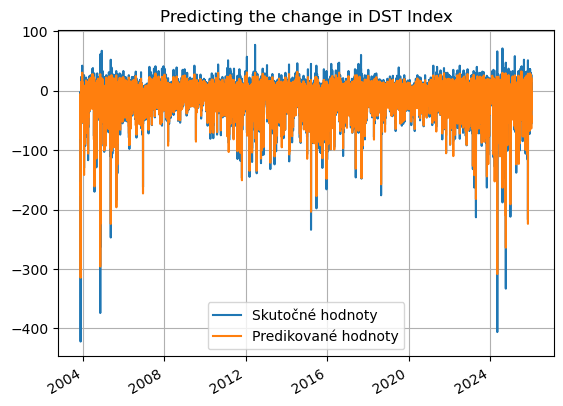

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9313324612991936
MCC=0.7922663453458488
Výkon NN:
MAE: 3.9705, MSE: 37.9478
Perzistentný model:
MAE: 4.2115, MSE: 43.2565
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 5.72%
MSE Improvement: 12.27%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 42s 47ms/step 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 39s 47ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 38s 47ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 37s 46ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 36s 46ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 21s 46ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step 

683/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 42s 46ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step 

  9/224 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 9s 45ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 8s 45ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step 

  4/759 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 28s 47ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 27s 47ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 26s 47ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 25s 47ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 24s 47ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 23s 47ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step 

547/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 13:27 902ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 37s 42ms/step   

  5/896 ━━━━━━━━━━━━━━━━━━━━ 37s 42ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 37s 42ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 37s 42ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 35s 42ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 34s 42ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 33s 42ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 33s 43ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 30s 44ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 29s 44ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 29s 45ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 28s 45ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 27s 45ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 26s 45ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 25s 45ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 24s 45ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 23s 45ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 22s 45ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 21s 45ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 20s 46ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 19s 46ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step 

682/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 43s 47ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 8s 43ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 33s 46ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 32s 45ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 32s 46ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 32s 47ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 31s 47ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 31s 46ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 30s 46ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 30s 47ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 29s 47ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 29s 46ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 28s 46ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 27s 46ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 26s 46ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 25s 46ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 24s 46ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 23s 46ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 20s 47ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 19s 47ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 18s 47ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 17s 47ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 13s 47ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step 

547/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 7s 47ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 35s 46ms/step


Shapes LSTM:
train: (229338,) (229338,)
val:   (57321,) (57321,)
test:  (194182,) (194182,)
Global sigma (LSTM errors, scaled): 0.33557674
Shapes GP:
X_gp_train: (286659, 18)
y_gp_train: (286659,)
X_test_gp: (194182, 18)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 2.6**2 * RBF(length_scale=0.347) + WhiteKernel(noise_level=0.685)


Global sigma (LSTM errors): 7.3839993
Hybrid prediction with smoothed, inflated interval ready.


In [20]:
len(y_hybrid_upper)

194182

In [21]:
len(y_pred_persistence)

194179

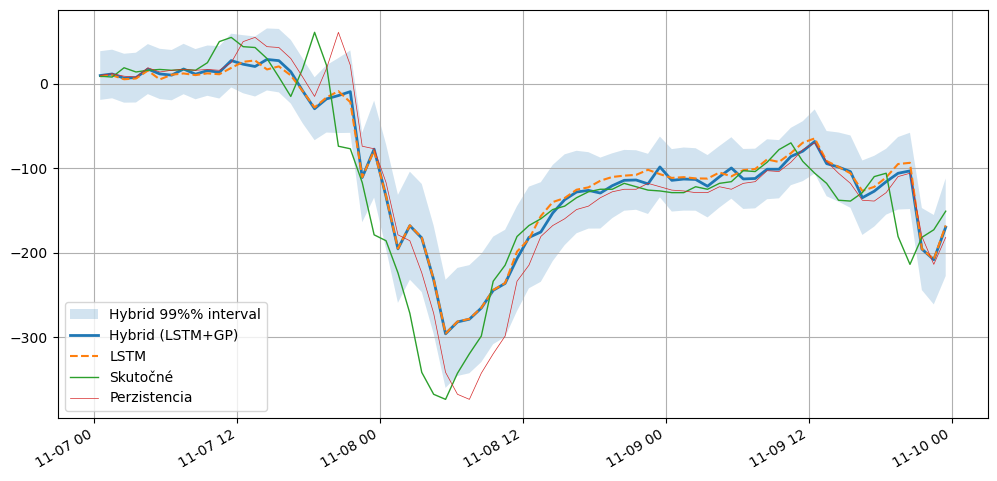

In [22]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})



start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [23]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 41.1532
MAE: 4.1376

--- Klasifikačné metriky (Prah: -20.0 nT) ---
Matthews Correlation Coefficient (MCC): 0.7847

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      146691 |        5357
Skutočná 1 |        8524 |       33607

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.95      0.96      0.95    152048
   Trieda 1 (Búrka)       0.86      0.80      0.83     42131

           accuracy                           0.93    194179
          macro avg       0.90      0.88      0.89    194179
       weighted avg       0.93      0.93      0.93    194179



In [24]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9313314004089011
MCC=0.7922655169081136
Výkon NN:
MAE: 3.9705, MSE: 37.9478
Perzistentný model:
MAE: 4.2115, MSE: 43.2565
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 5.72%
MSE Improvement: 12.27%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9444    0.9694    0.9567    152048
           1     0.8778    0.7940    0.8338     42131

    accuracy                         0.9313    194179
   macro avg     0.9111    0.8817    0.8953    194179
weighted avg     0.9300    0.9313    0.9301    194179




===== LSTM+GP =====
ACC=0.9285144119600987
MCC=0.7846968893588557
Výkon NN:
MAE: 4.1376, MSE: 41.1532
Perzistentný model:
MAE: 4.2115, MSE: 43.2565
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 1.76%
MSE Improvement: 4.86%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9451    0.9648    0.9548    152048
           1     0.8625    0.7977    0.8288     42131

    accuracy                         0.9285    194179
   macro avg     0.9038    0.8812    0.8918    194179
weighted avg     0.9272    0.9285    0.9275    194179


Saved/updated: all_models_report.csv


/tmp/ipykernel_108234/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_108234/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
2,2026-04-25T15:57:33,LSTM,12.0,1.0,DST+1,OMNI2_all,-20.0,-20.4,0.959039,0.878447,"{""text"": "" precision recall f...",2.610914,15.065203,2.567983,16.320737,-1.671768,7.692879
3,2026-04-25T15:57:33,LSTM+GP,12.0,1.0,DST+1,OMNI2_all,-20.0,-20.4,0.957222,0.871686,"{""text"": "" precision recall f...",2.484076,15.345948,2.567983,16.320737,3.267434,5.972702
4,2026-04-25T17:53:37,LSTM,18.0,1.0,DST+1,OMNI2_all,-20.0,-19.1,0.959327,0.879833,"{""text"": "" precision recall f...",2.448616,14.198152,2.567970,16.320912,4.647803,13.006378
5,2026-04-25T17:53:37,LSTM+GP,18.0,1.0,DST+1,OMNI2_all,-20.0,-19.1,0.956051,0.871779,"{""text"": "" precision recall f...",2.499449,15.078052,2.567970,16.320912,2.668300,7.615138
6,2026-04-25T19:31:27,LSTM,24.0,1.0,DST+1,OMNI2_all,-20.0,-21.0,0.958949,0.876963,"{""text"": "" precision recall f...",2.450730,14.060619,2.567993,16.321215,4.566335,13.850664
7,2026-04-25T19:31:27,LSTM+GP,24.0,1.0,DST+1,OMNI2_all,-20.0,-21.0,0.952872,0.857788,"{""text"": "" precision recall f...",2.500248,15.146312,2.567993,16.321215,2.638063,7.198630
8,2026-04-25T20:49:48,LSTM,12.0,2.0,DST+2,OMNI2_all,-20.0,-20.9,0.931452,0.792819,"{""text"": "" precision recall f...",3.984343,37.254743,4.211535,43.256014,5.394526,13.873842
9,2026-04-25T20:49:48,LSTM+GP,12.0,2.0,DST+2,OMNI2_all,-20.0,-20.9,0.926699,0.776457,"{""text"": "" precision recall f...",4.204418,41.889383,4.211535,43.256014,0.168998,3.159400
10,2026-04-25T22:20:34,LSTM,18.0,2.0,DST+2,OMNI2_all,-20.0,-20.0,0.931331,0.792266,"{""text"": "" precision recall f...",3.970476,37.947839,4.211526,43.256490,5.723593,12.272496
11,2026-04-25T22:20:34,LSTM+GP,18.0,2.0,DST+2,OMNI2_all,-20.0,-20.0,0.928514,0.784697,"{""text"": "" precision recall f...",4.137579,41.153213,4.211526,43.256490,1.755833,4.862338
